In [1]:
import pandas as pd
import numpy as np
import random
from numpy.random import RandomState
from scipy import stats
from scipy.optimize import minimize
import scipy
import os
os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Versions/4.1/Resources/'
import rpy2
from rpy2.robjects.packages import importr
from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage
import datetime
from rpy2.robjects.vectors import FloatVector
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression

real_data_folder = "/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Data/sp500_mixed_period_2000_2021/"
np.random.seed(12001)


# Define the model that generates pair simulations.
yuima = importr("yuima")
n_jumpou_NIG_sim_string = """
n_jumpou_NIG = function(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length){
  
  set.seed(random_seed)
  
  drift = c("mu11*t-mu12*X1", "mu21*t-mu22*X2")
  diffusion = matrix(c("exp(sigma11)", "exp(sigma12)", "exp(sigma21)", "exp(sigma22)"), 2, 2, byrow=TRUE)
  jumpcoef = matrix(c("j11", "j12", "j21", "j22"), 2, 2, byrow=TRUE) 
  
  alpha = alpha
  beta = c(beta1, beta2)
  delta0 = delta0
  mu = c(mu1, mu2)
  Lambda = matrix(c(lambda11, lambda12, lambda21, lambda22), 2, 2, byrow=TRUE)
  
  ou_model = setModel(drift=drift, diffusion=diffusion, jump.coeff=jumpcoef, 
                      measure.type="code",
                      measure=list(df="rNIG(z, alpha, beta, delta0, mu, Lambda)"), 
                      time.variable = "t",
                      state.var=c("X1","X2"), solve.variable=c("X1","X2"))
  newsamp = setSampling(Initial=T0, Terminal=T, n=length)
  
  n_sim_data = data.frame(matrix(nrow=length+1, ncol=2*num_sim))
  for (i in 1:num_sim){
    jumpou_sim = simulate(ou_model, 
                          true.par=list(
                            mu11=mu11, mu12=mu12, mu21=mu21, mu22=mu22, 
                            sigma11=sigma11, sigma12=sigma12, sigma21=sigma21, sigma22=sigma22,
                            j11=j11, j12=j12, j21=j21, j22=j22,
                            alpha=alpha, beta=beta, delta0=delta0, mu=mu, Lambda=Lambda), 
                          xinit=xinit_vec[[i]], sampling=newsamp)
    original_data = jumpou_sim@data@original.data
    one_sim_jumpou = data.frame(original_data[,1], original_data[,2])
    colnames(one_sim_jumpou) = c('series1', 'series2')
    n_sim_data[, (2*i-1):(2*i)] = one_sim_jumpou
  }
  return(n_sim_data)
}
"""

n_jumpou_NIG_sim = SignatureTranslatedAnonymousPackage(n_jumpou_NIG_sim_string, "n_jumpou_NIG_sim")
def n_jumpou_simulation(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length):

    n_sim_data = pd.DataFrame(
        n_jumpou_NIG_sim.n_jumpou_NIG(random_seed, num_sim,
                                      mu11, mu12, mu21, mu22, 
                                      sigma11, sigma12, sigma21, sigma22,
                                      j11, j12, j21, j22,
                                      alpha, beta1, beta2, delta0, mu1, mu2, 
                                      lambda11, lambda12, lambda21, lambda22,
                                      xinit_vec, T0, T, length)).transpose()
    return n_sim_data


def price_to_log_price(n_price):
    return(np.log(n_price))

def log_price_to_price(n_log_price):
    return(np.exp(n_log_price))

def price_to_return(n_price):
    n_return = pd.DataFrame()
    for i in range(n_price.shape[1]):
        ith_column_price_series = n_price.iloc[:, i]
        n_return = pd.concat([n_return, 100 * (np.log(ith_column_price_series[1:].values) - np.log(ith_column_price_series[:-1]))], axis=1)
    return n_return

def log_price_to_return(n_log_price):
    n_real_return = pd.DataFrame()
    for i in range(n_log_price.shape[1]):
        ith_column_price_series = n_log_price.iloc[:, i]
        n_real_return = pd.concat([n_real_return, 100 * (ith_column_price_series[1:].values - ith_column_price_series[:-1])], axis=1)
    return n_real_return


def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'
    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]
    return corr_coef

def cal_stats(n_return, n_price):
    
    return_series1 = n_return.iloc[:, ::2]
    return_series2 = n_return.iloc[:, 1::2]
    price_series1 = n_price.iloc[:, ::2]
    price_series2 = n_price.iloc[:, 1::2]
    sq_return_series1 = return_series1**2
    sq_return_series2 = return_series2**2

    
    mean1 = return_series1.mean(axis=0).values
    sd1 = return_series1.std(axis=0).values
    skew1 = return_series1.skew(axis=0).values
    kurtosis1 = return_series1.kurtosis(axis=0).values
       
    
    mean2 = return_series2.mean(axis=0).values
    sd2 = return_series2.std(axis=0).values
    skew2 = return_series2.skew(axis=0).values
    kurtosis2 = return_series2.kurtosis(axis=0).values #8(8)
    
    
    
    # Autocorrelation of the 2 return series with 3 lags respectively
    autocorr1_lag_1 = return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr1_lag_2 = return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr1_lag_3 = return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr2_lag_1 = return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr2_lag_2 = return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr2_lag_3 = return_series2.apply(lambda x: x.autocorr(lag=3)) #6(14)
    
    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_ts1_lag_0.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(21)
    
    
    
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#6(27)
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    
    
    stats_data = pd.DataFrame([mean1, mean2, sd1, sd2, 
                               skew1, skew2, kurtosis1, kurtosis2, #8(8)
                               
                               autocorr1_lag_1, autocorr1_lag_2, autocorr1_lag_3,
                               autocorr2_lag_1, autocorr2_lag_2, autocorr2_lag_3,#6(14)
                               
                               corr_ts1_lag_0, 
                               corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
                               corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
                               
                               autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
                               autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)
                               
                               corr_sqts1_lag_0,
                               corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
                               corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3])#7(34)
    stats_data = stats_data.transpose()
    stats_data.columns = [
        'return_mean1', 'return_mean2',
        'return_sd1', 'return_sd2',
        'return_skew1', 'return_skew2',
        'return_kurtosis1', 'return_kurtosis2',
        
        'return_autocorrelation_ts1_lag1', 'return_autocorrelation_ts1_lag2', 'return_autocorrelation_ts1_lag3',
        'return_autocorrelation_ts2_lag1', 'return_autocorrelation_ts2_lag2', 'return_autocorrelation_ts2_lag3',
        
        'return_correlation_ts1_lag_0',
        'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
        'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
        
        'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
        'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
        'sqreturn_correlation_ts1_lag_0',
        'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
        'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3']
    
    return stats_data



def loss_function(params):

    params = FloatVector(params)
    print(params)
    moment_loss = pd.DataFrame().reindex_like(real_stats)
    
    n_sim_log_price = n_jumpou_simulation(
        random_seed=int(np.random.randint(low=0, high=980608, size=(1,))), num_sim=num_sim,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        alpha=params[12], 
        beta1=beta1, beta2=beta2, 
        delta0=params[13], 
        mu1=params[14], mu2=params[15], 
        lambda11=params[16], lambda12=lambda12, 
        lambda21=lambda21, lambda22=1/params[16],
        xinit_vec=xinit_vec, T0=T0, T=T, length=length)
    
    n_sim_price = log_price_to_price(n_sim_log_price)
    n_sim_return = price_to_return(n_sim_price)
    n_sim_stats = cal_stats(n_sim_return, n_sim_price)

    moment_loss = np.abs(n_real_stats - n_sim_stats)
    sum_loss = np.sum(moment_loss)

    sum_loss[6] = sum_loss[6]/10 
    sum_loss[7] = sum_loss[7]/10 
    
    loss = np.sum(sum_loss)

    print(sum_loss)
    print(loss)
    print('----------')

    return loss



real_price = pd.read_csv(real_data_folder + "pair_prices_cal.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_cal.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)
    
num_sim, T0, T, length = real_stats.shape[0], 0, 2, real_price.shape[0]
n_real_stats = real_stats


#alpha
beta1 = 0
beta2 = 0
#delta0
#mu1
#mu2
#lambda11 = 1
lambda12 = 0
lambda21 = 0
#lambda22 = 1


initial0 = [1, 1, 1, 1,
            -1, -1, -1, -1,
            0.1, 0.1, 0.1, 0.1,
            1, 1,
            1, 1,
            1]

begin_time = datetime.datetime.now()
res = minimize(loss_function, initial0, method='Powell',
               tol=1e-6, options={'disp': True},
               bounds=[(0, None), (0, None), (0, None), (0, None),
                       (None, None), (None, None), (None, None), (None, None),
                       (None, None), (None, None), (None, None), (None, None),
                       (0, None), (0, None),
                       (None, None), (None, None), 
                       (0, None)])
print(res.x)

time = datetime.datetime.now() - begin_time
print(time)

params = (res.x)
loss = loss_function((params))
print(loss)

 [1]  1.0  1.0  1.0  1.0 -1.0 -1.0 -1.0 -1.0  0.1  0.1  0.1  0.1  1.0  1.0  1.0
[16]  1.0  1.0

return_mean1                          94.065713
return_mean2                          89.572663
return_sd1                           406.461664
return_sd2                           398.808538
return_skew1                         170.609641
return_skew2                         176.361271
return_kurtosis1                     151.347581
return_kurtosis2                     170.299191
return_autocorrelation_ts1_lag1       16.540283
return_autocorrelation_ts1_lag2       14.383051
return_autocorrelation_ts1_lag3       14.706717
return_autocorrelation_ts2_lag1       16.254131
return_autocorrelation_ts2_lag2       14.929943
return_autocorrelation_ts2_lag3       14.722608
return_correlation_ts1_lag_0         166.466693
return_correlation_ts1_lag_1          14.511355
return_correlation_ts1_lag_2          14.514849
return_correlation_ts1_lag_3          15.190991
return_correlation_ts2_lag_1          15

return_mean1                          40.991671
return_mean2                          89.630866
return_sd1                           408.595725
return_sd2                           395.840419
return_skew1                         167.246487
return_skew2                         178.306865
return_kurtosis1                     159.562435
return_kurtosis2                     173.931251
return_autocorrelation_ts1_lag1       16.682001
return_autocorrelation_ts1_lag2       15.339112
return_autocorrelation_ts1_lag3       14.011214
return_autocorrelation_ts2_lag1       16.757813
return_autocorrelation_ts2_lag2       14.986396
return_autocorrelation_ts2_lag3       14.668894
return_correlation_ts1_lag_0         166.291819
return_correlation_ts1_lag_1          14.624099
return_correlation_ts1_lag_2          14.461067
return_correlation_ts1_lag_3          14.435284
return_correlation_ts2_lag_1          14.772789
return_correlation_ts2_lag_2          13.013763
return_correlation_ts2_lag_3          14

return_mean1                          42.573044
return_mean2                          86.593357
return_sd1                           409.063358
return_sd2                           397.991827
return_skew1                         183.145503
return_skew2                         187.703942
return_kurtosis1                     154.308413
return_kurtosis2                     183.512125
return_autocorrelation_ts1_lag1       18.068748
return_autocorrelation_ts1_lag2       15.369198
return_autocorrelation_ts1_lag3       14.765417
return_autocorrelation_ts2_lag1       16.890987
return_autocorrelation_ts2_lag2       14.801190
return_autocorrelation_ts2_lag3       15.119128
return_correlation_ts1_lag_0         166.299612
return_correlation_ts1_lag_1          15.596684
return_correlation_ts1_lag_2          14.669684
return_correlation_ts1_lag_3          14.704590
return_correlation_ts2_lag_1          16.551362
return_correlation_ts2_lag_2          13.692094
return_correlation_ts2_lag_3          14

return_mean1                          40.274293
return_mean2                          90.419182
return_sd1                           412.032933
return_sd2                           400.959533
return_skew1                         169.923061
return_skew2                         186.007428
return_kurtosis1                     158.166754
return_kurtosis2                     182.561079
return_autocorrelation_ts1_lag1       17.858137
return_autocorrelation_ts1_lag2       16.190166
return_autocorrelation_ts1_lag3       15.356889
return_autocorrelation_ts2_lag1       15.486679
return_autocorrelation_ts2_lag2       14.510632
return_autocorrelation_ts2_lag3       15.278482
return_correlation_ts1_lag_0         166.298138
return_correlation_ts1_lag_1          14.565691
return_correlation_ts1_lag_2          14.009098
return_correlation_ts1_lag_3          14.706229
return_correlation_ts2_lag_1          15.506480
return_correlation_ts2_lag_2          12.488332
return_correlation_ts2_lag_3          14

return_mean1                          42.195197
return_mean2                          88.015795
return_sd1                           414.167410
return_sd2                           399.801193
return_skew1                         175.036958
return_skew2                         177.741342
return_kurtosis1                     167.246334
return_kurtosis2                     177.534549
return_autocorrelation_ts1_lag1       17.580862
return_autocorrelation_ts1_lag2       15.459150
return_autocorrelation_ts1_lag3       15.423524
return_autocorrelation_ts2_lag1       16.476453
return_autocorrelation_ts2_lag2       16.050310
return_autocorrelation_ts2_lag3       14.524896
return_correlation_ts1_lag_0         166.294744
return_correlation_ts1_lag_1          15.349518
return_correlation_ts1_lag_2          14.507924
return_correlation_ts1_lag_3          14.777760
return_correlation_ts2_lag_1          15.295334
return_correlation_ts2_lag_2          14.296542
return_correlation_ts2_lag_3          14

return_mean1                          40.314922
return_mean2                          87.571270
return_sd1                           410.500391
return_sd2                           400.860846
return_skew1                         172.983221
return_skew2                         181.155144
return_kurtosis1                     159.925218
return_kurtosis2                     179.375905
return_autocorrelation_ts1_lag1       19.025016
return_autocorrelation_ts1_lag2       14.961966
return_autocorrelation_ts1_lag3       14.790801
return_autocorrelation_ts2_lag1       17.785441
return_autocorrelation_ts2_lag2       15.329419
return_autocorrelation_ts2_lag3       14.877749
return_correlation_ts1_lag_0         166.294302
return_correlation_ts1_lag_1          15.915630
return_correlation_ts1_lag_2          14.194351
return_correlation_ts1_lag_3          14.479049
return_correlation_ts2_lag_1          17.184757
return_correlation_ts2_lag_2          13.054869
return_correlation_ts2_lag_3          14

return_mean1                          40.668892
return_mean2                          90.342083
return_sd1                           415.488694
return_sd2                           403.714075
return_skew1                         190.197982
return_skew2                         199.143752
return_kurtosis1                     177.460003
return_kurtosis2                     197.665660
return_autocorrelation_ts1_lag1       17.164734
return_autocorrelation_ts1_lag2       14.931901
return_autocorrelation_ts1_lag3       14.497088
return_autocorrelation_ts2_lag1       16.140259
return_autocorrelation_ts2_lag2       14.973031
return_autocorrelation_ts2_lag3       14.944993
return_correlation_ts1_lag_0         166.293664
return_correlation_ts1_lag_1          14.275145
return_correlation_ts1_lag_2          15.103790
return_correlation_ts1_lag_3          14.606705
return_correlation_ts2_lag_1          15.794930
return_correlation_ts2_lag_2          13.248439
return_correlation_ts2_lag_3          14

return_mean1                         786.346906
return_mean2                          88.016574
return_sd1                           481.969119
return_sd2                           395.986740
return_skew1                         156.341603
return_skew2                         173.855815
return_kurtosis1                     154.446015
return_kurtosis2                     170.010508
return_autocorrelation_ts1_lag1       53.510809
return_autocorrelation_ts1_lag2       50.551723
return_autocorrelation_ts1_lag3       47.925257
return_autocorrelation_ts2_lag1       16.465473
return_autocorrelation_ts2_lag2       15.400620
return_autocorrelation_ts2_lag3       13.860015
return_correlation_ts1_lag_0         151.310310
return_correlation_ts1_lag_1          18.638843
return_correlation_ts1_lag_2          18.329729
return_correlation_ts1_lag_3          17.238822
return_correlation_ts2_lag_1          18.472732
return_correlation_ts2_lag_2          16.416931
return_correlation_ts2_lag_3          15

return_mean1                          38.129583
return_mean2                          88.810749
return_sd1                           409.119592
return_sd2                           396.588338
return_skew1                         174.166498
return_skew2                         184.661519
return_kurtosis1                     166.573303
return_kurtosis2                     184.356784
return_autocorrelation_ts1_lag1       17.713079
return_autocorrelation_ts1_lag2       16.021178
return_autocorrelation_ts1_lag3       16.248631
return_autocorrelation_ts2_lag1       16.357034
return_autocorrelation_ts2_lag2       15.545695
return_autocorrelation_ts2_lag3       14.704017
return_correlation_ts1_lag_0         166.346031
return_correlation_ts1_lag_1          15.375202
return_correlation_ts1_lag_2          14.739947
return_correlation_ts1_lag_3          15.155229
return_correlation_ts2_lag_1          15.241294
return_correlation_ts2_lag_2          14.024685
return_correlation_ts2_lag_3          14

return_mean1                          39.326162
return_mean2                          87.795382
return_sd1                           409.304178
return_sd2                           396.727050
return_skew1                         171.411169
return_skew2                         174.622680
return_kurtosis1                     154.825491
return_kurtosis2                     172.452192
return_autocorrelation_ts1_lag1       17.803830
return_autocorrelation_ts1_lag2       16.662233
return_autocorrelation_ts1_lag3       14.601464
return_autocorrelation_ts2_lag1       16.916887
return_autocorrelation_ts2_lag2       15.774826
return_autocorrelation_ts2_lag3       14.200569
return_correlation_ts1_lag_0         166.302121
return_correlation_ts1_lag_1          15.426211
return_correlation_ts1_lag_2          15.040113
return_correlation_ts1_lag_3          14.019992
return_correlation_ts2_lag_1          15.285171
return_correlation_ts2_lag_2          13.947324
return_correlation_ts2_lag_3          14

return_mean1                          41.867939
return_mean2                          87.821453
return_sd1                           412.974753
return_sd2                           401.906745
return_skew1                         185.367042
return_skew2                         199.527439
return_kurtosis1                     158.784201
return_kurtosis2                     187.594247
return_autocorrelation_ts1_lag1       17.659588
return_autocorrelation_ts1_lag2       14.996646
return_autocorrelation_ts1_lag3       14.664151
return_autocorrelation_ts2_lag1       16.354939
return_autocorrelation_ts2_lag2       14.397805
return_autocorrelation_ts2_lag3       14.365714
return_correlation_ts1_lag_0         166.306255
return_correlation_ts1_lag_1          15.575565
return_correlation_ts1_lag_2          14.373637
return_correlation_ts1_lag_3          14.278528
return_correlation_ts2_lag_1          16.291464
return_correlation_ts2_lag_2          12.719461
return_correlation_ts2_lag_3          13

return_mean1                          42.467027
return_mean2                          90.239786
return_sd1                           409.506792
return_sd2                           397.752654
return_skew1                         165.343925
return_skew2                         160.948001
return_kurtosis1                     156.613311
return_kurtosis2                     167.949977
return_autocorrelation_ts1_lag1       17.284011
return_autocorrelation_ts1_lag2       15.081941
return_autocorrelation_ts1_lag3       14.747508
return_autocorrelation_ts2_lag1       16.217687
return_autocorrelation_ts2_lag2       15.681062
return_autocorrelation_ts2_lag3       15.367887
return_correlation_ts1_lag_0         166.302196
return_correlation_ts1_lag_1          14.611040
return_correlation_ts1_lag_2          15.018208
return_correlation_ts1_lag_3          15.149165
return_correlation_ts2_lag_1          15.323008
return_correlation_ts2_lag_2          13.530679
return_correlation_ts2_lag_3          13

return_mean1                          41.614560
return_mean2                          90.264208
return_sd1                           412.783800
return_sd2                           399.770047
return_skew1                         185.266175
return_skew2                         194.320366
return_kurtosis1                     163.441107
return_kurtosis2                     176.761041
return_autocorrelation_ts1_lag1       16.824170
return_autocorrelation_ts1_lag2       15.979742
return_autocorrelation_ts1_lag3       15.364693
return_autocorrelation_ts2_lag1       15.851488
return_autocorrelation_ts2_lag2       14.780896
return_autocorrelation_ts2_lag3       14.828444
return_correlation_ts1_lag_0         166.305883
return_correlation_ts1_lag_1          15.107065
return_correlation_ts1_lag_2          15.167226
return_correlation_ts1_lag_3          14.571284
return_correlation_ts2_lag_1          15.515901
return_correlation_ts2_lag_2          14.059587
return_correlation_ts2_lag_3          14

return_mean1                          40.577152
return_mean2                          82.250238
return_sd1                           407.089245
return_sd2                           395.559508
return_skew1                         170.712845
return_skew2                         180.427020
return_kurtosis1                     175.770999
return_kurtosis2                     194.307863
return_autocorrelation_ts1_lag1       16.657993
return_autocorrelation_ts1_lag2       16.126530
return_autocorrelation_ts1_lag3       15.099125
return_autocorrelation_ts2_lag1       16.863583
return_autocorrelation_ts2_lag2       14.669974
return_autocorrelation_ts2_lag3       14.853433
return_correlation_ts1_lag_0         166.328753
return_correlation_ts1_lag_1          14.214765
return_correlation_ts1_lag_2          15.204422
return_correlation_ts1_lag_3          14.014200
return_correlation_ts2_lag_1          15.593559
return_correlation_ts2_lag_2          13.532534
return_correlation_ts2_lag_3          14

return_mean1                          39.488874
return_mean2                          42.055342
return_sd1                           404.420704
return_sd2                           397.486687
return_skew1                         168.720648
return_skew2                         168.093222
return_kurtosis1                     158.639025
return_kurtosis2                     179.789973
return_autocorrelation_ts1_lag1       17.297899
return_autocorrelation_ts1_lag2       14.913527
return_autocorrelation_ts1_lag3       14.475749
return_autocorrelation_ts2_lag1       16.637625
return_autocorrelation_ts2_lag2       16.012526
return_autocorrelation_ts2_lag3       13.911580
return_correlation_ts1_lag_0         166.462836
return_correlation_ts1_lag_1          15.643014
return_correlation_ts1_lag_2          14.816614
return_correlation_ts1_lag_3          14.005418
return_correlation_ts2_lag_1          15.750869
return_correlation_ts2_lag_2          13.526440
return_correlation_ts2_lag_3          13

return_mean1                          41.697179
return_mean2                          44.305223
return_sd1                           409.276783
return_sd2                           399.375967
return_skew1                         186.031927
return_skew2                         193.084671
return_kurtosis1                     174.472829
return_kurtosis2                     192.129387
return_autocorrelation_ts1_lag1       17.360618
return_autocorrelation_ts1_lag2       15.314337
return_autocorrelation_ts1_lag3       15.843052
return_autocorrelation_ts2_lag1       16.953339
return_autocorrelation_ts2_lag2       15.367558
return_autocorrelation_ts2_lag3       15.995233
return_correlation_ts1_lag_0         166.461129
return_correlation_ts1_lag_1          14.694767
return_correlation_ts1_lag_2          14.599114
return_correlation_ts1_lag_3          15.889036
return_correlation_ts2_lag_1          15.787408
return_correlation_ts2_lag_2          13.212233
return_correlation_ts2_lag_3          15

return_mean1                          38.993300
return_mean2                          44.678541
return_sd1                           416.796031
return_sd2                           405.181983
return_skew1                         179.943050
return_skew2                         194.752815
return_kurtosis1                     170.736705
return_kurtosis2                     192.265754
return_autocorrelation_ts1_lag1       18.660822
return_autocorrelation_ts1_lag2       15.909217
return_autocorrelation_ts1_lag3       15.455318
return_autocorrelation_ts2_lag1       17.393551
return_autocorrelation_ts2_lag2       16.470842
return_autocorrelation_ts2_lag3       15.349996
return_correlation_ts1_lag_0         166.463749
return_correlation_ts1_lag_1          15.632361
return_correlation_ts1_lag_2          15.118564
return_correlation_ts1_lag_3          14.938611
return_correlation_ts2_lag_1          16.887162
return_correlation_ts2_lag_2          14.485250
return_correlation_ts2_lag_3          15

return_mean1                          39.386278
return_mean2                          42.373708
return_sd1                           411.631113
return_sd2                           403.985345
return_skew1                         174.008492
return_skew2                         185.307169
return_kurtosis1                     168.137685
return_kurtosis2                     180.687251
return_autocorrelation_ts1_lag1       17.450869
return_autocorrelation_ts1_lag2       16.605413
return_autocorrelation_ts1_lag3       15.731489
return_autocorrelation_ts2_lag1       17.075038
return_autocorrelation_ts2_lag2       16.287426
return_autocorrelation_ts2_lag3       15.442679
return_correlation_ts1_lag_0         166.462585
return_correlation_ts1_lag_1          16.075346
return_correlation_ts1_lag_2          15.579632
return_correlation_ts1_lag_3          16.194243
return_correlation_ts2_lag_1          15.614833
return_correlation_ts2_lag_2          13.696687
return_correlation_ts2_lag_3          15

return_mean1                          40.838693
return_mean2                          43.305383
return_sd1                           409.642145
return_sd2                           403.971340
return_skew1                         176.652917
return_skew2                         178.318752
return_kurtosis1                     159.488513
return_kurtosis2                     171.588247
return_autocorrelation_ts1_lag1       17.120073
return_autocorrelation_ts1_lag2       15.250716
return_autocorrelation_ts1_lag3       14.781382
return_autocorrelation_ts2_lag1       17.159997
return_autocorrelation_ts2_lag2       16.265194
return_autocorrelation_ts2_lag3       15.182257
return_correlation_ts1_lag_0         166.465234
return_correlation_ts1_lag_1          15.755572
return_correlation_ts1_lag_2          15.632788
return_correlation_ts1_lag_3          14.226851
return_correlation_ts2_lag_1          15.908684
return_correlation_ts2_lag_2          13.816375
return_correlation_ts2_lag_3          14

return_mean1                          39.864724
return_mean2                         749.533595
return_sd1                           408.411016
return_sd2                           463.056872
return_skew1                         162.774921
return_skew2                         175.141255
return_kurtosis1                     160.640289
return_kurtosis2                     171.436146
return_autocorrelation_ts1_lag1       17.614950
return_autocorrelation_ts1_lag2       16.888967
return_autocorrelation_ts1_lag3       15.049234
return_autocorrelation_ts2_lag1       46.625116
return_autocorrelation_ts2_lag2       47.038714
return_autocorrelation_ts2_lag3       42.791090
return_correlation_ts1_lag_0         155.563488
return_correlation_ts1_lag_1          19.521983
return_correlation_ts1_lag_2          19.975210
return_correlation_ts1_lag_3          17.301332
return_correlation_ts2_lag_1          21.123339
return_correlation_ts2_lag_2          19.283072
return_correlation_ts2_lag_3          17

return_mean1                          39.828374
return_mean2                          54.739893
return_sd1                           408.848902
return_sd2                           400.688581
return_skew1                         173.621693
return_skew2                         180.626252
return_kurtosis1                     163.970368
return_kurtosis2                     176.812022
return_autocorrelation_ts1_lag1       16.175964
return_autocorrelation_ts1_lag2       16.628060
return_autocorrelation_ts1_lag3       14.496626
return_autocorrelation_ts2_lag1       16.441619
return_autocorrelation_ts2_lag2       17.590741
return_autocorrelation_ts2_lag3       14.281045
return_correlation_ts1_lag_0         166.425174
return_correlation_ts1_lag_1          14.687694
return_correlation_ts1_lag_2          16.333204
return_correlation_ts1_lag_3          15.291726
return_correlation_ts2_lag_1          15.709911
return_correlation_ts2_lag_2          14.845904
return_correlation_ts2_lag_3          13

return_mean1                          39.696621
return_mean2                          46.958638
return_sd1                           409.855034
return_sd2                           399.723206
return_skew1                         172.402294
return_skew2                         178.011994
return_kurtosis1                     164.689811
return_kurtosis2                     181.124021
return_autocorrelation_ts1_lag1       16.979552
return_autocorrelation_ts1_lag2       15.070658
return_autocorrelation_ts1_lag3       15.761658
return_autocorrelation_ts2_lag1       17.152347
return_autocorrelation_ts2_lag2       14.808454
return_autocorrelation_ts2_lag3       15.630405
return_correlation_ts1_lag_0         166.457191
return_correlation_ts1_lag_1          13.925997
return_correlation_ts1_lag_2          14.171714
return_correlation_ts1_lag_3          15.223827
return_correlation_ts2_lag_1          15.825177
return_correlation_ts2_lag_2          13.099962
return_correlation_ts2_lag_3          15

return_mean1                          39.315203
return_mean2                          46.716934
return_sd1                           408.584449
return_sd2                           400.021012
return_skew1                         186.874845
return_skew2                         192.545923
return_kurtosis1                     179.319172
return_kurtosis2                     187.705123
return_autocorrelation_ts1_lag1       17.235117
return_autocorrelation_ts1_lag2       15.951791
return_autocorrelation_ts1_lag3       14.714571
return_autocorrelation_ts2_lag1       17.413426
return_autocorrelation_ts2_lag2       16.341956
return_autocorrelation_ts2_lag3       14.683312
return_correlation_ts1_lag_0         166.457797
return_correlation_ts1_lag_1          16.085300
return_correlation_ts1_lag_2          14.941588
return_correlation_ts1_lag_3          14.560353
return_correlation_ts2_lag_1          16.398709
return_correlation_ts2_lag_2          14.267095
return_correlation_ts2_lag_3          14

return_mean1                          40.221549
return_mean2                          47.339204
return_sd1                           409.415944
return_sd2                           402.368603
return_skew1                         182.517775
return_skew2                         186.832573
return_kurtosis1                     176.870258
return_kurtosis2                     188.971855
return_autocorrelation_ts1_lag1       16.926963
return_autocorrelation_ts1_lag2       14.899843
return_autocorrelation_ts1_lag3       14.604446
return_autocorrelation_ts2_lag1       16.876330
return_autocorrelation_ts2_lag2       15.310977
return_autocorrelation_ts2_lag3       16.003250
return_correlation_ts1_lag_0         166.457298
return_correlation_ts1_lag_1          15.224489
return_correlation_ts1_lag_2          14.349802
return_correlation_ts1_lag_3          14.493209
return_correlation_ts2_lag_1          15.823675
return_correlation_ts2_lag_2          14.088943
return_correlation_ts2_lag_3          15

return_mean1                          40.738306
return_mean2                          47.098031
return_sd1                           408.264319
return_sd2                           402.366330
return_skew1                         167.814725
return_skew2                         173.312072
return_kurtosis1                     147.084993
return_kurtosis2                     166.798985
return_autocorrelation_ts1_lag1       18.021685
return_autocorrelation_ts1_lag2       16.711894
return_autocorrelation_ts1_lag3       14.417854
return_autocorrelation_ts2_lag1       17.860012
return_autocorrelation_ts2_lag2       16.339321
return_autocorrelation_ts2_lag3       14.098561
return_correlation_ts1_lag_0         166.461556
return_correlation_ts1_lag_1          16.723958
return_correlation_ts1_lag_2          15.867472
return_correlation_ts1_lag_3          14.694253
return_correlation_ts2_lag_1          16.860057
return_correlation_ts2_lag_2          14.494481
return_correlation_ts2_lag_3          14

return_mean1                          39.303125
return_mean2                          47.488171
return_sd1                           237.282057
return_sd2                           402.061988
return_skew1                         226.958410
return_skew2                         190.618687
return_kurtosis1                     226.036693
return_kurtosis2                     195.923192
return_autocorrelation_ts1_lag1       20.604175
return_autocorrelation_ts1_lag2       17.381750
return_autocorrelation_ts1_lag3       16.651495
return_autocorrelation_ts2_lag1       16.968457
return_autocorrelation_ts2_lag2       15.443351
return_autocorrelation_ts2_lag3       15.450436
return_correlation_ts1_lag_0         103.386595
return_correlation_ts1_lag_1          16.961430
return_correlation_ts1_lag_2          15.490843
return_correlation_ts1_lag_3          15.645976
return_correlation_ts2_lag_1          17.584112
return_correlation_ts2_lag_2          14.859908
return_correlation_ts2_lag_3          15

return_mean1                          39.791440
return_mean2                          46.531632
return_sd1                           247.518255
return_sd2                           398.611068
return_skew1                         198.010579
return_skew2                         172.876914
return_kurtosis1                     175.535383
return_kurtosis2                     173.128062
return_autocorrelation_ts1_lag1       19.247221
return_autocorrelation_ts1_lag2       17.953713
return_autocorrelation_ts1_lag3       16.240243
return_autocorrelation_ts2_lag1       16.349324
return_autocorrelation_ts2_lag2       16.770073
return_autocorrelation_ts2_lag3       14.921304
return_correlation_ts1_lag_0         134.006752
return_correlation_ts1_lag_1          15.455342
return_correlation_ts1_lag_2          16.151741
return_correlation_ts1_lag_3          15.132923
return_correlation_ts2_lag_1          15.890379
return_correlation_ts2_lag_2          14.881036
return_correlation_ts2_lag_3          14

return_mean1                          38.304167
return_mean2                          46.195564
return_sd1                           248.489952
return_sd2                           400.742077
return_skew1                         214.252336
return_skew2                         175.402411
return_kurtosis1                     206.266325
return_kurtosis2                     173.911631
return_autocorrelation_ts1_lag1       19.649633
return_autocorrelation_ts1_lag2       18.113320
return_autocorrelation_ts1_lag3       16.400321
return_autocorrelation_ts2_lag1       17.367274
return_autocorrelation_ts2_lag2       15.875548
return_autocorrelation_ts2_lag3       15.666159
return_correlation_ts1_lag_0         134.464451
return_correlation_ts1_lag_1          15.620896
return_correlation_ts1_lag_2          15.952020
return_correlation_ts1_lag_3          15.736541
return_correlation_ts2_lag_1          16.708770
return_correlation_ts2_lag_2          14.860451
return_correlation_ts2_lag_3          15

return_mean1                          39.046625
return_mean2                          46.902009
return_sd1                           249.415755
return_sd2                           402.726535
return_skew1                         230.214062
return_skew2                         186.922094
return_kurtosis1                     218.635901
return_kurtosis2                     184.909498
return_autocorrelation_ts1_lag1       20.486876
return_autocorrelation_ts1_lag2       18.082195
return_autocorrelation_ts1_lag3       15.634892
return_autocorrelation_ts2_lag1       17.448838
return_autocorrelation_ts2_lag2       16.222256
return_autocorrelation_ts2_lag3       16.073159
return_correlation_ts1_lag_0         134.249059
return_correlation_ts1_lag_1          16.385739
return_correlation_ts1_lag_2          16.363968
return_correlation_ts1_lag_3          15.587147
return_correlation_ts2_lag_1          17.404524
return_correlation_ts2_lag_2          15.399145
return_correlation_ts2_lag_3          15

return_mean1                          38.461184
return_mean2                          48.782144
return_sd1                           247.949437
return_sd2                           400.053039
return_skew1                         208.694499
return_skew2                         180.815901
return_kurtosis1                     183.816333
return_kurtosis2                     173.577738
return_autocorrelation_ts1_lag1       19.919528
return_autocorrelation_ts1_lag2       16.482804
return_autocorrelation_ts1_lag3       17.237185
return_autocorrelation_ts2_lag1       17.083447
return_autocorrelation_ts2_lag2       14.671362
return_autocorrelation_ts2_lag3       15.717483
return_correlation_ts1_lag_0         134.001687
return_correlation_ts1_lag_1          16.306113
return_correlation_ts1_lag_2          14.486953
return_correlation_ts1_lag_3          16.671104
return_correlation_ts2_lag_1          16.683891
return_correlation_ts2_lag_2          13.708492
return_correlation_ts2_lag_3          15

return_mean1                          38.324710
return_mean2                          47.007166
return_sd1                           251.882795
return_sd2                           405.051574
return_skew1                         214.126502
return_skew2                         188.107338
return_kurtosis1                     199.915785
return_kurtosis2                     178.549785
return_autocorrelation_ts1_lag1       19.566095
return_autocorrelation_ts1_lag2       18.177297
return_autocorrelation_ts1_lag3       16.748173
return_autocorrelation_ts2_lag1       17.518633
return_autocorrelation_ts2_lag2       15.039688
return_autocorrelation_ts2_lag3       15.465713
return_correlation_ts1_lag_0         134.338737
return_correlation_ts1_lag_1          16.512142
return_correlation_ts1_lag_2          15.728793
return_correlation_ts1_lag_3          16.483005
return_correlation_ts2_lag_1          17.381469
return_correlation_ts2_lag_2          14.128834
return_correlation_ts2_lag_3          14

return_mean1                          38.871080
return_mean2                          47.164757
return_sd1                           218.706352
return_sd2                           400.017183
return_skew1                         233.159037
return_skew2                         183.461278
return_kurtosis1                     200.755699
return_kurtosis2                     174.957688
return_autocorrelation_ts1_lag1       21.389244
return_autocorrelation_ts1_lag2       18.632822
return_autocorrelation_ts1_lag3       17.506614
return_autocorrelation_ts2_lag1       16.500299
return_autocorrelation_ts2_lag2       15.831808
return_autocorrelation_ts2_lag3       15.418529
return_correlation_ts1_lag_0         135.940108
return_correlation_ts1_lag_1          16.442926
return_correlation_ts1_lag_2          15.534950
return_correlation_ts1_lag_3          15.623999
return_correlation_ts2_lag_1          16.942748
return_correlation_ts2_lag_2          14.833221
return_correlation_ts2_lag_3          15

return_mean1                          39.309756
return_mean2                          47.845144
return_sd1                           218.117707
return_sd2                           401.675559
return_skew1                         210.241443
return_skew2                         170.237037
return_kurtosis1                     176.123903
return_kurtosis2                     165.086093
return_autocorrelation_ts1_lag1       20.504462
return_autocorrelation_ts1_lag2       18.619733
return_autocorrelation_ts1_lag3       16.852840
return_autocorrelation_ts2_lag1       17.928687
return_autocorrelation_ts2_lag2       16.361878
return_autocorrelation_ts2_lag3       15.491498
return_correlation_ts1_lag_0         135.964992
return_correlation_ts1_lag_1          16.245065
return_correlation_ts1_lag_2          16.158465
return_correlation_ts1_lag_3          15.823280
return_correlation_ts2_lag_1          17.253023
return_correlation_ts2_lag_2          14.661488
return_correlation_ts2_lag_3          14

return_mean1                          38.881472
return_mean2                          47.669076
return_sd1                           217.831682
return_sd2                           399.396441
return_skew1                         218.948996
return_skew2                         177.613122
return_kurtosis1                     173.756748
return_kurtosis2                     172.117649
return_autocorrelation_ts1_lag1       21.229406
return_autocorrelation_ts1_lag2       19.182237
return_autocorrelation_ts1_lag3       17.123647
return_autocorrelation_ts2_lag1       16.706394
return_autocorrelation_ts2_lag2       15.202844
return_autocorrelation_ts2_lag3       14.822725
return_correlation_ts1_lag_0         135.718132
return_correlation_ts1_lag_1          15.739970
return_correlation_ts1_lag_2          16.204601
return_correlation_ts1_lag_3          15.563437
return_correlation_ts2_lag_1          17.746121
return_correlation_ts2_lag_2          14.265270
return_correlation_ts2_lag_3          14

return_mean1                          40.074301
return_mean2                          48.223602
return_sd1                           220.619361
return_sd2                           401.485625
return_skew1                         226.645091
return_skew2                         174.009489
return_kurtosis1                     205.379682
return_kurtosis2                     169.685587
return_autocorrelation_ts1_lag1       19.957113
return_autocorrelation_ts1_lag2       18.796982
return_autocorrelation_ts1_lag3       17.291723
return_autocorrelation_ts2_lag1       17.682760
return_autocorrelation_ts2_lag2       15.444637
return_autocorrelation_ts2_lag3       14.482288
return_correlation_ts1_lag_0         135.946832
return_correlation_ts1_lag_1          15.727977
return_correlation_ts1_lag_2          16.063451
return_correlation_ts1_lag_3          15.453867
return_correlation_ts2_lag_1          17.386944
return_correlation_ts2_lag_2          14.543522
return_correlation_ts2_lag_3          14

return_mean1                          39.754122
return_mean2                          45.791085
return_sd1                           221.669658
return_sd2                           396.332717
return_skew1                         232.374893
return_skew2                         177.839078
return_kurtosis1                     222.672002
return_kurtosis2                     181.854612
return_autocorrelation_ts1_lag1       20.459205
return_autocorrelation_ts1_lag2       18.424737
return_autocorrelation_ts1_lag3       17.734271
return_autocorrelation_ts2_lag1       16.996979
return_autocorrelation_ts2_lag2       15.724179
return_autocorrelation_ts2_lag3       15.343693
return_correlation_ts1_lag_0         135.558910
return_correlation_ts1_lag_1          16.252136
return_correlation_ts1_lag_2          16.122657
return_correlation_ts1_lag_3          15.288984
return_correlation_ts2_lag_1          16.889145
return_correlation_ts2_lag_2          13.910378
return_correlation_ts2_lag_3          15

return_mean1                          38.314777
return_mean2                          49.240055
return_sd1                           221.573899
return_sd2                           582.301448
return_skew1                         250.206768
return_skew2                         170.554965
return_kurtosis1                     233.178993
return_kurtosis2                     171.251185
return_autocorrelation_ts1_lag1       21.088523
return_autocorrelation_ts1_lag2       18.982693
return_autocorrelation_ts1_lag3       16.545126
return_autocorrelation_ts2_lag1       15.784236
return_autocorrelation_ts2_lag2       15.588915
return_autocorrelation_ts2_lag3       15.048143
return_correlation_ts1_lag_0         109.931867
return_correlation_ts1_lag_1          15.396552
return_correlation_ts1_lag_2          15.489587
return_correlation_ts1_lag_3          15.071421
return_correlation_ts2_lag_1          16.557604
return_correlation_ts2_lag_2          14.908791
return_correlation_ts2_lag_3          14

return_mean1                          39.150155
return_mean2                          47.569634
return_sd1                           219.095896
return_sd2                           420.771614
return_skew1                         225.060158
return_skew2                         182.511900
return_kurtosis1                     197.856106
return_kurtosis2                     175.213438
return_autocorrelation_ts1_lag1       19.972833
return_autocorrelation_ts1_lag2       18.623059
return_autocorrelation_ts1_lag3       17.251621
return_autocorrelation_ts2_lag1       16.713477
return_autocorrelation_ts2_lag2       14.804284
return_autocorrelation_ts2_lag3       14.932818
return_correlation_ts1_lag_0         132.721937
return_correlation_ts1_lag_1          16.057844
return_correlation_ts1_lag_2          15.879667
return_correlation_ts1_lag_3          15.140807
return_correlation_ts2_lag_1          15.680745
return_correlation_ts2_lag_2          15.139178
return_correlation_ts2_lag_3          15

return_mean1                          39.397434
return_mean2                          49.063243
return_sd1                           223.234047
return_sd2                           422.656140
return_skew1                         226.138943
return_skew2                         188.183485
return_kurtosis1                     209.595122
return_kurtosis2                     187.253937
return_autocorrelation_ts1_lag1       20.989016
return_autocorrelation_ts1_lag2       19.052899
return_autocorrelation_ts1_lag3       17.328356
return_autocorrelation_ts2_lag1       17.427220
return_autocorrelation_ts2_lag2       16.275854
return_autocorrelation_ts2_lag3       15.685864
return_correlation_ts1_lag_0         132.261465
return_correlation_ts1_lag_1          16.451926
return_correlation_ts1_lag_2          15.901282
return_correlation_ts1_lag_3          16.006405
return_correlation_ts2_lag_1          16.615299
return_correlation_ts2_lag_2          15.475449
return_correlation_ts2_lag_3          16

return_mean1                          39.264180
return_mean2                          47.798366
return_sd1                           219.855266
return_sd2                           419.784887
return_skew1                         227.280276
return_skew2                         173.711708
return_kurtosis1                     208.321846
return_kurtosis2                     171.696585
return_autocorrelation_ts1_lag1       20.219441
return_autocorrelation_ts1_lag2       19.190526
return_autocorrelation_ts1_lag3       17.280640
return_autocorrelation_ts2_lag1       17.622159
return_autocorrelation_ts2_lag2       15.581876
return_autocorrelation_ts2_lag3       15.034261
return_correlation_ts1_lag_0         132.334399
return_correlation_ts1_lag_1          15.106507
return_correlation_ts1_lag_2          15.868373
return_correlation_ts1_lag_3          15.751841
return_correlation_ts2_lag_1          17.538391
return_correlation_ts2_lag_2          14.463713
return_correlation_ts2_lag_3          15

return_mean1                           41.529783
return_mean2                           54.936965
return_sd1                            223.123169
return_sd2                           1207.558032
return_skew1                          248.906152
return_skew2                          160.462119
return_kurtosis1                      250.841277
return_kurtosis2                      172.864055
return_autocorrelation_ts1_lag1        20.832403
return_autocorrelation_ts1_lag2        17.893040
return_autocorrelation_ts1_lag3        16.566506
return_autocorrelation_ts2_lag1        16.436038
return_autocorrelation_ts2_lag2        14.023125
return_autocorrelation_ts2_lag3        13.266002
return_correlation_ts1_lag_0          155.865239
return_correlation_ts1_lag_1           14.743156
return_correlation_ts1_lag_2           14.253355
return_correlation_ts1_lag_3           13.792705
return_correlation_ts2_lag_1           15.386110
return_correlation_ts2_lag_2           13.754458
return_correlation_t

return_mean1                          38.536807
return_mean2                          46.136947
return_sd1                           220.619141
return_sd2                           259.510314
return_skew1                         211.220903
return_skew2                         207.933919
return_kurtosis1                     202.007917
return_kurtosis2                     194.811239
return_autocorrelation_ts1_lag1       20.832581
return_autocorrelation_ts1_lag2       19.501720
return_autocorrelation_ts1_lag3       17.890009
return_autocorrelation_ts2_lag1       19.325855
return_autocorrelation_ts2_lag2       17.288540
return_autocorrelation_ts2_lag3       16.961273
return_correlation_ts1_lag_0          37.707652
return_correlation_ts1_lag_1          17.228124
return_correlation_ts1_lag_2          16.872991
return_correlation_ts1_lag_3          16.697145
return_correlation_ts2_lag_1          18.629995
return_correlation_ts2_lag_2          15.888936
return_correlation_ts2_lag_3          16

return_mean1                          40.472036
return_mean2                          46.749720
return_sd1                           220.309216
return_sd2                           260.715453
return_skew1                         210.851380
return_skew2                         212.479244
return_kurtosis1                     200.573840
return_kurtosis2                     195.615478
return_autocorrelation_ts1_lag1       21.420700
return_autocorrelation_ts1_lag2       18.956618
return_autocorrelation_ts1_lag3       17.240877
return_autocorrelation_ts2_lag1       18.765224
return_autocorrelation_ts2_lag2       17.579599
return_autocorrelation_ts2_lag3       16.596748
return_correlation_ts1_lag_0          35.884105
return_correlation_ts1_lag_1          17.257706
return_correlation_ts1_lag_2          16.996895
return_correlation_ts1_lag_3          17.081458
return_correlation_ts2_lag_1          18.993880
return_correlation_ts2_lag_2          15.739072
return_correlation_ts2_lag_3          15

return_mean1                          40.243039
return_mean2                          45.845797
return_sd1                           221.710077
return_sd2                           262.430505
return_skew1                         218.895430
return_skew2                         198.297824
return_kurtosis1                     199.810221
return_kurtosis2                     192.269962
return_autocorrelation_ts1_lag1       21.349517
return_autocorrelation_ts1_lag2       19.035598
return_autocorrelation_ts1_lag3       19.164887
return_autocorrelation_ts2_lag1       18.771308
return_autocorrelation_ts2_lag2       18.809452
return_autocorrelation_ts2_lag3       17.043536
return_correlation_ts1_lag_0          35.808600
return_correlation_ts1_lag_1          16.977071
return_correlation_ts1_lag_2          17.090969
return_correlation_ts1_lag_3          17.875880
return_correlation_ts2_lag_1          18.287414
return_correlation_ts2_lag_2          16.747310
return_correlation_ts2_lag_3          16

return_mean1                          38.883870
return_mean2                          45.649824
return_sd1                           219.654012
return_sd2                           261.957479
return_skew1                         242.823710
return_skew2                         230.656589
return_kurtosis1                     232.186327
return_kurtosis2                     225.739948
return_autocorrelation_ts1_lag1       20.589736
return_autocorrelation_ts1_lag2       18.353893
return_autocorrelation_ts1_lag3       17.914318
return_autocorrelation_ts2_lag1       19.812058
return_autocorrelation_ts2_lag2       17.509953
return_autocorrelation_ts2_lag3       16.348641
return_correlation_ts1_lag_0          37.154625
return_correlation_ts1_lag_1          17.879201
return_correlation_ts1_lag_2          16.762086
return_correlation_ts1_lag_3          16.375735
return_correlation_ts2_lag_1          18.383153
return_correlation_ts2_lag_2          15.766668
return_correlation_ts2_lag_3          15

return_mean1                           98.670048
return_mean2                           45.977388
return_sd1                           1906.826805
return_sd2                            263.332665
return_skew1                         1661.843553
return_skew2                          205.080909
return_kurtosis1                     3065.287329
return_kurtosis2                      191.039861
return_autocorrelation_ts1_lag1        15.144896
return_autocorrelation_ts1_lag2        14.526696
return_autocorrelation_ts1_lag3        13.014530
return_autocorrelation_ts2_lag1        18.843712
return_autocorrelation_ts2_lag2        17.963388
return_autocorrelation_ts2_lag3        16.232466
return_correlation_ts1_lag_0          106.175088
return_correlation_ts1_lag_1           14.457385
return_correlation_ts1_lag_2           13.120140
return_correlation_ts1_lag_3           14.589642
return_correlation_ts2_lag_1           15.753348
return_correlation_ts2_lag_2           13.935240
return_correlation_t

return_mean1                          39.366831
return_mean2                          46.024426
return_sd1                           216.953731
return_sd2                           263.538160
return_skew1                         201.465415
return_skew2                         220.236079
return_kurtosis1                     187.062020
return_kurtosis2                     203.631515
return_autocorrelation_ts1_lag1       20.521976
return_autocorrelation_ts1_lag2       18.303059
return_autocorrelation_ts1_lag3       16.547667
return_autocorrelation_ts2_lag1       19.326119
return_autocorrelation_ts2_lag2       16.972517
return_autocorrelation_ts2_lag3       15.845777
return_correlation_ts1_lag_0          35.412209
return_correlation_ts1_lag_1          17.061990
return_correlation_ts1_lag_2          16.725910
return_correlation_ts1_lag_3          16.073873
return_correlation_ts2_lag_1          17.397438
return_correlation_ts2_lag_2          15.889684
return_correlation_ts2_lag_3          16

return_mean1                          38.813301
return_mean2                          46.693987
return_sd1                           227.365102
return_sd2                           262.812446
return_skew1                         225.816787
return_skew2                         216.866207
return_kurtosis1                     233.834358
return_kurtosis2                     221.626261
return_autocorrelation_ts1_lag1       20.127812
return_autocorrelation_ts1_lag2       18.449357
return_autocorrelation_ts1_lag3       16.395080
return_autocorrelation_ts2_lag1       18.492592
return_autocorrelation_ts2_lag2       18.252110
return_autocorrelation_ts2_lag3       16.168199
return_correlation_ts1_lag_0          38.463881
return_correlation_ts1_lag_1          17.148205
return_correlation_ts1_lag_2          17.455439
return_correlation_ts1_lag_3          17.129583
return_correlation_ts2_lag_1          18.644919
return_correlation_ts2_lag_2          17.327842
return_correlation_ts2_lag_3          15

return_mean1                          39.807817
return_mean2                          46.623082
return_sd1                           217.786592
return_sd2                           260.595562
return_skew1                         194.216030
return_skew2                         186.895926
return_kurtosis1                     166.474063
return_kurtosis2                     170.386099
return_autocorrelation_ts1_lag1       21.062883
return_autocorrelation_ts1_lag2       18.525041
return_autocorrelation_ts1_lag3       17.787203
return_autocorrelation_ts2_lag1       18.800966
return_autocorrelation_ts2_lag2       18.021068
return_autocorrelation_ts2_lag3       17.490754
return_correlation_ts1_lag_0          35.374096
return_correlation_ts1_lag_1          17.605061
return_correlation_ts1_lag_2          16.259153
return_correlation_ts1_lag_3          16.677754
return_correlation_ts2_lag_1          18.513507
return_correlation_ts2_lag_2          16.242970
return_correlation_ts2_lag_3          16

return_mean1                          38.958023
return_mean2                          47.068302
return_sd1                           224.689757
return_sd2                           260.730583
return_skew1                         236.102247
return_skew2                         221.529825
return_kurtosis1                     242.747860
return_kurtosis2                     219.391262
return_autocorrelation_ts1_lag1       21.500516
return_autocorrelation_ts1_lag2       19.717187
return_autocorrelation_ts1_lag3       16.721601
return_autocorrelation_ts2_lag1       18.495681
return_autocorrelation_ts2_lag2       17.756069
return_autocorrelation_ts2_lag3       17.153407
return_correlation_ts1_lag_0          36.025408
return_correlation_ts1_lag_1          16.868725
return_correlation_ts1_lag_2          18.190376
return_correlation_ts1_lag_3          16.572379
return_correlation_ts2_lag_1          18.768745
return_correlation_ts2_lag_2          16.039766
return_correlation_ts2_lag_3          15

return_mean1                          39.327682
return_mean2                          47.126144
return_sd1                           223.397813
return_sd2                           263.802123
return_skew1                         232.473102
return_skew2                         225.578782
return_kurtosis1                     211.374586
return_kurtosis2                     210.973595
return_autocorrelation_ts1_lag1       19.839712
return_autocorrelation_ts1_lag2       18.709972
return_autocorrelation_ts1_lag3       17.613735
return_autocorrelation_ts2_lag1       18.218570
return_autocorrelation_ts2_lag2       17.888859
return_autocorrelation_ts2_lag3       16.413303
return_correlation_ts1_lag_0          38.319189
return_correlation_ts1_lag_1          17.523819
return_correlation_ts1_lag_2          17.706799
return_correlation_ts1_lag_3          16.649985
return_correlation_ts2_lag_1          17.729172
return_correlation_ts2_lag_2          16.595449
return_correlation_ts2_lag_3          16

return_mean1                          38.904399
return_mean2                          46.301534
return_sd1                           221.421937
return_sd2                           264.402919
return_skew1                         239.055555
return_skew2                         219.075206
return_kurtosis1                     215.847383
return_kurtosis2                     220.056530
return_autocorrelation_ts1_lag1       20.187439
return_autocorrelation_ts1_lag2       18.357460
return_autocorrelation_ts1_lag3       16.810062
return_autocorrelation_ts2_lag1       19.144972
return_autocorrelation_ts2_lag2       16.618258
return_autocorrelation_ts2_lag3       16.067012
return_correlation_ts1_lag_0          37.513519
return_correlation_ts1_lag_1          17.451586
return_correlation_ts1_lag_2          16.577017
return_correlation_ts1_lag_3          16.992490
return_correlation_ts2_lag_1          17.494272
return_correlation_ts2_lag_2          15.509910
return_correlation_ts2_lag_3          14

return_mean1                          39.600666
return_mean2                          44.915653
return_sd1                           219.423761
return_sd2                           262.023605
return_skew1                         237.108084
return_skew2                         224.153515
return_kurtosis1                     214.643475
return_kurtosis2                     209.991598
return_autocorrelation_ts1_lag1       20.400845
return_autocorrelation_ts1_lag2       18.073556
return_autocorrelation_ts1_lag3       17.200871
return_autocorrelation_ts2_lag1       18.589589
return_autocorrelation_ts2_lag2       19.291586
return_autocorrelation_ts2_lag3       16.987400
return_correlation_ts1_lag_0          37.459236
return_correlation_ts1_lag_1          18.349635
return_correlation_ts1_lag_2          17.105922
return_correlation_ts1_lag_3          16.654185
return_correlation_ts2_lag_1          17.960203
return_correlation_ts2_lag_2          16.993012
return_correlation_ts2_lag_3          16

return_mean1                          41.267498
return_mean2                          45.598725
return_sd1                           209.843215
return_sd2                           267.147071
return_skew1                         188.824917
return_skew2                         220.332133
return_kurtosis1                     163.386534
return_kurtosis2                     229.758329
return_autocorrelation_ts1_lag1       20.633804
return_autocorrelation_ts1_lag2       19.641645
return_autocorrelation_ts1_lag3       17.104781
return_autocorrelation_ts2_lag1       19.187281
return_autocorrelation_ts2_lag2       17.573121
return_autocorrelation_ts2_lag3       16.301697
return_correlation_ts1_lag_0          34.046912
return_correlation_ts1_lag_1          17.145094
return_correlation_ts1_lag_2          18.976957
return_correlation_ts1_lag_3          16.091554
return_correlation_ts2_lag_1          18.942368
return_correlation_ts2_lag_2          16.077209
return_correlation_ts2_lag_3          17

return_mean1                          39.996137
return_mean2                          45.288412
return_sd1                           208.967858
return_sd2                           264.647043
return_skew1                         182.442613
return_skew2                         224.960395
return_kurtosis1                     162.506444
return_kurtosis2                     203.661828
return_autocorrelation_ts1_lag1       21.818656
return_autocorrelation_ts1_lag2       19.745535
return_autocorrelation_ts1_lag3       18.373506
return_autocorrelation_ts2_lag1       19.732485
return_autocorrelation_ts2_lag2       16.767534
return_autocorrelation_ts2_lag3       17.488783
return_correlation_ts1_lag_0          33.316121
return_correlation_ts1_lag_1          16.935833
return_correlation_ts1_lag_2          17.922371
return_correlation_ts1_lag_3          16.171720
return_correlation_ts2_lag_1          18.557684
return_correlation_ts2_lag_2          16.366841
return_correlation_ts2_lag_3          16

return_mean1                          41.135560
return_mean2                          46.085651
return_sd1                           210.075433
return_sd2                           261.890826
return_skew1                         174.707073
return_skew2                         209.794638
return_kurtosis1                     164.026625
return_kurtosis2                     203.243713
return_autocorrelation_ts1_lag1       22.172856
return_autocorrelation_ts1_lag2       19.377296
return_autocorrelation_ts1_lag3       18.526062
return_autocorrelation_ts2_lag1       19.976518
return_autocorrelation_ts2_lag2       17.048527
return_autocorrelation_ts2_lag3       17.319996
return_correlation_ts1_lag_0          31.689930
return_correlation_ts1_lag_1          17.862707
return_correlation_ts1_lag_2          17.957499
return_correlation_ts1_lag_3          17.226006
return_correlation_ts2_lag_1          18.600726
return_correlation_ts2_lag_2          16.253878
return_correlation_ts2_lag_3          15

return_mean1                          40.181300
return_mean2                          45.756614
return_sd1                           210.519396
return_sd2                           259.932665
return_skew1                         179.419941
return_skew2                         207.045729
return_kurtosis1                     166.526060
return_kurtosis2                     192.072823
return_autocorrelation_ts1_lag1       21.093093
return_autocorrelation_ts1_lag2       20.130776
return_autocorrelation_ts1_lag3       18.219409
return_autocorrelation_ts2_lag1       18.408397
return_autocorrelation_ts2_lag2       17.726467
return_autocorrelation_ts2_lag3       16.094069
return_correlation_ts1_lag_0          32.945870
return_correlation_ts1_lag_1          17.020960
return_correlation_ts1_lag_2          16.999481
return_correlation_ts1_lag_3          16.910116
return_correlation_ts2_lag_1          18.438860
return_correlation_ts2_lag_2          16.712679
return_correlation_ts2_lag_3          16

return_mean1                          41.991015
return_mean2                          47.313998
return_sd1                           211.792314
return_sd2                           264.224174
return_skew1                         178.671112
return_skew2                         214.945581
return_kurtosis1                     167.490296
return_kurtosis2                     224.932645
return_autocorrelation_ts1_lag1       20.786652
return_autocorrelation_ts1_lag2       20.258164
return_autocorrelation_ts1_lag3       19.181191
return_autocorrelation_ts2_lag1       18.626417
return_autocorrelation_ts2_lag2       17.577965
return_autocorrelation_ts2_lag3       16.463776
return_correlation_ts1_lag_0          32.738042
return_correlation_ts1_lag_1          16.975332
return_correlation_ts1_lag_2          17.550533
return_correlation_ts1_lag_3          17.913413
return_correlation_ts2_lag_1          18.509076
return_correlation_ts2_lag_2          16.334133
return_correlation_ts2_lag_3          15

return_mean1                          41.303134
return_mean2                          47.144667
return_sd1                           210.429795
return_sd2                           254.997151
return_skew1                         177.214922
return_skew2                         191.227028
return_kurtosis1                     181.266435
return_kurtosis2                     183.474926
return_autocorrelation_ts1_lag1       21.832869
return_autocorrelation_ts1_lag2       18.945342
return_autocorrelation_ts1_lag3       17.365191
return_autocorrelation_ts2_lag1       18.436529
return_autocorrelation_ts2_lag2       17.996964
return_autocorrelation_ts2_lag3       17.381824
return_correlation_ts1_lag_0          32.292812
return_correlation_ts1_lag_1          17.155540
return_correlation_ts1_lag_2          18.311867
return_correlation_ts1_lag_3          16.334098
return_correlation_ts2_lag_1          18.546989
return_correlation_ts2_lag_2          16.284692
return_correlation_ts2_lag_3          16

return_mean1                          40.184898
return_mean2                          47.829104
return_sd1                           211.619876
return_sd2                           250.905138
return_skew1                         168.609598
return_skew2                         178.351300
return_kurtosis1                     155.218724
return_kurtosis2                     178.518967
return_autocorrelation_ts1_lag1       21.985060
return_autocorrelation_ts1_lag2       19.059419
return_autocorrelation_ts1_lag3       17.109413
return_autocorrelation_ts2_lag1       19.516439
return_autocorrelation_ts2_lag2       18.335558
return_autocorrelation_ts2_lag3       16.862064
return_correlation_ts1_lag_0          31.613733
return_correlation_ts1_lag_1          18.380760
return_correlation_ts1_lag_2          17.423656
return_correlation_ts1_lag_3          17.149282
return_correlation_ts2_lag_1          19.208851
return_correlation_ts2_lag_2          17.798034
return_correlation_ts2_lag_3          15

return_mean1                          40.255224
return_mean2                          48.926795
return_sd1                           212.733607
return_sd2                           254.126394
return_skew1                         180.580124
return_skew2                         177.532220
return_kurtosis1                     164.155595
return_kurtosis2                     172.420849
return_autocorrelation_ts1_lag1       21.286670
return_autocorrelation_ts1_lag2       19.736223
return_autocorrelation_ts1_lag3       16.983687
return_autocorrelation_ts2_lag1       19.944042
return_autocorrelation_ts2_lag2       18.636133
return_autocorrelation_ts2_lag3       17.338203
return_correlation_ts1_lag_0          32.302842
return_correlation_ts1_lag_1          18.768698
return_correlation_ts1_lag_2          18.497174
return_correlation_ts1_lag_3          16.920437
return_correlation_ts2_lag_1          19.546916
return_correlation_ts2_lag_2          15.813747
return_correlation_ts2_lag_3          16

return_mean1                          40.527370
return_mean2                          48.424315
return_sd1                           210.789479
return_sd2                           254.936180
return_skew1                         197.564526
return_skew2                         174.157668
return_kurtosis1                     193.848631
return_kurtosis2                     184.690179
return_autocorrelation_ts1_lag1       19.457756
return_autocorrelation_ts1_lag2       20.241501
return_autocorrelation_ts1_lag3       18.574801
return_autocorrelation_ts2_lag1       19.729660
return_autocorrelation_ts2_lag2       17.215718
return_autocorrelation_ts2_lag3       17.294257
return_correlation_ts1_lag_0          31.008936
return_correlation_ts1_lag_1          17.091253
return_correlation_ts1_lag_2          18.620770
return_correlation_ts1_lag_3          17.423407
return_correlation_ts2_lag_1          19.540726
return_correlation_ts2_lag_2          15.683444
return_correlation_ts2_lag_3          16

return_mean1                           39.933699
return_mean2                           68.699748
return_sd1                            206.184857
return_sd2                            550.701994
return_skew1                          172.848231
return_skew2                          879.260826
return_kurtosis1                      167.821606
return_kurtosis2                     1348.587527
return_autocorrelation_ts1_lag1        22.327840
return_autocorrelation_ts1_lag2        20.340574
return_autocorrelation_ts1_lag3        18.389637
return_autocorrelation_ts2_lag1        18.210872
return_autocorrelation_ts2_lag2        16.011541
return_autocorrelation_ts2_lag3        15.208408
return_correlation_ts1_lag_0           42.416394
return_correlation_ts1_lag_1           16.874920
return_correlation_ts1_lag_2           15.802833
return_correlation_ts1_lag_3           16.730849
return_correlation_ts2_lag_1           17.613319
return_correlation_ts2_lag_2           15.573759
return_correlation_t

return_mean1                          41.737303
return_mean2                          46.289449
return_sd1                           210.381033
return_sd2                           270.173929
return_skew1                         184.103591
return_skew2                         245.501662
return_kurtosis1                     165.928479
return_kurtosis2                     237.076980
return_autocorrelation_ts1_lag1       22.227045
return_autocorrelation_ts1_lag2       19.339044
return_autocorrelation_ts1_lag3       17.973233
return_autocorrelation_ts2_lag1       19.013483
return_autocorrelation_ts2_lag2       17.968710
return_autocorrelation_ts2_lag3       17.041947
return_correlation_ts1_lag_0          32.067119
return_correlation_ts1_lag_1          18.999662
return_correlation_ts1_lag_2          17.688864
return_correlation_ts1_lag_3          16.590865
return_correlation_ts2_lag_1          18.452052
return_correlation_ts2_lag_2          16.472156
return_correlation_ts2_lag_3          16

return_mean1                          41.305467
return_mean2                          47.294583
return_sd1                           208.549298
return_sd2                           251.354373
return_skew1                         173.897523
return_skew2                         164.203496
return_kurtosis1                     163.254101
return_kurtosis2                     170.850887
return_autocorrelation_ts1_lag1       22.159658
return_autocorrelation_ts1_lag2       19.107226
return_autocorrelation_ts1_lag3       18.572291
return_autocorrelation_ts2_lag1       19.102113
return_autocorrelation_ts2_lag2       17.251598
return_autocorrelation_ts2_lag3       18.126140
return_correlation_ts1_lag_0          29.895229
return_correlation_ts1_lag_1          17.643411
return_correlation_ts1_lag_2          18.768853
return_correlation_ts1_lag_3          17.761404
return_correlation_ts2_lag_1          19.112014
return_correlation_ts2_lag_2          16.600328
return_correlation_ts2_lag_3          15

return_mean1                          40.410174
return_mean2                          48.768352
return_sd1                           210.590826
return_sd2                           249.661763
return_skew1                         171.787401
return_skew2                         165.549634
return_kurtosis1                     154.068761
return_kurtosis2                     166.731840
return_autocorrelation_ts1_lag1       20.924055
return_autocorrelation_ts1_lag2       20.130487
return_autocorrelation_ts1_lag3       18.152755
return_autocorrelation_ts2_lag1       18.907852
return_autocorrelation_ts2_lag2       18.885233
return_autocorrelation_ts2_lag3       17.979310
return_correlation_ts1_lag_0          31.685351
return_correlation_ts1_lag_1          17.545903
return_correlation_ts1_lag_2          17.194851
return_correlation_ts1_lag_3          16.904195
return_correlation_ts2_lag_1          18.394945
return_correlation_ts2_lag_2          16.997895
return_correlation_ts2_lag_3          17

return_mean1                          40.819668
return_mean2                          49.273652
return_sd1                           210.538120
return_sd2                           251.445358
return_skew1                         169.701465
return_skew2                         170.459916
return_kurtosis1                     158.002229
return_kurtosis2                     167.358487
return_autocorrelation_ts1_lag1       21.539903
return_autocorrelation_ts1_lag2       19.966781
return_autocorrelation_ts1_lag3       17.109820
return_autocorrelation_ts2_lag1       19.936309
return_autocorrelation_ts2_lag2       18.206436
return_autocorrelation_ts2_lag3       17.727809
return_correlation_ts1_lag_0          31.177709
return_correlation_ts1_lag_1          17.751063
return_correlation_ts1_lag_2          17.847102
return_correlation_ts1_lag_3          18.137438
return_correlation_ts2_lag_1          19.685462
return_correlation_ts2_lag_2          17.037400
return_correlation_ts2_lag_3          17

return_mean1                          41.249640
return_mean2                          49.215339
return_sd1                           211.396424
return_sd2                           251.240834
return_skew1                         182.648335
return_skew2                         172.142711
return_kurtosis1                     176.693174
return_kurtosis2                     172.138861
return_autocorrelation_ts1_lag1       21.243923
return_autocorrelation_ts1_lag2       19.784416
return_autocorrelation_ts1_lag3       17.227098
return_autocorrelation_ts2_lag1       19.770392
return_autocorrelation_ts2_lag2       18.678352
return_autocorrelation_ts2_lag3       17.668991
return_correlation_ts1_lag_0          33.551819
return_correlation_ts1_lag_1          17.966781
return_correlation_ts1_lag_2          18.522463
return_correlation_ts1_lag_3          16.886174
return_correlation_ts2_lag_1          18.834172
return_correlation_ts2_lag_2          16.560450
return_correlation_ts2_lag_3          16

return_mean1                          40.792230
return_mean2                          48.571179
return_sd1                           203.971474
return_sd2                           243.816913
return_skew1                         150.194134
return_skew2                         156.392271
return_kurtosis1                     150.628717
return_kurtosis2                     170.641362
return_autocorrelation_ts1_lag1       20.971480
return_autocorrelation_ts1_lag2       20.245024
return_autocorrelation_ts1_lag3       17.422846
return_autocorrelation_ts2_lag1       19.419451
return_autocorrelation_ts2_lag2       18.165696
return_autocorrelation_ts2_lag3       18.235334
return_correlation_ts1_lag_0          32.083144
return_correlation_ts1_lag_1          18.541011
return_correlation_ts1_lag_2          17.480752
return_correlation_ts1_lag_3          17.033364
return_correlation_ts2_lag_1          19.779681
return_correlation_ts2_lag_2          16.098561
return_correlation_ts2_lag_3          17

return_mean1                          41.077535
return_mean2                          48.743286
return_sd1                           205.661095
return_sd2                           245.913006
return_skew1                         151.574398
return_skew2                         157.847769
return_kurtosis1                     148.430856
return_kurtosis2                     170.356691
return_autocorrelation_ts1_lag1       22.270032
return_autocorrelation_ts1_lag2       21.216192
return_autocorrelation_ts1_lag3       18.041715
return_autocorrelation_ts2_lag1       18.824688
return_autocorrelation_ts2_lag2       18.392693
return_autocorrelation_ts2_lag3       17.597618
return_correlation_ts1_lag_0          32.834408
return_correlation_ts1_lag_1          18.502434
return_correlation_ts1_lag_2          18.317925
return_correlation_ts1_lag_3          18.045380
return_correlation_ts2_lag_1          19.043592
return_correlation_ts2_lag_2          17.132133
return_correlation_ts2_lag_3          17

return_mean1                          39.950898
return_mean2                          49.127662
return_sd1                           205.711841
return_sd2                           246.754978
return_skew1                         150.395451
return_skew2                         161.478485
return_kurtosis1                     152.174844
return_kurtosis2                     172.719780
return_autocorrelation_ts1_lag1       21.159668
return_autocorrelation_ts1_lag2       19.288143
return_autocorrelation_ts1_lag3       18.255168
return_autocorrelation_ts2_lag1       19.627541
return_autocorrelation_ts2_lag2       18.094246
return_autocorrelation_ts2_lag3       17.332073
return_correlation_ts1_lag_0          31.652909
return_correlation_ts1_lag_1          18.405626
return_correlation_ts1_lag_2          18.729353
return_correlation_ts1_lag_3          17.522426
return_correlation_ts2_lag_1          18.715581
return_correlation_ts2_lag_2          17.021907
return_correlation_ts2_lag_3          16

return_mean1                          41.449678
return_mean2                          49.177783
return_sd1                           203.603515
return_sd2                           246.414707
return_skew1                         150.593476
return_skew2                         154.911891
return_kurtosis1                     150.125924
return_kurtosis2                     168.594970
return_autocorrelation_ts1_lag1       22.198834
return_autocorrelation_ts1_lag2       20.111628
return_autocorrelation_ts1_lag3       17.890831
return_autocorrelation_ts2_lag1       18.197726
return_autocorrelation_ts2_lag2       18.348136
return_autocorrelation_ts2_lag3       18.137203
return_correlation_ts1_lag_0          31.604430
return_correlation_ts1_lag_1          17.153897
return_correlation_ts1_lag_2          17.768557
return_correlation_ts1_lag_3          17.640160
return_correlation_ts2_lag_1          20.253141
return_correlation_ts2_lag_2          17.070740
return_correlation_ts2_lag_3          16

return_mean1                          42.307633
return_mean2                          47.758062
return_sd1                           205.387841
return_sd2                           244.046736
return_skew1                         144.199628
return_skew2                         151.946053
return_kurtosis1                     150.721371
return_kurtosis2                     169.794905
return_autocorrelation_ts1_lag1       21.579810
return_autocorrelation_ts1_lag2       19.818406
return_autocorrelation_ts1_lag3       17.098504
return_autocorrelation_ts2_lag1       19.260252
return_autocorrelation_ts2_lag2       19.295286
return_autocorrelation_ts2_lag3       17.493350
return_correlation_ts1_lag_0          31.315145
return_correlation_ts1_lag_1          17.953868
return_correlation_ts1_lag_2          19.180811
return_correlation_ts1_lag_3          17.624122
return_correlation_ts2_lag_1          18.942746
return_correlation_ts2_lag_2          16.945396
return_correlation_ts2_lag_3          16

return_mean1                          41.592784
return_mean2                          48.260612
return_sd1                           205.858520
return_sd2                           244.111097
return_skew1                         148.234556
return_skew2                         154.045318
return_kurtosis1                     154.374701
return_kurtosis2                     174.348022
return_autocorrelation_ts1_lag1       21.234906
return_autocorrelation_ts1_lag2       19.894977
return_autocorrelation_ts1_lag3       18.255394
return_autocorrelation_ts2_lag1       18.573004
return_autocorrelation_ts2_lag2       17.417046
return_autocorrelation_ts2_lag3       17.278758
return_correlation_ts1_lag_0          31.443073
return_correlation_ts1_lag_1          17.287746
return_correlation_ts1_lag_2          16.936578
return_correlation_ts1_lag_3          17.616947
return_correlation_ts2_lag_1          17.226402
return_correlation_ts2_lag_2          15.238611
return_correlation_ts2_lag_3          16

return_mean1                          40.632485
return_mean2                          47.350101
return_sd1                           205.711616
return_sd2                           245.219509
return_skew1                         151.443915
return_skew2                         150.406967
return_kurtosis1                     150.323277
return_kurtosis2                     170.437743
return_autocorrelation_ts1_lag1       21.331670
return_autocorrelation_ts1_lag2       20.363721
return_autocorrelation_ts1_lag3       18.684548
return_autocorrelation_ts2_lag1       19.248846
return_autocorrelation_ts2_lag2       19.644032
return_autocorrelation_ts2_lag3       17.238780
return_correlation_ts1_lag_0          31.176083
return_correlation_ts1_lag_1          17.376769
return_correlation_ts1_lag_2          19.421004
return_correlation_ts1_lag_3          16.627195
return_correlation_ts2_lag_1          19.090587
return_correlation_ts2_lag_2          18.048496
return_correlation_ts2_lag_3          16

return_mean1                          41.726187
return_mean2                          48.048674
return_sd1                           205.305531
return_sd2                           247.515831
return_skew1                         156.271577
return_skew2                         160.435976
return_kurtosis1                     154.347616
return_kurtosis2                     172.122122
return_autocorrelation_ts1_lag1       21.144492
return_autocorrelation_ts1_lag2       19.862867
return_autocorrelation_ts1_lag3       18.138220
return_autocorrelation_ts2_lag1       18.446823
return_autocorrelation_ts2_lag2       18.587467
return_autocorrelation_ts2_lag3       17.373615
return_correlation_ts1_lag_0          31.511395
return_correlation_ts1_lag_1          18.373079
return_correlation_ts1_lag_2          17.899868
return_correlation_ts1_lag_3          17.167654
return_correlation_ts2_lag_1          18.746106
return_correlation_ts2_lag_2          15.322259
return_correlation_ts2_lag_3          16

return_mean1                          40.786995
return_mean2                          47.333309
return_sd1                           205.274451
return_sd2                           247.187575
return_skew1                         154.229525
return_skew2                         156.822803
return_kurtosis1                     156.194247
return_kurtosis2                     169.604683
return_autocorrelation_ts1_lag1       22.419158
return_autocorrelation_ts1_lag2       19.932524
return_autocorrelation_ts1_lag3       18.480516
return_autocorrelation_ts2_lag1       20.280563
return_autocorrelation_ts2_lag2       18.957362
return_autocorrelation_ts2_lag3       17.099625
return_correlation_ts1_lag_0          31.167238
return_correlation_ts1_lag_1          18.433616
return_correlation_ts1_lag_2          18.581090
return_correlation_ts1_lag_3          17.818613
return_correlation_ts2_lag_1          20.094984
return_correlation_ts2_lag_2          16.386942
return_correlation_ts2_lag_3          17

return_mean1                          42.215664
return_mean2                          48.201984
return_sd1                           204.471006
return_sd2                           244.864716
return_skew1                         152.420705
return_skew2                         155.677910
return_kurtosis1                     157.505658
return_kurtosis2                     171.609769
return_autocorrelation_ts1_lag1       22.409284
return_autocorrelation_ts1_lag2       19.514219
return_autocorrelation_ts1_lag3       17.947791
return_autocorrelation_ts2_lag1       20.108166
return_autocorrelation_ts2_lag2       18.885725
return_autocorrelation_ts2_lag3       18.159639
return_correlation_ts1_lag_0          32.693248
return_correlation_ts1_lag_1          17.170771
return_correlation_ts1_lag_2          17.896409
return_correlation_ts1_lag_3          17.892064
return_correlation_ts2_lag_1          19.313349
return_correlation_ts2_lag_2          17.346541
return_correlation_ts2_lag_3          16

return_mean1                          36.740598
return_mean2                          47.378384
return_sd1                           203.149729
return_sd2                           246.680574
return_skew1                         151.163779
return_skew2                         157.690309
return_kurtosis1                     149.499313
return_kurtosis2                     171.451053
return_autocorrelation_ts1_lag1       22.207674
return_autocorrelation_ts1_lag2       18.432521
return_autocorrelation_ts1_lag3       18.116180
return_autocorrelation_ts2_lag1       20.205669
return_autocorrelation_ts2_lag2       17.856772
return_autocorrelation_ts2_lag3       17.635742
return_correlation_ts1_lag_0          31.040585
return_correlation_ts1_lag_1          18.139156
return_correlation_ts1_lag_2          17.891302
return_correlation_ts1_lag_3          16.950965
return_correlation_ts2_lag_1          18.483097
return_correlation_ts2_lag_2          16.295815
return_correlation_ts2_lag_3          16

return_mean1                          39.009793
return_mean2                          48.283246
return_sd1                           201.987792
return_sd2                           246.433452
return_skew1                         144.878398
return_skew2                         158.078709
return_kurtosis1                     151.176689
return_kurtosis2                     170.503746
return_autocorrelation_ts1_lag1       21.718246
return_autocorrelation_ts1_lag2       19.448071
return_autocorrelation_ts1_lag3       16.836543
return_autocorrelation_ts2_lag1       18.858031
return_autocorrelation_ts2_lag2       18.699461
return_autocorrelation_ts2_lag3       17.056162
return_correlation_ts1_lag_0          32.464631
return_correlation_ts1_lag_1          17.760888
return_correlation_ts1_lag_2          18.359270
return_correlation_ts1_lag_3          16.344273
return_correlation_ts2_lag_1          19.556004
return_correlation_ts2_lag_2          17.439728
return_correlation_ts2_lag_3          16

return_mean1                          39.124821
return_mean2                          48.826644
return_sd1                           201.472759
return_sd2                           245.977138
return_skew1                         145.570955
return_skew2                         152.719953
return_kurtosis1                     150.090930
return_kurtosis2                     169.889318
return_autocorrelation_ts1_lag1       21.908989
return_autocorrelation_ts1_lag2       19.235797
return_autocorrelation_ts1_lag3       19.021232
return_autocorrelation_ts2_lag1       18.593353
return_autocorrelation_ts2_lag2       18.995715
return_autocorrelation_ts2_lag3       16.957381
return_correlation_ts1_lag_0          30.216239
return_correlation_ts1_lag_1          17.987206
return_correlation_ts1_lag_2          18.831162
return_correlation_ts1_lag_3          17.712729
return_correlation_ts2_lag_1          19.727799
return_correlation_ts2_lag_2          17.377394
return_correlation_ts2_lag_3          17

return_mean1                          40.333222
return_mean2                          49.307856
return_sd1                           204.464561
return_sd2                           245.058596
return_skew1                         151.724203
return_skew2                         157.249536
return_kurtosis1                     153.445214
return_kurtosis2                     171.864079
return_autocorrelation_ts1_lag1       22.600880
return_autocorrelation_ts1_lag2       18.656891
return_autocorrelation_ts1_lag3       18.114268
return_autocorrelation_ts2_lag1       19.125194
return_autocorrelation_ts2_lag2       17.981112
return_autocorrelation_ts2_lag3       16.968758
return_correlation_ts1_lag_0          31.476152
return_correlation_ts1_lag_1          18.336447
return_correlation_ts1_lag_2          18.551408
return_correlation_ts1_lag_3          16.348843
return_correlation_ts2_lag_1          19.521450
return_correlation_ts2_lag_2          17.118871
return_correlation_ts2_lag_3          16

return_mean1                          38.798297
return_mean2                          47.132842
return_sd1                           203.473844
return_sd2                           243.598782
return_skew1                         149.527464
return_skew2                         155.063354
return_kurtosis1                     150.768857
return_kurtosis2                     170.635229
return_autocorrelation_ts1_lag1       21.538999
return_autocorrelation_ts1_lag2       19.258836
return_autocorrelation_ts1_lag3       17.430512
return_autocorrelation_ts2_lag1       19.172034
return_autocorrelation_ts2_lag2       19.238075
return_autocorrelation_ts2_lag3       17.482697
return_correlation_ts1_lag_0          29.956545
return_correlation_ts1_lag_1          16.861652
return_correlation_ts1_lag_2          18.310497
return_correlation_ts1_lag_3          15.711550
return_correlation_ts2_lag_1          18.266453
return_correlation_ts2_lag_2          16.567111
return_correlation_ts2_lag_3          16

return_mean1                          40.427351
return_mean2                          52.147525
return_sd1                           205.350346
return_sd2                           245.162792
return_skew1                         157.080567
return_skew2                         158.522947
return_kurtosis1                     156.849420
return_kurtosis2                     170.543035
return_autocorrelation_ts1_lag1       21.047063
return_autocorrelation_ts1_lag2       19.437471
return_autocorrelation_ts1_lag3       17.497865
return_autocorrelation_ts2_lag1       19.854395
return_autocorrelation_ts2_lag2       20.238664
return_autocorrelation_ts2_lag3       17.585390
return_correlation_ts1_lag_0          31.614751
return_correlation_ts1_lag_1          17.932856
return_correlation_ts1_lag_2          17.990550
return_correlation_ts1_lag_3          17.574323
return_correlation_ts2_lag_1          20.277144
return_correlation_ts2_lag_2          17.991602
return_correlation_ts2_lag_3          15

return_mean1                          38.890692
return_mean2                          51.822635
return_sd1                           202.402228
return_sd2                           244.577137
return_skew1                         148.595708
return_skew2                         153.025136
return_kurtosis1                     153.400892
return_kurtosis2                     171.180091
return_autocorrelation_ts1_lag1       21.558400
return_autocorrelation_ts1_lag2       18.967654
return_autocorrelation_ts1_lag3       19.254175
return_autocorrelation_ts2_lag1       19.223723
return_autocorrelation_ts2_lag2       18.720952
return_autocorrelation_ts2_lag3       16.299202
return_correlation_ts1_lag_0          31.176675
return_correlation_ts1_lag_1          18.262682
return_correlation_ts1_lag_2          19.003882
return_correlation_ts1_lag_3          17.783937
return_correlation_ts2_lag_1          19.182464
return_correlation_ts2_lag_2          17.788190
return_correlation_ts2_lag_3          16

return_mean1                          38.536324
return_mean2                          48.880316
return_sd1                           203.956166
return_sd2                           243.026636
return_skew1                         150.728518
return_skew2                         156.094043
return_kurtosis1                     150.212167
return_kurtosis2                     170.250114
return_autocorrelation_ts1_lag1       20.863621
return_autocorrelation_ts1_lag2       19.781023
return_autocorrelation_ts1_lag3       18.465792
return_autocorrelation_ts2_lag1       20.834441
return_autocorrelation_ts2_lag2       19.178022
return_autocorrelation_ts2_lag3       16.582615
return_correlation_ts1_lag_0          31.222684
return_correlation_ts1_lag_1          18.621305
return_correlation_ts1_lag_2          17.913942
return_correlation_ts1_lag_3          16.936019
return_correlation_ts2_lag_1          19.314002
return_correlation_ts2_lag_2          17.593644
return_correlation_ts2_lag_3          15

return_mean1                          38.169745
return_mean2                          48.412167
return_sd1                           205.923128
return_sd2                           244.655083
return_skew1                         150.604016
return_skew2                         155.631935
return_kurtosis1                     156.186243
return_kurtosis2                     171.367977
return_autocorrelation_ts1_lag1       20.126052
return_autocorrelation_ts1_lag2       18.922104
return_autocorrelation_ts1_lag3       17.277359
return_autocorrelation_ts2_lag1       19.680312
return_autocorrelation_ts2_lag2       18.997306
return_autocorrelation_ts2_lag3       17.363691
return_correlation_ts1_lag_0          30.349421
return_correlation_ts1_lag_1          16.756129
return_correlation_ts1_lag_2          18.332128
return_correlation_ts1_lag_3          16.223337
return_correlation_ts2_lag_1          19.811648
return_correlation_ts2_lag_2          15.682199
return_correlation_ts2_lag_3          17

return_mean1                          38.720518
return_mean2                          48.211169
return_sd1                           209.586504
return_sd2                           243.911392
return_skew1                         166.218520
return_skew2                         154.438882
return_kurtosis1                     153.904914
return_kurtosis2                     172.574683
return_autocorrelation_ts1_lag1       21.288149
return_autocorrelation_ts1_lag2       18.796006
return_autocorrelation_ts1_lag3       17.520796
return_autocorrelation_ts2_lag1       20.937825
return_autocorrelation_ts2_lag2       18.008617
return_autocorrelation_ts2_lag3       17.058658
return_correlation_ts1_lag_0          30.291375
return_correlation_ts1_lag_1          18.323779
return_correlation_ts1_lag_2          16.628718
return_correlation_ts1_lag_3          17.370732
return_correlation_ts2_lag_1          18.330443
return_correlation_ts2_lag_2          15.699837
return_correlation_ts2_lag_3          16

return_mean1                          39.318719
return_mean2                          50.116718
return_sd1                           205.463089
return_sd2                           248.218317
return_skew1                         149.658513
return_skew2                         160.289194
return_kurtosis1                     153.520149
return_kurtosis2                     172.055150
return_autocorrelation_ts1_lag1       21.043297
return_autocorrelation_ts1_lag2       19.415846
return_autocorrelation_ts1_lag3       17.390968
return_autocorrelation_ts2_lag1       19.192703
return_autocorrelation_ts2_lag2       17.724981
return_autocorrelation_ts2_lag3       16.074571
return_correlation_ts1_lag_0          32.556165
return_correlation_ts1_lag_1          17.204769
return_correlation_ts1_lag_2          17.830922
return_correlation_ts1_lag_3          18.183544
return_correlation_ts2_lag_1          18.885455
return_correlation_ts2_lag_2          16.280429
return_correlation_ts2_lag_3          16

return_mean1                          37.466563
return_mean2                          49.543601
return_sd1                           203.817180
return_sd2                           245.891635
return_skew1                         143.732215
return_skew2                         158.418890
return_kurtosis1                     152.684057
return_kurtosis2                     168.258663
return_autocorrelation_ts1_lag1       21.967700
return_autocorrelation_ts1_lag2       19.491113
return_autocorrelation_ts1_lag3       17.291248
return_autocorrelation_ts2_lag1       20.308387
return_autocorrelation_ts2_lag2       19.039881
return_autocorrelation_ts2_lag3       17.373588
return_correlation_ts1_lag_0          31.160609
return_correlation_ts1_lag_1          17.901974
return_correlation_ts1_lag_2          18.783095
return_correlation_ts1_lag_3          17.213616
return_correlation_ts2_lag_1          19.310585
return_correlation_ts2_lag_2          16.504201
return_correlation_ts2_lag_3          16

return_mean1                          38.688326
return_mean2                          48.069363
return_sd1                           203.011800
return_sd2                           245.536411
return_skew1                         146.221712
return_skew2                         155.814233
return_kurtosis1                     154.575906
return_kurtosis2                     171.494071
return_autocorrelation_ts1_lag1       21.041542
return_autocorrelation_ts1_lag2       19.778136
return_autocorrelation_ts1_lag3       17.692250
return_autocorrelation_ts2_lag1       20.287868
return_autocorrelation_ts2_lag2       17.276523
return_autocorrelation_ts2_lag3       15.925331
return_correlation_ts1_lag_0          30.209548
return_correlation_ts1_lag_1          18.264076
return_correlation_ts1_lag_2          17.594718
return_correlation_ts1_lag_3          16.781330
return_correlation_ts2_lag_1          19.045857
return_correlation_ts2_lag_2          16.826672
return_correlation_ts2_lag_3          16

return_mean1                          40.350066
return_mean2                          50.656078
return_sd1                           202.232883
return_sd2                           248.448507
return_skew1                         149.798164
return_skew2                         154.853713
return_kurtosis1                     154.548244
return_kurtosis2                     169.725614
return_autocorrelation_ts1_lag1       20.954921
return_autocorrelation_ts1_lag2       19.782921
return_autocorrelation_ts1_lag3       17.118561
return_autocorrelation_ts2_lag1       19.750728
return_autocorrelation_ts2_lag2       19.067714
return_autocorrelation_ts2_lag3       17.614948
return_correlation_ts1_lag_0          31.339404
return_correlation_ts1_lag_1          17.422294
return_correlation_ts1_lag_2          18.312831
return_correlation_ts1_lag_3          17.185008
return_correlation_ts2_lag_1          19.850284
return_correlation_ts2_lag_2          18.418709
return_correlation_ts2_lag_3          16

return_mean1                          38.052225
return_mean2                          50.251507
return_sd1                           201.871899
return_sd2                           244.553688
return_skew1                         147.446517
return_skew2                         158.033554
return_kurtosis1                     151.615404
return_kurtosis2                     167.604437
return_autocorrelation_ts1_lag1       21.906193
return_autocorrelation_ts1_lag2       19.064931
return_autocorrelation_ts1_lag3       17.223425
return_autocorrelation_ts2_lag1       20.613365
return_autocorrelation_ts2_lag2       18.783986
return_autocorrelation_ts2_lag3       18.245287
return_correlation_ts1_lag_0          33.107874
return_correlation_ts1_lag_1          19.020635
return_correlation_ts1_lag_2          18.113255
return_correlation_ts1_lag_3          17.422156
return_correlation_ts2_lag_1          19.020522
return_correlation_ts2_lag_2          16.557335
return_correlation_ts2_lag_3          16

return_mean1                          34.377935
return_mean2                          49.113585
return_sd1                           201.581578
return_sd2                           246.522597
return_skew1                         154.502275
return_skew2                         158.953496
return_kurtosis1                     153.994497
return_kurtosis2                     172.354525
return_autocorrelation_ts1_lag1       22.861227
return_autocorrelation_ts1_lag2       19.915606
return_autocorrelation_ts1_lag3       18.728226
return_autocorrelation_ts2_lag1       19.182690
return_autocorrelation_ts2_lag2       18.682795
return_autocorrelation_ts2_lag3       17.134591
return_correlation_ts1_lag_0          32.514064
return_correlation_ts1_lag_1          18.852766
return_correlation_ts1_lag_2          17.819523
return_correlation_ts1_lag_3          16.779098
return_correlation_ts2_lag_1          19.753675
return_correlation_ts2_lag_2          17.233109
return_correlation_ts2_lag_3          17

return_mean1                          36.339939
return_mean2                          50.052062
return_sd1                           205.177421
return_sd2                           246.678078
return_skew1                         146.528236
return_skew2                         158.299680
return_kurtosis1                     153.552950
return_kurtosis2                     170.723421
return_autocorrelation_ts1_lag1       23.220030
return_autocorrelation_ts1_lag2       21.181818
return_autocorrelation_ts1_lag3       19.740728
return_autocorrelation_ts2_lag1       18.989977
return_autocorrelation_ts2_lag2       18.020162
return_autocorrelation_ts2_lag3       17.012486
return_correlation_ts1_lag_0          32.285302
return_correlation_ts1_lag_1          18.053637
return_correlation_ts1_lag_2          18.155861
return_correlation_ts1_lag_3          18.025226
return_correlation_ts2_lag_1          19.567165
return_correlation_ts2_lag_2          17.438613
return_correlation_ts2_lag_3          16

return_mean1                          34.666548
return_mean2                          50.175323
return_sd1                           203.595289
return_sd2                           246.377512
return_skew1                         140.810352
return_skew2                         154.672170
return_kurtosis1                     153.212445
return_kurtosis2                     169.816530
return_autocorrelation_ts1_lag1       23.318341
return_autocorrelation_ts1_lag2       22.078332
return_autocorrelation_ts1_lag3       19.944135
return_autocorrelation_ts2_lag1       19.122691
return_autocorrelation_ts2_lag2       18.870629
return_autocorrelation_ts2_lag3       16.598895
return_correlation_ts1_lag_0          31.412732
return_correlation_ts1_lag_1          17.345366
return_correlation_ts1_lag_2          19.956904
return_correlation_ts1_lag_3          18.288760
return_correlation_ts2_lag_1          20.423680
return_correlation_ts2_lag_2          16.745757
return_correlation_ts2_lag_3          17

return_mean1                          34.686122
return_mean2                          50.197647
return_sd1                           206.886042
return_sd2                           246.605431
return_skew1                         152.893059
return_skew2                         155.706646
return_kurtosis1                     157.184780
return_kurtosis2                     172.655652
return_autocorrelation_ts1_lag1       22.603353
return_autocorrelation_ts1_lag2       21.462948
return_autocorrelation_ts1_lag3       19.722090
return_autocorrelation_ts2_lag1       19.878063
return_autocorrelation_ts2_lag2       18.496026
return_autocorrelation_ts2_lag3       17.185364
return_correlation_ts1_lag_0          32.512777
return_correlation_ts1_lag_1          18.797290
return_correlation_ts1_lag_2          18.117965
return_correlation_ts1_lag_3          17.652993
return_correlation_ts2_lag_1          19.175856
return_correlation_ts2_lag_2          18.090447
return_correlation_ts2_lag_3          17

return_mean1                          36.122167
return_mean2                          47.652235
return_sd1                           205.001234
return_sd2                           246.063913
return_skew1                         146.000637
return_skew2                         153.814505
return_kurtosis1                     151.960641
return_kurtosis2                     167.985174
return_autocorrelation_ts1_lag1       23.432707
return_autocorrelation_ts1_lag2       21.083557
return_autocorrelation_ts1_lag3       18.626992
return_autocorrelation_ts2_lag1       19.570392
return_autocorrelation_ts2_lag2       19.186290
return_autocorrelation_ts2_lag3       16.471511
return_correlation_ts1_lag_0          32.162884
return_correlation_ts1_lag_1          19.130313
return_correlation_ts1_lag_2          18.150414
return_correlation_ts1_lag_3          17.639882
return_correlation_ts2_lag_1          20.066286
return_correlation_ts2_lag_2          16.994936
return_correlation_ts2_lag_3          16

return_mean1                          35.600125
return_mean2                          49.739159
return_sd1                           205.413451
return_sd2                           246.789864
return_skew1                         151.239259
return_skew2                         158.059455
return_kurtosis1                     155.710061
return_kurtosis2                     171.025491
return_autocorrelation_ts1_lag1       24.561200
return_autocorrelation_ts1_lag2       21.117766
return_autocorrelation_ts1_lag3       18.264146
return_autocorrelation_ts2_lag1       19.545120
return_autocorrelation_ts2_lag2       18.762130
return_autocorrelation_ts2_lag3       17.284514
return_correlation_ts1_lag_0          31.688430
return_correlation_ts1_lag_1          19.149723
return_correlation_ts1_lag_2          18.734781
return_correlation_ts1_lag_3          18.295695
return_correlation_ts2_lag_1          19.450994
return_correlation_ts2_lag_2          18.174297
return_correlation_ts2_lag_3          16

return_mean1                          70.760806
return_mean2                          50.663279
return_sd1                           215.653164
return_sd2                           248.262090
return_skew1                         144.236169
return_skew2                         156.244878
return_kurtosis1                     150.280842
return_kurtosis2                     170.978800
return_autocorrelation_ts1_lag1       34.291818
return_autocorrelation_ts1_lag2       32.871756
return_autocorrelation_ts1_lag3       30.548461
return_autocorrelation_ts2_lag1       19.581524
return_autocorrelation_ts2_lag2       19.023453
return_autocorrelation_ts2_lag3       15.891850
return_correlation_ts1_lag_0          31.780763
return_correlation_ts1_lag_1          22.811567
return_correlation_ts1_lag_2          20.952015
return_correlation_ts1_lag_3          20.070255
return_correlation_ts2_lag_1          22.564844
return_correlation_ts2_lag_2          20.150425
return_correlation_ts2_lag_3          19

return_mean1                          35.737123
return_mean2                          49.170886
return_sd1                           204.748265
return_sd2                           247.704144
return_skew1                         149.460290
return_skew2                         156.725975
return_kurtosis1                     155.129551
return_kurtosis2                     170.042109
return_autocorrelation_ts1_lag1       23.998242
return_autocorrelation_ts1_lag2       21.842587
return_autocorrelation_ts1_lag3       19.962710
return_autocorrelation_ts2_lag1       19.546228
return_autocorrelation_ts2_lag2       19.403121
return_autocorrelation_ts2_lag3       16.790178
return_correlation_ts1_lag_0          31.938575
return_correlation_ts1_lag_1          19.350509
return_correlation_ts1_lag_2          19.056330
return_correlation_ts1_lag_3          18.220773
return_correlation_ts2_lag_1          19.810660
return_correlation_ts2_lag_2          17.663888
return_correlation_ts2_lag_3          17

return_mean1                          35.024333
return_mean2                          48.382620
return_sd1                           205.355185
return_sd2                           244.204745
return_skew1                         146.552694
return_skew2                         162.325431
return_kurtosis1                     152.445864
return_kurtosis2                     172.751798
return_autocorrelation_ts1_lag1       24.217484
return_autocorrelation_ts1_lag2       23.431144
return_autocorrelation_ts1_lag3       19.939310
return_autocorrelation_ts2_lag1       19.886402
return_autocorrelation_ts2_lag2       19.138333
return_autocorrelation_ts2_lag3       17.269675
return_correlation_ts1_lag_0          31.303574
return_correlation_ts1_lag_1          19.698258
return_correlation_ts1_lag_2          19.764793
return_correlation_ts1_lag_3          17.999844
return_correlation_ts2_lag_1          19.772382
return_correlation_ts2_lag_2          17.562538
return_correlation_ts2_lag_3          17

return_mean1                          36.190310
return_mean2                          49.501555
return_sd1                           207.348261
return_sd2                           246.639243
return_skew1                         145.944327
return_skew2                         162.200051
return_kurtosis1                     152.758379
return_kurtosis2                     174.340523
return_autocorrelation_ts1_lag1       24.931671
return_autocorrelation_ts1_lag2       23.867030
return_autocorrelation_ts1_lag3       20.722204
return_autocorrelation_ts2_lag1       19.274349
return_autocorrelation_ts2_lag2       18.767056
return_autocorrelation_ts2_lag3       17.240804
return_correlation_ts1_lag_0          30.409751
return_correlation_ts1_lag_1          19.371982
return_correlation_ts1_lag_2          19.497905
return_correlation_ts1_lag_3          18.465074
return_correlation_ts2_lag_1          20.886943
return_correlation_ts2_lag_2          18.059464
return_correlation_ts2_lag_3          17

return_mean1                          35.758315
return_mean2                          50.078511
return_sd1                           207.667089
return_sd2                           245.949723
return_skew1                         143.602070
return_skew2                         160.272866
return_kurtosis1                     149.793782
return_kurtosis2                     171.582881
return_autocorrelation_ts1_lag1       24.201286
return_autocorrelation_ts1_lag2       22.264464
return_autocorrelation_ts1_lag3       20.350018
return_autocorrelation_ts2_lag1       20.044322
return_autocorrelation_ts2_lag2       17.589865
return_autocorrelation_ts2_lag3       16.816375
return_correlation_ts1_lag_0          30.616613
return_correlation_ts1_lag_1          18.638630
return_correlation_ts1_lag_2          18.735016
return_correlation_ts1_lag_3          17.754979
return_correlation_ts2_lag_1          19.759475
return_correlation_ts2_lag_2          18.724912
return_correlation_ts2_lag_3          17

return_mean1                          35.560800
return_mean2                          50.534622
return_sd1                           206.612741
return_sd2                           247.054041
return_skew1                         150.363901
return_skew2                         158.425495
return_kurtosis1                     155.092116
return_kurtosis2                     168.792008
return_autocorrelation_ts1_lag1       25.145029
return_autocorrelation_ts1_lag2       23.520771
return_autocorrelation_ts1_lag3       20.641897
return_autocorrelation_ts2_lag1       18.910578
return_autocorrelation_ts2_lag2       18.685087
return_autocorrelation_ts2_lag3       17.482175
return_correlation_ts1_lag_0          31.245800
return_correlation_ts1_lag_1          18.877334
return_correlation_ts1_lag_2          18.790810
return_correlation_ts1_lag_3          17.755279
return_correlation_ts2_lag_1          19.615111
return_correlation_ts2_lag_2          18.679799
return_correlation_ts2_lag_3          17

return_mean1                          35.332970
return_mean2                          56.216937
return_sd1                           207.948635
return_sd2                           244.924795
return_skew1                         145.495354
return_skew2                         160.904064
return_kurtosis1                     153.223280
return_kurtosis2                     168.248325
return_autocorrelation_ts1_lag1       24.902439
return_autocorrelation_ts1_lag2       21.615132
return_autocorrelation_ts1_lag3       21.043550
return_autocorrelation_ts2_lag1       18.396402
return_autocorrelation_ts2_lag2       18.616800
return_autocorrelation_ts2_lag3       17.477662
return_correlation_ts1_lag_0          31.327722
return_correlation_ts1_lag_1          19.852198
return_correlation_ts1_lag_2          19.167281
return_correlation_ts1_lag_3          17.829203
return_correlation_ts2_lag_1          19.588011
return_correlation_ts2_lag_2          17.363641
return_correlation_ts2_lag_3          17

return_mean1                          35.927550
return_mean2                          54.300295
return_sd1                           204.153045
return_sd2                           245.140234
return_skew1                         146.750999
return_skew2                         156.244206
return_kurtosis1                     151.327441
return_kurtosis2                     169.334861
return_autocorrelation_ts1_lag1       23.754500
return_autocorrelation_ts1_lag2       23.604578
return_autocorrelation_ts1_lag3       20.349857
return_autocorrelation_ts2_lag1       19.589046
return_autocorrelation_ts2_lag2       17.981642
return_autocorrelation_ts2_lag3       16.702041
return_correlation_ts1_lag_0          31.077281
return_correlation_ts1_lag_1          18.801802
return_correlation_ts1_lag_2          18.445160
return_correlation_ts1_lag_3          18.180724
return_correlation_ts2_lag_1          20.790285
return_correlation_ts2_lag_2          17.926950
return_correlation_ts2_lag_3          18

return_mean1                          35.608956
return_mean2                          54.308481
return_sd1                           207.149773
return_sd2                           247.802461
return_skew1                         145.650741
return_skew2                         157.293163
return_kurtosis1                     152.175363
return_kurtosis2                     170.486558
return_autocorrelation_ts1_lag1       25.099699
return_autocorrelation_ts1_lag2       21.474857
return_autocorrelation_ts1_lag3       20.101446
return_autocorrelation_ts2_lag1       19.857455
return_autocorrelation_ts2_lag2       17.695898
return_autocorrelation_ts2_lag3       16.364353
return_correlation_ts1_lag_0          32.095232
return_correlation_ts1_lag_1          18.499942
return_correlation_ts1_lag_2          19.313318
return_correlation_ts1_lag_3          17.664746
return_correlation_ts2_lag_1          20.572526
return_correlation_ts2_lag_2          17.731464
return_correlation_ts2_lag_3          16

return_mean1                          35.836841
return_mean2                          53.763276
return_sd1                           205.274634
return_sd2                           247.002755
return_skew1                         149.230032
return_skew2                         161.741568
return_kurtosis1                     155.347540
return_kurtosis2                     171.243544
return_autocorrelation_ts1_lag1       25.252637
return_autocorrelation_ts1_lag2       23.103365
return_autocorrelation_ts1_lag3       21.339851
return_autocorrelation_ts2_lag1       18.904285
return_autocorrelation_ts2_lag2       18.956543
return_autocorrelation_ts2_lag3       16.715993
return_correlation_ts1_lag_0          31.712253
return_correlation_ts1_lag_1          19.935657
return_correlation_ts1_lag_2          18.990015
return_correlation_ts1_lag_3          18.731779
return_correlation_ts2_lag_1          19.916454
return_correlation_ts2_lag_2          18.542739
return_correlation_ts2_lag_3          17

return_mean1                          34.899806
return_mean2                          55.025313
return_sd1                           206.280584
return_sd2                           245.740534
return_skew1                         148.564858
return_skew2                         159.945073
return_kurtosis1                     152.758666
return_kurtosis2                     169.378761
return_autocorrelation_ts1_lag1       25.392031
return_autocorrelation_ts1_lag2       22.808412
return_autocorrelation_ts1_lag3       21.331161
return_autocorrelation_ts2_lag1       19.221667
return_autocorrelation_ts2_lag2       17.600931
return_autocorrelation_ts2_lag3       16.996983
return_correlation_ts1_lag_0          30.980692
return_correlation_ts1_lag_1          19.327928
return_correlation_ts1_lag_2          18.762009
return_correlation_ts1_lag_3          18.666180
return_correlation_ts2_lag_1          20.357055
return_correlation_ts2_lag_2          17.985505
return_correlation_ts2_lag_3          18

return_mean1                          36.735707
return_mean2                          45.094638
return_sd1                           206.334473
return_sd2                           240.512290
return_skew1                         145.626129
return_skew2                         152.671281
return_kurtosis1                     151.703715
return_kurtosis2                     168.979989
return_autocorrelation_ts1_lag1       25.396706
return_autocorrelation_ts1_lag2       22.128129
return_autocorrelation_ts1_lag3       19.880182
return_autocorrelation_ts2_lag1       17.525141
return_autocorrelation_ts2_lag2       16.441198
return_autocorrelation_ts2_lag3       15.559172
return_correlation_ts1_lag_0          31.441720
return_correlation_ts1_lag_1          16.864577
return_correlation_ts1_lag_2          17.559042
return_correlation_ts1_lag_3          15.898869
return_correlation_ts2_lag_1          17.162673
return_correlation_ts2_lag_2          15.461378
return_correlation_ts2_lag_3          15

return_mean1                          34.386181
return_mean2                          32.317834
return_sd1                           207.211161
return_sd2                           241.317282
return_skew1                         146.851157
return_skew2                         155.359449
return_kurtosis1                     155.556663
return_kurtosis2                     171.075954
return_autocorrelation_ts1_lag1       25.115400
return_autocorrelation_ts1_lag2       22.565548
return_autocorrelation_ts1_lag3       20.568241
return_autocorrelation_ts2_lag1       17.143802
return_autocorrelation_ts2_lag2       16.633396
return_autocorrelation_ts2_lag3       16.530168
return_correlation_ts1_lag_0          31.410573
return_correlation_ts1_lag_1          16.846666
return_correlation_ts1_lag_2          17.912855
return_correlation_ts1_lag_3          17.585942
return_correlation_ts2_lag_1          17.483337
return_correlation_ts2_lag_2          15.820704
return_correlation_ts2_lag_3          15

return_mean1                          36.332366
return_mean2                          33.253187
return_sd1                           206.888725
return_sd2                           242.191184
return_skew1                         144.532886
return_skew2                         158.926595
return_kurtosis1                     154.713714
return_kurtosis2                     170.800779
return_autocorrelation_ts1_lag1       23.862530
return_autocorrelation_ts1_lag2       21.683214
return_autocorrelation_ts1_lag3       20.301710
return_autocorrelation_ts2_lag1       17.922061
return_autocorrelation_ts2_lag2       16.916992
return_autocorrelation_ts2_lag3       15.837899
return_correlation_ts1_lag_0          30.563428
return_correlation_ts1_lag_1          16.933822
return_correlation_ts1_lag_2          17.095125
return_correlation_ts1_lag_3          16.703698
return_correlation_ts2_lag_1          18.576386
return_correlation_ts2_lag_2          16.453374
return_correlation_ts2_lag_3          15

return_mean1                          35.111979
return_mean2                          32.875979
return_sd1                           206.739108
return_sd2                           242.846543
return_skew1                         143.643279
return_skew2                         161.955273
return_kurtosis1                     152.725036
return_kurtosis2                     168.081399
return_autocorrelation_ts1_lag1       25.693635
return_autocorrelation_ts1_lag2       22.379203
return_autocorrelation_ts1_lag3       21.152497
return_autocorrelation_ts2_lag1       17.637678
return_autocorrelation_ts2_lag2       16.886296
return_autocorrelation_ts2_lag3       15.012877
return_correlation_ts1_lag_0          32.002376
return_correlation_ts1_lag_1          17.474196
return_correlation_ts1_lag_2          17.518802
return_correlation_ts1_lag_3          16.242823
return_correlation_ts2_lag_1          18.756254
return_correlation_ts2_lag_2          16.911185
return_correlation_ts2_lag_3          15

return_mean1                          35.063385
return_mean2                          32.638960
return_sd1                           205.218004
return_sd2                           243.273290
return_skew1                         150.774440
return_skew2                         162.262539
return_kurtosis1                     151.810863
return_kurtosis2                     167.691743
return_autocorrelation_ts1_lag1       24.361476
return_autocorrelation_ts1_lag2       22.113807
return_autocorrelation_ts1_lag3       20.252798
return_autocorrelation_ts2_lag1       16.826306
return_autocorrelation_ts2_lag2       16.473836
return_autocorrelation_ts2_lag3       15.813957
return_correlation_ts1_lag_0          30.973779
return_correlation_ts1_lag_1          17.173223
return_correlation_ts1_lag_2          16.439442
return_correlation_ts1_lag_3          16.701631
return_correlation_ts2_lag_1          16.751628
return_correlation_ts2_lag_2          16.625987
return_correlation_ts2_lag_3          15

return_mean1                          36.385632
return_mean2                          34.817601
return_sd1                           204.980901
return_sd2                           243.788044
return_skew1                         143.612410
return_skew2                         154.178639
return_kurtosis1                     151.618863
return_kurtosis2                     167.820572
return_autocorrelation_ts1_lag1       24.905883
return_autocorrelation_ts1_lag2       22.592902
return_autocorrelation_ts1_lag3       21.728493
return_autocorrelation_ts2_lag1       17.416165
return_autocorrelation_ts2_lag2       17.336096
return_autocorrelation_ts2_lag3       15.035328
return_correlation_ts1_lag_0          32.150743
return_correlation_ts1_lag_1          17.877268
return_correlation_ts1_lag_2          17.873713
return_correlation_ts1_lag_3          17.205124
return_correlation_ts2_lag_1          17.866837
return_correlation_ts2_lag_2          16.553133
return_correlation_ts2_lag_3          15

return_mean1                          36.364219
return_mean2                          32.895072
return_sd1                           206.517278
return_sd2                           243.564058
return_skew1                         146.116559
return_skew2                         155.916722
return_kurtosis1                     152.217527
return_kurtosis2                     169.222851
return_autocorrelation_ts1_lag1       24.909281
return_autocorrelation_ts1_lag2       22.664958
return_autocorrelation_ts1_lag3       20.292360
return_autocorrelation_ts2_lag1       16.903280
return_autocorrelation_ts2_lag2       16.053119
return_autocorrelation_ts2_lag3       15.316437
return_correlation_ts1_lag_0          31.902265
return_correlation_ts1_lag_1          17.412223
return_correlation_ts1_lag_2          17.490463
return_correlation_ts1_lag_3          16.924337
return_correlation_ts2_lag_1          17.763041
return_correlation_ts2_lag_2          15.457435
return_correlation_ts2_lag_3          15

return_mean1                          36.288891
return_mean2                          32.476386
return_sd1                           206.582166
return_sd2                           241.818586
return_skew1                         143.605799
return_skew2                         157.950117
return_kurtosis1                     152.132482
return_kurtosis2                     171.986558
return_autocorrelation_ts1_lag1       25.539925
return_autocorrelation_ts1_lag2       22.779758
return_autocorrelation_ts1_lag3       20.923884
return_autocorrelation_ts2_lag1       17.086251
return_autocorrelation_ts2_lag2       16.858279
return_autocorrelation_ts2_lag3       14.845498
return_correlation_ts1_lag_0          31.299562
return_correlation_ts1_lag_1          17.922392
return_correlation_ts1_lag_2          17.258332
return_correlation_ts1_lag_3          17.836726
return_correlation_ts2_lag_1          18.463303
return_correlation_ts2_lag_2          16.309445
return_correlation_ts2_lag_3          15

return_mean1                          36.204324
return_mean2                          34.429530
return_sd1                           204.822676
return_sd2                           244.349959
return_skew1                         150.362326
return_skew2                         158.406337
return_kurtosis1                     154.522932
return_kurtosis2                     168.293163
return_autocorrelation_ts1_lag1       24.083843
return_autocorrelation_ts1_lag2       22.858250
return_autocorrelation_ts1_lag3       20.514454
return_autocorrelation_ts2_lag1       17.627319
return_autocorrelation_ts2_lag2       15.972960
return_autocorrelation_ts2_lag3       15.157189
return_correlation_ts1_lag_0          31.071376
return_correlation_ts1_lag_1          16.543547
return_correlation_ts1_lag_2          17.516271
return_correlation_ts1_lag_3          16.556133
return_correlation_ts2_lag_1          18.663533
return_correlation_ts2_lag_2          15.265287
return_correlation_ts2_lag_3          15

return_mean1                          36.390182
return_mean2                          33.620325
return_sd1                           205.861549
return_sd2                           243.056444
return_skew1                         147.655079
return_skew2                         157.575000
return_kurtosis1                     153.094232
return_kurtosis2                     169.343715
return_autocorrelation_ts1_lag1       25.100268
return_autocorrelation_ts1_lag2       22.649226
return_autocorrelation_ts1_lag3       20.560458
return_autocorrelation_ts2_lag1       16.825663
return_autocorrelation_ts2_lag2       17.318529
return_autocorrelation_ts2_lag3       16.144028
return_correlation_ts1_lag_0          30.719696
return_correlation_ts1_lag_1          16.031214
return_correlation_ts1_lag_2          17.530849
return_correlation_ts1_lag_3          16.623608
return_correlation_ts2_lag_1          17.850364
return_correlation_ts2_lag_2          16.052102
return_correlation_ts2_lag_3          16

return_mean1                          35.939792
return_mean2                          32.798223
return_sd1                           205.805907
return_sd2                           242.306161
return_skew1                         149.308737
return_skew2                         158.388473
return_kurtosis1                     152.986712
return_kurtosis2                     169.681348
return_autocorrelation_ts1_lag1       24.345972
return_autocorrelation_ts1_lag2       23.568275
return_autocorrelation_ts1_lag3       20.888704
return_autocorrelation_ts2_lag1       17.738471
return_autocorrelation_ts2_lag2       16.453655
return_autocorrelation_ts2_lag3       16.543344
return_correlation_ts1_lag_0          31.048443
return_correlation_ts1_lag_1          17.408483
return_correlation_ts1_lag_2          17.732229
return_correlation_ts1_lag_3          16.399627
return_correlation_ts2_lag_1          17.720313
return_correlation_ts2_lag_2          16.534767
return_correlation_ts2_lag_3          14

return_mean1                          34.062475
return_mean2                          33.028161
return_sd1                           176.216250
return_sd2                           242.759964
return_skew1                         165.829091
return_skew2                         159.088671
return_kurtosis1                     148.456518
return_kurtosis2                     167.837409
return_autocorrelation_ts1_lag1       48.272572
return_autocorrelation_ts1_lag2       44.685322
return_autocorrelation_ts1_lag3       42.267679
return_autocorrelation_ts2_lag1       17.268914
return_autocorrelation_ts2_lag2       16.266802
return_autocorrelation_ts2_lag3       14.823075
return_correlation_ts1_lag_0          46.841277
return_correlation_ts1_lag_1          19.831082
return_correlation_ts1_lag_2          21.310481
return_correlation_ts1_lag_3          19.625851
return_correlation_ts2_lag_1          22.027828
return_correlation_ts2_lag_2          19.249024
return_correlation_ts2_lag_3          18

return_mean1                          35.762525
return_mean2                          35.093859
return_sd1                           197.794659
return_sd2                           241.977236
return_skew1                         146.609032
return_skew2                         159.192984
return_kurtosis1                     152.661981
return_kurtosis2                     172.628864
return_autocorrelation_ts1_lag1       26.201960
return_autocorrelation_ts1_lag2       23.824384
return_autocorrelation_ts1_lag3       21.550426
return_autocorrelation_ts2_lag1       18.236691
return_autocorrelation_ts2_lag2       15.473426
return_autocorrelation_ts2_lag3       14.925628
return_correlation_ts1_lag_0          31.510625
return_correlation_ts1_lag_1          17.285948
return_correlation_ts1_lag_2          16.349792
return_correlation_ts1_lag_3          17.378974
return_correlation_ts2_lag_1          19.148307
return_correlation_ts2_lag_2          15.867085
return_correlation_ts2_lag_3          16

return_mean1                          35.797121
return_mean2                          32.810524
return_sd1                           193.341746
return_sd2                           242.756304
return_skew1                         148.299970
return_skew2                         158.781229
return_kurtosis1                     153.843947
return_kurtosis2                     168.063368
return_autocorrelation_ts1_lag1       26.567554
return_autocorrelation_ts1_lag2       23.955000
return_autocorrelation_ts1_lag3       22.362399
return_autocorrelation_ts2_lag1       17.693561
return_autocorrelation_ts2_lag2       17.054995
return_autocorrelation_ts2_lag3       15.306013
return_correlation_ts1_lag_0          31.365470
return_correlation_ts1_lag_1          17.709007
return_correlation_ts1_lag_2          18.531583
return_correlation_ts1_lag_3          17.386136
return_correlation_ts2_lag_1          19.555617
return_correlation_ts2_lag_2          17.408486
return_correlation_ts2_lag_3          16

return_mean1                          35.631772
return_mean2                          32.641105
return_sd1                           193.287850
return_sd2                           242.660624
return_skew1                         148.868518
return_skew2                         160.207388
return_kurtosis1                     152.060425
return_kurtosis2                     169.623729
return_autocorrelation_ts1_lag1       27.202492
return_autocorrelation_ts1_lag2       22.643897
return_autocorrelation_ts1_lag3       21.616225
return_autocorrelation_ts2_lag1       16.660540
return_autocorrelation_ts2_lag2       17.045903
return_autocorrelation_ts2_lag3       16.443794
return_correlation_ts1_lag_0          30.285296
return_correlation_ts1_lag_1          16.875024
return_correlation_ts1_lag_2          17.658003
return_correlation_ts1_lag_3          17.719750
return_correlation_ts2_lag_1          19.001218
return_correlation_ts2_lag_2          15.882341
return_correlation_ts2_lag_3          17

return_mean1                          35.766074
return_mean2                          35.950586
return_sd1                           194.829884
return_sd2                           243.204063
return_skew1                         149.296081
return_skew2                         155.297654
return_kurtosis1                     154.109251
return_kurtosis2                     168.971652
return_autocorrelation_ts1_lag1       26.557034
return_autocorrelation_ts1_lag2       24.250462
return_autocorrelation_ts1_lag3       22.481119
return_autocorrelation_ts2_lag1       17.120674
return_autocorrelation_ts2_lag2       15.743263
return_autocorrelation_ts2_lag3       15.817698
return_correlation_ts1_lag_0          32.369200
return_correlation_ts1_lag_1          18.883225
return_correlation_ts1_lag_2          16.665967
return_correlation_ts1_lag_3          16.026478
return_correlation_ts2_lag_1          18.650512
return_correlation_ts2_lag_2          16.382514
return_correlation_ts2_lag_3          15

return_mean1                          36.027917
return_mean2                          32.260235
return_sd1                           193.872506
return_sd2                           189.358730
return_skew1                         150.139018
return_skew2                         181.981216
return_kurtosis1                     153.045597
return_kurtosis2                     178.710643
return_autocorrelation_ts1_lag1       25.860565
return_autocorrelation_ts1_lag2       23.536227
return_autocorrelation_ts1_lag3       22.821780
return_autocorrelation_ts2_lag1       24.998517
return_autocorrelation_ts2_lag2       24.471534
return_autocorrelation_ts2_lag3       21.230163
return_correlation_ts1_lag_0          34.580685
return_correlation_ts1_lag_1          22.468671
return_correlation_ts1_lag_2          22.317936
return_correlation_ts1_lag_3          21.300134
return_correlation_ts2_lag_1          23.169104
return_correlation_ts2_lag_2          21.450748
return_correlation_ts2_lag_3          20

return_mean1                          36.626203
return_mean2                          33.020087
return_sd1                           195.887971
return_sd2                           206.341120
return_skew1                         150.688510
return_skew2                         168.940465
return_kurtosis1                     154.218360
return_kurtosis2                     171.107407
return_autocorrelation_ts1_lag1       24.218947
return_autocorrelation_ts1_lag2       23.842829
return_autocorrelation_ts1_lag3       21.509916
return_autocorrelation_ts2_lag1       18.270855
return_autocorrelation_ts2_lag2       17.967175
return_autocorrelation_ts2_lag3       15.131970
return_correlation_ts1_lag_0          31.861230
return_correlation_ts1_lag_1          18.161023
return_correlation_ts1_lag_2          19.196928
return_correlation_ts1_lag_3          17.338186
return_correlation_ts2_lag_1          19.323525
return_correlation_ts2_lag_2          17.687748
return_correlation_ts2_lag_3          17

return_mean1                          34.588756
return_mean2                          32.746905
return_sd1                           194.403870
return_sd2                           201.542832
return_skew1                         147.614196
return_skew2                         161.710500
return_kurtosis1                     155.305296
return_kurtosis2                     169.209720
return_autocorrelation_ts1_lag1       25.978414
return_autocorrelation_ts1_lag2       23.943048
return_autocorrelation_ts1_lag3       21.933897
return_autocorrelation_ts2_lag1       17.207115
return_autocorrelation_ts2_lag2       17.225741
return_autocorrelation_ts2_lag3       15.418806
return_correlation_ts1_lag_0          32.277107
return_correlation_ts1_lag_1          18.165319
return_correlation_ts1_lag_2          17.786427
return_correlation_ts1_lag_3          17.879111
return_correlation_ts2_lag_1          18.665968
return_correlation_ts2_lag_2          17.421760
return_correlation_ts2_lag_3          17

return_mean1                          35.339713
return_mean2                          32.551091
return_sd1                           194.653683
return_sd2                           203.066809
return_skew1                         148.815840
return_skew2                         172.117371
return_kurtosis1                     150.494884
return_kurtosis2                     174.345052
return_autocorrelation_ts1_lag1       26.618277
return_autocorrelation_ts1_lag2       22.792190
return_autocorrelation_ts1_lag3       20.778394
return_autocorrelation_ts2_lag1       18.371586
return_autocorrelation_ts2_lag2       17.618289
return_autocorrelation_ts2_lag3       17.062576
return_correlation_ts1_lag_0          31.900254
return_correlation_ts1_lag_1          17.922106
return_correlation_ts1_lag_2          17.108486
return_correlation_ts1_lag_3          17.895693
return_correlation_ts2_lag_1          20.096170
return_correlation_ts2_lag_2          16.252300
return_correlation_ts2_lag_3          17

return_mean1                          35.519133
return_mean2                          32.590731
return_sd1                           197.659588
return_sd2                           205.703484
return_skew1                         143.733044
return_skew2                         159.235543
return_kurtosis1                     150.481547
return_kurtosis2                     168.535789
return_autocorrelation_ts1_lag1       24.873608
return_autocorrelation_ts1_lag2       23.253590
return_autocorrelation_ts1_lag3       21.533788
return_autocorrelation_ts2_lag1       18.593754
return_autocorrelation_ts2_lag2       17.225141
return_autocorrelation_ts2_lag3       15.165734
return_correlation_ts1_lag_0          36.116152
return_correlation_ts1_lag_1          18.902426
return_correlation_ts1_lag_2          18.259062
return_correlation_ts1_lag_3          15.524416
return_correlation_ts2_lag_1          18.878774
return_correlation_ts2_lag_2          17.499673
return_correlation_ts2_lag_3          16

return_mean1                          34.506504
return_mean2                          33.199173
return_sd1                           192.359140
return_sd2                           201.371842
return_skew1                         150.313445
return_skew2                         162.769733
return_kurtosis1                     153.146686
return_kurtosis2                     172.287015
return_autocorrelation_ts1_lag1       25.480613
return_autocorrelation_ts1_lag2       24.157472
return_autocorrelation_ts1_lag3       20.185458
return_autocorrelation_ts2_lag1       18.376430
return_autocorrelation_ts2_lag2       16.266129
return_autocorrelation_ts2_lag3       16.139058
return_correlation_ts1_lag_0          32.817082
return_correlation_ts1_lag_1          18.822111
return_correlation_ts1_lag_2          17.431976
return_correlation_ts1_lag_3          17.235105
return_correlation_ts2_lag_1          19.813971
return_correlation_ts2_lag_2          17.031567
return_correlation_ts2_lag_3          15

return_mean1                          35.150668
return_mean2                          31.260513
return_sd1                           194.723076
return_sd2                           204.015758
return_skew1                         148.544341
return_skew2                         157.386013
return_kurtosis1                     154.363094
return_kurtosis2                     167.831779
return_autocorrelation_ts1_lag1       26.407576
return_autocorrelation_ts1_lag2       23.182282
return_autocorrelation_ts1_lag3       21.685226
return_autocorrelation_ts2_lag1       18.420514
return_autocorrelation_ts2_lag2       16.911314
return_autocorrelation_ts2_lag3       16.782894
return_correlation_ts1_lag_0          32.575102
return_correlation_ts1_lag_1          17.642885
return_correlation_ts1_lag_2          17.899338
return_correlation_ts1_lag_3          17.866640
return_correlation_ts2_lag_1          19.892634
return_correlation_ts2_lag_2          16.896819
return_correlation_ts2_lag_3          17

return_mean1                          35.291902
return_mean2                          33.595558
return_sd1                           195.450191
return_sd2                           203.520079
return_skew1                         147.079439
return_skew2                         163.467882
return_kurtosis1                     152.497236
return_kurtosis2                     167.065594
return_autocorrelation_ts1_lag1       26.246250
return_autocorrelation_ts1_lag2       24.376977
return_autocorrelation_ts1_lag3       21.644056
return_autocorrelation_ts2_lag1       19.341486
return_autocorrelation_ts2_lag2       17.339751
return_autocorrelation_ts2_lag3       14.958002
return_correlation_ts1_lag_0          32.325491
return_correlation_ts1_lag_1          18.942241
return_correlation_ts1_lag_2          18.273529
return_correlation_ts1_lag_3          17.721682
return_correlation_ts2_lag_1          20.342514
return_correlation_ts2_lag_2          17.190777
return_correlation_ts2_lag_3          16

return_mean1                          36.182441
return_mean2                          32.685299
return_sd1                           195.086983
return_sd2                           201.925042
return_skew1                         148.426505
return_skew2                         164.715375
return_kurtosis1                     151.898253
return_kurtosis2                     168.374368
return_autocorrelation_ts1_lag1       27.518457
return_autocorrelation_ts1_lag2       24.152695
return_autocorrelation_ts1_lag3       21.375789
return_autocorrelation_ts2_lag1       18.373255
return_autocorrelation_ts2_lag2       16.764915
return_autocorrelation_ts2_lag3       16.693469
return_correlation_ts1_lag_0          31.606479
return_correlation_ts1_lag_1          18.480988
return_correlation_ts1_lag_2          17.618405
return_correlation_ts1_lag_3          19.072662
return_correlation_ts2_lag_1          19.489693
return_correlation_ts2_lag_2          17.192838
return_correlation_ts2_lag_3          17

return_mean1                          35.223234
return_mean2                          32.170015
return_sd1                           195.292042
return_sd2                           203.325770
return_skew1                         151.583567
return_skew2                         164.059220
return_kurtosis1                     155.153471
return_kurtosis2                     166.607459
return_autocorrelation_ts1_lag1       26.154672
return_autocorrelation_ts1_lag2       24.377724
return_autocorrelation_ts1_lag3       21.583550
return_autocorrelation_ts2_lag1       18.534326
return_autocorrelation_ts2_lag2       17.696526
return_autocorrelation_ts2_lag3       15.995939
return_correlation_ts1_lag_0          31.908080
return_correlation_ts1_lag_1          18.221147
return_correlation_ts1_lag_2          18.035559
return_correlation_ts1_lag_3          18.179594
return_correlation_ts2_lag_1          19.410214
return_correlation_ts2_lag_2          17.097864
return_correlation_ts2_lag_3          17

return_mean1                          42.455998
return_mean2                          31.801804
return_sd1                           301.437793
return_sd2                           202.532719
return_skew1                         525.253639
return_skew2                         155.193658
return_kurtosis1                     651.805090
return_kurtosis2                     168.451759
return_autocorrelation_ts1_lag1       19.329578
return_autocorrelation_ts1_lag2       17.849460
return_autocorrelation_ts1_lag3       15.981191
return_autocorrelation_ts2_lag1       19.135163
return_autocorrelation_ts2_lag2       17.452091
return_autocorrelation_ts2_lag3       16.689084
return_correlation_ts1_lag_0          35.306503
return_correlation_ts1_lag_1          16.607559
return_correlation_ts1_lag_2          17.320030
return_correlation_ts1_lag_3          15.587855
return_correlation_ts2_lag_1          17.357429
return_correlation_ts2_lag_2          15.427859
return_correlation_ts2_lag_3          16

return_mean1                          35.201545
return_mean2                          32.555929
return_sd1                           197.069349
return_sd2                           201.698788
return_skew1                         148.112517
return_skew2                         167.701469
return_kurtosis1                     150.591491
return_kurtosis2                     172.207664
return_autocorrelation_ts1_lag1       24.425019
return_autocorrelation_ts1_lag2       22.615668
return_autocorrelation_ts1_lag3       21.059690
return_autocorrelation_ts2_lag1       18.356507
return_autocorrelation_ts2_lag2       18.094355
return_autocorrelation_ts2_lag3       15.514421
return_correlation_ts1_lag_0          31.014064
return_correlation_ts1_lag_1          16.937726
return_correlation_ts1_lag_2          18.316554
return_correlation_ts1_lag_3          17.508273
return_correlation_ts2_lag_1          19.101973
return_correlation_ts2_lag_2          17.987194
return_correlation_ts2_lag_3          17

return_mean1                          36.140883
return_mean2                          31.522655
return_sd1                           194.690368
return_sd2                           201.240103
return_skew1                         146.685617
return_skew2                         171.655567
return_kurtosis1                     152.990786
return_kurtosis2                     174.283698
return_autocorrelation_ts1_lag1       26.232350
return_autocorrelation_ts1_lag2       24.133825
return_autocorrelation_ts1_lag3       22.564592
return_autocorrelation_ts2_lag1       18.845311
return_autocorrelation_ts2_lag2       17.587217
return_autocorrelation_ts2_lag3       16.560253
return_correlation_ts1_lag_0          33.133843
return_correlation_ts1_lag_1          18.247603
return_correlation_ts1_lag_2          18.680449
return_correlation_ts1_lag_3          17.739269
return_correlation_ts2_lag_1          18.512668
return_correlation_ts2_lag_2          17.856342
return_correlation_ts2_lag_3          16

return_mean1                          35.152590
return_mean2                          32.529733
return_sd1                           194.166542
return_sd2                           202.065975
return_skew1                         149.085464
return_skew2                         159.130226
return_kurtosis1                     155.520936
return_kurtosis2                     170.311074
return_autocorrelation_ts1_lag1       26.604273
return_autocorrelation_ts1_lag2       25.069261
return_autocorrelation_ts1_lag3       21.571309
return_autocorrelation_ts2_lag1       18.230695
return_autocorrelation_ts2_lag2       17.678714
return_autocorrelation_ts2_lag3       16.445252
return_correlation_ts1_lag_0          32.336430
return_correlation_ts1_lag_1          18.151035
return_correlation_ts1_lag_2          17.954132
return_correlation_ts1_lag_3          17.514172
return_correlation_ts2_lag_1          19.290515
return_correlation_ts2_lag_2          16.709760
return_correlation_ts2_lag_3          16

return_mean1                          35.586011
return_mean2                          32.222093
return_sd1                           193.403816
return_sd2                           201.294397
return_skew1                         145.072114
return_skew2                         165.845369
return_kurtosis1                     154.712465
return_kurtosis2                     167.981232
return_autocorrelation_ts1_lag1       25.626706
return_autocorrelation_ts1_lag2       23.693215
return_autocorrelation_ts1_lag3       21.572334
return_autocorrelation_ts2_lag1       17.995047
return_autocorrelation_ts2_lag2       16.673032
return_autocorrelation_ts2_lag3       16.146062
return_correlation_ts1_lag_0          33.481289
return_correlation_ts1_lag_1          19.004825
return_correlation_ts1_lag_2          17.907966
return_correlation_ts1_lag_3          17.211765
return_correlation_ts2_lag_1          19.859617
return_correlation_ts2_lag_2          16.770720
return_correlation_ts2_lag_3          17

return_mean1                          34.934526
return_mean2                          33.049506
return_sd1                           194.926473
return_sd2                           201.132432
return_skew1                         147.244706
return_skew2                         160.892712
return_kurtosis1                     154.455058
return_kurtosis2                     169.517751
return_autocorrelation_ts1_lag1       25.946857
return_autocorrelation_ts1_lag2       23.667150
return_autocorrelation_ts1_lag3       21.264726
return_autocorrelation_ts2_lag1       18.624464
return_autocorrelation_ts2_lag2       17.655638
return_autocorrelation_ts2_lag3       15.842612
return_correlation_ts1_lag_0          32.766738
return_correlation_ts1_lag_1          17.623263
return_correlation_ts1_lag_2          18.323794
return_correlation_ts1_lag_3          18.083235
return_correlation_ts2_lag_1          18.042327
return_correlation_ts2_lag_2          17.700165
return_correlation_ts2_lag_3          15

return_mean1                          35.847973
return_mean2                          32.078210
return_sd1                           193.410797
return_sd2                           205.179953
return_skew1                         147.767916
return_skew2                         176.314544
return_kurtosis1                     157.235699
return_kurtosis2                     181.326422
return_autocorrelation_ts1_lag1       26.565747
return_autocorrelation_ts1_lag2       23.613989
return_autocorrelation_ts1_lag3       21.604570
return_autocorrelation_ts2_lag1       18.129059
return_autocorrelation_ts2_lag2       17.462114
return_autocorrelation_ts2_lag3       15.950988
return_correlation_ts1_lag_0          33.137503
return_correlation_ts1_lag_1          18.716132
return_correlation_ts1_lag_2          18.512894
return_correlation_ts1_lag_3          17.872724
return_correlation_ts2_lag_1          19.025231
return_correlation_ts2_lag_2          17.289907
return_correlation_ts2_lag_3          16

return_mean1                          35.825354
return_mean2                          32.262616
return_sd1                           194.633532
return_sd2                           202.759884
return_skew1                         142.961894
return_skew2                         158.509868
return_kurtosis1                     155.327656
return_kurtosis2                     167.483102
return_autocorrelation_ts1_lag1       26.843050
return_autocorrelation_ts1_lag2       24.047900
return_autocorrelation_ts1_lag3       22.062403
return_autocorrelation_ts2_lag1       19.015050
return_autocorrelation_ts2_lag2       17.222596
return_autocorrelation_ts2_lag3       16.278149
return_correlation_ts1_lag_0          31.690314
return_correlation_ts1_lag_1          17.935190
return_correlation_ts1_lag_2          18.216389
return_correlation_ts1_lag_3          17.395066
return_correlation_ts2_lag_1          19.224844
return_correlation_ts2_lag_2          16.314960
return_correlation_ts2_lag_3          16

return_mean1                          36.701527
return_mean2                          33.198585
return_sd1                           191.660230
return_sd2                           202.167291
return_skew1                         143.911708
return_skew2                         157.909291
return_kurtosis1                     154.073063
return_kurtosis2                     168.088182
return_autocorrelation_ts1_lag1       26.726382
return_autocorrelation_ts1_lag2       24.705017
return_autocorrelation_ts1_lag3       21.809957
return_autocorrelation_ts2_lag1       18.322983
return_autocorrelation_ts2_lag2       16.429345
return_autocorrelation_ts2_lag3       18.344200
return_correlation_ts1_lag_0          31.031034
return_correlation_ts1_lag_1          18.501372
return_correlation_ts1_lag_2          16.847924
return_correlation_ts1_lag_3          18.058209
return_correlation_ts2_lag_1          18.860196
return_correlation_ts2_lag_2          17.709214
return_correlation_ts2_lag_3          17

return_mean1                          35.507765
return_mean2                          32.608306
return_sd1                           192.482729
return_sd2                           202.559150
return_skew1                         142.346507
return_skew2                         159.812977
return_kurtosis1                     153.573858
return_kurtosis2                     166.742455
return_autocorrelation_ts1_lag1       25.728707
return_autocorrelation_ts1_lag2       24.181914
return_autocorrelation_ts1_lag3       20.856439
return_autocorrelation_ts2_lag1       19.155582
return_autocorrelation_ts2_lag2       17.664600
return_autocorrelation_ts2_lag3       16.569636
return_correlation_ts1_lag_0          32.263212
return_correlation_ts1_lag_1          18.111521
return_correlation_ts1_lag_2          18.501416
return_correlation_ts1_lag_3          17.714926
return_correlation_ts2_lag_1          19.450294
return_correlation_ts2_lag_2          17.027093
return_correlation_ts2_lag_3          16

return_mean1                          35.017278
return_mean2                          32.153473
return_sd1                           193.997433
return_sd2                           204.174071
return_skew1                         143.775933
return_skew2                         163.363018
return_kurtosis1                     152.809988
return_kurtosis2                     172.479450
return_autocorrelation_ts1_lag1       25.618147
return_autocorrelation_ts1_lag2       24.906475
return_autocorrelation_ts1_lag3       21.878652
return_autocorrelation_ts2_lag1       19.228179
return_autocorrelation_ts2_lag2       18.572008
return_autocorrelation_ts2_lag3       16.663835
return_correlation_ts1_lag_0          32.883249
return_correlation_ts1_lag_1          17.649619
return_correlation_ts1_lag_2          19.913768
return_correlation_ts1_lag_3          17.057242
return_correlation_ts2_lag_1          19.265397
return_correlation_ts2_lag_2          17.836892
return_correlation_ts2_lag_3          17

return_mean1                          36.202305
return_mean2                          32.729574
return_sd1                           193.240269
return_sd2                           202.027832
return_skew1                         142.470031
return_skew2                         161.121838
return_kurtosis1                     154.037521
return_kurtosis2                     168.645848
return_autocorrelation_ts1_lag1       26.699982
return_autocorrelation_ts1_lag2       23.464566
return_autocorrelation_ts1_lag3       21.772382
return_autocorrelation_ts2_lag1       18.142848
return_autocorrelation_ts2_lag2       17.759629
return_autocorrelation_ts2_lag3       16.771138
return_correlation_ts1_lag_0          32.343788
return_correlation_ts1_lag_1          18.276970
return_correlation_ts1_lag_2          19.221727
return_correlation_ts1_lag_3          18.538714
return_correlation_ts2_lag_1          19.809622
return_correlation_ts2_lag_2          17.111163
return_correlation_ts2_lag_3          17

return_mean1                          37.133612
return_mean2                          68.683982
return_sd1                           193.766452
return_sd2                           255.169547
return_skew1                         143.605044
return_skew2                         427.111429
return_kurtosis1                     153.731216
return_kurtosis2                     486.018742
return_autocorrelation_ts1_lag1       25.691094
return_autocorrelation_ts1_lag2       23.196857
return_autocorrelation_ts1_lag3       21.932059
return_autocorrelation_ts2_lag1       17.184365
return_autocorrelation_ts2_lag2       15.672452
return_autocorrelation_ts2_lag3       14.365900
return_correlation_ts1_lag_0          33.224629
return_correlation_ts1_lag_1          15.901154
return_correlation_ts1_lag_2          16.454429
return_correlation_ts1_lag_3          15.689837
return_correlation_ts2_lag_1          17.776815
return_correlation_ts2_lag_2          15.209680
return_correlation_ts2_lag_3          15

return_mean1                          36.773007
return_mean2                          31.607516
return_sd1                           194.855763
return_sd2                           203.455036
return_skew1                         144.259270
return_skew2                         158.585501
return_kurtosis1                     153.690085
return_kurtosis2                     171.403612
return_autocorrelation_ts1_lag1       26.630359
return_autocorrelation_ts1_lag2       23.697931
return_autocorrelation_ts1_lag3       21.922694
return_autocorrelation_ts2_lag1       18.237624
return_autocorrelation_ts2_lag2       17.119414
return_autocorrelation_ts2_lag3       16.469340
return_correlation_ts1_lag_0          32.401370
return_correlation_ts1_lag_1          18.808233
return_correlation_ts1_lag_2          18.824537
return_correlation_ts1_lag_3          17.826647
return_correlation_ts2_lag_1          20.058943
return_correlation_ts2_lag_2          17.249942
return_correlation_ts2_lag_3          17

return_mean1                          35.168053
return_mean2                          33.700873
return_sd1                           194.929714
return_sd2                           201.578934
return_skew1                         144.064835
return_skew2                         164.938675
return_kurtosis1                     154.788755
return_kurtosis2                     176.269804
return_autocorrelation_ts1_lag1       25.891170
return_autocorrelation_ts1_lag2       24.457960
return_autocorrelation_ts1_lag3       22.121461
return_autocorrelation_ts2_lag1       18.371730
return_autocorrelation_ts2_lag2       16.982354
return_autocorrelation_ts2_lag3       16.287004
return_correlation_ts1_lag_0          31.905203
return_correlation_ts1_lag_1          17.755208
return_correlation_ts1_lag_2          18.160739
return_correlation_ts1_lag_3          16.603719
return_correlation_ts2_lag_1          18.497557
return_correlation_ts2_lag_2          17.124875
return_correlation_ts2_lag_3          17

return_mean1                          35.972345
return_mean2                          33.344664
return_sd1                           194.948849
return_sd2                           203.117366
return_skew1                         144.254768
return_skew2                         162.932027
return_kurtosis1                     153.104880
return_kurtosis2                     170.174127
return_autocorrelation_ts1_lag1       25.382262
return_autocorrelation_ts1_lag2       24.251113
return_autocorrelation_ts1_lag3       20.840016
return_autocorrelation_ts2_lag1       18.594815
return_autocorrelation_ts2_lag2       17.189279
return_autocorrelation_ts2_lag3       15.662746
return_correlation_ts1_lag_0          32.445282
return_correlation_ts1_lag_1          18.238338
return_correlation_ts1_lag_2          17.918174
return_correlation_ts1_lag_3          17.679185
return_correlation_ts2_lag_1          18.133292
return_correlation_ts2_lag_2          16.275763
return_correlation_ts2_lag_3          16

return_mean1                          36.288287
return_mean2                          32.690501
return_sd1                           192.823467
return_sd2                           201.874586
return_skew1                         145.288046
return_skew2                         163.399966
return_kurtosis1                     154.722690
return_kurtosis2                     169.323329
return_autocorrelation_ts1_lag1       26.894807
return_autocorrelation_ts1_lag2       23.749738
return_autocorrelation_ts1_lag3       21.709649
return_autocorrelation_ts2_lag1       19.624549
return_autocorrelation_ts2_lag2       18.382737
return_autocorrelation_ts2_lag3       16.406868
return_correlation_ts1_lag_0          32.522290
return_correlation_ts1_lag_1          18.605251
return_correlation_ts1_lag_2          18.827619
return_correlation_ts1_lag_3          17.098402
return_correlation_ts2_lag_1          21.344093
return_correlation_ts2_lag_2          17.468009
return_correlation_ts2_lag_3          17

return_mean1                          35.286832
return_mean2                          36.777794
return_sd1                           194.628921
return_sd2                           344.767801
return_skew1                         146.121551
return_skew2                         665.759901
return_kurtosis1                     153.846995
return_kurtosis2                     880.539538
return_autocorrelation_ts1_lag1       26.738998
return_autocorrelation_ts1_lag2       24.285708
return_autocorrelation_ts1_lag3       22.630863
return_autocorrelation_ts2_lag1       16.043651
return_autocorrelation_ts2_lag2       15.654739
return_autocorrelation_ts2_lag3       14.275604
return_correlation_ts1_lag_0          34.203412
return_correlation_ts1_lag_1          17.098126
return_correlation_ts1_lag_2          17.365154
return_correlation_ts1_lag_3          14.461038
return_correlation_ts2_lag_1          17.773465
return_correlation_ts2_lag_2          14.849712
return_correlation_ts2_lag_3          14

return_mean1                          34.909380
return_mean2                          32.719417
return_sd1                           192.570689
return_sd2                           198.730880
return_skew1                         144.720017
return_skew2                         151.328107
return_kurtosis1                     152.767930
return_kurtosis2                     173.929013
return_autocorrelation_ts1_lag1       26.050804
return_autocorrelation_ts1_lag2       23.719136
return_autocorrelation_ts1_lag3       21.839606
return_autocorrelation_ts2_lag1       19.155280
return_autocorrelation_ts2_lag2       17.775286
return_autocorrelation_ts2_lag3       16.158099
return_correlation_ts1_lag_0          33.181011
return_correlation_ts1_lag_1          17.689137
return_correlation_ts1_lag_2          18.797177
return_correlation_ts1_lag_3          17.835971
return_correlation_ts2_lag_1          19.867719
return_correlation_ts2_lag_2          17.810006
return_correlation_ts2_lag_3          17

return_mean1                          35.928128
return_mean2                          31.980209
return_sd1                           194.837667
return_sd2                           199.011173
return_skew1                         145.106392
return_skew2                         155.601341
return_kurtosis1                     154.097038
return_kurtosis2                     173.714971
return_autocorrelation_ts1_lag1       25.975629
return_autocorrelation_ts1_lag2       23.430292
return_autocorrelation_ts1_lag3       20.554200
return_autocorrelation_ts2_lag1       18.450596
return_autocorrelation_ts2_lag2       18.360301
return_autocorrelation_ts2_lag3       15.474702
return_correlation_ts1_lag_0          32.544985
return_correlation_ts1_lag_1          19.441810
return_correlation_ts1_lag_2          17.887146
return_correlation_ts1_lag_3          16.733116
return_correlation_ts2_lag_1          19.981380
return_correlation_ts2_lag_2          16.435261
return_correlation_ts2_lag_3          16

return_mean1                          35.119570
return_mean2                          30.545331
return_sd1                           192.744496
return_sd2                           198.287740
return_skew1                         145.274899
return_skew2                         152.884423
return_kurtosis1                     152.090359
return_kurtosis2                     173.952158
return_autocorrelation_ts1_lag1       26.854543
return_autocorrelation_ts1_lag2       23.398478
return_autocorrelation_ts1_lag3       21.589857
return_autocorrelation_ts2_lag1       19.210342
return_autocorrelation_ts2_lag2       18.360098
return_autocorrelation_ts2_lag3       15.764278
return_correlation_ts1_lag_0          32.839332
return_correlation_ts1_lag_1          19.366784
return_correlation_ts1_lag_2          19.037990
return_correlation_ts1_lag_3          17.741973
return_correlation_ts2_lag_1          19.300604
return_correlation_ts2_lag_2          17.704307
return_correlation_ts2_lag_3          17

return_mean1                          36.219145
return_mean2                          31.911448
return_sd1                           194.114927
return_sd2                           197.313082
return_skew1                         145.106587
return_skew2                         154.525424
return_kurtosis1                     153.219586
return_kurtosis2                     174.737439
return_autocorrelation_ts1_lag1       26.724116
return_autocorrelation_ts1_lag2       23.816067
return_autocorrelation_ts1_lag3       22.572254
return_autocorrelation_ts2_lag1       18.976711
return_autocorrelation_ts2_lag2       17.952340
return_autocorrelation_ts2_lag3       17.173746
return_correlation_ts1_lag_0          32.331112
return_correlation_ts1_lag_1          17.697520
return_correlation_ts1_lag_2          19.285572
return_correlation_ts1_lag_3          18.027180
return_correlation_ts2_lag_1          20.118949
return_correlation_ts2_lag_2          17.390714
return_correlation_ts2_lag_3          17

return_mean1                          35.521635
return_mean2                          32.284355
return_sd1                           192.979616
return_sd2                           200.119364
return_skew1                         145.135846
return_skew2                         153.367137
return_kurtosis1                     155.612298
return_kurtosis2                     174.360364
return_autocorrelation_ts1_lag1       26.506430
return_autocorrelation_ts1_lag2       23.890251
return_autocorrelation_ts1_lag3       23.675161
return_autocorrelation_ts2_lag1       19.051199
return_autocorrelation_ts2_lag2       17.489727
return_autocorrelation_ts2_lag3       17.760973
return_correlation_ts1_lag_0          32.147845
return_correlation_ts1_lag_1          18.750716
return_correlation_ts1_lag_2          18.481103
return_correlation_ts1_lag_3          18.315133
return_correlation_ts2_lag_1          20.756390
return_correlation_ts2_lag_2          18.014793
return_correlation_ts2_lag_3          18

return_mean1                          37.143951
return_mean2                          31.245663
return_sd1                           193.129366
return_sd2                           200.153447
return_skew1                         146.179071
return_skew2                         154.677272
return_kurtosis1                     153.908131
return_kurtosis2                     174.749107
return_autocorrelation_ts1_lag1       26.066155
return_autocorrelation_ts1_lag2       24.332200
return_autocorrelation_ts1_lag3       22.781222
return_autocorrelation_ts2_lag1       18.860386
return_autocorrelation_ts2_lag2       17.363760
return_autocorrelation_ts2_lag3       17.049094
return_correlation_ts1_lag_0          31.362953
return_correlation_ts1_lag_1          19.592923
return_correlation_ts1_lag_2          18.652208
return_correlation_ts1_lag_3          18.040547
return_correlation_ts2_lag_1          19.433332
return_correlation_ts2_lag_2          17.186965
return_correlation_ts2_lag_3          17

return_mean1                          34.211727
return_mean2                          32.461151
return_sd1                           193.704937
return_sd2                           199.345090
return_skew1                         145.511900
return_skew2                         156.773251
return_kurtosis1                     154.606210
return_kurtosis2                     174.067696
return_autocorrelation_ts1_lag1       27.286983
return_autocorrelation_ts1_lag2       24.472323
return_autocorrelation_ts1_lag3       22.731490
return_autocorrelation_ts2_lag1       18.257957
return_autocorrelation_ts2_lag2       18.241699
return_autocorrelation_ts2_lag3       16.967602
return_correlation_ts1_lag_0          31.817391
return_correlation_ts1_lag_1          19.438697
return_correlation_ts1_lag_2          19.742028
return_correlation_ts1_lag_3          18.156226
return_correlation_ts2_lag_1          19.860698
return_correlation_ts2_lag_2          18.361898
return_correlation_ts2_lag_3          17

return_mean1                          35.006356
return_mean2                          33.693874
return_sd1                           192.695910
return_sd2                           199.928097
return_skew1                         145.218817
return_skew2                         154.612386
return_kurtosis1                     155.751989
return_kurtosis2                     174.065932
return_autocorrelation_ts1_lag1       26.286720
return_autocorrelation_ts1_lag2       23.129732
return_autocorrelation_ts1_lag3       22.372157
return_autocorrelation_ts2_lag1       17.937132
return_autocorrelation_ts2_lag2       17.159195
return_autocorrelation_ts2_lag3       17.150404
return_correlation_ts1_lag_0          33.648717
return_correlation_ts1_lag_1          19.474225
return_correlation_ts1_lag_2          18.285775
return_correlation_ts1_lag_3          17.923536
return_correlation_ts2_lag_1          20.989976
return_correlation_ts2_lag_2          17.080232
return_correlation_ts2_lag_3          16

return_mean1                          36.195308
return_mean2                          32.214462
return_sd1                           195.366927
return_sd2                           199.057325
return_skew1                         147.209494
return_skew2                         153.198893
return_kurtosis1                     154.886182
return_kurtosis2                     174.372379
return_autocorrelation_ts1_lag1       27.468617
return_autocorrelation_ts1_lag2       24.953444
return_autocorrelation_ts1_lag3       21.051351
return_autocorrelation_ts2_lag1       19.722088
return_autocorrelation_ts2_lag2       17.933980
return_autocorrelation_ts2_lag3       15.240516
return_correlation_ts1_lag_0          33.016428
return_correlation_ts1_lag_1          20.341643
return_correlation_ts1_lag_2          18.999643
return_correlation_ts1_lag_3          17.181914
return_correlation_ts2_lag_1          20.281531
return_correlation_ts2_lag_2          17.401810
return_correlation_ts2_lag_3          17

return_mean1                          34.360237
return_mean2                          30.993277
return_sd1                           195.023336
return_sd2                           199.458978
return_skew1                         145.585234
return_skew2                         153.095585
return_kurtosis1                     154.260046
return_kurtosis2                     173.582328
return_autocorrelation_ts1_lag1       26.482918
return_autocorrelation_ts1_lag2       22.614438
return_autocorrelation_ts1_lag3       21.517333
return_autocorrelation_ts2_lag1       18.426035
return_autocorrelation_ts2_lag2       17.464142
return_autocorrelation_ts2_lag3       16.960037
return_correlation_ts1_lag_0          33.300193
return_correlation_ts1_lag_1          18.394888
return_correlation_ts1_lag_2          17.779802
return_correlation_ts1_lag_3          17.556623
return_correlation_ts2_lag_1          19.253107
return_correlation_ts2_lag_2          17.111796
return_correlation_ts2_lag_3          16

return_mean1                          34.775177
return_mean2                          31.048897
return_sd1                           193.430864
return_sd2                           196.072195
return_skew1                         143.614449
return_skew2                         151.653148
return_kurtosis1                     153.590641
return_kurtosis2                     173.901664
return_autocorrelation_ts1_lag1       26.084895
return_autocorrelation_ts1_lag2       23.986804
return_autocorrelation_ts1_lag3       21.393798
return_autocorrelation_ts2_lag1       18.662594
return_autocorrelation_ts2_lag2       17.946377
return_autocorrelation_ts2_lag3       16.537859
return_correlation_ts1_lag_0          32.869545
return_correlation_ts1_lag_1          18.488833
return_correlation_ts1_lag_2          18.853563
return_correlation_ts1_lag_3          17.062668
return_correlation_ts2_lag_1          19.946810
return_correlation_ts2_lag_2          16.597805
return_correlation_ts2_lag_3          17

return_mean1                          35.558530
return_mean2                          32.910524
return_sd1                           193.246769
return_sd2                           198.815161
return_skew1                         143.361884
return_skew2                         158.673106
return_kurtosis1                     154.390020
return_kurtosis2                     174.721330
return_autocorrelation_ts1_lag1       27.530313
return_autocorrelation_ts1_lag2       24.324099
return_autocorrelation_ts1_lag3       22.403821
return_autocorrelation_ts2_lag1       18.143800
return_autocorrelation_ts2_lag2       17.181518
return_autocorrelation_ts2_lag3       15.585795
return_correlation_ts1_lag_0          32.538259
return_correlation_ts1_lag_1          19.044051
return_correlation_ts1_lag_2          17.829521
return_correlation_ts1_lag_3          18.324155
return_correlation_ts2_lag_1          19.802516
return_correlation_ts2_lag_2          17.561016
return_correlation_ts2_lag_3          17

return_mean1                          35.703395
return_mean2                          32.744264
return_sd1                           193.636669
return_sd2                           198.587719
return_skew1                         142.664194
return_skew2                         154.266053
return_kurtosis1                     155.241557
return_kurtosis2                     174.489785
return_autocorrelation_ts1_lag1       26.547652
return_autocorrelation_ts1_lag2       24.238184
return_autocorrelation_ts1_lag3       22.487216
return_autocorrelation_ts2_lag1       18.721104
return_autocorrelation_ts2_lag2       17.879472
return_autocorrelation_ts2_lag3       16.737197
return_correlation_ts1_lag_0          31.478750
return_correlation_ts1_lag_1          17.822976
return_correlation_ts1_lag_2          17.709198
return_correlation_ts1_lag_3          18.612846
return_correlation_ts2_lag_1          19.521828
return_correlation_ts2_lag_2          16.347970
return_correlation_ts2_lag_3          16

return_mean1                          36.216426
return_mean2                          31.694304
return_sd1                           192.579407
return_sd2                           201.016861
return_skew1                         143.063230
return_skew2                         155.961489
return_kurtosis1                     152.154780
return_kurtosis2                     174.077202
return_autocorrelation_ts1_lag1       26.940195
return_autocorrelation_ts1_lag2       23.838517
return_autocorrelation_ts1_lag3       22.535736
return_autocorrelation_ts2_lag1       18.279808
return_autocorrelation_ts2_lag2       18.680504
return_autocorrelation_ts2_lag3       17.465892
return_correlation_ts1_lag_0          32.675514
return_correlation_ts1_lag_1          18.435596
return_correlation_ts1_lag_2          19.885626
return_correlation_ts1_lag_3          19.296352
return_correlation_ts2_lag_1          19.397377
return_correlation_ts2_lag_2          17.767346
return_correlation_ts2_lag_3          17

return_mean1                          35.207216
return_mean2                          32.555927
return_sd1                           191.133393
return_sd2                           198.133159
return_skew1                         143.995015
return_skew2                         154.159243
return_kurtosis1                     154.831175
return_kurtosis2                     175.016501
return_autocorrelation_ts1_lag1       27.931970
return_autocorrelation_ts1_lag2       24.538688
return_autocorrelation_ts1_lag3       21.947023
return_autocorrelation_ts2_lag1       20.010079
return_autocorrelation_ts2_lag2       18.632080
return_autocorrelation_ts2_lag3       16.866028
return_correlation_ts1_lag_0          33.555443
return_correlation_ts1_lag_1          19.643785
return_correlation_ts1_lag_2          18.934628
return_correlation_ts1_lag_3          18.415163
return_correlation_ts2_lag_1          20.874474
return_correlation_ts2_lag_2          18.451779
return_correlation_ts2_lag_3          16

return_mean1                          36.983910
return_mean2                          32.831313
return_sd1                           191.466918
return_sd2                           199.583458
return_skew1                         143.150622
return_skew2                         152.737667
return_kurtosis1                     154.484508
return_kurtosis2                     174.139898
return_autocorrelation_ts1_lag1       26.165331
return_autocorrelation_ts1_lag2       23.962086
return_autocorrelation_ts1_lag3       22.345982
return_autocorrelation_ts2_lag1       19.248376
return_autocorrelation_ts2_lag2       17.961844
return_autocorrelation_ts2_lag3       15.497082
return_correlation_ts1_lag_0          32.358876
return_correlation_ts1_lag_1          18.627705
return_correlation_ts1_lag_2          18.792529
return_correlation_ts1_lag_3          17.264763
return_correlation_ts2_lag_1          19.539174
return_correlation_ts2_lag_2          18.414685
return_correlation_ts2_lag_3          17

return_mean1                          36.176540
return_mean2                          32.211107
return_sd1                           192.179742
return_sd2                           199.815750
return_skew1                         142.905156
return_skew2                         151.925681
return_kurtosis1                     155.065646
return_kurtosis2                     174.262336
return_autocorrelation_ts1_lag1       25.293152
return_autocorrelation_ts1_lag2       23.860744
return_autocorrelation_ts1_lag3       19.773392
return_autocorrelation_ts2_lag1       17.911711
return_autocorrelation_ts2_lag2       18.270387
return_autocorrelation_ts2_lag3       15.705903
return_correlation_ts1_lag_0          32.905237
return_correlation_ts1_lag_1          18.084195
return_correlation_ts1_lag_2          18.668808
return_correlation_ts1_lag_3          17.551942
return_correlation_ts2_lag_1          19.844196
return_correlation_ts2_lag_2          17.814461
return_correlation_ts2_lag_3          16

return_mean1                          34.951671
return_mean2                          31.738362
return_sd1                           193.095731
return_sd2                           199.916397
return_skew1                         144.337107
return_skew2                         153.587144
return_kurtosis1                     154.735788
return_kurtosis2                     174.249203
return_autocorrelation_ts1_lag1       25.046877
return_autocorrelation_ts1_lag2       21.483644
return_autocorrelation_ts1_lag3       20.609101
return_autocorrelation_ts2_lag1       19.054183
return_autocorrelation_ts2_lag2       17.891155
return_autocorrelation_ts2_lag3       16.492022
return_correlation_ts1_lag_0          31.846942
return_correlation_ts1_lag_1          19.759677
return_correlation_ts1_lag_2          17.935042
return_correlation_ts1_lag_3          17.411894
return_correlation_ts2_lag_1          18.608395
return_correlation_ts2_lag_2          15.103941
return_correlation_ts2_lag_3          17

return_mean1                          35.745084
return_mean2                          32.196477
return_sd1                           190.464158
return_sd2                           195.577918
return_skew1                         146.858148
return_skew2                         154.587827
return_kurtosis1                     154.400303
return_kurtosis2                     174.248324
return_autocorrelation_ts1_lag1       25.355280
return_autocorrelation_ts1_lag2       22.378934
return_autocorrelation_ts1_lag3       21.208364
return_autocorrelation_ts2_lag1       18.854787
return_autocorrelation_ts2_lag2       17.358392
return_autocorrelation_ts2_lag3       15.912110
return_correlation_ts1_lag_0          32.210971
return_correlation_ts1_lag_1          18.742972
return_correlation_ts1_lag_2          17.618542
return_correlation_ts1_lag_3          17.611847
return_correlation_ts2_lag_1          19.756400
return_correlation_ts2_lag_2          17.389517
return_correlation_ts2_lag_3          16

return_mean1                          35.671873
return_mean2                          32.584796
return_sd1                           193.333038
return_sd2                           198.997773
return_skew1                         141.134968
return_skew2                         154.768794
return_kurtosis1                     153.720036
return_kurtosis2                     173.851519
return_autocorrelation_ts1_lag1       24.364396
return_autocorrelation_ts1_lag2       23.080205
return_autocorrelation_ts1_lag3       21.305244
return_autocorrelation_ts2_lag1       18.870345
return_autocorrelation_ts2_lag2       16.838933
return_autocorrelation_ts2_lag3       16.228132
return_correlation_ts1_lag_0          32.335876
return_correlation_ts1_lag_1          19.008885
return_correlation_ts1_lag_2          18.416822
return_correlation_ts1_lag_3          17.108872
return_correlation_ts2_lag_1          20.185717
return_correlation_ts2_lag_2          17.059543
return_correlation_ts2_lag_3          17

return_mean1                          34.882115
return_mean2                          32.699876
return_sd1                           192.185119
return_sd2                           200.330911
return_skew1                         147.123269
return_skew2                         152.708802
return_kurtosis1                     154.075999
return_kurtosis2                     174.097919
return_autocorrelation_ts1_lag1       24.508868
return_autocorrelation_ts1_lag2       23.262748
return_autocorrelation_ts1_lag3       20.584271
return_autocorrelation_ts2_lag1       18.080520
return_autocorrelation_ts2_lag2       17.076272
return_autocorrelation_ts2_lag3       16.683866
return_correlation_ts1_lag_0          32.830398
return_correlation_ts1_lag_1          18.092544
return_correlation_ts1_lag_2          18.300501
return_correlation_ts1_lag_3          17.943223
return_correlation_ts2_lag_1          19.262247
return_correlation_ts2_lag_2          17.311812
return_correlation_ts2_lag_3          16

return_mean1                          35.948412
return_mean2                          32.204105
return_sd1                           193.038368
return_sd2                           199.827380
return_skew1                         142.263357
return_skew2                         155.423942
return_kurtosis1                     152.694055
return_kurtosis2                     174.231344
return_autocorrelation_ts1_lag1       24.321609
return_autocorrelation_ts1_lag2       22.592854
return_autocorrelation_ts1_lag3       21.396034
return_autocorrelation_ts2_lag1       18.783322
return_autocorrelation_ts2_lag2       18.150235
return_autocorrelation_ts2_lag3       16.311950
return_correlation_ts1_lag_0          32.455492
return_correlation_ts1_lag_1          18.036481
return_correlation_ts1_lag_2          18.843508
return_correlation_ts1_lag_3          17.506842
return_correlation_ts2_lag_1          18.991170
return_correlation_ts2_lag_2          17.595705
return_correlation_ts2_lag_3          17

return_mean1                          35.720875
return_mean2                          34.539588
return_sd1                           190.411956
return_sd2                           201.020596
return_skew1                         145.031895
return_skew2                         155.937247
return_kurtosis1                     154.639304
return_kurtosis2                     174.592968
return_autocorrelation_ts1_lag1       25.089700
return_autocorrelation_ts1_lag2       22.948186
return_autocorrelation_ts1_lag3       21.645348
return_autocorrelation_ts2_lag1       19.017421
return_autocorrelation_ts2_lag2       17.849239
return_autocorrelation_ts2_lag3       18.016489
return_correlation_ts1_lag_0          32.612512
return_correlation_ts1_lag_1          18.592346
return_correlation_ts1_lag_2          19.478064
return_correlation_ts1_lag_3          17.474853
return_correlation_ts2_lag_1          20.503799
return_correlation_ts2_lag_2          17.247507
return_correlation_ts2_lag_3          17

return_mean1                          34.721639
return_mean2                          32.210275
return_sd1                           192.832367
return_sd2                           199.267927
return_skew1                         142.400560
return_skew2                         153.430896
return_kurtosis1                     155.030647
return_kurtosis2                     174.320114
return_autocorrelation_ts1_lag1       25.538054
return_autocorrelation_ts1_lag2       23.377729
return_autocorrelation_ts1_lag3       20.113068
return_autocorrelation_ts2_lag1       18.980810
return_autocorrelation_ts2_lag2       17.254299
return_autocorrelation_ts2_lag3       16.624040
return_correlation_ts1_lag_0          32.498602
return_correlation_ts1_lag_1          18.552637
return_correlation_ts1_lag_2          18.528116
return_correlation_ts1_lag_3          17.218674
return_correlation_ts2_lag_1          20.452417
return_correlation_ts2_lag_2          17.524219
return_correlation_ts2_lag_3          17

return_mean1                          35.227826
return_mean2                          32.497300
return_sd1                           191.486797
return_sd2                           199.887031
return_skew1                         143.925418
return_skew2                         155.067280
return_kurtosis1                     154.243373
return_kurtosis2                     174.069614
return_autocorrelation_ts1_lag1       25.088759
return_autocorrelation_ts1_lag2       22.970706
return_autocorrelation_ts1_lag3       20.814152
return_autocorrelation_ts2_lag1       18.948444
return_autocorrelation_ts2_lag2       17.713938
return_autocorrelation_ts2_lag3       15.826165
return_correlation_ts1_lag_0          32.084557
return_correlation_ts1_lag_1          18.963525
return_correlation_ts1_lag_2          18.685556
return_correlation_ts1_lag_3          17.571348
return_correlation_ts2_lag_1          19.639067
return_correlation_ts2_lag_2          16.765214
return_correlation_ts2_lag_3          15

return_mean1                          35.124757
return_mean2                          31.707881
return_sd1                           191.684120
return_sd2                           198.593931
return_skew1                         142.792480
return_skew2                         153.237986
return_kurtosis1                     156.956624
return_kurtosis2                     173.880875
return_autocorrelation_ts1_lag1       24.588244
return_autocorrelation_ts1_lag2       22.121808
return_autocorrelation_ts1_lag3       20.658837
return_autocorrelation_ts2_lag1       18.508523
return_autocorrelation_ts2_lag2       18.306324
return_autocorrelation_ts2_lag3       16.890807
return_correlation_ts1_lag_0          33.112518
return_correlation_ts1_lag_1          18.219312
return_correlation_ts1_lag_2          18.424422
return_correlation_ts1_lag_3          17.605349
return_correlation_ts2_lag_1          19.680328
return_correlation_ts2_lag_2          16.521576
return_correlation_ts2_lag_3          16

return_mean1                          45.734705
return_mean2                          31.678916
return_sd1                           193.433677
return_sd2                           198.016891
return_skew1                         146.307074
return_skew2                         157.267164
return_kurtosis1                     155.447829
return_kurtosis2                     174.130798
return_autocorrelation_ts1_lag1       26.473173
return_autocorrelation_ts1_lag2       24.928389
return_autocorrelation_ts1_lag3       21.257995
return_autocorrelation_ts2_lag1       18.653874
return_autocorrelation_ts2_lag2       17.386216
return_autocorrelation_ts2_lag3       16.776950
return_correlation_ts1_lag_0          32.523388
return_correlation_ts1_lag_1          19.029946
return_correlation_ts1_lag_2          18.216358
return_correlation_ts1_lag_3          18.185896
return_correlation_ts2_lag_1          19.795316
return_correlation_ts2_lag_2          17.903772
return_correlation_ts2_lag_3          16

return_mean1                          42.378857
return_mean2                          33.518371
return_sd1                           190.680620
return_sd2                           200.979173
return_skew1                         142.055296
return_skew2                         154.167775
return_kurtosis1                     155.403970
return_kurtosis2                     174.609746
return_autocorrelation_ts1_lag1       22.927131
return_autocorrelation_ts1_lag2       20.643806
return_autocorrelation_ts1_lag3       18.721044
return_autocorrelation_ts2_lag1       18.823769
return_autocorrelation_ts2_lag2       18.088334
return_autocorrelation_ts2_lag3       16.271454
return_correlation_ts1_lag_0          31.966033
return_correlation_ts1_lag_1          17.676258
return_correlation_ts1_lag_2          17.555275
return_correlation_ts1_lag_3          16.692491
return_correlation_ts2_lag_1          18.399361
return_correlation_ts2_lag_2          15.970110
return_correlation_ts2_lag_3          15

return_mean1                          41.379574
return_mean2                          33.429904
return_sd1                           189.409675
return_sd2                           197.914997
return_skew1                         144.552884
return_skew2                         151.498387
return_kurtosis1                     155.513183
return_kurtosis2                     174.009481
return_autocorrelation_ts1_lag1       23.209043
return_autocorrelation_ts1_lag2       21.242619
return_autocorrelation_ts1_lag3       19.412366
return_autocorrelation_ts2_lag1       19.161293
return_autocorrelation_ts2_lag2       18.082528
return_autocorrelation_ts2_lag3       15.949936
return_correlation_ts1_lag_0          32.669413
return_correlation_ts1_lag_1          18.247902
return_correlation_ts1_lag_2          17.971993
return_correlation_ts1_lag_3          16.975498
return_correlation_ts2_lag_1          18.731485
return_correlation_ts2_lag_2          16.482071
return_correlation_ts2_lag_3          17

return_mean1                          42.550793
return_mean2                          33.336513
return_sd1                           190.729969
return_sd2                           199.442261
return_skew1                         148.181062
return_skew2                         152.529538
return_kurtosis1                     154.852930
return_kurtosis2                     173.970528
return_autocorrelation_ts1_lag1       23.105000
return_autocorrelation_ts1_lag2       20.300477
return_autocorrelation_ts1_lag3       18.323044
return_autocorrelation_ts2_lag1       18.251425
return_autocorrelation_ts2_lag2       17.411045
return_autocorrelation_ts2_lag3       16.407179
return_correlation_ts1_lag_0          32.372027
return_correlation_ts1_lag_1          16.968856
return_correlation_ts1_lag_2          16.883576
return_correlation_ts1_lag_3          16.289293
return_correlation_ts2_lag_1          18.502540
return_correlation_ts2_lag_2          16.460730
return_correlation_ts2_lag_3          16

return_mean1                          41.726331
return_mean2                          32.002095
return_sd1                           189.644489
return_sd2                           197.984401
return_skew1                         144.044756
return_skew2                         156.092906
return_kurtosis1                     154.933446
return_kurtosis2                     173.813423
return_autocorrelation_ts1_lag1       21.241200
return_autocorrelation_ts1_lag2       19.173562
return_autocorrelation_ts1_lag3       17.715868
return_autocorrelation_ts2_lag1       18.801916
return_autocorrelation_ts2_lag2       16.290028
return_autocorrelation_ts2_lag3       17.560573
return_correlation_ts1_lag_0          31.636234
return_correlation_ts1_lag_1          17.588338
return_correlation_ts1_lag_2          16.644363
return_correlation_ts1_lag_3          16.532052
return_correlation_ts2_lag_1          18.276521
return_correlation_ts2_lag_2          16.194243
return_correlation_ts2_lag_3          16

return_mean1                          41.375389
return_mean2                          31.925039
return_sd1                           190.416239
return_sd2                           198.505066
return_skew1                         145.017069
return_skew2                         151.200461
return_kurtosis1                     155.966050
return_kurtosis2                     173.692310
return_autocorrelation_ts1_lag1       23.022363
return_autocorrelation_ts1_lag2       20.207408
return_autocorrelation_ts1_lag3       19.835531
return_autocorrelation_ts2_lag1       19.271741
return_autocorrelation_ts2_lag2       18.487116
return_autocorrelation_ts2_lag3       17.197584
return_correlation_ts1_lag_0          32.703861
return_correlation_ts1_lag_1          18.089604
return_correlation_ts1_lag_2          18.014205
return_correlation_ts1_lag_3          17.202150
return_correlation_ts2_lag_1          19.068844
return_correlation_ts2_lag_2          16.979639
return_correlation_ts2_lag_3          16

return_mean1                         654.470287
return_mean2                          32.458557
return_sd1                           222.956351
return_sd2                           201.280354
return_skew1                         146.501037
return_skew2                         152.509790
return_kurtosis1                     157.086044
return_kurtosis2                     173.730125
return_autocorrelation_ts1_lag1       67.306097
return_autocorrelation_ts1_lag2       64.850185
return_autocorrelation_ts1_lag3       62.352869
return_autocorrelation_ts2_lag1       18.723287
return_autocorrelation_ts2_lag2       16.607118
return_autocorrelation_ts2_lag3       16.495929
return_correlation_ts1_lag_0          33.027339
return_correlation_ts1_lag_1          25.836216
return_correlation_ts1_lag_2          25.890583
return_correlation_ts1_lag_3          24.280929
return_correlation_ts2_lag_1          27.498620
return_correlation_ts2_lag_2          24.466433
return_correlation_ts2_lag_3          23

return_mean1                          35.796382
return_mean2                          32.593103
return_sd1                           186.915352
return_sd2                           200.032201
return_skew1                         143.557256
return_skew2                         154.501940
return_kurtosis1                     154.978292
return_kurtosis2                     173.885293
return_autocorrelation_ts1_lag1       18.764279
return_autocorrelation_ts1_lag2       16.557050
return_autocorrelation_ts1_lag3       17.122320
return_autocorrelation_ts2_lag1       18.136151
return_autocorrelation_ts2_lag2       17.464015
return_autocorrelation_ts2_lag3       16.224854
return_correlation_ts1_lag_0          32.195130
return_correlation_ts1_lag_1          16.810791
return_correlation_ts1_lag_2          16.604610
return_correlation_ts1_lag_3          16.344922
return_correlation_ts2_lag_1          18.135160
return_correlation_ts2_lag_2          15.486602
return_correlation_ts2_lag_3          15

return_mean1                          36.382690
return_mean2                          32.028817
return_sd1                           187.095671
return_sd2                           199.735445
return_skew1                         143.227849
return_skew2                         154.117510
return_kurtosis1                     156.324235
return_kurtosis2                     174.045903
return_autocorrelation_ts1_lag1       19.076058
return_autocorrelation_ts1_lag2       18.099035
return_autocorrelation_ts1_lag3       16.773912
return_autocorrelation_ts2_lag1       19.383716
return_autocorrelation_ts2_lag2       18.169570
return_autocorrelation_ts2_lag3       16.919923
return_correlation_ts1_lag_0          33.501753
return_correlation_ts1_lag_1          17.061067
return_correlation_ts1_lag_2          17.680062
return_correlation_ts1_lag_3          16.281449
return_correlation_ts2_lag_1          17.640355
return_correlation_ts2_lag_2          15.673389
return_correlation_ts2_lag_3          16

return_mean1                          36.936836
return_mean2                          32.897859
return_sd1                           186.631085
return_sd2                           199.276974
return_skew1                         143.238297
return_skew2                         153.394989
return_kurtosis1                     155.794469
return_kurtosis2                     174.139113
return_autocorrelation_ts1_lag1       19.231094
return_autocorrelation_ts1_lag2       17.663297
return_autocorrelation_ts1_lag3       16.695104
return_autocorrelation_ts2_lag1       17.466882
return_autocorrelation_ts2_lag2       17.022838
return_autocorrelation_ts2_lag3       15.974339
return_correlation_ts1_lag_0          33.075265
return_correlation_ts1_lag_1          15.746687
return_correlation_ts1_lag_2          15.771195
return_correlation_ts1_lag_3          16.304943
return_correlation_ts2_lag_1          16.595730
return_correlation_ts2_lag_2          16.257143
return_correlation_ts2_lag_3          15

return_mean1                          35.249305
return_mean2                          31.145651
return_sd1                           189.018841
return_sd2                           197.294916
return_skew1                         147.124770
return_skew2                         152.681110
return_kurtosis1                     155.099160
return_kurtosis2                     174.295310
return_autocorrelation_ts1_lag1       20.550988
return_autocorrelation_ts1_lag2       17.648959
return_autocorrelation_ts1_lag3       16.816484
return_autocorrelation_ts2_lag1       17.813118
return_autocorrelation_ts2_lag2       15.432390
return_autocorrelation_ts2_lag3       15.370332
return_correlation_ts1_lag_0          32.484754
return_correlation_ts1_lag_1          16.105934
return_correlation_ts1_lag_2          16.252049
return_correlation_ts1_lag_3          15.540395
return_correlation_ts2_lag_1          17.125592
return_correlation_ts2_lag_2          14.362206
return_correlation_ts2_lag_3          15

return_mean1                          37.430261
return_mean2                          32.435818
return_sd1                           188.486013
return_sd2                           199.326789
return_skew1                         143.821659
return_skew2                         154.877988
return_kurtosis1                     155.764321
return_kurtosis2                     173.918813
return_autocorrelation_ts1_lag1       20.039275
return_autocorrelation_ts1_lag2       18.516031
return_autocorrelation_ts1_lag3       15.994967
return_autocorrelation_ts2_lag1       17.354145
return_autocorrelation_ts2_lag2       17.631458
return_autocorrelation_ts2_lag3       16.599974
return_correlation_ts1_lag_0          31.779547
return_correlation_ts1_lag_1          16.428975
return_correlation_ts1_lag_2          16.057659
return_correlation_ts1_lag_3          16.055546
return_correlation_ts2_lag_1          17.473854
return_correlation_ts2_lag_2          15.616617
return_correlation_ts2_lag_3          14

return_mean1                          36.962497
return_mean2                          30.101038
return_sd1                           186.388898
return_sd2                           198.416009
return_skew1                         145.087148
return_skew2                         155.840298
return_kurtosis1                     155.903056
return_kurtosis2                     174.175837
return_autocorrelation_ts1_lag1       19.754602
return_autocorrelation_ts1_lag2       17.825478
return_autocorrelation_ts1_lag3       16.682036
return_autocorrelation_ts2_lag1       17.153871
return_autocorrelation_ts2_lag2       16.852201
return_autocorrelation_ts2_lag3       15.464021
return_correlation_ts1_lag_0          32.556450
return_correlation_ts1_lag_1          16.237747
return_correlation_ts1_lag_2          16.721833
return_correlation_ts1_lag_3          16.572731
return_correlation_ts2_lag_1          17.102598
return_correlation_ts2_lag_2          15.078355
return_correlation_ts2_lag_3          15

return_mean1                          36.232183
return_mean2                          30.522633
return_sd1                           186.903715
return_sd2                           198.168947
return_skew1                         142.161739
return_skew2                         155.388508
return_kurtosis1                     155.000397
return_kurtosis2                     173.948079
return_autocorrelation_ts1_lag1       19.438336
return_autocorrelation_ts1_lag2       18.157662
return_autocorrelation_ts1_lag3       16.073291
return_autocorrelation_ts2_lag1       17.397730
return_autocorrelation_ts2_lag2       16.519830
return_autocorrelation_ts2_lag3       16.917511
return_correlation_ts1_lag_0          30.493491
return_correlation_ts1_lag_1          16.247752
return_correlation_ts1_lag_2          15.566134
return_correlation_ts1_lag_3          15.573079
return_correlation_ts2_lag_1          17.452709
return_correlation_ts2_lag_2          14.604516
return_correlation_ts2_lag_3          15

return_mean1                          34.979014
return_mean2                         180.951235
return_sd1                           186.908839
return_sd2                           198.142278
return_skew1                         144.864826
return_skew2                         156.681822
return_kurtosis1                     156.111045
return_kurtosis2                     174.300144
return_autocorrelation_ts1_lag1       18.753948
return_autocorrelation_ts1_lag2       17.704823
return_autocorrelation_ts1_lag3       16.404907
return_autocorrelation_ts2_lag1       18.303155
return_autocorrelation_ts2_lag2       17.411488
return_autocorrelation_ts2_lag3       16.356350
return_correlation_ts1_lag_0          31.983081
return_correlation_ts1_lag_1          16.469880
return_correlation_ts1_lag_2          16.522649
return_correlation_ts1_lag_3          14.983140
return_correlation_ts2_lag_1          17.552378
return_correlation_ts2_lag_2          14.754443
return_correlation_ts2_lag_3          14

return_mean1                          36.799131
return_mean2                          32.604358
return_sd1                           186.261344
return_sd2                           200.279792
return_skew1                         144.213547
return_skew2                         154.992204
return_kurtosis1                     155.798441
return_kurtosis2                     174.302740
return_autocorrelation_ts1_lag1       19.535665
return_autocorrelation_ts1_lag2       17.525470
return_autocorrelation_ts1_lag3       17.063217
return_autocorrelation_ts2_lag1       15.898715
return_autocorrelation_ts2_lag2       15.404215
return_autocorrelation_ts2_lag3       17.000288
return_correlation_ts1_lag_0          32.364317
return_correlation_ts1_lag_1          14.238792
return_correlation_ts1_lag_2          15.395316
return_correlation_ts1_lag_3          15.524761
return_correlation_ts2_lag_1          16.365063
return_correlation_ts2_lag_2          14.129378
return_correlation_ts2_lag_3          16

return_mean1                          36.617582
return_mean2                          34.578260
return_sd1                           188.885312
return_sd2                           198.494648
return_skew1                         141.050096
return_skew2                         148.821682
return_kurtosis1                     155.805435
return_kurtosis2                     174.240431
return_autocorrelation_ts1_lag1       20.166763
return_autocorrelation_ts1_lag2       17.609252
return_autocorrelation_ts1_lag3       17.217369
return_autocorrelation_ts2_lag1       17.596046
return_autocorrelation_ts2_lag2       16.851666
return_autocorrelation_ts2_lag3       15.670579
return_correlation_ts1_lag_0          31.420197
return_correlation_ts1_lag_1          16.453540
return_correlation_ts1_lag_2          15.326448
return_correlation_ts1_lag_3          16.003587
return_correlation_ts2_lag_1          17.470596
return_correlation_ts2_lag_2          15.174089
return_correlation_ts2_lag_3          15

return_mean1                          35.273069
return_mean2                          32.418463
return_sd1                           186.718921
return_sd2                           197.962301
return_skew1                         146.271470
return_skew2                         151.360087
return_kurtosis1                     155.438578
return_kurtosis2                     174.040322
return_autocorrelation_ts1_lag1       19.966027
return_autocorrelation_ts1_lag2       18.112383
return_autocorrelation_ts1_lag3       17.424461
return_autocorrelation_ts2_lag1       17.244349
return_autocorrelation_ts2_lag2       16.984414
return_autocorrelation_ts2_lag3       15.961032
return_correlation_ts1_lag_0          31.449611
return_correlation_ts1_lag_1          16.474461
return_correlation_ts1_lag_2          15.952164
return_correlation_ts1_lag_3          15.502085
return_correlation_ts2_lag_1          15.568949
return_correlation_ts2_lag_2          15.472950
return_correlation_ts2_lag_3          16

return_mean1                          35.995168
return_mean2                          33.866340
return_sd1                           188.027377
return_sd2                           198.156402
return_skew1                         145.727620
return_skew2                         155.039031
return_kurtosis1                     155.342391
return_kurtosis2                     174.001023
return_autocorrelation_ts1_lag1       19.789494
return_autocorrelation_ts1_lag2       17.250762
return_autocorrelation_ts1_lag3       15.509712
return_autocorrelation_ts2_lag1       16.165196
return_autocorrelation_ts2_lag2       17.134181
return_autocorrelation_ts2_lag3       15.321954
return_correlation_ts1_lag_0          32.764083
return_correlation_ts1_lag_1          15.981795
return_correlation_ts1_lag_2          16.795865
return_correlation_ts1_lag_3          16.637270
return_correlation_ts2_lag_1          16.657169
return_correlation_ts2_lag_2          14.449934
return_correlation_ts2_lag_3          15

return_mean1                          35.899652
return_mean2                          33.803521
return_sd1                           187.137543
return_sd2                           198.825847
return_skew1                         141.388981
return_skew2                         156.166123
return_kurtosis1                     155.598679
return_kurtosis2                     173.990783
return_autocorrelation_ts1_lag1       20.016450
return_autocorrelation_ts1_lag2       18.998743
return_autocorrelation_ts1_lag3       16.344252
return_autocorrelation_ts2_lag1       18.131549
return_autocorrelation_ts2_lag2       16.837283
return_autocorrelation_ts2_lag3       14.963998
return_correlation_ts1_lag_0          31.791854
return_correlation_ts1_lag_1          16.217507
return_correlation_ts1_lag_2          17.310698
return_correlation_ts1_lag_3          16.394896
return_correlation_ts2_lag_1          16.524871
return_correlation_ts2_lag_2          15.158758
return_correlation_ts2_lag_3          15

return_mean1                          35.583241
return_mean2                          33.600775
return_sd1                           183.453803
return_sd2                           199.294757
return_skew1                         143.503136
return_skew2                         150.160079
return_kurtosis1                     155.431694
return_kurtosis2                     173.449835
return_autocorrelation_ts1_lag1       19.708927
return_autocorrelation_ts1_lag2       17.524739
return_autocorrelation_ts1_lag3       15.927144
return_autocorrelation_ts2_lag1       17.563010
return_autocorrelation_ts2_lag2       16.298785
return_autocorrelation_ts2_lag3       15.927860
return_correlation_ts1_lag_0          33.018648
return_correlation_ts1_lag_1          16.283477
return_correlation_ts1_lag_2          15.664457
return_correlation_ts1_lag_3          15.967836
return_correlation_ts2_lag_1          17.679976
return_correlation_ts2_lag_2          14.412252
return_correlation_ts2_lag_3          15

return_mean1                          36.246006
return_mean2                          33.635987
return_sd1                           182.493711
return_sd2                           197.053157
return_skew1                         146.103770
return_skew2                         153.819391
return_kurtosis1                     155.251712
return_kurtosis2                     174.740360
return_autocorrelation_ts1_lag1       20.140894
return_autocorrelation_ts1_lag2       17.637067
return_autocorrelation_ts1_lag3       17.213225
return_autocorrelation_ts2_lag1       17.759054
return_autocorrelation_ts2_lag2       16.681493
return_autocorrelation_ts2_lag3       15.365541
return_correlation_ts1_lag_0          32.759385
return_correlation_ts1_lag_1          15.962584
return_correlation_ts1_lag_2          16.537665
return_correlation_ts1_lag_3          17.647782
return_correlation_ts2_lag_1          17.475275
return_correlation_ts2_lag_2          15.158220
return_correlation_ts2_lag_3          15

return_mean1                          33.755497
return_mean2                          32.623483
return_sd1                           184.183550
return_sd2                           198.585004
return_skew1                         143.124861
return_skew2                         152.547821
return_kurtosis1                     155.812570
return_kurtosis2                     174.508614
return_autocorrelation_ts1_lag1       20.565770
return_autocorrelation_ts1_lag2       17.054559
return_autocorrelation_ts1_lag3       16.390000
return_autocorrelation_ts2_lag1       17.503136
return_autocorrelation_ts2_lag2       16.429528
return_autocorrelation_ts2_lag3       15.454080
return_correlation_ts1_lag_0          32.187717
return_correlation_ts1_lag_1          16.743319
return_correlation_ts1_lag_2          16.107891
return_correlation_ts1_lag_3          16.357023
return_correlation_ts2_lag_1          17.865745
return_correlation_ts2_lag_2          15.004044
return_correlation_ts2_lag_3          15

return_mean1                          36.073532
return_mean2                          32.744658
return_sd1                           184.517850
return_sd2                           200.662319
return_skew1                         142.840752
return_skew2                         156.601671
return_kurtosis1                     155.383990
return_kurtosis2                     174.157225
return_autocorrelation_ts1_lag1       20.137579
return_autocorrelation_ts1_lag2       17.816131
return_autocorrelation_ts1_lag3       16.485176
return_autocorrelation_ts2_lag1       18.130452
return_autocorrelation_ts2_lag2       16.361565
return_autocorrelation_ts2_lag3       15.765104
return_correlation_ts1_lag_0          32.502326
return_correlation_ts1_lag_1          16.111900
return_correlation_ts1_lag_2          17.374725
return_correlation_ts1_lag_3          15.896453
return_correlation_ts2_lag_1          17.518389
return_correlation_ts2_lag_2          15.731618
return_correlation_ts2_lag_3          15

return_mean1                          34.177898
return_mean2                          32.721424
return_sd1                           304.084710
return_sd2                           197.750964
return_skew1                         162.297618
return_skew2                         155.863222
return_kurtosis1                     150.764723
return_kurtosis2                     174.057429
return_autocorrelation_ts1_lag1       89.498841
return_autocorrelation_ts1_lag2       85.723183
return_autocorrelation_ts1_lag3       83.626300
return_autocorrelation_ts2_lag1       17.301434
return_autocorrelation_ts2_lag2       16.444234
return_autocorrelation_ts2_lag3       16.131545
return_correlation_ts1_lag_0          81.746893
return_correlation_ts1_lag_1          27.149814
return_correlation_ts1_lag_2          26.851127
return_correlation_ts1_lag_3          25.578965
return_correlation_ts2_lag_1          28.393332
return_correlation_ts2_lag_2          25.443620
return_correlation_ts2_lag_3          24

return_mean1                          35.461010
return_mean2                          31.568020
return_sd1                           170.286505
return_sd2                           199.501761
return_skew1                         146.678419
return_skew2                         154.702068
return_kurtosis1                     155.327223
return_kurtosis2                     174.911365
return_autocorrelation_ts1_lag1       22.409777
return_autocorrelation_ts1_lag2       20.118605
return_autocorrelation_ts1_lag3       17.563590
return_autocorrelation_ts2_lag1       18.077234
return_autocorrelation_ts2_lag2       17.996830
return_autocorrelation_ts2_lag3       15.698249
return_correlation_ts1_lag_0          32.743663
return_correlation_ts1_lag_1          16.914345
return_correlation_ts1_lag_2          17.802249
return_correlation_ts1_lag_3          16.573036
return_correlation_ts2_lag_1          17.469174
return_correlation_ts2_lag_2          15.930638
return_correlation_ts2_lag_3          16

return_mean1                          35.228129
return_mean2                          32.993636
return_sd1                           166.349532
return_sd2                           197.644833
return_skew1                         143.530006
return_skew2                         154.919991
return_kurtosis1                     154.913291
return_kurtosis2                     174.503455
return_autocorrelation_ts1_lag1       22.198577
return_autocorrelation_ts1_lag2       19.506213
return_autocorrelation_ts1_lag3       17.686447
return_autocorrelation_ts2_lag1       17.623567
return_autocorrelation_ts2_lag2       16.476708
return_autocorrelation_ts2_lag3       17.212229
return_correlation_ts1_lag_0          31.470559
return_correlation_ts1_lag_1          18.156320
return_correlation_ts1_lag_2          16.962195
return_correlation_ts1_lag_3          16.594127
return_correlation_ts2_lag_1          18.558928
return_correlation_ts2_lag_2          16.325450
return_correlation_ts2_lag_3          16

return_mean1                          34.791590
return_mean2                          32.269664
return_sd1                           167.693934
return_sd2                           199.565882
return_skew1                         144.827931
return_skew2                         153.946282
return_kurtosis1                     154.569642
return_kurtosis2                     173.782217
return_autocorrelation_ts1_lag1       22.446041
return_autocorrelation_ts1_lag2       20.735281
return_autocorrelation_ts1_lag3       17.834671
return_autocorrelation_ts2_lag1       16.787145
return_autocorrelation_ts2_lag2       16.283660
return_autocorrelation_ts2_lag3       14.735761
return_correlation_ts1_lag_0          31.413487
return_correlation_ts1_lag_1          17.011333
return_correlation_ts1_lag_2          16.783534
return_correlation_ts1_lag_3          16.537576
return_correlation_ts2_lag_1          18.352571
return_correlation_ts2_lag_2          15.829375
return_correlation_ts2_lag_3          15

return_mean1                          35.740095
return_mean2                          32.993021
return_sd1                           167.973410
return_sd2                           197.539907
return_skew1                         143.480236
return_skew2                         155.942096
return_kurtosis1                     155.562533
return_kurtosis2                     174.396786
return_autocorrelation_ts1_lag1       21.753656
return_autocorrelation_ts1_lag2       19.807203
return_autocorrelation_ts1_lag3       19.145426
return_autocorrelation_ts2_lag1       18.020073
return_autocorrelation_ts2_lag2       16.614637
return_autocorrelation_ts2_lag3       15.870015
return_correlation_ts1_lag_0          30.239092
return_correlation_ts1_lag_1          17.444090
return_correlation_ts1_lag_2          16.725982
return_correlation_ts1_lag_3          17.440696
return_correlation_ts2_lag_1          17.843075
return_correlation_ts2_lag_2          16.336652
return_correlation_ts2_lag_3          16

return_mean1                          36.388430
return_mean2                          31.129028
return_sd1                           167.244158
return_sd2                           362.472864
return_skew1                         145.185583
return_skew2                         148.804212
return_kurtosis1                     154.780458
return_kurtosis2                     173.791177
return_autocorrelation_ts1_lag1       21.423212
return_autocorrelation_ts1_lag2       19.862480
return_autocorrelation_ts1_lag3       19.150820
return_autocorrelation_ts2_lag1       99.803467
return_autocorrelation_ts2_lag2       98.922804
return_autocorrelation_ts2_lag3       95.989109
return_correlation_ts1_lag_0          52.383949
return_correlation_ts1_lag_1          37.969737
return_correlation_ts1_lag_2          38.045533
return_correlation_ts1_lag_3          37.342254
return_correlation_ts2_lag_1          39.450466
return_correlation_ts2_lag_2          36.437971
return_correlation_ts2_lag_3          35

return_mean1                          35.449927
return_mean2                          33.105001
return_sd1                           166.528553
return_sd2                           184.717747
return_skew1                         142.833701
return_skew2                         154.691066
return_kurtosis1                     155.860947
return_kurtosis2                     174.142732
return_autocorrelation_ts1_lag1       23.230520
return_autocorrelation_ts1_lag2       20.150143
return_autocorrelation_ts1_lag3       18.147391
return_autocorrelation_ts2_lag1       18.449022
return_autocorrelation_ts2_lag2       18.103600
return_autocorrelation_ts2_lag3       15.635897
return_correlation_ts1_lag_0          32.893749
return_correlation_ts1_lag_1          18.546586
return_correlation_ts1_lag_2          17.399548
return_correlation_ts1_lag_3          17.628043
return_correlation_ts2_lag_1          18.570778
return_correlation_ts2_lag_2          15.905013
return_correlation_ts2_lag_3          15

return_mean1                          34.820347
return_mean2                          32.108842
return_sd1                           168.139895
return_sd2                           185.610492
return_skew1                         141.148052
return_skew2                         152.228942
return_kurtosis1                     155.408247
return_kurtosis2                     173.455367
return_autocorrelation_ts1_lag1       21.423635
return_autocorrelation_ts1_lag2       19.440260
return_autocorrelation_ts1_lag3       17.676971
return_autocorrelation_ts2_lag1       18.427346
return_autocorrelation_ts2_lag2       18.308780
return_autocorrelation_ts2_lag3       16.254763
return_correlation_ts1_lag_0          31.586064
return_correlation_ts1_lag_1          17.280488
return_correlation_ts1_lag_2          17.321812
return_correlation_ts1_lag_3          16.673606
return_correlation_ts2_lag_1          17.983223
return_correlation_ts2_lag_2          16.702037
return_correlation_ts2_lag_3          16

return_mean1                          36.075031
return_mean2                          32.245113
return_sd1                           167.646425
return_sd2                           186.012423
return_skew1                         145.238309
return_skew2                         152.192189
return_kurtosis1                     154.761735
return_kurtosis2                     174.431871
return_autocorrelation_ts1_lag1       22.749682
return_autocorrelation_ts1_lag2       21.294578
return_autocorrelation_ts1_lag3       18.564677
return_autocorrelation_ts2_lag1       17.876034
return_autocorrelation_ts2_lag2       18.420267
return_autocorrelation_ts2_lag3       16.438074
return_correlation_ts1_lag_0          31.089829
return_correlation_ts1_lag_1          18.493692
return_correlation_ts1_lag_2          18.808617
return_correlation_ts1_lag_3          17.537089
return_correlation_ts2_lag_1          19.501952
return_correlation_ts2_lag_2          17.151076
return_correlation_ts2_lag_3          16

return_mean1                          34.999165
return_mean2                          32.160397
return_sd1                           168.749668
return_sd2                           187.005008
return_skew1                         145.368058
return_skew2                         153.190591
return_kurtosis1                     154.929743
return_kurtosis2                     173.468799
return_autocorrelation_ts1_lag1       22.078053
return_autocorrelation_ts1_lag2       20.697676
return_autocorrelation_ts1_lag3       18.468902
return_autocorrelation_ts2_lag1       19.600771
return_autocorrelation_ts2_lag2       16.793642
return_autocorrelation_ts2_lag3       16.038820
return_correlation_ts1_lag_0          30.795460
return_correlation_ts1_lag_1          17.720685
return_correlation_ts1_lag_2          17.587413
return_correlation_ts1_lag_3          17.183079
return_correlation_ts2_lag_1          19.517049
return_correlation_ts2_lag_2          16.741114
return_correlation_ts2_lag_3          16

return_mean1                          35.628388
return_mean2                          32.310274
return_sd1                           168.376050
return_sd2                           183.562589
return_skew1                         144.149792
return_skew2                         152.893158
return_kurtosis1                     155.784353
return_kurtosis2                     174.340050
return_autocorrelation_ts1_lag1       22.459427
return_autocorrelation_ts1_lag2       19.791102
return_autocorrelation_ts1_lag3       17.980130
return_autocorrelation_ts2_lag1       18.338991
return_autocorrelation_ts2_lag2       18.713898
return_autocorrelation_ts2_lag3       16.728810
return_correlation_ts1_lag_0          32.520639
return_correlation_ts1_lag_1          17.742913
return_correlation_ts1_lag_2          17.485674
return_correlation_ts1_lag_3          16.429169
return_correlation_ts2_lag_1          18.918833
return_correlation_ts2_lag_2          16.233999
return_correlation_ts2_lag_3          16

return_mean1                          35.332110
return_mean2                          32.341122
return_sd1                           167.516944
return_sd2                           185.440792
return_skew1                         144.351279
return_skew2                         155.328440
return_kurtosis1                     155.065333
return_kurtosis2                     174.030137
return_autocorrelation_ts1_lag1       22.368425
return_autocorrelation_ts1_lag2       20.407220
return_autocorrelation_ts1_lag3       18.536882
return_autocorrelation_ts2_lag1       18.201241
return_autocorrelation_ts2_lag2       17.208485
return_autocorrelation_ts2_lag3       16.380428
return_correlation_ts1_lag_0          31.309716
return_correlation_ts1_lag_1          17.394722
return_correlation_ts1_lag_2          17.634143
return_correlation_ts1_lag_3          16.298141
return_correlation_ts2_lag_1          19.003711
return_correlation_ts2_lag_2          16.602217
return_correlation_ts2_lag_3          15

return_mean1                          35.862237
return_mean2                          32.162013
return_sd1                           166.065449
return_sd2                           185.745717
return_skew1                         142.034465
return_skew2                         152.881985
return_kurtosis1                     155.532446
return_kurtosis2                     174.164367
return_autocorrelation_ts1_lag1       23.082256
return_autocorrelation_ts1_lag2       20.203596
return_autocorrelation_ts1_lag3       17.802042
return_autocorrelation_ts2_lag1       18.619823
return_autocorrelation_ts2_lag2       16.742149
return_autocorrelation_ts2_lag3       16.270719
return_correlation_ts1_lag_0          31.643242
return_correlation_ts1_lag_1          17.636553
return_correlation_ts1_lag_2          16.692282
return_correlation_ts1_lag_3          16.311213
return_correlation_ts2_lag_1          19.191768
return_correlation_ts2_lag_2          15.882221
return_correlation_ts2_lag_3          17

return_mean1                          34.633905
return_mean2                          34.195967
return_sd1                           167.904725
return_sd2                           184.139086
return_skew1                         140.301579
return_skew2                         154.701879
return_kurtosis1                     154.330146
return_kurtosis2                     174.323041
return_autocorrelation_ts1_lag1       22.636868
return_autocorrelation_ts1_lag2       20.481288
return_autocorrelation_ts1_lag3       17.965526
return_autocorrelation_ts2_lag1       18.545457
return_autocorrelation_ts2_lag2       17.152229
return_autocorrelation_ts2_lag3       17.528024
return_correlation_ts1_lag_0          32.912552
return_correlation_ts1_lag_1          18.357911
return_correlation_ts1_lag_2          17.657282
return_correlation_ts1_lag_3          17.417747
return_correlation_ts2_lag_1          18.474624
return_correlation_ts2_lag_2          16.072300
return_correlation_ts2_lag_3          16

return_mean1                          35.215935
return_mean2                          31.316374
return_sd1                           166.743264
return_sd2                           186.411062
return_skew1                         146.326683
return_skew2                         153.487175
return_kurtosis1                     155.203267
return_kurtosis2                     174.171714
return_autocorrelation_ts1_lag1       22.635501
return_autocorrelation_ts1_lag2       20.323169
return_autocorrelation_ts1_lag3       17.987402
return_autocorrelation_ts2_lag1       18.237436
return_autocorrelation_ts2_lag2       17.402184
return_autocorrelation_ts2_lag3       16.701467
return_correlation_ts1_lag_0          30.879652
return_correlation_ts1_lag_1          16.139346
return_correlation_ts1_lag_2          17.085430
return_correlation_ts1_lag_3          17.549693
return_correlation_ts2_lag_1          17.882828
return_correlation_ts2_lag_2          15.922763
return_correlation_ts2_lag_3          16

return_mean1                          35.740616
return_mean2                          31.810732
return_sd1                           167.206015
return_sd2                           184.370902
return_skew1                         143.144571
return_skew2                         154.485828
return_kurtosis1                     155.381732
return_kurtosis2                     174.125629
return_autocorrelation_ts1_lag1       22.990228
return_autocorrelation_ts1_lag2       20.143767
return_autocorrelation_ts1_lag3       18.192608
return_autocorrelation_ts2_lag1       18.814330
return_autocorrelation_ts2_lag2       18.819552
return_autocorrelation_ts2_lag3       16.585504
return_correlation_ts1_lag_0          31.600954
return_correlation_ts1_lag_1          18.874544
return_correlation_ts1_lag_2          18.700684
return_correlation_ts1_lag_3          16.596284
return_correlation_ts2_lag_1          19.027395
return_correlation_ts2_lag_2          16.506413
return_correlation_ts2_lag_3          16

return_mean1                         142.715598
return_mean2                          32.314837
return_sd1                           195.427092
return_sd2                           183.189157
return_skew1                         390.870658
return_skew2                         154.329228
return_kurtosis1                     408.428386
return_kurtosis2                     174.137864
return_autocorrelation_ts1_lag1       15.548241
return_autocorrelation_ts1_lag2       15.079439
return_autocorrelation_ts1_lag3       14.615047
return_autocorrelation_ts2_lag1       19.375707
return_autocorrelation_ts2_lag2       16.733903
return_autocorrelation_ts2_lag3       16.720488
return_correlation_ts1_lag_0          34.581368
return_correlation_ts1_lag_1          14.575690
return_correlation_ts1_lag_2          15.321933
return_correlation_ts1_lag_3          13.830368
return_correlation_ts2_lag_1          15.940851
return_correlation_ts2_lag_2          14.075705
return_correlation_ts2_lag_3          14

return_mean1                          31.133576
return_mean2                          32.644714
return_sd1                           167.610854
return_sd2                           185.562252
return_skew1                         142.376539
return_skew2                         153.372141
return_kurtosis1                     156.051897
return_kurtosis2                     173.947858
return_autocorrelation_ts1_lag1       22.798285
return_autocorrelation_ts1_lag2       21.346483
return_autocorrelation_ts1_lag3       19.535633
return_autocorrelation_ts2_lag1       19.226579
return_autocorrelation_ts2_lag2       17.700310
return_autocorrelation_ts2_lag3       17.026826
return_correlation_ts1_lag_0          31.064022
return_correlation_ts1_lag_1          18.789852
return_correlation_ts1_lag_2          17.320960
return_correlation_ts1_lag_3          17.740182
return_correlation_ts2_lag_1          19.039206
return_correlation_ts2_lag_2          16.336679
return_correlation_ts2_lag_3          17

return_mean1                          33.116802
return_mean2                          32.020037
return_sd1                           167.142790
return_sd2                           184.265236
return_skew1                         146.913577
return_skew2                         154.559029
return_kurtosis1                     156.264490
return_kurtosis2                     173.867113
return_autocorrelation_ts1_lag1       22.692723
return_autocorrelation_ts1_lag2       20.698647
return_autocorrelation_ts1_lag3       19.625058
return_autocorrelation_ts2_lag1       19.022183
return_autocorrelation_ts2_lag2       17.106953
return_autocorrelation_ts2_lag3       16.246855
return_correlation_ts1_lag_0          31.227770
return_correlation_ts1_lag_1          17.852588
return_correlation_ts1_lag_2          17.424113
return_correlation_ts1_lag_3          17.988305
return_correlation_ts2_lag_1          18.913092
return_correlation_ts2_lag_2          16.602288
return_correlation_ts2_lag_3          16

return_mean1                          31.756828
return_mean2                          29.928556
return_sd1                           166.520067
return_sd2                           185.244730
return_skew1                         144.901669
return_skew2                         154.182625
return_kurtosis1                     157.100031
return_kurtosis2                     174.468837
return_autocorrelation_ts1_lag1       23.808851
return_autocorrelation_ts1_lag2       21.603192
return_autocorrelation_ts1_lag3       20.710781
return_autocorrelation_ts2_lag1       18.900893
return_autocorrelation_ts2_lag2       18.702036
return_autocorrelation_ts2_lag3       16.376839
return_correlation_ts1_lag_0          31.401774
return_correlation_ts1_lag_1          18.162503
return_correlation_ts1_lag_2          16.952232
return_correlation_ts1_lag_3          17.735685
return_correlation_ts2_lag_1          18.368322
return_correlation_ts2_lag_2          16.595848
return_correlation_ts2_lag_3          16

return_mean1                          32.151694
return_mean2                          30.973840
return_sd1                           167.111379
return_sd2                           183.120979
return_skew1                         147.378760
return_skew2                         153.656313
return_kurtosis1                     156.189647
return_kurtosis2                     173.798858
return_autocorrelation_ts1_lag1       23.543983
return_autocorrelation_ts1_lag2       21.443250
return_autocorrelation_ts1_lag3       19.117486
return_autocorrelation_ts2_lag1       18.554312
return_autocorrelation_ts2_lag2       17.456254
return_autocorrelation_ts2_lag3       15.365940
return_correlation_ts1_lag_0          30.984026
return_correlation_ts1_lag_1          17.890206
return_correlation_ts1_lag_2          18.649593
return_correlation_ts1_lag_3          16.213345
return_correlation_ts2_lag_1          18.806031
return_correlation_ts2_lag_2          16.679857
return_correlation_ts2_lag_3          15

return_mean1                          32.252592
return_mean2                          33.724650
return_sd1                           166.966124
return_sd2                           185.943959
return_skew1                         144.299302
return_skew2                         152.724982
return_kurtosis1                     156.394520
return_kurtosis2                     173.705038
return_autocorrelation_ts1_lag1       23.245187
return_autocorrelation_ts1_lag2       20.848518
return_autocorrelation_ts1_lag3       19.882622
return_autocorrelation_ts2_lag1       19.128010
return_autocorrelation_ts2_lag2       17.209814
return_autocorrelation_ts2_lag3       16.007001
return_correlation_ts1_lag_0          31.976392
return_correlation_ts1_lag_1          17.258748
return_correlation_ts1_lag_2          17.992286
return_correlation_ts1_lag_3          18.310743
return_correlation_ts2_lag_1          19.373401
return_correlation_ts2_lag_2          17.027424
return_correlation_ts2_lag_3          15

return_mean1                          32.878154
return_mean2                          33.310135
return_sd1                           167.246562
return_sd2                           184.866323
return_skew1                         143.815860
return_skew2                         153.858527
return_kurtosis1                     156.351727
return_kurtosis2                     174.263565
return_autocorrelation_ts1_lag1       24.104340
return_autocorrelation_ts1_lag2       21.526564
return_autocorrelation_ts1_lag3       18.949824
return_autocorrelation_ts2_lag1       18.632555
return_autocorrelation_ts2_lag2       16.609103
return_autocorrelation_ts2_lag3       15.591229
return_correlation_ts1_lag_0          30.540437
return_correlation_ts1_lag_1          17.260040
return_correlation_ts1_lag_2          18.748332
return_correlation_ts1_lag_3          16.286863
return_correlation_ts2_lag_1          19.345814
return_correlation_ts2_lag_2          16.391997
return_correlation_ts2_lag_3          17

return_mean1                          32.048174
return_mean2                          31.502821
return_sd1                           168.305898
return_sd2                           185.404206
return_skew1                         141.641001
return_skew2                         154.574313
return_kurtosis1                     155.298393
return_kurtosis2                     173.803058
return_autocorrelation_ts1_lag1       24.089957
return_autocorrelation_ts1_lag2       20.746634
return_autocorrelation_ts1_lag3       19.933608
return_autocorrelation_ts2_lag1       18.770421
return_autocorrelation_ts2_lag2       17.709362
return_autocorrelation_ts2_lag3       15.596783
return_correlation_ts1_lag_0          31.282925
return_correlation_ts1_lag_1          18.766824
return_correlation_ts1_lag_2          17.215788
return_correlation_ts1_lag_3          16.336224
return_correlation_ts2_lag_1          19.422959
return_correlation_ts2_lag_2          17.383972
return_correlation_ts2_lag_3          15

return_mean1                          33.033012
return_mean2                          31.942160
return_sd1                           167.367421
return_sd2                           186.708900
return_skew1                         144.441817
return_skew2                         156.486470
return_kurtosis1                     156.916773
return_kurtosis2                     174.190563
return_autocorrelation_ts1_lag1       24.567365
return_autocorrelation_ts1_lag2       21.782034
return_autocorrelation_ts1_lag3       19.208029
return_autocorrelation_ts2_lag1       18.912574
return_autocorrelation_ts2_lag2       17.841217
return_autocorrelation_ts2_lag3       16.392519
return_correlation_ts1_lag_0          31.439193
return_correlation_ts1_lag_1          18.847504
return_correlation_ts1_lag_2          18.778484
return_correlation_ts1_lag_3          17.957737
return_correlation_ts2_lag_1          19.559420
return_correlation_ts2_lag_2          17.351464
return_correlation_ts2_lag_3          16

return_mean1                          32.022669
return_mean2                          31.454124
return_sd1                           166.172544
return_sd2                           185.181848
return_skew1                         143.743684
return_skew2                         155.344898
return_kurtosis1                     156.110497
return_kurtosis2                     174.012516
return_autocorrelation_ts1_lag1       22.201915
return_autocorrelation_ts1_lag2       20.566711
return_autocorrelation_ts1_lag3       19.114734
return_autocorrelation_ts2_lag1       18.578976
return_autocorrelation_ts2_lag2       16.964984
return_autocorrelation_ts2_lag3       16.181709
return_correlation_ts1_lag_0          30.953653
return_correlation_ts1_lag_1          17.793421
return_correlation_ts1_lag_2          18.506873
return_correlation_ts1_lag_3          17.022784
return_correlation_ts2_lag_1          18.265682
return_correlation_ts2_lag_2          17.064353
return_correlation_ts2_lag_3          16

return_mean1                           31.525968
return_mean2                          616.529575
return_sd1                            166.457446
return_sd2                            732.012272
return_skew1                          145.044702
return_skew2                          989.348826
return_kurtosis1                      156.885897
return_kurtosis2                     1465.689788
return_autocorrelation_ts1_lag1        23.989933
return_autocorrelation_ts1_lag2        23.155611
return_autocorrelation_ts1_lag3        20.252045
return_autocorrelation_ts2_lag1        23.917293
return_autocorrelation_ts2_lag2        23.322682
return_autocorrelation_ts2_lag3        20.378933
return_correlation_ts1_lag_0           56.497933
return_correlation_ts1_lag_1           20.250545
return_correlation_ts1_lag_2           21.718960
return_correlation_ts1_lag_3           19.805892
return_correlation_ts2_lag_1           22.053069
return_correlation_ts2_lag_2           19.809349
return_correlation_t

return_mean1                          31.383402
return_mean2                          33.792303
return_sd1                           165.996468
return_sd2                           185.972309
return_skew1                         145.758142
return_skew2                         153.844280
return_kurtosis1                     156.673638
return_kurtosis2                     174.046038
return_autocorrelation_ts1_lag1       24.245336
return_autocorrelation_ts1_lag2       22.009869
return_autocorrelation_ts1_lag3       19.797340
return_autocorrelation_ts2_lag1       18.632886
return_autocorrelation_ts2_lag2       17.548359
return_autocorrelation_ts2_lag3       16.230382
return_correlation_ts1_lag_0          31.886010
return_correlation_ts1_lag_1          18.726898
return_correlation_ts1_lag_2          18.269751
return_correlation_ts1_lag_3          19.293176
return_correlation_ts2_lag_1          19.803100
return_correlation_ts2_lag_2          16.849168
return_correlation_ts2_lag_3          16

return_mean1                          32.514539
return_mean2                          31.940966
return_sd1                           166.631165
return_sd2                           183.374120
return_skew1                         139.634713
return_skew2                         153.305496
return_kurtosis1                     156.267724
return_kurtosis2                     174.123397
return_autocorrelation_ts1_lag1       24.943295
return_autocorrelation_ts1_lag2       21.827282
return_autocorrelation_ts1_lag3       19.802545
return_autocorrelation_ts2_lag1       18.843280
return_autocorrelation_ts2_lag2       17.514231
return_autocorrelation_ts2_lag3       16.371383
return_correlation_ts1_lag_0          31.342232
return_correlation_ts1_lag_1          17.504094
return_correlation_ts1_lag_2          16.990899
return_correlation_ts1_lag_3          17.588141
return_correlation_ts2_lag_1          18.326947
return_correlation_ts2_lag_2          16.568719
return_correlation_ts2_lag_3          16

return_mean1                          32.555881
return_mean2                          31.794306
return_sd1                           166.565106
return_sd2                           186.113202
return_skew1                         146.244964
return_skew2                         154.366935
return_kurtosis1                     155.849673
return_kurtosis2                     174.106141
return_autocorrelation_ts1_lag1       23.060506
return_autocorrelation_ts1_lag2       20.980287
return_autocorrelation_ts1_lag3       19.176564
return_autocorrelation_ts2_lag1       19.137924
return_autocorrelation_ts2_lag2       16.960678
return_autocorrelation_ts2_lag3       16.962165
return_correlation_ts1_lag_0          31.442546
return_correlation_ts1_lag_1          17.342224
return_correlation_ts1_lag_2          17.168995
return_correlation_ts1_lag_3          18.168141
return_correlation_ts2_lag_1          20.200573
return_correlation_ts2_lag_2          16.495561
return_correlation_ts2_lag_3          16

return_mean1                          32.276647
return_mean2                          31.687382
return_sd1                           165.674038
return_sd2                           185.048796
return_skew1                         142.638471
return_skew2                         155.979764
return_kurtosis1                     156.001346
return_kurtosis2                     174.075604
return_autocorrelation_ts1_lag1       23.366978
return_autocorrelation_ts1_lag2       22.618755
return_autocorrelation_ts1_lag3       19.588305
return_autocorrelation_ts2_lag1       18.834504
return_autocorrelation_ts2_lag2       18.036094
return_autocorrelation_ts2_lag3       16.688092
return_correlation_ts1_lag_0          31.460218
return_correlation_ts1_lag_1          18.065921
return_correlation_ts1_lag_2          18.333395
return_correlation_ts1_lag_3          16.999535
return_correlation_ts2_lag_1          20.738199
return_correlation_ts2_lag_2          15.909841
return_correlation_ts2_lag_3          16

return_mean1                          32.139291
return_mean2                          31.710401
return_sd1                           166.498407
return_sd2                           185.836817
return_skew1                         143.590762
return_skew2                         156.655741
return_kurtosis1                     156.172012
return_kurtosis2                     173.737215
return_autocorrelation_ts1_lag1       23.689017
return_autocorrelation_ts1_lag2       21.826525
return_autocorrelation_ts1_lag3       19.506340
return_autocorrelation_ts2_lag1       19.073985
return_autocorrelation_ts2_lag2       16.775310
return_autocorrelation_ts2_lag3       15.421486
return_correlation_ts1_lag_0          30.746320
return_correlation_ts1_lag_1          17.983762
return_correlation_ts1_lag_2          17.920721
return_correlation_ts1_lag_3          17.912930
return_correlation_ts2_lag_1          20.203228
return_correlation_ts2_lag_2          16.424845
return_correlation_ts2_lag_3          16

return_mean1                           33.154226
return_mean2                           67.628161
return_sd1                            166.934995
return_sd2                           1992.559548
return_skew1                          145.413923
return_skew2                         1287.852162
return_kurtosis1                      156.152886
return_kurtosis2                     2198.319178
return_autocorrelation_ts1_lag1        23.384850
return_autocorrelation_ts1_lag2        21.599091
return_autocorrelation_ts1_lag3        20.037464
return_autocorrelation_ts2_lag1        15.032015
return_autocorrelation_ts2_lag2        13.527939
return_autocorrelation_ts2_lag3        13.314937
return_correlation_ts1_lag_0           60.637029
return_correlation_ts1_lag_1           15.008229
return_correlation_ts1_lag_2           15.445824
return_correlation_ts1_lag_3           14.444409
return_correlation_ts2_lag_1           15.073567
return_correlation_ts2_lag_2           13.332123
return_correlation_t

return_mean1                          32.266391
return_mean2                          30.839407
return_sd1                           167.559859
return_sd2                           185.354909
return_skew1                         139.865809
return_skew2                         153.373145
return_kurtosis1                     155.751950
return_kurtosis2                     173.637881
return_autocorrelation_ts1_lag1       24.306255
return_autocorrelation_ts1_lag2       22.260412
return_autocorrelation_ts1_lag3       18.611821
return_autocorrelation_ts2_lag1       18.745665
return_autocorrelation_ts2_lag2       17.929518
return_autocorrelation_ts2_lag3       15.781936
return_correlation_ts1_lag_0          31.850732
return_correlation_ts1_lag_1          18.463109
return_correlation_ts1_lag_2          17.803020
return_correlation_ts1_lag_3          16.946679
return_correlation_ts2_lag_1          19.315356
return_correlation_ts2_lag_2          17.112679
return_correlation_ts2_lag_3          16

return_mean1                          31.959304
return_mean2                          32.582932
return_sd1                           167.883549
return_sd2                           184.861443
return_skew1                         145.080707
return_skew2                         155.369796
return_kurtosis1                     156.567263
return_kurtosis2                     174.722280
return_autocorrelation_ts1_lag1       24.025187
return_autocorrelation_ts1_lag2       20.836646
return_autocorrelation_ts1_lag3       19.658277
return_autocorrelation_ts2_lag1       19.501450
return_autocorrelation_ts2_lag2       18.245625
return_autocorrelation_ts2_lag3       16.869844
return_correlation_ts1_lag_0          32.012672
return_correlation_ts1_lag_1          19.013678
return_correlation_ts1_lag_2          18.117719
return_correlation_ts1_lag_3          17.411946
return_correlation_ts2_lag_1          19.355410
return_correlation_ts2_lag_2          15.789771
return_correlation_ts2_lag_3          15

return_mean1                          32.544711
return_mean2                          31.713291
return_sd1                           166.988369
return_sd2                           186.035398
return_skew1                         144.046928
return_skew2                         154.199303
return_kurtosis1                     155.812471
return_kurtosis2                     173.990484
return_autocorrelation_ts1_lag1       23.791158
return_autocorrelation_ts1_lag2       20.957243
return_autocorrelation_ts1_lag3       19.945055
return_autocorrelation_ts2_lag1       18.073190
return_autocorrelation_ts2_lag2       18.330741
return_autocorrelation_ts2_lag3       15.644352
return_correlation_ts1_lag_0          31.779587
return_correlation_ts1_lag_1          17.876787
return_correlation_ts1_lag_2          18.673876
return_correlation_ts1_lag_3          16.760537
return_correlation_ts2_lag_1          20.143052
return_correlation_ts2_lag_2          16.871681
return_correlation_ts2_lag_3          15

return_mean1                          33.236938
return_mean2                          32.047105
return_sd1                           164.697773
return_sd2                           186.784969
return_skew1                         142.521223
return_skew2                         151.499527
return_kurtosis1                     156.379835
return_kurtosis2                     174.791015
return_autocorrelation_ts1_lag1       23.043577
return_autocorrelation_ts1_lag2       21.582857
return_autocorrelation_ts1_lag3       19.046959
return_autocorrelation_ts2_lag1       18.738272
return_autocorrelation_ts2_lag2       17.570948
return_autocorrelation_ts2_lag3       16.364563
return_correlation_ts1_lag_0          31.520317
return_correlation_ts1_lag_1          17.431037
return_correlation_ts1_lag_2          18.882692
return_correlation_ts1_lag_3          17.776685
return_correlation_ts2_lag_1          19.918992
return_correlation_ts2_lag_2          17.730562
return_correlation_ts2_lag_3          16

return_mean1                          31.785183
return_mean2                          31.779002
return_sd1                           167.279975
return_sd2                           184.424644
return_skew1                         144.415784
return_skew2                         153.877603
return_kurtosis1                     156.077886
return_kurtosis2                     173.784234
return_autocorrelation_ts1_lag1       22.628689
return_autocorrelation_ts1_lag2       20.924970
return_autocorrelation_ts1_lag3       18.207765
return_autocorrelation_ts2_lag1       18.555408
return_autocorrelation_ts2_lag2       18.414589
return_autocorrelation_ts2_lag3       16.765520
return_correlation_ts1_lag_0          31.177985
return_correlation_ts1_lag_1          17.525733
return_correlation_ts1_lag_2          18.760471
return_correlation_ts1_lag_3          18.257913
return_correlation_ts2_lag_1          19.761790
return_correlation_ts2_lag_2          17.012674
return_correlation_ts2_lag_3          16

return_mean1                          32.300328
return_mean2                          31.864981
return_sd1                           168.721104
return_sd2                           184.971270
return_skew1                         145.669621
return_skew2                         151.794109
return_kurtosis1                     156.103625
return_kurtosis2                     173.776012
return_autocorrelation_ts1_lag1       23.531540
return_autocorrelation_ts1_lag2       21.679112
return_autocorrelation_ts1_lag3       19.787649
return_autocorrelation_ts2_lag1       19.323636
return_autocorrelation_ts2_lag2       17.040943
return_autocorrelation_ts2_lag3       17.380315
return_correlation_ts1_lag_0          31.941590
return_correlation_ts1_lag_1          17.270922
return_correlation_ts1_lag_2          17.228104
return_correlation_ts1_lag_3          18.191217
return_correlation_ts2_lag_1          18.551549
return_correlation_ts2_lag_2          17.675754
return_correlation_ts2_lag_3          16

return_mean1                          32.298951
return_mean2                          32.558140
return_sd1                           166.252757
return_sd2                           186.579655
return_skew1                         142.176923
return_skew2                         151.614615
return_kurtosis1                     156.640954
return_kurtosis2                     174.005005
return_autocorrelation_ts1_lag1       22.896138
return_autocorrelation_ts1_lag2       22.035920
return_autocorrelation_ts1_lag3       19.396124
return_autocorrelation_ts2_lag1       18.841322
return_autocorrelation_ts2_lag2       16.933140
return_autocorrelation_ts2_lag3       15.712486
return_correlation_ts1_lag_0          30.725737
return_correlation_ts1_lag_1          19.013636
return_correlation_ts1_lag_2          18.466380
return_correlation_ts1_lag_3          17.288653
return_correlation_ts2_lag_1          18.434336
return_correlation_ts2_lag_2          16.708605
return_correlation_ts2_lag_3          16

return_mean1                          31.571168
return_mean2                          31.322105
return_sd1                           167.483944
return_sd2                           183.827800
return_skew1                         143.818943
return_skew2                         152.908612
return_kurtosis1                     156.599430
return_kurtosis2                     173.493255
return_autocorrelation_ts1_lag1       23.176605
return_autocorrelation_ts1_lag2       22.036833
return_autocorrelation_ts1_lag3       19.650465
return_autocorrelation_ts2_lag1       18.674915
return_autocorrelation_ts2_lag2       17.461132
return_autocorrelation_ts2_lag3       17.326861
return_correlation_ts1_lag_0          30.213868
return_correlation_ts1_lag_1          18.610515
return_correlation_ts1_lag_2          19.008014
return_correlation_ts1_lag_3          16.891474
return_correlation_ts2_lag_1          18.746313
return_correlation_ts2_lag_2          17.856599
return_correlation_ts2_lag_3          17

return_mean1                          32.566099
return_mean2                          32.927067
return_sd1                           166.046749
return_sd2                           185.763049
return_skew1                         144.475221
return_skew2                         154.563747
return_kurtosis1                     156.632300
return_kurtosis2                     174.095168
return_autocorrelation_ts1_lag1       23.157108
return_autocorrelation_ts1_lag2       21.801249
return_autocorrelation_ts1_lag3       20.038305
return_autocorrelation_ts2_lag1       19.010858
return_autocorrelation_ts2_lag2       18.127462
return_autocorrelation_ts2_lag3       16.631750
return_correlation_ts1_lag_0          30.940835
return_correlation_ts1_lag_1          18.613273
return_correlation_ts1_lag_2          18.164579
return_correlation_ts1_lag_3          18.332400
return_correlation_ts2_lag_1          19.901716
return_correlation_ts2_lag_2          16.447969
return_correlation_ts2_lag_3          16

return_mean1                          32.504890
return_mean2                          31.531444
return_sd1                           166.713640
return_sd2                           185.539591
return_skew1                         143.108898
return_skew2                         149.424755
return_kurtosis1                     155.979851
return_kurtosis2                     173.802252
return_autocorrelation_ts1_lag1       23.867875
return_autocorrelation_ts1_lag2       20.363723
return_autocorrelation_ts1_lag3       20.254314
return_autocorrelation_ts2_lag1       19.164507
return_autocorrelation_ts2_lag2       17.449576
return_autocorrelation_ts2_lag3       17.904166
return_correlation_ts1_lag_0          31.890660
return_correlation_ts1_lag_1          18.397383
return_correlation_ts1_lag_2          17.399498
return_correlation_ts1_lag_3          17.600140
return_correlation_ts2_lag_1          18.451452
return_correlation_ts2_lag_2          16.959203
return_correlation_ts2_lag_3          17

return_mean1                          31.049956
return_mean2                          32.328557
return_sd1                           167.402767
return_sd2                           185.269007
return_skew1                         143.986533
return_skew2                         156.397716
return_kurtosis1                     155.824110
return_kurtosis2                     173.567019
return_autocorrelation_ts1_lag1       21.569586
return_autocorrelation_ts1_lag2       20.944069
return_autocorrelation_ts1_lag3       19.498245
return_autocorrelation_ts2_lag1       18.822369
return_autocorrelation_ts2_lag2       17.993894
return_autocorrelation_ts2_lag3       16.181397
return_correlation_ts1_lag_0          30.563756
return_correlation_ts1_lag_1          17.386979
return_correlation_ts1_lag_2          18.417250
return_correlation_ts1_lag_3          17.812516
return_correlation_ts2_lag_1          18.711893
return_correlation_ts2_lag_2          16.877055
return_correlation_ts2_lag_3          16

return_mean1                          32.273477
return_mean2                          31.870062
return_sd1                           167.629307
return_sd2                           185.009879
return_skew1                         145.081618
return_skew2                         156.233938
return_kurtosis1                     155.858600
return_kurtosis2                     174.000956
return_autocorrelation_ts1_lag1       23.181964
return_autocorrelation_ts1_lag2       21.056610
return_autocorrelation_ts1_lag3       18.301348
return_autocorrelation_ts2_lag1       18.549714
return_autocorrelation_ts2_lag2       17.015517
return_autocorrelation_ts2_lag3       18.741045
return_correlation_ts1_lag_0          31.504717
return_correlation_ts1_lag_1          16.563137
return_correlation_ts1_lag_2          18.248482
return_correlation_ts1_lag_3          18.247473
return_correlation_ts2_lag_1          19.078176
return_correlation_ts2_lag_2          16.616609
return_correlation_ts2_lag_3          16

return_mean1                          31.615162
return_mean2                          32.415341
return_sd1                           166.225249
return_sd2                           186.400091
return_skew1                         144.004079
return_skew2                         154.570015
return_kurtosis1                     155.408843
return_kurtosis2                     173.826185
return_autocorrelation_ts1_lag1       23.118666
return_autocorrelation_ts1_lag2       21.138993
return_autocorrelation_ts1_lag3       19.473844
return_autocorrelation_ts2_lag1       18.269718
return_autocorrelation_ts2_lag2       18.291403
return_autocorrelation_ts2_lag3       17.222723
return_correlation_ts1_lag_0          31.083936
return_correlation_ts1_lag_1          18.090573
return_correlation_ts1_lag_2          18.286119
return_correlation_ts1_lag_3          17.141911
return_correlation_ts2_lag_1          19.487246
return_correlation_ts2_lag_2          16.388497
return_correlation_ts2_lag_3          15

return_mean1                          32.184089
return_mean2                          30.827585
return_sd1                           166.667351
return_sd2                           185.437390
return_skew1                         144.915628
return_skew2                         155.551954
return_kurtosis1                     156.081432
return_kurtosis2                     174.278485
return_autocorrelation_ts1_lag1       24.546713
return_autocorrelation_ts1_lag2       21.341528
return_autocorrelation_ts1_lag3       19.714378
return_autocorrelation_ts2_lag1       18.165963
return_autocorrelation_ts2_lag2       17.252223
return_autocorrelation_ts2_lag3       16.510946
return_correlation_ts1_lag_0          31.268738
return_correlation_ts1_lag_1          18.663618
return_correlation_ts1_lag_2          18.489192
return_correlation_ts1_lag_3          16.038836
return_correlation_ts2_lag_1          19.247869
return_correlation_ts2_lag_2          16.697110
return_correlation_ts2_lag_3          16

return_mean1                          32.772322
return_mean2                          33.159486
return_sd1                           166.969048
return_sd2                           184.966568
return_skew1                         145.345565
return_skew2                         153.811317
return_kurtosis1                     155.132395
return_kurtosis2                     173.496279
return_autocorrelation_ts1_lag1       23.927039
return_autocorrelation_ts1_lag2       21.436181
return_autocorrelation_ts1_lag3       18.985498
return_autocorrelation_ts2_lag1       19.100500
return_autocorrelation_ts2_lag2       16.154554
return_autocorrelation_ts2_lag3       17.048669
return_correlation_ts1_lag_0          30.386173
return_correlation_ts1_lag_1          17.936487
return_correlation_ts1_lag_2          16.632674
return_correlation_ts1_lag_3          17.756692
return_correlation_ts2_lag_1          18.770465
return_correlation_ts2_lag_2          16.780063
return_correlation_ts2_lag_3          16

return_mean1                          32.556218
return_mean2                          32.949177
return_sd1                           167.540156
return_sd2                           186.426309
return_skew1                         145.780154
return_skew2                         152.352993
return_kurtosis1                     155.369267
return_kurtosis2                     173.609050
return_autocorrelation_ts1_lag1       24.138936
return_autocorrelation_ts1_lag2       23.004725
return_autocorrelation_ts1_lag3       19.622319
return_autocorrelation_ts2_lag1       18.407843
return_autocorrelation_ts2_lag2       18.171153
return_autocorrelation_ts2_lag3       17.311955
return_correlation_ts1_lag_0          31.040779
return_correlation_ts1_lag_1          18.781410
return_correlation_ts1_lag_2          19.045706
return_correlation_ts1_lag_3          16.523754
return_correlation_ts2_lag_1          19.229500
return_correlation_ts2_lag_2          16.836260
return_correlation_ts2_lag_3          17

return_mean1                          31.515131
return_mean2                          32.097398
return_sd1                           165.696288
return_sd2                           184.945196
return_skew1                         142.969117
return_skew2                         154.420233
return_kurtosis1                     155.668692
return_kurtosis2                     173.501586
return_autocorrelation_ts1_lag1       23.062238
return_autocorrelation_ts1_lag2       21.652537
return_autocorrelation_ts1_lag3       20.044769
return_autocorrelation_ts2_lag1       18.087878
return_autocorrelation_ts2_lag2       17.569403
return_autocorrelation_ts2_lag3       17.207656
return_correlation_ts1_lag_0          30.872462
return_correlation_ts1_lag_1          18.177856
return_correlation_ts1_lag_2          18.882390
return_correlation_ts1_lag_3          17.880692
return_correlation_ts2_lag_1          19.622638
return_correlation_ts2_lag_2          17.613137
return_correlation_ts2_lag_3          16

return_mean1                          32.175270
return_mean2                          31.637568
return_sd1                           167.377320
return_sd2                           185.673198
return_skew1                         144.466493
return_skew2                         155.047305
return_kurtosis1                     156.326536
return_kurtosis2                     173.816176
return_autocorrelation_ts1_lag1       23.306004
return_autocorrelation_ts1_lag2       20.918947
return_autocorrelation_ts1_lag3       20.345100
return_autocorrelation_ts2_lag1       17.989278
return_autocorrelation_ts2_lag2       17.289718
return_autocorrelation_ts2_lag3       17.440937
return_correlation_ts1_lag_0          30.968963
return_correlation_ts1_lag_1          17.832720
return_correlation_ts1_lag_2          17.459990
return_correlation_ts1_lag_3          18.712199
return_correlation_ts2_lag_1          18.953757
return_correlation_ts2_lag_2          16.692781
return_correlation_ts2_lag_3          16

return_mean1                          32.161911
return_mean2                          31.955222
return_sd1                           168.710104
return_sd2                           185.903578
return_skew1                         142.061488
return_skew2                         155.731431
return_kurtosis1                     156.006887
return_kurtosis2                     173.418816
return_autocorrelation_ts1_lag1       23.675708
return_autocorrelation_ts1_lag2       22.206123
return_autocorrelation_ts1_lag3       19.330856
return_autocorrelation_ts2_lag1       18.250004
return_autocorrelation_ts2_lag2       18.428019
return_autocorrelation_ts2_lag3       17.316601
return_correlation_ts1_lag_0          31.850616
return_correlation_ts1_lag_1          17.853065
return_correlation_ts1_lag_2          18.500811
return_correlation_ts1_lag_3          17.382851
return_correlation_ts2_lag_1          19.220047
return_correlation_ts2_lag_2          15.961624
return_correlation_ts2_lag_3          15

return_mean1                          30.938949
return_mean2                          31.836696
return_sd1                           167.796686
return_sd2                           186.112158
return_skew1                         142.861784
return_skew2                         153.884755
return_kurtosis1                     155.143549
return_kurtosis2                     173.361595
return_autocorrelation_ts1_lag1       23.595812
return_autocorrelation_ts1_lag2       21.422727
return_autocorrelation_ts1_lag3       19.722728
return_autocorrelation_ts2_lag1       18.634198
return_autocorrelation_ts2_lag2       17.384970
return_autocorrelation_ts2_lag3       16.893894
return_correlation_ts1_lag_0          30.925634
return_correlation_ts1_lag_1          17.858029
return_correlation_ts1_lag_2          17.877251
return_correlation_ts1_lag_3          17.216057
return_correlation_ts2_lag_1          19.503939
return_correlation_ts2_lag_2          17.361886
return_correlation_ts2_lag_3          17

return_mean1                          31.031517
return_mean2                          32.613587
return_sd1                           167.708766
return_sd2                           184.272737
return_skew1                         142.208494
return_skew2                         154.162650
return_kurtosis1                     154.649342
return_kurtosis2                     173.524982
return_autocorrelation_ts1_lag1       23.991826
return_autocorrelation_ts1_lag2       21.565670
return_autocorrelation_ts1_lag3       18.858895
return_autocorrelation_ts2_lag1       19.178844
return_autocorrelation_ts2_lag2       16.829683
return_autocorrelation_ts2_lag3       16.082226
return_correlation_ts1_lag_0          32.372626
return_correlation_ts1_lag_1          18.641168
return_correlation_ts1_lag_2          17.891070
return_correlation_ts1_lag_3          16.440470
return_correlation_ts2_lag_1          19.228911
return_correlation_ts2_lag_2          16.583898
return_correlation_ts2_lag_3          16

return_mean1                          31.682218
return_mean2                          31.303980
return_sd1                           168.502464
return_sd2                           186.968762
return_skew1                         142.925120
return_skew2                         153.018129
return_kurtosis1                     155.891320
return_kurtosis2                     173.773748
return_autocorrelation_ts1_lag1       23.858170
return_autocorrelation_ts1_lag2       20.912518
return_autocorrelation_ts1_lag3       19.796184
return_autocorrelation_ts2_lag1       18.174170
return_autocorrelation_ts2_lag2       18.606909
return_autocorrelation_ts2_lag3       17.277584
return_correlation_ts1_lag_0          32.755016
return_correlation_ts1_lag_1          17.106267
return_correlation_ts1_lag_2          19.574287
return_correlation_ts1_lag_3          17.883762
return_correlation_ts2_lag_1          20.247105
return_correlation_ts2_lag_2          16.540549
return_correlation_ts2_lag_3          16

return_mean1                          32.289488
return_mean2                          32.337236
return_sd1                           168.699093
return_sd2                           185.579738
return_skew1                         144.447124
return_skew2                         155.040390
return_kurtosis1                     149.295265
return_kurtosis2                     174.150694
return_autocorrelation_ts1_lag1       24.757811
return_autocorrelation_ts1_lag2       20.415146
return_autocorrelation_ts1_lag3       18.692145
return_autocorrelation_ts2_lag1       18.654472
return_autocorrelation_ts2_lag2       17.520728
return_autocorrelation_ts2_lag3       15.461501
return_correlation_ts1_lag_0          31.025830
return_correlation_ts1_lag_1          18.298169
return_correlation_ts1_lag_2          18.421408
return_correlation_ts1_lag_3          17.256848
return_correlation_ts2_lag_1          19.926809
return_correlation_ts2_lag_2          15.995353
return_correlation_ts2_lag_3          16

return_mean1                          31.008089
return_mean2                          33.046311
return_sd1                           168.606708
return_sd2                           185.729176
return_skew1                         143.298820
return_skew2                         154.176683
return_kurtosis1                     152.359773
return_kurtosis2                     173.775414
return_autocorrelation_ts1_lag1       22.997459
return_autocorrelation_ts1_lag2       20.673609
return_autocorrelation_ts1_lag3       18.968280
return_autocorrelation_ts2_lag1       18.047132
return_autocorrelation_ts2_lag2       16.466312
return_autocorrelation_ts2_lag3       16.125612
return_correlation_ts1_lag_0          31.784438
return_correlation_ts1_lag_1          17.349302
return_correlation_ts1_lag_2          17.558738
return_correlation_ts1_lag_3          18.003073
return_correlation_ts2_lag_1          18.050324
return_correlation_ts2_lag_2          16.305638
return_correlation_ts2_lag_3          16

return_mean1                          31.849854
return_mean2                          33.778407
return_sd1                           168.923758
return_sd2                           184.910965
return_skew1                         143.603231
return_skew2                         153.170963
return_kurtosis1                     152.589425
return_kurtosis2                     174.481053
return_autocorrelation_ts1_lag1       23.178627
return_autocorrelation_ts1_lag2       20.283771
return_autocorrelation_ts1_lag3       19.267223
return_autocorrelation_ts2_lag1       18.879968
return_autocorrelation_ts2_lag2       18.556253
return_autocorrelation_ts2_lag3       16.487228
return_correlation_ts1_lag_0          30.671846
return_correlation_ts1_lag_1          17.478253
return_correlation_ts1_lag_2          18.176705
return_correlation_ts1_lag_3          16.366008
return_correlation_ts2_lag_1          19.563913
return_correlation_ts2_lag_2          17.083148
return_correlation_ts2_lag_3          17

return_mean1                          32.979613
return_mean2                          32.433860
return_sd1                           168.041276
return_sd2                           186.479413
return_skew1                         147.690051
return_skew2                         153.080450
return_kurtosis1                     152.512547
return_kurtosis2                     174.496941
return_autocorrelation_ts1_lag1       24.015864
return_autocorrelation_ts1_lag2       20.036518
return_autocorrelation_ts1_lag3       18.627568
return_autocorrelation_ts2_lag1       19.916029
return_autocorrelation_ts2_lag2       17.514453
return_autocorrelation_ts2_lag3       17.029978
return_correlation_ts1_lag_0          29.777336
return_correlation_ts1_lag_1          17.309790
return_correlation_ts1_lag_2          18.009339
return_correlation_ts1_lag_3          16.994925
return_correlation_ts2_lag_1          19.731065
return_correlation_ts2_lag_2          16.383442
return_correlation_ts2_lag_3          15

return_mean1                          32.403124
return_mean2                          31.176464
return_sd1                           169.577590
return_sd2                           184.959695
return_skew1                         148.626075
return_skew2                         153.415197
return_kurtosis1                     153.097263
return_kurtosis2                     174.075609
return_autocorrelation_ts1_lag1       22.212088
return_autocorrelation_ts1_lag2       19.769378
return_autocorrelation_ts1_lag3       19.947858
return_autocorrelation_ts2_lag1       18.599599
return_autocorrelation_ts2_lag2       17.295586
return_autocorrelation_ts2_lag3       16.580347
return_correlation_ts1_lag_0          31.314293
return_correlation_ts1_lag_1          18.418925
return_correlation_ts1_lag_2          16.981949
return_correlation_ts1_lag_3          17.622086
return_correlation_ts2_lag_1          18.826027
return_correlation_ts2_lag_2          17.265586
return_correlation_ts2_lag_3          16

return_mean1                          32.037293
return_mean2                          32.536663
return_sd1                           166.570010
return_sd2                           185.356404
return_skew1                         144.128320
return_skew2                         155.797430
return_kurtosis1                     152.139094
return_kurtosis2                     174.342946
return_autocorrelation_ts1_lag1       23.578472
return_autocorrelation_ts1_lag2       20.184764
return_autocorrelation_ts1_lag3       18.636104
return_autocorrelation_ts2_lag1       18.270515
return_autocorrelation_ts2_lag2       18.106595
return_autocorrelation_ts2_lag3       16.688502
return_correlation_ts1_lag_0          30.738090
return_correlation_ts1_lag_1          17.616184
return_correlation_ts1_lag_2          18.741156
return_correlation_ts1_lag_3          17.508447
return_correlation_ts2_lag_1          19.180877
return_correlation_ts2_lag_2          16.070637
return_correlation_ts2_lag_3          16

return_mean1                          48.930070
return_mean2                          32.473286
return_sd1                           168.162220
return_sd2                           185.474639
return_skew1                         146.790290
return_skew2                         154.679843
return_kurtosis1                     153.680225
return_kurtosis2                     173.613149
return_autocorrelation_ts1_lag1       25.521888
return_autocorrelation_ts1_lag2       23.680340
return_autocorrelation_ts1_lag3       22.470817
return_autocorrelation_ts2_lag1       18.098036
return_autocorrelation_ts2_lag2       18.320951
return_autocorrelation_ts2_lag3       16.936869
return_correlation_ts1_lag_0          31.746358
return_correlation_ts1_lag_1          18.705177
return_correlation_ts1_lag_2          19.061185
return_correlation_ts1_lag_3          17.532127
return_correlation_ts2_lag_1          19.929905
return_correlation_ts2_lag_2          16.195547
return_correlation_ts2_lag_3          17

return_mean1                          38.834677
return_mean2                          33.466343
return_sd1                           168.778316
return_sd2                           186.201875
return_skew1                         145.688942
return_skew2                         154.991185
return_kurtosis1                     152.202473
return_kurtosis2                     174.389972
return_autocorrelation_ts1_lag1       20.281581
return_autocorrelation_ts1_lag2       18.276749
return_autocorrelation_ts1_lag3       17.325910
return_autocorrelation_ts2_lag1       18.733696
return_autocorrelation_ts2_lag2       16.778193
return_autocorrelation_ts2_lag3       17.241830
return_correlation_ts1_lag_0          31.569529
return_correlation_ts1_lag_1          17.758745
return_correlation_ts1_lag_2          16.507212
return_correlation_ts1_lag_3          16.894143
return_correlation_ts2_lag_1          18.103300
return_correlation_ts2_lag_2          16.266456
return_correlation_ts2_lag_3          15

return_mean1                          40.140061
return_mean2                          32.989335
return_sd1                           168.098350
return_sd2                           186.065101
return_skew1                         147.205039
return_skew2                         154.149019
return_kurtosis1                     151.519077
return_kurtosis2                     174.141596
return_autocorrelation_ts1_lag1       21.491385
return_autocorrelation_ts1_lag2       19.457462
return_autocorrelation_ts1_lag3       17.519541
return_autocorrelation_ts2_lag1       17.422446
return_autocorrelation_ts2_lag2       17.242010
return_autocorrelation_ts2_lag3       16.318076
return_correlation_ts1_lag_0          30.568313
return_correlation_ts1_lag_1          17.522287
return_correlation_ts1_lag_2          17.611589
return_correlation_ts1_lag_3          15.824185
return_correlation_ts2_lag_1          18.312448
return_correlation_ts2_lag_2          15.468026
return_correlation_ts2_lag_3          15

return_mean1                          40.858032
return_mean2                          32.790651
return_sd1                           169.079585
return_sd2                           187.349013
return_skew1                         148.251554
return_skew2                         155.998521
return_kurtosis1                     151.022636
return_kurtosis2                     174.112695
return_autocorrelation_ts1_lag1       19.805678
return_autocorrelation_ts1_lag2       18.594782
return_autocorrelation_ts1_lag3       17.469115
return_autocorrelation_ts2_lag1       19.017015
return_autocorrelation_ts2_lag2       17.444044
return_autocorrelation_ts2_lag3       17.358006
return_correlation_ts1_lag_0          30.950168
return_correlation_ts1_lag_1          16.081180
return_correlation_ts1_lag_2          17.426784
return_correlation_ts1_lag_3          15.380917
return_correlation_ts2_lag_1          17.736747
return_correlation_ts2_lag_2          15.874172
return_correlation_ts2_lag_3          16

return_mean1                          39.836492
return_mean2                          32.863584
return_sd1                           168.297606
return_sd2                           184.483373
return_skew1                         143.773099
return_skew2                         153.909407
return_kurtosis1                     152.663313
return_kurtosis2                     174.005394
return_autocorrelation_ts1_lag1       19.351119
return_autocorrelation_ts1_lag2       19.993194
return_autocorrelation_ts1_lag3       17.569631
return_autocorrelation_ts2_lag1       17.766086
return_autocorrelation_ts2_lag2       17.542892
return_autocorrelation_ts2_lag3       15.260575
return_correlation_ts1_lag_0          32.308868
return_correlation_ts1_lag_1          16.924100
return_correlation_ts1_lag_2          17.795642
return_correlation_ts1_lag_3          16.438528
return_correlation_ts2_lag_1          18.732643
return_correlation_ts2_lag_2          15.302870
return_correlation_ts2_lag_3          16

return_mean1                          41.091327
return_mean2                          32.959981
return_sd1                           166.553860
return_sd2                           185.802395
return_skew1                         144.260141
return_skew2                         155.037025
return_kurtosis1                     153.640749
return_kurtosis2                     173.557854
return_autocorrelation_ts1_lag1       18.387346
return_autocorrelation_ts1_lag2       17.399605
return_autocorrelation_ts1_lag3       15.192838
return_autocorrelation_ts2_lag1       19.034283
return_autocorrelation_ts2_lag2       17.928408
return_autocorrelation_ts2_lag3       16.445708
return_correlation_ts1_lag_0          30.746063
return_correlation_ts1_lag_1          15.460806
return_correlation_ts1_lag_2          15.850572
return_correlation_ts1_lag_3          15.418635
return_correlation_ts2_lag_1          17.226792
return_correlation_ts2_lag_2          15.753368
return_correlation_ts2_lag_3          14

return_mean1                          31.464539
return_mean2                          31.973449
return_sd1                           167.020646
return_sd2                           184.855629
return_skew1                         144.302873
return_skew2                         156.521505
return_kurtosis1                     151.284086
return_kurtosis2                     174.475950
return_autocorrelation_ts1_lag1       19.085967
return_autocorrelation_ts1_lag2       16.792959
return_autocorrelation_ts1_lag3       15.413031
return_autocorrelation_ts2_lag1       18.863535
return_autocorrelation_ts2_lag2       17.686569
return_autocorrelation_ts2_lag3       15.799682
return_correlation_ts1_lag_0          31.651798
return_correlation_ts1_lag_1          16.152196
return_correlation_ts1_lag_2          16.092035
return_correlation_ts1_lag_3          14.442262
return_correlation_ts2_lag_1          18.285488
return_correlation_ts2_lag_2          15.098445
return_correlation_ts2_lag_3          16

return_mean1                          30.687932
return_mean2                          33.289939
return_sd1                           167.844952
return_sd2                           187.464999
return_skew1                         147.122104
return_skew2                         153.201336
return_kurtosis1                     152.129499
return_kurtosis2                     173.852626
return_autocorrelation_ts1_lag1       19.356302
return_autocorrelation_ts1_lag2       17.760948
return_autocorrelation_ts1_lag3       16.925485
return_autocorrelation_ts2_lag1       17.764749
return_autocorrelation_ts2_lag2       16.597558
return_autocorrelation_ts2_lag3       17.170832
return_correlation_ts1_lag_0          31.822300
return_correlation_ts1_lag_1          16.607573
return_correlation_ts1_lag_2          16.420288
return_correlation_ts1_lag_3          16.385129
return_correlation_ts2_lag_1          16.646840
return_correlation_ts2_lag_2          14.595266
return_correlation_ts2_lag_3          16

return_mean1                          30.608443
return_mean2                          32.994228
return_sd1                           167.918208
return_sd2                           184.288079
return_skew1                         145.850664
return_skew2                         153.605059
return_kurtosis1                     152.700075
return_kurtosis2                     173.870007
return_autocorrelation_ts1_lag1       18.882845
return_autocorrelation_ts1_lag2       17.406569
return_autocorrelation_ts1_lag3       15.981777
return_autocorrelation_ts2_lag1       19.060086
return_autocorrelation_ts2_lag2       18.604415
return_autocorrelation_ts2_lag3       17.875913
return_correlation_ts1_lag_0          31.677584
return_correlation_ts1_lag_1          16.398510
return_correlation_ts1_lag_2          15.852795
return_correlation_ts1_lag_3          16.640179
return_correlation_ts2_lag_1          17.875858
return_correlation_ts2_lag_2          15.199726
return_correlation_ts2_lag_3          15

return_mean1                          32.130057
return_mean2                          33.205452
return_sd1                           166.961535
return_sd2                           185.712029
return_skew1                         148.836915
return_skew2                         154.143082
return_kurtosis1                     151.883797
return_kurtosis2                     173.677829
return_autocorrelation_ts1_lag1       19.317688
return_autocorrelation_ts1_lag2       16.576576
return_autocorrelation_ts1_lag3       15.492318
return_autocorrelation_ts2_lag1       18.139710
return_autocorrelation_ts2_lag2       17.635816
return_autocorrelation_ts2_lag3       16.453029
return_correlation_ts1_lag_0          30.891063
return_correlation_ts1_lag_1          16.656479
return_correlation_ts1_lag_2          16.316822
return_correlation_ts1_lag_3          16.167581
return_correlation_ts2_lag_1          17.359971
return_correlation_ts2_lag_2          15.469050
return_correlation_ts2_lag_3          15

return_mean1                          32.040825
return_mean2                          32.179904
return_sd1                           167.808090
return_sd2                           185.331700
return_skew1                         147.703192
return_skew2                         153.620196
return_kurtosis1                     151.883506
return_kurtosis2                     173.962571
return_autocorrelation_ts1_lag1       18.944498
return_autocorrelation_ts1_lag2       16.705110
return_autocorrelation_ts1_lag3       15.673157
return_autocorrelation_ts2_lag1       18.302666
return_autocorrelation_ts2_lag2       17.716364
return_autocorrelation_ts2_lag3       17.007750
return_correlation_ts1_lag_0          30.666762
return_correlation_ts1_lag_1          16.914610
return_correlation_ts1_lag_2          15.540167
return_correlation_ts1_lag_3          15.603582
return_correlation_ts2_lag_1          17.744033
return_correlation_ts2_lag_2          14.666327
return_correlation_ts2_lag_3          15

return_mean1                          29.940870
return_mean2                          33.670735
return_sd1                           168.205098
return_sd2                           185.657162
return_skew1                         147.469088
return_skew2                         157.373320
return_kurtosis1                     151.924225
return_kurtosis2                     174.128301
return_autocorrelation_ts1_lag1       19.552832
return_autocorrelation_ts1_lag2       16.575878
return_autocorrelation_ts1_lag3       15.409824
return_autocorrelation_ts2_lag1       18.263786
return_autocorrelation_ts2_lag2       17.608018
return_autocorrelation_ts2_lag3       16.206709
return_correlation_ts1_lag_0          31.228107
return_correlation_ts1_lag_1          16.639495
return_correlation_ts1_lag_2          16.450163
return_correlation_ts1_lag_3          16.356506
return_correlation_ts2_lag_1          17.844033
return_correlation_ts2_lag_2          14.711106
return_correlation_ts2_lag_3          15

return_mean1                          30.345740
return_mean2                          32.094858
return_sd1                           167.461587
return_sd2                           186.293552
return_skew1                         151.080031
return_skew2                         155.795007
return_kurtosis1                     153.813002
return_kurtosis2                     174.305789
return_autocorrelation_ts1_lag1       19.100495
return_autocorrelation_ts1_lag2       17.642928
return_autocorrelation_ts1_lag3       15.914723
return_autocorrelation_ts2_lag1       18.131972
return_autocorrelation_ts2_lag2       18.314928
return_autocorrelation_ts2_lag3       15.959349
return_correlation_ts1_lag_0          30.794852
return_correlation_ts1_lag_1          15.699791
return_correlation_ts1_lag_2          15.726048
return_correlation_ts1_lag_3          14.872712
return_correlation_ts2_lag_1          17.094471
return_correlation_ts2_lag_2          15.374148
return_correlation_ts2_lag_3          15

return_mean1                          31.667241
return_mean2                          32.564179
return_sd1                           166.179564
return_sd2                           184.348640
return_skew1                         144.752289
return_skew2                         155.671613
return_kurtosis1                     150.927856
return_kurtosis2                     173.734059
return_autocorrelation_ts1_lag1       17.601432
return_autocorrelation_ts1_lag2       17.598315
return_autocorrelation_ts1_lag3       16.128063
return_autocorrelation_ts2_lag1       18.370393
return_autocorrelation_ts2_lag2       18.274758
return_autocorrelation_ts2_lag3       16.409925
return_correlation_ts1_lag_0          30.379645
return_correlation_ts1_lag_1          16.136386
return_correlation_ts1_lag_2          16.143943
return_correlation_ts1_lag_3          16.074589
return_correlation_ts2_lag_1          17.986325
return_correlation_ts2_lag_2          14.257062
return_correlation_ts2_lag_3          15

return_mean1                          31.997573
return_mean2                          33.961252
return_sd1                           168.766620
return_sd2                           184.206116
return_skew1                         144.914983
return_skew2                         153.925757
return_kurtosis1                     151.901611
return_kurtosis2                     174.757395
return_autocorrelation_ts1_lag1       19.356995
return_autocorrelation_ts1_lag2       17.283946
return_autocorrelation_ts1_lag3       16.314171
return_autocorrelation_ts2_lag1       18.733921
return_autocorrelation_ts2_lag2       17.046646
return_autocorrelation_ts2_lag3       16.310297
return_correlation_ts1_lag_0          31.975493
return_correlation_ts1_lag_1          17.800453
return_correlation_ts1_lag_2          16.730658
return_correlation_ts1_lag_3          15.970196
return_correlation_ts2_lag_1          18.119037
return_correlation_ts2_lag_2          15.001483
return_correlation_ts2_lag_3          16

return_mean1                          31.522480
return_mean2                          33.938360
return_sd1                           166.335585
return_sd2                           184.182239
return_skew1                         147.959330
return_skew2                         153.090310
return_kurtosis1                     151.496981
return_kurtosis2                     173.698182
return_autocorrelation_ts1_lag1       19.347985
return_autocorrelation_ts1_lag2       16.850208
return_autocorrelation_ts1_lag3       15.955868
return_autocorrelation_ts2_lag1       19.078900
return_autocorrelation_ts2_lag2       17.626864
return_autocorrelation_ts2_lag3       16.645156
return_correlation_ts1_lag_0          31.259259
return_correlation_ts1_lag_1          17.149793
return_correlation_ts1_lag_2          16.117969
return_correlation_ts1_lag_3          16.814200
return_correlation_ts2_lag_1          18.298802
return_correlation_ts2_lag_2          15.133743
return_correlation_ts2_lag_3          15

return_mean1                          31.100327
return_mean2                          28.296671
return_sd1                           166.856984
return_sd2                           184.789617
return_skew1                         145.975617
return_skew2                         155.831398
return_kurtosis1                     153.797233
return_kurtosis2                     174.448389
return_autocorrelation_ts1_lag1       18.295479
return_autocorrelation_ts1_lag2       16.673595
return_autocorrelation_ts1_lag3       15.628859
return_autocorrelation_ts2_lag1       18.320216
return_autocorrelation_ts2_lag2       16.787634
return_autocorrelation_ts2_lag3       16.010149
return_correlation_ts1_lag_0          31.764198
return_correlation_ts1_lag_1          16.505582
return_correlation_ts1_lag_2          15.550675
return_correlation_ts1_lag_3          16.104457
return_correlation_ts2_lag_1          17.321926
return_correlation_ts2_lag_2          14.655252
return_correlation_ts2_lag_3          15

return_mean1                          29.408222
return_mean2                          35.558671
return_sd1                           166.632688
return_sd2                           186.231065
return_skew1                         148.078675
return_skew2                         150.269753
return_kurtosis1                     153.005352
return_kurtosis2                     174.156812
return_autocorrelation_ts1_lag1       19.237979
return_autocorrelation_ts1_lag2       16.749897
return_autocorrelation_ts1_lag3       15.864095
return_autocorrelation_ts2_lag1       18.180382
return_autocorrelation_ts2_lag2       16.590033
return_autocorrelation_ts2_lag3       15.262962
return_correlation_ts1_lag_0          31.406597
return_correlation_ts1_lag_1          15.580140
return_correlation_ts1_lag_2          16.227828
return_correlation_ts1_lag_3          16.072527
return_correlation_ts2_lag_1          16.645308
return_correlation_ts2_lag_2          15.130964
return_correlation_ts2_lag_3          14

return_mean1                          32.416704
return_mean2                          35.741640
return_sd1                           167.767263
return_sd2                           184.124377
return_skew1                         143.761911
return_skew2                         154.228563
return_kurtosis1                     151.161880
return_kurtosis2                     174.327920
return_autocorrelation_ts1_lag1       18.167717
return_autocorrelation_ts1_lag2       17.447355
return_autocorrelation_ts1_lag3       15.577141
return_autocorrelation_ts2_lag1       18.619768
return_autocorrelation_ts2_lag2       17.349144
return_autocorrelation_ts2_lag3       15.871123
return_correlation_ts1_lag_0          31.829842
return_correlation_ts1_lag_1          14.957666
return_correlation_ts1_lag_2          16.125251
return_correlation_ts1_lag_3          14.842541
return_correlation_ts2_lag_1          17.426654
return_correlation_ts2_lag_2          15.080311
return_correlation_ts2_lag_3          15

return_mean1                          30.844879
return_mean2                          35.011897
return_sd1                           167.785449
return_sd2                           185.670995
return_skew1                         143.846770
return_skew2                         155.597354
return_kurtosis1                     152.838120
return_kurtosis2                     174.090529
return_autocorrelation_ts1_lag1       19.308196
return_autocorrelation_ts1_lag2       17.336588
return_autocorrelation_ts1_lag3       15.556346
return_autocorrelation_ts2_lag1       16.945229
return_autocorrelation_ts2_lag2       17.334986
return_autocorrelation_ts2_lag3       15.539489
return_correlation_ts1_lag_0          31.031801
return_correlation_ts1_lag_1          16.621958
return_correlation_ts1_lag_2          16.057752
return_correlation_ts1_lag_3          14.535318
return_correlation_ts2_lag_1          17.237953
return_correlation_ts2_lag_2          14.695459
return_correlation_ts2_lag_3          15

return_mean1                          30.646114
return_mean2                          36.125534
return_sd1                           182.788457
return_sd2                           185.400062
return_skew1                         145.124690
return_skew2                         155.773595
return_kurtosis1                     153.225833
return_kurtosis2                     174.098433
return_autocorrelation_ts1_lag1       17.529388
return_autocorrelation_ts1_lag2       15.942885
return_autocorrelation_ts1_lag3       15.470751
return_autocorrelation_ts2_lag1       18.661510
return_autocorrelation_ts2_lag2       16.786409
return_autocorrelation_ts2_lag3       16.015901
return_correlation_ts1_lag_0          68.877918
return_correlation_ts1_lag_1          15.651775
return_correlation_ts1_lag_2          15.172676
return_correlation_ts1_lag_3          14.971808
return_correlation_ts2_lag_1          16.890867
return_correlation_ts2_lag_2          14.028977
return_correlation_ts2_lag_3          14

return_mean1                          31.646956
return_mean2                          34.967973
return_sd1                           165.931550
return_sd2                           183.860829
return_skew1                         143.052576
return_skew2                         155.887960
return_kurtosis1                     151.469400
return_kurtosis2                     174.080858
return_autocorrelation_ts1_lag1       19.621234
return_autocorrelation_ts1_lag2       16.926425
return_autocorrelation_ts1_lag3       15.916720
return_autocorrelation_ts2_lag1       17.079701
return_autocorrelation_ts2_lag2       15.770859
return_autocorrelation_ts2_lag3       16.729741
return_correlation_ts1_lag_0          31.450914
return_correlation_ts1_lag_1          16.243828
return_correlation_ts1_lag_2          15.154886
return_correlation_ts1_lag_3          16.046451
return_correlation_ts2_lag_1          17.352562
return_correlation_ts2_lag_2          15.203491
return_correlation_ts2_lag_3          14

return_mean1                          30.980383
return_mean2                          35.178582
return_sd1                           166.447064
return_sd2                           184.123285
return_skew1                         141.771215
return_skew2                         153.587683
return_kurtosis1                     151.936870
return_kurtosis2                     173.577967
return_autocorrelation_ts1_lag1       19.657441
return_autocorrelation_ts1_lag2       17.164214
return_autocorrelation_ts1_lag3       14.997536
return_autocorrelation_ts2_lag1       17.901133
return_autocorrelation_ts2_lag2       17.077971
return_autocorrelation_ts2_lag3       16.143716
return_correlation_ts1_lag_0          31.406029
return_correlation_ts1_lag_1          16.090196
return_correlation_ts1_lag_2          16.989890
return_correlation_ts1_lag_3          15.626035
return_correlation_ts2_lag_1          17.726145
return_correlation_ts2_lag_2          14.254475
return_correlation_ts2_lag_3          16

return_mean1                          29.902003
return_mean2                          35.122530
return_sd1                           166.302176
return_sd2                           185.169265
return_skew1                         145.907043
return_skew2                         152.639661
return_kurtosis1                     152.753080
return_kurtosis2                     173.622532
return_autocorrelation_ts1_lag1       18.452178
return_autocorrelation_ts1_lag2       17.059222
return_autocorrelation_ts1_lag3       16.080570
return_autocorrelation_ts2_lag1       17.780732
return_autocorrelation_ts2_lag2       16.754587
return_autocorrelation_ts2_lag3       15.447103
return_correlation_ts1_lag_0          31.431302
return_correlation_ts1_lag_1          16.976344
return_correlation_ts1_lag_2          16.213326
return_correlation_ts1_lag_3          14.756394
return_correlation_ts2_lag_1          17.509917
return_correlation_ts2_lag_2          14.392453
return_correlation_ts2_lag_3          14

return_mean1                          31.441906
return_mean2                          36.621567
return_sd1                           167.430516
return_sd2                           184.005168
return_skew1                         151.894892
return_skew2                         154.374683
return_kurtosis1                     153.614008
return_kurtosis2                     174.058099
return_autocorrelation_ts1_lag1       19.226820
return_autocorrelation_ts1_lag2       15.877848
return_autocorrelation_ts1_lag3       15.828286
return_autocorrelation_ts2_lag1       17.835384
return_autocorrelation_ts2_lag2       16.125244
return_autocorrelation_ts2_lag3       15.271925
return_correlation_ts1_lag_0          31.787765
return_correlation_ts1_lag_1          16.138028
return_correlation_ts1_lag_2          17.182133
return_correlation_ts1_lag_3          14.745683
return_correlation_ts2_lag_1          16.065890
return_correlation_ts2_lag_2          15.074752
return_correlation_ts2_lag_3          15

return_mean1                          32.199665
return_mean2                          36.644863
return_sd1                           166.687421
return_sd2                           184.676487
return_skew1                         147.781366
return_skew2                         153.993313
return_kurtosis1                     153.456601
return_kurtosis2                     174.087794
return_autocorrelation_ts1_lag1       19.003425
return_autocorrelation_ts1_lag2       17.044097
return_autocorrelation_ts1_lag3       15.520498
return_autocorrelation_ts2_lag1       17.321251
return_autocorrelation_ts2_lag2       17.182607
return_autocorrelation_ts2_lag3       15.786387
return_correlation_ts1_lag_0          32.061874
return_correlation_ts1_lag_1          17.071670
return_correlation_ts1_lag_2          16.521697
return_correlation_ts1_lag_3          15.972548
return_correlation_ts2_lag_1          16.805320
return_correlation_ts2_lag_2          14.103832
return_correlation_ts2_lag_3          13

return_mean1                          29.052351
return_mean2                          34.423461
return_sd1                           307.573908
return_sd2                           185.308626
return_skew1                         236.778116
return_skew2                         154.027330
return_kurtosis1                     197.492701
return_kurtosis2                     174.207424
return_autocorrelation_ts1_lag1       58.693190
return_autocorrelation_ts1_lag2       55.873520
return_autocorrelation_ts1_lag3       53.988360
return_autocorrelation_ts2_lag1       18.473863
return_autocorrelation_ts2_lag2       16.699786
return_autocorrelation_ts2_lag3       16.349277
return_correlation_ts1_lag_0          80.508490
return_correlation_ts1_lag_1          22.095849
return_correlation_ts1_lag_2          23.091030
return_correlation_ts1_lag_3          21.299546
return_correlation_ts2_lag_1          24.781355
return_correlation_ts2_lag_2          21.866467
return_correlation_ts2_lag_3          22

return_mean1                          31.095747
return_mean2                          35.372078
return_sd1                           169.256893
return_sd2                           184.253196
return_skew1                         147.355681
return_skew2                         155.252099
return_kurtosis1                     150.826506
return_kurtosis2                     174.468764
return_autocorrelation_ts1_lag1       18.811081
return_autocorrelation_ts1_lag2       17.361857
return_autocorrelation_ts1_lag3       15.215117
return_autocorrelation_ts2_lag1       17.647054
return_autocorrelation_ts2_lag2       17.470377
return_autocorrelation_ts2_lag3       15.498271
return_correlation_ts1_lag_0          31.216977
return_correlation_ts1_lag_1          15.947878
return_correlation_ts1_lag_2          15.897725
return_correlation_ts1_lag_3          14.721426
return_correlation_ts2_lag_1          17.787077
return_correlation_ts2_lag_2          14.697037
return_correlation_ts2_lag_3          15

return_mean1                          31.787921
return_mean2                          35.187956
return_sd1                           168.258818
return_sd2                           186.713502
return_skew1                         148.187164
return_skew2                         153.551943
return_kurtosis1                     152.057682
return_kurtosis2                     173.028387
return_autocorrelation_ts1_lag1       18.829244
return_autocorrelation_ts1_lag2       15.482271
return_autocorrelation_ts1_lag3       17.102266
return_autocorrelation_ts2_lag1       17.774232
return_autocorrelation_ts2_lag2       16.390119
return_autocorrelation_ts2_lag3       16.851802
return_correlation_ts1_lag_0          31.108702
return_correlation_ts1_lag_1          15.975727
return_correlation_ts1_lag_2          15.459688
return_correlation_ts1_lag_3          15.602156
return_correlation_ts2_lag_1          17.696153
return_correlation_ts2_lag_2          14.733420
return_correlation_ts2_lag_3          15

return_mean1                          32.371734
return_mean2                          34.780264
return_sd1                           166.982019
return_sd2                           184.781081
return_skew1                         149.379760
return_skew2                         152.286446
return_kurtosis1                     152.758210
return_kurtosis2                     174.181996
return_autocorrelation_ts1_lag1       19.231565
return_autocorrelation_ts1_lag2       15.757905
return_autocorrelation_ts1_lag3       15.230056
return_autocorrelation_ts2_lag1       17.089996
return_autocorrelation_ts2_lag2       16.404077
return_autocorrelation_ts2_lag3       14.493117
return_correlation_ts1_lag_0          30.485600
return_correlation_ts1_lag_1          16.041231
return_correlation_ts1_lag_2          15.145304
return_correlation_ts1_lag_3          15.450011
return_correlation_ts2_lag_1          17.655781
return_correlation_ts2_lag_2          14.702675
return_correlation_ts2_lag_3          15

return_mean1                          32.351388
return_mean2                          35.823692
return_sd1                           166.313031
return_sd2                           184.591068
return_skew1                         147.201548
return_skew2                         155.674109
return_kurtosis1                     152.932242
return_kurtosis2                     173.523332
return_autocorrelation_ts1_lag1       19.291834
return_autocorrelation_ts1_lag2       16.180736
return_autocorrelation_ts1_lag3       14.748251
return_autocorrelation_ts2_lag1       18.175744
return_autocorrelation_ts2_lag2       17.093874
return_autocorrelation_ts2_lag3       16.362376
return_correlation_ts1_lag_0          31.893761
return_correlation_ts1_lag_1          16.311319
return_correlation_ts1_lag_2          15.515742
return_correlation_ts1_lag_3          14.979138
return_correlation_ts2_lag_1          17.408664
return_correlation_ts2_lag_2          15.087871
return_correlation_ts2_lag_3          14

return_mean1                          31.539885
return_mean2                          36.073642
return_sd1                           166.757837
return_sd2                           185.281884
return_skew1                         142.463743
return_skew2                         156.961184
return_kurtosis1                     151.614096
return_kurtosis2                     174.073420
return_autocorrelation_ts1_lag1       18.430011
return_autocorrelation_ts1_lag2       17.628277
return_autocorrelation_ts1_lag3       15.471213
return_autocorrelation_ts2_lag1       18.328713
return_autocorrelation_ts2_lag2       16.768178
return_autocorrelation_ts2_lag3       15.119983
return_correlation_ts1_lag_0          31.050774
return_correlation_ts1_lag_1          15.631805
return_correlation_ts1_lag_2          15.994936
return_correlation_ts1_lag_3          16.080569
return_correlation_ts2_lag_1          17.040137
return_correlation_ts2_lag_2          14.251544
return_correlation_ts2_lag_3          15

return_mean1                          31.387355
return_mean2                          33.343459
return_sd1                           166.944399
return_sd2                           372.168242
return_skew1                         145.636995
return_skew2                         164.859495
return_kurtosis1                     152.255109
return_kurtosis2                     173.456652
return_autocorrelation_ts1_lag1       18.873367
return_autocorrelation_ts1_lag2       16.731990
return_autocorrelation_ts1_lag3       16.176150
return_autocorrelation_ts2_lag1       93.760032
return_autocorrelation_ts2_lag2       93.434523
return_autocorrelation_ts2_lag3       89.213231
return_correlation_ts1_lag_0          56.542533
return_correlation_ts1_lag_1          30.548324
return_correlation_ts1_lag_2          31.087809
return_correlation_ts1_lag_3          28.424736
return_correlation_ts2_lag_1          32.053814
return_correlation_ts2_lag_2          28.395486
return_correlation_ts2_lag_3          27

return_mean1                          31.290207
return_mean2                          34.535325
return_sd1                           167.559941
return_sd2                           187.528359
return_skew1                         150.121171
return_skew2                         155.785252
return_kurtosis1                     151.668559
return_kurtosis2                     173.784226
return_autocorrelation_ts1_lag1       18.135418
return_autocorrelation_ts1_lag2       17.458032
return_autocorrelation_ts1_lag3       16.775908
return_autocorrelation_ts2_lag1       19.109340
return_autocorrelation_ts2_lag2       20.184569
return_autocorrelation_ts2_lag3       18.537643
return_correlation_ts1_lag_0          31.932005
return_correlation_ts1_lag_1          18.187572
return_correlation_ts1_lag_2          15.471414
return_correlation_ts1_lag_3          17.310036
return_correlation_ts2_lag_1          18.413296
return_correlation_ts2_lag_2          15.725185
return_correlation_ts2_lag_3          15

return_mean1                          31.038618
return_mean2                          35.630345
return_sd1                           167.351072
return_sd2                           182.445601
return_skew1                         149.438734
return_skew2                         155.688689
return_kurtosis1                     153.157297
return_kurtosis2                     174.497152
return_autocorrelation_ts1_lag1       19.103929
return_autocorrelation_ts1_lag2       16.817671
return_autocorrelation_ts1_lag3       15.217982
return_autocorrelation_ts2_lag1       18.574377
return_autocorrelation_ts2_lag2       16.159107
return_autocorrelation_ts2_lag3       16.281458
return_correlation_ts1_lag_0          32.161382
return_correlation_ts1_lag_1          16.199770
return_correlation_ts1_lag_2          16.427797
return_correlation_ts1_lag_3          15.658360
return_correlation_ts2_lag_1          17.107679
return_correlation_ts2_lag_2          14.484479
return_correlation_ts2_lag_3          15

return_mean1                          31.666995
return_mean2                          35.448033
return_sd1                           166.917315
return_sd2                           183.412520
return_skew1                         142.893855
return_skew2                         151.813595
return_kurtosis1                     152.615613
return_kurtosis2                     174.009377
return_autocorrelation_ts1_lag1       18.397179
return_autocorrelation_ts1_lag2       18.090016
return_autocorrelation_ts1_lag3       16.323012
return_autocorrelation_ts2_lag1       17.286725
return_autocorrelation_ts2_lag2       16.659292
return_autocorrelation_ts2_lag3       16.817393
return_correlation_ts1_lag_0          31.088292
return_correlation_ts1_lag_1          15.826681
return_correlation_ts1_lag_2          14.841503
return_correlation_ts1_lag_3          15.987095
return_correlation_ts2_lag_1          17.163803
return_correlation_ts2_lag_2          15.255105
return_correlation_ts2_lag_3          16

return_mean1                          30.787692
return_mean2                          33.607361
return_sd1                           166.695298
return_sd2                           181.960321
return_skew1                         145.939478
return_skew2                         150.592989
return_kurtosis1                     151.828156
return_kurtosis2                     173.712785
return_autocorrelation_ts1_lag1       19.548367
return_autocorrelation_ts1_lag2       17.145061
return_autocorrelation_ts1_lag3       16.028406
return_autocorrelation_ts2_lag1       18.125454
return_autocorrelation_ts2_lag2       17.283679
return_autocorrelation_ts2_lag3       15.982478
return_correlation_ts1_lag_0          33.298209
return_correlation_ts1_lag_1          16.647175
return_correlation_ts1_lag_2          16.112556
return_correlation_ts1_lag_3          15.773481
return_correlation_ts2_lag_1          16.153172
return_correlation_ts2_lag_2          14.510055
return_correlation_ts2_lag_3          14

return_mean1                          30.803273
return_mean2                          36.504201
return_sd1                           168.288488
return_sd2                           181.376074
return_skew1                         144.829483
return_skew2                         152.848717
return_kurtosis1                     151.969441
return_kurtosis2                     174.187517
return_autocorrelation_ts1_lag1       17.996748
return_autocorrelation_ts1_lag2       16.950017
return_autocorrelation_ts1_lag3       16.841380
return_autocorrelation_ts2_lag1       17.820645
return_autocorrelation_ts2_lag2       17.435241
return_autocorrelation_ts2_lag3       16.643849
return_correlation_ts1_lag_0          30.840405
return_correlation_ts1_lag_1          16.064079
return_correlation_ts1_lag_2          15.414116
return_correlation_ts1_lag_3          16.539862
return_correlation_ts2_lag_1          17.071278
return_correlation_ts2_lag_2          13.772397
return_correlation_ts2_lag_3          15

return_mean1                          30.213873
return_mean2                          36.076380
return_sd1                           167.828468
return_sd2                           182.690957
return_skew1                         145.862147
return_skew2                         152.658849
return_kurtosis1                     153.153059
return_kurtosis2                     173.694353
return_autocorrelation_ts1_lag1       18.859139
return_autocorrelation_ts1_lag2       16.887634
return_autocorrelation_ts1_lag3       15.545360
return_autocorrelation_ts2_lag1       18.117456
return_autocorrelation_ts2_lag2       16.900189
return_autocorrelation_ts2_lag3       15.314161
return_correlation_ts1_lag_0          31.165033
return_correlation_ts1_lag_1          15.141773
return_correlation_ts1_lag_2          16.304604
return_correlation_ts1_lag_3          15.169155
return_correlation_ts2_lag_1          17.231954
return_correlation_ts2_lag_2          14.791370
return_correlation_ts2_lag_3          14

return_mean1                          30.623102
return_mean2                          34.934174
return_sd1                           169.563688
return_sd2                           183.559741
return_skew1                         142.653861
return_skew2                         156.582995
return_kurtosis1                     152.678507
return_kurtosis2                     173.841625
return_autocorrelation_ts1_lag1       18.212463
return_autocorrelation_ts1_lag2       16.417965
return_autocorrelation_ts1_lag3       15.838967
return_autocorrelation_ts2_lag1       18.261418
return_autocorrelation_ts2_lag2       16.571484
return_autocorrelation_ts2_lag3       15.940377
return_correlation_ts1_lag_0          32.206831
return_correlation_ts1_lag_1          17.116357
return_correlation_ts1_lag_2          15.840506
return_correlation_ts1_lag_3          15.823063
return_correlation_ts2_lag_1          17.290047
return_correlation_ts2_lag_2          14.581829
return_correlation_ts2_lag_3          15

return_mean1                          32.575442
return_mean2                          34.264754
return_sd1                           167.208250
return_sd2                           181.477592
return_skew1                         147.993851
return_skew2                         152.062419
return_kurtosis1                     152.531648
return_kurtosis2                     173.951875
return_autocorrelation_ts1_lag1       18.238602
return_autocorrelation_ts1_lag2       17.353406
return_autocorrelation_ts1_lag3       15.894562
return_autocorrelation_ts2_lag1       17.952841
return_autocorrelation_ts2_lag2       16.915357
return_autocorrelation_ts2_lag3       14.991006
return_correlation_ts1_lag_0          31.458135
return_correlation_ts1_lag_1          16.360039
return_correlation_ts1_lag_2          15.983440
return_correlation_ts1_lag_3          15.497137
return_correlation_ts2_lag_1          17.838055
return_correlation_ts2_lag_2          15.192692
return_correlation_ts2_lag_3          15

return_mean1                          540.262162
return_mean2                           35.822432
return_sd1                           2734.422061
return_sd2                            183.221501
return_skew1                          760.831787
return_skew2                          153.802597
return_kurtosis1                     1107.227790
return_kurtosis2                      174.547165
return_autocorrelation_ts1_lag1        16.313877
return_autocorrelation_ts1_lag2        13.926170
return_autocorrelation_ts1_lag3        13.839911
return_autocorrelation_ts2_lag1        18.705589
return_autocorrelation_ts2_lag2        17.252048
return_autocorrelation_ts2_lag3        16.874686
return_correlation_ts1_lag_0           81.399480
return_correlation_ts1_lag_1           14.157267
return_correlation_ts1_lag_2           14.036026
return_correlation_ts1_lag_3           14.456123
return_correlation_ts2_lag_1           15.162327
return_correlation_ts2_lag_2           13.800112
return_correlation_t

return_mean1                          28.482847
return_mean2                          36.081374
return_sd1                           166.894131
return_sd2                           181.382151
return_skew1                         145.249741
return_skew2                         154.134054
return_kurtosis1                     156.546044
return_kurtosis2                     174.138855
return_autocorrelation_ts1_lag1       18.759202
return_autocorrelation_ts1_lag2       18.069671
return_autocorrelation_ts1_lag3       15.921218
return_autocorrelation_ts2_lag1       17.893623
return_autocorrelation_ts2_lag2       17.235605
return_autocorrelation_ts2_lag3       16.159752
return_correlation_ts1_lag_0          30.422494
return_correlation_ts1_lag_1          15.912376
return_correlation_ts1_lag_2          16.080410
return_correlation_ts1_lag_3          15.841207
return_correlation_ts2_lag_1          16.676928
return_correlation_ts2_lag_2          16.018963
return_correlation_ts2_lag_3          14

return_mean1                          27.360874
return_mean2                          35.201896
return_sd1                           166.542521
return_sd2                           182.606298
return_skew1                         140.967813
return_skew2                         153.612282
return_kurtosis1                     156.526686
return_kurtosis2                     173.971202
return_autocorrelation_ts1_lag1       19.343691
return_autocorrelation_ts1_lag2       16.794847
return_autocorrelation_ts1_lag3       16.687066
return_autocorrelation_ts2_lag1       18.361760
return_autocorrelation_ts2_lag2       16.823363
return_autocorrelation_ts2_lag3       16.993265
return_correlation_ts1_lag_0          31.529348
return_correlation_ts1_lag_1          16.050613
return_correlation_ts1_lag_2          15.879823
return_correlation_ts1_lag_3          16.388886
return_correlation_ts2_lag_1          17.743343
return_correlation_ts2_lag_2          14.414349
return_correlation_ts2_lag_3          15

return_mean1                          28.407192
return_mean2                          35.933121
return_sd1                           166.451200
return_sd2                           181.152972
return_skew1                         142.734573
return_skew2                         155.301002
return_kurtosis1                     156.882333
return_kurtosis2                     174.231823
return_autocorrelation_ts1_lag1       19.188468
return_autocorrelation_ts1_lag2       17.643519
return_autocorrelation_ts1_lag3       16.432889
return_autocorrelation_ts2_lag1       17.930282
return_autocorrelation_ts2_lag2       17.009378
return_autocorrelation_ts2_lag3       16.617264
return_correlation_ts1_lag_0          31.050489
return_correlation_ts1_lag_1          15.402005
return_correlation_ts1_lag_2          16.472864
return_correlation_ts1_lag_3          16.107826
return_correlation_ts2_lag_1          17.863554
return_correlation_ts2_lag_2          15.152717
return_correlation_ts2_lag_3          16

return_mean1                          29.194141
return_mean2                          34.476541
return_sd1                           165.250849
return_sd2                           180.664174
return_skew1                         146.331840
return_skew2                         154.080686
return_kurtosis1                     156.073880
return_kurtosis2                     173.880483
return_autocorrelation_ts1_lag1       21.115476
return_autocorrelation_ts1_lag2       18.570837
return_autocorrelation_ts1_lag3       16.346654
return_autocorrelation_ts2_lag1       16.876600
return_autocorrelation_ts2_lag2       16.204960
return_autocorrelation_ts2_lag3       16.794167
return_correlation_ts1_lag_0          31.894434
return_correlation_ts1_lag_1          16.076172
return_correlation_ts1_lag_2          16.486039
return_correlation_ts1_lag_3          15.370449
return_correlation_ts2_lag_1          17.472935
return_correlation_ts2_lag_2          15.787898
return_correlation_ts2_lag_3          14

return_mean1                          128.689917
return_mean2                           36.113094
return_sd1                           1861.731920
return_sd2                            180.509740
return_skew1                          818.638013
return_skew2                          154.373753
return_kurtosis1                     1321.992144
return_kurtosis2                      173.390646
return_autocorrelation_ts1_lag1        14.958172
return_autocorrelation_ts1_lag2        13.458731
return_autocorrelation_ts1_lag3        13.441787
return_autocorrelation_ts2_lag1        18.797838
return_autocorrelation_ts2_lag2        17.329227
return_autocorrelation_ts2_lag3        16.442749
return_correlation_ts1_lag_0           50.667338
return_correlation_ts1_lag_1           15.269028
return_correlation_ts1_lag_2           14.001281
return_correlation_ts1_lag_3           14.609968
return_correlation_ts2_lag_1           15.237763
return_correlation_ts2_lag_2           13.581141
return_correlation_t

return_mean1                          32.586456
return_mean2                          34.466602
return_sd1                           201.092042
return_sd2                           183.109342
return_skew1                         285.084573
return_skew2                         152.909919
return_kurtosis1                     222.362702
return_kurtosis2                     174.096706
return_autocorrelation_ts1_lag1       17.618074
return_autocorrelation_ts1_lag2       16.340566
return_autocorrelation_ts1_lag3       15.447890
return_autocorrelation_ts2_lag1       18.050938
return_autocorrelation_ts2_lag2       17.374165
return_autocorrelation_ts2_lag3       16.404002
return_correlation_ts1_lag_0          31.885121
return_correlation_ts1_lag_1          15.379995
return_correlation_ts1_lag_2          15.706842
return_correlation_ts1_lag_3          15.694698
return_correlation_ts2_lag_1          17.160324
return_correlation_ts2_lag_2          14.176800
return_correlation_ts2_lag_3          15

return_mean1                          29.844828
return_mean2                          35.940404
return_sd1                           169.735888
return_sd2                           182.646487
return_skew1                         155.861880
return_skew2                         156.491145
return_kurtosis1                     146.405681
return_kurtosis2                     174.158533
return_autocorrelation_ts1_lag1       19.798333
return_autocorrelation_ts1_lag2       15.889273
return_autocorrelation_ts1_lag3       15.601726
return_autocorrelation_ts2_lag1       18.224584
return_autocorrelation_ts2_lag2       15.869393
return_autocorrelation_ts2_lag3       16.486225
return_correlation_ts1_lag_0          31.447595
return_correlation_ts1_lag_1          16.047021
return_correlation_ts1_lag_2          16.191935
return_correlation_ts1_lag_3          16.250215
return_correlation_ts2_lag_1          17.087284
return_correlation_ts2_lag_2          13.855754
return_correlation_ts2_lag_3          15

return_mean1                          27.310894
return_mean2                          35.291585
return_sd1                           168.512010
return_sd2                           182.068549
return_skew1                         161.631744
return_skew2                         153.850553
return_kurtosis1                     152.313749
return_kurtosis2                     174.268202
return_autocorrelation_ts1_lag1       18.829154
return_autocorrelation_ts1_lag2       17.188521
return_autocorrelation_ts1_lag3       15.835139
return_autocorrelation_ts2_lag1       17.565459
return_autocorrelation_ts2_lag2       17.831569
return_autocorrelation_ts2_lag3       16.226953
return_correlation_ts1_lag_0          31.788882
return_correlation_ts1_lag_1          15.765164
return_correlation_ts1_lag_2          16.874063
return_correlation_ts1_lag_3          15.387986
return_correlation_ts2_lag_1          17.113182
return_correlation_ts2_lag_2          15.140352
return_correlation_ts2_lag_3          15

return_mean1                          28.125479
return_mean2                          35.423059
return_sd1                           169.204274
return_sd2                           182.439132
return_skew1                         155.691226
return_skew2                         153.469000
return_kurtosis1                     144.759281
return_kurtosis2                     174.496937
return_autocorrelation_ts1_lag1       18.852587
return_autocorrelation_ts1_lag2       16.397685
return_autocorrelation_ts1_lag3       15.560427
return_autocorrelation_ts2_lag1       17.743886
return_autocorrelation_ts2_lag2       17.290210
return_autocorrelation_ts2_lag3       15.851064
return_correlation_ts1_lag_0          32.395198
return_correlation_ts1_lag_1          15.729180
return_correlation_ts1_lag_2          16.711643
return_correlation_ts1_lag_3          14.946290
return_correlation_ts2_lag_1          17.325810
return_correlation_ts2_lag_2          15.729316
return_correlation_ts2_lag_3          14

return_mean1                          28.675593
return_mean2                         178.583938
return_sd1                           170.858126
return_sd2                           482.381834
return_skew1                         158.586642
return_skew2                         608.775685
return_kurtosis1                     144.370708
return_kurtosis2                     779.556202
return_autocorrelation_ts1_lag1       19.028215
return_autocorrelation_ts1_lag2       17.504080
return_autocorrelation_ts1_lag3       16.069555
return_autocorrelation_ts2_lag1       15.346097
return_autocorrelation_ts2_lag2       13.375443
return_autocorrelation_ts2_lag3       14.478220
return_correlation_ts1_lag_0          37.934954
return_correlation_ts1_lag_1          14.664113
return_correlation_ts1_lag_2          14.783854
return_correlation_ts1_lag_3          14.791140
return_correlation_ts2_lag_1          15.559154
return_correlation_ts2_lag_2          12.772339
return_correlation_ts2_lag_3          13

return_mean1                          28.652776
return_mean2                          29.641709
return_sd1                           166.391068
return_sd2                           187.829097
return_skew1                         153.768915
return_skew2                         189.184380
return_kurtosis1                     149.039113
return_kurtosis2                     159.729462
return_autocorrelation_ts1_lag1       18.903733
return_autocorrelation_ts1_lag2       17.520834
return_autocorrelation_ts1_lag3       15.583195
return_autocorrelation_ts2_lag1       19.029864
return_autocorrelation_ts2_lag2       17.458361
return_autocorrelation_ts2_lag3       17.029819
return_correlation_ts1_lag_0          33.338638
return_correlation_ts1_lag_1          15.175507
return_correlation_ts1_lag_2          17.560441
return_correlation_ts1_lag_3          16.423103
return_correlation_ts2_lag_1          18.239988
return_correlation_ts2_lag_2          15.444774
return_correlation_ts2_lag_3          15

return_mean1                          28.809496
return_mean2                          27.534564
return_sd1                           170.174888
return_sd2                           186.351881
return_skew1                         157.526670
return_skew2                         157.551630
return_kurtosis1                     148.448135
return_kurtosis2                     163.587250
return_autocorrelation_ts1_lag1       20.042353
return_autocorrelation_ts1_lag2       17.582107
return_autocorrelation_ts1_lag3       16.726138
return_autocorrelation_ts2_lag1       18.509266
return_autocorrelation_ts2_lag2       16.935630
return_autocorrelation_ts2_lag3       17.075986
return_correlation_ts1_lag_0          32.101707
return_correlation_ts1_lag_1          15.625352
return_correlation_ts1_lag_2          16.726475
return_correlation_ts1_lag_3          15.981930
return_correlation_ts2_lag_1          17.769154
return_correlation_ts2_lag_2          15.587570
return_correlation_ts2_lag_3          15

return_mean1                          28.449654
return_mean2                          26.658441
return_sd1                           170.147897
return_sd2                           187.487456
return_skew1                         156.653275
return_skew2                         155.917803
return_kurtosis1                     147.364858
return_kurtosis2                     166.139206
return_autocorrelation_ts1_lag1       19.622864
return_autocorrelation_ts1_lag2       17.621252
return_autocorrelation_ts1_lag3       16.146743
return_autocorrelation_ts2_lag1       18.716456
return_autocorrelation_ts2_lag2       17.312137
return_autocorrelation_ts2_lag3       17.091511
return_correlation_ts1_lag_0          33.866112
return_correlation_ts1_lag_1          16.901496
return_correlation_ts1_lag_2          16.101272
return_correlation_ts1_lag_3          16.698694
return_correlation_ts2_lag_1          18.606922
return_correlation_ts2_lag_2          16.879343
return_correlation_ts2_lag_3          15

return_mean1                          28.984902
return_mean2                          26.614466
return_sd1                           170.188625
return_sd2                           185.584221
return_skew1                         146.490166
return_skew2                         161.705789
return_kurtosis1                     146.783647
return_kurtosis2                     162.812640
return_autocorrelation_ts1_lag1       18.465725
return_autocorrelation_ts1_lag2       16.027925
return_autocorrelation_ts1_lag3       15.934332
return_autocorrelation_ts2_lag1       18.636998
return_autocorrelation_ts2_lag2       17.469639
return_autocorrelation_ts2_lag3       17.886616
return_correlation_ts1_lag_0          33.261695
return_correlation_ts1_lag_1          15.460190
return_correlation_ts1_lag_2          16.445238
return_correlation_ts1_lag_3          16.699129
return_correlation_ts2_lag_1          17.726769
return_correlation_ts2_lag_2          15.061364
return_correlation_ts2_lag_3          16

return_mean1                           29.088232
return_mean2                          146.499554
return_sd1                            168.387626
return_sd2                           1806.650008
return_skew1                          151.166491
return_skew2                          820.446861
return_kurtosis1                      143.567628
return_kurtosis2                     1206.849201
return_autocorrelation_ts1_lag1        19.342173
return_autocorrelation_ts1_lag2        17.476101
return_autocorrelation_ts1_lag3        16.285252
return_autocorrelation_ts2_lag1        15.535724
return_autocorrelation_ts2_lag2        14.739650
return_autocorrelation_ts2_lag3        14.221956
return_correlation_ts1_lag_0           33.000899
return_correlation_ts1_lag_1           13.673433
return_correlation_ts1_lag_2           14.949560
return_correlation_ts1_lag_3           15.048227
return_correlation_ts2_lag_1           15.711704
return_correlation_ts2_lag_2           13.382836
return_correlation_t

return_mean1                          28.429933
return_mean2                          24.937008
return_sd1                           168.689289
return_sd2                           186.425753
return_skew1                         150.101028
return_skew2                         166.304623
return_kurtosis1                     144.277883
return_kurtosis2                     161.063928
return_autocorrelation_ts1_lag1       18.849161
return_autocorrelation_ts1_lag2       16.172279
return_autocorrelation_ts1_lag3       15.391726
return_autocorrelation_ts2_lag1       19.077430
return_autocorrelation_ts2_lag2       16.835482
return_autocorrelation_ts2_lag3       15.560469
return_correlation_ts1_lag_0          31.279492
return_correlation_ts1_lag_1          16.328578
return_correlation_ts1_lag_2          16.229314
return_correlation_ts1_lag_3          15.390280
return_correlation_ts2_lag_1          17.927373
return_correlation_ts2_lag_2          15.119803
return_correlation_ts2_lag_3          15

return_mean1                          29.376489
return_mean2                          26.869447
return_sd1                           170.392623
return_sd2                           186.820107
return_skew1                         154.235818
return_skew2                         167.829698
return_kurtosis1                     148.984035
return_kurtosis2                     163.803479
return_autocorrelation_ts1_lag1       18.277958
return_autocorrelation_ts1_lag2       17.753900
return_autocorrelation_ts1_lag3       15.811881
return_autocorrelation_ts2_lag1       17.945244
return_autocorrelation_ts2_lag2       17.467661
return_autocorrelation_ts2_lag3       17.236936
return_correlation_ts1_lag_0          32.049673
return_correlation_ts1_lag_1          15.708956
return_correlation_ts1_lag_2          16.559112
return_correlation_ts1_lag_3          15.790023
return_correlation_ts2_lag_1          17.835361
return_correlation_ts2_lag_2          14.499634
return_correlation_ts2_lag_3          16

return_mean1                          29.064029
return_mean2                          26.653480
return_sd1                           170.689794
return_sd2                           188.005180
return_skew1                         149.145212
return_skew2                         171.915581
return_kurtosis1                     144.280698
return_kurtosis2                     164.356536
return_autocorrelation_ts1_lag1       18.967944
return_autocorrelation_ts1_lag2       18.746171
return_autocorrelation_ts1_lag3       16.121474
return_autocorrelation_ts2_lag1       18.770947
return_autocorrelation_ts2_lag2       18.073495
return_autocorrelation_ts2_lag3       15.760323
return_correlation_ts1_lag_0          30.434260
return_correlation_ts1_lag_1          17.072216
return_correlation_ts1_lag_2          16.805002
return_correlation_ts1_lag_3          15.314665
return_correlation_ts2_lag_1          17.573203
return_correlation_ts2_lag_2          14.695451
return_correlation_ts2_lag_3          14

return_mean1                          28.561671
return_mean2                          27.721874
return_sd1                           170.267239
return_sd2                           186.924686
return_skew1                         151.924269
return_skew2                         160.558537
return_kurtosis1                     144.890290
return_kurtosis2                     160.945859
return_autocorrelation_ts1_lag1       18.288408
return_autocorrelation_ts1_lag2       18.523723
return_autocorrelation_ts1_lag3       16.392559
return_autocorrelation_ts2_lag1       18.177158
return_autocorrelation_ts2_lag2       16.344358
return_autocorrelation_ts2_lag3       16.763279
return_correlation_ts1_lag_0          32.541948
return_correlation_ts1_lag_1          15.974828
return_correlation_ts1_lag_2          17.274896
return_correlation_ts1_lag_3          15.420487
return_correlation_ts2_lag_1          17.195648
return_correlation_ts2_lag_2          14.912629
return_correlation_ts2_lag_3          15

return_mean1                          28.164870
return_mean2                          27.494263
return_sd1                           168.850850
return_sd2                           187.201341
return_skew1                         153.036294
return_skew2                         167.502319
return_kurtosis1                     148.503400
return_kurtosis2                     165.174960
return_autocorrelation_ts1_lag1       18.932796
return_autocorrelation_ts1_lag2       17.562019
return_autocorrelation_ts1_lag3       16.199738
return_autocorrelation_ts2_lag1       18.170222
return_autocorrelation_ts2_lag2       16.498680
return_autocorrelation_ts2_lag3       16.282951
return_correlation_ts1_lag_0          32.001498
return_correlation_ts1_lag_1          16.210279
return_correlation_ts1_lag_2          16.326377
return_correlation_ts1_lag_3          15.241485
return_correlation_ts2_lag_1          18.014624
return_correlation_ts2_lag_2          15.840897
return_correlation_ts2_lag_3          15

return_mean1                          28.355208
return_mean2                          26.112185
return_sd1                           168.436153
return_sd2                           185.691075
return_skew1                         162.515543
return_skew2                         171.218589
return_kurtosis1                     150.505854
return_kurtosis2                     161.247437
return_autocorrelation_ts1_lag1       19.188284
return_autocorrelation_ts1_lag2       17.239452
return_autocorrelation_ts1_lag3       15.196551
return_autocorrelation_ts2_lag1       18.671385
return_autocorrelation_ts2_lag2       17.234086
return_autocorrelation_ts2_lag3       15.734123
return_correlation_ts1_lag_0          31.364191
return_correlation_ts1_lag_1          16.338298
return_correlation_ts1_lag_2          15.731389
return_correlation_ts1_lag_3          16.603846
return_correlation_ts2_lag_1          17.836477
return_correlation_ts2_lag_2          14.967394
return_correlation_ts2_lag_3          15

return_mean1                          28.305895
return_mean2                          27.640238
return_sd1                           169.837356
return_sd2                           186.867991
return_skew1                         153.922375
return_skew2                         169.827548
return_kurtosis1                     144.154704
return_kurtosis2                     166.036126
return_autocorrelation_ts1_lag1       19.132060
return_autocorrelation_ts1_lag2       17.895890
return_autocorrelation_ts1_lag3       15.933220
return_autocorrelation_ts2_lag1       17.509787
return_autocorrelation_ts2_lag2       17.983147
return_autocorrelation_ts2_lag3       16.284226
return_correlation_ts1_lag_0          31.134649
return_correlation_ts1_lag_1          15.609654
return_correlation_ts1_lag_2          16.953013
return_correlation_ts1_lag_3          16.487662
return_correlation_ts2_lag_1          16.794008
return_correlation_ts2_lag_2          14.607887
return_correlation_ts2_lag_3          14

return_mean1                          28.133686
return_mean2                          26.596497
return_sd1                           170.610113
return_sd2                           187.527158
return_skew1                         157.018192
return_skew2                         167.366930
return_kurtosis1                     143.859483
return_kurtosis2                     162.385660
return_autocorrelation_ts1_lag1       18.445447
return_autocorrelation_ts1_lag2       17.802896
return_autocorrelation_ts1_lag3       16.066410
return_autocorrelation_ts2_lag1       18.832309
return_autocorrelation_ts2_lag2       17.148047
return_autocorrelation_ts2_lag3       16.105899
return_correlation_ts1_lag_0          31.817775
return_correlation_ts1_lag_1          16.389676
return_correlation_ts1_lag_2          16.934411
return_correlation_ts1_lag_3          16.321217
return_correlation_ts2_lag_1          17.516930
return_correlation_ts2_lag_2          15.981246
return_correlation_ts2_lag_3          15

return_mean1                          29.384435
return_mean2                          25.430121
return_sd1                           169.201592
return_sd2                           185.388253
return_skew1                         157.379880
return_skew2                         172.013888
return_kurtosis1                     144.346422
return_kurtosis2                     165.046499
return_autocorrelation_ts1_lag1       19.585795
return_autocorrelation_ts1_lag2       17.291252
return_autocorrelation_ts1_lag3       16.467141
return_autocorrelation_ts2_lag1       17.165894
return_autocorrelation_ts2_lag2       17.384828
return_autocorrelation_ts2_lag3       16.147270
return_correlation_ts1_lag_0          33.190985
return_correlation_ts1_lag_1          15.395477
return_correlation_ts1_lag_2          15.832606
return_correlation_ts1_lag_3          14.624355
return_correlation_ts2_lag_1          17.059256
return_correlation_ts2_lag_2          14.769296
return_correlation_ts2_lag_3          15

return_mean1                          28.210537
return_mean2                          26.000548
return_sd1                           169.571497
return_sd2                           185.493315
return_skew1                         163.905989
return_skew2                         177.021413
return_kurtosis1                     148.303759
return_kurtosis2                     172.384584
return_autocorrelation_ts1_lag1       18.094181
return_autocorrelation_ts1_lag2       17.714660
return_autocorrelation_ts1_lag3       15.492154
return_autocorrelation_ts2_lag1       18.601223
return_autocorrelation_ts2_lag2       18.162884
return_autocorrelation_ts2_lag3       14.582591
return_correlation_ts1_lag_0          33.753443
return_correlation_ts1_lag_1          15.828840
return_correlation_ts1_lag_2          16.893384
return_correlation_ts1_lag_3          15.499853
return_correlation_ts2_lag_1          17.172251
return_correlation_ts2_lag_2          16.085810
return_correlation_ts2_lag_3          14

return_mean1                          28.745870
return_mean2                          25.767171
return_sd1                           172.422471
return_sd2                           186.452951
return_skew1                         157.540647
return_skew2                         167.785537
return_kurtosis1                     141.306319
return_kurtosis2                     154.647663
return_autocorrelation_ts1_lag1       18.827680
return_autocorrelation_ts1_lag2       17.175875
return_autocorrelation_ts1_lag3       16.357530
return_autocorrelation_ts2_lag1       18.180599
return_autocorrelation_ts2_lag2       18.205023
return_autocorrelation_ts2_lag3       16.612968
return_correlation_ts1_lag_0          31.995175
return_correlation_ts1_lag_1          16.042753
return_correlation_ts1_lag_2          16.286243
return_correlation_ts1_lag_3          16.760157
return_correlation_ts2_lag_1          17.795496
return_correlation_ts2_lag_2          15.501882
return_correlation_ts2_lag_3          14

return_mean1                          28.383120
return_mean2                          25.377743
return_sd1                           170.627843
return_sd2                           188.195675
return_skew1                         163.021923
return_skew2                         173.517573
return_kurtosis1                     145.804289
return_kurtosis2                     164.263574
return_autocorrelation_ts1_lag1       18.447908
return_autocorrelation_ts1_lag2       17.638100
return_autocorrelation_ts1_lag3       16.904735
return_autocorrelation_ts2_lag1       18.334238
return_autocorrelation_ts2_lag2       17.626592
return_autocorrelation_ts2_lag3       15.388620
return_correlation_ts1_lag_0          32.509741
return_correlation_ts1_lag_1          16.822521
return_correlation_ts1_lag_2          16.696453
return_correlation_ts1_lag_3          16.095477
return_correlation_ts2_lag_1          17.357446
return_correlation_ts2_lag_2          15.487416
return_correlation_ts2_lag_3          14

return_mean1                          27.591274
return_mean2                          26.375933
return_sd1                           170.532776
return_sd2                           187.682415
return_skew1                         158.432540
return_skew2                         173.675943
return_kurtosis1                     146.695675
return_kurtosis2                     161.403363
return_autocorrelation_ts1_lag1       18.732657
return_autocorrelation_ts1_lag2       17.394776
return_autocorrelation_ts1_lag3       16.445741
return_autocorrelation_ts2_lag1       19.463735
return_autocorrelation_ts2_lag2       17.661067
return_autocorrelation_ts2_lag3       16.336707
return_correlation_ts1_lag_0          33.029983
return_correlation_ts1_lag_1          17.748008
return_correlation_ts1_lag_2          16.616992
return_correlation_ts1_lag_3          16.433186
return_correlation_ts2_lag_1          16.671478
return_correlation_ts2_lag_2          14.809212
return_correlation_ts2_lag_3          15

return_mean1                          29.941068
return_mean2                          26.299287
return_sd1                           172.331829
return_sd2                           189.657142
return_skew1                         156.679980
return_skew2                         177.877468
return_kurtosis1                     138.683119
return_kurtosis2                     166.034999
return_autocorrelation_ts1_lag1       18.903112
return_autocorrelation_ts1_lag2       16.910191
return_autocorrelation_ts1_lag3       16.508913
return_autocorrelation_ts2_lag1       18.574585
return_autocorrelation_ts2_lag2       16.750700
return_autocorrelation_ts2_lag3       15.928251
return_correlation_ts1_lag_0          32.583693
return_correlation_ts1_lag_1          16.464430
return_correlation_ts1_lag_2          15.386448
return_correlation_ts1_lag_3          15.705247
return_correlation_ts2_lag_1          18.223192
return_correlation_ts2_lag_2          15.038016
return_correlation_ts2_lag_3          14

return_mean1                          27.529803
return_mean2                          26.433087
return_sd1                           170.460449
return_sd2                           188.590265
return_skew1                         159.490279
return_skew2                         171.327623
return_kurtosis1                     138.539750
return_kurtosis2                     162.824512
return_autocorrelation_ts1_lag1       19.390201
return_autocorrelation_ts1_lag2       16.634997
return_autocorrelation_ts1_lag3       17.226797
return_autocorrelation_ts2_lag1       17.154561
return_autocorrelation_ts2_lag2       16.563523
return_autocorrelation_ts2_lag3       16.049396
return_correlation_ts1_lag_0          32.339082
return_correlation_ts1_lag_1          16.292498
return_correlation_ts1_lag_2          16.062732
return_correlation_ts1_lag_3          16.225253
return_correlation_ts2_lag_1          16.697341
return_correlation_ts2_lag_2          15.063329
return_correlation_ts2_lag_3          15

return_mean1                          29.012925
return_mean2                          27.562863
return_sd1                           172.570693
return_sd2                           187.253114
return_skew1                         154.027164
return_skew2                         179.725392
return_kurtosis1                     146.244787
return_kurtosis2                     160.287855
return_autocorrelation_ts1_lag1       18.508609
return_autocorrelation_ts1_lag2       16.711289
return_autocorrelation_ts1_lag3       15.556832
return_autocorrelation_ts2_lag1       18.532681
return_autocorrelation_ts2_lag2       17.625596
return_autocorrelation_ts2_lag3       16.003184
return_correlation_ts1_lag_0          32.582367
return_correlation_ts1_lag_1          16.282568
return_correlation_ts1_lag_2          15.467020
return_correlation_ts1_lag_3          15.956138
return_correlation_ts2_lag_1          16.011075
return_correlation_ts2_lag_2          14.355516
return_correlation_ts2_lag_3          14

return_mean1                          28.317478
return_mean2                          25.552175
return_sd1                           172.007126
return_sd2                           188.494615
return_skew1                         162.718016
return_skew2                         167.667456
return_kurtosis1                     148.397193
return_kurtosis2                     156.130722
return_autocorrelation_ts1_lag1       18.525758
return_autocorrelation_ts1_lag2       16.454525
return_autocorrelation_ts1_lag3       15.613258
return_autocorrelation_ts2_lag1       18.283401
return_autocorrelation_ts2_lag2       17.519170
return_autocorrelation_ts2_lag3       15.991014
return_correlation_ts1_lag_0          33.576949
return_correlation_ts1_lag_1          15.541372
return_correlation_ts1_lag_2          15.845494
return_correlation_ts1_lag_3          15.263606
return_correlation_ts2_lag_1          17.255242
return_correlation_ts2_lag_2          14.021130
return_correlation_ts2_lag_3          16

return_mean1                          27.875109
return_mean2                          27.005175
return_sd1                           172.378557
return_sd2                           186.499017
return_skew1                         156.927070
return_skew2                         167.613553
return_kurtosis1                     138.594686
return_kurtosis2                     155.554407
return_autocorrelation_ts1_lag1       20.306397
return_autocorrelation_ts1_lag2       17.952559
return_autocorrelation_ts1_lag3       16.023169
return_autocorrelation_ts2_lag1       18.422106
return_autocorrelation_ts2_lag2       17.480676
return_autocorrelation_ts2_lag3       16.401806
return_correlation_ts1_lag_0          31.374825
return_correlation_ts1_lag_1          16.487085
return_correlation_ts1_lag_2          16.067182
return_correlation_ts1_lag_3          15.545859
return_correlation_ts2_lag_1          17.067196
return_correlation_ts2_lag_2          14.769069
return_correlation_ts2_lag_3          15

return_mean1                          28.623244
return_mean2                          26.564337
return_sd1                           172.005324
return_sd2                           185.991593
return_skew1                         161.205404
return_skew2                         168.680127
return_kurtosis1                     144.969271
return_kurtosis2                     159.428243
return_autocorrelation_ts1_lag1       20.092899
return_autocorrelation_ts1_lag2       15.908117
return_autocorrelation_ts1_lag3       16.083072
return_autocorrelation_ts2_lag1       17.675663
return_autocorrelation_ts2_lag2       16.990682
return_autocorrelation_ts2_lag3       15.303165
return_correlation_ts1_lag_0          31.373912
return_correlation_ts1_lag_1          17.338259
return_correlation_ts1_lag_2          16.695527
return_correlation_ts1_lag_3          14.872848
return_correlation_ts2_lag_1          16.710037
return_correlation_ts2_lag_2          14.662979
return_correlation_ts2_lag_3          15

return_mean1                          28.152159
return_mean2                          26.950567
return_sd1                           170.526212
return_sd2                           189.336960
return_skew1                         159.663725
return_skew2                         172.100504
return_kurtosis1                     142.715385
return_kurtosis2                     163.820258
return_autocorrelation_ts1_lag1       19.016479
return_autocorrelation_ts1_lag2       17.305276
return_autocorrelation_ts1_lag3       16.190922
return_autocorrelation_ts2_lag1       19.184061
return_autocorrelation_ts2_lag2       16.476476
return_autocorrelation_ts2_lag3       16.232893
return_correlation_ts1_lag_0          32.464698
return_correlation_ts1_lag_1          17.047725
return_correlation_ts1_lag_2          16.575610
return_correlation_ts1_lag_3          15.854462
return_correlation_ts2_lag_1          17.585528
return_correlation_ts2_lag_2          14.219949
return_correlation_ts2_lag_3          15

return_mean1                          28.118149
return_mean2                          27.899400
return_sd1                           171.999443
return_sd2                           184.750980
return_skew1                         154.627198
return_skew2                         176.315851
return_kurtosis1                     145.032583
return_kurtosis2                     158.207593
return_autocorrelation_ts1_lag1       19.125397
return_autocorrelation_ts1_lag2       17.395086
return_autocorrelation_ts1_lag3       16.145123
return_autocorrelation_ts2_lag1       18.024870
return_autocorrelation_ts2_lag2       18.192419
return_autocorrelation_ts2_lag3       15.806269
return_correlation_ts1_lag_0          32.039573
return_correlation_ts1_lag_1          16.675852
return_correlation_ts1_lag_2          16.618649
return_correlation_ts1_lag_3          15.840678
return_correlation_ts2_lag_1          17.467994
return_correlation_ts2_lag_2          14.761859
return_correlation_ts2_lag_3          14

return_mean1                          28.338854
return_mean2                          27.550676
return_sd1                           172.642891
return_sd2                           188.683009
return_skew1                         157.852658
return_skew2                         167.220451
return_kurtosis1                     141.916555
return_kurtosis2                     157.529996
return_autocorrelation_ts1_lag1       20.116535
return_autocorrelation_ts1_lag2       17.349491
return_autocorrelation_ts1_lag3       16.101419
return_autocorrelation_ts2_lag1       17.582185
return_autocorrelation_ts2_lag2       17.273265
return_autocorrelation_ts2_lag3       16.656653
return_correlation_ts1_lag_0          31.818767
return_correlation_ts1_lag_1          16.121566
return_correlation_ts1_lag_2          16.034561
return_correlation_ts1_lag_3          16.036171
return_correlation_ts2_lag_1          17.335888
return_correlation_ts2_lag_2          14.991685
return_correlation_ts2_lag_3          15

return_mean1                          28.294763
return_mean2                          27.255316
return_sd1                           170.984778
return_sd2                           187.077215
return_skew1                         160.071414
return_skew2                         169.453486
return_kurtosis1                     146.289989
return_kurtosis2                     154.628257
return_autocorrelation_ts1_lag1       19.129708
return_autocorrelation_ts1_lag2       17.465797
return_autocorrelation_ts1_lag3       16.286657
return_autocorrelation_ts2_lag1       17.913764
return_autocorrelation_ts2_lag2       17.055480
return_autocorrelation_ts2_lag3       16.287152
return_correlation_ts1_lag_0          32.275910
return_correlation_ts1_lag_1          16.613616
return_correlation_ts1_lag_2          16.833767
return_correlation_ts1_lag_3          15.997259
return_correlation_ts2_lag_1          18.461186
return_correlation_ts2_lag_2          15.607788
return_correlation_ts2_lag_3          14

return_mean1                          29.197548
return_mean2                          27.169157
return_sd1                           171.787730
return_sd2                           186.432900
return_skew1                         160.048184
return_skew2                         174.155337
return_kurtosis1                     146.094515
return_kurtosis2                     165.702253
return_autocorrelation_ts1_lag1       19.038210
return_autocorrelation_ts1_lag2       16.522341
return_autocorrelation_ts1_lag3       15.856351
return_autocorrelation_ts2_lag1       19.059040
return_autocorrelation_ts2_lag2       17.154893
return_autocorrelation_ts2_lag3       17.276360
return_correlation_ts1_lag_0          32.182220
return_correlation_ts1_lag_1          15.990033
return_correlation_ts1_lag_2          14.830658
return_correlation_ts1_lag_3          15.764852
return_correlation_ts2_lag_1          17.281532
return_correlation_ts2_lag_2          14.807295
return_correlation_ts2_lag_3          16

return_mean1                          29.371757
return_mean2                          26.711471
return_sd1                           171.184443
return_sd2                           187.574733
return_skew1                         158.010378
return_skew2                         164.253080
return_kurtosis1                     150.690388
return_kurtosis2                     155.339012
return_autocorrelation_ts1_lag1       18.109077
return_autocorrelation_ts1_lag2       16.790116
return_autocorrelation_ts1_lag3       15.315451
return_autocorrelation_ts2_lag1       18.045399
return_autocorrelation_ts2_lag2       15.950979
return_autocorrelation_ts2_lag3       15.378135
return_correlation_ts1_lag_0          31.833551
return_correlation_ts1_lag_1          16.111500
return_correlation_ts1_lag_2          15.267309
return_correlation_ts1_lag_3          16.257059
return_correlation_ts2_lag_1          17.785308
return_correlation_ts2_lag_2          14.410648
return_correlation_ts2_lag_3          15

return_mean1                          28.808166
return_mean2                          27.429901
return_sd1                           176.303663
return_sd2                           183.951463
return_skew1                         174.109870
return_skew2                         172.041297
return_kurtosis1                     147.321966
return_kurtosis2                     170.901868
return_autocorrelation_ts1_lag1       20.274667
return_autocorrelation_ts1_lag2       17.207729
return_autocorrelation_ts1_lag3       16.000292
return_autocorrelation_ts2_lag1       19.829980
return_autocorrelation_ts2_lag2       17.463893
return_autocorrelation_ts2_lag3       16.908280
return_correlation_ts1_lag_0          31.752821
return_correlation_ts1_lag_1          16.069130
return_correlation_ts1_lag_2          16.358584
return_correlation_ts1_lag_3          15.712525
return_correlation_ts2_lag_1          18.468809
return_correlation_ts2_lag_2          15.439693
return_correlation_ts2_lag_3          15

return_mean1                          29.175836
return_mean2                          26.944581
return_sd1                           171.358106
return_sd2                           185.648251
return_skew1                         160.128849
return_skew2                         163.957130
return_kurtosis1                     142.867190
return_kurtosis2                     161.494129
return_autocorrelation_ts1_lag1       19.274118
return_autocorrelation_ts1_lag2       17.101815
return_autocorrelation_ts1_lag3       16.215369
return_autocorrelation_ts2_lag1       19.213901
return_autocorrelation_ts2_lag2       16.535249
return_autocorrelation_ts2_lag3       16.147118
return_correlation_ts1_lag_0          31.425213
return_correlation_ts1_lag_1          17.500986
return_correlation_ts1_lag_2          15.757060
return_correlation_ts1_lag_3          16.305672
return_correlation_ts2_lag_1          16.817594
return_correlation_ts2_lag_2          15.245859
return_correlation_ts2_lag_3          15

return_mean1                          29.166329
return_mean2                          26.417504
return_sd1                           171.947901
return_sd2                           187.383956
return_skew1                         170.548568
return_skew2                         166.258904
return_kurtosis1                     134.739817
return_kurtosis2                     159.125925
return_autocorrelation_ts1_lag1       20.222779
return_autocorrelation_ts1_lag2       17.536938
return_autocorrelation_ts1_lag3       15.817590
return_autocorrelation_ts2_lag1       19.190114
return_autocorrelation_ts2_lag2       16.527967
return_autocorrelation_ts2_lag3       15.949580
return_correlation_ts1_lag_0          32.678042
return_correlation_ts1_lag_1          16.880166
return_correlation_ts1_lag_2          15.230972
return_correlation_ts1_lag_3          16.131628
return_correlation_ts2_lag_1          17.534822
return_correlation_ts2_lag_2          14.426953
return_correlation_ts2_lag_3          15

return_mean1                          29.083755
return_mean2                          27.249044
return_sd1                           173.217587
return_sd2                           189.312355
return_skew1                         169.218744
return_skew2                         158.878327
return_kurtosis1                     151.538857
return_kurtosis2                     155.659308
return_autocorrelation_ts1_lag1       17.960870
return_autocorrelation_ts1_lag2       16.496199
return_autocorrelation_ts1_lag3       15.304200
return_autocorrelation_ts2_lag1       18.443719
return_autocorrelation_ts2_lag2       17.126019
return_autocorrelation_ts2_lag3       16.408822
return_correlation_ts1_lag_0          32.456189
return_correlation_ts1_lag_1          15.765738
return_correlation_ts1_lag_2          16.323784
return_correlation_ts1_lag_3          15.901131
return_correlation_ts2_lag_1          17.492652
return_correlation_ts2_lag_2          15.512202
return_correlation_ts2_lag_3          14

return_mean1                          29.274080
return_mean2                          27.057867
return_sd1                           171.916953
return_sd2                           186.808398
return_skew1                         167.111358
return_skew2                         169.424197
return_kurtosis1                     144.471069
return_kurtosis2                     160.183807
return_autocorrelation_ts1_lag1       19.042050
return_autocorrelation_ts1_lag2       16.186545
return_autocorrelation_ts1_lag3       15.783478
return_autocorrelation_ts2_lag1       18.220573
return_autocorrelation_ts2_lag2       16.751148
return_autocorrelation_ts2_lag3       17.144540
return_correlation_ts1_lag_0          32.740784
return_correlation_ts1_lag_1          16.465706
return_correlation_ts1_lag_2          15.820939
return_correlation_ts1_lag_3          16.374544
return_correlation_ts2_lag_1          18.179467
return_correlation_ts2_lag_2          14.683088
return_correlation_ts2_lag_3          15

return_mean1                          28.813361
return_mean2                          29.053932
return_sd1                           172.330788
return_sd2                           186.896346
return_skew1                         163.994281
return_skew2                         168.412613
return_kurtosis1                     142.722742
return_kurtosis2                     168.133346
return_autocorrelation_ts1_lag1       18.672073
return_autocorrelation_ts1_lag2       18.868854
return_autocorrelation_ts1_lag3       15.705318
return_autocorrelation_ts2_lag1       18.446777
return_autocorrelation_ts2_lag2       16.670105
return_autocorrelation_ts2_lag3       16.907791
return_correlation_ts1_lag_0          31.394091
return_correlation_ts1_lag_1          16.759528
return_correlation_ts1_lag_2          16.501998
return_correlation_ts1_lag_3          16.401438
return_correlation_ts2_lag_1          17.383358
return_correlation_ts2_lag_2          15.521983
return_correlation_ts2_lag_3          15

return_mean1                          29.367864
return_mean2                          26.761346
return_sd1                           170.532393
return_sd2                           188.831467
return_skew1                         177.477703
return_skew2                         175.359537
return_kurtosis1                     148.635991
return_kurtosis2                     160.515132
return_autocorrelation_ts1_lag1       18.528868
return_autocorrelation_ts1_lag2       17.313614
return_autocorrelation_ts1_lag3       16.225212
return_autocorrelation_ts2_lag1       18.034736
return_autocorrelation_ts2_lag2       17.532525
return_autocorrelation_ts2_lag3       15.876744
return_correlation_ts1_lag_0          32.578868
return_correlation_ts1_lag_1          14.965280
return_correlation_ts1_lag_2          16.511847
return_correlation_ts1_lag_3          16.353813
return_correlation_ts2_lag_1          17.967699
return_correlation_ts2_lag_2          14.451708
return_correlation_ts2_lag_3          15

return_mean1                          33.490059
return_mean2                          27.140113
return_sd1                           172.083095
return_sd2                           186.998497
return_skew1                         169.207036
return_skew2                         165.794384
return_kurtosis1                     141.341312
return_kurtosis2                     157.068603
return_autocorrelation_ts1_lag1       18.156116
return_autocorrelation_ts1_lag2       16.723468
return_autocorrelation_ts1_lag3       15.559282
return_autocorrelation_ts2_lag1       19.402778
return_autocorrelation_ts2_lag2       17.056314
return_autocorrelation_ts2_lag3       16.931475
return_correlation_ts1_lag_0          32.194451
return_correlation_ts1_lag_1          16.614486
return_correlation_ts1_lag_2          16.138176
return_correlation_ts1_lag_3          15.122070
return_correlation_ts2_lag_1          17.736497
return_correlation_ts2_lag_2          13.814073
return_correlation_ts2_lag_3          15

return_mean1                          32.960057
return_mean2                          28.689257
return_sd1                           170.937101
return_sd2                           188.418024
return_skew1                         160.963819
return_skew2                         172.701309
return_kurtosis1                     144.097656
return_kurtosis2                     157.783131
return_autocorrelation_ts1_lag1       18.765921
return_autocorrelation_ts1_lag2       16.085148
return_autocorrelation_ts1_lag3       16.035272
return_autocorrelation_ts2_lag1       18.229030
return_autocorrelation_ts2_lag2       17.608593
return_autocorrelation_ts2_lag3       16.481494
return_correlation_ts1_lag_0          31.601783
return_correlation_ts1_lag_1          14.570986
return_correlation_ts1_lag_2          16.919685
return_correlation_ts1_lag_3          16.320662
return_correlation_ts2_lag_1          17.839129
return_correlation_ts2_lag_2          15.553855
return_correlation_ts2_lag_3          15

return_mean1                          33.291733
return_mean2                          26.949933
return_sd1                           171.023906
return_sd2                           187.386467
return_skew1                         157.487972
return_skew2                         176.016007
return_kurtosis1                     140.855570
return_kurtosis2                     159.010239
return_autocorrelation_ts1_lag1       18.390377
return_autocorrelation_ts1_lag2       16.352986
return_autocorrelation_ts1_lag3       15.673061
return_autocorrelation_ts2_lag1       17.877864
return_autocorrelation_ts2_lag2       18.343069
return_autocorrelation_ts2_lag3       17.239858
return_correlation_ts1_lag_0          32.764688
return_correlation_ts1_lag_1          16.442219
return_correlation_ts1_lag_2          16.687384
return_correlation_ts1_lag_3          15.451623
return_correlation_ts2_lag_1          17.521573
return_correlation_ts2_lag_2          14.717938
return_correlation_ts2_lag_3          15

return_mean1                          33.703325
return_mean2                          25.709732
return_sd1                           173.171115
return_sd2                           187.966433
return_skew1                         168.593693
return_skew2                         171.253393
return_kurtosis1                     146.424745
return_kurtosis2                     154.808384
return_autocorrelation_ts1_lag1       18.931170
return_autocorrelation_ts1_lag2       16.339503
return_autocorrelation_ts1_lag3       14.738681
return_autocorrelation_ts2_lag1       17.360000
return_autocorrelation_ts2_lag2       17.585756
return_autocorrelation_ts2_lag3       16.545929
return_correlation_ts1_lag_0          32.627663
return_correlation_ts1_lag_1          15.763684
return_correlation_ts1_lag_2          16.142005
return_correlation_ts1_lag_3          15.157638
return_correlation_ts2_lag_1          16.947045
return_correlation_ts2_lag_2          14.355630
return_correlation_ts2_lag_3          14

return_mean1                          32.138378
return_mean2                          26.749432
return_sd1                           170.076603
return_sd2                           187.592772
return_skew1                         165.284954
return_skew2                         170.458422
return_kurtosis1                     143.079491
return_kurtosis2                     161.208368
return_autocorrelation_ts1_lag1       18.473275
return_autocorrelation_ts1_lag2       16.710564
return_autocorrelation_ts1_lag3       15.297467
return_autocorrelation_ts2_lag1       18.481226
return_autocorrelation_ts2_lag2       17.076814
return_autocorrelation_ts2_lag3       16.566614
return_correlation_ts1_lag_0          32.747077
return_correlation_ts1_lag_1          16.628421
return_correlation_ts1_lag_2          16.154910
return_correlation_ts1_lag_3          15.493714
return_correlation_ts2_lag_1          18.140874
return_correlation_ts2_lag_2          15.773079
return_correlation_ts2_lag_3          13

return_mean1                          34.153474
return_mean2                          27.243265
return_sd1                           171.024601
return_sd2                           185.910121
return_skew1                         168.971277
return_skew2                         170.215679
return_kurtosis1                     149.912472
return_kurtosis2                     158.774075
return_autocorrelation_ts1_lag1       19.189214
return_autocorrelation_ts1_lag2       16.071488
return_autocorrelation_ts1_lag3       16.058453
return_autocorrelation_ts2_lag1       18.731009
return_autocorrelation_ts2_lag2       17.988220
return_autocorrelation_ts2_lag3       16.389944
return_correlation_ts1_lag_0          31.834523
return_correlation_ts1_lag_1          15.548677
return_correlation_ts1_lag_2          15.714621
return_correlation_ts1_lag_3          15.764532
return_correlation_ts2_lag_1          17.675691
return_correlation_ts2_lag_2          15.117007
return_correlation_ts2_lag_3          15

return_mean1                          72.210907
return_mean2                          27.379942
return_sd1                           171.136076
return_sd2                           186.812049
return_skew1                         167.278521
return_skew2                         166.804049
return_kurtosis1                     140.941858
return_kurtosis2                     159.825032
return_autocorrelation_ts1_lag1       21.500257
return_autocorrelation_ts1_lag2       19.715281
return_autocorrelation_ts1_lag3       17.836692
return_autocorrelation_ts2_lag1       18.291819
return_autocorrelation_ts2_lag2       17.870058
return_autocorrelation_ts2_lag3       16.234958
return_correlation_ts1_lag_0          32.141692
return_correlation_ts1_lag_1          17.769609
return_correlation_ts1_lag_2          17.939440
return_correlation_ts1_lag_3          16.001928
return_correlation_ts2_lag_1          18.083320
return_correlation_ts2_lag_2          16.725156
return_correlation_ts2_lag_3          15

return_mean1                          52.995549
return_mean2                          26.415763
return_sd1                           172.593462
return_sd2                           188.510650
return_skew1                         167.090013
return_skew2                         176.780215
return_kurtosis1                     146.843935
return_kurtosis2                     157.493040
return_autocorrelation_ts1_lag1       19.584250
return_autocorrelation_ts1_lag2       17.781749
return_autocorrelation_ts1_lag3       16.542387
return_autocorrelation_ts2_lag1       18.429963
return_autocorrelation_ts2_lag2       17.100806
return_autocorrelation_ts2_lag3       15.938954
return_correlation_ts1_lag_0          31.276037
return_correlation_ts1_lag_1          16.247988
return_correlation_ts1_lag_2          15.809061
return_correlation_ts1_lag_3          16.361993
return_correlation_ts2_lag_1          16.741926
return_correlation_ts2_lag_2          15.526903
return_correlation_ts2_lag_3          16

return_mean1                          50.230163
return_mean2                          28.197771
return_sd1                           174.623326
return_sd2                           187.873477
return_skew1                         158.616560
return_skew2                         166.897376
return_kurtosis1                     139.683679
return_kurtosis2                     156.992905
return_autocorrelation_ts1_lag1       19.205802
return_autocorrelation_ts1_lag2       17.283752
return_autocorrelation_ts1_lag3       15.895742
return_autocorrelation_ts2_lag1       17.960231
return_autocorrelation_ts2_lag2       17.483212
return_autocorrelation_ts2_lag3       16.735669
return_correlation_ts1_lag_0          32.390173
return_correlation_ts1_lag_1          15.752618
return_correlation_ts1_lag_2          15.462675
return_correlation_ts1_lag_3          14.314237
return_correlation_ts2_lag_1          17.936194
return_correlation_ts2_lag_2          14.639342
return_correlation_ts2_lag_3          15

return_mean1                          50.182634
return_mean2                          28.358620
return_sd1                           171.350251
return_sd2                           188.043895
return_skew1                         156.123813
return_skew2                         184.410552
return_kurtosis1                     145.030207
return_kurtosis2                     158.670647
return_autocorrelation_ts1_lag1       18.472669
return_autocorrelation_ts1_lag2       16.589027
return_autocorrelation_ts1_lag3       15.979161
return_autocorrelation_ts2_lag1       17.963521
return_autocorrelation_ts2_lag2       18.328189
return_autocorrelation_ts2_lag3       16.296756
return_correlation_ts1_lag_0          31.816631
return_correlation_ts1_lag_1          15.575129
return_correlation_ts1_lag_2          15.886327
return_correlation_ts1_lag_3          15.966951
return_correlation_ts2_lag_1          17.122961
return_correlation_ts2_lag_2          15.389605
return_correlation_ts2_lag_3          15

return_mean1                          49.642990
return_mean2                          27.685444
return_sd1                           171.064403
return_sd2                           187.526810
return_skew1                         152.702777
return_skew2                         162.237655
return_kurtosis1                     138.640203
return_kurtosis2                     161.365987
return_autocorrelation_ts1_lag1       18.568099
return_autocorrelation_ts1_lag2       17.502729
return_autocorrelation_ts1_lag3       16.077843
return_autocorrelation_ts2_lag1       18.035797
return_autocorrelation_ts2_lag2       17.476017
return_autocorrelation_ts2_lag3       15.211919
return_correlation_ts1_lag_0          31.259217
return_correlation_ts1_lag_1          16.255365
return_correlation_ts1_lag_2          16.389186
return_correlation_ts1_lag_3          14.930042
return_correlation_ts2_lag_1          16.682442
return_correlation_ts2_lag_2          15.049788
return_correlation_ts2_lag_3          15

return_mean1                          49.899961
return_mean2                          25.297124
return_sd1                           171.128504
return_sd2                           185.615887
return_skew1                         168.192497
return_skew2                         170.016776
return_kurtosis1                     150.374613
return_kurtosis2                     160.501152
return_autocorrelation_ts1_lag1       19.821207
return_autocorrelation_ts1_lag2       17.747903
return_autocorrelation_ts1_lag3       16.983705
return_autocorrelation_ts2_lag1       17.920056
return_autocorrelation_ts2_lag2       16.433065
return_autocorrelation_ts2_lag3       16.700613
return_correlation_ts1_lag_0          32.252408
return_correlation_ts1_lag_1          17.011471
return_correlation_ts1_lag_2          16.117234
return_correlation_ts1_lag_3          16.816601
return_correlation_ts2_lag_1          17.735902
return_correlation_ts2_lag_2          14.995060
return_correlation_ts2_lag_3          14

return_mean1                          49.697371
return_mean2                          25.160438
return_sd1                           170.300669
return_sd2                           187.943654
return_skew1                         162.705660
return_skew2                         163.154432
return_kurtosis1                     137.756301
return_kurtosis2                     159.341458
return_autocorrelation_ts1_lag1       19.375936
return_autocorrelation_ts1_lag2       16.678535
return_autocorrelation_ts1_lag3       16.225779
return_autocorrelation_ts2_lag1       17.728790
return_autocorrelation_ts2_lag2       16.952218
return_autocorrelation_ts2_lag3       16.680105
return_correlation_ts1_lag_0          32.759369
return_correlation_ts1_lag_1          16.009956
return_correlation_ts1_lag_2          15.237652
return_correlation_ts1_lag_3          15.933680
return_correlation_ts2_lag_1          17.351143
return_correlation_ts2_lag_2          14.468702
return_correlation_ts2_lag_3          15

return_mean1                          49.975536
return_mean2                          25.656316
return_sd1                           173.650065
return_sd2                           187.918167
return_skew1                         169.856580
return_skew2                         169.707497
return_kurtosis1                     145.068528
return_kurtosis2                     163.808333
return_autocorrelation_ts1_lag1       17.634779
return_autocorrelation_ts1_lag2       17.267392
return_autocorrelation_ts1_lag3       16.028096
return_autocorrelation_ts2_lag1       18.208988
return_autocorrelation_ts2_lag2       16.861520
return_autocorrelation_ts2_lag3       16.158665
return_correlation_ts1_lag_0          32.043762
return_correlation_ts1_lag_1          16.430455
return_correlation_ts1_lag_2          16.387267
return_correlation_ts1_lag_3          16.743711
return_correlation_ts2_lag_1          17.773250
return_correlation_ts2_lag_2          14.365942
return_correlation_ts2_lag_3          15

return_mean1                          50.657571
return_mean2                          26.963304
return_sd1                           170.745922
return_sd2                           185.309151
return_skew1                         166.334672
return_skew2                         163.034424
return_kurtosis1                     145.028431
return_kurtosis2                     156.926294
return_autocorrelation_ts1_lag1       19.095547
return_autocorrelation_ts1_lag2       17.655148
return_autocorrelation_ts1_lag3       16.691269
return_autocorrelation_ts2_lag1       18.495133
return_autocorrelation_ts2_lag2       17.185859
return_autocorrelation_ts2_lag3       15.987356
return_correlation_ts1_lag_0          31.930261
return_correlation_ts1_lag_1          16.169922
return_correlation_ts1_lag_2          16.781624
return_correlation_ts1_lag_3          15.834232
return_correlation_ts2_lag_1          18.254740
return_correlation_ts2_lag_2          14.249299
return_correlation_ts2_lag_3          16

return_mean1                          50.555752
return_mean2                          28.766006
return_sd1                           170.038240
return_sd2                           185.948233
return_skew1                         168.320273
return_skew2                         173.424704
return_kurtosis1                     149.868411
return_kurtosis2                     166.322193
return_autocorrelation_ts1_lag1       18.779336
return_autocorrelation_ts1_lag2       17.163445
return_autocorrelation_ts1_lag3       16.003229
return_autocorrelation_ts2_lag1       17.712681
return_autocorrelation_ts2_lag2       17.034119
return_autocorrelation_ts2_lag3       16.561675
return_correlation_ts1_lag_0          32.025444
return_correlation_ts1_lag_1          16.847772
return_correlation_ts1_lag_2          16.687929
return_correlation_ts1_lag_3          16.871322
return_correlation_ts2_lag_1          17.637944
return_correlation_ts2_lag_2          15.853877
return_correlation_ts2_lag_3          15

return_mean1                          50.977777
return_mean2                          26.845329
return_sd1                           173.237873
return_sd2                           187.065862
return_skew1                         159.663100
return_skew2                         170.176370
return_kurtosis1                     139.522978
return_kurtosis2                     161.537781
return_autocorrelation_ts1_lag1       18.574825
return_autocorrelation_ts1_lag2       16.807541
return_autocorrelation_ts1_lag3       15.326744
return_autocorrelation_ts2_lag1       18.732984
return_autocorrelation_ts2_lag2       16.958993
return_autocorrelation_ts2_lag3       15.667374
return_correlation_ts1_lag_0          32.529680
return_correlation_ts1_lag_1          16.576027
return_correlation_ts1_lag_2          16.561729
return_correlation_ts1_lag_3          14.558052
return_correlation_ts2_lag_1          17.389191
return_correlation_ts2_lag_2          14.610260
return_correlation_ts2_lag_3          15

return_mean1                           51.887645
return_mean2                         2057.050537
return_sd1                            168.459409
return_sd2                           1110.128087
return_skew1                          158.009856
return_skew2                          266.416782
return_kurtosis1                      148.455080
return_kurtosis2                      182.120851
return_autocorrelation_ts1_lag1        18.564455
return_autocorrelation_ts1_lag2        16.606915
return_autocorrelation_ts1_lag3        15.244741
return_autocorrelation_ts2_lag1       225.844363
return_autocorrelation_ts2_lag2       225.732312
return_autocorrelation_ts2_lag3       222.340200
return_correlation_ts1_lag_0           35.592397
return_correlation_ts1_lag_1           40.871599
return_correlation_ts1_lag_2           41.320920
return_correlation_ts1_lag_3           38.772579
return_correlation_ts2_lag_1           42.939709
return_correlation_ts2_lag_2           40.241181
return_correlation_t

return_mean1                          50.205251
return_mean2                          51.019716
return_sd1                           171.291236
return_sd2                           187.797463
return_skew1                         186.896538
return_skew2                         165.715770
return_kurtosis1                     153.255456
return_kurtosis2                     159.993740
return_autocorrelation_ts1_lag1       19.431380
return_autocorrelation_ts1_lag2       17.349336
return_autocorrelation_ts1_lag3       15.546418
return_autocorrelation_ts2_lag1       18.155498
return_autocorrelation_ts2_lag2       16.869778
return_autocorrelation_ts2_lag3       15.110210
return_correlation_ts1_lag_0          31.808248
return_correlation_ts1_lag_1          16.494097
return_correlation_ts1_lag_2          17.307508
return_correlation_ts1_lag_3          15.467001
return_correlation_ts2_lag_1          18.320704
return_correlation_ts2_lag_2          14.612128
return_correlation_ts2_lag_3          15

return_mean1                          49.984710
return_mean2                          24.574829
return_sd1                           174.387797
return_sd2                           187.388841
return_skew1                         174.755000
return_skew2                         167.379561
return_kurtosis1                     146.584141
return_kurtosis2                     158.565745
return_autocorrelation_ts1_lag1       19.151673
return_autocorrelation_ts1_lag2       17.324857
return_autocorrelation_ts1_lag3       16.173890
return_autocorrelation_ts2_lag1       18.741744
return_autocorrelation_ts2_lag2       16.366152
return_autocorrelation_ts2_lag3       16.219821
return_correlation_ts1_lag_0          31.421942
return_correlation_ts1_lag_1          15.226574
return_correlation_ts1_lag_2          16.078829
return_correlation_ts1_lag_3          15.789872
return_correlation_ts2_lag_1          17.965931
return_correlation_ts2_lag_2          15.485291
return_correlation_ts2_lag_3          15

return_mean1                          49.388057
return_mean2                          25.339048
return_sd1                           170.132455
return_sd2                           187.118611
return_skew1                         163.217170
return_skew2                         166.042731
return_kurtosis1                     145.251736
return_kurtosis2                     157.069508
return_autocorrelation_ts1_lag1       18.416694
return_autocorrelation_ts1_lag2       17.321883
return_autocorrelation_ts1_lag3       15.364147
return_autocorrelation_ts2_lag1       18.680009
return_autocorrelation_ts2_lag2       16.921418
return_autocorrelation_ts2_lag3       17.001229
return_correlation_ts1_lag_0          33.034083
return_correlation_ts1_lag_1          15.678378
return_correlation_ts1_lag_2          15.864932
return_correlation_ts1_lag_3          15.417083
return_correlation_ts2_lag_1          17.621535
return_correlation_ts2_lag_2          14.267815
return_correlation_ts2_lag_3          15

return_mean1                          50.813423
return_mean2                          24.512126
return_sd1                           171.118216
return_sd2                           189.266488
return_skew1                         171.222746
return_skew2                         173.309926
return_kurtosis1                     142.928061
return_kurtosis2                     157.178422
return_autocorrelation_ts1_lag1       18.502112
return_autocorrelation_ts1_lag2       17.810396
return_autocorrelation_ts1_lag3       15.646054
return_autocorrelation_ts2_lag1       17.794661
return_autocorrelation_ts2_lag2       17.469846
return_autocorrelation_ts2_lag3       15.900976
return_correlation_ts1_lag_0          32.226286
return_correlation_ts1_lag_1          15.836422
return_correlation_ts1_lag_2          15.544552
return_correlation_ts1_lag_3          16.179012
return_correlation_ts2_lag_1          17.153249
return_correlation_ts2_lag_2          15.529966
return_correlation_ts2_lag_3          14

return_mean1                          50.273406
return_mean2                          26.273782
return_sd1                           173.179955
return_sd2                           186.796359
return_skew1                         164.382701
return_skew2                         175.368879
return_kurtosis1                     141.251600
return_kurtosis2                     161.123895
return_autocorrelation_ts1_lag1       18.656377
return_autocorrelation_ts1_lag2       17.190525
return_autocorrelation_ts1_lag3       16.452824
return_autocorrelation_ts2_lag1       18.819088
return_autocorrelation_ts2_lag2       16.663105
return_autocorrelation_ts2_lag3       15.513394
return_correlation_ts1_lag_0          31.353393
return_correlation_ts1_lag_1          15.930878
return_correlation_ts1_lag_2          15.904141
return_correlation_ts1_lag_3          15.284020
return_correlation_ts2_lag_1          16.960268
return_correlation_ts2_lag_2          14.857336
return_correlation_ts2_lag_3          14

return_mean1                          49.012587
return_mean2                          26.083956
return_sd1                           176.804464
return_sd2                           187.535398
return_skew1                         161.604630
return_skew2                         163.111912
return_kurtosis1                     140.771986
return_kurtosis2                     156.846404
return_autocorrelation_ts1_lag1       19.401746
return_autocorrelation_ts1_lag2       17.220505
return_autocorrelation_ts1_lag3       16.170297
return_autocorrelation_ts2_lag1       18.241966
return_autocorrelation_ts2_lag2       17.005437
return_autocorrelation_ts2_lag3       15.392535
return_correlation_ts1_lag_0          33.382091
return_correlation_ts1_lag_1          16.761245
return_correlation_ts1_lag_2          16.333720
return_correlation_ts1_lag_3          14.756140
return_correlation_ts2_lag_1          16.280900
return_correlation_ts2_lag_2          15.753450
return_correlation_ts2_lag_3          15

return_mean1                          50.578337
return_mean2                          24.558454
return_sd1                           173.705143
return_sd2                           187.334918
return_skew1                         167.448414
return_skew2                         170.321298
return_kurtosis1                     154.745320
return_kurtosis2                     162.598308
return_autocorrelation_ts1_lag1       19.559630
return_autocorrelation_ts1_lag2       17.959702
return_autocorrelation_ts1_lag3       16.418545
return_autocorrelation_ts2_lag1       17.149057
return_autocorrelation_ts2_lag2       16.740479
return_autocorrelation_ts2_lag3       15.544540
return_correlation_ts1_lag_0          34.003268
return_correlation_ts1_lag_1          15.867371
return_correlation_ts1_lag_2          16.674622
return_correlation_ts1_lag_3          14.826310
return_correlation_ts2_lag_1          18.008352
return_correlation_ts2_lag_2          15.440793
return_correlation_ts2_lag_3          15

return_mean1                          50.440390
return_mean2                          25.911449
return_sd1                           174.574565
return_sd2                           187.344661
return_skew1                         165.408986
return_skew2                         176.944323
return_kurtosis1                     155.213949
return_kurtosis2                     163.510301
return_autocorrelation_ts1_lag1       20.248784
return_autocorrelation_ts1_lag2       16.665340
return_autocorrelation_ts1_lag3       15.622447
return_autocorrelation_ts2_lag1       18.066758
return_autocorrelation_ts2_lag2       16.288736
return_autocorrelation_ts2_lag3       15.445850
return_correlation_ts1_lag_0          35.721170
return_correlation_ts1_lag_1          17.034492
return_correlation_ts1_lag_2          16.525540
return_correlation_ts1_lag_3          16.307062
return_correlation_ts2_lag_1          18.240223
return_correlation_ts2_lag_2          14.613078
return_correlation_ts2_lag_3          14

return_mean1                          49.620297
return_mean2                          25.210698
return_sd1                           173.241590
return_sd2                           185.832659
return_skew1                         163.293277
return_skew2                         162.813508
return_kurtosis1                     140.662136
return_kurtosis2                     162.425917
return_autocorrelation_ts1_lag1       18.974359
return_autocorrelation_ts1_lag2       16.971007
return_autocorrelation_ts1_lag3       16.113274
return_autocorrelation_ts2_lag1       18.007079
return_autocorrelation_ts2_lag2       17.097380
return_autocorrelation_ts2_lag3       16.111828
return_correlation_ts1_lag_0          33.777886
return_correlation_ts1_lag_1          15.998069
return_correlation_ts1_lag_2          15.984943
return_correlation_ts1_lag_3          15.299760
return_correlation_ts2_lag_1          17.604006
return_correlation_ts2_lag_2          14.368883
return_correlation_ts2_lag_3          15

return_mean1                          52.816519
return_mean2                          24.485939
return_sd1                           724.180514
return_sd2                           186.782729
return_skew1                         144.962605
return_skew2                         169.840979
return_kurtosis1                     155.431015
return_kurtosis2                     158.923344
return_autocorrelation_ts1_lag1       15.832922
return_autocorrelation_ts1_lag2       12.745426
return_autocorrelation_ts1_lag3       13.822244
return_autocorrelation_ts2_lag1       17.853163
return_autocorrelation_ts2_lag2       17.413464
return_autocorrelation_ts2_lag3       16.149549
return_correlation_ts1_lag_0          38.112334
return_correlation_ts1_lag_1          14.377810
return_correlation_ts1_lag_2          13.952542
return_correlation_ts1_lag_3          15.304240
return_correlation_ts2_lag_1          15.813651
return_correlation_ts2_lag_2          13.256877
return_correlation_ts2_lag_3          14

return_mean1                          48.713933
return_mean2                          24.375354
return_sd1                           174.620451
return_sd2                           185.540394
return_skew1                         160.038725
return_skew2                         167.985368
return_kurtosis1                     144.896923
return_kurtosis2                     159.673661
return_autocorrelation_ts1_lag1       18.994186
return_autocorrelation_ts1_lag2       16.844989
return_autocorrelation_ts1_lag3       16.191871
return_autocorrelation_ts2_lag1       18.491018
return_autocorrelation_ts2_lag2       17.531977
return_autocorrelation_ts2_lag3       15.281207
return_correlation_ts1_lag_0          33.482516
return_correlation_ts1_lag_1          16.631998
return_correlation_ts1_lag_2          16.604884
return_correlation_ts1_lag_3          15.929848
return_correlation_ts2_lag_1          17.771660
return_correlation_ts2_lag_2          15.229595
return_correlation_ts2_lag_3          14

return_mean1                          48.956674
return_mean2                          27.717271
return_sd1                           174.257626
return_sd2                           186.488103
return_skew1                         156.068793
return_skew2                         164.255823
return_kurtosis1                     142.702918
return_kurtosis2                     161.210211
return_autocorrelation_ts1_lag1       19.537211
return_autocorrelation_ts1_lag2       16.473204
return_autocorrelation_ts1_lag3       15.342925
return_autocorrelation_ts2_lag1       17.912670
return_autocorrelation_ts2_lag2       16.707152
return_autocorrelation_ts2_lag3       17.294751
return_correlation_ts1_lag_0          34.351180
return_correlation_ts1_lag_1          16.712546
return_correlation_ts1_lag_2          15.604244
return_correlation_ts1_lag_3          15.895443
return_correlation_ts2_lag_1          17.186310
return_correlation_ts2_lag_2          15.504520
return_correlation_ts2_lag_3          15

return_mean1                          51.048891
return_mean2                          25.284820
return_sd1                           173.876062
return_sd2                           185.447956
return_skew1                         162.607141
return_skew2                         161.998689
return_kurtosis1                     142.450489
return_kurtosis2                     155.506421
return_autocorrelation_ts1_lag1       18.573413
return_autocorrelation_ts1_lag2       16.522653
return_autocorrelation_ts1_lag3       15.889687
return_autocorrelation_ts2_lag1       17.466453
return_autocorrelation_ts2_lag2       16.643845
return_autocorrelation_ts2_lag3       15.615234
return_correlation_ts1_lag_0          33.574549
return_correlation_ts1_lag_1          15.613921
return_correlation_ts1_lag_2          16.105739
return_correlation_ts1_lag_3          16.419163
return_correlation_ts2_lag_1          16.849143
return_correlation_ts2_lag_2          14.085641
return_correlation_ts2_lag_3          14

return_mean1                          50.724671
return_mean2                          24.601824
return_sd1                           176.132093
return_sd2                           185.292466
return_skew1                         166.790773
return_skew2                         162.681524
return_kurtosis1                     148.865459
return_kurtosis2                     161.171462
return_autocorrelation_ts1_lag1       18.985882
return_autocorrelation_ts1_lag2       16.804237
return_autocorrelation_ts1_lag3       15.548830
return_autocorrelation_ts2_lag1       18.323843
return_autocorrelation_ts2_lag2       17.274482
return_autocorrelation_ts2_lag3       15.873808
return_correlation_ts1_lag_0          34.500851
return_correlation_ts1_lag_1          15.628635
return_correlation_ts1_lag_2          17.248066
return_correlation_ts1_lag_3          14.912216
return_correlation_ts2_lag_1          16.674738
return_correlation_ts2_lag_2          14.851145
return_correlation_ts2_lag_3          15

return_mean1                          50.153277
return_mean2                          26.763190
return_sd1                           175.525342
return_sd2                           185.703621
return_skew1                         164.217616
return_skew2                         172.223006
return_kurtosis1                     146.747071
return_kurtosis2                     161.660723
return_autocorrelation_ts1_lag1       18.898087
return_autocorrelation_ts1_lag2       17.833888
return_autocorrelation_ts1_lag3       16.646802
return_autocorrelation_ts2_lag1       18.230373
return_autocorrelation_ts2_lag2       15.798062
return_autocorrelation_ts2_lag3       16.145948
return_correlation_ts1_lag_0          34.458136
return_correlation_ts1_lag_1          15.235303
return_correlation_ts1_lag_2          15.444532
return_correlation_ts1_lag_3          15.097892
return_correlation_ts2_lag_1          17.660228
return_correlation_ts2_lag_2          15.001037
return_correlation_ts2_lag_3          15

return_mean1                          51.096843
return_mean2                          26.120814
return_sd1                           171.668989
return_sd2                           183.926529
return_skew1                         161.261963
return_skew2                         178.749705
return_kurtosis1                     147.930338
return_kurtosis2                     160.811574
return_autocorrelation_ts1_lag1       19.564587
return_autocorrelation_ts1_lag2       16.925284
return_autocorrelation_ts1_lag3       16.023489
return_autocorrelation_ts2_lag1       17.975055
return_autocorrelation_ts2_lag2       17.145170
return_autocorrelation_ts2_lag3       15.717052
return_correlation_ts1_lag_0          34.653671
return_correlation_ts1_lag_1          16.805656
return_correlation_ts1_lag_2          15.910232
return_correlation_ts1_lag_3          15.624396
return_correlation_ts2_lag_1          16.752274
return_correlation_ts2_lag_2          15.748173
return_correlation_ts2_lag_3          15

return_mean1                          50.470798
return_mean2                          29.522668
return_sd1                           174.493462
return_sd2                           263.613484
return_skew1                         158.584268
return_skew2                         154.645005
return_kurtosis1                     145.193878
return_kurtosis2                     167.509515
return_autocorrelation_ts1_lag1       19.335276
return_autocorrelation_ts1_lag2       18.259328
return_autocorrelation_ts1_lag3       16.549804
return_autocorrelation_ts2_lag1       16.452606
return_autocorrelation_ts2_lag2       16.092404
return_autocorrelation_ts2_lag3       14.780931
return_correlation_ts1_lag_0          33.415883
return_correlation_ts1_lag_1          14.849796
return_correlation_ts1_lag_2          15.015235
return_correlation_ts1_lag_3          15.597223
return_correlation_ts2_lag_1          16.467025
return_correlation_ts2_lag_2          14.386819
return_correlation_ts2_lag_3          15

return_mean1                          49.507737
return_mean2                          26.782280
return_sd1                           175.553223
return_sd2                           187.207271
return_skew1                         167.928360
return_skew2                         169.757243
return_kurtosis1                     139.503950
return_kurtosis2                     158.170508
return_autocorrelation_ts1_lag1       19.373185
return_autocorrelation_ts1_lag2       16.275993
return_autocorrelation_ts1_lag3       16.663433
return_autocorrelation_ts2_lag1       17.940281
return_autocorrelation_ts2_lag2       16.748330
return_autocorrelation_ts2_lag3       16.049687
return_correlation_ts1_lag_0          33.373817
return_correlation_ts1_lag_1          16.392472
return_correlation_ts1_lag_2          17.042754
return_correlation_ts1_lag_3          15.741437
return_correlation_ts2_lag_1          17.827163
return_correlation_ts2_lag_2          14.917215
return_correlation_ts2_lag_3          15

return_mean1                          50.255810
return_mean2                          25.072638
return_sd1                           172.785291
return_sd2                           187.674081
return_skew1                         163.982968
return_skew2                         173.723015
return_kurtosis1                     145.761796
return_kurtosis2                     163.364722
return_autocorrelation_ts1_lag1       20.104678
return_autocorrelation_ts1_lag2       16.862172
return_autocorrelation_ts1_lag3       16.233278
return_autocorrelation_ts2_lag1       17.971830
return_autocorrelation_ts2_lag2       17.615817
return_autocorrelation_ts2_lag3       15.955032
return_correlation_ts1_lag_0          32.835064
return_correlation_ts1_lag_1          16.140337
return_correlation_ts1_lag_2          16.630578
return_correlation_ts1_lag_3          15.888908
return_correlation_ts2_lag_1          16.715374
return_correlation_ts2_lag_2          14.619803
return_correlation_ts2_lag_3          15

return_mean1                          51.005222
return_mean2                          25.433120
return_sd1                           174.588070
return_sd2                           188.797113
return_skew1                         156.209673
return_skew2                         167.227482
return_kurtosis1                     143.438268
return_kurtosis2                     160.799562
return_autocorrelation_ts1_lag1       19.413772
return_autocorrelation_ts1_lag2       16.786520
return_autocorrelation_ts1_lag3       15.839604
return_autocorrelation_ts2_lag1       18.432690
return_autocorrelation_ts2_lag2       16.655238
return_autocorrelation_ts2_lag3       16.747001
return_correlation_ts1_lag_0          33.249319
return_correlation_ts1_lag_1          16.434118
return_correlation_ts1_lag_2          16.133507
return_correlation_ts1_lag_3          15.689149
return_correlation_ts2_lag_1          18.361074
return_correlation_ts2_lag_2          14.554449
return_correlation_ts2_lag_3          14

return_mean1                          49.685472
return_mean2                          25.934897
return_sd1                           176.438481
return_sd2                           190.151090
return_skew1                         163.593122
return_skew2                         166.018636
return_kurtosis1                     145.246779
return_kurtosis2                     155.465256
return_autocorrelation_ts1_lag1       19.929561
return_autocorrelation_ts1_lag2       17.431248
return_autocorrelation_ts1_lag3       15.725804
return_autocorrelation_ts2_lag1       18.046294
return_autocorrelation_ts2_lag2       17.003229
return_autocorrelation_ts2_lag3       16.773717
return_correlation_ts1_lag_0          34.450601
return_correlation_ts1_lag_1          17.067758
return_correlation_ts1_lag_2          16.990200
return_correlation_ts1_lag_3          15.244626
return_correlation_ts2_lag_1          17.677334
return_correlation_ts2_lag_2          15.405655
return_correlation_ts2_lag_3          15

return_mean1                          50.817336
return_mean2                          24.953532
return_sd1                           175.396122
return_sd2                           188.872797
return_skew1                         166.840215
return_skew2                         163.689609
return_kurtosis1                     148.217385
return_kurtosis2                     157.202065
return_autocorrelation_ts1_lag1       18.847279
return_autocorrelation_ts1_lag2       18.459884
return_autocorrelation_ts1_lag3       16.397739
return_autocorrelation_ts2_lag1       17.865559
return_autocorrelation_ts2_lag2       16.342913
return_autocorrelation_ts2_lag3       15.964743
return_correlation_ts1_lag_0          35.509119
return_correlation_ts1_lag_1          16.784765
return_correlation_ts1_lag_2          16.251539
return_correlation_ts1_lag_3          15.563473
return_correlation_ts2_lag_1          17.037821
return_correlation_ts2_lag_2          15.558698
return_correlation_ts2_lag_3          15

return_mean1                          50.047996
return_mean2                          26.931922
return_sd1                           173.610427
return_sd2                           185.957261
return_skew1                         160.401070
return_skew2                         173.900349
return_kurtosis1                     137.209082
return_kurtosis2                     166.572428
return_autocorrelation_ts1_lag1       18.915696
return_autocorrelation_ts1_lag2       16.991171
return_autocorrelation_ts1_lag3       16.746314
return_autocorrelation_ts2_lag1       17.834200
return_autocorrelation_ts2_lag2       16.466681
return_autocorrelation_ts2_lag3       15.171732
return_correlation_ts1_lag_0          31.796918
return_correlation_ts1_lag_1          15.584947
return_correlation_ts1_lag_2          15.323487
return_correlation_ts1_lag_3          16.296102
return_correlation_ts2_lag_1          17.498994
return_correlation_ts2_lag_2          14.589494
return_correlation_ts2_lag_3          15

return_mean1                          50.230331
return_mean2                          25.214375
return_sd1                           170.272738
return_sd2                           190.824985
return_skew1                         160.684625
return_skew2                         173.469803
return_kurtosis1                     146.792716
return_kurtosis2                     159.745637
return_autocorrelation_ts1_lag1       19.439291
return_autocorrelation_ts1_lag2       18.284944
return_autocorrelation_ts1_lag3       15.953664
return_autocorrelation_ts2_lag1       18.877749
return_autocorrelation_ts2_lag2       17.943597
return_autocorrelation_ts2_lag3       15.483040
return_correlation_ts1_lag_0          32.464690
return_correlation_ts1_lag_1          16.261195
return_correlation_ts1_lag_2          16.692596
return_correlation_ts1_lag_3          15.518282
return_correlation_ts2_lag_1          17.201528
return_correlation_ts2_lag_2          15.489402
return_correlation_ts2_lag_3          14

return_mean1                          49.754994
return_mean2                          27.316139
return_sd1                           174.963473
return_sd2                           186.594046
return_skew1                         159.061351
return_skew2                         178.548764
return_kurtosis1                     147.500103
return_kurtosis2                     159.255293
return_autocorrelation_ts1_lag1       19.299911
return_autocorrelation_ts1_lag2       17.782318
return_autocorrelation_ts1_lag3       16.323804
return_autocorrelation_ts2_lag1       17.705207
return_autocorrelation_ts2_lag2       16.407261
return_autocorrelation_ts2_lag3       16.169971
return_correlation_ts1_lag_0          31.924578
return_correlation_ts1_lag_1          16.720344
return_correlation_ts1_lag_2          16.799215
return_correlation_ts1_lag_3          15.240544
return_correlation_ts2_lag_1          17.310011
return_correlation_ts2_lag_2          15.213111
return_correlation_ts2_lag_3          14

return_mean1                          274.546675
return_mean2                           24.978227
return_sd1                           1874.598262
return_sd2                            188.738656
return_skew1                          758.609313
return_skew2                          180.379796
return_kurtosis1                     1125.920540
return_kurtosis2                      160.995606
return_autocorrelation_ts1_lag1        13.920460
return_autocorrelation_ts1_lag2        13.638024
return_autocorrelation_ts1_lag3        13.381932
return_autocorrelation_ts2_lag1        17.884381
return_autocorrelation_ts2_lag2        17.439306
return_autocorrelation_ts2_lag3        15.915562
return_correlation_ts1_lag_0          141.153495
return_correlation_ts1_lag_1           14.130762
return_correlation_ts1_lag_2           13.343513
return_correlation_ts1_lag_3           14.483371
return_correlation_ts2_lag_1           15.062986
return_correlation_ts2_lag_2           13.046522
return_correlation_t

return_mean1                          69.198600
return_mean2                          25.371440
return_sd1                           177.396096
return_sd2                           185.120931
return_skew1                         171.491144
return_skew2                         167.433400
return_kurtosis1                     141.054934
return_kurtosis2                     156.888910
return_autocorrelation_ts1_lag1       20.459708
return_autocorrelation_ts1_lag2       17.825539
return_autocorrelation_ts1_lag3       16.059321
return_autocorrelation_ts2_lag1       19.228980
return_autocorrelation_ts2_lag2       16.672658
return_autocorrelation_ts2_lag3       16.177891
return_correlation_ts1_lag_0          39.709846
return_correlation_ts1_lag_1          16.926645
return_correlation_ts1_lag_2          15.406029
return_correlation_ts1_lag_3          16.758513
return_correlation_ts2_lag_1          19.153742
return_correlation_ts2_lag_2          15.247248
return_correlation_ts2_lag_3          15

return_mean1                          49.251642
return_mean2                          26.172388
return_sd1                           175.533748
return_sd2                           188.399241
return_skew1                         157.597996
return_skew2                         165.993102
return_kurtosis1                     144.868058
return_kurtosis2                     159.696203
return_autocorrelation_ts1_lag1       18.888712
return_autocorrelation_ts1_lag2       16.373107
return_autocorrelation_ts1_lag3       16.146800
return_autocorrelation_ts2_lag1       18.452860
return_autocorrelation_ts2_lag2       17.253735
return_autocorrelation_ts2_lag3       15.373562
return_correlation_ts1_lag_0          32.732444
return_correlation_ts1_lag_1          15.974581
return_correlation_ts1_lag_2          16.365272
return_correlation_ts1_lag_3          14.967148
return_correlation_ts2_lag_1          18.002021
return_correlation_ts2_lag_2          14.973667
return_correlation_ts2_lag_3          14

return_mean1                          49.748095
return_mean2                          23.971749
return_sd1                           173.149407
return_sd2                           187.723279
return_skew1                         157.894566
return_skew2                         162.946669
return_kurtosis1                     142.223940
return_kurtosis2                     160.432880
return_autocorrelation_ts1_lag1       19.045556
return_autocorrelation_ts1_lag2       17.089911
return_autocorrelation_ts1_lag3       16.451938
return_autocorrelation_ts2_lag1       17.909051
return_autocorrelation_ts2_lag2       16.392427
return_autocorrelation_ts2_lag3       17.286876
return_correlation_ts1_lag_0          32.235306
return_correlation_ts1_lag_1          15.768188
return_correlation_ts1_lag_2          16.156311
return_correlation_ts1_lag_3          16.241272
return_correlation_ts2_lag_1          17.096504
return_correlation_ts2_lag_2          15.243645
return_correlation_ts2_lag_3          15

return_mean1                          49.937897
return_mean2                          27.758144
return_sd1                           175.931483
return_sd2                           186.703023
return_skew1                         155.935457
return_skew2                         169.326685
return_kurtosis1                     139.302694
return_kurtosis2                     156.126516
return_autocorrelation_ts1_lag1       17.725548
return_autocorrelation_ts1_lag2       17.477967
return_autocorrelation_ts1_lag3       15.158784
return_autocorrelation_ts2_lag1       17.602584
return_autocorrelation_ts2_lag2       16.339328
return_autocorrelation_ts2_lag3       16.291503
return_correlation_ts1_lag_0          31.734721
return_correlation_ts1_lag_1          16.053819
return_correlation_ts1_lag_2          16.232768
return_correlation_ts1_lag_3          15.461216
return_correlation_ts2_lag_1          16.958248
return_correlation_ts2_lag_2          14.420761
return_correlation_ts2_lag_3          14

return_mean1                          49.934696
return_mean2                          24.690076
return_sd1                           174.324335
return_sd2                           187.100600
return_skew1                         164.256860
return_skew2                         167.073251
return_kurtosis1                     143.693304
return_kurtosis2                     157.853066
return_autocorrelation_ts1_lag1       18.991250
return_autocorrelation_ts1_lag2       16.682432
return_autocorrelation_ts1_lag3       15.490054
return_autocorrelation_ts2_lag1       17.302106
return_autocorrelation_ts2_lag2       17.123431
return_autocorrelation_ts2_lag3       16.364637
return_correlation_ts1_lag_0          32.713897
return_correlation_ts1_lag_1          15.647292
return_correlation_ts1_lag_2          15.200940
return_correlation_ts1_lag_3          16.945661
return_correlation_ts2_lag_1          17.780899
return_correlation_ts2_lag_2          15.662939
return_correlation_ts2_lag_3          14

return_mean1                          52.178447
return_mean2                          24.583700
return_sd1                           175.269610
return_sd2                           187.829658
return_skew1                         162.574126
return_skew2                         168.476265
return_kurtosis1                     141.188733
return_kurtosis2                     157.841170
return_autocorrelation_ts1_lag1       18.512141
return_autocorrelation_ts1_lag2       17.370173
return_autocorrelation_ts1_lag3       15.269898
return_autocorrelation_ts2_lag1       16.771479
return_autocorrelation_ts2_lag2       17.441204
return_autocorrelation_ts2_lag3       16.551498
return_correlation_ts1_lag_0          32.408807
return_correlation_ts1_lag_1          15.232752
return_correlation_ts1_lag_2          16.621659
return_correlation_ts1_lag_3          14.800808
return_correlation_ts2_lag_1          17.011812
return_correlation_ts2_lag_2          14.406994
return_correlation_ts2_lag_3          16

return_mean1                          50.435686
return_mean2                          26.471325
return_sd1                           174.663526
return_sd2                           186.290460
return_skew1                         168.947133
return_skew2                         161.851382
return_kurtosis1                     144.366247
return_kurtosis2                     156.198270
return_autocorrelation_ts1_lag1       18.828041
return_autocorrelation_ts1_lag2       17.163252
return_autocorrelation_ts1_lag3       16.611624
return_autocorrelation_ts2_lag1       18.178410
return_autocorrelation_ts2_lag2       17.218920
return_autocorrelation_ts2_lag3       15.064188
return_correlation_ts1_lag_0          31.469678
return_correlation_ts1_lag_1          16.941896
return_correlation_ts1_lag_2          16.022438
return_correlation_ts1_lag_3          15.027455
return_correlation_ts2_lag_1          17.538986
return_correlation_ts2_lag_2          15.619107
return_correlation_ts2_lag_3          14

return_mean1                          50.961088
return_mean2                          23.878391
return_sd1                           175.444362
return_sd2                           185.971031
return_skew1                         161.425460
return_skew2                         162.898376
return_kurtosis1                     144.675693
return_kurtosis2                     160.738847
return_autocorrelation_ts1_lag1       19.248408
return_autocorrelation_ts1_lag2       16.433013
return_autocorrelation_ts1_lag3       14.861749
return_autocorrelation_ts2_lag1       17.489902
return_autocorrelation_ts2_lag2       16.699423
return_autocorrelation_ts2_lag3       16.197334
return_correlation_ts1_lag_0          33.413673
return_correlation_ts1_lag_1          16.579594
return_correlation_ts1_lag_2          15.527209
return_correlation_ts1_lag_3          15.220729
return_correlation_ts2_lag_1          16.802253
return_correlation_ts2_lag_2          14.870335
return_correlation_ts2_lag_3          14

return_mean1                          36.168512
return_mean2                          25.290592
return_sd1                           270.218682
return_sd2                           187.694274
return_skew1                         361.057566
return_skew2                         178.384016
return_kurtosis1                     379.883399
return_kurtosis2                     158.562914
return_autocorrelation_ts1_lag1       16.208647
return_autocorrelation_ts1_lag2       14.578423
return_autocorrelation_ts1_lag3       14.031026
return_autocorrelation_ts2_lag1       17.901981
return_autocorrelation_ts2_lag2       17.283060
return_autocorrelation_ts2_lag3       15.914308
return_correlation_ts1_lag_0          59.659594
return_correlation_ts1_lag_1          16.022162
return_correlation_ts1_lag_2          14.877036
return_correlation_ts1_lag_3          14.989412
return_correlation_ts2_lag_1          16.207244
return_correlation_ts2_lag_2          13.208198
return_correlation_ts2_lag_3          14

return_mean1                          41.523626
return_mean2                          26.964955
return_sd1                           169.415182
return_sd2                           188.017662
return_skew1                         144.936058
return_skew2                         166.948458
return_kurtosis1                     151.712580
return_kurtosis2                     155.305664
return_autocorrelation_ts1_lag1       20.047984
return_autocorrelation_ts1_lag2       16.962909
return_autocorrelation_ts1_lag3       15.235050
return_autocorrelation_ts2_lag1       18.485320
return_autocorrelation_ts2_lag2       16.876876
return_autocorrelation_ts2_lag3       16.840332
return_correlation_ts1_lag_0          32.923737
return_correlation_ts1_lag_1          15.506095
return_correlation_ts1_lag_2          15.976470
return_correlation_ts1_lag_3          15.893195
return_correlation_ts2_lag_1          18.234981
return_correlation_ts2_lag_2          13.984695
return_correlation_ts2_lag_3          14

return_mean1                          40.746993
return_mean2                          25.860062
return_sd1                           169.678255
return_sd2                           185.544608
return_skew1                         158.485115
return_skew2                         172.469372
return_kurtosis1                     148.843517
return_kurtosis2                     158.765299
return_autocorrelation_ts1_lag1       18.495436
return_autocorrelation_ts1_lag2       16.797718
return_autocorrelation_ts1_lag3       15.923434
return_autocorrelation_ts2_lag1       19.077188
return_autocorrelation_ts2_lag2       17.198325
return_autocorrelation_ts2_lag3       15.454229
return_correlation_ts1_lag_0          34.879053
return_correlation_ts1_lag_1          15.765201
return_correlation_ts1_lag_2          15.687043
return_correlation_ts1_lag_3          16.483182
return_correlation_ts2_lag_1          17.175912
return_correlation_ts2_lag_2          15.390297
return_correlation_ts2_lag_3          15

return_mean1                          41.469446
return_mean2                          25.134047
return_sd1                           170.466236
return_sd2                           185.191409
return_skew1                         147.307706
return_skew2                         168.077248
return_kurtosis1                     148.826813
return_kurtosis2                     159.914004
return_autocorrelation_ts1_lag1       18.197939
return_autocorrelation_ts1_lag2       17.073084
return_autocorrelation_ts1_lag3       16.038493
return_autocorrelation_ts2_lag1       19.381568
return_autocorrelation_ts2_lag2       15.788618
return_autocorrelation_ts2_lag3       16.799206
return_correlation_ts1_lag_0          34.811538
return_correlation_ts1_lag_1          15.947659
return_correlation_ts1_lag_2          16.413077
return_correlation_ts1_lag_3          15.698941
return_correlation_ts2_lag_1          16.447126
return_correlation_ts2_lag_2          13.824167
return_correlation_ts2_lag_3          15

return_mean1                          40.231411
return_mean2                          25.999213
return_sd1                           168.801903
return_sd2                           186.462648
return_skew1                         152.981511
return_skew2                         178.156350
return_kurtosis1                     149.008933
return_kurtosis2                     161.298944
return_autocorrelation_ts1_lag1       18.156542
return_autocorrelation_ts1_lag2       15.972862
return_autocorrelation_ts1_lag3       15.352945
return_autocorrelation_ts2_lag1       18.496446
return_autocorrelation_ts2_lag2       16.992381
return_autocorrelation_ts2_lag3       15.657753
return_correlation_ts1_lag_0          35.175650
return_correlation_ts1_lag_1          15.226444
return_correlation_ts1_lag_2          15.899948
return_correlation_ts1_lag_3          15.233750
return_correlation_ts2_lag_1          17.020170
return_correlation_ts2_lag_2          14.265431
return_correlation_ts2_lag_3          14

return_mean1                           42.144501
return_mean2                          269.648649
return_sd1                            169.161187
return_sd2                           1130.605080
return_skew1                          145.577119
return_skew2                          692.222699
return_kurtosis1                      146.212740
return_kurtosis2                      980.652070
return_autocorrelation_ts1_lag1        19.369699
return_autocorrelation_ts1_lag2        16.813263
return_autocorrelation_ts1_lag3        15.657983
return_autocorrelation_ts2_lag1        15.504152
return_autocorrelation_ts2_lag2        13.812697
return_autocorrelation_ts2_lag3        14.552696
return_correlation_ts1_lag_0           78.987634
return_correlation_ts1_lag_1           14.766492
return_correlation_ts1_lag_2           13.985928
return_correlation_ts1_lag_3           14.681607
return_correlation_ts2_lag_1           15.288832
return_correlation_ts2_lag_2           13.531624
return_correlation_t

return_mean1                          40.914161
return_mean2                          26.876138
return_sd1                           169.883098
return_sd2                           187.124816
return_skew1                         149.108593
return_skew2                         175.683897
return_kurtosis1                     147.095764
return_kurtosis2                     167.785904
return_autocorrelation_ts1_lag1       17.669835
return_autocorrelation_ts1_lag2       17.526079
return_autocorrelation_ts1_lag3       17.008996
return_autocorrelation_ts2_lag1       17.932480
return_autocorrelation_ts2_lag2       16.251775
return_autocorrelation_ts2_lag3       16.364663
return_correlation_ts1_lag_0          34.578809
return_correlation_ts1_lag_1          15.525227
return_correlation_ts1_lag_2          15.622980
return_correlation_ts1_lag_3          16.528331
return_correlation_ts2_lag_1          17.469717
return_correlation_ts2_lag_2          15.265691
return_correlation_ts2_lag_3          14

return_mean1                          41.343372
return_mean2                          24.832179
return_sd1                           169.054082
return_sd2                           185.687418
return_skew1                         151.072337
return_skew2                         169.465003
return_kurtosis1                     147.772275
return_kurtosis2                     159.473255
return_autocorrelation_ts1_lag1       18.414921
return_autocorrelation_ts1_lag2       16.293970
return_autocorrelation_ts1_lag3       15.518396
return_autocorrelation_ts2_lag1       18.239182
return_autocorrelation_ts2_lag2       17.139916
return_autocorrelation_ts2_lag3       16.441691
return_correlation_ts1_lag_0          34.499185
return_correlation_ts1_lag_1          15.571447
return_correlation_ts1_lag_2          14.707954
return_correlation_ts1_lag_3          14.972934
return_correlation_ts2_lag_1          17.247723
return_correlation_ts2_lag_2          14.528072
return_correlation_ts2_lag_3          15

return_mean1                          40.052675
return_mean2                          27.465033
return_sd1                           171.729775
return_sd2                           187.129599
return_skew1                         151.846972
return_skew2                         164.844640
return_kurtosis1                     149.252118
return_kurtosis2                     160.757781
return_autocorrelation_ts1_lag1       18.122869
return_autocorrelation_ts1_lag2       16.110173
return_autocorrelation_ts1_lag3       15.439001
return_autocorrelation_ts2_lag1       18.285035
return_autocorrelation_ts2_lag2       17.080886
return_autocorrelation_ts2_lag3       15.322595
return_correlation_ts1_lag_0          32.950469
return_correlation_ts1_lag_1          16.188705
return_correlation_ts1_lag_2          16.288712
return_correlation_ts1_lag_3          14.946512
return_correlation_ts2_lag_1          16.554830
return_correlation_ts2_lag_2          14.017969
return_correlation_ts2_lag_3          14

return_mean1                          41.613065
return_mean2                          25.630962
return_sd1                           169.975398
return_sd2                           184.484111
return_skew1                         149.404920
return_skew2                         168.396569
return_kurtosis1                     146.880842
return_kurtosis2                     161.318479
return_autocorrelation_ts1_lag1       18.560214
return_autocorrelation_ts1_lag2       16.168647
return_autocorrelation_ts1_lag3       16.057358
return_autocorrelation_ts2_lag1       17.480480
return_autocorrelation_ts2_lag2       17.729319
return_autocorrelation_ts2_lag3       16.093876
return_correlation_ts1_lag_0          35.910163
return_correlation_ts1_lag_1          15.904844
return_correlation_ts1_lag_2          15.506262
return_correlation_ts1_lag_3          15.533560
return_correlation_ts2_lag_1          17.723403
return_correlation_ts2_lag_2          14.554761
return_correlation_ts2_lag_3          14

return_mean1                          40.912040
return_mean2                          24.859535
return_sd1                           170.820725
return_sd2                           185.793083
return_skew1                         151.623764
return_skew2                         166.173445
return_kurtosis1                     148.870811
return_kurtosis2                     161.578903
return_autocorrelation_ts1_lag1       18.615054
return_autocorrelation_ts1_lag2       16.356934
return_autocorrelation_ts1_lag3       15.697832
return_autocorrelation_ts2_lag1       17.800929
return_autocorrelation_ts2_lag2       17.384263
return_autocorrelation_ts2_lag3       15.936107
return_correlation_ts1_lag_0          33.082109
return_correlation_ts1_lag_1          16.234867
return_correlation_ts1_lag_2          15.714838
return_correlation_ts1_lag_3          16.732626
return_correlation_ts2_lag_1          16.973285
return_correlation_ts2_lag_2          15.161112
return_correlation_ts2_lag_3          16

return_mean1                          40.156642
return_mean2                          63.802288
return_sd1                           172.743647
return_sd2                           736.054094
return_skew1                         149.564205
return_skew2                         655.138659
return_kurtosis1                     145.361562
return_kurtosis2                     899.531191
return_autocorrelation_ts1_lag1       19.943997
return_autocorrelation_ts1_lag2       16.973759
return_autocorrelation_ts1_lag3       15.883240
return_autocorrelation_ts2_lag1       16.242896
return_autocorrelation_ts2_lag2       14.896883
return_autocorrelation_ts2_lag3       14.097121
return_correlation_ts1_lag_0         110.914149
return_correlation_ts1_lag_1          14.942506
return_correlation_ts1_lag_2          14.556282
return_correlation_ts1_lag_3          14.681758
return_correlation_ts2_lag_1          14.804283
return_correlation_ts2_lag_2          13.442604
return_correlation_ts2_lag_3          14

return_mean1                          40.855900
return_mean2                          26.795004
return_sd1                           171.115788
return_sd2                           185.259454
return_skew1                         149.046146
return_skew2                         167.525210
return_kurtosis1                     148.417220
return_kurtosis2                     160.232490
return_autocorrelation_ts1_lag1       18.894092
return_autocorrelation_ts1_lag2       17.391867
return_autocorrelation_ts1_lag3       15.690725
return_autocorrelation_ts2_lag1       19.106182
return_autocorrelation_ts2_lag2       17.106995
return_autocorrelation_ts2_lag3       16.369880
return_correlation_ts1_lag_0          32.472866
return_correlation_ts1_lag_1          16.689692
return_correlation_ts1_lag_2          15.600936
return_correlation_ts1_lag_3          15.596757
return_correlation_ts2_lag_1          17.945599
return_correlation_ts2_lag_2          15.305386
return_correlation_ts2_lag_3          15

return_mean1                          40.494806
return_mean2                          26.737001
return_sd1                           171.182947
return_sd2                           185.519363
return_skew1                         153.345419
return_skew2                         167.662882
return_kurtosis1                     152.829253
return_kurtosis2                     162.821537
return_autocorrelation_ts1_lag1       19.445760
return_autocorrelation_ts1_lag2       16.143732
return_autocorrelation_ts1_lag3       15.724366
return_autocorrelation_ts2_lag1       17.810337
return_autocorrelation_ts2_lag2       16.324031
return_autocorrelation_ts2_lag3       15.367685
return_correlation_ts1_lag_0          32.862438
return_correlation_ts1_lag_1          16.190508
return_correlation_ts1_lag_2          16.955562
return_correlation_ts1_lag_3          16.184105
return_correlation_ts2_lag_1          17.017900
return_correlation_ts2_lag_2          15.475671
return_correlation_ts2_lag_3          14

return_mean1                          41.066117
return_mean2                          27.277879
return_sd1                           170.791974
return_sd2                           184.076821
return_skew1                         146.317105
return_skew2                         162.054740
return_kurtosis1                     147.982169
return_kurtosis2                     163.350817
return_autocorrelation_ts1_lag1       18.465474
return_autocorrelation_ts1_lag2       17.015345
return_autocorrelation_ts1_lag3       16.551650
return_autocorrelation_ts2_lag1       17.425528
return_autocorrelation_ts2_lag2       16.821347
return_autocorrelation_ts2_lag3       15.577818
return_correlation_ts1_lag_0          33.131789
return_correlation_ts1_lag_1          15.956955
return_correlation_ts1_lag_2          15.610384
return_correlation_ts1_lag_3          15.524928
return_correlation_ts2_lag_1          18.142367
return_correlation_ts2_lag_2          14.170825
return_correlation_ts2_lag_3          14

return_mean1                          40.220248
return_mean2                          25.635789
return_sd1                           170.927349
return_sd2                           185.487511
return_skew1                         151.041439
return_skew2                         155.951698
return_kurtosis1                     147.055112
return_kurtosis2                     162.240874
return_autocorrelation_ts1_lag1       18.587769
return_autocorrelation_ts1_lag2       16.756599
return_autocorrelation_ts1_lag3       15.525890
return_autocorrelation_ts2_lag1       17.330779
return_autocorrelation_ts2_lag2       17.638230
return_autocorrelation_ts2_lag3       16.589713
return_correlation_ts1_lag_0          32.570426
return_correlation_ts1_lag_1          16.655020
return_correlation_ts1_lag_2          17.045327
return_correlation_ts1_lag_3          15.203534
return_correlation_ts2_lag_1          17.393207
return_correlation_ts2_lag_2          14.673190
return_correlation_ts2_lag_3          15

return_mean1                          39.821682
return_mean2                          25.686401
return_sd1                           169.622823
return_sd2                           184.902619
return_skew1                         143.855285
return_skew2                         157.266929
return_kurtosis1                     153.131000
return_kurtosis2                     169.219546
return_autocorrelation_ts1_lag1       18.202384
return_autocorrelation_ts1_lag2       17.214364
return_autocorrelation_ts1_lag3       15.477071
return_autocorrelation_ts2_lag1       19.541552
return_autocorrelation_ts2_lag2       16.642554
return_autocorrelation_ts2_lag3       15.813815
return_correlation_ts1_lag_0          30.879628
return_correlation_ts1_lag_1          15.609846
return_correlation_ts1_lag_2          16.323988
return_correlation_ts1_lag_3          16.364905
return_correlation_ts2_lag_1          16.058508
return_correlation_ts2_lag_2          14.306054
return_correlation_ts2_lag_3          15

return_mean1                          40.370210
return_mean2                          26.555058
return_sd1                           168.842851
return_sd2                           183.484571
return_skew1                         146.399628
return_skew2                         152.077461
return_kurtosis1                     152.732538
return_kurtosis2                     165.590323
return_autocorrelation_ts1_lag1       18.075578
return_autocorrelation_ts1_lag2       17.293419
return_autocorrelation_ts1_lag3       15.975185
return_autocorrelation_ts2_lag1       18.310296
return_autocorrelation_ts2_lag2       16.944345
return_autocorrelation_ts2_lag3       15.353217
return_correlation_ts1_lag_0          32.000099
return_correlation_ts1_lag_1          15.272105
return_correlation_ts1_lag_2          17.050043
return_correlation_ts1_lag_3          15.186602
return_correlation_ts2_lag_1          16.537828
return_correlation_ts2_lag_2          14.451693
return_correlation_ts2_lag_3          14

return_mean1                          39.859887
return_mean2                          27.246808
return_sd1                           171.164936
return_sd2                           185.081833
return_skew1                         145.178600
return_skew2                         156.373878
return_kurtosis1                     151.322538
return_kurtosis2                     167.163608
return_autocorrelation_ts1_lag1       19.145424
return_autocorrelation_ts1_lag2       16.343656
return_autocorrelation_ts1_lag3       15.762496
return_autocorrelation_ts2_lag1       17.716187
return_autocorrelation_ts2_lag2       16.429953
return_autocorrelation_ts2_lag3       16.799874
return_correlation_ts1_lag_0          31.038691
return_correlation_ts1_lag_1          16.071629
return_correlation_ts1_lag_2          15.742595
return_correlation_ts1_lag_3          16.303183
return_correlation_ts2_lag_1          17.166585
return_correlation_ts2_lag_2          14.338407
return_correlation_ts2_lag_3          15

return_mean1                          40.205237
return_mean2                          26.609407
return_sd1                           171.170213
return_sd2                           183.217873
return_skew1                         148.004726
return_skew2                         155.202180
return_kurtosis1                     150.663027
return_kurtosis2                     165.215284
return_autocorrelation_ts1_lag1       19.008885
return_autocorrelation_ts1_lag2       17.927175
return_autocorrelation_ts1_lag3       17.099511
return_autocorrelation_ts2_lag1       17.889438
return_autocorrelation_ts2_lag2       16.529555
return_autocorrelation_ts2_lag3       16.330487
return_correlation_ts1_lag_0          32.523111
return_correlation_ts1_lag_1          15.433385
return_correlation_ts1_lag_2          15.830730
return_correlation_ts1_lag_3          16.955870
return_correlation_ts2_lag_1          16.406682
return_correlation_ts2_lag_2          15.726130
return_correlation_ts2_lag_3          15

return_mean1                          40.908614
return_mean2                          26.593661
return_sd1                           169.179317
return_sd2                           184.468149
return_skew1                         149.659335
return_skew2                         163.852864
return_kurtosis1                     150.268366
return_kurtosis2                     168.506399
return_autocorrelation_ts1_lag1       18.092960
return_autocorrelation_ts1_lag2       17.229980
return_autocorrelation_ts1_lag3       16.238275
return_autocorrelation_ts2_lag1       18.339674
return_autocorrelation_ts2_lag2       17.373054
return_autocorrelation_ts2_lag3       16.648868
return_correlation_ts1_lag_0          31.195258
return_correlation_ts1_lag_1          15.741427
return_correlation_ts1_lag_2          15.970495
return_correlation_ts1_lag_3          16.285425
return_correlation_ts2_lag_1          18.134675
return_correlation_ts2_lag_2          15.615550
return_correlation_ts2_lag_3          16

return_mean1                          39.788164
return_mean2                          26.386137
return_sd1                           171.685247
return_sd2                           186.545192
return_skew1                         148.755225
return_skew2                         161.696095
return_kurtosis1                     151.318917
return_kurtosis2                     167.145775
return_autocorrelation_ts1_lag1       18.486455
return_autocorrelation_ts1_lag2       17.348231
return_autocorrelation_ts1_lag3       16.727966
return_autocorrelation_ts2_lag1       17.563543
return_autocorrelation_ts2_lag2       17.679904
return_autocorrelation_ts2_lag3       16.076107
return_correlation_ts1_lag_0          32.246548
return_correlation_ts1_lag_1          16.273143
return_correlation_ts1_lag_2          15.484842
return_correlation_ts1_lag_3          15.555402
return_correlation_ts2_lag_1          16.854761
return_correlation_ts2_lag_2          15.172637
return_correlation_ts2_lag_3          15

return_mean1                          41.039716
return_mean2                          27.525851
return_sd1                           169.247474
return_sd2                           184.682605
return_skew1                         148.468830
return_skew2                         160.596094
return_kurtosis1                     150.962744
return_kurtosis2                     168.224713
return_autocorrelation_ts1_lag1       18.003007
return_autocorrelation_ts1_lag2       16.679143
return_autocorrelation_ts1_lag3       15.136279
return_autocorrelation_ts2_lag1       18.870107
return_autocorrelation_ts2_lag2       16.329725
return_autocorrelation_ts2_lag3       15.848785
return_correlation_ts1_lag_0          31.265295
return_correlation_ts1_lag_1          17.131342
return_correlation_ts1_lag_2          15.540332
return_correlation_ts1_lag_3          15.100706
return_correlation_ts2_lag_1          17.321582
return_correlation_ts2_lag_2          14.527310
return_correlation_ts2_lag_3          13

return_mean1                          40.572283
return_mean2                          27.383769
return_sd1                           169.158543
return_sd2                           184.882420
return_skew1                         145.691737
return_skew2                         156.743519
return_kurtosis1                     149.524278
return_kurtosis2                     168.671734
return_autocorrelation_ts1_lag1       19.242120
return_autocorrelation_ts1_lag2       16.320938
return_autocorrelation_ts1_lag3       15.712847
return_autocorrelation_ts2_lag1       17.765996
return_autocorrelation_ts2_lag2       16.666066
return_autocorrelation_ts2_lag3       16.254191
return_correlation_ts1_lag_0          32.343668
return_correlation_ts1_lag_1          16.386532
return_correlation_ts1_lag_2          15.904705
return_correlation_ts1_lag_3          15.421744
return_correlation_ts2_lag_1          17.075529
return_correlation_ts2_lag_2          14.259669
return_correlation_ts2_lag_3          15

return_mean1                          40.239153
return_mean2                          27.356461
return_sd1                           169.569088
return_sd2                           185.795663
return_skew1                         143.891068
return_skew2                         156.560216
return_kurtosis1                     151.158041
return_kurtosis2                     166.989708
return_autocorrelation_ts1_lag1       18.131483
return_autocorrelation_ts1_lag2       16.955958
return_autocorrelation_ts1_lag3       15.122685
return_autocorrelation_ts2_lag1       18.386277
return_autocorrelation_ts2_lag2       16.812727
return_autocorrelation_ts2_lag3       15.255125
return_correlation_ts1_lag_0          31.785848
return_correlation_ts1_lag_1          16.223355
return_correlation_ts1_lag_2          15.948681
return_correlation_ts1_lag_3          14.244195
return_correlation_ts2_lag_1          16.739518
return_correlation_ts2_lag_2          15.467730
return_correlation_ts2_lag_3          16

return_mean1                          40.580804
return_mean2                          26.375253
return_sd1                           169.767991
return_sd2                           184.555086
return_skew1                         145.747474
return_skew2                         156.437452
return_kurtosis1                     151.440948
return_kurtosis2                     166.613681
return_autocorrelation_ts1_lag1       19.854525
return_autocorrelation_ts1_lag2       16.117536
return_autocorrelation_ts1_lag3       16.624540
return_autocorrelation_ts2_lag1       18.352896
return_autocorrelation_ts2_lag2       18.068404
return_autocorrelation_ts2_lag3       16.367387
return_correlation_ts1_lag_0          32.185775
return_correlation_ts1_lag_1          16.192472
return_correlation_ts1_lag_2          15.461362
return_correlation_ts1_lag_3          16.474435
return_correlation_ts2_lag_1          18.089926
return_correlation_ts2_lag_2          15.338016
return_correlation_ts2_lag_3          15

return_mean1                          41.129748
return_mean2                          27.050596
return_sd1                           169.327221
return_sd2                           184.325937
return_skew1                         147.972459
return_skew2                         159.099647
return_kurtosis1                     150.752091
return_kurtosis2                     165.192855
return_autocorrelation_ts1_lag1       18.429084
return_autocorrelation_ts1_lag2       16.751033
return_autocorrelation_ts1_lag3       14.935136
return_autocorrelation_ts2_lag1       18.311234
return_autocorrelation_ts2_lag2       16.861590
return_autocorrelation_ts2_lag3       16.088703
return_correlation_ts1_lag_0          30.889695
return_correlation_ts1_lag_1          16.543933
return_correlation_ts1_lag_2          15.559163
return_correlation_ts1_lag_3          15.750535
return_correlation_ts2_lag_1          17.352025
return_correlation_ts2_lag_2          15.896344
return_correlation_ts2_lag_3          15

return_mean1                          40.817365
return_mean2                          26.044245
return_sd1                           169.136425
return_sd2                           185.000914
return_skew1                         148.593013
return_skew2                         158.594270
return_kurtosis1                     151.509948
return_kurtosis2                     166.325492
return_autocorrelation_ts1_lag1       18.307055
return_autocorrelation_ts1_lag2       17.727715
return_autocorrelation_ts1_lag3       15.529859
return_autocorrelation_ts2_lag1       20.093258
return_autocorrelation_ts2_lag2       16.841859
return_autocorrelation_ts2_lag3       16.911796
return_correlation_ts1_lag_0          31.258107
return_correlation_ts1_lag_1          16.243309
return_correlation_ts1_lag_2          16.874712
return_correlation_ts1_lag_3          15.753336
return_correlation_ts2_lag_1          17.901932
return_correlation_ts2_lag_2          14.950060
return_correlation_ts2_lag_3          15

return_mean1                          40.323160
return_mean2                          27.238559
return_sd1                           167.965997
return_sd2                           183.858549
return_skew1                         146.501413
return_skew2                         159.289389
return_kurtosis1                     151.580073
return_kurtosis2                     165.904287
return_autocorrelation_ts1_lag1       18.755292
return_autocorrelation_ts1_lag2       17.768554
return_autocorrelation_ts1_lag3       15.081086
return_autocorrelation_ts2_lag1       17.740923
return_autocorrelation_ts2_lag2       16.872949
return_autocorrelation_ts2_lag3       16.147170
return_correlation_ts1_lag_0          31.924729
return_correlation_ts1_lag_1          16.373162
return_correlation_ts1_lag_2          16.689199
return_correlation_ts1_lag_3          15.126011
return_correlation_ts2_lag_1          17.249433
return_correlation_ts2_lag_2          15.297681
return_correlation_ts2_lag_3          15

return_mean1                          40.548921
return_mean2                          27.776480
return_sd1                           171.634149
return_sd2                           186.257037
return_skew1                         143.256612
return_skew2                         154.472203
return_kurtosis1                     150.092030
return_kurtosis2                     166.902245
return_autocorrelation_ts1_lag1       18.472618
return_autocorrelation_ts1_lag2       15.903905
return_autocorrelation_ts1_lag3       16.440534
return_autocorrelation_ts2_lag1       18.600777
return_autocorrelation_ts2_lag2       18.865125
return_autocorrelation_ts2_lag3       16.760012
return_correlation_ts1_lag_0          30.982361
return_correlation_ts1_lag_1          15.414391
return_correlation_ts1_lag_2          16.905931
return_correlation_ts1_lag_3          15.906575
return_correlation_ts2_lag_1          17.216879
return_correlation_ts2_lag_2          15.679146
return_correlation_ts2_lag_3          15

return_mean1                          41.209757
return_mean2                          26.451034
return_sd1                           167.950458
return_sd2                           184.387361
return_skew1                         150.028803
return_skew2                         154.478261
return_kurtosis1                     150.405927
return_kurtosis2                     163.621615
return_autocorrelation_ts1_lag1       19.852073
return_autocorrelation_ts1_lag2       17.633441
return_autocorrelation_ts1_lag3       16.052305
return_autocorrelation_ts2_lag1       17.210061
return_autocorrelation_ts2_lag2       16.593446
return_autocorrelation_ts2_lag3       16.032180
return_correlation_ts1_lag_0          32.258258
return_correlation_ts1_lag_1          16.299579
return_correlation_ts1_lag_2          15.378897
return_correlation_ts1_lag_3          16.474826
return_correlation_ts2_lag_1          17.682426
return_correlation_ts2_lag_2          14.387075
return_correlation_ts2_lag_3          15

return_mean1                          41.657385
return_mean2                          25.475312
return_sd1                           170.835566
return_sd2                           184.908842
return_skew1                         146.408351
return_skew2                         155.806629
return_kurtosis1                     151.421428
return_kurtosis2                     167.108048
return_autocorrelation_ts1_lag1       18.480641
return_autocorrelation_ts1_lag2       16.827788
return_autocorrelation_ts1_lag3       15.722183
return_autocorrelation_ts2_lag1       18.609024
return_autocorrelation_ts2_lag2       16.694299
return_autocorrelation_ts2_lag3       16.446772
return_correlation_ts1_lag_0          32.267001
return_correlation_ts1_lag_1          17.898993
return_correlation_ts1_lag_2          15.640758
return_correlation_ts1_lag_3          16.661517
return_correlation_ts2_lag_1          17.666201
return_correlation_ts2_lag_2          14.737490
return_correlation_ts2_lag_3          14

return_mean1                          41.062813
return_mean2                          26.449636
return_sd1                           170.447638
return_sd2                           184.736647
return_skew1                         143.187459
return_skew2                         159.368805
return_kurtosis1                     151.402617
return_kurtosis2                     164.692049
return_autocorrelation_ts1_lag1       18.441204
return_autocorrelation_ts1_lag2       16.519850
return_autocorrelation_ts1_lag3       15.408468
return_autocorrelation_ts2_lag1       18.286095
return_autocorrelation_ts2_lag2       16.436144
return_autocorrelation_ts2_lag3       16.239814
return_correlation_ts1_lag_0          32.784964
return_correlation_ts1_lag_1          15.966802
return_correlation_ts1_lag_2          15.968427
return_correlation_ts1_lag_3          15.540449
return_correlation_ts2_lag_1          17.747697
return_correlation_ts2_lag_2          15.276708
return_correlation_ts2_lag_3          15

return_mean1                          41.465379
return_mean2                          26.142191
return_sd1                           170.250409
return_sd2                           185.784320
return_skew1                         148.679707
return_skew2                         156.175197
return_kurtosis1                     151.418727
return_kurtosis2                     165.278837
return_autocorrelation_ts1_lag1       19.031740
return_autocorrelation_ts1_lag2       16.333031
return_autocorrelation_ts1_lag3       16.557377
return_autocorrelation_ts2_lag1       18.782974
return_autocorrelation_ts2_lag2       16.862331
return_autocorrelation_ts2_lag3       16.367356
return_correlation_ts1_lag_0          31.949447
return_correlation_ts1_lag_1          17.037103
return_correlation_ts1_lag_2          16.101537
return_correlation_ts1_lag_3          16.183778
return_correlation_ts2_lag_1          17.343385
return_correlation_ts2_lag_2          15.850449
return_correlation_ts2_lag_3          15

return_mean1                          40.550856
return_mean2                          28.088725
return_sd1                           169.727220
return_sd2                           185.393345
return_skew1                         147.034660
return_skew2                         153.639720
return_kurtosis1                     149.979162
return_kurtosis2                     166.492936
return_autocorrelation_ts1_lag1       19.152855
return_autocorrelation_ts1_lag2       17.178772
return_autocorrelation_ts1_lag3       16.269064
return_autocorrelation_ts2_lag1       19.215321
return_autocorrelation_ts2_lag2       18.116200
return_autocorrelation_ts2_lag3       15.908158
return_correlation_ts1_lag_0          31.380419
return_correlation_ts1_lag_1          16.350154
return_correlation_ts1_lag_2          17.072133
return_correlation_ts1_lag_3          16.742925
return_correlation_ts2_lag_1          17.316531
return_correlation_ts2_lag_2          15.061308
return_correlation_ts2_lag_3          14

return_mean1                          37.777361
return_mean2                          26.052414
return_sd1                           168.687477
return_sd2                           183.933915
return_skew1                         146.728526
return_skew2                         152.110990
return_kurtosis1                     151.174043
return_kurtosis2                     166.945000
return_autocorrelation_ts1_lag1       18.930061
return_autocorrelation_ts1_lag2       17.018285
return_autocorrelation_ts1_lag3       15.563156
return_autocorrelation_ts2_lag1       17.360663
return_autocorrelation_ts2_lag2       16.927460
return_autocorrelation_ts2_lag3       16.215082
return_correlation_ts1_lag_0          31.427578
return_correlation_ts1_lag_1          16.942808
return_correlation_ts1_lag_2          16.365720
return_correlation_ts1_lag_3          16.174171
return_correlation_ts2_lag_1          17.241138
return_correlation_ts2_lag_2          15.239005
return_correlation_ts2_lag_3          15

return_mean1                          39.340819
return_mean2                          25.863395
return_sd1                           169.754904
return_sd2                           184.898524
return_skew1                         147.789884
return_skew2                         160.562076
return_kurtosis1                     150.788424
return_kurtosis2                     167.432717
return_autocorrelation_ts1_lag1       18.527537
return_autocorrelation_ts1_lag2       16.249080
return_autocorrelation_ts1_lag3       16.708554
return_autocorrelation_ts2_lag1       17.795796
return_autocorrelation_ts2_lag2       17.995120
return_autocorrelation_ts2_lag3       15.361406
return_correlation_ts1_lag_0          32.524087
return_correlation_ts1_lag_1          15.298751
return_correlation_ts1_lag_2          16.174287
return_correlation_ts1_lag_3          17.150251
return_correlation_ts2_lag_1          17.873986
return_correlation_ts2_lag_2          14.820819
return_correlation_ts2_lag_3          14

return_mean1                          38.845732
return_mean2                          27.020309
return_sd1                           168.004394
return_sd2                           183.265403
return_skew1                         146.029681
return_skew2                         156.706873
return_kurtosis1                     151.447193
return_kurtosis2                     165.943301
return_autocorrelation_ts1_lag1       18.943982
return_autocorrelation_ts1_lag2       16.645405
return_autocorrelation_ts1_lag3       14.724827
return_autocorrelation_ts2_lag1       18.394162
return_autocorrelation_ts2_lag2       17.062483
return_autocorrelation_ts2_lag3       16.175559
return_correlation_ts1_lag_0          31.353212
return_correlation_ts1_lag_1          14.561862
return_correlation_ts1_lag_2          16.262617
return_correlation_ts1_lag_3          16.509462
return_correlation_ts2_lag_1          17.384644
return_correlation_ts2_lag_2          14.994776
return_correlation_ts2_lag_3          15

return_mean1                          39.395798
return_mean2                          27.317129
return_sd1                           168.324065
return_sd2                           183.738673
return_skew1                         145.802336
return_skew2                         155.555716
return_kurtosis1                     152.449933
return_kurtosis2                     164.040454
return_autocorrelation_ts1_lag1       17.822026
return_autocorrelation_ts1_lag2       15.912731
return_autocorrelation_ts1_lag3       16.162790
return_autocorrelation_ts2_lag1       18.603585
return_autocorrelation_ts2_lag2       16.565224
return_autocorrelation_ts2_lag3       16.847750
return_correlation_ts1_lag_0          31.690485
return_correlation_ts1_lag_1          16.049678
return_correlation_ts1_lag_2          16.254644
return_correlation_ts1_lag_3          15.373850
return_correlation_ts2_lag_1          17.333760
return_correlation_ts2_lag_2          14.312469
return_correlation_ts2_lag_3          15

return_mean1                          38.278231
return_mean2                          26.327665
return_sd1                           169.081611
return_sd2                           186.818923
return_skew1                         144.246785
return_skew2                         158.713856
return_kurtosis1                     153.031540
return_kurtosis2                     162.796758
return_autocorrelation_ts1_lag1       17.088202
return_autocorrelation_ts1_lag2       15.624680
return_autocorrelation_ts1_lag3       15.856950
return_autocorrelation_ts2_lag1       17.930728
return_autocorrelation_ts2_lag2       17.030056
return_autocorrelation_ts2_lag3       15.877248
return_correlation_ts1_lag_0          31.864804
return_correlation_ts1_lag_1          15.817466
return_correlation_ts1_lag_2          14.424025
return_correlation_ts1_lag_3          16.005899
return_correlation_ts2_lag_1          17.211488
return_correlation_ts2_lag_2          14.755288
return_correlation_ts2_lag_3          15

return_mean1                          38.893375
return_mean2                          27.930183
return_sd1                           169.643621
return_sd2                           185.984616
return_skew1                         146.932153
return_skew2                         156.824495
return_kurtosis1                     153.488865
return_kurtosis2                     163.315508
return_autocorrelation_ts1_lag1       19.052045
return_autocorrelation_ts1_lag2       16.788079
return_autocorrelation_ts1_lag3       15.228167
return_autocorrelation_ts2_lag1       18.430230
return_autocorrelation_ts2_lag2       17.151291
return_autocorrelation_ts2_lag3       14.959102
return_correlation_ts1_lag_0          32.407985
return_correlation_ts1_lag_1          16.169783
return_correlation_ts1_lag_2          16.506097
return_correlation_ts1_lag_3          15.081205
return_correlation_ts2_lag_1          17.077211
return_correlation_ts2_lag_2          14.350034
return_correlation_ts2_lag_3          14

return_mean1                          39.236045
return_mean2                          27.333952
return_sd1                           169.314976
return_sd2                           186.869423
return_skew1                         143.720151
return_skew2                         158.834490
return_kurtosis1                     152.867001
return_kurtosis2                     161.760661
return_autocorrelation_ts1_lag1       17.874998
return_autocorrelation_ts1_lag2       17.368180
return_autocorrelation_ts1_lag3       16.399413
return_autocorrelation_ts2_lag1       17.783382
return_autocorrelation_ts2_lag2       17.843033
return_autocorrelation_ts2_lag3       15.906974
return_correlation_ts1_lag_0          32.573714
return_correlation_ts1_lag_1          15.322258
return_correlation_ts1_lag_2          16.009576
return_correlation_ts1_lag_3          15.463354
return_correlation_ts2_lag_1          17.168451
return_correlation_ts2_lag_2          14.468018
return_correlation_ts2_lag_3          14

return_mean1                          38.606555
return_mean2                          27.709622
return_sd1                           168.901448
return_sd2                           182.197686
return_skew1                         147.431317
return_skew2                         165.055521
return_kurtosis1                     153.520857
return_kurtosis2                     159.653858
return_autocorrelation_ts1_lag1       17.686566
return_autocorrelation_ts1_lag2       16.332573
return_autocorrelation_ts1_lag3       15.052418
return_autocorrelation_ts2_lag1       18.052130
return_autocorrelation_ts2_lag2       17.581670
return_autocorrelation_ts2_lag3       15.852819
return_correlation_ts1_lag_0          31.618541
return_correlation_ts1_lag_1          16.556574
return_correlation_ts1_lag_2          16.243127
return_correlation_ts1_lag_3          15.719532
return_correlation_ts2_lag_1          17.117650
return_correlation_ts2_lag_2          14.531370
return_correlation_ts2_lag_3          14

return_mean1                          38.669008
return_mean2                          25.503171
return_sd1                           169.297740
return_sd2                           186.225952
return_skew1                         147.905394
return_skew2                         159.039760
return_kurtosis1                     154.130735
return_kurtosis2                     161.865745
return_autocorrelation_ts1_lag1       18.439738
return_autocorrelation_ts1_lag2       17.627704
return_autocorrelation_ts1_lag3       15.211399
return_autocorrelation_ts2_lag1       18.448508
return_autocorrelation_ts2_lag2       16.246959
return_autocorrelation_ts2_lag3       16.924043
return_correlation_ts1_lag_0          32.250514
return_correlation_ts1_lag_1          16.189897
return_correlation_ts1_lag_2          16.372819
return_correlation_ts1_lag_3          15.606662
return_correlation_ts2_lag_1          17.907323
return_correlation_ts2_lag_2          14.969957
return_correlation_ts2_lag_3          15

return_mean1                          37.351471
return_mean2                          27.599070
return_sd1                           169.407671
return_sd2                           186.419846
return_skew1                         141.910896
return_skew2                         167.581578
return_kurtosis1                     153.093397
return_kurtosis2                     166.439089
return_autocorrelation_ts1_lag1       17.651706
return_autocorrelation_ts1_lag2       16.057911
return_autocorrelation_ts1_lag3       14.980515
return_autocorrelation_ts2_lag1       18.286828
return_autocorrelation_ts2_lag2       14.940136
return_autocorrelation_ts2_lag3       16.891658
return_correlation_ts1_lag_0          32.610365
return_correlation_ts1_lag_1          16.286674
return_correlation_ts1_lag_2          15.667806
return_correlation_ts1_lag_3          16.153221
return_correlation_ts2_lag_1          17.102541
return_correlation_ts2_lag_2          14.822986
return_correlation_ts2_lag_3          15

return_mean1                          32.801400
return_mean2                          26.583510
return_sd1                           167.472503
return_sd2                           183.688344
return_skew1                         144.917228
return_skew2                         161.595469
return_kurtosis1                     153.130140
return_kurtosis2                     167.014126
return_autocorrelation_ts1_lag1       20.328493
return_autocorrelation_ts1_lag2       17.303739
return_autocorrelation_ts1_lag3       17.168910
return_autocorrelation_ts2_lag1       18.908000
return_autocorrelation_ts2_lag2       17.060021
return_autocorrelation_ts2_lag3       17.370796
return_correlation_ts1_lag_0          31.446708
return_correlation_ts1_lag_1          17.324272
return_correlation_ts1_lag_2          17.193237
return_correlation_ts1_lag_3          15.469848
return_correlation_ts2_lag_1          16.779327
return_correlation_ts2_lag_2          14.774277
return_correlation_ts2_lag_3          15

return_mean1                          33.561382
return_mean2                          27.735351
return_sd1                           167.612691
return_sd2                           186.370660
return_skew1                         148.013666
return_skew2                         162.665933
return_kurtosis1                     152.531570
return_kurtosis2                     160.628891
return_autocorrelation_ts1_lag1       19.785572
return_autocorrelation_ts1_lag2       16.583306
return_autocorrelation_ts1_lag3       15.781478
return_autocorrelation_ts2_lag1       18.273442
return_autocorrelation_ts2_lag2       16.763050
return_autocorrelation_ts2_lag3       16.905348
return_correlation_ts1_lag_0          30.505950
return_correlation_ts1_lag_1          16.527924
return_correlation_ts1_lag_2          15.662273
return_correlation_ts1_lag_3          17.089914
return_correlation_ts2_lag_1          17.792651
return_correlation_ts2_lag_2          14.264782
return_correlation_ts2_lag_3          16

return_mean1                          34.634693
return_mean2                          27.336430
return_sd1                           169.502007
return_sd2                           184.869679
return_skew1                         146.671143
return_skew2                         161.122942
return_kurtosis1                     153.537168
return_kurtosis2                     163.834330
return_autocorrelation_ts1_lag1       19.618186
return_autocorrelation_ts1_lag2       16.473315
return_autocorrelation_ts1_lag3       16.868723
return_autocorrelation_ts2_lag1       18.916410
return_autocorrelation_ts2_lag2       17.234084
return_autocorrelation_ts2_lag3       15.804665
return_correlation_ts1_lag_0          31.553078
return_correlation_ts1_lag_1          16.173994
return_correlation_ts1_lag_2          15.899118
return_correlation_ts1_lag_3          15.699590
return_correlation_ts2_lag_1          16.903802
return_correlation_ts2_lag_2          15.483257
return_correlation_ts2_lag_3          14

return_mean1                          35.247387
return_mean2                          26.001926
return_sd1                           169.102645
return_sd2                           184.319060
return_skew1                         148.865155
return_skew2                         156.545552
return_kurtosis1                     153.603794
return_kurtosis2                     161.797586
return_autocorrelation_ts1_lag1       20.068741
return_autocorrelation_ts1_lag2       18.115276
return_autocorrelation_ts1_lag3       15.363480
return_autocorrelation_ts2_lag1       18.432794
return_autocorrelation_ts2_lag2       17.242687
return_autocorrelation_ts2_lag3       15.536210
return_correlation_ts1_lag_0          32.584546
return_correlation_ts1_lag_1          16.238455
return_correlation_ts1_lag_2          15.695920
return_correlation_ts1_lag_3          15.070519
return_correlation_ts2_lag_1          17.890037
return_correlation_ts2_lag_2          15.697480
return_correlation_ts2_lag_3          16

return_mean1                          35.390575
return_mean2                          26.811031
return_sd1                           169.867807
return_sd2                           185.270230
return_skew1                         144.823093
return_skew2                         160.328302
return_kurtosis1                     152.999814
return_kurtosis2                     163.015671
return_autocorrelation_ts1_lag1       18.386497
return_autocorrelation_ts1_lag2       16.989158
return_autocorrelation_ts1_lag3       16.472746
return_autocorrelation_ts2_lag1       18.579149
return_autocorrelation_ts2_lag2       17.874682
return_autocorrelation_ts2_lag3       15.876857
return_correlation_ts1_lag_0          31.287248
return_correlation_ts1_lag_1          16.007450
return_correlation_ts1_lag_2          16.872711
return_correlation_ts1_lag_3          14.396479
return_correlation_ts2_lag_1          18.224118
return_correlation_ts2_lag_2          14.562263
return_correlation_ts2_lag_3          15

return_mean1                          36.234161
return_mean2                          27.993191
return_sd1                           169.290492
return_sd2                           185.141353
return_skew1                         147.611776
return_skew2                         157.163284
return_kurtosis1                     152.578683
return_kurtosis2                     161.532727
return_autocorrelation_ts1_lag1       18.715433
return_autocorrelation_ts1_lag2       16.723236
return_autocorrelation_ts1_lag3       15.783925
return_autocorrelation_ts2_lag1       18.017685
return_autocorrelation_ts2_lag2       16.804385
return_autocorrelation_ts2_lag3       16.204057
return_correlation_ts1_lag_0          32.025728
return_correlation_ts1_lag_1          16.902745
return_correlation_ts1_lag_2          16.611398
return_correlation_ts1_lag_3          16.091195
return_correlation_ts2_lag_1          16.512714
return_correlation_ts2_lag_2          15.350500
return_correlation_ts2_lag_3          15

return_mean1                         1333.263147
return_mean2                           28.284787
return_sd1                            472.817842
return_sd2                            187.116026
return_skew1                          183.468781
return_skew2                          168.989424
return_kurtosis1                      166.434590
return_kurtosis2                      166.489090
return_autocorrelation_ts1_lag1       188.343794
return_autocorrelation_ts1_lag2       185.849649
return_autocorrelation_ts1_lag3       182.903659
return_autocorrelation_ts2_lag1        17.286096
return_autocorrelation_ts2_lag2        16.867980
return_autocorrelation_ts2_lag3        16.293013
return_correlation_ts1_lag_0           32.630360
return_correlation_ts1_lag_1           36.954479
return_correlation_ts1_lag_2           37.713349
return_correlation_ts1_lag_3           36.934509
return_correlation_ts2_lag_1           39.047327
return_correlation_ts2_lag_2           37.051614
return_correlation_t

return_mean1                          40.670383
return_mean2                          27.943037
return_sd1                           169.834759
return_sd2                           185.279215
return_skew1                         143.024074
return_skew2                         163.463080
return_kurtosis1                     153.503533
return_kurtosis2                     160.134642
return_autocorrelation_ts1_lag1       20.410600
return_autocorrelation_ts1_lag2       17.800662
return_autocorrelation_ts1_lag3       16.217718
return_autocorrelation_ts2_lag1       18.094801
return_autocorrelation_ts2_lag2       17.323471
return_autocorrelation_ts2_lag3       16.199061
return_correlation_ts1_lag_0          30.021252
return_correlation_ts1_lag_1          17.155558
return_correlation_ts1_lag_2          16.352154
return_correlation_ts1_lag_3          16.557370
return_correlation_ts2_lag_1          18.388824
return_correlation_ts2_lag_2          15.769443
return_correlation_ts2_lag_3          14

return_mean1                          35.468567
return_mean2                          26.716096
return_sd1                           169.025027
return_sd2                           184.818117
return_skew1                         147.643575
return_skew2                         160.702238
return_kurtosis1                     153.010676
return_kurtosis2                     161.320343
return_autocorrelation_ts1_lag1       19.019926
return_autocorrelation_ts1_lag2       17.110869
return_autocorrelation_ts1_lag3       15.144666
return_autocorrelation_ts2_lag1       18.668841
return_autocorrelation_ts2_lag2       16.696231
return_autocorrelation_ts2_lag3       16.457717
return_correlation_ts1_lag_0          31.317176
return_correlation_ts1_lag_1          15.319896
return_correlation_ts1_lag_2          16.053648
return_correlation_ts1_lag_3          15.863465
return_correlation_ts2_lag_1          18.368940
return_correlation_ts2_lag_2          15.237179
return_correlation_ts2_lag_3          14

return_mean1                          35.026669
return_mean2                          26.237457
return_sd1                           170.689388
return_sd2                           185.069561
return_skew1                         144.244399
return_skew2                         161.058462
return_kurtosis1                     152.842122
return_kurtosis2                     162.999897
return_autocorrelation_ts1_lag1       19.811090
return_autocorrelation_ts1_lag2       17.378276
return_autocorrelation_ts1_lag3       15.854933
return_autocorrelation_ts2_lag1       18.632097
return_autocorrelation_ts2_lag2       17.626768
return_autocorrelation_ts2_lag3       17.469952
return_correlation_ts1_lag_0          31.492378
return_correlation_ts1_lag_1          16.162050
return_correlation_ts1_lag_2          17.456507
return_correlation_ts1_lag_3          16.065173
return_correlation_ts2_lag_1          17.062352
return_correlation_ts2_lag_2          14.951426
return_correlation_ts2_lag_3          16

return_mean1                          33.604076
return_mean2                          27.256393
return_sd1                           168.535752
return_sd2                           184.690508
return_skew1                         144.033944
return_skew2                         164.727730
return_kurtosis1                     153.533648
return_kurtosis2                     169.768900
return_autocorrelation_ts1_lag1       19.259185
return_autocorrelation_ts1_lag2       18.323739
return_autocorrelation_ts1_lag3       16.838487
return_autocorrelation_ts2_lag1       18.777828
return_autocorrelation_ts2_lag2       17.304282
return_autocorrelation_ts2_lag3       15.631020
return_correlation_ts1_lag_0          32.226959
return_correlation_ts1_lag_1          17.074052
return_correlation_ts1_lag_2          16.347972
return_correlation_ts1_lag_3          16.096420
return_correlation_ts2_lag_1          17.193313
return_correlation_ts2_lag_2          14.623220
return_correlation_ts2_lag_3          15

return_mean1                          34.564552
return_mean2                          26.778355
return_sd1                           168.349420
return_sd2                           184.038200
return_skew1                         145.446163
return_skew2                         161.783106
return_kurtosis1                     152.226942
return_kurtosis2                     164.490306
return_autocorrelation_ts1_lag1       18.201443
return_autocorrelation_ts1_lag2       17.351665
return_autocorrelation_ts1_lag3       15.726876
return_autocorrelation_ts2_lag1       17.495080
return_autocorrelation_ts2_lag2       17.705244
return_autocorrelation_ts2_lag3       15.244546
return_correlation_ts1_lag_0          30.791017
return_correlation_ts1_lag_1          16.783081
return_correlation_ts1_lag_2          16.613652
return_correlation_ts1_lag_3          16.084794
return_correlation_ts2_lag_1          16.854896
return_correlation_ts2_lag_2          15.436723
return_correlation_ts2_lag_3          15

return_mean1                          35.190285
return_mean2                          29.963114
return_sd1                           169.127577
return_sd2                           185.325212
return_skew1                         150.041387
return_skew2                         164.090868
return_kurtosis1                     153.794774
return_kurtosis2                     163.753934
return_autocorrelation_ts1_lag1       19.080885
return_autocorrelation_ts1_lag2       16.408471
return_autocorrelation_ts1_lag3       15.121161
return_autocorrelation_ts2_lag1       17.498412
return_autocorrelation_ts2_lag2       15.341614
return_autocorrelation_ts2_lag3       15.913801
return_correlation_ts1_lag_0          32.514623
return_correlation_ts1_lag_1          15.058910
return_correlation_ts1_lag_2          16.004460
return_correlation_ts1_lag_3          14.971682
return_correlation_ts2_lag_1          17.243172
return_correlation_ts2_lag_2          15.225638
return_correlation_ts2_lag_3          14

return_mean1                          35.739916
return_mean2                          27.199515
return_sd1                           168.751917
return_sd2                           184.435256
return_skew1                         145.294188
return_skew2                         158.991474
return_kurtosis1                     153.157940
return_kurtosis2                     162.589617
return_autocorrelation_ts1_lag1       19.575446
return_autocorrelation_ts1_lag2       17.561521
return_autocorrelation_ts1_lag3       16.473079
return_autocorrelation_ts2_lag1       17.655899
return_autocorrelation_ts2_lag2       15.566733
return_autocorrelation_ts2_lag3       15.503501
return_correlation_ts1_lag_0          32.162675
return_correlation_ts1_lag_1          16.749329
return_correlation_ts1_lag_2          15.837379
return_correlation_ts1_lag_3          15.675814
return_correlation_ts2_lag_1          16.404865
return_correlation_ts2_lag_2          14.531980
return_correlation_ts2_lag_3          14

return_mean1                          34.086414
return_mean2                          27.114362
return_sd1                           169.954755
return_sd2                           186.308784
return_skew1                         150.932054
return_skew2                         163.450651
return_kurtosis1                     152.105294
return_kurtosis2                     164.413438
return_autocorrelation_ts1_lag1       19.533517
return_autocorrelation_ts1_lag2       18.011795
return_autocorrelation_ts1_lag3       16.181293
return_autocorrelation_ts2_lag1       17.481843
return_autocorrelation_ts2_lag2       15.380722
return_autocorrelation_ts2_lag3       15.188352
return_correlation_ts1_lag_0          31.679135
return_correlation_ts1_lag_1          17.027774
return_correlation_ts1_lag_2          16.006230
return_correlation_ts1_lag_3          15.948690
return_correlation_ts2_lag_1          17.341033
return_correlation_ts2_lag_2          14.772786
return_correlation_ts2_lag_3          14

return_mean1                          34.467508
return_mean2                          27.447534
return_sd1                           169.345586
return_sd2                           184.808330
return_skew1                         140.252729
return_skew2                         159.540661
return_kurtosis1                     153.368172
return_kurtosis2                     164.351273
return_autocorrelation_ts1_lag1       18.395370
return_autocorrelation_ts1_lag2       16.527405
return_autocorrelation_ts1_lag3       17.378085
return_autocorrelation_ts2_lag1       17.189310
return_autocorrelation_ts2_lag2       15.723766
return_autocorrelation_ts2_lag3       14.338712
return_correlation_ts1_lag_0          31.738814
return_correlation_ts1_lag_1          15.414377
return_correlation_ts1_lag_2          14.459663
return_correlation_ts1_lag_3          15.156867
return_correlation_ts2_lag_1          17.029596
return_correlation_ts2_lag_2          14.051304
return_correlation_ts2_lag_3          13

return_mean1                          33.697881
return_mean2                          28.157757
return_sd1                           168.343057
return_sd2                           185.694823
return_skew1                         147.002366
return_skew2                         155.465606
return_kurtosis1                     153.326768
return_kurtosis2                     158.825024
return_autocorrelation_ts1_lag1       18.981549
return_autocorrelation_ts1_lag2       17.055100
return_autocorrelation_ts1_lag3       17.284613
return_autocorrelation_ts2_lag1       17.154031
return_autocorrelation_ts2_lag2       15.610023
return_autocorrelation_ts2_lag3       15.306741
return_correlation_ts1_lag_0          31.380391
return_correlation_ts1_lag_1          16.351637
return_correlation_ts1_lag_2          15.889552
return_correlation_ts1_lag_3          15.563770
return_correlation_ts2_lag_1          16.759748
return_correlation_ts2_lag_2          14.666942
return_correlation_ts2_lag_3          15

return_mean1                          34.970055
return_mean2                          27.919444
return_sd1                           169.764214
return_sd2                           186.470755
return_skew1                         143.152827
return_skew2                         158.992059
return_kurtosis1                     153.452752
return_kurtosis2                     160.827936
return_autocorrelation_ts1_lag1       18.416719
return_autocorrelation_ts1_lag2       17.178475
return_autocorrelation_ts1_lag3       16.254585
return_autocorrelation_ts2_lag1       17.171593
return_autocorrelation_ts2_lag2       16.377934
return_autocorrelation_ts2_lag3       15.858247
return_correlation_ts1_lag_0          31.770555
return_correlation_ts1_lag_1          15.250233
return_correlation_ts1_lag_2          17.182986
return_correlation_ts1_lag_3          16.090895
return_correlation_ts2_lag_1          16.105545
return_correlation_ts2_lag_2          14.732277
return_correlation_ts2_lag_3          15

return_mean1                          34.814990
return_mean2                          26.031576
return_sd1                           171.267018
return_sd2                           183.726966
return_skew1                         144.287349
return_skew2                         167.719311
return_kurtosis1                     152.366950
return_kurtosis2                     163.299031
return_autocorrelation_ts1_lag1       18.177368
return_autocorrelation_ts1_lag2       16.874597
return_autocorrelation_ts1_lag3       15.687948
return_autocorrelation_ts2_lag1       16.388286
return_autocorrelation_ts2_lag2       16.253005
return_autocorrelation_ts2_lag3       15.276362
return_correlation_ts1_lag_0          31.140778
return_correlation_ts1_lag_1          15.321303
return_correlation_ts1_lag_2          16.631873
return_correlation_ts1_lag_3          15.412382
return_correlation_ts2_lag_1          15.312590
return_correlation_ts2_lag_2          14.727617
return_correlation_ts2_lag_3          14

return_mean1                          35.714520
return_mean2                          24.532319
return_sd1                           167.668181
return_sd2                           184.750493
return_skew1                         146.505171
return_skew2                         161.875384
return_kurtosis1                     153.638779
return_kurtosis2                     163.533561
return_autocorrelation_ts1_lag1       19.724072
return_autocorrelation_ts1_lag2       17.803864
return_autocorrelation_ts1_lag3       15.785685
return_autocorrelation_ts2_lag1       16.833719
return_autocorrelation_ts2_lag2       16.128231
return_autocorrelation_ts2_lag3       15.456057
return_correlation_ts1_lag_0          31.520147
return_correlation_ts1_lag_1          15.721898
return_correlation_ts1_lag_2          15.498459
return_correlation_ts1_lag_3          15.155978
return_correlation_ts2_lag_1          16.071187
return_correlation_ts2_lag_2          15.002681
return_correlation_ts2_lag_3          15

return_mean1                          35.132958
return_mean2                          23.462927
return_sd1                           169.767994
return_sd2                           186.241653
return_skew1                         145.684948
return_skew2                         157.326298
return_kurtosis1                     154.370719
return_kurtosis2                     163.083314
return_autocorrelation_ts1_lag1       19.859588
return_autocorrelation_ts1_lag2       18.078697
return_autocorrelation_ts1_lag3       15.767273
return_autocorrelation_ts2_lag1       17.517081
return_autocorrelation_ts2_lag2       16.364748
return_autocorrelation_ts2_lag3       15.146586
return_correlation_ts1_lag_0          31.747931
return_correlation_ts1_lag_1          15.949493
return_correlation_ts1_lag_2          16.025555
return_correlation_ts1_lag_3          14.448273
return_correlation_ts2_lag_1          18.080847
return_correlation_ts2_lag_2          14.591043
return_correlation_ts2_lag_3          13

return_mean1                          34.976691
return_mean2                          22.476054
return_sd1                           168.965068
return_sd2                           186.436570
return_skew1                         143.030614
return_skew2                         161.442041
return_kurtosis1                     152.196512
return_kurtosis2                     159.965092
return_autocorrelation_ts1_lag1       18.818114
return_autocorrelation_ts1_lag2       16.385607
return_autocorrelation_ts1_lag3       16.581720
return_autocorrelation_ts2_lag1       17.199783
return_autocorrelation_ts2_lag2       16.519888
return_autocorrelation_ts2_lag3       15.665925
return_correlation_ts1_lag_0          30.887972
return_correlation_ts1_lag_1          16.044631
return_correlation_ts1_lag_2          15.754394
return_correlation_ts1_lag_3          16.295057
return_correlation_ts2_lag_1          16.148597
return_correlation_ts2_lag_2          14.512826
return_correlation_ts2_lag_3          14

return_mean1                          35.541895
return_mean2                          25.272546
return_sd1                           169.935350
return_sd2                           184.611486
return_skew1                         145.710682
return_skew2                         161.736697
return_kurtosis1                     154.379588
return_kurtosis2                     164.146009
return_autocorrelation_ts1_lag1       19.786983
return_autocorrelation_ts1_lag2       16.800768
return_autocorrelation_ts1_lag3       16.469794
return_autocorrelation_ts2_lag1       17.760800
return_autocorrelation_ts2_lag2       15.685641
return_autocorrelation_ts2_lag3       15.334772
return_correlation_ts1_lag_0          32.339444
return_correlation_ts1_lag_1          16.186098
return_correlation_ts1_lag_2          16.453777
return_correlation_ts1_lag_3          15.564931
return_correlation_ts2_lag_1          17.074780
return_correlation_ts2_lag_2          14.901062
return_correlation_ts2_lag_3          13

return_mean1                          34.790247
return_mean2                          24.777618
return_sd1                           212.835230
return_sd2                           185.195092
return_skew1                         144.725965
return_skew2                         164.293433
return_kurtosis1                     154.571178
return_kurtosis2                     162.210230
return_autocorrelation_ts1_lag1       17.951683
return_autocorrelation_ts1_lag2       15.390222
return_autocorrelation_ts1_lag3       14.333157
return_autocorrelation_ts2_lag1       16.912663
return_autocorrelation_ts2_lag2       15.575423
return_autocorrelation_ts2_lag3       15.020190
return_correlation_ts1_lag_0          75.304227
return_correlation_ts1_lag_1          14.816885
return_correlation_ts1_lag_2          14.813143
return_correlation_ts1_lag_3          14.674586
return_correlation_ts2_lag_1          16.027064
return_correlation_ts2_lag_2          13.698085
return_correlation_ts2_lag_3          14

return_mean1                          34.552631
return_mean2                          24.175829
return_sd1                           166.704146
return_sd2                           184.553763
return_skew1                         146.762005
return_skew2                         164.213530
return_kurtosis1                     152.179620
return_kurtosis2                     162.198205
return_autocorrelation_ts1_lag1       18.757890
return_autocorrelation_ts1_lag2       17.720360
return_autocorrelation_ts1_lag3       15.911868
return_autocorrelation_ts2_lag1       17.080268
return_autocorrelation_ts2_lag2       15.928696
return_autocorrelation_ts2_lag3       14.704829
return_correlation_ts1_lag_0          32.615419
return_correlation_ts1_lag_1          16.091455
return_correlation_ts1_lag_2          14.946817
return_correlation_ts1_lag_3          15.351658
return_correlation_ts2_lag_1          16.976546
return_correlation_ts2_lag_2          14.384569
return_correlation_ts2_lag_3          13

return_mean1                          33.953230
return_mean2                          24.116069
return_sd1                           168.984908
return_sd2                           185.127003
return_skew1                         143.082527
return_skew2                         158.880203
return_kurtosis1                     150.977121
return_kurtosis2                     162.388526
return_autocorrelation_ts1_lag1       18.932642
return_autocorrelation_ts1_lag2       16.761292
return_autocorrelation_ts1_lag3       16.025037
return_autocorrelation_ts2_lag1       18.134981
return_autocorrelation_ts2_lag2       16.355565
return_autocorrelation_ts2_lag3       16.227442
return_correlation_ts1_lag_0          32.852931
return_correlation_ts1_lag_1          14.887818
return_correlation_ts1_lag_2          16.353019
return_correlation_ts1_lag_3          15.322640
return_correlation_ts2_lag_1          17.401283
return_correlation_ts2_lag_2          14.834466
return_correlation_ts2_lag_3          15

return_mean1                          35.453430
return_mean2                          23.866269
return_sd1                           168.551159
return_sd2                           185.794626
return_skew1                         149.581607
return_skew2                         158.497665
return_kurtosis1                     153.416854
return_kurtosis2                     158.784570
return_autocorrelation_ts1_lag1       18.568002
return_autocorrelation_ts1_lag2       16.893194
return_autocorrelation_ts1_lag3       16.090195
return_autocorrelation_ts2_lag1       15.889040
return_autocorrelation_ts2_lag2       15.008542
return_autocorrelation_ts2_lag3       15.751252
return_correlation_ts1_lag_0          32.139922
return_correlation_ts1_lag_1          15.577976
return_correlation_ts1_lag_2          16.222801
return_correlation_ts1_lag_3          15.016896
return_correlation_ts2_lag_1          16.214025
return_correlation_ts2_lag_2          13.990566
return_correlation_ts2_lag_3          15

return_mean1                          34.038909
return_mean2                          25.542507
return_sd1                           168.808323
return_sd2                           184.750321
return_skew1                         147.863193
return_skew2                         163.044958
return_kurtosis1                     152.488152
return_kurtosis2                     167.006536
return_autocorrelation_ts1_lag1       19.697705
return_autocorrelation_ts1_lag2       17.431306
return_autocorrelation_ts1_lag3       15.918509
return_autocorrelation_ts2_lag1       17.105079
return_autocorrelation_ts2_lag2       16.891554
return_autocorrelation_ts2_lag3       15.758845
return_correlation_ts1_lag_0          32.518819
return_correlation_ts1_lag_1          15.033056
return_correlation_ts1_lag_2          15.716346
return_correlation_ts1_lag_3          15.177793
return_correlation_ts2_lag_1          16.273346
return_correlation_ts2_lag_2          14.678551
return_correlation_ts2_lag_3          15

return_mean1                          36.511793
return_mean2                          23.519675
return_sd1                           167.396955
return_sd2                           185.759797
return_skew1                         146.546856
return_skew2                         159.537408
return_kurtosis1                     152.544061
return_kurtosis2                     159.362025
return_autocorrelation_ts1_lag1       19.221507
return_autocorrelation_ts1_lag2       17.877098
return_autocorrelation_ts1_lag3       16.225742
return_autocorrelation_ts2_lag1       17.265395
return_autocorrelation_ts2_lag2       16.479224
return_autocorrelation_ts2_lag3       15.049482
return_correlation_ts1_lag_0          32.670212
return_correlation_ts1_lag_1          16.616879
return_correlation_ts1_lag_2          15.532057
return_correlation_ts1_lag_3          14.985457
return_correlation_ts2_lag_1          16.512872
return_correlation_ts2_lag_2          14.131932
return_correlation_ts2_lag_3          15

return_mean1                          36.537406
return_mean2                          24.784776
return_sd1                           250.666625
return_sd2                           187.700073
return_skew1                         143.687418
return_skew2                         160.505270
return_kurtosis1                     155.433219
return_kurtosis2                     164.299364
return_autocorrelation_ts1_lag1       17.644917
return_autocorrelation_ts1_lag2       15.862576
return_autocorrelation_ts1_lag3       14.698649
return_autocorrelation_ts2_lag1       16.488940
return_autocorrelation_ts2_lag2       14.998829
return_autocorrelation_ts2_lag3       14.721342
return_correlation_ts1_lag_0          38.333547
return_correlation_ts1_lag_1          15.434462
return_correlation_ts1_lag_2          15.528235
return_correlation_ts1_lag_3          13.546151
return_correlation_ts2_lag_1          15.096994
return_correlation_ts2_lag_2          13.713586
return_correlation_ts2_lag_3          14

return_mean1                          34.684097
return_mean2                          24.065172
return_sd1                           167.460867
return_sd2                           184.915149
return_skew1                         145.182331
return_skew2                         163.158454
return_kurtosis1                     153.177583
return_kurtosis2                     163.068973
return_autocorrelation_ts1_lag1       20.471466
return_autocorrelation_ts1_lag2       18.217130
return_autocorrelation_ts1_lag3       17.143472
return_autocorrelation_ts2_lag1       17.149934
return_autocorrelation_ts2_lag2       15.161537
return_autocorrelation_ts2_lag3       15.323248
return_correlation_ts1_lag_0          32.387877
return_correlation_ts1_lag_1          16.011114
return_correlation_ts1_lag_2          15.422090
return_correlation_ts1_lag_3          15.919984
return_correlation_ts2_lag_1          16.805416
return_correlation_ts2_lag_2          14.366325
return_correlation_ts2_lag_3          14

return_mean1                          33.981874
return_mean2                          25.643821
return_sd1                           166.522100
return_sd2                           185.892907
return_skew1                         147.651849
return_skew2                         160.292279
return_kurtosis1                     150.684218
return_kurtosis2                     164.295816
return_autocorrelation_ts1_lag1       20.470357
return_autocorrelation_ts1_lag2       17.608517
return_autocorrelation_ts1_lag3       17.240075
return_autocorrelation_ts2_lag1       17.651976
return_autocorrelation_ts2_lag2       15.244663
return_autocorrelation_ts2_lag3       15.321944
return_correlation_ts1_lag_0          32.921802
return_correlation_ts1_lag_1          16.853912
return_correlation_ts1_lag_2          16.109251
return_correlation_ts1_lag_3          16.513426
return_correlation_ts2_lag_1          16.712609
return_correlation_ts2_lag_2          14.207306
return_correlation_ts2_lag_3          14

return_mean1                          35.400666
return_mean2                          23.441810
return_sd1                           165.806968
return_sd2                           186.103018
return_skew1                         147.699439
return_skew2                         164.313028
return_kurtosis1                     152.050144
return_kurtosis2                     162.123150
return_autocorrelation_ts1_lag1       21.115106
return_autocorrelation_ts1_lag2       18.595616
return_autocorrelation_ts1_lag3       15.776539
return_autocorrelation_ts2_lag1       16.932838
return_autocorrelation_ts2_lag2       15.007613
return_autocorrelation_ts2_lag3       15.297756
return_correlation_ts1_lag_0          31.603923
return_correlation_ts1_lag_1          15.181050
return_correlation_ts1_lag_2          15.464722
return_correlation_ts1_lag_3          15.640178
return_correlation_ts2_lag_1          17.258537
return_correlation_ts2_lag_2          14.469608
return_correlation_ts2_lag_3          14

return_mean1                          33.870657
return_mean2                          25.930869
return_sd1                           166.358811
return_sd2                           185.036722
return_skew1                         144.532327
return_skew2                         160.065259
return_kurtosis1                     154.627854
return_kurtosis2                     163.005653
return_autocorrelation_ts1_lag1       19.888780
return_autocorrelation_ts1_lag2       18.968619
return_autocorrelation_ts1_lag3       16.810314
return_autocorrelation_ts2_lag1       17.988590
return_autocorrelation_ts2_lag2       15.936554
return_autocorrelation_ts2_lag3       15.527286
return_correlation_ts1_lag_0          33.206315
return_correlation_ts1_lag_1          15.359619
return_correlation_ts1_lag_2          15.948008
return_correlation_ts1_lag_3          16.289752
return_correlation_ts2_lag_1          16.204479
return_correlation_ts2_lag_2          15.218656
return_correlation_ts2_lag_3          13

return_mean1                          34.789596
return_mean2                          22.547585
return_sd1                           165.603505
return_sd2                           223.637551
return_skew1                         145.797466
return_skew2                         210.631209
return_kurtosis1                     152.275190
return_kurtosis2                     174.130803
return_autocorrelation_ts1_lag1       19.313030
return_autocorrelation_ts1_lag2       17.110672
return_autocorrelation_ts1_lag3       16.501991
return_autocorrelation_ts2_lag1       20.514635
return_autocorrelation_ts2_lag2       20.061938
return_autocorrelation_ts2_lag3       18.726353
return_correlation_ts1_lag_0          33.174720
return_correlation_ts1_lag_1          17.710857
return_correlation_ts1_lag_2          17.686279
return_correlation_ts1_lag_3          17.766089
return_correlation_ts2_lag_1          18.016709
return_correlation_ts2_lag_2          15.932346
return_correlation_ts2_lag_3          16

return_mean1                          34.597935
return_mean2                          23.549909
return_sd1                           164.607123
return_sd2                           182.314866
return_skew1                         144.583053
return_skew2                         161.741903
return_kurtosis1                     151.962828
return_kurtosis2                     160.330105
return_autocorrelation_ts1_lag1       20.209555
return_autocorrelation_ts1_lag2       18.845843
return_autocorrelation_ts1_lag3       17.482762
return_autocorrelation_ts2_lag1       18.362040
return_autocorrelation_ts2_lag2       15.710911
return_autocorrelation_ts2_lag3       15.254598
return_correlation_ts1_lag_0          32.970081
return_correlation_ts1_lag_1          16.203656
return_correlation_ts1_lag_2          15.458623
return_correlation_ts1_lag_3          15.199544
return_correlation_ts2_lag_1          18.414275
return_correlation_ts2_lag_2          14.818248
return_correlation_ts2_lag_3          15

return_mean1                          35.203859
return_mean2                          24.787928
return_sd1                           165.247197
return_sd2                           184.634919
return_skew1                         144.606253
return_skew2                         166.443476
return_kurtosis1                     152.359124
return_kurtosis2                     164.886689
return_autocorrelation_ts1_lag1       19.766664
return_autocorrelation_ts1_lag2       18.551907
return_autocorrelation_ts1_lag3       16.659290
return_autocorrelation_ts2_lag1       17.952491
return_autocorrelation_ts2_lag2       16.303705
return_autocorrelation_ts2_lag3       15.442676
return_correlation_ts1_lag_0          32.149136
return_correlation_ts1_lag_1          15.908370
return_correlation_ts1_lag_2          16.531633
return_correlation_ts1_lag_3          15.975472
return_correlation_ts2_lag_1          16.339503
return_correlation_ts2_lag_2          14.652025
return_correlation_ts2_lag_3          14

return_mean1                          35.705370
return_mean2                          25.322049
return_sd1                           165.409096
return_sd2                           184.548862
return_skew1                         146.167744
return_skew2                         167.374159
return_kurtosis1                     152.006100
return_kurtosis2                     162.809222
return_autocorrelation_ts1_lag1       20.421725
return_autocorrelation_ts1_lag2       18.590609
return_autocorrelation_ts1_lag3       17.183231
return_autocorrelation_ts2_lag1       16.266692
return_autocorrelation_ts2_lag2       15.849628
return_autocorrelation_ts2_lag3       14.979802
return_correlation_ts1_lag_0          31.487189
return_correlation_ts1_lag_1          15.331753
return_correlation_ts1_lag_2          16.542018
return_correlation_ts1_lag_3          15.832098
return_correlation_ts2_lag_1          16.699443
return_correlation_ts2_lag_2          14.771628
return_correlation_ts2_lag_3          15

return_mean1                          33.960690
return_mean2                          24.629293
return_sd1                           165.079040
return_sd2                           184.883560
return_skew1                         145.739663
return_skew2                         167.011006
return_kurtosis1                     154.785264
return_kurtosis2                     165.049006
return_autocorrelation_ts1_lag1       19.317597
return_autocorrelation_ts1_lag2       18.188397
return_autocorrelation_ts1_lag3       16.556220
return_autocorrelation_ts2_lag1       17.071138
return_autocorrelation_ts2_lag2       15.918615
return_autocorrelation_ts2_lag3       15.469359
return_correlation_ts1_lag_0          33.218075
return_correlation_ts1_lag_1          15.388296
return_correlation_ts1_lag_2          16.434216
return_correlation_ts1_lag_3          14.887200
return_correlation_ts2_lag_1          17.050183
return_correlation_ts2_lag_2          15.243505
return_correlation_ts2_lag_3          14

return_mean1                          34.902636
return_mean2                          23.264253
return_sd1                           165.148749
return_sd2                           185.128340
return_skew1                         144.073800
return_skew2                         162.182770
return_kurtosis1                     152.266963
return_kurtosis2                     158.205340
return_autocorrelation_ts1_lag1       19.943378
return_autocorrelation_ts1_lag2       17.943725
return_autocorrelation_ts1_lag3       17.372814
return_autocorrelation_ts2_lag1       17.178391
return_autocorrelation_ts2_lag2       15.918638
return_autocorrelation_ts2_lag3       15.648763
return_correlation_ts1_lag_0          31.525415
return_correlation_ts1_lag_1          15.770414
return_correlation_ts1_lag_2          15.688990
return_correlation_ts1_lag_3          14.891228
return_correlation_ts2_lag_1          16.800363
return_correlation_ts2_lag_2          13.870169
return_correlation_ts2_lag_3          14

return_mean1                          34.204908
return_mean2                          23.510892
return_sd1                           164.795633
return_sd2                           184.554511
return_skew1                         148.746602
return_skew2                         160.003031
return_kurtosis1                     151.745322
return_kurtosis2                     161.540596
return_autocorrelation_ts1_lag1       20.864315
return_autocorrelation_ts1_lag2       17.830206
return_autocorrelation_ts1_lag3       16.262598
return_autocorrelation_ts2_lag1       17.609886
return_autocorrelation_ts2_lag2       15.921131
return_autocorrelation_ts2_lag3       16.344218
return_correlation_ts1_lag_0          33.017147
return_correlation_ts1_lag_1          15.926683
return_correlation_ts1_lag_2          16.426832
return_correlation_ts1_lag_3          16.185377
return_correlation_ts2_lag_1          16.502472
return_correlation_ts2_lag_2          14.714099
return_correlation_ts2_lag_3          16

return_mean1                          34.194100
return_mean2                          25.958334
return_sd1                           164.771163
return_sd2                           185.178600
return_skew1                         146.418553
return_skew2                         162.742324
return_kurtosis1                     150.762415
return_kurtosis2                     163.588520
return_autocorrelation_ts1_lag1       20.286394
return_autocorrelation_ts1_lag2       17.921369
return_autocorrelation_ts1_lag3       16.226575
return_autocorrelation_ts2_lag1       17.435373
return_autocorrelation_ts2_lag2       15.592066
return_autocorrelation_ts2_lag3       15.303232
return_correlation_ts1_lag_0          32.854495
return_correlation_ts1_lag_1          16.304305
return_correlation_ts1_lag_2          16.353985
return_correlation_ts1_lag_3          16.131898
return_correlation_ts2_lag_1          16.217960
return_correlation_ts2_lag_2          14.802079
return_correlation_ts2_lag_3          14

return_mean1                          35.223813
return_mean2                          23.462099
return_sd1                           165.817586
return_sd2                           185.853177
return_skew1                         146.670408
return_skew2                         156.832809
return_kurtosis1                     151.914834
return_kurtosis2                     163.427731
return_autocorrelation_ts1_lag1       20.137204
return_autocorrelation_ts1_lag2       18.373177
return_autocorrelation_ts1_lag3       16.096006
return_autocorrelation_ts2_lag1       16.850705
return_autocorrelation_ts2_lag2       16.254176
return_autocorrelation_ts2_lag3       14.651495
return_correlation_ts1_lag_0          31.551125
return_correlation_ts1_lag_1          15.974411
return_correlation_ts1_lag_2          16.481973
return_correlation_ts1_lag_3          15.656572
return_correlation_ts2_lag_1          17.519546
return_correlation_ts2_lag_2          15.028051
return_correlation_ts2_lag_3          14

return_mean1                          34.922973
return_mean2                          22.480437
return_sd1                           165.405129
return_sd2                           184.775520
return_skew1                         148.387648
return_skew2                         159.339752
return_kurtosis1                     152.129107
return_kurtosis2                     163.285544
return_autocorrelation_ts1_lag1       20.253974
return_autocorrelation_ts1_lag2       16.911630
return_autocorrelation_ts1_lag3       15.763899
return_autocorrelation_ts2_lag1       17.632692
return_autocorrelation_ts2_lag2       15.858765
return_autocorrelation_ts2_lag3       15.706209
return_correlation_ts1_lag_0          32.271201
return_correlation_ts1_lag_1          16.433130
return_correlation_ts1_lag_2          16.185212
return_correlation_ts1_lag_3          15.698034
return_correlation_ts2_lag_1          16.426516
return_correlation_ts2_lag_2          14.507346
return_correlation_ts2_lag_3          14

return_mean1                          35.270753
return_mean2                          26.183596
return_sd1                           166.505704
return_sd2                           185.722481
return_skew1                         144.046323
return_skew2                         162.600978
return_kurtosis1                     152.595119
return_kurtosis2                     162.399779
return_autocorrelation_ts1_lag1       21.395819
return_autocorrelation_ts1_lag2       19.018494
return_autocorrelation_ts1_lag3       17.110794
return_autocorrelation_ts2_lag1       17.042722
return_autocorrelation_ts2_lag2       16.710251
return_autocorrelation_ts2_lag3       14.762031
return_correlation_ts1_lag_0          31.378857
return_correlation_ts1_lag_1          15.745734
return_correlation_ts1_lag_2          15.500769
return_correlation_ts1_lag_3          15.786286
return_correlation_ts2_lag_1          16.929830
return_correlation_ts2_lag_2          14.717472
return_correlation_ts2_lag_3          15

return_mean1                          34.628831
return_mean2                          25.570653
return_sd1                           165.470792
return_sd2                           185.856193
return_skew1                         147.314326
return_skew2                         163.430444
return_kurtosis1                     152.263781
return_kurtosis2                     162.420796
return_autocorrelation_ts1_lag1       20.122166
return_autocorrelation_ts1_lag2       18.078869
return_autocorrelation_ts1_lag3       17.306502
return_autocorrelation_ts2_lag1       16.513630
return_autocorrelation_ts2_lag2       15.937037
return_autocorrelation_ts2_lag3       14.689247
return_correlation_ts1_lag_0          32.536894
return_correlation_ts1_lag_1          15.017325
return_correlation_ts1_lag_2          15.067785
return_correlation_ts1_lag_3          15.017794
return_correlation_ts2_lag_1          16.457799
return_correlation_ts2_lag_2          14.449614
return_correlation_ts2_lag_3          14

return_mean1                          34.112436
return_mean2                          23.452597
return_sd1                           164.632149
return_sd2                           184.940560
return_skew1                         146.331357
return_skew2                         162.208094
return_kurtosis1                     152.017696
return_kurtosis2                     162.236850
return_autocorrelation_ts1_lag1       20.037564
return_autocorrelation_ts1_lag2       18.056359
return_autocorrelation_ts1_lag3       16.343185
return_autocorrelation_ts2_lag1       16.781129
return_autocorrelation_ts2_lag2       15.515377
return_autocorrelation_ts2_lag3       16.041590
return_correlation_ts1_lag_0          31.856931
return_correlation_ts1_lag_1          16.378733
return_correlation_ts1_lag_2          14.884640
return_correlation_ts1_lag_3          15.161190
return_correlation_ts2_lag_1          16.011192
return_correlation_ts2_lag_2          14.849391
return_correlation_ts2_lag_3          15

return_mean1                          38.797419
return_mean2                          24.444135
return_sd1                           210.914931
return_sd2                           185.366125
return_skew1                         308.103265
return_skew2                         158.768588
return_kurtosis1                     284.865172
return_kurtosis2                     166.045211
return_autocorrelation_ts1_lag1       15.980240
return_autocorrelation_ts1_lag2       14.213439
return_autocorrelation_ts1_lag3       14.835650
return_autocorrelation_ts2_lag1       17.192883
return_autocorrelation_ts2_lag2       16.300124
return_autocorrelation_ts2_lag3       14.983114
return_correlation_ts1_lag_0          67.576347
return_correlation_ts1_lag_1          14.305453
return_correlation_ts1_lag_2          15.328448
return_correlation_ts1_lag_3          14.675449
return_correlation_ts2_lag_1          15.155879
return_correlation_ts2_lag_2          13.278938
return_correlation_ts2_lag_3          14

return_mean1                          35.315768
return_mean2                          26.105914
return_sd1                           165.956967
return_sd2                           186.932879
return_skew1                         151.831963
return_skew2                         158.686097
return_kurtosis1                     151.537859
return_kurtosis2                     162.214666
return_autocorrelation_ts1_lag1       19.969851
return_autocorrelation_ts1_lag2       17.472058
return_autocorrelation_ts1_lag3       17.237882
return_autocorrelation_ts2_lag1       16.837992
return_autocorrelation_ts2_lag2       15.264064
return_autocorrelation_ts2_lag3       14.642065
return_correlation_ts1_lag_0          31.636364
return_correlation_ts1_lag_1          16.433933
return_correlation_ts1_lag_2          14.865454
return_correlation_ts1_lag_3          16.014737
return_correlation_ts2_lag_1          15.942533
return_correlation_ts2_lag_2          14.150233
return_correlation_ts2_lag_3          15

return_mean1                          35.190866
return_mean2                          24.900418
return_sd1                           165.984135
return_sd2                           187.211345
return_skew1                         145.289443
return_skew2                         158.515805
return_kurtosis1                     151.263177
return_kurtosis2                     162.654068
return_autocorrelation_ts1_lag1       19.814219
return_autocorrelation_ts1_lag2       18.822236
return_autocorrelation_ts1_lag3       17.365323
return_autocorrelation_ts2_lag1       17.296218
return_autocorrelation_ts2_lag2       15.114757
return_autocorrelation_ts2_lag3       14.924581
return_correlation_ts1_lag_0          32.295112
return_correlation_ts1_lag_1          16.412654
return_correlation_ts1_lag_2          15.396187
return_correlation_ts1_lag_3          15.475872
return_correlation_ts2_lag_1          16.666225
return_correlation_ts2_lag_2          14.300689
return_correlation_ts2_lag_3          15

return_mean1                          33.928458
return_mean2                          23.584648
return_sd1                           166.487928
return_sd2                           182.704120
return_skew1                         147.223438
return_skew2                         162.515114
return_kurtosis1                     152.077978
return_kurtosis2                     160.774199
return_autocorrelation_ts1_lag1       19.982907
return_autocorrelation_ts1_lag2       18.805239
return_autocorrelation_ts1_lag3       16.502581
return_autocorrelation_ts2_lag1       17.271882
return_autocorrelation_ts2_lag2       15.509236
return_autocorrelation_ts2_lag3       15.054441
return_correlation_ts1_lag_0          30.820278
return_correlation_ts1_lag_1          15.656992
return_correlation_ts1_lag_2          15.984094
return_correlation_ts1_lag_3          15.048574
return_correlation_ts2_lag_1          16.947601
return_correlation_ts2_lag_2          13.846396
return_correlation_ts2_lag_3          15

return_mean1                          36.155161
return_mean2                          23.241841
return_sd1                           166.169332
return_sd2                           186.135454
return_skew1                         145.455268
return_skew2                         160.616802
return_kurtosis1                     153.515301
return_kurtosis2                     161.597139
return_autocorrelation_ts1_lag1       19.677868
return_autocorrelation_ts1_lag2       17.581722
return_autocorrelation_ts1_lag3       16.628693
return_autocorrelation_ts2_lag1       17.478581
return_autocorrelation_ts2_lag2       16.510668
return_autocorrelation_ts2_lag3       14.509041
return_correlation_ts1_lag_0          32.510998
return_correlation_ts1_lag_1          16.280030
return_correlation_ts1_lag_2          15.927121
return_correlation_ts1_lag_3          16.108123
return_correlation_ts2_lag_1          17.006195
return_correlation_ts2_lag_2          14.774657
return_correlation_ts2_lag_3          15

return_mean1                          35.311242
return_mean2                          23.729642
return_sd1                           165.525175
return_sd2                           186.472651
return_skew1                         147.285421
return_skew2                         161.735431
return_kurtosis1                     152.202318
return_kurtosis2                     165.781574
return_autocorrelation_ts1_lag1       19.973657
return_autocorrelation_ts1_lag2       17.396501
return_autocorrelation_ts1_lag3       17.293105
return_autocorrelation_ts2_lag1       17.054182
return_autocorrelation_ts2_lag2       16.031231
return_autocorrelation_ts2_lag3       15.233732
return_correlation_ts1_lag_0          30.687401
return_correlation_ts1_lag_1          15.904802
return_correlation_ts1_lag_2          16.095688
return_correlation_ts1_lag_3          16.052776
return_correlation_ts2_lag_1          17.476081
return_correlation_ts2_lag_2          14.151286
return_correlation_ts2_lag_3          14

return_mean1                          34.192342
return_mean2                          23.813293
return_sd1                           165.728183
return_sd2                           185.480341
return_skew1                         148.144220
return_skew2                         164.676139
return_kurtosis1                     152.843405
return_kurtosis2                     163.704474
return_autocorrelation_ts1_lag1       19.527220
return_autocorrelation_ts1_lag2       17.329973
return_autocorrelation_ts1_lag3       17.322192
return_autocorrelation_ts2_lag1       17.470125
return_autocorrelation_ts2_lag2       16.222691
return_autocorrelation_ts2_lag3       15.620988
return_correlation_ts1_lag_0          32.705882
return_correlation_ts1_lag_1          15.420191
return_correlation_ts1_lag_2          17.118946
return_correlation_ts1_lag_3          15.451727
return_correlation_ts2_lag_1          17.062136
return_correlation_ts2_lag_2          14.036967
return_correlation_ts2_lag_3          14

return_mean1                          35.195122
return_mean2                          24.345939
return_sd1                           165.229385
return_sd2                           184.090336
return_skew1                         148.140216
return_skew2                         168.816585
return_kurtosis1                     152.425609
return_kurtosis2                     163.072031
return_autocorrelation_ts1_lag1       20.496131
return_autocorrelation_ts1_lag2       17.528474
return_autocorrelation_ts1_lag3       16.025238
return_autocorrelation_ts2_lag1       16.796695
return_autocorrelation_ts2_lag2       15.741767
return_autocorrelation_ts2_lag3       15.656969
return_correlation_ts1_lag_0          33.128262
return_correlation_ts1_lag_1          15.355670
return_correlation_ts1_lag_2          16.412487
return_correlation_ts1_lag_3          15.958587
return_correlation_ts2_lag_1          16.824557
return_correlation_ts2_lag_2          14.809195
return_correlation_ts2_lag_3          14

return_mean1                          41.081675
return_mean2                          26.624807
return_sd1                           300.536705
return_sd2                           186.874929
return_skew1                         420.460896
return_skew2                         164.068237
return_kurtosis1                     464.558340
return_kurtosis2                     158.089638
return_autocorrelation_ts1_lag1       15.189894
return_autocorrelation_ts1_lag2       14.005287
return_autocorrelation_ts1_lag3       13.675184
return_autocorrelation_ts2_lag1       15.927220
return_autocorrelation_ts2_lag2       15.819979
return_autocorrelation_ts2_lag3       14.978768
return_correlation_ts1_lag_0          40.903098
return_correlation_ts1_lag_1          15.117933
return_correlation_ts1_lag_2          14.510338
return_correlation_ts1_lag_3          15.134949
return_correlation_ts2_lag_1          16.210283
return_correlation_ts2_lag_2          13.056900
return_correlation_ts2_lag_3          14

return_mean1                          33.458566
return_mean2                          22.689864
return_sd1                           165.065557
return_sd2                           185.906840
return_skew1                         154.811287
return_skew2                         161.573054
return_kurtosis1                     149.440276
return_kurtosis2                     163.730364
return_autocorrelation_ts1_lag1       19.185609
return_autocorrelation_ts1_lag2       17.265956
return_autocorrelation_ts1_lag3       15.343656
return_autocorrelation_ts2_lag1       17.529761
return_autocorrelation_ts2_lag2       16.190473
return_autocorrelation_ts2_lag3       14.816522
return_correlation_ts1_lag_0          32.412982
return_correlation_ts1_lag_1          16.380965
return_correlation_ts1_lag_2          16.356674
return_correlation_ts1_lag_3          14.508225
return_correlation_ts2_lag_1          17.007200
return_correlation_ts2_lag_2          14.613950
return_correlation_ts2_lag_3          13

return_mean1                          31.297123
return_mean2                          24.929977
return_sd1                           169.587463
return_sd2                           186.233566
return_skew1                         169.580572
return_skew2                         165.807680
return_kurtosis1                     149.141223
return_kurtosis2                     162.059693
return_autocorrelation_ts1_lag1       18.638191
return_autocorrelation_ts1_lag2       15.935383
return_autocorrelation_ts1_lag3       15.853803
return_autocorrelation_ts2_lag1       17.369935
return_autocorrelation_ts2_lag2       15.906389
return_autocorrelation_ts2_lag3       15.253010
return_correlation_ts1_lag_0          32.822976
return_correlation_ts1_lag_1          16.146556
return_correlation_ts1_lag_2          14.734716
return_correlation_ts1_lag_3          15.069930
return_correlation_ts2_lag_1          15.555966
return_correlation_ts2_lag_2          14.162715
return_correlation_ts2_lag_3          15

return_mean1                          31.424696
return_mean2                          24.551353
return_sd1                           172.240862
return_sd2                           184.833550
return_skew1                         179.729895
return_skew2                         171.261205
return_kurtosis1                     152.876216
return_kurtosis2                     165.524133
return_autocorrelation_ts1_lag1       19.641484
return_autocorrelation_ts1_lag2       16.738565
return_autocorrelation_ts1_lag3       15.355730
return_autocorrelation_ts2_lag1       17.148093
return_autocorrelation_ts2_lag2       15.696504
return_autocorrelation_ts2_lag3       15.391190
return_correlation_ts1_lag_0          31.435538
return_correlation_ts1_lag_1          15.682855
return_correlation_ts1_lag_2          15.679620
return_correlation_ts1_lag_3          14.933917
return_correlation_ts2_lag_1          16.454048
return_correlation_ts2_lag_2          15.825370
return_correlation_ts2_lag_3          14

return_mean1                          30.961014
return_mean2                          23.462108
return_sd1                           170.668257
return_sd2                           185.508503
return_skew1                         177.369432
return_skew2                         164.162994
return_kurtosis1                     144.626174
return_kurtosis2                     162.418105
return_autocorrelation_ts1_lag1       18.446051
return_autocorrelation_ts1_lag2       15.306055
return_autocorrelation_ts1_lag3       16.664208
return_autocorrelation_ts2_lag1       17.327542
return_autocorrelation_ts2_lag2       15.332845
return_autocorrelation_ts2_lag3       15.378019
return_correlation_ts1_lag_0          32.283102
return_correlation_ts1_lag_1          15.907563
return_correlation_ts1_lag_2          15.264148
return_correlation_ts1_lag_3          15.048362
return_correlation_ts2_lag_1          16.936517
return_correlation_ts2_lag_2          13.810079
return_correlation_ts2_lag_3          14

return_mean1                          31.860000
return_mean2                          25.323206
return_sd1                           168.341976
return_sd2                           186.047226
return_skew1                         168.979192
return_skew2                         163.268375
return_kurtosis1                     137.936602
return_kurtosis2                     161.783312
return_autocorrelation_ts1_lag1       18.926699
return_autocorrelation_ts1_lag2       16.210910
return_autocorrelation_ts1_lag3       15.445964
return_autocorrelation_ts2_lag1       17.713597
return_autocorrelation_ts2_lag2       17.197575
return_autocorrelation_ts2_lag3       15.184979
return_correlation_ts1_lag_0          33.293881
return_correlation_ts1_lag_1          15.678061
return_correlation_ts1_lag_2          16.242278
return_correlation_ts1_lag_3          16.218498
return_correlation_ts2_lag_1          18.118165
return_correlation_ts2_lag_2          14.168022
return_correlation_ts2_lag_3          15

return_mean1                          32.171739
return_mean2                          26.701868
return_sd1                           169.514156
return_sd2                           182.210864
return_skew1                         171.444669
return_skew2                         157.984956
return_kurtosis1                     138.025579
return_kurtosis2                     170.707967
return_autocorrelation_ts1_lag1       17.758340
return_autocorrelation_ts1_lag2       16.841735
return_autocorrelation_ts1_lag3       15.551634
return_autocorrelation_ts2_lag1       15.736690
return_autocorrelation_ts2_lag2       16.177842
return_autocorrelation_ts2_lag3       15.864794
return_correlation_ts1_lag_0          31.720868
return_correlation_ts1_lag_1          15.557193
return_correlation_ts1_lag_2          15.254933
return_correlation_ts1_lag_3          17.086016
return_correlation_ts2_lag_1          17.231940
return_correlation_ts2_lag_2          14.626625
return_correlation_ts2_lag_3          15

return_mean1                          30.779149
return_mean2                          24.534652
return_sd1                           171.056643
return_sd2                           185.437538
return_skew1                         178.305761
return_skew2                         161.497859
return_kurtosis1                     146.671061
return_kurtosis2                     161.873302
return_autocorrelation_ts1_lag1       19.143397
return_autocorrelation_ts1_lag2       16.178201
return_autocorrelation_ts1_lag3       15.913025
return_autocorrelation_ts2_lag1       17.568195
return_autocorrelation_ts2_lag2       15.549917
return_autocorrelation_ts2_lag3       16.105196
return_correlation_ts1_lag_0          34.009714
return_correlation_ts1_lag_1          15.225229
return_correlation_ts1_lag_2          15.243364
return_correlation_ts1_lag_3          15.405078
return_correlation_ts2_lag_1          16.700907
return_correlation_ts2_lag_2          13.902269
return_correlation_ts2_lag_3          14

return_mean1                          31.128122
return_mean2                          25.180921
return_sd1                           172.098809
return_sd2                           187.692329
return_skew1                         161.986348
return_skew2                         165.523803
return_kurtosis1                     137.775072
return_kurtosis2                     164.549066
return_autocorrelation_ts1_lag1       18.560346
return_autocorrelation_ts1_lag2       16.633449
return_autocorrelation_ts1_lag3       16.094362
return_autocorrelation_ts2_lag1       15.839900
return_autocorrelation_ts2_lag2       16.376186
return_autocorrelation_ts2_lag3       16.210061
return_correlation_ts1_lag_0          32.991565
return_correlation_ts1_lag_1          14.907372
return_correlation_ts1_lag_2          16.402063
return_correlation_ts1_lag_3          15.707399
return_correlation_ts2_lag_1          16.054867
return_correlation_ts2_lag_2          13.735957
return_correlation_ts2_lag_3          15

return_mean1                          30.772848
return_mean2                          23.963939
return_sd1                           171.003709
return_sd2                           185.565663
return_skew1                         185.442637
return_skew2                         172.957999
return_kurtosis1                     145.766208
return_kurtosis2                     159.445899
return_autocorrelation_ts1_lag1       18.735600
return_autocorrelation_ts1_lag2       16.398753
return_autocorrelation_ts1_lag3       15.431954
return_autocorrelation_ts2_lag1       17.356276
return_autocorrelation_ts2_lag2       15.340375
return_autocorrelation_ts2_lag3       14.735776
return_correlation_ts1_lag_0          33.647657
return_correlation_ts1_lag_1          16.088922
return_correlation_ts1_lag_2          15.512981
return_correlation_ts1_lag_3          15.355410
return_correlation_ts2_lag_1          17.558176
return_correlation_ts2_lag_2          14.327381
return_correlation_ts2_lag_3          14

return_mean1                          31.718347
return_mean2                          25.351557
return_sd1                           170.740851
return_sd2                           185.447132
return_skew1                         165.961516
return_skew2                         162.206236
return_kurtosis1                     139.132792
return_kurtosis2                     156.803913
return_autocorrelation_ts1_lag1       18.926831
return_autocorrelation_ts1_lag2       17.452850
return_autocorrelation_ts1_lag3       16.450701
return_autocorrelation_ts2_lag1       16.076699
return_autocorrelation_ts2_lag2       16.064845
return_autocorrelation_ts2_lag3       14.535445
return_correlation_ts1_lag_0          31.980124
return_correlation_ts1_lag_1          15.617715
return_correlation_ts1_lag_2          15.160583
return_correlation_ts1_lag_3          15.747791
return_correlation_ts2_lag_1          16.380099
return_correlation_ts2_lag_2          13.514283
return_correlation_ts2_lag_3          14

return_mean1                          32.077310
return_mean2                          79.032199
return_sd1                           172.686067
return_sd2                           266.002751
return_skew1                         175.539609
return_skew2                         392.146690
return_kurtosis1                     147.553763
return_kurtosis2                     397.324100
return_autocorrelation_ts1_lag1       19.076283
return_autocorrelation_ts1_lag2       15.968208
return_autocorrelation_ts1_lag3       16.166029
return_autocorrelation_ts2_lag1       15.919730
return_autocorrelation_ts2_lag2       15.291001
return_autocorrelation_ts2_lag3       15.260804
return_correlation_ts1_lag_0          48.804371
return_correlation_ts1_lag_1          13.987787
return_correlation_ts1_lag_2          14.577914
return_correlation_ts1_lag_3          14.624511
return_correlation_ts2_lag_1          16.462705
return_correlation_ts2_lag_2          13.111815
return_correlation_ts2_lag_3          14

return_mean1                          31.635684
return_mean2                          25.265634
return_sd1                           170.315478
return_sd2                           185.125335
return_skew1                         173.012013
return_skew2                         174.340537
return_kurtosis1                     144.229644
return_kurtosis2                     158.994769
return_autocorrelation_ts1_lag1       17.856600
return_autocorrelation_ts1_lag2       17.479597
return_autocorrelation_ts1_lag3       15.934906
return_autocorrelation_ts2_lag1       17.617515
return_autocorrelation_ts2_lag2       15.466978
return_autocorrelation_ts2_lag3       15.362592
return_correlation_ts1_lag_0          36.356210
return_correlation_ts1_lag_1          15.524657
return_correlation_ts1_lag_2          15.160760
return_correlation_ts1_lag_3          15.191067
return_correlation_ts2_lag_1          16.213114
return_correlation_ts2_lag_2          14.873690
return_correlation_ts2_lag_3          16

return_mean1                          32.770775
return_mean2                          24.178826
return_sd1                           168.214578
return_sd2                           185.090611
return_skew1                         180.562701
return_skew2                         176.447173
return_kurtosis1                     140.031013
return_kurtosis2                     162.802373
return_autocorrelation_ts1_lag1       19.265420
return_autocorrelation_ts1_lag2       16.875867
return_autocorrelation_ts1_lag3       14.251759
return_autocorrelation_ts2_lag1       16.942635
return_autocorrelation_ts2_lag2       15.684471
return_autocorrelation_ts2_lag3       13.364567
return_correlation_ts1_lag_0          37.428706
return_correlation_ts1_lag_1          16.830735
return_correlation_ts1_lag_2          15.992502
return_correlation_ts1_lag_3          15.143480
return_correlation_ts2_lag_1          16.497527
return_correlation_ts2_lag_2          14.288339
return_correlation_ts2_lag_3          14

return_mean1                          31.898764
return_mean2                          24.351996
return_sd1                           171.341640
return_sd2                           185.054047
return_skew1                         180.530623
return_skew2                         166.814409
return_kurtosis1                     139.888717
return_kurtosis2                     157.462190
return_autocorrelation_ts1_lag1       17.376022
return_autocorrelation_ts1_lag2       16.310705
return_autocorrelation_ts1_lag3       16.160357
return_autocorrelation_ts2_lag1       16.996213
return_autocorrelation_ts2_lag2       15.718267
return_autocorrelation_ts2_lag3       15.383120
return_correlation_ts1_lag_0          36.077742
return_correlation_ts1_lag_1          16.280786
return_correlation_ts1_lag_2          15.134141
return_correlation_ts1_lag_3          14.847127
return_correlation_ts2_lag_1          16.205787
return_correlation_ts2_lag_2          14.670243
return_correlation_ts2_lag_3          14

return_mean1                          31.250485
return_mean2                          26.340099
return_sd1                           170.873932
return_sd2                           186.774011
return_skew1                         170.082481
return_skew2                         172.576773
return_kurtosis1                     144.633001
return_kurtosis2                     158.699273
return_autocorrelation_ts1_lag1       19.285369
return_autocorrelation_ts1_lag2       17.214329
return_autocorrelation_ts1_lag3       15.789923
return_autocorrelation_ts2_lag1       16.829699
return_autocorrelation_ts2_lag2       15.716783
return_autocorrelation_ts2_lag3       15.246354
return_correlation_ts1_lag_0          34.239575
return_correlation_ts1_lag_1          16.150925
return_correlation_ts1_lag_2          15.843676
return_correlation_ts1_lag_3          15.176578
return_correlation_ts2_lag_1          16.355225
return_correlation_ts2_lag_2          14.540918
return_correlation_ts2_lag_3          14

return_mean1                          31.774780
return_mean2                          23.513898
return_sd1                           166.214882
return_sd2                           184.426339
return_skew1                         149.869077
return_skew2                         157.908788
return_kurtosis1                     144.583283
return_kurtosis2                     165.387364
return_autocorrelation_ts1_lag1       19.593979
return_autocorrelation_ts1_lag2       16.240981
return_autocorrelation_ts1_lag3       16.240657
return_autocorrelation_ts2_lag1       17.717640
return_autocorrelation_ts2_lag2       15.805737
return_autocorrelation_ts2_lag3       15.285979
return_correlation_ts1_lag_0          33.047712
return_correlation_ts1_lag_1          16.289508
return_correlation_ts1_lag_2          15.261338
return_correlation_ts1_lag_3          15.695275
return_correlation_ts2_lag_1          17.025390
return_correlation_ts2_lag_2          14.352596
return_correlation_ts2_lag_3          15

return_mean1                          31.193266
return_mean2                          23.428024
return_sd1                           165.832099
return_sd2                           183.423975
return_skew1                         145.968368
return_skew2                         154.340199
return_kurtosis1                     149.740542
return_kurtosis2                     170.424244
return_autocorrelation_ts1_lag1       19.545558
return_autocorrelation_ts1_lag2       17.476664
return_autocorrelation_ts1_lag3       15.075574
return_autocorrelation_ts2_lag1       17.973479
return_autocorrelation_ts2_lag2       16.959430
return_autocorrelation_ts2_lag3       16.046101
return_correlation_ts1_lag_0          31.978143
return_correlation_ts1_lag_1          15.943650
return_correlation_ts1_lag_2          16.704697
return_correlation_ts1_lag_3          15.476328
return_correlation_ts2_lag_1          16.848754
return_correlation_ts2_lag_2          14.063607
return_correlation_ts2_lag_3          15

return_mean1                          32.015072
return_mean2                          25.949687
return_sd1                           165.462023
return_sd2                           182.621354
return_skew1                         147.043872
return_skew2                         159.740873
return_kurtosis1                     148.122107
return_kurtosis2                     170.402910
return_autocorrelation_ts1_lag1       19.055728
return_autocorrelation_ts1_lag2       17.806829
return_autocorrelation_ts1_lag3       15.800233
return_autocorrelation_ts2_lag1       16.544454
return_autocorrelation_ts2_lag2       15.597509
return_autocorrelation_ts2_lag3       15.034499
return_correlation_ts1_lag_0          31.065260
return_correlation_ts1_lag_1          16.380995
return_correlation_ts1_lag_2          16.086456
return_correlation_ts1_lag_3          15.190462
return_correlation_ts2_lag_1          16.680147
return_correlation_ts2_lag_2          15.461770
return_correlation_ts2_lag_3          14

return_mean1                          31.860992
return_mean2                          23.233545
return_sd1                           166.399933
return_sd2                           186.054062
return_skew1                         147.565368
return_skew2                         154.506508
return_kurtosis1                     147.850802
return_kurtosis2                     170.492560
return_autocorrelation_ts1_lag1       19.660753
return_autocorrelation_ts1_lag2       16.582241
return_autocorrelation_ts1_lag3       16.290149
return_autocorrelation_ts2_lag1       16.885752
return_autocorrelation_ts2_lag2       16.556470
return_autocorrelation_ts2_lag3       14.746781
return_correlation_ts1_lag_0          31.637571
return_correlation_ts1_lag_1          15.348801
return_correlation_ts1_lag_2          16.012523
return_correlation_ts1_lag_3          15.620573
return_correlation_ts2_lag_1          17.334616
return_correlation_ts2_lag_2          13.575853
return_correlation_ts2_lag_3          15

return_mean1                          31.968923
return_mean2                          24.825317
return_sd1                           167.831558
return_sd2                           183.696587
return_skew1                         147.470758
return_skew2                         155.938313
return_kurtosis1                     147.276942
return_kurtosis2                     170.778493
return_autocorrelation_ts1_lag1       18.389021
return_autocorrelation_ts1_lag2       17.230735
return_autocorrelation_ts1_lag3       16.971904
return_autocorrelation_ts2_lag1       17.705299
return_autocorrelation_ts2_lag2       16.357163
return_autocorrelation_ts2_lag3       17.057521
return_correlation_ts1_lag_0          32.717448
return_correlation_ts1_lag_1          16.044250
return_correlation_ts1_lag_2          15.258485
return_correlation_ts1_lag_3          16.243288
return_correlation_ts2_lag_1          16.163018
return_correlation_ts2_lag_2          13.678549
return_correlation_ts2_lag_3          14

return_mean1                          30.467006
return_mean2                          24.330819
return_sd1                           164.879816
return_sd2                           185.077639
return_skew1                         150.004096
return_skew2                         155.498199
return_kurtosis1                     148.364804
return_kurtosis2                     170.643860
return_autocorrelation_ts1_lag1       18.359795
return_autocorrelation_ts1_lag2       16.565532
return_autocorrelation_ts1_lag3       16.506234
return_autocorrelation_ts2_lag1       18.391373
return_autocorrelation_ts2_lag2       16.979751
return_autocorrelation_ts2_lag3       14.513077
return_correlation_ts1_lag_0          32.417761
return_correlation_ts1_lag_1          15.841862
return_correlation_ts1_lag_2          16.443604
return_correlation_ts1_lag_3          15.556220
return_correlation_ts2_lag_1          16.401762
return_correlation_ts2_lag_2          14.262971
return_correlation_ts2_lag_3          14

return_mean1                          31.707237
return_mean2                          25.200086
return_sd1                           166.214173
return_sd2                           183.674234
return_skew1                         148.566535
return_skew2                         152.656758
return_kurtosis1                     148.443722
return_kurtosis2                     168.866508
return_autocorrelation_ts1_lag1       19.515247
return_autocorrelation_ts1_lag2       17.169752
return_autocorrelation_ts1_lag3       16.587040
return_autocorrelation_ts2_lag1       17.548901
return_autocorrelation_ts2_lag2       17.356650
return_autocorrelation_ts2_lag3       14.316194
return_correlation_ts1_lag_0          32.848865
return_correlation_ts1_lag_1          16.298378
return_correlation_ts1_lag_2          15.197708
return_correlation_ts1_lag_3          15.692813
return_correlation_ts2_lag_1          17.417969
return_correlation_ts2_lag_2          14.967896
return_correlation_ts2_lag_3          15

return_mean1                          31.669855
return_mean2                          25.531621
return_sd1                           168.350889
return_sd2                           184.580540
return_skew1                         149.025397
return_skew2                         153.309755
return_kurtosis1                     146.545604
return_kurtosis2                     169.494735
return_autocorrelation_ts1_lag1       17.680453
return_autocorrelation_ts1_lag2       17.404569
return_autocorrelation_ts1_lag3       15.440799
return_autocorrelation_ts2_lag1       17.398287
return_autocorrelation_ts2_lag2       14.748823
return_autocorrelation_ts2_lag3       15.244463
return_correlation_ts1_lag_0          31.843253
return_correlation_ts1_lag_1          14.640023
return_correlation_ts1_lag_2          15.517652
return_correlation_ts1_lag_3          15.395451
return_correlation_ts2_lag_1          16.903147
return_correlation_ts2_lag_2          14.353243
return_correlation_ts2_lag_3          15

return_mean1                          31.456085
return_mean2                          22.393152
return_sd1                           168.031463
return_sd2                           185.773812
return_skew1                         149.500727
return_skew2                         155.193376
return_kurtosis1                     149.171773
return_kurtosis2                     169.513007
return_autocorrelation_ts1_lag1       20.308361
return_autocorrelation_ts1_lag2       17.255395
return_autocorrelation_ts1_lag3       16.517166
return_autocorrelation_ts2_lag1       16.787083
return_autocorrelation_ts2_lag2       16.395521
return_autocorrelation_ts2_lag3       16.095763
return_correlation_ts1_lag_0          32.193165
return_correlation_ts1_lag_1          15.116442
return_correlation_ts1_lag_2          15.425872
return_correlation_ts1_lag_3          15.247710
return_correlation_ts2_lag_1          17.483304
return_correlation_ts2_lag_2          14.480936
return_correlation_ts2_lag_3          14

return_mean1                          30.946905
return_mean2                          23.461059
return_sd1                           167.906527
return_sd2                           185.744799
return_skew1                         147.177036
return_skew2                         155.645042
return_kurtosis1                     147.541195
return_kurtosis2                     169.329937
return_autocorrelation_ts1_lag1       19.869772
return_autocorrelation_ts1_lag2       17.130842
return_autocorrelation_ts1_lag3       15.831935
return_autocorrelation_ts2_lag1       17.001388
return_autocorrelation_ts2_lag2       16.329576
return_autocorrelation_ts2_lag3       15.111014
return_correlation_ts1_lag_0          31.809148
return_correlation_ts1_lag_1          14.364685
return_correlation_ts1_lag_2          16.191690
return_correlation_ts1_lag_3          16.456146
return_correlation_ts2_lag_1          16.771017
return_correlation_ts2_lag_2          15.024947
return_correlation_ts2_lag_3          14

return_mean1                          31.144258
return_mean2                          24.546492
return_sd1                           167.196443
return_sd2                           183.148007
return_skew1                         144.810235
return_skew2                         158.666236
return_kurtosis1                     147.821723
return_kurtosis2                     168.628740
return_autocorrelation_ts1_lag1       18.655969
return_autocorrelation_ts1_lag2       17.086785
return_autocorrelation_ts1_lag3       15.481129
return_autocorrelation_ts2_lag1       16.429789
return_autocorrelation_ts2_lag2       15.414166
return_autocorrelation_ts2_lag3       14.853048
return_correlation_ts1_lag_0          31.853362
return_correlation_ts1_lag_1          15.763130
return_correlation_ts1_lag_2          15.637931
return_correlation_ts1_lag_3          15.380890
return_correlation_ts2_lag_1          15.701926
return_correlation_ts2_lag_2          14.335710
return_correlation_ts2_lag_3          14

return_mean1                          31.822624
return_mean2                          24.891134
return_sd1                           164.125354
return_sd2                           185.715373
return_skew1                         143.812227
return_skew2                         155.898358
return_kurtosis1                     144.551648
return_kurtosis2                     170.566287
return_autocorrelation_ts1_lag1       18.987150
return_autocorrelation_ts1_lag2       16.862938
return_autocorrelation_ts1_lag3       15.133074
return_autocorrelation_ts2_lag1       16.536052
return_autocorrelation_ts2_lag2       16.793620
return_autocorrelation_ts2_lag3       14.560343
return_correlation_ts1_lag_0          32.037444
return_correlation_ts1_lag_1          15.332362
return_correlation_ts1_lag_2          15.710453
return_correlation_ts1_lag_3          15.138076
return_correlation_ts2_lag_1          15.902403
return_correlation_ts2_lag_2          14.221565
return_correlation_ts2_lag_3          14

return_mean1                          32.339646
return_mean2                          24.250707
return_sd1                           165.409891
return_sd2                           183.527596
return_skew1                         150.958084
return_skew2                         155.630838
return_kurtosis1                     147.751600
return_kurtosis2                     169.525695
return_autocorrelation_ts1_lag1       17.801718
return_autocorrelation_ts1_lag2       17.505491
return_autocorrelation_ts1_lag3       15.879723
return_autocorrelation_ts2_lag1       18.183234
return_autocorrelation_ts2_lag2       15.662328
return_autocorrelation_ts2_lag3       16.168422
return_correlation_ts1_lag_0          31.990271
return_correlation_ts1_lag_1          15.516978
return_correlation_ts1_lag_2          15.371497
return_correlation_ts1_lag_3          15.695315
return_correlation_ts2_lag_1          16.714266
return_correlation_ts2_lag_2          13.879930
return_correlation_ts2_lag_3          15

return_mean1                          31.653556
return_mean2                          24.880101
return_sd1                           165.364190
return_sd2                           181.617418
return_skew1                         153.130471
return_skew2                         156.610437
return_kurtosis1                     145.241653
return_kurtosis2                     168.506768
return_autocorrelation_ts1_lag1       19.372295
return_autocorrelation_ts1_lag2       17.013232
return_autocorrelation_ts1_lag3       15.290073
return_autocorrelation_ts2_lag1       16.879900
return_autocorrelation_ts2_lag2       14.856705
return_autocorrelation_ts2_lag3       15.114102
return_correlation_ts1_lag_0          31.426183
return_correlation_ts1_lag_1          15.828225
return_correlation_ts1_lag_2          15.263035
return_correlation_ts1_lag_3          15.335411
return_correlation_ts2_lag_1          15.648147
return_correlation_ts2_lag_2          13.360624
return_correlation_ts2_lag_3          14

return_mean1                          31.613903
return_mean2                          23.915182
return_sd1                           166.437449
return_sd2                           183.472680
return_skew1                         146.964661
return_skew2                         154.575389
return_kurtosis1                     147.105868
return_kurtosis2                     169.333478
return_autocorrelation_ts1_lag1       17.813627
return_autocorrelation_ts1_lag2       16.644255
return_autocorrelation_ts1_lag3       16.039324
return_autocorrelation_ts2_lag1       17.284984
return_autocorrelation_ts2_lag2       15.254670
return_autocorrelation_ts2_lag3       15.485555
return_correlation_ts1_lag_0          31.336983
return_correlation_ts1_lag_1          16.157058
return_correlation_ts1_lag_2          16.251001
return_correlation_ts1_lag_3          15.881155
return_correlation_ts2_lag_1          16.242640
return_correlation_ts2_lag_2          14.489175
return_correlation_ts2_lag_3          15

return_mean1                          32.137591
return_mean2                          24.832719
return_sd1                           168.084674
return_sd2                           184.697977
return_skew1                         148.966687
return_skew2                         156.591108
return_kurtosis1                     145.544933
return_kurtosis2                     167.797848
return_autocorrelation_ts1_lag1       19.368703
return_autocorrelation_ts1_lag2       17.299876
return_autocorrelation_ts1_lag3       15.666347
return_autocorrelation_ts2_lag1       18.835815
return_autocorrelation_ts2_lag2       16.735019
return_autocorrelation_ts2_lag3       15.249822
return_correlation_ts1_lag_0          32.423674
return_correlation_ts1_lag_1          15.666357
return_correlation_ts1_lag_2          15.586037
return_correlation_ts1_lag_3          15.252647
return_correlation_ts2_lag_1          16.403680
return_correlation_ts2_lag_2          13.511273
return_correlation_ts2_lag_3          14

return_mean1                          30.062182
return_mean2                          24.162020
return_sd1                           167.459581
return_sd2                           184.813378
return_skew1                         150.486252
return_skew2                         160.330565
return_kurtosis1                     146.240879
return_kurtosis2                     169.333483
return_autocorrelation_ts1_lag1       18.708789
return_autocorrelation_ts1_lag2       16.868578
return_autocorrelation_ts1_lag3       15.317978
return_autocorrelation_ts2_lag1       18.045572
return_autocorrelation_ts2_lag2       16.003372
return_autocorrelation_ts2_lag3       15.891647
return_correlation_ts1_lag_0          33.276266
return_correlation_ts1_lag_1          15.804806
return_correlation_ts1_lag_2          16.190887
return_correlation_ts1_lag_3          13.915382
return_correlation_ts2_lag_1          17.143055
return_correlation_ts2_lag_2          14.095742
return_correlation_ts2_lag_3          14

return_mean1                          32.245493
return_mean2                          23.613341
return_sd1                           165.505957
return_sd2                           183.502110
return_skew1                         144.160704
return_skew2                         156.519549
return_kurtosis1                     146.354641
return_kurtosis2                     169.150192
return_autocorrelation_ts1_lag1       17.820974
return_autocorrelation_ts1_lag2       15.708574
return_autocorrelation_ts1_lag3       15.844133
return_autocorrelation_ts2_lag1       16.211055
return_autocorrelation_ts2_lag2       15.561339
return_autocorrelation_ts2_lag3       14.537437
return_correlation_ts1_lag_0          32.384186
return_correlation_ts1_lag_1          16.128068
return_correlation_ts1_lag_2          14.897275
return_correlation_ts1_lag_3          15.101562
return_correlation_ts2_lag_1          16.537875
return_correlation_ts2_lag_2          13.762365
return_correlation_ts2_lag_3          14

return_mean1                          29.952147
return_mean2                          25.087607
return_sd1                           168.969486
return_sd2                           184.295495
return_skew1                         143.598232
return_skew2                         156.943487
return_kurtosis1                     146.930479
return_kurtosis2                     169.193743
return_autocorrelation_ts1_lag1       18.076026
return_autocorrelation_ts1_lag2       15.253564
return_autocorrelation_ts1_lag3       16.359624
return_autocorrelation_ts2_lag1       16.771545
return_autocorrelation_ts2_lag2       15.836812
return_autocorrelation_ts2_lag3       15.189699
return_correlation_ts1_lag_0          34.198796
return_correlation_ts1_lag_1          15.370715
return_correlation_ts1_lag_2          15.041590
return_correlation_ts1_lag_3          14.837546
return_correlation_ts2_lag_1          16.653355
return_correlation_ts2_lag_2          14.328304
return_correlation_ts2_lag_3          14

return_mean1                          31.207539
return_mean2                          24.865995
return_sd1                           166.674171
return_sd2                           186.116447
return_skew1                         142.899172
return_skew2                         158.138201
return_kurtosis1                     151.048852
return_kurtosis2                     166.695388
return_autocorrelation_ts1_lag1       19.554251
return_autocorrelation_ts1_lag2       17.322492
return_autocorrelation_ts1_lag3       16.302865
return_autocorrelation_ts2_lag1       16.869009
return_autocorrelation_ts2_lag2       15.334293
return_autocorrelation_ts2_lag3       15.549735
return_correlation_ts1_lag_0          31.536227
return_correlation_ts1_lag_1          16.134152
return_correlation_ts1_lag_2          14.808334
return_correlation_ts1_lag_3          16.306373
return_correlation_ts2_lag_1          16.818677
return_correlation_ts2_lag_2          14.422530
return_correlation_ts2_lag_3          14

return_mean1                          30.351689
return_mean2                          25.382332
return_sd1                           166.601385
return_sd2                           185.792042
return_skew1                         147.567606
return_skew2                         159.258774
return_kurtosis1                     150.704800
return_kurtosis2                     164.931232
return_autocorrelation_ts1_lag1       19.436947
return_autocorrelation_ts1_lag2       16.813737
return_autocorrelation_ts1_lag3       15.183473
return_autocorrelation_ts2_lag1       17.380123
return_autocorrelation_ts2_lag2       15.371685
return_autocorrelation_ts2_lag3       14.502240
return_correlation_ts1_lag_0          33.979871
return_correlation_ts1_lag_1          15.792211
return_correlation_ts1_lag_2          15.936817
return_correlation_ts1_lag_3          14.788922
return_correlation_ts2_lag_1          15.544562
return_correlation_ts2_lag_2          14.823996
return_correlation_ts2_lag_3          14

return_mean1                          32.601095
return_mean2                          24.427775
return_sd1                           164.601430
return_sd2                           185.987142
return_skew1                         146.036958
return_skew2                         156.232553
return_kurtosis1                     151.840386
return_kurtosis2                     165.391488
return_autocorrelation_ts1_lag1       18.551271
return_autocorrelation_ts1_lag2       16.385277
return_autocorrelation_ts1_lag3       15.991381
return_autocorrelation_ts2_lag1       16.561222
return_autocorrelation_ts2_lag2       15.766814
return_autocorrelation_ts2_lag3       15.200608
return_correlation_ts1_lag_0          32.213038
return_correlation_ts1_lag_1          16.960761
return_correlation_ts1_lag_2          15.343150
return_correlation_ts1_lag_3          15.702034
return_correlation_ts2_lag_1          16.692688
return_correlation_ts2_lag_2          14.923275
return_correlation_ts2_lag_3          14

return_mean1                          31.120199
return_mean2                          24.390331
return_sd1                           166.155615
return_sd2                           185.911874
return_skew1                         145.681275
return_skew2                         159.373110
return_kurtosis1                     149.871699
return_kurtosis2                     166.224370
return_autocorrelation_ts1_lag1       18.305725
return_autocorrelation_ts1_lag2       15.999892
return_autocorrelation_ts1_lag3       15.066877
return_autocorrelation_ts2_lag1       17.932910
return_autocorrelation_ts2_lag2       15.890359
return_autocorrelation_ts2_lag3       14.334245
return_correlation_ts1_lag_0          32.826857
return_correlation_ts1_lag_1          15.909200
return_correlation_ts1_lag_2          15.023469
return_correlation_ts1_lag_3          14.767205
return_correlation_ts2_lag_1          16.318241
return_correlation_ts2_lag_2          14.356405
return_correlation_ts2_lag_3          13

return_mean1                          57.505086
return_mean2                          41.729682
return_sd1                           165.877327
return_sd2                           186.924733
return_skew1                         145.206772
return_skew2                         155.881385
return_kurtosis1                     149.751276
return_kurtosis2                     164.549685
return_autocorrelation_ts1_lag1       18.095928
return_autocorrelation_ts1_lag2       15.724773
return_autocorrelation_ts1_lag3       14.657036
return_autocorrelation_ts2_lag1       15.900951
return_autocorrelation_ts2_lag2       14.446478
return_autocorrelation_ts2_lag3       14.842478
return_correlation_ts1_lag_0          31.829712
return_correlation_ts1_lag_1          15.007349
return_correlation_ts1_lag_2          14.882639
return_correlation_ts1_lag_3          14.773174
return_correlation_ts2_lag_1          16.834682
return_correlation_ts2_lag_2          13.042700
return_correlation_ts2_lag_3          14

return_mean1                          31.799173
return_mean2                          23.390569
return_sd1                           164.691477
return_sd2                           185.078962
return_skew1                         146.694212
return_skew2                         159.799767
return_kurtosis1                     150.102679
return_kurtosis2                     165.243513
return_autocorrelation_ts1_lag1       18.330455
return_autocorrelation_ts1_lag2       16.429385
return_autocorrelation_ts1_lag3       14.680262
return_autocorrelation_ts2_lag1       17.597363
return_autocorrelation_ts2_lag2       15.517177
return_autocorrelation_ts2_lag3       14.808677
return_correlation_ts1_lag_0          32.531866
return_correlation_ts1_lag_1          14.989751
return_correlation_ts1_lag_2          13.848705
return_correlation_ts1_lag_3          15.429966
return_correlation_ts2_lag_1          16.152671
return_correlation_ts2_lag_2          14.701504
return_correlation_ts2_lag_3          13

return_mean1                          32.487008
return_mean2                          24.137231
return_sd1                           164.079980
return_sd2                           185.975098
return_skew1                         149.695857
return_skew2                         154.467949
return_kurtosis1                     150.579650
return_kurtosis2                     167.368602
return_autocorrelation_ts1_lag1       17.009151
return_autocorrelation_ts1_lag2       16.491952
return_autocorrelation_ts1_lag3       15.836876
return_autocorrelation_ts2_lag1       18.083731
return_autocorrelation_ts2_lag2       16.303318
return_autocorrelation_ts2_lag3       14.810737
return_correlation_ts1_lag_0          32.529684
return_correlation_ts1_lag_1          15.583871
return_correlation_ts1_lag_2          16.092341
return_correlation_ts1_lag_3          15.346547
return_correlation_ts2_lag_1          16.396669
return_correlation_ts2_lag_2          14.470183
return_correlation_ts2_lag_3          14

return_mean1                          32.768119
return_mean2                          26.302577
return_sd1                           163.936835
return_sd2                           185.715205
return_skew1                         142.342572
return_skew2                         152.885482
return_kurtosis1                     151.064857
return_kurtosis2                     165.005172
return_autocorrelation_ts1_lag1       18.311958
return_autocorrelation_ts1_lag2       15.130705
return_autocorrelation_ts1_lag3       15.257658
return_autocorrelation_ts2_lag1       17.465437
return_autocorrelation_ts2_lag2       15.538476
return_autocorrelation_ts2_lag3       14.838088
return_correlation_ts1_lag_0          31.543687
return_correlation_ts1_lag_1          15.364372
return_correlation_ts1_lag_2          15.488631
return_correlation_ts1_lag_3          14.619478
return_correlation_ts2_lag_1          16.499020
return_correlation_ts2_lag_2          13.676209
return_correlation_ts2_lag_3          15

return_mean1                          31.807600
return_mean2                          25.837012
return_sd1                           164.890122
return_sd2                           185.349336
return_skew1                         146.445180
return_skew2                         155.692491
return_kurtosis1                     149.887773
return_kurtosis2                     165.551652
return_autocorrelation_ts1_lag1       16.367037
return_autocorrelation_ts1_lag2       15.326069
return_autocorrelation_ts1_lag3       15.002116
return_autocorrelation_ts2_lag1       18.046529
return_autocorrelation_ts2_lag2       15.548178
return_autocorrelation_ts2_lag3       15.437903
return_correlation_ts1_lag_0          32.194397
return_correlation_ts1_lag_1          14.938821
return_correlation_ts1_lag_2          16.198685
return_correlation_ts1_lag_3          14.430210
return_correlation_ts2_lag_1          16.458798
return_correlation_ts2_lag_2          14.407956
return_correlation_ts2_lag_3          14

return_mean1                          32.168800
return_mean2                          26.599046
return_sd1                           165.197192
return_sd2                           185.911600
return_skew1                         144.662131
return_skew2                         161.083471
return_kurtosis1                     149.688034
return_kurtosis2                     163.961539
return_autocorrelation_ts1_lag1       17.161370
return_autocorrelation_ts1_lag2       15.949716
return_autocorrelation_ts1_lag3       16.610763
return_autocorrelation_ts2_lag1       17.428154
return_autocorrelation_ts2_lag2       16.330941
return_autocorrelation_ts2_lag3       16.069221
return_correlation_ts1_lag_0          32.286433
return_correlation_ts1_lag_1          16.067691
return_correlation_ts1_lag_2          15.490444
return_correlation_ts1_lag_3          15.745255
return_correlation_ts2_lag_1          16.810269
return_correlation_ts2_lag_2          14.609300
return_correlation_ts2_lag_3          14

return_mean1                          31.761148
return_mean2                          24.469068
return_sd1                           164.014260
return_sd2                           185.098777
return_skew1                         149.503448
return_skew2                         157.422630
return_kurtosis1                     150.678942
return_kurtosis2                     166.623801
return_autocorrelation_ts1_lag1       18.009091
return_autocorrelation_ts1_lag2       15.655184
return_autocorrelation_ts1_lag3       15.688545
return_autocorrelation_ts2_lag1       17.914184
return_autocorrelation_ts2_lag2       15.443258
return_autocorrelation_ts2_lag3       16.717245
return_correlation_ts1_lag_0          31.686951
return_correlation_ts1_lag_1          16.009959
return_correlation_ts1_lag_2          15.321758
return_correlation_ts1_lag_3          14.539441
return_correlation_ts2_lag_1          17.077999
return_correlation_ts2_lag_2          13.904863
return_correlation_ts2_lag_3          14

return_mean1                         161.050882
return_mean2                          25.143663
return_sd1                           164.326018
return_sd2                           185.017371
return_skew1                         151.101133
return_skew2                         159.515823
return_kurtosis1                     151.420227
return_kurtosis2                     166.546484
return_autocorrelation_ts1_lag1       17.296892
return_autocorrelation_ts1_lag2       16.093310
return_autocorrelation_ts1_lag3       14.390627
return_autocorrelation_ts2_lag1       18.256373
return_autocorrelation_ts2_lag2       16.319891
return_autocorrelation_ts2_lag3       15.353159
return_correlation_ts1_lag_0          32.339490
return_correlation_ts1_lag_1          14.907151
return_correlation_ts1_lag_2          14.717552
return_correlation_ts1_lag_3          17.074836
return_correlation_ts2_lag_1          15.891776
return_correlation_ts2_lag_2          14.147734
return_correlation_ts2_lag_3          14

return_mean1                          32.528205
return_mean2                          24.464127
return_sd1                           165.751918
return_sd2                           186.216327
return_skew1                         142.326806
return_skew2                         152.842118
return_kurtosis1                     150.316808
return_kurtosis2                     166.128510
return_autocorrelation_ts1_lag1       17.264110
return_autocorrelation_ts1_lag2       15.112969
return_autocorrelation_ts1_lag3       14.919288
return_autocorrelation_ts2_lag1       16.394393
return_autocorrelation_ts2_lag2       16.353006
return_autocorrelation_ts2_lag3       14.438681
return_correlation_ts1_lag_0          32.943880
return_correlation_ts1_lag_1          14.462262
return_correlation_ts1_lag_2          16.959912
return_correlation_ts1_lag_3          14.091165
return_correlation_ts2_lag_1          15.934682
return_correlation_ts2_lag_2          14.224266
return_correlation_ts2_lag_3          14

return_mean1                          32.163469
return_mean2                          24.024131
return_sd1                           165.265429
return_sd2                           186.037116
return_skew1                         143.742039
return_skew2                         157.615904
return_kurtosis1                     150.827685
return_kurtosis2                     165.637093
return_autocorrelation_ts1_lag1       16.718081
return_autocorrelation_ts1_lag2       15.323295
return_autocorrelation_ts1_lag3       14.076277
return_autocorrelation_ts2_lag1       17.730277
return_autocorrelation_ts2_lag2       16.555210
return_autocorrelation_ts2_lag3       16.559452
return_correlation_ts1_lag_0          32.071819
return_correlation_ts1_lag_1          14.833532
return_correlation_ts1_lag_2          15.786046
return_correlation_ts1_lag_3          14.381514
return_correlation_ts2_lag_1          16.204036
return_correlation_ts2_lag_2          13.378555
return_correlation_ts2_lag_3          14

return_mean1                          32.646711
return_mean2                          23.902408
return_sd1                           166.563114
return_sd2                           187.493683
return_skew1                         143.785693
return_skew2                         154.481310
return_kurtosis1                     150.637409
return_kurtosis2                     164.801650
return_autocorrelation_ts1_lag1       16.812054
return_autocorrelation_ts1_lag2       16.015972
return_autocorrelation_ts1_lag3       14.267537
return_autocorrelation_ts2_lag1       17.157894
return_autocorrelation_ts2_lag2       16.535554
return_autocorrelation_ts2_lag3       14.782986
return_correlation_ts1_lag_0          33.065469
return_correlation_ts1_lag_1          15.787426
return_correlation_ts1_lag_2          15.571655
return_correlation_ts1_lag_3          15.445874
return_correlation_ts2_lag_1          16.984575
return_correlation_ts2_lag_2          14.002980
return_correlation_ts2_lag_3          14

return_mean1                          31.688194
return_mean2                          25.417899
return_sd1                           164.348815
return_sd2                           184.912067
return_skew1                         145.244226
return_skew2                         153.047609
return_kurtosis1                     149.992879
return_kurtosis2                     165.089481
return_autocorrelation_ts1_lag1       16.606000
return_autocorrelation_ts1_lag2       14.694975
return_autocorrelation_ts1_lag3       15.265199
return_autocorrelation_ts2_lag1       17.343159
return_autocorrelation_ts2_lag2       17.087454
return_autocorrelation_ts2_lag3       15.174391
return_correlation_ts1_lag_0          32.288375
return_correlation_ts1_lag_1          14.510087
return_correlation_ts1_lag_2          15.229266
return_correlation_ts1_lag_3          15.510435
return_correlation_ts2_lag_1          16.920085
return_correlation_ts2_lag_2          13.166716
return_correlation_ts2_lag_3          14

return_mean1                          33.268299
return_mean2                          24.242606
return_sd1                           165.349544
return_sd2                           186.503525
return_skew1                         146.287682
return_skew2                         156.540303
return_kurtosis1                     150.809697
return_kurtosis2                     165.015458
return_autocorrelation_ts1_lag1       16.838547
return_autocorrelation_ts1_lag2       15.751645
return_autocorrelation_ts1_lag3       15.085000
return_autocorrelation_ts2_lag1       16.213708
return_autocorrelation_ts2_lag2       16.609605
return_autocorrelation_ts2_lag3       15.129863
return_correlation_ts1_lag_0          31.777123
return_correlation_ts1_lag_1          14.676318
return_correlation_ts1_lag_2          15.484867
return_correlation_ts1_lag_3          14.811068
return_correlation_ts2_lag_1          17.360133
return_correlation_ts2_lag_2          14.433053
return_correlation_ts2_lag_3          13

return_mean1                          31.987013
return_mean2                          24.487559
return_sd1                           167.639939
return_sd2                           186.965952
return_skew1                         149.992315
return_skew2                         162.994803
return_kurtosis1                     150.408458
return_kurtosis2                     166.768092
return_autocorrelation_ts1_lag1       17.451927
return_autocorrelation_ts1_lag2       14.504819
return_autocorrelation_ts1_lag3       14.860672
return_autocorrelation_ts2_lag1       17.428162
return_autocorrelation_ts2_lag2       16.760006
return_autocorrelation_ts2_lag3       14.423340
return_correlation_ts1_lag_0          31.615452
return_correlation_ts1_lag_1          14.330979
return_correlation_ts1_lag_2          15.572693
return_correlation_ts1_lag_3          14.997347
return_correlation_ts2_lag_1          16.360954
return_correlation_ts2_lag_2          14.299828
return_correlation_ts2_lag_3          14

return_mean1                          30.898401
return_mean2                          23.359777
return_sd1                           167.465150
return_sd2                           186.230945
return_skew1                         146.959595
return_skew2                         153.642996
return_kurtosis1                     149.546691
return_kurtosis2                     166.141602
return_autocorrelation_ts1_lag1       16.327518
return_autocorrelation_ts1_lag2       16.036300
return_autocorrelation_ts1_lag3       14.886792
return_autocorrelation_ts2_lag1       17.916838
return_autocorrelation_ts2_lag2       15.574894
return_autocorrelation_ts2_lag3       16.114428
return_correlation_ts1_lag_0          32.707917
return_correlation_ts1_lag_1          14.475253
return_correlation_ts1_lag_2          14.422991
return_correlation_ts1_lag_3          15.625378
return_correlation_ts2_lag_1          16.403721
return_correlation_ts2_lag_2          14.074619
return_correlation_ts2_lag_3          15

return_mean1                          33.531725
return_mean2                          24.408795
return_sd1                           165.676117
return_sd2                           186.281409
return_skew1                         148.697555
return_skew2                         157.424006
return_kurtosis1                     151.064009
return_kurtosis2                     165.553490
return_autocorrelation_ts1_lag1       17.432980
return_autocorrelation_ts1_lag2       16.484824
return_autocorrelation_ts1_lag3       14.336639
return_autocorrelation_ts2_lag1       16.858704
return_autocorrelation_ts2_lag2       16.737224
return_autocorrelation_ts2_lag3       15.568851
return_correlation_ts1_lag_0          32.009832
return_correlation_ts1_lag_1          16.054900
return_correlation_ts1_lag_2          15.889115
return_correlation_ts1_lag_3          15.361145
return_correlation_ts2_lag_1          16.189030
return_correlation_ts2_lag_2          14.474461
return_correlation_ts2_lag_3          14

return_mean1                          31.688498
return_mean2                          22.595118
return_sd1                           164.361432
return_sd2                           185.575067
return_skew1                         143.707484
return_skew2                         158.033635
return_kurtosis1                     150.704806
return_kurtosis2                     166.349250
return_autocorrelation_ts1_lag1       16.778924
return_autocorrelation_ts1_lag2       16.534648
return_autocorrelation_ts1_lag3       14.294489
return_autocorrelation_ts2_lag1       17.699776
return_autocorrelation_ts2_lag2       16.737063
return_autocorrelation_ts2_lag3       15.302504
return_correlation_ts1_lag_0          31.973963
return_correlation_ts1_lag_1          15.137567
return_correlation_ts1_lag_2          15.138150
return_correlation_ts1_lag_3          14.413993
return_correlation_ts2_lag_1          16.508489
return_correlation_ts2_lag_2          13.228135
return_correlation_ts2_lag_3          14

return_mean1                          31.774572
return_mean2                         111.041180
return_sd1                           163.976240
return_sd2                           190.254100
return_skew1                         144.833253
return_skew2                         157.323047
return_kurtosis1                     151.095381
return_kurtosis2                     168.336889
return_autocorrelation_ts1_lag1       16.815687
return_autocorrelation_ts1_lag2       14.860712
return_autocorrelation_ts1_lag3       14.781839
return_autocorrelation_ts2_lag1       26.348023
return_autocorrelation_ts2_lag2       26.167939
return_autocorrelation_ts2_lag3       24.033058
return_correlation_ts1_lag_0          30.764821
return_correlation_ts1_lag_1          17.384961
return_correlation_ts1_lag_2          17.211419
return_correlation_ts1_lag_3          16.084137
return_correlation_ts2_lag_1          16.607352
return_correlation_ts2_lag_2          15.089205
return_correlation_ts2_lag_3          15

return_mean1                          32.261826
return_mean2                          25.411633
return_sd1                           166.066929
return_sd2                           187.682119
return_skew1                         145.843225
return_skew2                         158.288429
return_kurtosis1                     150.523136
return_kurtosis2                     165.629037
return_autocorrelation_ts1_lag1       17.394342
return_autocorrelation_ts1_lag2       14.595570
return_autocorrelation_ts1_lag3       14.532995
return_autocorrelation_ts2_lag1       18.982388
return_autocorrelation_ts2_lag2       17.352351
return_autocorrelation_ts2_lag3       15.727642
return_correlation_ts1_lag_0          31.853706
return_correlation_ts1_lag_1          15.686746
return_correlation_ts1_lag_2          15.273563
return_correlation_ts1_lag_3          15.744754
return_correlation_ts2_lag_1          14.913533
return_correlation_ts2_lag_2          14.090024
return_correlation_ts2_lag_3          15

return_mean1                          31.229844
return_mean2                          23.537141
return_sd1                           164.984001
return_sd2                           186.316900
return_skew1                         148.503255
return_skew2                         156.506069
return_kurtosis1                     150.572159
return_kurtosis2                     165.425703
return_autocorrelation_ts1_lag1       17.071373
return_autocorrelation_ts1_lag2       14.486395
return_autocorrelation_ts1_lag3       14.932045
return_autocorrelation_ts2_lag1       17.807072
return_autocorrelation_ts2_lag2       16.035084
return_autocorrelation_ts2_lag3       15.588830
return_correlation_ts1_lag_0          31.941241
return_correlation_ts1_lag_1          14.891066
return_correlation_ts1_lag_2          14.917171
return_correlation_ts1_lag_3          14.962041
return_correlation_ts2_lag_1          15.891267
return_correlation_ts2_lag_2          14.447945
return_correlation_ts2_lag_3          15

return_mean1                          32.249069
return_mean2                          23.164772
return_sd1                           164.773418
return_sd2                           186.339755
return_skew1                         150.177729
return_skew2                         152.872412
return_kurtosis1                     151.053441
return_kurtosis2                     165.985687
return_autocorrelation_ts1_lag1       17.028728
return_autocorrelation_ts1_lag2       15.088517
return_autocorrelation_ts1_lag3       15.183764
return_autocorrelation_ts2_lag1       18.753444
return_autocorrelation_ts2_lag2       15.631108
return_autocorrelation_ts2_lag3       15.631985
return_correlation_ts1_lag_0          31.033574
return_correlation_ts1_lag_1          15.420460
return_correlation_ts1_lag_2          14.745666
return_correlation_ts1_lag_3          15.203389
return_correlation_ts2_lag_1          16.381862
return_correlation_ts2_lag_2          13.951900
return_correlation_ts2_lag_3          14

return_mean1                          31.397684
return_mean2                          25.291519
return_sd1                           164.011127
return_sd2                           186.491257
return_skew1                         146.269264
return_skew2                         159.547874
return_kurtosis1                     150.971808
return_kurtosis2                     165.609150
return_autocorrelation_ts1_lag1       16.261503
return_autocorrelation_ts1_lag2       14.888149
return_autocorrelation_ts1_lag3       14.401120
return_autocorrelation_ts2_lag1       17.422049
return_autocorrelation_ts2_lag2       16.965196
return_autocorrelation_ts2_lag3       15.960153
return_correlation_ts1_lag_0          31.966187
return_correlation_ts1_lag_1          14.807302
return_correlation_ts1_lag_2          14.101508
return_correlation_ts1_lag_3          14.826523
return_correlation_ts2_lag_1          17.296145
return_correlation_ts2_lag_2          13.546296
return_correlation_ts2_lag_3          14

return_mean1                          32.329339
return_mean2                          23.551668
return_sd1                           165.065965
return_sd2                           184.473882
return_skew1                         142.465426
return_skew2                         153.724494
return_kurtosis1                     151.926184
return_kurtosis2                     166.440287
return_autocorrelation_ts1_lag1       16.056765
return_autocorrelation_ts1_lag2       15.641426
return_autocorrelation_ts1_lag3       15.324456
return_autocorrelation_ts2_lag1       18.574968
return_autocorrelation_ts2_lag2       16.378220
return_autocorrelation_ts2_lag3       15.711358
return_correlation_ts1_lag_0          32.843231
return_correlation_ts1_lag_1          15.216182
return_correlation_ts1_lag_2          15.930382
return_correlation_ts1_lag_3          14.745959
return_correlation_ts2_lag_1          16.977338
return_correlation_ts2_lag_2          13.882047
return_correlation_ts2_lag_3          14

return_mean1                          32.935879
return_mean2                          24.073918
return_sd1                           166.811496
return_sd2                           185.385518
return_skew1                         146.589169
return_skew2                         153.852930
return_kurtosis1                     151.511034
return_kurtosis2                     166.716129
return_autocorrelation_ts1_lag1       16.518414
return_autocorrelation_ts1_lag2       14.756246
return_autocorrelation_ts1_lag3       14.601332
return_autocorrelation_ts2_lag1       16.907408
return_autocorrelation_ts2_lag2       16.523671
return_autocorrelation_ts2_lag3       15.583050
return_correlation_ts1_lag_0          31.814127
return_correlation_ts1_lag_1          15.476722
return_correlation_ts1_lag_2          15.144811
return_correlation_ts1_lag_3          16.439018
return_correlation_ts2_lag_1          15.979012
return_correlation_ts2_lag_2          12.853906
return_correlation_ts2_lag_3          14

return_mean1                          31.669503
return_mean2                          22.963622
return_sd1                           164.870286
return_sd2                           187.124307
return_skew1                         146.434395
return_skew2                         152.200795
return_kurtosis1                     150.883077
return_kurtosis2                     166.362285
return_autocorrelation_ts1_lag1       17.667330
return_autocorrelation_ts1_lag2       16.131963
return_autocorrelation_ts1_lag3       14.089356
return_autocorrelation_ts2_lag1       18.445270
return_autocorrelation_ts2_lag2       16.476611
return_autocorrelation_ts2_lag3       15.619557
return_correlation_ts1_lag_0          31.500116
return_correlation_ts1_lag_1          14.893957
return_correlation_ts1_lag_2          14.836302
return_correlation_ts1_lag_3          14.479501
return_correlation_ts2_lag_1          16.236966
return_correlation_ts2_lag_2          14.112499
return_correlation_ts2_lag_3          14

return_mean1                          32.115440
return_mean2                          24.669062
return_sd1                           164.220459
return_sd2                           185.044917
return_skew1                         141.305526
return_skew2                         160.076668
return_kurtosis1                     149.645670
return_kurtosis2                     165.604928
return_autocorrelation_ts1_lag1       17.449571
return_autocorrelation_ts1_lag2       16.028208
return_autocorrelation_ts1_lag3       14.933740
return_autocorrelation_ts2_lag1       18.208720
return_autocorrelation_ts2_lag2       16.433030
return_autocorrelation_ts2_lag3       14.066324
return_correlation_ts1_lag_0          32.402692
return_correlation_ts1_lag_1          15.111142
return_correlation_ts1_lag_2          15.752549
return_correlation_ts1_lag_3          15.615558
return_correlation_ts2_lag_1          15.340398
return_correlation_ts2_lag_2          12.859556
return_correlation_ts2_lag_3          13

return_mean1                          32.180735
return_mean2                          23.510845
return_sd1                           165.174685
return_sd2                           186.052117
return_skew1                         147.901967
return_skew2                         159.588684
return_kurtosis1                     150.909814
return_kurtosis2                     167.290888
return_autocorrelation_ts1_lag1       17.448877
return_autocorrelation_ts1_lag2       15.936775
return_autocorrelation_ts1_lag3       15.131745
return_autocorrelation_ts2_lag1       18.509835
return_autocorrelation_ts2_lag2       17.207356
return_autocorrelation_ts2_lag3       15.689445
return_correlation_ts1_lag_0          32.549639
return_correlation_ts1_lag_1          15.823480
return_correlation_ts1_lag_2          15.703162
return_correlation_ts1_lag_3          15.148687
return_correlation_ts2_lag_1          16.240048
return_correlation_ts2_lag_2          14.714658
return_correlation_ts2_lag_3          14

return_mean1                          31.326354
return_mean2                          24.975528
return_sd1                           165.326993
return_sd2                           185.473488
return_skew1                         144.127294
return_skew2                         159.861989
return_kurtosis1                     150.324064
return_kurtosis2                     166.626747
return_autocorrelation_ts1_lag1       16.602693
return_autocorrelation_ts1_lag2       15.930441
return_autocorrelation_ts1_lag3       13.699547
return_autocorrelation_ts2_lag1       18.392323
return_autocorrelation_ts2_lag2       16.129029
return_autocorrelation_ts2_lag3       16.864164
return_correlation_ts1_lag_0          32.065574
return_correlation_ts1_lag_1          15.414137
return_correlation_ts1_lag_2          15.555881
return_correlation_ts1_lag_3          15.373394
return_correlation_ts2_lag_1          16.029271
return_correlation_ts2_lag_2          14.703455
return_correlation_ts2_lag_3          13

return_mean1                          31.209071
return_mean2                          24.321289
return_sd1                           166.381078
return_sd2                           185.222390
return_skew1                         144.731111
return_skew2                         156.068796
return_kurtosis1                     151.576435
return_kurtosis2                     163.984114
return_autocorrelation_ts1_lag1       16.988486
return_autocorrelation_ts1_lag2       15.545685
return_autocorrelation_ts1_lag3       13.667577
return_autocorrelation_ts2_lag1       16.952973
return_autocorrelation_ts2_lag2       16.276489
return_autocorrelation_ts2_lag3       15.825937
return_correlation_ts1_lag_0          34.895266
return_correlation_ts1_lag_1          14.296752
return_correlation_ts1_lag_2          15.191602
return_correlation_ts1_lag_3          14.733670
return_correlation_ts2_lag_1          15.974450
return_correlation_ts2_lag_2          13.735803
return_correlation_ts2_lag_3          13

return_mean1                          33.284419
return_mean2                          24.895952
return_sd1                           166.049022
return_sd2                           184.308143
return_skew1                         148.935279
return_skew2                         156.487060
return_kurtosis1                     150.355396
return_kurtosis2                     163.916757
return_autocorrelation_ts1_lag1       17.577605
return_autocorrelation_ts1_lag2       15.494678
return_autocorrelation_ts1_lag3       14.423428
return_autocorrelation_ts2_lag1       16.938356
return_autocorrelation_ts2_lag2       16.458013
return_autocorrelation_ts2_lag3       15.298431
return_correlation_ts1_lag_0          36.083711
return_correlation_ts1_lag_1          15.349624
return_correlation_ts1_lag_2          15.036483
return_correlation_ts1_lag_3          14.370625
return_correlation_ts2_lag_1          15.994517
return_correlation_ts2_lag_2          14.007183
return_correlation_ts2_lag_3          14

return_mean1                          33.777128
return_mean2                          25.011006
return_sd1                           168.135543
return_sd2                           185.566649
return_skew1                         147.674977
return_skew2                         153.941658
return_kurtosis1                     151.074955
return_kurtosis2                     166.609320
return_autocorrelation_ts1_lag1       17.388136
return_autocorrelation_ts1_lag2       15.128914
return_autocorrelation_ts1_lag3       15.520622
return_autocorrelation_ts2_lag1       17.676669
return_autocorrelation_ts2_lag2       16.816692
return_autocorrelation_ts2_lag3       15.784321
return_correlation_ts1_lag_0          35.892230
return_correlation_ts1_lag_1          14.552769
return_correlation_ts1_lag_2          15.641941
return_correlation_ts1_lag_3          15.784102
return_correlation_ts2_lag_1          16.141226
return_correlation_ts2_lag_2          13.446055
return_correlation_ts2_lag_3          14

return_mean1                          33.008222
return_mean2                          25.032580
return_sd1                           168.181700
return_sd2                           186.429181
return_skew1                         143.892696
return_skew2                         156.878223
return_kurtosis1                     152.072658
return_kurtosis2                     166.063498
return_autocorrelation_ts1_lag1       17.426307
return_autocorrelation_ts1_lag2       15.333537
return_autocorrelation_ts1_lag3       14.308701
return_autocorrelation_ts2_lag1       16.990411
return_autocorrelation_ts2_lag2       15.455869
return_autocorrelation_ts2_lag3       15.797991
return_correlation_ts1_lag_0          35.163619
return_correlation_ts1_lag_1          14.529097
return_correlation_ts1_lag_2          14.602426
return_correlation_ts1_lag_3          14.774419
return_correlation_ts2_lag_1          17.063225
return_correlation_ts2_lag_2          12.964361
return_correlation_ts2_lag_3          15

return_mean1                          32.497187
return_mean2                          25.762682
return_sd1                           165.670815
return_sd2                           185.611518
return_skew1                         143.888860
return_skew2                         161.977027
return_kurtosis1                     151.530144
return_kurtosis2                     164.445506
return_autocorrelation_ts1_lag1       16.257067
return_autocorrelation_ts1_lag2       15.087296
return_autocorrelation_ts1_lag3       13.731185
return_autocorrelation_ts2_lag1       17.129407
return_autocorrelation_ts2_lag2       16.431433
return_autocorrelation_ts2_lag3       15.468214
return_correlation_ts1_lag_0          34.776090
return_correlation_ts1_lag_1          14.938627
return_correlation_ts1_lag_2          15.008129
return_correlation_ts1_lag_3          14.900451
return_correlation_ts2_lag_1          16.222648
return_correlation_ts2_lag_2          14.001673
return_correlation_ts2_lag_3          13

return_mean1                          33.845558
return_mean2                          24.143443
return_sd1                           236.124260
return_sd2                           186.404798
return_skew1                         147.591073
return_skew2                         156.274986
return_kurtosis1                     154.713684
return_kurtosis2                     165.155057
return_autocorrelation_ts1_lag1       16.380547
return_autocorrelation_ts1_lag2       13.956314
return_autocorrelation_ts1_lag3       13.844181
return_autocorrelation_ts2_lag1       17.269227
return_autocorrelation_ts2_lag2       16.842323
return_autocorrelation_ts2_lag3       15.818386
return_correlation_ts1_lag_0          32.219672
return_correlation_ts1_lag_1          14.153773
return_correlation_ts1_lag_2          15.611341
return_correlation_ts1_lag_3          14.445073
return_correlation_ts2_lag_1          16.528845
return_correlation_ts2_lag_2          14.007525
return_correlation_ts2_lag_3          14

return_mean1                          32.257637
return_mean2                          25.006767
return_sd1                           168.481349
return_sd2                           186.104699
return_skew1                         144.919175
return_skew2                         158.072790
return_kurtosis1                     150.854679
return_kurtosis2                     165.242365
return_autocorrelation_ts1_lag1       16.182349
return_autocorrelation_ts1_lag2       15.879732
return_autocorrelation_ts1_lag3       14.451708
return_autocorrelation_ts2_lag1       17.979451
return_autocorrelation_ts2_lag2       16.703689
return_autocorrelation_ts2_lag3       15.307672
return_correlation_ts1_lag_0          35.051893
return_correlation_ts1_lag_1          14.596196
return_correlation_ts1_lag_2          15.572317
return_correlation_ts1_lag_3          14.297111
return_correlation_ts2_lag_1          17.003241
return_correlation_ts2_lag_2          13.733560
return_correlation_ts2_lag_3          14

return_mean1                          31.519116
return_mean2                          24.563636
return_sd1                           168.165222
return_sd2                           186.540972
return_skew1                         142.862730
return_skew2                         155.652759
return_kurtosis1                     152.298108
return_kurtosis2                     166.862164
return_autocorrelation_ts1_lag1       16.762396
return_autocorrelation_ts1_lag2       15.370969
return_autocorrelation_ts1_lag3       14.989823
return_autocorrelation_ts2_lag1       17.362229
return_autocorrelation_ts2_lag2       16.830300
return_autocorrelation_ts2_lag3       15.425783
return_correlation_ts1_lag_0          35.358159
return_correlation_ts1_lag_1          15.187590
return_correlation_ts1_lag_2          15.309462
return_correlation_ts1_lag_3          14.550020
return_correlation_ts2_lag_1          15.779915
return_correlation_ts2_lag_2          13.814066
return_correlation_ts2_lag_3          14

return_mean1                          32.455627
return_mean2                          25.079799
return_sd1                           167.738523
return_sd2                           186.519712
return_skew1                         145.542411
return_skew2                         159.020378
return_kurtosis1                     151.301901
return_kurtosis2                     165.166382
return_autocorrelation_ts1_lag1       16.775822
return_autocorrelation_ts1_lag2       15.695675
return_autocorrelation_ts1_lag3       14.933135
return_autocorrelation_ts2_lag1       16.901622
return_autocorrelation_ts2_lag2       16.137783
return_autocorrelation_ts2_lag3       16.502704
return_correlation_ts1_lag_0          35.399290
return_correlation_ts1_lag_1          14.848794
return_correlation_ts1_lag_2          14.255428
return_correlation_ts1_lag_3          15.491868
return_correlation_ts2_lag_1          16.147000
return_correlation_ts2_lag_2          13.610404
return_correlation_ts2_lag_3          15

return_mean1                          32.974616
return_mean2                          23.037853
return_sd1                           166.316673
return_sd2                           188.203555
return_skew1                         144.399013
return_skew2                         158.766817
return_kurtosis1                     152.316236
return_kurtosis2                     165.618920
return_autocorrelation_ts1_lag1       17.588371
return_autocorrelation_ts1_lag2       15.745849
return_autocorrelation_ts1_lag3       14.620288
return_autocorrelation_ts2_lag1       17.734134
return_autocorrelation_ts2_lag2       16.563556
return_autocorrelation_ts2_lag3       16.205971
return_correlation_ts1_lag_0          34.689492
return_correlation_ts1_lag_1          15.472757
return_correlation_ts1_lag_2          15.610147
return_correlation_ts1_lag_3          14.061986
return_correlation_ts2_lag_1          15.477134
return_correlation_ts2_lag_2          14.859607
return_correlation_ts2_lag_3          14

return_mean1                          32.117065
return_mean2                          25.167953
return_sd1                           168.509010
return_sd2                           186.177943
return_skew1                         143.948558
return_skew2                         156.410023
return_kurtosis1                     151.359656
return_kurtosis2                     165.469647
return_autocorrelation_ts1_lag1       17.030697
return_autocorrelation_ts1_lag2       15.311577
return_autocorrelation_ts1_lag3       14.297641
return_autocorrelation_ts2_lag1       19.588126
return_autocorrelation_ts2_lag2       16.257282
return_autocorrelation_ts2_lag3       15.280268
return_correlation_ts1_lag_0          35.356896
return_correlation_ts1_lag_1          14.548641
return_correlation_ts1_lag_2          14.282986
return_correlation_ts1_lag_3          14.339347
return_correlation_ts2_lag_1          16.315772
return_correlation_ts2_lag_2          14.393266
return_correlation_ts2_lag_3          15

return_mean1                          33.455670
return_mean2                          20.859377
return_sd1                           167.051061
return_sd2                           218.991063
return_skew1                         142.877089
return_skew2                         174.765140
return_kurtosis1                     152.066483
return_kurtosis2                     149.387056
return_autocorrelation_ts1_lag1       17.220598
return_autocorrelation_ts1_lag2       14.674120
return_autocorrelation_ts1_lag3       16.256063
return_autocorrelation_ts2_lag1       23.875238
return_autocorrelation_ts2_lag2       22.562740
return_autocorrelation_ts2_lag3       20.100381
return_correlation_ts1_lag_0          33.297787
return_correlation_ts1_lag_1          16.104212
return_correlation_ts1_lag_2          16.036823
return_correlation_ts1_lag_3          16.616068
return_correlation_ts2_lag_1          17.248244
return_correlation_ts2_lag_2          14.782916
return_correlation_ts2_lag_3          15

return_mean1                          31.909308
return_mean2                          24.325614
return_sd1                           166.495180
return_sd2                           180.808622
return_skew1                         145.934878
return_skew2                         161.369182
return_kurtosis1                     151.849768
return_kurtosis2                     159.434416
return_autocorrelation_ts1_lag1       17.307551
return_autocorrelation_ts1_lag2       15.171782
return_autocorrelation_ts1_lag3       14.595280
return_autocorrelation_ts2_lag1       19.078706
return_autocorrelation_ts2_lag2       17.351208
return_autocorrelation_ts2_lag3       15.239451
return_correlation_ts1_lag_0          34.503526
return_correlation_ts1_lag_1          15.894433
return_correlation_ts1_lag_2          15.684617
return_correlation_ts1_lag_3          15.027761
return_correlation_ts2_lag_1          16.482816
return_correlation_ts2_lag_2          13.863456
return_correlation_ts2_lag_3          15

return_mean1                          31.557630
return_mean2                          24.347570
return_sd1                           168.768208
return_sd2                           180.376748
return_skew1                         147.521833
return_skew2                         159.998695
return_kurtosis1                     153.152906
return_kurtosis2                     159.460480
return_autocorrelation_ts1_lag1       17.131144
return_autocorrelation_ts1_lag2       16.018711
return_autocorrelation_ts1_lag3       14.377207
return_autocorrelation_ts2_lag1       18.165133
return_autocorrelation_ts2_lag2       16.980535
return_autocorrelation_ts2_lag3       17.112598
return_correlation_ts1_lag_0          35.860306
return_correlation_ts1_lag_1          16.089850
return_correlation_ts1_lag_2          15.285666
return_correlation_ts1_lag_3          14.017918
return_correlation_ts2_lag_1          16.683553
return_correlation_ts2_lag_2          14.644750
return_correlation_ts2_lag_3          14

return_mean1                          32.024919
return_mean2                          23.921874
return_sd1                           167.893267
return_sd2                           180.665416
return_skew1                         145.073696
return_skew2                         163.735913
return_kurtosis1                     152.427532
return_kurtosis2                     163.108167
return_autocorrelation_ts1_lag1       16.115818
return_autocorrelation_ts1_lag2       14.948207
return_autocorrelation_ts1_lag3       15.093676
return_autocorrelation_ts2_lag1       18.693765
return_autocorrelation_ts2_lag2       17.899362
return_autocorrelation_ts2_lag3       16.973338
return_correlation_ts1_lag_0          35.773876
return_correlation_ts1_lag_1          15.149564
return_correlation_ts1_lag_2          15.111384
return_correlation_ts1_lag_3          14.819039
return_correlation_ts2_lag_1          16.886812
return_correlation_ts2_lag_2          14.126921
return_correlation_ts2_lag_3          15

return_mean1                          32.374413
return_mean2                          24.592173
return_sd1                           166.175684
return_sd2                           181.320877
return_skew1                         144.158557
return_skew2                         162.665172
return_kurtosis1                     152.187026
return_kurtosis2                     161.898047
return_autocorrelation_ts1_lag1       16.095458
return_autocorrelation_ts1_lag2       14.665215
return_autocorrelation_ts1_lag3       15.600681
return_autocorrelation_ts2_lag1       17.295012
return_autocorrelation_ts2_lag2       17.057414
return_autocorrelation_ts2_lag3       15.656815
return_correlation_ts1_lag_0          50.768746
return_correlation_ts1_lag_1          15.500229
return_correlation_ts1_lag_2          14.598803
return_correlation_ts1_lag_3          14.784149
return_correlation_ts2_lag_1          16.633409
return_correlation_ts2_lag_2          14.370656
return_correlation_ts2_lag_3          15

return_mean1                          33.107771
return_mean2                          24.808976
return_sd1                           167.675529
return_sd2                           180.703464
return_skew1                         144.718772
return_skew2                         154.820911
return_kurtosis1                     151.542275
return_kurtosis2                     162.140839
return_autocorrelation_ts1_lag1       16.169208
return_autocorrelation_ts1_lag2       15.493898
return_autocorrelation_ts1_lag3       14.997883
return_autocorrelation_ts2_lag1       18.274809
return_autocorrelation_ts2_lag2       16.789863
return_autocorrelation_ts2_lag3       16.203416
return_correlation_ts1_lag_0          33.321895
return_correlation_ts1_lag_1          15.809180
return_correlation_ts1_lag_2          14.048053
return_correlation_ts1_lag_3          15.416210
return_correlation_ts2_lag_1          16.658750
return_correlation_ts2_lag_2          13.613635
return_correlation_ts2_lag_3          14

return_mean1                          31.953146
return_mean2                          23.449880
return_sd1                           167.740479
return_sd2                           180.327697
return_skew1                         146.294839
return_skew2                         161.217168
return_kurtosis1                     151.871499
return_kurtosis2                     161.375123
return_autocorrelation_ts1_lag1       16.740617
return_autocorrelation_ts1_lag2       15.660650
return_autocorrelation_ts1_lag3       15.315372
return_autocorrelation_ts2_lag1       18.144697
return_autocorrelation_ts2_lag2       17.179154
return_autocorrelation_ts2_lag3       16.383057
return_correlation_ts1_lag_0          32.219659
return_correlation_ts1_lag_1          14.873635
return_correlation_ts1_lag_2          15.811916
return_correlation_ts1_lag_3          15.334525
return_correlation_ts2_lag_1          15.663683
return_correlation_ts2_lag_2          14.148922
return_correlation_ts2_lag_3          14

return_mean1                          33.933439
return_mean2                          23.041394
return_sd1                           168.348581
return_sd2                           181.319496
return_skew1                         147.890998
return_skew2                         156.961404
return_kurtosis1                     151.227872
return_kurtosis2                     163.541919
return_autocorrelation_ts1_lag1       16.232607
return_autocorrelation_ts1_lag2       14.752023
return_autocorrelation_ts1_lag3       14.593491
return_autocorrelation_ts2_lag1       17.576958
return_autocorrelation_ts2_lag2       17.208207
return_autocorrelation_ts2_lag3       16.443756
return_correlation_ts1_lag_0          31.592487
return_correlation_ts1_lag_1          14.401812
return_correlation_ts1_lag_2          14.935619
return_correlation_ts1_lag_3          15.572823
return_correlation_ts2_lag_1          16.060641
return_correlation_ts2_lag_2          14.367121
return_correlation_ts2_lag_3          14

return_mean1                         179.319487
return_mean2                          24.170099
return_sd1                           901.244258
return_sd2                           180.872585
return_skew1                         368.729253
return_skew2                         154.249481
return_kurtosis1                     396.645909
return_kurtosis2                     162.177446
return_autocorrelation_ts1_lag1       16.210512
return_autocorrelation_ts1_lag2       14.778734
return_autocorrelation_ts1_lag3       14.018342
return_autocorrelation_ts2_lag1       18.235159
return_autocorrelation_ts2_lag2       17.263123
return_autocorrelation_ts2_lag3       17.255293
return_correlation_ts1_lag_0          44.749217
return_correlation_ts1_lag_1          14.716908
return_correlation_ts1_lag_2          15.028467
return_correlation_ts1_lag_3          14.435118
return_correlation_ts2_lag_1          15.555705
return_correlation_ts2_lag_2          13.679427
return_correlation_ts2_lag_3          15

return_mean1                          31.611344
return_mean2                          23.422199
return_sd1                           165.093739
return_sd2                           183.164139
return_skew1                         145.514093
return_skew2                         161.819900
return_kurtosis1                     152.778165
return_kurtosis2                     161.888491
return_autocorrelation_ts1_lag1       17.513964
return_autocorrelation_ts1_lag2       15.429750
return_autocorrelation_ts1_lag3       14.466921
return_autocorrelation_ts2_lag1       17.368651
return_autocorrelation_ts2_lag2       17.769747
return_autocorrelation_ts2_lag3       17.609383
return_correlation_ts1_lag_0          33.011799
return_correlation_ts1_lag_1          14.785489
return_correlation_ts1_lag_2          16.009212
return_correlation_ts1_lag_3          15.810256
return_correlation_ts2_lag_1          16.054661
return_correlation_ts2_lag_2          14.489232
return_correlation_ts2_lag_3          15

return_mean1                          30.146026
return_mean2                          22.988763
return_sd1                           168.780048
return_sd2                           180.907995
return_skew1                         145.108452
return_skew2                         159.864285
return_kurtosis1                     152.488592
return_kurtosis2                     161.368794
return_autocorrelation_ts1_lag1       16.596658
return_autocorrelation_ts1_lag2       15.169490
return_autocorrelation_ts1_lag3       14.491350
return_autocorrelation_ts2_lag1       17.506426
return_autocorrelation_ts2_lag2       16.591990
return_autocorrelation_ts2_lag3       14.837186
return_correlation_ts1_lag_0          35.658707
return_correlation_ts1_lag_1          14.809459
return_correlation_ts1_lag_2          15.586105
return_correlation_ts1_lag_3          14.568080
return_correlation_ts2_lag_1          16.811263
return_correlation_ts2_lag_2          14.380471
return_correlation_ts2_lag_3          13

return_mean1                          29.352648
return_mean2                          22.697217
return_sd1                           166.426049
return_sd2                           180.855019
return_skew1                         144.711506
return_skew2                         160.558965
return_kurtosis1                     152.556619
return_kurtosis2                     162.377103
return_autocorrelation_ts1_lag1       17.426458
return_autocorrelation_ts1_lag2       15.084179
return_autocorrelation_ts1_lag3       15.314397
return_autocorrelation_ts2_lag1       18.300955
return_autocorrelation_ts2_lag2       16.461231
return_autocorrelation_ts2_lag3       15.634186
return_correlation_ts1_lag_0          35.402017
return_correlation_ts1_lag_1          15.143668
return_correlation_ts1_lag_2          15.010786
return_correlation_ts1_lag_3          14.932669
return_correlation_ts2_lag_1          15.727684
return_correlation_ts2_lag_2          14.535116
return_correlation_ts2_lag_3          15

return_mean1                          30.565947
return_mean2                          23.837082
return_sd1                           166.144769
return_sd2                           181.210033
return_skew1                         146.896190
return_skew2                         159.533057
return_kurtosis1                     152.995284
return_kurtosis2                     161.061157
return_autocorrelation_ts1_lag1       17.823991
return_autocorrelation_ts1_lag2       14.811523
return_autocorrelation_ts1_lag3       15.147803
return_autocorrelation_ts2_lag1       18.356873
return_autocorrelation_ts2_lag2       17.576323
return_autocorrelation_ts2_lag3       15.972199
return_correlation_ts1_lag_0          34.847348
return_correlation_ts1_lag_1          15.221764
return_correlation_ts1_lag_2          16.530855
return_correlation_ts1_lag_3          15.554258
return_correlation_ts2_lag_1          17.102852
return_correlation_ts2_lag_2          13.516299
return_correlation_ts2_lag_3          14

return_mean1                          28.358423
return_mean2                          24.453903
return_sd1                           166.248681
return_sd2                           179.743066
return_skew1                         148.319161
return_skew2                         159.538443
return_kurtosis1                     152.813523
return_kurtosis2                     162.395234
return_autocorrelation_ts1_lag1       16.900329
return_autocorrelation_ts1_lag2       15.230284
return_autocorrelation_ts1_lag3       14.447440
return_autocorrelation_ts2_lag1       17.910095
return_autocorrelation_ts2_lag2       16.675919
return_autocorrelation_ts2_lag3       15.582600
return_correlation_ts1_lag_0          34.497808
return_correlation_ts1_lag_1          15.063459
return_correlation_ts1_lag_2          15.050772
return_correlation_ts1_lag_3          15.735143
return_correlation_ts2_lag_1          16.675519
return_correlation_ts2_lag_2          13.701651
return_correlation_ts2_lag_3          15

return_mean1                          29.440287
return_mean2                          23.919081
return_sd1                           166.388650
return_sd2                           181.547260
return_skew1                         144.439736
return_skew2                         158.004182
return_kurtosis1                     153.708408
return_kurtosis2                     162.992446
return_autocorrelation_ts1_lag1       17.821292
return_autocorrelation_ts1_lag2       15.957134
return_autocorrelation_ts1_lag3       14.328697
return_autocorrelation_ts2_lag1       18.143833
return_autocorrelation_ts2_lag2       18.098337
return_autocorrelation_ts2_lag3       17.185850
return_correlation_ts1_lag_0          34.923015
return_correlation_ts1_lag_1          16.001501
return_correlation_ts1_lag_2          15.938467
return_correlation_ts1_lag_3          16.018006
return_correlation_ts2_lag_1          17.623314
return_correlation_ts2_lag_2          14.281144
return_correlation_ts2_lag_3          14

return_mean1                          32.496063
return_mean2                          24.183765
return_sd1                           170.516934
return_sd2                           181.148361
return_skew1                         144.865137
return_skew2                         166.079434
return_kurtosis1                     149.935655
return_kurtosis2                     162.522164
return_autocorrelation_ts1_lag1       16.077387
return_autocorrelation_ts1_lag2       14.994373
return_autocorrelation_ts1_lag3       14.644304
return_autocorrelation_ts2_lag1       19.346168
return_autocorrelation_ts2_lag2       16.177224
return_autocorrelation_ts2_lag3       15.857276
return_correlation_ts1_lag_0          33.533957
return_correlation_ts1_lag_1          15.342131
return_correlation_ts1_lag_2          15.136395
return_correlation_ts1_lag_3          15.375728
return_correlation_ts2_lag_1          16.705019
return_correlation_ts2_lag_2          13.443727
return_correlation_ts2_lag_3          13

return_mean1                          31.111133
return_mean2                          23.266412
return_sd1                           167.950646
return_sd2                           179.956417
return_skew1                         144.710463
return_skew2                         165.302049
return_kurtosis1                     151.257017
return_kurtosis2                     164.605974
return_autocorrelation_ts1_lag1       17.576051
return_autocorrelation_ts1_lag2       14.685959
return_autocorrelation_ts1_lag3       15.996655
return_autocorrelation_ts2_lag1       17.585852
return_autocorrelation_ts2_lag2       16.079207
return_autocorrelation_ts2_lag3       14.965972
return_correlation_ts1_lag_0          33.135729
return_correlation_ts1_lag_1          14.874903
return_correlation_ts1_lag_2          15.244130
return_correlation_ts1_lag_3          15.552997
return_correlation_ts2_lag_1          17.253876
return_correlation_ts2_lag_2          13.837246
return_correlation_ts2_lag_3          14

return_mean1                          31.811629
return_mean2                          23.629592
return_sd1                           166.823251
return_sd2                           179.464629
return_skew1                         145.994084
return_skew2                         161.420023
return_kurtosis1                     149.746745
return_kurtosis2                     160.460567
return_autocorrelation_ts1_lag1       16.463354
return_autocorrelation_ts1_lag2       14.654939
return_autocorrelation_ts1_lag3       14.107246
return_autocorrelation_ts2_lag1       18.509301
return_autocorrelation_ts2_lag2       17.486489
return_autocorrelation_ts2_lag3       16.349953
return_correlation_ts1_lag_0          33.956305
return_correlation_ts1_lag_1          15.995209
return_correlation_ts1_lag_2          15.311569
return_correlation_ts1_lag_3          15.500986
return_correlation_ts2_lag_1          16.746293
return_correlation_ts2_lag_2          14.719825
return_correlation_ts2_lag_3          14

return_mean1                          32.717703
return_mean2                         166.323421
return_sd1                           167.203066
return_sd2                           342.268251
return_skew1                         144.775282
return_skew2                         312.112677
return_kurtosis1                     151.529257
return_kurtosis2                     285.538107
return_autocorrelation_ts1_lag1       16.874524
return_autocorrelation_ts1_lag2       16.320613
return_autocorrelation_ts1_lag3       15.597589
return_autocorrelation_ts2_lag1       15.530734
return_autocorrelation_ts2_lag2       15.936165
return_autocorrelation_ts2_lag3       14.998435
return_correlation_ts1_lag_0          43.382599
return_correlation_ts1_lag_1          12.936073
return_correlation_ts1_lag_2          14.763241
return_correlation_ts1_lag_3          13.994707
return_correlation_ts2_lag_1          15.080831
return_correlation_ts2_lag_2          13.110917
return_correlation_ts2_lag_3          14

return_mean1                          31.496081
return_mean2                          20.984180
return_sd1                           167.354931
return_sd2                           182.297235
return_skew1                         146.277999
return_skew2                         177.392628
return_kurtosis1                     150.940255
return_kurtosis2                     152.163809
return_autocorrelation_ts1_lag1       16.581040
return_autocorrelation_ts1_lag2       15.801681
return_autocorrelation_ts1_lag3       15.933840
return_autocorrelation_ts2_lag1       17.794806
return_autocorrelation_ts2_lag2       16.783955
return_autocorrelation_ts2_lag3       16.110426
return_correlation_ts1_lag_0          32.981119
return_correlation_ts1_lag_1          15.391292
return_correlation_ts1_lag_2          14.903789
return_correlation_ts1_lag_3          16.014144
return_correlation_ts2_lag_1          15.604884
return_correlation_ts2_lag_2          14.253827
return_correlation_ts2_lag_3          14

return_mean1                          32.119189
return_mean2                          23.118545
return_sd1                           167.092561
return_sd2                           182.090435
return_skew1                         148.532120
return_skew2                         161.223143
return_kurtosis1                     151.229301
return_kurtosis2                     155.906823
return_autocorrelation_ts1_lag1       16.401244
return_autocorrelation_ts1_lag2       15.795579
return_autocorrelation_ts1_lag3       14.601554
return_autocorrelation_ts2_lag1       17.858893
return_autocorrelation_ts2_lag2       17.472985
return_autocorrelation_ts2_lag3       16.360228
return_correlation_ts1_lag_0          33.154491
return_correlation_ts1_lag_1          15.190283
return_correlation_ts1_lag_2          14.695846
return_correlation_ts1_lag_3          15.154752
return_correlation_ts2_lag_1          16.644283
return_correlation_ts2_lag_2          13.819662
return_correlation_ts2_lag_3          13

return_mean1                          31.176405
return_mean2                          22.273294
return_sd1                           167.467007
return_sd2                           179.896237
return_skew1                         147.257033
return_skew2                         165.118487
return_kurtosis1                     150.866568
return_kurtosis2                     157.990826
return_autocorrelation_ts1_lag1       17.254956
return_autocorrelation_ts1_lag2       15.351860
return_autocorrelation_ts1_lag3       13.985173
return_autocorrelation_ts2_lag1       18.398205
return_autocorrelation_ts2_lag2       18.038680
return_autocorrelation_ts2_lag3       15.466284
return_correlation_ts1_lag_0          33.339042
return_correlation_ts1_lag_1          15.668259
return_correlation_ts1_lag_2          15.576971
return_correlation_ts1_lag_3          15.092362
return_correlation_ts2_lag_1          16.269831
return_correlation_ts2_lag_2          14.324073
return_correlation_ts2_lag_3          14

return_mean1                          31.053000
return_mean2                          23.762592
return_sd1                           167.545392
return_sd2                           181.583902
return_skew1                         145.402526
return_skew2                         166.182586
return_kurtosis1                     149.739956
return_kurtosis2                     155.572112
return_autocorrelation_ts1_lag1       17.305757
return_autocorrelation_ts1_lag2       14.293377
return_autocorrelation_ts1_lag3       14.896750
return_autocorrelation_ts2_lag1       18.089931
return_autocorrelation_ts2_lag2       16.696672
return_autocorrelation_ts2_lag3       17.446723
return_correlation_ts1_lag_0          33.573576
return_correlation_ts1_lag_1          14.938566
return_correlation_ts1_lag_2          15.284858
return_correlation_ts1_lag_3          15.564572
return_correlation_ts2_lag_1          16.904727
return_correlation_ts2_lag_2          14.427711
return_correlation_ts2_lag_3          14

return_mean1                          30.825128
return_mean2                          23.168237
return_sd1                           169.050794
return_sd2                           180.017841
return_skew1                         146.192723
return_skew2                         169.040266
return_kurtosis1                     150.271629
return_kurtosis2                     155.172636
return_autocorrelation_ts1_lag1       17.640790
return_autocorrelation_ts1_lag2       15.471254
return_autocorrelation_ts1_lag3       15.796622
return_autocorrelation_ts2_lag1       18.525006
return_autocorrelation_ts2_lag2       17.530681
return_autocorrelation_ts2_lag3       15.745230
return_correlation_ts1_lag_0          33.402069
return_correlation_ts1_lag_1          15.515677
return_correlation_ts1_lag_2          16.438415
return_correlation_ts1_lag_3          15.938872
return_correlation_ts2_lag_1          17.275744
return_correlation_ts2_lag_2          14.541271
return_correlation_ts2_lag_3          15

return_mean1                          32.273854
return_mean2                         128.927063
return_sd1                           167.728313
return_sd2                           194.945775
return_skew1                         147.809934
return_skew2                         200.893625
return_kurtosis1                     149.442713
return_kurtosis2                     153.251113
return_autocorrelation_ts1_lag1       16.802793
return_autocorrelation_ts1_lag2       14.937919
return_autocorrelation_ts1_lag3       15.147272
return_autocorrelation_ts2_lag1       16.760158
return_autocorrelation_ts2_lag2       14.721952
return_autocorrelation_ts2_lag3       15.228556
return_correlation_ts1_lag_0          48.331726
return_correlation_ts1_lag_1          15.288081
return_correlation_ts1_lag_2          14.790103
return_correlation_ts1_lag_3          16.266240
return_correlation_ts2_lag_1          16.035815
return_correlation_ts2_lag_2          13.491345
return_correlation_ts2_lag_3          13

return_mean1                          31.238732
return_mean2                          24.210638
return_sd1                           167.728055
return_sd2                           180.268064
return_skew1                         148.497763
return_skew2                         168.451664
return_kurtosis1                     150.756177
return_kurtosis2                     157.860301
return_autocorrelation_ts1_lag1       16.965523
return_autocorrelation_ts1_lag2       14.799854
return_autocorrelation_ts1_lag3       14.627974
return_autocorrelation_ts2_lag1       18.408711
return_autocorrelation_ts2_lag2       16.715787
return_autocorrelation_ts2_lag3       16.333588
return_correlation_ts1_lag_0          34.231207
return_correlation_ts1_lag_1          15.708087
return_correlation_ts1_lag_2          15.104904
return_correlation_ts1_lag_3          15.952358
return_correlation_ts2_lag_1          15.329153
return_correlation_ts2_lag_2          13.777744
return_correlation_ts2_lag_3          13

return_mean1                          32.334545
return_mean2                          23.027560
return_sd1                           168.631881
return_sd2                           180.479483
return_skew1                         148.896823
return_skew2                         161.425858
return_kurtosis1                     150.050802
return_kurtosis2                     156.152101
return_autocorrelation_ts1_lag1       17.119742
return_autocorrelation_ts1_lag2       15.284805
return_autocorrelation_ts1_lag3       14.603855
return_autocorrelation_ts2_lag1       18.147888
return_autocorrelation_ts2_lag2       17.666853
return_autocorrelation_ts2_lag3       16.298045
return_correlation_ts1_lag_0          33.823429
return_correlation_ts1_lag_1          15.697820
return_correlation_ts1_lag_2          15.672620
return_correlation_ts1_lag_3          14.227300
return_correlation_ts2_lag_1          16.821918
return_correlation_ts2_lag_2          15.043769
return_correlation_ts2_lag_3          15

return_mean1                          31.595264
return_mean2                          22.997688
return_sd1                           166.983861
return_sd2                           182.395950
return_skew1                         150.419481
return_skew2                         167.076357
return_kurtosis1                     149.631679
return_kurtosis2                     159.262503
return_autocorrelation_ts1_lag1       17.676555
return_autocorrelation_ts1_lag2       15.080735
return_autocorrelation_ts1_lag3       14.054573
return_autocorrelation_ts2_lag1       17.843603
return_autocorrelation_ts2_lag2       17.248208
return_autocorrelation_ts2_lag3       15.085878
return_correlation_ts1_lag_0          34.990260
return_correlation_ts1_lag_1          14.780632
return_correlation_ts1_lag_2          15.392901
return_correlation_ts1_lag_3          14.938120
return_correlation_ts2_lag_1          17.113213
return_correlation_ts2_lag_2          14.085842
return_correlation_ts2_lag_3          13

return_mean1                          31.259858
return_mean2                          24.290293
return_sd1                           165.489242
return_sd2                           181.877881
return_skew1                         146.684646
return_skew2                         164.871571
return_kurtosis1                     151.678654
return_kurtosis2                     156.534164
return_autocorrelation_ts1_lag1       18.152504
return_autocorrelation_ts1_lag2       14.591933
return_autocorrelation_ts1_lag3       15.978431
return_autocorrelation_ts2_lag1       17.773782
return_autocorrelation_ts2_lag2       16.821971
return_autocorrelation_ts2_lag3       16.055994
return_correlation_ts1_lag_0          34.543837
return_correlation_ts1_lag_1          16.239651
return_correlation_ts1_lag_2          15.900445
return_correlation_ts1_lag_3          15.531741
return_correlation_ts2_lag_1          16.407761
return_correlation_ts2_lag_2          14.011029
return_correlation_ts2_lag_3          15

return_mean1                          31.407185
return_mean2                          22.439505
return_sd1                           169.863963
return_sd2                           180.488531
return_skew1                         145.826306
return_skew2                         165.944745
return_kurtosis1                     150.243948
return_kurtosis2                     156.021783
return_autocorrelation_ts1_lag1       17.185222
return_autocorrelation_ts1_lag2       15.304100
return_autocorrelation_ts1_lag3       14.663530
return_autocorrelation_ts2_lag1       18.428419
return_autocorrelation_ts2_lag2       17.704077
return_autocorrelation_ts2_lag3       15.670508
return_correlation_ts1_lag_0          34.117959
return_correlation_ts1_lag_1          14.801545
return_correlation_ts1_lag_2          14.498030
return_correlation_ts1_lag_3          15.633365
return_correlation_ts2_lag_1          16.542624
return_correlation_ts2_lag_2          14.542290
return_correlation_ts2_lag_3          14

return_mean1                          31.740870
return_mean2                          23.313013
return_sd1                           169.270851
return_sd2                           180.386396
return_skew1                         146.400813
return_skew2                         160.264617
return_kurtosis1                     151.910479
return_kurtosis2                     155.875423
return_autocorrelation_ts1_lag1       16.910466
return_autocorrelation_ts1_lag2       15.133218
return_autocorrelation_ts1_lag3       14.317131
return_autocorrelation_ts2_lag1       18.458496
return_autocorrelation_ts2_lag2       16.475496
return_autocorrelation_ts2_lag3       15.514090
return_correlation_ts1_lag_0          33.074526
return_correlation_ts1_lag_1          15.810801
return_correlation_ts1_lag_2          14.952929
return_correlation_ts1_lag_3          14.140182
return_correlation_ts2_lag_1          16.824322
return_correlation_ts2_lag_2          14.722479
return_correlation_ts2_lag_3          13

return_mean1                          30.560286
return_mean2                          23.485162
return_sd1                           167.267296
return_sd2                           182.423811
return_skew1                         144.553056
return_skew2                         160.132977
return_kurtosis1                     154.248542
return_kurtosis2                     159.842908
return_autocorrelation_ts1_lag1       17.154454
return_autocorrelation_ts1_lag2       16.246886
return_autocorrelation_ts1_lag3       15.148568
return_autocorrelation_ts2_lag1       17.574338
return_autocorrelation_ts2_lag2       16.977209
return_autocorrelation_ts2_lag3       15.676844
return_correlation_ts1_lag_0          35.033942
return_correlation_ts1_lag_1          14.444343
return_correlation_ts1_lag_2          15.344190
return_correlation_ts1_lag_3          14.788730
return_correlation_ts2_lag_1          17.137690
return_correlation_ts2_lag_2          14.325240
return_correlation_ts2_lag_3          15

return_mean1                          32.566001
return_mean2                          22.634173
return_sd1                           169.183717
return_sd2                           180.579060
return_skew1                         144.443854
return_skew2                         161.561214
return_kurtosis1                     150.859965
return_kurtosis2                     156.745769
return_autocorrelation_ts1_lag1       18.552631
return_autocorrelation_ts1_lag2       15.695472
return_autocorrelation_ts1_lag3       14.660196
return_autocorrelation_ts2_lag1       18.169531
return_autocorrelation_ts2_lag2       16.629669
return_autocorrelation_ts2_lag3       15.663912
return_correlation_ts1_lag_0          33.916384
return_correlation_ts1_lag_1          16.431297
return_correlation_ts1_lag_2          15.760026
return_correlation_ts1_lag_3          15.518055
return_correlation_ts2_lag_1          16.672709
return_correlation_ts2_lag_2          14.133796
return_correlation_ts2_lag_3          14

return_mean1                          30.882894
return_mean2                          24.496068
return_sd1                           168.052676
return_sd2                           180.444204
return_skew1                         148.660703
return_skew2                         160.138277
return_kurtosis1                     151.721932
return_kurtosis2                     158.816151
return_autocorrelation_ts1_lag1       16.494077
return_autocorrelation_ts1_lag2       14.909044
return_autocorrelation_ts1_lag3       14.144204
return_autocorrelation_ts2_lag1       18.082456
return_autocorrelation_ts2_lag2       17.896953
return_autocorrelation_ts2_lag3       15.598384
return_correlation_ts1_lag_0          34.449701
return_correlation_ts1_lag_1          14.558790
return_correlation_ts1_lag_2          14.933005
return_correlation_ts1_lag_3          15.749798
return_correlation_ts2_lag_1          15.574745
return_correlation_ts2_lag_2          14.283967
return_correlation_ts2_lag_3          15

return_mean1                          31.274958
return_mean2                          22.002592
return_sd1                           166.676963
return_sd2                           181.630689
return_skew1                         147.458917
return_skew2                         159.777960
return_kurtosis1                     151.013279
return_kurtosis2                     157.657819
return_autocorrelation_ts1_lag1       17.384589
return_autocorrelation_ts1_lag2       15.978158
return_autocorrelation_ts1_lag3       15.284512
return_autocorrelation_ts2_lag1       17.535506
return_autocorrelation_ts2_lag2       17.118129
return_autocorrelation_ts2_lag3       16.347639
return_correlation_ts1_lag_0          34.261295
return_correlation_ts1_lag_1          14.764151
return_correlation_ts1_lag_2          15.168065
return_correlation_ts1_lag_3          15.576745
return_correlation_ts2_lag_1          16.368707
return_correlation_ts2_lag_2          15.380823
return_correlation_ts2_lag_3          15

return_mean1                          31.812070
return_mean2                          23.190506
return_sd1                           167.535151
return_sd2                           179.175994
return_skew1                         145.237501
return_skew2                         160.664417
return_kurtosis1                     152.149227
return_kurtosis2                     157.555590
return_autocorrelation_ts1_lag1       17.620172
return_autocorrelation_ts1_lag2       15.278148
return_autocorrelation_ts1_lag3       14.499527
return_autocorrelation_ts2_lag1       18.508039
return_autocorrelation_ts2_lag2       18.172544
return_autocorrelation_ts2_lag3       16.289015
return_correlation_ts1_lag_0          33.688148
return_correlation_ts1_lag_1          16.122892
return_correlation_ts1_lag_2          14.844301
return_correlation_ts1_lag_3          16.065099
return_correlation_ts2_lag_1          17.401138
return_correlation_ts2_lag_2          14.190589
return_correlation_ts2_lag_3          15

return_mean1                          31.065007
return_mean2                          26.064316
return_sd1                           168.632848
return_sd2                           181.172632
return_skew1                         143.446868
return_skew2                         168.042696
return_kurtosis1                     151.405513
return_kurtosis2                     159.474095
return_autocorrelation_ts1_lag1       16.202806
return_autocorrelation_ts1_lag2       14.467053
return_autocorrelation_ts1_lag3       14.642549
return_autocorrelation_ts2_lag1       19.180895
return_autocorrelation_ts2_lag2       17.742638
return_autocorrelation_ts2_lag3       16.332586
return_correlation_ts1_lag_0          33.740301
return_correlation_ts1_lag_1          15.661147
return_correlation_ts1_lag_2          15.717296
return_correlation_ts1_lag_3          15.684843
return_correlation_ts2_lag_1          15.434027
return_correlation_ts2_lag_2          15.081628
return_correlation_ts2_lag_3          15

return_mean1                          30.336180
return_mean2                          23.408445
return_sd1                           170.054648
return_sd2                           182.954058
return_skew1                         147.744893
return_skew2                         164.668023
return_kurtosis1                     150.182021
return_kurtosis2                     161.270689
return_autocorrelation_ts1_lag1       17.377542
return_autocorrelation_ts1_lag2       15.252643
return_autocorrelation_ts1_lag3       15.767290
return_autocorrelation_ts2_lag1       18.466063
return_autocorrelation_ts2_lag2       17.943401
return_autocorrelation_ts2_lag3       16.169807
return_correlation_ts1_lag_0          33.735591
return_correlation_ts1_lag_1          14.725814
return_correlation_ts1_lag_2          16.268555
return_correlation_ts1_lag_3          15.643322
return_correlation_ts2_lag_1          16.691133
return_correlation_ts2_lag_2          14.595895
return_correlation_ts2_lag_3          15

return_mean1                          31.469582
return_mean2                          24.187229
return_sd1                           166.810562
return_sd2                           180.363956
return_skew1                         147.253095
return_skew2                         162.416485
return_kurtosis1                     150.778159
return_kurtosis2                     159.437421
return_autocorrelation_ts1_lag1       18.316610
return_autocorrelation_ts1_lag2       15.776371
return_autocorrelation_ts1_lag3       14.994569
return_autocorrelation_ts2_lag1       18.596212
return_autocorrelation_ts2_lag2       16.875525
return_autocorrelation_ts2_lag3       15.819328
return_correlation_ts1_lag_0          34.183332
return_correlation_ts1_lag_1          15.741669
return_correlation_ts1_lag_2          16.585849
return_correlation_ts1_lag_3          13.973116
return_correlation_ts2_lag_1          16.676501
return_correlation_ts2_lag_2          14.720912
return_correlation_ts2_lag_3          13

return_mean1                          31.594449
return_mean2                          23.756917
return_sd1                           168.052095
return_sd2                           181.554270
return_skew1                         143.548360
return_skew2                         158.721190
return_kurtosis1                     151.395324
return_kurtosis2                     161.880157
return_autocorrelation_ts1_lag1       17.453029
return_autocorrelation_ts1_lag2       14.757648
return_autocorrelation_ts1_lag3       14.806898
return_autocorrelation_ts2_lag1       18.148220
return_autocorrelation_ts2_lag2       18.041279
return_autocorrelation_ts2_lag3       16.525603
return_correlation_ts1_lag_0          33.285290
return_correlation_ts1_lag_1          16.264313
return_correlation_ts1_lag_2          15.214440
return_correlation_ts1_lag_3          15.397246
return_correlation_ts2_lag_1          17.011453
return_correlation_ts2_lag_2          14.580310
return_correlation_ts2_lag_3          13

return_mean1                          31.506483
return_mean2                          24.202805
return_sd1                           167.690729
return_sd2                           180.220958
return_skew1                         144.359437
return_skew2                         161.412479
return_kurtosis1                     150.267928
return_kurtosis2                     158.729916
return_autocorrelation_ts1_lag1       16.720028
return_autocorrelation_ts1_lag2       15.191164
return_autocorrelation_ts1_lag3       13.817389
return_autocorrelation_ts2_lag1       17.374424
return_autocorrelation_ts2_lag2       15.828621
return_autocorrelation_ts2_lag3       15.874200
return_correlation_ts1_lag_0          32.942980
return_correlation_ts1_lag_1          15.115670
return_correlation_ts1_lag_2          15.268798
return_correlation_ts1_lag_3          14.507502
return_correlation_ts2_lag_1          16.672462
return_correlation_ts2_lag_2          13.798504
return_correlation_ts2_lag_3          14

return_mean1                          31.350894
return_mean2                          24.128757
return_sd1                           166.939690
return_sd2                           181.930992
return_skew1                         147.185703
return_skew2                         160.263529
return_kurtosis1                     151.701940
return_kurtosis2                     158.819608
return_autocorrelation_ts1_lag1       17.476048
return_autocorrelation_ts1_lag2       15.595528
return_autocorrelation_ts1_lag3       14.934339
return_autocorrelation_ts2_lag1       18.434867
return_autocorrelation_ts2_lag2       17.598560
return_autocorrelation_ts2_lag3       15.694427
return_correlation_ts1_lag_0          33.127784
return_correlation_ts1_lag_1          15.622345
return_correlation_ts1_lag_2          14.750628
return_correlation_ts1_lag_3          14.256318
return_correlation_ts2_lag_1          16.056811
return_correlation_ts2_lag_2          14.499943
return_correlation_ts2_lag_3          14

return_mean1                          30.628642
return_mean2                          22.832922
return_sd1                           167.948988
return_sd2                           181.105971
return_skew1                         147.997605
return_skew2                         159.022023
return_kurtosis1                     151.878684
return_kurtosis2                     156.488128
return_autocorrelation_ts1_lag1       17.600979
return_autocorrelation_ts1_lag2       14.922298
return_autocorrelation_ts1_lag3       15.198983
return_autocorrelation_ts2_lag1       18.616068
return_autocorrelation_ts2_lag2       16.255337
return_autocorrelation_ts2_lag3       16.649648
return_correlation_ts1_lag_0          34.590445
return_correlation_ts1_lag_1          15.822364
return_correlation_ts1_lag_2          14.076997
return_correlation_ts1_lag_3          14.870544
return_correlation_ts2_lag_1          16.613841
return_correlation_ts2_lag_2          12.892346
return_correlation_ts2_lag_3          14

return_mean1                          31.917999
return_mean2                          24.212527
return_sd1                           168.262868
return_sd2                           180.930843
return_skew1                         148.734405
return_skew2                         171.102918
return_kurtosis1                     151.752991
return_kurtosis2                     158.181617
return_autocorrelation_ts1_lag1       17.797346
return_autocorrelation_ts1_lag2       14.412742
return_autocorrelation_ts1_lag3       14.994207
return_autocorrelation_ts2_lag1       18.462289
return_autocorrelation_ts2_lag2       16.356059
return_autocorrelation_ts2_lag3       15.203910
return_correlation_ts1_lag_0          33.687065
return_correlation_ts1_lag_1          15.576777
return_correlation_ts1_lag_2          15.581888
return_correlation_ts1_lag_3          14.370736
return_correlation_ts2_lag_1          16.471527
return_correlation_ts2_lag_2          13.932482
return_correlation_ts2_lag_3          13

return_mean1                          32.148956
return_mean2                          29.486480
return_sd1                           168.327252
return_sd2                           181.231123
return_skew1                         147.332259
return_skew2                         161.540108
return_kurtosis1                     152.308698
return_kurtosis2                     159.430401
return_autocorrelation_ts1_lag1       17.579886
return_autocorrelation_ts1_lag2       15.428183
return_autocorrelation_ts1_lag3       14.957681
return_autocorrelation_ts2_lag1       18.036240
return_autocorrelation_ts2_lag2       17.805548
return_autocorrelation_ts2_lag3       14.927928
return_correlation_ts1_lag_0          34.542510
return_correlation_ts1_lag_1          15.015605
return_correlation_ts1_lag_2          15.079051
return_correlation_ts1_lag_3          15.124699
return_correlation_ts2_lag_1          16.099635
return_correlation_ts2_lag_2          13.511964
return_correlation_ts2_lag_3          14

return_mean1                          31.142873
return_mean2                          29.478932
return_sd1                           168.165669
return_sd2                           181.063636
return_skew1                         147.758436
return_skew2                         164.959471
return_kurtosis1                     151.208020
return_kurtosis2                     165.052551
return_autocorrelation_ts1_lag1       16.680736
return_autocorrelation_ts1_lag2       14.705130
return_autocorrelation_ts1_lag3       14.631870
return_autocorrelation_ts2_lag1       18.125244
return_autocorrelation_ts2_lag2       17.117448
return_autocorrelation_ts2_lag3       16.116233
return_correlation_ts1_lag_0          34.467523
return_correlation_ts1_lag_1          14.762106
return_correlation_ts1_lag_2          15.472709
return_correlation_ts1_lag_3          14.808761
return_correlation_ts2_lag_1          15.822082
return_correlation_ts2_lag_2          14.112685
return_correlation_ts2_lag_3          14

return_mean1                          31.010560
return_mean2                          26.571518
return_sd1                           165.862494
return_sd2                           181.521272
return_skew1                         145.105388
return_skew2                         164.121788
return_kurtosis1                     151.941295
return_kurtosis2                     158.578394
return_autocorrelation_ts1_lag1       16.139974
return_autocorrelation_ts1_lag2       15.073922
return_autocorrelation_ts1_lag3       15.735508
return_autocorrelation_ts2_lag1       17.797121
return_autocorrelation_ts2_lag2       15.811572
return_autocorrelation_ts2_lag3       16.145909
return_correlation_ts1_lag_0          34.158355
return_correlation_ts1_lag_1          15.036572
return_correlation_ts1_lag_2          15.568074
return_correlation_ts1_lag_3          15.161519
return_correlation_ts2_lag_1          16.687508
return_correlation_ts2_lag_2          14.292359
return_correlation_ts2_lag_3          14

return_mean1                          36.819185
return_mean2                          26.984415
return_sd1                           166.265636
return_sd2                           181.281529
return_skew1                         145.569031
return_skew2                         159.990730
return_kurtosis1                     151.920139
return_kurtosis2                     157.800470
return_autocorrelation_ts1_lag1       17.863241
return_autocorrelation_ts1_lag2       13.530296
return_autocorrelation_ts1_lag3       15.405712
return_autocorrelation_ts2_lag1       18.761447
return_autocorrelation_ts2_lag2       17.128273
return_autocorrelation_ts2_lag3       15.519129
return_correlation_ts1_lag_0          33.234834
return_correlation_ts1_lag_1          15.090707
return_correlation_ts1_lag_2          13.867895
return_correlation_ts1_lag_3          15.381339
return_correlation_ts2_lag_1          16.208325
return_correlation_ts2_lag_2          14.015684
return_correlation_ts2_lag_3          14

return_mean1                          31.389790
return_mean2                          29.519939
return_sd1                           168.602853
return_sd2                           180.759179
return_skew1                         147.239456
return_skew2                         165.577600
return_kurtosis1                     152.261409
return_kurtosis2                     159.753004
return_autocorrelation_ts1_lag1       16.762369
return_autocorrelation_ts1_lag2       13.932287
return_autocorrelation_ts1_lag3       15.256141
return_autocorrelation_ts2_lag1       18.200390
return_autocorrelation_ts2_lag2       16.822024
return_autocorrelation_ts2_lag3       15.763458
return_correlation_ts1_lag_0          34.075201
return_correlation_ts1_lag_1          15.125533
return_correlation_ts1_lag_2          14.657900
return_correlation_ts1_lag_3          15.146851
return_correlation_ts2_lag_1          16.736797
return_correlation_ts2_lag_2          12.596191
return_correlation_ts2_lag_3          14

return_mean1                          28.928581
return_mean2                          27.977995
return_sd1                           168.398987
return_sd2                           182.518047
return_skew1                         145.705232
return_skew2                         162.164178
return_kurtosis1                     151.326158
return_kurtosis2                     160.017376
return_autocorrelation_ts1_lag1       17.540662
return_autocorrelation_ts1_lag2       14.630772
return_autocorrelation_ts1_lag3       14.981838
return_autocorrelation_ts2_lag1       18.819598
return_autocorrelation_ts2_lag2       17.194685
return_autocorrelation_ts2_lag3       15.195460
return_correlation_ts1_lag_0          33.755000
return_correlation_ts1_lag_1          14.715775
return_correlation_ts1_lag_2          14.893199
return_correlation_ts1_lag_3          14.713825
return_correlation_ts2_lag_1          16.128632
return_correlation_ts2_lag_2          13.970399
return_correlation_ts2_lag_3          13

return_mean1                          33.136035
return_mean2                          28.347980
return_sd1                           167.412176
return_sd2                           181.611728
return_skew1                         146.957758
return_skew2                         166.253328
return_kurtosis1                     151.505161
return_kurtosis2                     158.608607
return_autocorrelation_ts1_lag1       16.903783
return_autocorrelation_ts1_lag2       15.032226
return_autocorrelation_ts1_lag3       13.975514
return_autocorrelation_ts2_lag1       19.168455
return_autocorrelation_ts2_lag2       17.491794
return_autocorrelation_ts2_lag3       14.734999
return_correlation_ts1_lag_0          34.060135
return_correlation_ts1_lag_1          15.772693
return_correlation_ts1_lag_2          15.582589
return_correlation_ts1_lag_3          13.961192
return_correlation_ts2_lag_1          16.683420
return_correlation_ts2_lag_2          14.403875
return_correlation_ts2_lag_3          14

return_mean1                          30.512953
return_mean2                          28.238966
return_sd1                           168.273488
return_sd2                           182.717428
return_skew1                         150.000649
return_skew2                         166.823607
return_kurtosis1                     151.214635
return_kurtosis2                     162.707674
return_autocorrelation_ts1_lag1       17.740468
return_autocorrelation_ts1_lag2       16.933746
return_autocorrelation_ts1_lag3       14.019252
return_autocorrelation_ts2_lag1       18.629448
return_autocorrelation_ts2_lag2       16.755959
return_autocorrelation_ts2_lag3       16.156133
return_correlation_ts1_lag_0          33.936255
return_correlation_ts1_lag_1          14.970748
return_correlation_ts1_lag_2          16.038060
return_correlation_ts1_lag_3          15.167551
return_correlation_ts2_lag_1          16.666336
return_correlation_ts2_lag_2          14.989888
return_correlation_ts2_lag_3          14

return_mean1                          32.646615
return_mean2                          29.670653
return_sd1                           167.849303
return_sd2                           180.669382
return_skew1                         144.174212
return_skew2                         161.843009
return_kurtosis1                     152.317313
return_kurtosis2                     160.475790
return_autocorrelation_ts1_lag1       16.859401
return_autocorrelation_ts1_lag2       14.626517
return_autocorrelation_ts1_lag3       14.902919
return_autocorrelation_ts2_lag1       17.798316
return_autocorrelation_ts2_lag2       17.170002
return_autocorrelation_ts2_lag3       15.438856
return_correlation_ts1_lag_0          34.348020
return_correlation_ts1_lag_1          14.240806
return_correlation_ts1_lag_2          14.857495
return_correlation_ts1_lag_3          14.987800
return_correlation_ts2_lag_1          16.009123
return_correlation_ts2_lag_2          13.378241
return_correlation_ts2_lag_3          14

return_mean1                          32.431895
return_mean2                          27.526530
return_sd1                           167.144909
return_sd2                           180.891567
return_skew1                         148.815821
return_skew2                         160.939343
return_kurtosis1                     150.896843
return_kurtosis2                     160.548752
return_autocorrelation_ts1_lag1       15.765603
return_autocorrelation_ts1_lag2       15.112470
return_autocorrelation_ts1_lag3       15.299193
return_autocorrelation_ts2_lag1       18.814276
return_autocorrelation_ts2_lag2       17.675481
return_autocorrelation_ts2_lag3       16.162572
return_correlation_ts1_lag_0          33.385871
return_correlation_ts1_lag_1          15.031856
return_correlation_ts1_lag_2          15.599632
return_correlation_ts1_lag_3          15.468464
return_correlation_ts2_lag_1          16.026988
return_correlation_ts2_lag_2          14.083811
return_correlation_ts2_lag_3          14

return_mean1                          32.131989
return_mean2                          29.343274
return_sd1                           168.297865
return_sd2                           180.730126
return_skew1                         146.692300
return_skew2                         165.647156
return_kurtosis1                     151.481270
return_kurtosis2                     159.985573
return_autocorrelation_ts1_lag1       16.660167
return_autocorrelation_ts1_lag2       15.036633
return_autocorrelation_ts1_lag3       14.119769
return_autocorrelation_ts2_lag1       18.683717
return_autocorrelation_ts2_lag2       17.411147
return_autocorrelation_ts2_lag3       15.476839
return_correlation_ts1_lag_0          34.072714
return_correlation_ts1_lag_1          15.846461
return_correlation_ts1_lag_2          15.068589
return_correlation_ts1_lag_3          15.428066
return_correlation_ts2_lag_1          16.322309
return_correlation_ts2_lag_2          14.215926
return_correlation_ts2_lag_3          14

return_mean1                          32.070364
return_mean2                          27.147840
return_sd1                           168.074180
return_sd2                           181.385872
return_skew1                         146.699939
return_skew2                         158.923941
return_kurtosis1                     149.795131
return_kurtosis2                     161.303819
return_autocorrelation_ts1_lag1       16.449529
return_autocorrelation_ts1_lag2       15.131559
return_autocorrelation_ts1_lag3       14.617536
return_autocorrelation_ts2_lag1       18.500354
return_autocorrelation_ts2_lag2       17.160639
return_autocorrelation_ts2_lag3       16.252431
return_correlation_ts1_lag_0          34.469972
return_correlation_ts1_lag_1          16.064366
return_correlation_ts1_lag_2          15.561467
return_correlation_ts1_lag_3          15.328986
return_correlation_ts2_lag_1          16.804328
return_correlation_ts2_lag_2          14.285745
return_correlation_ts2_lag_3          14

return_mean1                          32.573385
return_mean2                          28.508128
return_sd1                           169.175724
return_sd2                           178.678771
return_skew1                         148.741397
return_skew2                         160.162336
return_kurtosis1                     151.209055
return_kurtosis2                     160.980499
return_autocorrelation_ts1_lag1       17.294218
return_autocorrelation_ts1_lag2       14.816268
return_autocorrelation_ts1_lag3       14.309648
return_autocorrelation_ts2_lag1       18.483624
return_autocorrelation_ts2_lag2       17.888157
return_autocorrelation_ts2_lag3       15.858308
return_correlation_ts1_lag_0          33.314217
return_correlation_ts1_lag_1          15.538169
return_correlation_ts1_lag_2          14.388933
return_correlation_ts1_lag_3          15.118881
return_correlation_ts2_lag_1          16.636466
return_correlation_ts2_lag_2          13.763197
return_correlation_ts2_lag_3          14

return_mean1                          31.344405
return_mean2                          26.696700
return_sd1                           168.590356
return_sd2                           180.065844
return_skew1                         145.426631
return_skew2                         161.930262
return_kurtosis1                     151.600701
return_kurtosis2                     159.618054
return_autocorrelation_ts1_lag1       17.018748
return_autocorrelation_ts1_lag2       14.982286
return_autocorrelation_ts1_lag3       14.913076
return_autocorrelation_ts2_lag1       18.392250
return_autocorrelation_ts2_lag2       16.254482
return_autocorrelation_ts2_lag3       16.227730
return_correlation_ts1_lag_0          34.323678
return_correlation_ts1_lag_1          15.540998
return_correlation_ts1_lag_2          15.408401
return_correlation_ts1_lag_3          14.501010
return_correlation_ts2_lag_1          15.442021
return_correlation_ts2_lag_2          14.115351
return_correlation_ts2_lag_3          15

return_mean1                          31.425301
return_mean2                          26.505823
return_sd1                           168.547622
return_sd2                           182.158754
return_skew1                         145.843234
return_skew2                         162.893238
return_kurtosis1                     150.639060
return_kurtosis2                     161.207674
return_autocorrelation_ts1_lag1       17.710457
return_autocorrelation_ts1_lag2       14.855474
return_autocorrelation_ts1_lag3       14.557105
return_autocorrelation_ts2_lag1       18.354174
return_autocorrelation_ts2_lag2       18.247477
return_autocorrelation_ts2_lag3       15.538659
return_correlation_ts1_lag_0          34.035193
return_correlation_ts1_lag_1          16.121607
return_correlation_ts1_lag_2          15.911362
return_correlation_ts1_lag_3          14.695934
return_correlation_ts2_lag_1          16.810714
return_correlation_ts2_lag_2          14.687247
return_correlation_ts2_lag_3          13

return_mean1                          33.728790
return_mean2                          27.912419
return_sd1                           167.554690
return_sd2                           181.577063
return_skew1                         141.786811
return_skew2                         162.681785
return_kurtosis1                     150.787875
return_kurtosis2                     158.200815
return_autocorrelation_ts1_lag1       17.792562
return_autocorrelation_ts1_lag2       15.864793
return_autocorrelation_ts1_lag3       14.733390
return_autocorrelation_ts2_lag1       19.036356
return_autocorrelation_ts2_lag2       17.387848
return_autocorrelation_ts2_lag3       15.637540
return_correlation_ts1_lag_0          34.342229
return_correlation_ts1_lag_1          15.213201
return_correlation_ts1_lag_2          15.854193
return_correlation_ts1_lag_3          14.947242
return_correlation_ts2_lag_1          17.285402
return_correlation_ts2_lag_2          14.251147
return_correlation_ts2_lag_3          15

return_mean1                          30.469963
return_mean2                          27.721803
return_sd1                           168.179159
return_sd2                           182.113274
return_skew1                         146.170413
return_skew2                         159.040827
return_kurtosis1                     151.742925
return_kurtosis2                     161.496161
return_autocorrelation_ts1_lag1       16.864491
return_autocorrelation_ts1_lag2       14.626845
return_autocorrelation_ts1_lag3       14.031318
return_autocorrelation_ts2_lag1       18.183306
return_autocorrelation_ts2_lag2       17.192305
return_autocorrelation_ts2_lag3       15.815085
return_correlation_ts1_lag_0          33.788678
return_correlation_ts1_lag_1          14.559650
return_correlation_ts1_lag_2          14.650251
return_correlation_ts1_lag_3          15.101955
return_correlation_ts2_lag_1          15.541611
return_correlation_ts2_lag_2          14.030286
return_correlation_ts2_lag_3          14

return_mean1                          29.261045
return_mean2                          28.026044
return_sd1                           166.982728
return_sd2                           180.269001
return_skew1                         144.898298
return_skew2                         164.370150
return_kurtosis1                     149.397382
return_kurtosis2                     162.126127
return_autocorrelation_ts1_lag1       16.835416
return_autocorrelation_ts1_lag2       16.035112
return_autocorrelation_ts1_lag3       13.721825
return_autocorrelation_ts2_lag1       17.916157
return_autocorrelation_ts2_lag2       16.272803
return_autocorrelation_ts2_lag3       14.709374
return_correlation_ts1_lag_0          34.200330
return_correlation_ts1_lag_1          15.533354
return_correlation_ts1_lag_2          15.867806
return_correlation_ts1_lag_3          14.450707
return_correlation_ts2_lag_1          15.582203
return_correlation_ts2_lag_2          13.786892
return_correlation_ts2_lag_3          13

return_mean1                          30.550703
return_mean2                          29.716368
return_sd1                           168.143660
return_sd2                           179.322882
return_skew1                         148.601774
return_skew2                         161.470834
return_kurtosis1                     150.750516
return_kurtosis2                     158.471090
return_autocorrelation_ts1_lag1       15.029508
return_autocorrelation_ts1_lag2       14.088580
return_autocorrelation_ts1_lag3       14.967702
return_autocorrelation_ts2_lag1       17.916209
return_autocorrelation_ts2_lag2       16.884505
return_autocorrelation_ts2_lag3       15.791983
return_correlation_ts1_lag_0          33.752495
return_correlation_ts1_lag_1          15.174978
return_correlation_ts1_lag_2          15.345549
return_correlation_ts1_lag_3          14.806701
return_correlation_ts2_lag_1          16.321693
return_correlation_ts2_lag_2          14.331321
return_correlation_ts2_lag_3          13

return_mean1                          29.966885
return_mean2                          28.426023
return_sd1                           167.840303
return_sd2                           180.707972
return_skew1                         145.201722
return_skew2                         163.454463
return_kurtosis1                     149.301457
return_kurtosis2                     159.799257
return_autocorrelation_ts1_lag1       17.323564
return_autocorrelation_ts1_lag2       14.240163
return_autocorrelation_ts1_lag3       13.879446
return_autocorrelation_ts2_lag1       18.439070
return_autocorrelation_ts2_lag2       17.398169
return_autocorrelation_ts2_lag3       16.476426
return_correlation_ts1_lag_0          32.917722
return_correlation_ts1_lag_1          15.328701
return_correlation_ts1_lag_2          14.206030
return_correlation_ts1_lag_3          15.229852
return_correlation_ts2_lag_1          15.259097
return_correlation_ts2_lag_2          13.913564
return_correlation_ts2_lag_3          14

return_mean1                          30.398393
return_mean2                          28.230620
return_sd1                           166.211337
return_sd2                           180.708491
return_skew1                         149.565834
return_skew2                         162.550520
return_kurtosis1                     150.782101
return_kurtosis2                     163.238917
return_autocorrelation_ts1_lag1       16.842914
return_autocorrelation_ts1_lag2       14.805092
return_autocorrelation_ts1_lag3       14.107614
return_autocorrelation_ts2_lag1       18.194719
return_autocorrelation_ts2_lag2       16.654140
return_autocorrelation_ts2_lag3       15.245540
return_correlation_ts1_lag_0          33.036973
return_correlation_ts1_lag_1          14.831052
return_correlation_ts1_lag_2          14.076353
return_correlation_ts1_lag_3          14.177339
return_correlation_ts2_lag_1          15.670464
return_correlation_ts2_lag_2          14.456972
return_correlation_ts2_lag_3          14

return_mean1                          30.319796
return_mean2                          28.677812
return_sd1                           165.634858
return_sd2                           181.049313
return_skew1                         147.675673
return_skew2                         160.493789
return_kurtosis1                     150.848634
return_kurtosis2                     162.511602
return_autocorrelation_ts1_lag1       16.125648
return_autocorrelation_ts1_lag2       15.267701
return_autocorrelation_ts1_lag3       14.864001
return_autocorrelation_ts2_lag1       18.624634
return_autocorrelation_ts2_lag2       17.139599
return_autocorrelation_ts2_lag3       15.819850
return_correlation_ts1_lag_0          33.886619
return_correlation_ts1_lag_1          14.933307
return_correlation_ts1_lag_2          14.247397
return_correlation_ts1_lag_3          15.017342
return_correlation_ts2_lag_1          15.632654
return_correlation_ts2_lag_2          13.807337
return_correlation_ts2_lag_3          14

return_mean1                          66.782658
return_mean2                          27.701100
return_sd1                           169.183723
return_sd2                           181.559819
return_skew1                         142.512739
return_skew2                         155.773831
return_kurtosis1                     151.145014
return_kurtosis2                     160.085183
return_autocorrelation_ts1_lag1       17.209107
return_autocorrelation_ts1_lag2       14.980555
return_autocorrelation_ts1_lag3       15.390443
return_autocorrelation_ts2_lag1       18.196040
return_autocorrelation_ts2_lag2       17.298419
return_autocorrelation_ts2_lag3       16.409147
return_correlation_ts1_lag_0          33.676452
return_correlation_ts1_lag_1          15.657651
return_correlation_ts1_lag_2          15.937630
return_correlation_ts1_lag_3          15.941003
return_correlation_ts2_lag_1          16.767684
return_correlation_ts2_lag_2          14.656388
return_correlation_ts2_lag_3          13

return_mean1                          28.148017
return_mean2                          28.624253
return_sd1                           167.888697
return_sd2                           182.154757
return_skew1                         147.261233
return_skew2                         156.550151
return_kurtosis1                     150.429810
return_kurtosis2                     159.362181
return_autocorrelation_ts1_lag1       16.179514
return_autocorrelation_ts1_lag2       15.593230
return_autocorrelation_ts1_lag3       13.997645
return_autocorrelation_ts2_lag1       17.982379
return_autocorrelation_ts2_lag2       16.998292
return_autocorrelation_ts2_lag3       16.601311
return_correlation_ts1_lag_0          34.391438
return_correlation_ts1_lag_1          15.737613
return_correlation_ts1_lag_2          14.583978
return_correlation_ts1_lag_3          14.483759
return_correlation_ts2_lag_1          15.961744
return_correlation_ts2_lag_2          13.714986
return_correlation_ts2_lag_3          14

return_mean1                          28.222516
return_mean2                          28.975288
return_sd1                           166.657632
return_sd2                           179.422713
return_skew1                         145.281291
return_skew2                         160.135990
return_kurtosis1                     150.795379
return_kurtosis2                     160.442518
return_autocorrelation_ts1_lag1       17.007872
return_autocorrelation_ts1_lag2       15.753861
return_autocorrelation_ts1_lag3       14.391796
return_autocorrelation_ts2_lag1       17.953342
return_autocorrelation_ts2_lag2       17.835258
return_autocorrelation_ts2_lag3       16.308293
return_correlation_ts1_lag_0          33.696609
return_correlation_ts1_lag_1          15.102241
return_correlation_ts1_lag_2          14.329040
return_correlation_ts1_lag_3          14.596836
return_correlation_ts2_lag_1          16.198850
return_correlation_ts2_lag_2          13.283593
return_correlation_ts2_lag_3          15

return_mean1                          27.033859
return_mean2                          28.192710
return_sd1                           167.136083
return_sd2                           181.566373
return_skew1                         147.748950
return_skew2                         160.165739
return_kurtosis1                     151.229426
return_kurtosis2                     159.325043
return_autocorrelation_ts1_lag1       15.519221
return_autocorrelation_ts1_lag2       15.406559
return_autocorrelation_ts1_lag3       14.261988
return_autocorrelation_ts2_lag1       17.560788
return_autocorrelation_ts2_lag2       16.570623
return_autocorrelation_ts2_lag3       15.729675
return_correlation_ts1_lag_0          33.266880
return_correlation_ts1_lag_1          14.746215
return_correlation_ts1_lag_2          14.724714
return_correlation_ts1_lag_3          14.124391
return_correlation_ts2_lag_1          14.366018
return_correlation_ts2_lag_2          13.476712
return_correlation_ts2_lag_3          14

return_mean1                          27.801912
return_mean2                          27.432161
return_sd1                           168.069990
return_sd2                           180.514211
return_skew1                         145.096260
return_skew2                         160.112217
return_kurtosis1                     150.982436
return_kurtosis2                     158.195417
return_autocorrelation_ts1_lag1       15.889515
return_autocorrelation_ts1_lag2       13.751001
return_autocorrelation_ts1_lag3       14.210729
return_autocorrelation_ts2_lag1       18.872189
return_autocorrelation_ts2_lag2       17.274833
return_autocorrelation_ts2_lag3       15.913218
return_correlation_ts1_lag_0          33.780718
return_correlation_ts1_lag_1          14.560435
return_correlation_ts1_lag_2          14.476975
return_correlation_ts1_lag_3          16.315437
return_correlation_ts2_lag_1          15.922365
return_correlation_ts2_lag_2          12.774672
return_correlation_ts2_lag_3          14

return_mean1                          27.905056
return_mean2                          39.355020
return_sd1                           167.874562
return_sd2                           183.212507
return_skew1                         147.446145
return_skew2                         158.362352
return_kurtosis1                     150.376224
return_kurtosis2                     159.443100
return_autocorrelation_ts1_lag1       16.290137
return_autocorrelation_ts1_lag2       14.986298
return_autocorrelation_ts1_lag3       14.360540
return_autocorrelation_ts2_lag1       16.376073
return_autocorrelation_ts2_lag2       15.925685
return_autocorrelation_ts2_lag3       14.536512
return_correlation_ts1_lag_0          33.130648
return_correlation_ts1_lag_1          13.805322
return_correlation_ts1_lag_2          13.996794
return_correlation_ts1_lag_3          14.219340
return_correlation_ts2_lag_1          15.012734
return_correlation_ts2_lag_2          13.110672
return_correlation_ts2_lag_3          14

return_mean1                          28.996615
return_mean2                          25.165596
return_sd1                           167.877518
return_sd2                           179.647900
return_skew1                         147.220645
return_skew2                         161.391465
return_kurtosis1                     150.885579
return_kurtosis2                     160.184593
return_autocorrelation_ts1_lag1       15.168444
return_autocorrelation_ts1_lag2       13.681189
return_autocorrelation_ts1_lag3       13.847781
return_autocorrelation_ts2_lag1       17.412659
return_autocorrelation_ts2_lag2       16.082191
return_autocorrelation_ts2_lag3       15.339377
return_correlation_ts1_lag_0          33.892373
return_correlation_ts1_lag_1          15.216905
return_correlation_ts1_lag_2          14.153257
return_correlation_ts1_lag_3          14.321254
return_correlation_ts2_lag_1          15.088443
return_correlation_ts2_lag_2          13.184728
return_correlation_ts2_lag_3          14

return_mean1                          28.241922
return_mean2                          22.357632
return_sd1                           166.824285
return_sd2                           180.972235
return_skew1                         145.394213
return_skew2                         161.411013
return_kurtosis1                     151.901258
return_kurtosis2                     160.839811
return_autocorrelation_ts1_lag1       15.860182
return_autocorrelation_ts1_lag2       14.155744
return_autocorrelation_ts1_lag3       14.203686
return_autocorrelation_ts2_lag1       16.717420
return_autocorrelation_ts2_lag2       15.307908
return_autocorrelation_ts2_lag3       14.799336
return_correlation_ts1_lag_0          33.589347
return_correlation_ts1_lag_1          15.006218
return_correlation_ts1_lag_2          14.132951
return_correlation_ts1_lag_3          15.622809
return_correlation_ts2_lag_1          15.313981
return_correlation_ts2_lag_2          13.844284
return_correlation_ts2_lag_3          14

return_mean1                          27.354911
return_mean2                          24.595764
return_sd1                           166.492037
return_sd2                           179.732222
return_skew1                         145.605027
return_skew2                         157.850739
return_kurtosis1                     150.028468
return_kurtosis2                     159.257037
return_autocorrelation_ts1_lag1       16.134052
return_autocorrelation_ts1_lag2       14.386039
return_autocorrelation_ts1_lag3       14.126002
return_autocorrelation_ts2_lag1       16.837840
return_autocorrelation_ts2_lag2       16.595725
return_autocorrelation_ts2_lag3       15.369185
return_correlation_ts1_lag_0          33.856964
return_correlation_ts1_lag_1          14.670983
return_correlation_ts1_lag_2          14.165980
return_correlation_ts1_lag_3          14.718444
return_correlation_ts2_lag_1          16.439751
return_correlation_ts2_lag_2          12.655592
return_correlation_ts2_lag_3          14

return_mean1                          28.829636
return_mean2                          23.451540
return_sd1                           166.390193
return_sd2                           180.774445
return_skew1                         145.512458
return_skew2                         155.327454
return_kurtosis1                     151.828083
return_kurtosis2                     158.810525
return_autocorrelation_ts1_lag1       16.910154
return_autocorrelation_ts1_lag2       15.199163
return_autocorrelation_ts1_lag3       14.456422
return_autocorrelation_ts2_lag1       17.181905
return_autocorrelation_ts2_lag2       15.229324
return_autocorrelation_ts2_lag3       14.832454
return_correlation_ts1_lag_0          33.720753
return_correlation_ts1_lag_1          14.670166
return_correlation_ts1_lag_2          15.202314
return_correlation_ts1_lag_3          15.699000
return_correlation_ts2_lag_1          15.670059
return_correlation_ts2_lag_2          12.846329
return_correlation_ts2_lag_3          14

return_mean1                          26.840472
return_mean2                          23.386657
return_sd1                           166.146885
return_sd2                           181.092892
return_skew1                         147.003643
return_skew2                         160.580147
return_kurtosis1                     152.124099
return_kurtosis2                     160.332243
return_autocorrelation_ts1_lag1       16.011188
return_autocorrelation_ts1_lag2       14.532142
return_autocorrelation_ts1_lag3       14.230007
return_autocorrelation_ts2_lag1       16.324918
return_autocorrelation_ts2_lag2       15.799334
return_autocorrelation_ts2_lag3       14.065514
return_correlation_ts1_lag_0          33.286900
return_correlation_ts1_lag_1          14.196055
return_correlation_ts1_lag_2          13.995502
return_correlation_ts1_lag_3          13.794914
return_correlation_ts2_lag_1          15.312600
return_correlation_ts2_lag_2          14.035169
return_correlation_ts2_lag_3          13

return_mean1                           27.640767
return_mean2                         2647.817675
return_sd1                            168.078926
return_sd2                           1648.637175
return_skew1                          144.954476
return_skew2                          297.403629
return_kurtosis1                      150.601918
return_kurtosis2                      179.447659
return_autocorrelation_ts1_lag1        16.191128
return_autocorrelation_ts1_lag2        14.009163
return_autocorrelation_ts1_lag3        14.056200
return_autocorrelation_ts2_lag1       238.917434
return_autocorrelation_ts2_lag2       239.040867
return_autocorrelation_ts2_lag3       235.629441
return_correlation_ts1_lag_0           45.843305
return_correlation_ts1_lag_1           25.523965
return_correlation_ts1_lag_2           26.235562
return_correlation_ts1_lag_3           24.236220
return_correlation_ts2_lag_1           27.133873
return_correlation_ts2_lag_2           25.004257
return_correlation_t

return_mean1                          28.836462
return_mean2                          68.815654
return_sd1                           167.478595
return_sd2                           179.748678
return_skew1                         147.103237
return_skew2                         163.179604
return_kurtosis1                     152.572573
return_kurtosis2                     159.371969
return_autocorrelation_ts1_lag1       16.836013
return_autocorrelation_ts1_lag2       14.924923
return_autocorrelation_ts1_lag3       14.317575
return_autocorrelation_ts2_lag1       16.599464
return_autocorrelation_ts2_lag2       16.213233
return_autocorrelation_ts2_lag3       15.014013
return_correlation_ts1_lag_0          32.936222
return_correlation_ts1_lag_1          14.579277
return_correlation_ts1_lag_2          14.680541
return_correlation_ts1_lag_3          14.997014
return_correlation_ts2_lag_1          15.689209
return_correlation_ts2_lag_2          14.087460
return_correlation_ts2_lag_3          14

return_mean1                          28.451386
return_mean2                          23.072792
return_sd1                           167.409034
return_sd2                           180.829265
return_skew1                         149.194520
return_skew2                         162.406318
return_kurtosis1                     151.749843
return_kurtosis2                     161.213487
return_autocorrelation_ts1_lag1       16.176442
return_autocorrelation_ts1_lag2       15.158212
return_autocorrelation_ts1_lag3       15.091232
return_autocorrelation_ts2_lag1       16.823965
return_autocorrelation_ts2_lag2       16.519872
return_autocorrelation_ts2_lag3       15.261673
return_correlation_ts1_lag_0          33.850242
return_correlation_ts1_lag_1          14.324499
return_correlation_ts1_lag_2          15.447953
return_correlation_ts1_lag_3          15.796661
return_correlation_ts2_lag_1          15.806333
return_correlation_ts2_lag_2          14.164102
return_correlation_ts2_lag_3          14

return_mean1                          27.044825
return_mean2                          22.376579
return_sd1                           167.750488
return_sd2                           181.182302
return_skew1                         147.968421
return_skew2                         158.960375
return_kurtosis1                     150.139033
return_kurtosis2                     159.965866
return_autocorrelation_ts1_lag1       17.283574
return_autocorrelation_ts1_lag2       14.914056
return_autocorrelation_ts1_lag3       15.095171
return_autocorrelation_ts2_lag1       16.613973
return_autocorrelation_ts2_lag2       15.559742
return_autocorrelation_ts2_lag3       14.167636
return_correlation_ts1_lag_0          33.960356
return_correlation_ts1_lag_1          14.466530
return_correlation_ts1_lag_2          14.789378
return_correlation_ts1_lag_3          14.012126
return_correlation_ts2_lag_1          15.891312
return_correlation_ts2_lag_2          13.205802
return_correlation_ts2_lag_3          14

return_mean1                          26.790600
return_mean2                          23.728681
return_sd1                           166.638359
return_sd2                           180.309025
return_skew1                         147.175466
return_skew2                         160.976802
return_kurtosis1                     150.675797
return_kurtosis2                     161.143028
return_autocorrelation_ts1_lag1       16.303715
return_autocorrelation_ts1_lag2       14.744739
return_autocorrelation_ts1_lag3       14.368674
return_autocorrelation_ts2_lag1       16.560156
return_autocorrelation_ts2_lag2       15.520324
return_autocorrelation_ts2_lag3       14.138712
return_correlation_ts1_lag_0          34.204293
return_correlation_ts1_lag_1          14.717883
return_correlation_ts1_lag_2          15.137485
return_correlation_ts1_lag_3          14.690070
return_correlation_ts2_lag_1          15.628891
return_correlation_ts2_lag_2          13.888485
return_correlation_ts2_lag_3          14

return_mean1                          28.150629
return_mean2                          22.422817
return_sd1                           169.801653
return_sd2                           182.276475
return_skew1                         147.696355
return_skew2                         164.245476
return_kurtosis1                     150.146390
return_kurtosis2                     162.044881
return_autocorrelation_ts1_lag1       16.471716
return_autocorrelation_ts1_lag2       14.726634
return_autocorrelation_ts1_lag3       14.490036
return_autocorrelation_ts2_lag1       16.864193
return_autocorrelation_ts2_lag2       15.599132
return_autocorrelation_ts2_lag3       14.728109
return_correlation_ts1_lag_0          34.157448
return_correlation_ts1_lag_1          14.387406
return_correlation_ts1_lag_2          14.287353
return_correlation_ts1_lag_3          14.473706
return_correlation_ts2_lag_1          15.680529
return_correlation_ts2_lag_2          13.816558
return_correlation_ts2_lag_3          14

return_mean1                          28.457096
return_mean2                          23.915141
return_sd1                           163.004943
return_sd2                           180.220523
return_skew1                         150.320038
return_skew2                         159.736792
return_kurtosis1                     149.202817
return_kurtosis2                     161.688165
return_autocorrelation_ts1_lag1       16.812564
return_autocorrelation_ts1_lag2       14.748890
return_autocorrelation_ts1_lag3       15.015525
return_autocorrelation_ts2_lag1       16.669326
return_autocorrelation_ts2_lag2       16.337345
return_autocorrelation_ts2_lag3       14.774340
return_correlation_ts1_lag_0          45.308605
return_correlation_ts1_lag_1          13.621233
return_correlation_ts1_lag_2          16.188518
return_correlation_ts1_lag_3          14.094748
return_correlation_ts2_lag_1          15.729098
return_correlation_ts2_lag_2          13.596507
return_correlation_ts2_lag_3          14

return_mean1                          28.910204
return_mean2                          23.375964
return_sd1                           165.289194
return_sd2                           182.020632
return_skew1                         144.661830
return_skew2                         159.302808
return_kurtosis1                     150.636101
return_kurtosis2                     159.160988
return_autocorrelation_ts1_lag1       16.259572
return_autocorrelation_ts1_lag2       15.058508
return_autocorrelation_ts1_lag3       14.757891
return_autocorrelation_ts2_lag1       17.193074
return_autocorrelation_ts2_lag2       15.446898
return_autocorrelation_ts2_lag3       14.708409
return_correlation_ts1_lag_0          36.020108
return_correlation_ts1_lag_1          14.402335
return_correlation_ts1_lag_2          13.803545
return_correlation_ts1_lag_3          14.792952
return_correlation_ts2_lag_1          15.245557
return_correlation_ts2_lag_2          13.388068
return_correlation_ts2_lag_3          14

return_mean1                          26.708015
return_mean2                          22.535728
return_sd1                           163.855984
return_sd2                           180.166784
return_skew1                         147.293052
return_skew2                         164.277627
return_kurtosis1                     150.499165
return_kurtosis2                     160.865483
return_autocorrelation_ts1_lag1       16.430770
return_autocorrelation_ts1_lag2       14.253835
return_autocorrelation_ts1_lag3       14.548784
return_autocorrelation_ts2_lag1       17.524759
return_autocorrelation_ts2_lag2       15.592359
return_autocorrelation_ts2_lag3       15.278364
return_correlation_ts1_lag_0          37.165275
return_correlation_ts1_lag_1          14.641420
return_correlation_ts1_lag_2          15.050863
return_correlation_ts1_lag_3          14.724710
return_correlation_ts2_lag_1          15.055305
return_correlation_ts2_lag_2          13.513004
return_correlation_ts2_lag_3          14

return_mean1                          27.217673
return_mean2                          23.438069
return_sd1                           165.885797
return_sd2                           180.915891
return_skew1                         144.631796
return_skew2                         161.889631
return_kurtosis1                     150.461721
return_kurtosis2                     159.527734
return_autocorrelation_ts1_lag1       16.297665
return_autocorrelation_ts1_lag2       15.609850
return_autocorrelation_ts1_lag3       14.754562
return_autocorrelation_ts2_lag1       17.091553
return_autocorrelation_ts2_lag2       15.374473
return_autocorrelation_ts2_lag3       15.172691
return_correlation_ts1_lag_0          36.014416
return_correlation_ts1_lag_1          13.666056
return_correlation_ts1_lag_2          14.595995
return_correlation_ts1_lag_3          13.977889
return_correlation_ts2_lag_1          15.159117
return_correlation_ts2_lag_2          11.997063
return_correlation_ts2_lag_3          13

return_mean1                          36.579593
return_mean2                          22.876908
return_sd1                           638.033641
return_sd2                           181.767250
return_skew1                         142.492423
return_skew2                         159.652717
return_kurtosis1                     156.193979
return_kurtosis2                     158.637059
return_autocorrelation_ts1_lag1       15.243416
return_autocorrelation_ts1_lag2       14.478344
return_autocorrelation_ts1_lag3       13.486424
return_autocorrelation_ts2_lag1       16.391173
return_autocorrelation_ts2_lag2       16.462595
return_autocorrelation_ts2_lag3       14.995279
return_correlation_ts1_lag_0          56.320372
return_correlation_ts1_lag_1          14.414326
return_correlation_ts1_lag_2          15.063969
return_correlation_ts1_lag_3          14.910662
return_correlation_ts2_lag_1          15.468414
return_correlation_ts2_lag_2          13.138050
return_correlation_ts2_lag_3          13

return_mean1                          27.731560
return_mean2                          23.273410
return_sd1                           167.302493
return_sd2                           181.501053
return_skew1                         148.904794
return_skew2                         163.109221
return_kurtosis1                     148.016392
return_kurtosis2                     159.759731
return_autocorrelation_ts1_lag1       16.164430
return_autocorrelation_ts1_lag2       14.603678
return_autocorrelation_ts1_lag3       14.762843
return_autocorrelation_ts2_lag1       17.546680
return_autocorrelation_ts2_lag2       15.413501
return_autocorrelation_ts2_lag3       16.047292
return_correlation_ts1_lag_0          35.119282
return_correlation_ts1_lag_1          14.218067
return_correlation_ts1_lag_2          13.818814
return_correlation_ts1_lag_3          14.963402
return_correlation_ts2_lag_1          16.572703
return_correlation_ts2_lag_2          13.590343
return_correlation_ts2_lag_3          13

return_mean1                          27.247237
return_mean2                          22.411403
return_sd1                           164.653480
return_sd2                           181.903699
return_skew1                         151.859887
return_skew2                         166.094403
return_kurtosis1                     150.321608
return_kurtosis2                     161.997263
return_autocorrelation_ts1_lag1       16.320432
return_autocorrelation_ts1_lag2       14.522723
return_autocorrelation_ts1_lag3       14.704340
return_autocorrelation_ts2_lag1       16.894507
return_autocorrelation_ts2_lag2       16.426395
return_autocorrelation_ts2_lag3       15.467040
return_correlation_ts1_lag_0          35.298617
return_correlation_ts1_lag_1          14.623490
return_correlation_ts1_lag_2          14.691637
return_correlation_ts1_lag_3          15.540526
return_correlation_ts2_lag_1          15.989179
return_correlation_ts2_lag_2          13.472286
return_correlation_ts2_lag_3          14

return_mean1                          28.611336
return_mean2                          22.738399
return_sd1                           164.287459
return_sd2                           181.131152
return_skew1                         146.664612
return_skew2                         167.301270
return_kurtosis1                     147.556437
return_kurtosis2                     158.971670
return_autocorrelation_ts1_lag1       16.543776
return_autocorrelation_ts1_lag2       14.873618
return_autocorrelation_ts1_lag3       15.115803
return_autocorrelation_ts2_lag1       15.979899
return_autocorrelation_ts2_lag2       16.169670
return_autocorrelation_ts2_lag3       14.887318
return_correlation_ts1_lag_0          34.471550
return_correlation_ts1_lag_1          14.495161
return_correlation_ts1_lag_2          15.350644
return_correlation_ts1_lag_3          15.065569
return_correlation_ts2_lag_1          15.458897
return_correlation_ts2_lag_2          13.561673
return_correlation_ts2_lag_3          15

return_mean1                          28.816302
return_mean2                          21.813853
return_sd1                           164.245491
return_sd2                           180.475365
return_skew1                         147.849015
return_skew2                         160.314597
return_kurtosis1                     148.733281
return_kurtosis2                     158.919701
return_autocorrelation_ts1_lag1       16.427013
return_autocorrelation_ts1_lag2       13.891014
return_autocorrelation_ts1_lag3       14.058735
return_autocorrelation_ts2_lag1       16.464710
return_autocorrelation_ts2_lag2       16.231623
return_autocorrelation_ts2_lag3       16.041253
return_correlation_ts1_lag_0          35.248062
return_correlation_ts1_lag_1          14.400588
return_correlation_ts1_lag_2          14.459669
return_correlation_ts1_lag_3          14.182079
return_correlation_ts2_lag_1          15.715193
return_correlation_ts2_lag_2          12.721595
return_correlation_ts2_lag_3          14

return_mean1                          28.106682
return_mean2                          38.846963
return_sd1                           164.738357
return_sd2                           585.925109
return_skew1                         149.485011
return_skew2                         155.261734
return_kurtosis1                     147.175133
return_kurtosis2                     173.936550
return_autocorrelation_ts1_lag1       16.032841
return_autocorrelation_ts1_lag2       14.553637
return_autocorrelation_ts1_lag3       14.814567
return_autocorrelation_ts2_lag1       16.810663
return_autocorrelation_ts2_lag2       15.451520
return_autocorrelation_ts2_lag3       15.043928
return_correlation_ts1_lag_0          35.354521
return_correlation_ts1_lag_1          13.870792
return_correlation_ts1_lag_2          14.111529
return_correlation_ts1_lag_3          14.256072
return_correlation_ts2_lag_1          15.568554
return_correlation_ts2_lag_2          13.279179
return_correlation_ts2_lag_3          14

return_mean1                          28.884145
return_mean2                          23.183259
return_sd1                           163.769633
return_sd2                           181.268866
return_skew1                         147.115376
return_skew2                         159.785160
return_kurtosis1                     150.014772
return_kurtosis2                     158.061969
return_autocorrelation_ts1_lag1       16.244168
return_autocorrelation_ts1_lag2       14.727922
return_autocorrelation_ts1_lag3       14.283709
return_autocorrelation_ts2_lag1       17.043451
return_autocorrelation_ts2_lag2       15.127875
return_autocorrelation_ts2_lag3       16.059580
return_correlation_ts1_lag_0          35.894314
return_correlation_ts1_lag_1          14.886182
return_correlation_ts1_lag_2          14.487983
return_correlation_ts1_lag_3          15.704430
return_correlation_ts2_lag_1          15.613634
return_correlation_ts2_lag_2          13.092799
return_correlation_ts2_lag_3          13

return_mean1                          26.346582
return_mean2                          24.088466
return_sd1                           164.390946
return_sd2                           179.863785
return_skew1                         147.773735
return_skew2                         156.747229
return_kurtosis1                     148.407125
return_kurtosis2                     156.250909
return_autocorrelation_ts1_lag1       16.198028
return_autocorrelation_ts1_lag2       15.257744
return_autocorrelation_ts1_lag3       13.857934
return_autocorrelation_ts2_lag1       16.751475
return_autocorrelation_ts2_lag2       15.809229
return_autocorrelation_ts2_lag3       14.985124
return_correlation_ts1_lag_0          36.127195
return_correlation_ts1_lag_1          13.983208
return_correlation_ts1_lag_2          14.369691
return_correlation_ts1_lag_3          14.207845
return_correlation_ts2_lag_1          16.691013
return_correlation_ts2_lag_2          13.354414
return_correlation_ts2_lag_3          14

return_mean1                          26.893513
return_mean2                          22.212051
return_sd1                           166.857195
return_sd2                           180.731761
return_skew1                         149.926946
return_skew2                         164.297388
return_kurtosis1                     149.272160
return_kurtosis2                     159.619691
return_autocorrelation_ts1_lag1       17.184056
return_autocorrelation_ts1_lag2       15.107356
return_autocorrelation_ts1_lag3       13.347167
return_autocorrelation_ts2_lag1       18.060857
return_autocorrelation_ts2_lag2       16.348237
return_autocorrelation_ts2_lag3       15.059073
return_correlation_ts1_lag_0          34.478798
return_correlation_ts1_lag_1          15.256792
return_correlation_ts1_lag_2          15.087615
return_correlation_ts1_lag_3          14.963827
return_correlation_ts2_lag_1          15.647267
return_correlation_ts2_lag_2          13.455785
return_correlation_ts2_lag_3          14

return_mean1                          28.362934
return_mean2                          21.970289
return_sd1                           164.486679
return_sd2                           182.749498
return_skew1                         147.573206
return_skew2                         163.297079
return_kurtosis1                     150.594786
return_kurtosis2                     161.500559
return_autocorrelation_ts1_lag1       16.887926
return_autocorrelation_ts1_lag2       15.106884
return_autocorrelation_ts1_lag3       13.297179
return_autocorrelation_ts2_lag1       16.974633
return_autocorrelation_ts2_lag2       17.093351
return_autocorrelation_ts2_lag3       14.882114
return_correlation_ts1_lag_0          36.291580
return_correlation_ts1_lag_1          14.426208
return_correlation_ts1_lag_2          16.031168
return_correlation_ts1_lag_3          15.306305
return_correlation_ts2_lag_1          15.548811
return_correlation_ts2_lag_2          14.114198
return_correlation_ts2_lag_3          14

return_mean1                          26.949122
return_mean2                          23.947470
return_sd1                           165.150393
return_sd2                           180.541052
return_skew1                         151.928752
return_skew2                         166.465332
return_kurtosis1                     148.664689
return_kurtosis2                     159.515263
return_autocorrelation_ts1_lag1       17.215429
return_autocorrelation_ts1_lag2       14.523199
return_autocorrelation_ts1_lag3       14.870900
return_autocorrelation_ts2_lag1       16.672408
return_autocorrelation_ts2_lag2       16.265613
return_autocorrelation_ts2_lag3       14.775427
return_correlation_ts1_lag_0          35.243532
return_correlation_ts1_lag_1          14.741243
return_correlation_ts1_lag_2          15.371942
return_correlation_ts1_lag_3          14.000524
return_correlation_ts2_lag_1          15.667001
return_correlation_ts2_lag_2          11.895335
return_correlation_ts2_lag_3          14

return_mean1                          27.832731
return_mean2                          23.025632
return_sd1                           164.487143
return_sd2                           181.086897
return_skew1                         149.651869
return_skew2                         165.427839
return_kurtosis1                     150.245910
return_kurtosis2                     158.763433
return_autocorrelation_ts1_lag1       17.128483
return_autocorrelation_ts1_lag2       15.012386
return_autocorrelation_ts1_lag3       14.492856
return_autocorrelation_ts2_lag1       16.945246
return_autocorrelation_ts2_lag2       15.522131
return_autocorrelation_ts2_lag3       15.458190
return_correlation_ts1_lag_0          35.748624
return_correlation_ts1_lag_1          14.708298
return_correlation_ts1_lag_2          14.981819
return_correlation_ts1_lag_3          14.684592
return_correlation_ts2_lag_1          15.671466
return_correlation_ts2_lag_2          13.842711
return_correlation_ts2_lag_3          14

return_mean1                          27.763290
return_mean2                          22.781808
return_sd1                           164.629509
return_sd2                           179.375858
return_skew1                         146.635267
return_skew2                         161.122641
return_kurtosis1                     149.131872
return_kurtosis2                     161.097027
return_autocorrelation_ts1_lag1       15.944046
return_autocorrelation_ts1_lag2       14.502621
return_autocorrelation_ts1_lag3       14.863643
return_autocorrelation_ts2_lag1       16.170749
return_autocorrelation_ts2_lag2       15.223089
return_autocorrelation_ts2_lag3       15.422687
return_correlation_ts1_lag_0          33.719864
return_correlation_ts1_lag_1          15.661766
return_correlation_ts1_lag_2          15.820960
return_correlation_ts1_lag_3          14.288001
return_correlation_ts2_lag_1          14.682880
return_correlation_ts2_lag_2          12.946186
return_correlation_ts2_lag_3          14

return_mean1                          28.054123
return_mean2                          21.820373
return_sd1                           164.351873
return_sd2                           180.842423
return_skew1                         149.661760
return_skew2                         162.074515
return_kurtosis1                     148.851911
return_kurtosis2                     160.011130
return_autocorrelation_ts1_lag1       15.544318
return_autocorrelation_ts1_lag2       15.404949
return_autocorrelation_ts1_lag3       15.198260
return_autocorrelation_ts2_lag1       16.872057
return_autocorrelation_ts2_lag2       15.626559
return_autocorrelation_ts2_lag3       15.387358
return_correlation_ts1_lag_0          33.907987
return_correlation_ts1_lag_1          14.499047
return_correlation_ts1_lag_2          15.424108
return_correlation_ts1_lag_3          15.328150
return_correlation_ts2_lag_1          15.419145
return_correlation_ts2_lag_2          13.341720
return_correlation_ts2_lag_3          14

return_mean1                          28.099414
return_mean2                          21.512923
return_sd1                           164.673532
return_sd2                           181.724007
return_skew1                         143.912412
return_skew2                         162.429553
return_kurtosis1                     148.060793
return_kurtosis2                     160.214911
return_autocorrelation_ts1_lag1       16.943670
return_autocorrelation_ts1_lag2       14.430255
return_autocorrelation_ts1_lag3       13.960834
return_autocorrelation_ts2_lag1       17.495413
return_autocorrelation_ts2_lag2       16.749754
return_autocorrelation_ts2_lag3       14.513876
return_correlation_ts1_lag_0          33.964273
return_correlation_ts1_lag_1          15.289899
return_correlation_ts1_lag_2          15.056633
return_correlation_ts1_lag_3          14.368191
return_correlation_ts2_lag_1          16.129050
return_correlation_ts2_lag_2          14.234501
return_correlation_ts2_lag_3          14

return_mean1                          27.032313
return_mean2                          22.559412
return_sd1                           166.189337
return_sd2                           182.084932
return_skew1                         152.056502
return_skew2                         162.794799
return_kurtosis1                     147.149691
return_kurtosis2                     160.683707
return_autocorrelation_ts1_lag1       17.154814
return_autocorrelation_ts1_lag2       14.047885
return_autocorrelation_ts1_lag3       13.652693
return_autocorrelation_ts2_lag1       17.246611
return_autocorrelation_ts2_lag2       16.995900
return_autocorrelation_ts2_lag3       15.914798
return_correlation_ts1_lag_0          33.653469
return_correlation_ts1_lag_1          14.942614
return_correlation_ts1_lag_2          14.101155
return_correlation_ts1_lag_3          14.692619
return_correlation_ts2_lag_1          16.528330
return_correlation_ts2_lag_2          12.834679
return_correlation_ts2_lag_3          13

return_mean1                          27.994288
return_mean2                          22.784449
return_sd1                           165.028463
return_sd2                           181.817874
return_skew1                         146.815243
return_skew2                         159.751454
return_kurtosis1                     150.341906
return_kurtosis2                     160.944699
return_autocorrelation_ts1_lag1       16.839278
return_autocorrelation_ts1_lag2       14.690733
return_autocorrelation_ts1_lag3       14.226518
return_autocorrelation_ts2_lag1       17.103245
return_autocorrelation_ts2_lag2       16.685982
return_autocorrelation_ts2_lag3       15.633406
return_correlation_ts1_lag_0          31.544216
return_correlation_ts1_lag_1          14.418990
return_correlation_ts1_lag_2          14.590328
return_correlation_ts1_lag_3          15.340326
return_correlation_ts2_lag_1          16.071587
return_correlation_ts2_lag_2          14.979848
return_correlation_ts2_lag_3          14

return_mean1                          27.609099
return_mean2                          23.263335
return_sd1                           164.361820
return_sd2                           180.674901
return_skew1                         150.180053
return_skew2                         159.828806
return_kurtosis1                     146.904325
return_kurtosis2                     161.239558
return_autocorrelation_ts1_lag1       16.711593
return_autocorrelation_ts1_lag2       14.699768
return_autocorrelation_ts1_lag3       15.053748
return_autocorrelation_ts2_lag1       17.245300
return_autocorrelation_ts2_lag2       15.707297
return_autocorrelation_ts2_lag3       14.498081
return_correlation_ts1_lag_0          31.198831
return_correlation_ts1_lag_1          14.567144
return_correlation_ts1_lag_2          14.735963
return_correlation_ts1_lag_3          14.048641
return_correlation_ts2_lag_1          15.919831
return_correlation_ts2_lag_2          13.580021
return_correlation_ts2_lag_3          14

return_mean1                          27.532931
return_mean2                          23.928297
return_sd1                           164.848963
return_sd2                           182.769002
return_skew1                         155.062711
return_skew2                         160.552828
return_kurtosis1                     146.128726
return_kurtosis2                     160.237282
return_autocorrelation_ts1_lag1       15.343448
return_autocorrelation_ts1_lag2       14.573815
return_autocorrelation_ts1_lag3       14.223607
return_autocorrelation_ts2_lag1       16.441562
return_autocorrelation_ts2_lag2       16.225288
return_autocorrelation_ts2_lag3       16.305184
return_correlation_ts1_lag_0          31.681743
return_correlation_ts1_lag_1          13.958711
return_correlation_ts1_lag_2          14.685849
return_correlation_ts1_lag_3          14.712621
return_correlation_ts2_lag_1          16.348772
return_correlation_ts2_lag_2          13.019168
return_correlation_ts2_lag_3          14

return_mean1                          27.630483
return_mean2                          23.043557
return_sd1                           166.667394
return_sd2                           177.738592
return_skew1                         152.132107
return_skew2                         162.068065
return_kurtosis1                     145.458650
return_kurtosis2                     161.911470
return_autocorrelation_ts1_lag1       17.198710
return_autocorrelation_ts1_lag2       14.657808
return_autocorrelation_ts1_lag3       15.209439
return_autocorrelation_ts2_lag1       18.320389
return_autocorrelation_ts2_lag2       16.208088
return_autocorrelation_ts2_lag3       14.452330
return_correlation_ts1_lag_0          31.693814
return_correlation_ts1_lag_1          13.643345
return_correlation_ts1_lag_2          14.641292
return_correlation_ts1_lag_3          15.271916
return_correlation_ts2_lag_1          16.771330
return_correlation_ts2_lag_2          13.809640
return_correlation_ts2_lag_3          14

return_mean1                          28.258530
return_mean2                          23.306808
return_sd1                           164.377017
return_sd2                           180.086544
return_skew1                         150.063220
return_skew2                         164.024399
return_kurtosis1                     142.705396
return_kurtosis2                     158.963394
return_autocorrelation_ts1_lag1       16.648704
return_autocorrelation_ts1_lag2       13.406245
return_autocorrelation_ts1_lag3       15.433695
return_autocorrelation_ts2_lag1       16.870967
return_autocorrelation_ts2_lag2       15.143816
return_autocorrelation_ts2_lag3       14.902399
return_correlation_ts1_lag_0          32.019386
return_correlation_ts1_lag_1          13.701945
return_correlation_ts1_lag_2          14.335201
return_correlation_ts1_lag_3          14.336700
return_correlation_ts2_lag_1          14.757057
return_correlation_ts2_lag_2          12.225701
return_correlation_ts2_lag_3          14

return_mean1                         166.337271
return_mean2                          23.645922
return_sd1                           181.639673
return_sd2                           181.793722
return_skew1                         202.516203
return_skew2                         163.459712
return_kurtosis1                     147.435011
return_kurtosis2                     161.184861
return_autocorrelation_ts1_lag1       18.627128
return_autocorrelation_ts1_lag2       15.460729
return_autocorrelation_ts1_lag3       16.495576
return_autocorrelation_ts2_lag1       17.296708
return_autocorrelation_ts2_lag2       15.538090
return_autocorrelation_ts2_lag3       15.002995
return_correlation_ts1_lag_0          32.410643
return_correlation_ts1_lag_1          16.053777
return_correlation_ts1_lag_2          15.254844
return_correlation_ts1_lag_3          16.206409
return_correlation_ts2_lag_1          16.067033
return_correlation_ts2_lag_2          14.101310
return_correlation_ts2_lag_3          15

return_mean1                          31.358964
return_mean2                          22.183169
return_sd1                           165.660245
return_sd2                           180.685933
return_skew1                         145.296759
return_skew2                         163.759237
return_kurtosis1                     151.734823
return_kurtosis2                     156.535062
return_autocorrelation_ts1_lag1       16.765477
return_autocorrelation_ts1_lag2       14.985406
return_autocorrelation_ts1_lag3       14.853072
return_autocorrelation_ts2_lag1       17.549329
return_autocorrelation_ts2_lag2       16.352100
return_autocorrelation_ts2_lag3       15.281467
return_correlation_ts1_lag_0          31.801404
return_correlation_ts1_lag_1          15.384685
return_correlation_ts1_lag_2          14.733446
return_correlation_ts1_lag_3          15.329176
return_correlation_ts2_lag_1          15.698753
return_correlation_ts2_lag_2          13.770218
return_correlation_ts2_lag_3          13

return_mean1                          27.790533
return_mean2                          21.718936
return_sd1                           165.562963
return_sd2                           180.323167
return_skew1                         152.115525
return_skew2                         163.800139
return_kurtosis1                     147.364410
return_kurtosis2                     159.492703
return_autocorrelation_ts1_lag1       16.715646
return_autocorrelation_ts1_lag2       15.319023
return_autocorrelation_ts1_lag3       13.858349
return_autocorrelation_ts2_lag1       17.215055
return_autocorrelation_ts2_lag2       15.310833
return_autocorrelation_ts2_lag3       14.693736
return_correlation_ts1_lag_0          31.514344
return_correlation_ts1_lag_1          14.362818
return_correlation_ts1_lag_2          14.668390
return_correlation_ts1_lag_3          14.006864
return_correlation_ts2_lag_1          16.192206
return_correlation_ts2_lag_2          14.191056
return_correlation_ts2_lag_3          14

return_mean1                           26.416572
return_mean2                          214.265656
return_sd1                            164.766746
return_sd2                           1395.988356
return_skew1                          147.707503
return_skew2                          427.378753
return_kurtosis1                      147.615465
return_kurtosis2                      494.265826
return_autocorrelation_ts1_lag1        18.111864
return_autocorrelation_ts1_lag2        14.102315
return_autocorrelation_ts1_lag3        14.787549
return_autocorrelation_ts2_lag1        16.287385
return_autocorrelation_ts2_lag2        14.824475
return_autocorrelation_ts2_lag3        13.759729
return_correlation_ts1_lag_0          110.425568
return_correlation_ts1_lag_1           13.580298
return_correlation_ts1_lag_2           14.159928
return_correlation_ts1_lag_3           14.325733
return_correlation_ts2_lag_1           14.795201
return_correlation_ts2_lag_2           13.584044
return_correlation_t

return_mean1                          25.259750
return_mean2                          24.425504
return_sd1                           165.446417
return_sd2                           181.524040
return_skew1                         141.786357
return_skew2                         159.152024
return_kurtosis1                     144.849907
return_kurtosis2                     167.365599
return_autocorrelation_ts1_lag1       16.266742
return_autocorrelation_ts1_lag2       15.700827
return_autocorrelation_ts1_lag3       14.505671
return_autocorrelation_ts2_lag1       17.355479
return_autocorrelation_ts2_lag2       16.074176
return_autocorrelation_ts2_lag3       15.162400
return_correlation_ts1_lag_0          31.638232
return_correlation_ts1_lag_1          14.391996
return_correlation_ts1_lag_2          14.454047
return_correlation_ts1_lag_3          14.373061
return_correlation_ts2_lag_1          15.070260
return_correlation_ts2_lag_2          14.060681
return_correlation_ts2_lag_3          14

return_mean1                          28.529300
return_mean2                          25.295004
return_sd1                           165.381033
return_sd2                           180.627485
return_skew1                         149.096907
return_skew2                         158.758139
return_kurtosis1                     147.106716
return_kurtosis2                     165.978793
return_autocorrelation_ts1_lag1       16.038545
return_autocorrelation_ts1_lag2       15.957500
return_autocorrelation_ts1_lag3       14.437155
return_autocorrelation_ts2_lag1       17.896139
return_autocorrelation_ts2_lag2       16.378202
return_autocorrelation_ts2_lag3       14.270774
return_correlation_ts1_lag_0          31.100486
return_correlation_ts1_lag_1          15.768733
return_correlation_ts1_lag_2          15.576242
return_correlation_ts1_lag_3          14.434214
return_correlation_ts2_lag_1          16.362509
return_correlation_ts2_lag_2          13.949277
return_correlation_ts2_lag_3          14

return_mean1                          27.990471
return_mean2                          24.094055
return_sd1                           164.515993
return_sd2                           179.822202
return_skew1                         145.973989
return_skew2                         154.060609
return_kurtosis1                     146.816192
return_kurtosis2                     167.342897
return_autocorrelation_ts1_lag1       17.094175
return_autocorrelation_ts1_lag2       14.559598
return_autocorrelation_ts1_lag3       14.190498
return_autocorrelation_ts2_lag1       17.213609
return_autocorrelation_ts2_lag2       15.816673
return_autocorrelation_ts2_lag3       14.021726
return_correlation_ts1_lag_0          31.446002
return_correlation_ts1_lag_1          15.371345
return_correlation_ts1_lag_2          14.945578
return_correlation_ts1_lag_3          14.842931
return_correlation_ts2_lag_1          16.109922
return_correlation_ts2_lag_2          12.584387
return_correlation_ts2_lag_3          14

return_mean1                          27.383399
return_mean2                          23.387568
return_sd1                           166.016737
return_sd2                           181.695442
return_skew1                         147.705217
return_skew2                         162.159360
return_kurtosis1                     145.379727
return_kurtosis2                     166.791737
return_autocorrelation_ts1_lag1       16.915710
return_autocorrelation_ts1_lag2       14.531803
return_autocorrelation_ts1_lag3       14.396024
return_autocorrelation_ts2_lag1       16.903746
return_autocorrelation_ts2_lag2       16.375308
return_autocorrelation_ts2_lag3       14.967523
return_correlation_ts1_lag_0          32.076627
return_correlation_ts1_lag_1          14.827276
return_correlation_ts1_lag_2          14.493134
return_correlation_ts1_lag_3          14.690610
return_correlation_ts2_lag_1          15.497470
return_correlation_ts2_lag_2          13.556647
return_correlation_ts2_lag_3          15

return_mean1                          28.308072
return_mean2                         206.453159
return_sd1                           164.578399
return_sd2                           249.140232
return_skew1                         147.901859
return_skew2                         284.431226
return_kurtosis1                     145.833638
return_kurtosis2                     225.620169
return_autocorrelation_ts1_lag1       16.131900
return_autocorrelation_ts1_lag2       15.525763
return_autocorrelation_ts1_lag3       14.072410
return_autocorrelation_ts2_lag1       16.774492
return_autocorrelation_ts2_lag2       15.746483
return_autocorrelation_ts2_lag3       13.686591
return_correlation_ts1_lag_0          81.713297
return_correlation_ts1_lag_1          14.268706
return_correlation_ts1_lag_2          14.585402
return_correlation_ts1_lag_3          14.327650
return_correlation_ts2_lag_1          15.683672
return_correlation_ts2_lag_2          13.025584
return_correlation_ts2_lag_3          13

return_mean1                          27.350834
return_mean2                          25.909093
return_sd1                           164.360073
return_sd2                           180.463284
return_skew1                         148.965226
return_skew2                         158.533872
return_kurtosis1                     146.285925
return_kurtosis2                     166.394677
return_autocorrelation_ts1_lag1       16.077668
return_autocorrelation_ts1_lag2       14.971893
return_autocorrelation_ts1_lag3       14.577458
return_autocorrelation_ts2_lag1       16.223605
return_autocorrelation_ts2_lag2       15.769949
return_autocorrelation_ts2_lag3       15.143920
return_correlation_ts1_lag_0          32.161572
return_correlation_ts1_lag_1          14.380919
return_correlation_ts1_lag_2          15.930674
return_correlation_ts1_lag_3          15.284438
return_correlation_ts2_lag_1          14.556094
return_correlation_ts2_lag_2          13.303562
return_correlation_ts2_lag_3          14

return_mean1                          26.929002
return_mean2                          27.633012
return_sd1                           165.875416
return_sd2                           180.990459
return_skew1                         148.996196
return_skew2                         158.143831
return_kurtosis1                     146.493396
return_kurtosis2                     168.041025
return_autocorrelation_ts1_lag1       16.542294
return_autocorrelation_ts1_lag2       15.309460
return_autocorrelation_ts1_lag3       14.400000
return_autocorrelation_ts2_lag1       17.265589
return_autocorrelation_ts2_lag2       16.167669
return_autocorrelation_ts2_lag3       15.021739
return_correlation_ts1_lag_0          30.676733
return_correlation_ts1_lag_1          15.399345
return_correlation_ts1_lag_2          15.092789
return_correlation_ts1_lag_3          15.009890
return_correlation_ts2_lag_1          15.622328
return_correlation_ts2_lag_2          14.182794
return_correlation_ts2_lag_3          14

return_mean1                          28.176528
return_mean2                          28.010156
return_sd1                           165.298314
return_sd2                           181.106570
return_skew1                         148.425223
return_skew2                         160.447414
return_kurtosis1                     147.345375
return_kurtosis2                     167.410743
return_autocorrelation_ts1_lag1       16.544937
return_autocorrelation_ts1_lag2       15.144892
return_autocorrelation_ts1_lag3       14.343423
return_autocorrelation_ts2_lag1       17.415942
return_autocorrelation_ts2_lag2       15.731678
return_autocorrelation_ts2_lag3       15.305795
return_correlation_ts1_lag_0          31.588669
return_correlation_ts1_lag_1          15.064643
return_correlation_ts1_lag_2          14.346576
return_correlation_ts1_lag_3          14.683264
return_correlation_ts2_lag_1          16.213055
return_correlation_ts2_lag_2          13.009540
return_correlation_ts2_lag_3          15

return_mean1                          27.931837
return_mean2                          27.161684
return_sd1                           165.330344
return_sd2                           180.084036
return_skew1                         148.558655
return_skew2                         156.075512
return_kurtosis1                     143.583274
return_kurtosis2                     164.518937
return_autocorrelation_ts1_lag1       16.745366
return_autocorrelation_ts1_lag2       13.932253
return_autocorrelation_ts1_lag3       13.183830
return_autocorrelation_ts2_lag1       17.321239
return_autocorrelation_ts2_lag2       16.389593
return_autocorrelation_ts2_lag3       15.407589
return_correlation_ts1_lag_0          31.982315
return_correlation_ts1_lag_1          15.212996
return_correlation_ts1_lag_2          15.020843
return_correlation_ts1_lag_3          13.654571
return_correlation_ts2_lag_1          15.606523
return_correlation_ts2_lag_2          13.494074
return_correlation_ts2_lag_3          14

return_mean1                          27.944334
return_mean2                          27.611462
return_sd1                           165.401207
return_sd2                           181.485089
return_skew1                         153.181905
return_skew2                         154.201469
return_kurtosis1                     142.592399
return_kurtosis2                     166.243398
return_autocorrelation_ts1_lag1       18.170482
return_autocorrelation_ts1_lag2       16.230289
return_autocorrelation_ts1_lag3       14.876948
return_autocorrelation_ts2_lag1       15.900731
return_autocorrelation_ts2_lag2       15.562845
return_autocorrelation_ts2_lag3       15.260072
return_correlation_ts1_lag_0          31.437431
return_correlation_ts1_lag_1          14.613726
return_correlation_ts1_lag_2          14.403261
return_correlation_ts1_lag_3          14.411944
return_correlation_ts2_lag_1          16.454146
return_correlation_ts2_lag_2          14.312172
return_correlation_ts2_lag_3          13

return_mean1                          28.648744
return_mean2                          28.401094
return_sd1                           165.642788
return_sd2                           180.905600
return_skew1                         147.893366
return_skew2                         159.627526
return_kurtosis1                     141.428498
return_kurtosis2                     164.638656
return_autocorrelation_ts1_lag1       16.691467
return_autocorrelation_ts1_lag2       14.953457
return_autocorrelation_ts1_lag3       14.666301
return_autocorrelation_ts2_lag1       17.080822
return_autocorrelation_ts2_lag2       16.591959
return_autocorrelation_ts2_lag3       17.150098
return_correlation_ts1_lag_0          31.337742
return_correlation_ts1_lag_1          13.847620
return_correlation_ts1_lag_2          14.767559
return_correlation_ts1_lag_3          14.909392
return_correlation_ts2_lag_1          15.850803
return_correlation_ts2_lag_2          13.894176
return_correlation_ts2_lag_3          15

return_mean1                          28.349439
return_mean2                          26.358851
return_sd1                           164.711652
return_sd2                           180.080866
return_skew1                         148.501681
return_skew2                         155.632072
return_kurtosis1                     143.858402
return_kurtosis2                     163.619515
return_autocorrelation_ts1_lag1       16.409926
return_autocorrelation_ts1_lag2       14.851019
return_autocorrelation_ts1_lag3       15.022643
return_autocorrelation_ts2_lag1       17.263595
return_autocorrelation_ts2_lag2       15.829430
return_autocorrelation_ts2_lag3       15.129154
return_correlation_ts1_lag_0          31.743470
return_correlation_ts1_lag_1          14.397612
return_correlation_ts1_lag_2          15.229713
return_correlation_ts1_lag_3          14.212498
return_correlation_ts2_lag_1          14.839130
return_correlation_ts2_lag_2          13.528330
return_correlation_ts2_lag_3          13

return_mean1                          27.660766
return_mean2                          26.419123
return_sd1                           165.647122
return_sd2                           180.746135
return_skew1                         145.620212
return_skew2                         157.829656
return_kurtosis1                     144.796453
return_kurtosis2                     164.629589
return_autocorrelation_ts1_lag1       15.893414
return_autocorrelation_ts1_lag2       15.170925
return_autocorrelation_ts1_lag3       14.704477
return_autocorrelation_ts2_lag1       17.186432
return_autocorrelation_ts2_lag2       16.975583
return_autocorrelation_ts2_lag3       15.482232
return_correlation_ts1_lag_0          30.258002
return_correlation_ts1_lag_1          14.715183
return_correlation_ts1_lag_2          15.186335
return_correlation_ts1_lag_3          15.264947
return_correlation_ts2_lag_1          14.801070
return_correlation_ts2_lag_2          13.615794
return_correlation_ts2_lag_3          14

return_mean1                          27.699984
return_mean2                          27.711237
return_sd1                           164.158160
return_sd2                           182.296053
return_skew1                         149.678731
return_skew2                         159.890452
return_kurtosis1                     144.682447
return_kurtosis2                     163.261749
return_autocorrelation_ts1_lag1       16.505830
return_autocorrelation_ts1_lag2       15.209377
return_autocorrelation_ts1_lag3       14.636749
return_autocorrelation_ts2_lag1       17.160557
return_autocorrelation_ts2_lag2       14.629860
return_autocorrelation_ts2_lag3       15.303867
return_correlation_ts1_lag_0          32.014752
return_correlation_ts1_lag_1          15.712338
return_correlation_ts1_lag_2          14.533558
return_correlation_ts1_lag_3          14.173434
return_correlation_ts2_lag_1          15.066945
return_correlation_ts2_lag_2          13.394344
return_correlation_ts2_lag_3          13

return_mean1                          27.173825
return_mean2                          28.652030
return_sd1                           164.333301
return_sd2                           180.499858
return_skew1                         149.473461
return_skew2                         156.647638
return_kurtosis1                     146.810414
return_kurtosis2                     168.668450
return_autocorrelation_ts1_lag1       15.751522
return_autocorrelation_ts1_lag2       16.342299
return_autocorrelation_ts1_lag3       14.925298
return_autocorrelation_ts2_lag1       17.054897
return_autocorrelation_ts2_lag2       15.533722
return_autocorrelation_ts2_lag3       15.078189
return_correlation_ts1_lag_0          32.246270
return_correlation_ts1_lag_1          14.981935
return_correlation_ts1_lag_2          14.771789
return_correlation_ts1_lag_3          14.815330
return_correlation_ts2_lag_1          15.528001
return_correlation_ts2_lag_2          13.873993
return_correlation_ts2_lag_3          14

return_mean1                          27.507047
return_mean2                          27.641398
return_sd1                           163.633880
return_sd2                           180.829579
return_skew1                         146.237858
return_skew2                         156.069986
return_kurtosis1                     147.064214
return_kurtosis2                     165.932460
return_autocorrelation_ts1_lag1       16.015841
return_autocorrelation_ts1_lag2       15.046021
return_autocorrelation_ts1_lag3       13.452853
return_autocorrelation_ts2_lag1       16.495085
return_autocorrelation_ts2_lag2       16.948891
return_autocorrelation_ts2_lag3       16.073998
return_correlation_ts1_lag_0          31.672622
return_correlation_ts1_lag_1          13.150925
return_correlation_ts1_lag_2          14.653801
return_correlation_ts1_lag_3          15.342014
return_correlation_ts2_lag_1          14.796782
return_correlation_ts2_lag_2          13.741910
return_correlation_ts2_lag_3          14

return_mean1                          28.531003
return_mean2                          26.820435
return_sd1                           164.401896
return_sd2                           180.545703
return_skew1                         155.565782
return_skew2                         161.906312
return_kurtosis1                     145.039848
return_kurtosis2                     168.530871
return_autocorrelation_ts1_lag1       16.349254
return_autocorrelation_ts1_lag2       14.741333
return_autocorrelation_ts1_lag3       14.708382
return_autocorrelation_ts2_lag1       17.016681
return_autocorrelation_ts2_lag2       16.561261
return_autocorrelation_ts2_lag3       15.106381
return_correlation_ts1_lag_0          31.494438
return_correlation_ts1_lag_1          14.931933
return_correlation_ts1_lag_2          15.474067
return_correlation_ts1_lag_3          15.526466
return_correlation_ts2_lag_1          15.969810
return_correlation_ts2_lag_2          13.860191
return_correlation_ts2_lag_3          14

return_mean1                          28.895599
return_mean2                          26.013263
return_sd1                           166.667253
return_sd2                           179.879849
return_skew1                         147.523312
return_skew2                         160.141569
return_kurtosis1                     146.100531
return_kurtosis2                     166.416567
return_autocorrelation_ts1_lag1       17.449498
return_autocorrelation_ts1_lag2       14.895141
return_autocorrelation_ts1_lag3       14.435473
return_autocorrelation_ts2_lag1       16.119713
return_autocorrelation_ts2_lag2       16.517983
return_autocorrelation_ts2_lag3       14.984381
return_correlation_ts1_lag_0          32.563989
return_correlation_ts1_lag_1          15.236099
return_correlation_ts1_lag_2          14.719156
return_correlation_ts1_lag_3          14.278255
return_correlation_ts2_lag_1          16.294287
return_correlation_ts2_lag_2          13.550319
return_correlation_ts2_lag_3          15

return_mean1                          27.242371
return_mean2                          27.850261
return_sd1                           164.561540
return_sd2                           180.670570
return_skew1                         152.247059
return_skew2                         155.931768
return_kurtosis1                     146.843631
return_kurtosis2                     164.200437
return_autocorrelation_ts1_lag1       16.760472
return_autocorrelation_ts1_lag2       14.589681
return_autocorrelation_ts1_lag3       15.741015
return_autocorrelation_ts2_lag1       16.879057
return_autocorrelation_ts2_lag2       15.538974
return_autocorrelation_ts2_lag3       14.684711
return_correlation_ts1_lag_0          33.039569
return_correlation_ts1_lag_1          14.110128
return_correlation_ts1_lag_2          14.622251
return_correlation_ts1_lag_3          15.156447
return_correlation_ts2_lag_1          15.912872
return_correlation_ts2_lag_2          13.960936
return_correlation_ts2_lag_3          14

return_mean1                          27.219087
return_mean2                          26.886610
return_sd1                           165.402027
return_sd2                           180.533329
return_skew1                         149.405181
return_skew2                         160.297239
return_kurtosis1                     144.310510
return_kurtosis2                     166.992904
return_autocorrelation_ts1_lag1       16.317993
return_autocorrelation_ts1_lag2       14.910576
return_autocorrelation_ts1_lag3       14.146315
return_autocorrelation_ts2_lag1       17.601154
return_autocorrelation_ts2_lag2       14.674312
return_autocorrelation_ts2_lag3       15.182088
return_correlation_ts1_lag_0          31.912442
return_correlation_ts1_lag_1          14.246058
return_correlation_ts1_lag_2          14.592461
return_correlation_ts1_lag_3          14.745217
return_correlation_ts2_lag_1          15.161526
return_correlation_ts2_lag_2          12.930341
return_correlation_ts2_lag_3          14

return_mean1                          27.490651
return_mean2                          24.734089
return_sd1                           166.243172
return_sd2                           180.101472
return_skew1                         151.969759
return_skew2                         158.241456
return_kurtosis1                     148.896605
return_kurtosis2                     166.421707
return_autocorrelation_ts1_lag1       16.131986
return_autocorrelation_ts1_lag2       16.651252
return_autocorrelation_ts1_lag3       14.975826
return_autocorrelation_ts2_lag1       16.721973
return_autocorrelation_ts2_lag2       16.478840
return_autocorrelation_ts2_lag3       14.575877
return_correlation_ts1_lag_0          31.735521
return_correlation_ts1_lag_1          14.463290
return_correlation_ts1_lag_2          15.444041
return_correlation_ts1_lag_3          15.308094
return_correlation_ts2_lag_1          14.895176
return_correlation_ts2_lag_2          14.165313
return_correlation_ts2_lag_3          14

return_mean1                          29.132296
return_mean2                          27.116901
return_sd1                           164.408894
return_sd2                           179.993076
return_skew1                         150.497014
return_skew2                         154.990368
return_kurtosis1                     142.583087
return_kurtosis2                     164.925369
return_autocorrelation_ts1_lag1       16.857760
return_autocorrelation_ts1_lag2       14.146604
return_autocorrelation_ts1_lag3       14.812430
return_autocorrelation_ts2_lag1       17.088633
return_autocorrelation_ts2_lag2       14.729007
return_autocorrelation_ts2_lag3       16.501491
return_correlation_ts1_lag_0          31.935915
return_correlation_ts1_lag_1          15.418114
return_correlation_ts1_lag_2          15.836000
return_correlation_ts1_lag_3          14.955398
return_correlation_ts2_lag_1          15.131192
return_correlation_ts2_lag_2          13.778861
return_correlation_ts2_lag_3          14

return_mean1                          27.201812
return_mean2                          26.666514
return_sd1                           164.545355
return_sd2                           181.009438
return_skew1                         146.263695
return_skew2                         164.128795
return_kurtosis1                     142.034531
return_kurtosis2                     163.717582
return_autocorrelation_ts1_lag1       16.694969
return_autocorrelation_ts1_lag2       15.012052
return_autocorrelation_ts1_lag3       13.404852
return_autocorrelation_ts2_lag1       18.217986
return_autocorrelation_ts2_lag2       16.124388
return_autocorrelation_ts2_lag3       15.320260
return_correlation_ts1_lag_0          32.856434
return_correlation_ts1_lag_1          14.900737
return_correlation_ts1_lag_2          13.601586
return_correlation_ts1_lag_3          15.047969
return_correlation_ts2_lag_1          15.300456
return_correlation_ts2_lag_2          13.098279
return_correlation_ts2_lag_3          14

return_mean1                          27.805373
return_mean2                          26.711611
return_sd1                           165.204377
return_sd2                           181.882533
return_skew1                         149.234063
return_skew2                         158.987786
return_kurtosis1                     141.237998
return_kurtosis2                     165.723407
return_autocorrelation_ts1_lag1       17.038839
return_autocorrelation_ts1_lag2       14.214414
return_autocorrelation_ts1_lag3       13.639930
return_autocorrelation_ts2_lag1       15.198707
return_autocorrelation_ts2_lag2       15.661840
return_autocorrelation_ts2_lag3       14.567559
return_correlation_ts1_lag_0          31.995945
return_correlation_ts1_lag_1          14.582390
return_correlation_ts1_lag_2          14.631903
return_correlation_ts1_lag_3          15.533783
return_correlation_ts2_lag_1          15.719084
return_correlation_ts2_lag_2          13.109613
return_correlation_ts2_lag_3          14

return_mean1                          27.420152
return_mean2                          26.974726
return_sd1                           164.082460
return_sd2                           179.578469
return_skew1                         155.534648
return_skew2                         158.079332
return_kurtosis1                     145.868790
return_kurtosis2                     165.727103
return_autocorrelation_ts1_lag1       16.947751
return_autocorrelation_ts1_lag2       14.797264
return_autocorrelation_ts1_lag3       13.396569
return_autocorrelation_ts2_lag1       16.641258
return_autocorrelation_ts2_lag2       14.809373
return_autocorrelation_ts2_lag3       15.765442
return_correlation_ts1_lag_0          31.583790
return_correlation_ts1_lag_1          15.641421
return_correlation_ts1_lag_2          14.549224
return_correlation_ts1_lag_3          15.770173
return_correlation_ts2_lag_1          15.564204
return_correlation_ts2_lag_2          13.287306
return_correlation_ts2_lag_3          14

return_mean1                          28.994165
return_mean2                          27.982869
return_sd1                           164.573208
return_sd2                           179.389409
return_skew1                         153.720992
return_skew2                         154.924126
return_kurtosis1                     143.131860
return_kurtosis2                     162.909756
return_autocorrelation_ts1_lag1       16.188489
return_autocorrelation_ts1_lag2       14.218976
return_autocorrelation_ts1_lag3       15.465019
return_autocorrelation_ts2_lag1       18.143875
return_autocorrelation_ts2_lag2       16.073214
return_autocorrelation_ts2_lag3       15.872751
return_correlation_ts1_lag_0          32.191347
return_correlation_ts1_lag_1          14.204796
return_correlation_ts1_lag_2          13.582868
return_correlation_ts1_lag_3          14.993415
return_correlation_ts2_lag_1          15.921169
return_correlation_ts2_lag_2          12.916820
return_correlation_ts2_lag_3          14

return_mean1                          28.197375
return_mean2                          27.522795
return_sd1                           165.259243
return_sd2                           180.837804
return_skew1                         150.178791
return_skew2                         157.194686
return_kurtosis1                     145.879399
return_kurtosis2                     165.449527
return_autocorrelation_ts1_lag1       16.245014
return_autocorrelation_ts1_lag2       14.873930
return_autocorrelation_ts1_lag3       14.219696
return_autocorrelation_ts2_lag1       17.615545
return_autocorrelation_ts2_lag2       16.822665
return_autocorrelation_ts2_lag3       15.041235
return_correlation_ts1_lag_0          32.199674
return_correlation_ts1_lag_1          15.054472
return_correlation_ts1_lag_2          15.791855
return_correlation_ts1_lag_3          14.186427
return_correlation_ts2_lag_1          16.114819
return_correlation_ts2_lag_2          13.976171
return_correlation_ts2_lag_3          13

return_mean1                          26.394337
return_mean2                          26.649726
return_sd1                           164.149072
return_sd2                           180.516753
return_skew1                         156.596371
return_skew2                         165.390277
return_kurtosis1                     144.157890
return_kurtosis2                     166.523918
return_autocorrelation_ts1_lag1       15.641861
return_autocorrelation_ts1_lag2       14.471365
return_autocorrelation_ts1_lag3       14.899742
return_autocorrelation_ts2_lag1       16.708531
return_autocorrelation_ts2_lag2       16.272978
return_autocorrelation_ts2_lag3       14.467995
return_correlation_ts1_lag_0          31.480917
return_correlation_ts1_lag_1          15.146379
return_correlation_ts1_lag_2          14.691433
return_correlation_ts1_lag_3          14.552209
return_correlation_ts2_lag_1          15.499494
return_correlation_ts2_lag_2          13.164583
return_correlation_ts2_lag_3          14

return_mean1                          27.380131
return_mean2                          27.705427
return_sd1                           163.859644
return_sd2                           178.774815
return_skew1                         150.287110
return_skew2                         157.478496
return_kurtosis1                     144.209398
return_kurtosis2                     165.371161
return_autocorrelation_ts1_lag1       16.736210
return_autocorrelation_ts1_lag2       15.635912
return_autocorrelation_ts1_lag3       15.097213
return_autocorrelation_ts2_lag1       16.571294
return_autocorrelation_ts2_lag2       15.562503
return_autocorrelation_ts2_lag3       15.326113
return_correlation_ts1_lag_0          31.514496
return_correlation_ts1_lag_1          14.591119
return_correlation_ts1_lag_2          14.223264
return_correlation_ts1_lag_3          15.927200
return_correlation_ts2_lag_1          16.315442
return_correlation_ts2_lag_2          14.213720
return_correlation_ts2_lag_3          14

return_mean1                          28.461859
return_mean2                          27.102584
return_sd1                           165.567322
return_sd2                           180.018782
return_skew1                         151.863816
return_skew2                         154.125460
return_kurtosis1                     144.428893
return_kurtosis2                     164.364267
return_autocorrelation_ts1_lag1       17.215610
return_autocorrelation_ts1_lag2       14.154094
return_autocorrelation_ts1_lag3       13.414743
return_autocorrelation_ts2_lag1       16.351569
return_autocorrelation_ts2_lag2       16.051859
return_autocorrelation_ts2_lag3       15.204977
return_correlation_ts1_lag_0          32.317339
return_correlation_ts1_lag_1          14.892396
return_correlation_ts1_lag_2          14.696970
return_correlation_ts1_lag_3          14.651842
return_correlation_ts2_lag_1          16.321779
return_correlation_ts2_lag_2          13.311345
return_correlation_ts2_lag_3          13

return_mean1                          27.519422
return_mean2                          28.120527
return_sd1                           165.197388
return_sd2                           180.541618
return_skew1                         154.946404
return_skew2                         162.292232
return_kurtosis1                     145.082018
return_kurtosis2                     166.762556
return_autocorrelation_ts1_lag1       16.374324
return_autocorrelation_ts1_lag2       14.142347
return_autocorrelation_ts1_lag3       15.146215
return_autocorrelation_ts2_lag1       17.499783
return_autocorrelation_ts2_lag2       16.682302
return_autocorrelation_ts2_lag3       14.706244
return_correlation_ts1_lag_0          32.730127
return_correlation_ts1_lag_1          14.485464
return_correlation_ts1_lag_2          14.130277
return_correlation_ts1_lag_3          15.059936
return_correlation_ts2_lag_1          16.047945
return_correlation_ts2_lag_2          13.972464
return_correlation_ts2_lag_3          14

return_mean1                          27.995162
return_mean2                          27.967373
return_sd1                           164.520534
return_sd2                           182.830848
return_skew1                         150.899907
return_skew2                         161.426404
return_kurtosis1                     143.779058
return_kurtosis2                     163.686411
return_autocorrelation_ts1_lag1       16.221882
return_autocorrelation_ts1_lag2       14.884194
return_autocorrelation_ts1_lag3       15.047617
return_autocorrelation_ts2_lag1       17.099547
return_autocorrelation_ts2_lag2       15.767100
return_autocorrelation_ts2_lag3       14.283839
return_correlation_ts1_lag_0          32.173489
return_correlation_ts1_lag_1          15.258190
return_correlation_ts1_lag_2          13.608884
return_correlation_ts1_lag_3          13.542489
return_correlation_ts2_lag_1          15.894372
return_correlation_ts2_lag_2          13.364655
return_correlation_ts2_lag_3          14

return_mean1                          28.252012
return_mean2                          26.672157
return_sd1                           163.355135
return_sd2                           180.772929
return_skew1                         148.689485
return_skew2                         154.809189
return_kurtosis1                     144.913217
return_kurtosis2                     161.872086
return_autocorrelation_ts1_lag1       16.095643
return_autocorrelation_ts1_lag2       14.297715
return_autocorrelation_ts1_lag3       14.006918
return_autocorrelation_ts2_lag1       17.168268
return_autocorrelation_ts2_lag2       16.505420
return_autocorrelation_ts2_lag3       15.306236
return_correlation_ts1_lag_0          31.448244
return_correlation_ts1_lag_1          14.136014
return_correlation_ts1_lag_2          15.021402
return_correlation_ts1_lag_3          15.149019
return_correlation_ts2_lag_1          15.771240
return_correlation_ts2_lag_2          13.166383
return_correlation_ts2_lag_3          14

return_mean1                          28.235969
return_mean2                          26.313674
return_sd1                           165.316692
return_sd2                           181.138813
return_skew1                         152.307910
return_skew2                         163.211955
return_kurtosis1                     146.872487
return_kurtosis2                     165.239642
return_autocorrelation_ts1_lag1       15.972483
return_autocorrelation_ts1_lag2       14.338698
return_autocorrelation_ts1_lag3       14.393053
return_autocorrelation_ts2_lag1       17.669063
return_autocorrelation_ts2_lag2       15.295512
return_autocorrelation_ts2_lag3       14.604458
return_correlation_ts1_lag_0          31.528232
return_correlation_ts1_lag_1          15.092648
return_correlation_ts1_lag_2          14.831696
return_correlation_ts1_lag_3          14.275469
return_correlation_ts2_lag_1          15.449583
return_correlation_ts2_lag_2          13.674857
return_correlation_ts2_lag_3          14

return_mean1                          27.294022
return_mean2                          25.603749
return_sd1                           166.406392
return_sd2                           180.041368
return_skew1                         151.612061
return_skew2                         157.064337
return_kurtosis1                     145.368705
return_kurtosis2                     164.866495
return_autocorrelation_ts1_lag1       16.320987
return_autocorrelation_ts1_lag2       15.275688
return_autocorrelation_ts1_lag3       14.820518
return_autocorrelation_ts2_lag1       17.644941
return_autocorrelation_ts2_lag2       15.277691
return_autocorrelation_ts2_lag3       15.453267
return_correlation_ts1_lag_0          32.019046
return_correlation_ts1_lag_1          15.263069
return_correlation_ts1_lag_2          14.597495
return_correlation_ts1_lag_3          14.343682
return_correlation_ts2_lag_1          15.413063
return_correlation_ts2_lag_2          13.405959
return_correlation_ts2_lag_3          14

return_mean1                          28.914850
return_mean2                          26.989511
return_sd1                           163.774199
return_sd2                           180.129997
return_skew1                         151.816069
return_skew2                         159.036063
return_kurtosis1                     145.127847
return_kurtosis2                     163.538785
return_autocorrelation_ts1_lag1       16.682745
return_autocorrelation_ts1_lag2       14.988810
return_autocorrelation_ts1_lag3       13.933764
return_autocorrelation_ts2_lag1       15.443281
return_autocorrelation_ts2_lag2       15.360480
return_autocorrelation_ts2_lag3       16.254053
return_correlation_ts1_lag_0          30.920720
return_correlation_ts1_lag_1          15.388810
return_correlation_ts1_lag_2          15.443167
return_correlation_ts1_lag_3          15.020184
return_correlation_ts2_lag_1          15.322099
return_correlation_ts2_lag_2          13.973035
return_correlation_ts2_lag_3          14

return_mean1                          28.842878
return_mean2                          26.712698
return_sd1                           166.703699
return_sd2                           179.854530
return_skew1                         154.259971
return_skew2                         163.482827
return_kurtosis1                     144.202211
return_kurtosis2                     163.425026
return_autocorrelation_ts1_lag1       15.943105
return_autocorrelation_ts1_lag2       14.033784
return_autocorrelation_ts1_lag3       14.568852
return_autocorrelation_ts2_lag1       16.834161
return_autocorrelation_ts2_lag2       16.087662
return_autocorrelation_ts2_lag3       16.251081
return_correlation_ts1_lag_0          32.694343
return_correlation_ts1_lag_1          13.637734
return_correlation_ts1_lag_2          14.602792
return_correlation_ts1_lag_3          14.885810
return_correlation_ts2_lag_1          16.088677
return_correlation_ts2_lag_2          13.174906
return_correlation_ts2_lag_3          14

return_mean1                          29.137578
return_mean2                          26.568439
return_sd1                           163.057470
return_sd2                           180.537916
return_skew1                         153.083701
return_skew2                         155.353422
return_kurtosis1                     144.701841
return_kurtosis2                     165.781568
return_autocorrelation_ts1_lag1       16.817629
return_autocorrelation_ts1_lag2       15.345613
return_autocorrelation_ts1_lag3       14.624220
return_autocorrelation_ts2_lag1       17.291404
return_autocorrelation_ts2_lag2       16.496315
return_autocorrelation_ts2_lag3       15.932443
return_correlation_ts1_lag_0          32.922524
return_correlation_ts1_lag_1          14.171371
return_correlation_ts1_lag_2          15.382432
return_correlation_ts1_lag_3          14.618989
return_correlation_ts2_lag_1          16.480415
return_correlation_ts2_lag_2          13.833560
return_correlation_ts2_lag_3          13

return_mean1                          26.402123
return_mean2                          30.389381
return_sd1                           164.572420
return_sd2                           182.602028
return_skew1                         166.636223
return_skew2                         156.725891
return_kurtosis1                     132.492982
return_kurtosis2                     168.296192
return_autocorrelation_ts1_lag1       15.603239
return_autocorrelation_ts1_lag2       14.464979
return_autocorrelation_ts1_lag3       12.945659
return_autocorrelation_ts2_lag1       16.089299
return_autocorrelation_ts2_lag2       14.781670
return_autocorrelation_ts2_lag3       14.463504
return_correlation_ts1_lag_0          35.804681
return_correlation_ts1_lag_1          13.916706
return_correlation_ts1_lag_2          13.820204
return_correlation_ts1_lag_3          14.304856
return_correlation_ts2_lag_1          14.475841
return_correlation_ts2_lag_2          13.369134
return_correlation_ts2_lag_3          14

return_mean1                          28.932245
return_mean2                          26.596030
return_sd1                           165.208444
return_sd2                           180.685371
return_skew1                         145.410442
return_skew2                         162.332956
return_kurtosis1                     145.082392
return_kurtosis2                     162.755664
return_autocorrelation_ts1_lag1       16.777659
return_autocorrelation_ts1_lag2       14.588478
return_autocorrelation_ts1_lag3       14.717042
return_autocorrelation_ts2_lag1       16.735089
return_autocorrelation_ts2_lag2       16.212639
return_autocorrelation_ts2_lag3       14.837668
return_correlation_ts1_lag_0          32.543014
return_correlation_ts1_lag_1          14.733513
return_correlation_ts1_lag_2          13.304205
return_correlation_ts1_lag_3          14.555418
return_correlation_ts2_lag_1          16.686611
return_correlation_ts2_lag_2          13.191494
return_correlation_ts2_lag_3          13

return_mean1                          26.889084
return_mean2                          27.189502
return_sd1                           165.339102
return_sd2                           181.427920
return_skew1                         146.131883
return_skew2                         166.136633
return_kurtosis1                     145.341322
return_kurtosis2                     163.198219
return_autocorrelation_ts1_lag1       15.716155
return_autocorrelation_ts1_lag2       15.625860
return_autocorrelation_ts1_lag3       15.121385
return_autocorrelation_ts2_lag1       17.426573
return_autocorrelation_ts2_lag2       15.691904
return_autocorrelation_ts2_lag3       14.216914
return_correlation_ts1_lag_0          32.190932
return_correlation_ts1_lag_1          14.864507
return_correlation_ts1_lag_2          15.409520
return_correlation_ts1_lag_3          14.175278
return_correlation_ts2_lag_1          16.232898
return_correlation_ts2_lag_2          13.418539
return_correlation_ts2_lag_3          14

return_mean1                          28.246772
return_mean2                          25.352981
return_sd1                           165.392770
return_sd2                           181.152986
return_skew1                         152.037402
return_skew2                         160.778101
return_kurtosis1                     147.248670
return_kurtosis2                     163.890714
return_autocorrelation_ts1_lag1       16.144209
return_autocorrelation_ts1_lag2       14.609722
return_autocorrelation_ts1_lag3       12.819288
return_autocorrelation_ts2_lag1       16.906442
return_autocorrelation_ts2_lag2       15.030634
return_autocorrelation_ts2_lag3       14.950053
return_correlation_ts1_lag_0          32.200137
return_correlation_ts1_lag_1          14.557114
return_correlation_ts1_lag_2          14.031966
return_correlation_ts1_lag_3          13.777840
return_correlation_ts2_lag_1          15.638245
return_correlation_ts2_lag_2          13.326588
return_correlation_ts2_lag_3          13

return_mean1                          26.856982
return_mean2                          25.027693
return_sd1                           162.319325
return_sd2                           180.588384
return_skew1                         147.349612
return_skew2                         159.514841
return_kurtosis1                     144.711452
return_kurtosis2                     164.480737
return_autocorrelation_ts1_lag1       16.328981
return_autocorrelation_ts1_lag2       15.249337
return_autocorrelation_ts1_lag3       13.861789
return_autocorrelation_ts2_lag1       17.707518
return_autocorrelation_ts2_lag2       15.521323
return_autocorrelation_ts2_lag3       15.380425
return_correlation_ts1_lag_0          32.945290
return_correlation_ts1_lag_1          15.078104
return_correlation_ts1_lag_2          14.046710
return_correlation_ts1_lag_3          14.363444
return_correlation_ts2_lag_1          15.337250
return_correlation_ts2_lag_2          14.415319
return_correlation_ts2_lag_3          13

return_mean1                          27.168461
return_mean2                          25.255928
return_sd1                           165.077486
return_sd2                           181.622701
return_skew1                         146.502452
return_skew2                         162.225415
return_kurtosis1                     145.968710
return_kurtosis2                     162.733330
return_autocorrelation_ts1_lag1       16.668815
return_autocorrelation_ts1_lag2       14.570837
return_autocorrelation_ts1_lag3       14.753693
return_autocorrelation_ts2_lag1       16.659414
return_autocorrelation_ts2_lag2       15.537277
return_autocorrelation_ts2_lag3       14.754077
return_correlation_ts1_lag_0          31.594551
return_correlation_ts1_lag_1          14.356971
return_correlation_ts1_lag_2          14.911137
return_correlation_ts1_lag_3          13.799319
return_correlation_ts2_lag_1          15.876535
return_correlation_ts2_lag_2          12.899979
return_correlation_ts2_lag_3          13

return_mean1                          27.061471
return_mean2                          27.129105
return_sd1                           165.434231
return_sd2                           180.247290
return_skew1                         150.484172
return_skew2                         160.757850
return_kurtosis1                     147.416081
return_kurtosis2                     164.719331
return_autocorrelation_ts1_lag1       16.279906
return_autocorrelation_ts1_lag2       14.421323
return_autocorrelation_ts1_lag3       14.811489
return_autocorrelation_ts2_lag1       17.247236
return_autocorrelation_ts2_lag2       16.346080
return_autocorrelation_ts2_lag3       16.064209
return_correlation_ts1_lag_0          32.616716
return_correlation_ts1_lag_1          14.593404
return_correlation_ts1_lag_2          15.183100
return_correlation_ts1_lag_3          14.305875
return_correlation_ts2_lag_1          15.754207
return_correlation_ts2_lag_2          14.023996
return_correlation_ts2_lag_3          13

return_mean1                          65.927310
return_mean2                          27.132918
return_sd1                           165.564724
return_sd2                           179.757265
return_skew1                         148.588763
return_skew2                         162.965404
return_kurtosis1                     147.013452
return_kurtosis2                     163.971091
return_autocorrelation_ts1_lag1       16.927213
return_autocorrelation_ts1_lag2       16.487029
return_autocorrelation_ts1_lag3       15.374797
return_autocorrelation_ts2_lag1       17.844387
return_autocorrelation_ts2_lag2       16.321489
return_autocorrelation_ts2_lag3       15.485805
return_correlation_ts1_lag_0          31.986589
return_correlation_ts1_lag_1          13.971212
return_correlation_ts1_lag_2          16.090310
return_correlation_ts1_lag_3          14.988989
return_correlation_ts2_lag_1          17.049062
return_correlation_ts2_lag_2          13.827041
return_correlation_ts2_lag_3          14

return_mean1                          27.653352
return_mean2                          28.971413
return_sd1                           164.442850
return_sd2                           179.896919
return_skew1                         149.422082
return_skew2                         164.699973
return_kurtosis1                     142.789477
return_kurtosis2                     162.688497
return_autocorrelation_ts1_lag1       16.331494
return_autocorrelation_ts1_lag2       14.991698
return_autocorrelation_ts1_lag3       14.810854
return_autocorrelation_ts2_lag1       17.476460
return_autocorrelation_ts2_lag2       16.171594
return_autocorrelation_ts2_lag3       15.250418
return_correlation_ts1_lag_0          32.337097
return_correlation_ts1_lag_1          14.513197
return_correlation_ts1_lag_2          14.627555
return_correlation_ts1_lag_3          15.351723
return_correlation_ts2_lag_1          15.313264
return_correlation_ts2_lag_2          13.726295
return_correlation_ts2_lag_3          14

return_mean1                          27.413360
return_mean2                          26.799538
return_sd1                           164.471361
return_sd2                           181.785106
return_skew1                         142.453166
return_skew2                         155.477762
return_kurtosis1                     144.518385
return_kurtosis2                     163.706176
return_autocorrelation_ts1_lag1       16.209982
return_autocorrelation_ts1_lag2       14.661616
return_autocorrelation_ts1_lag3       14.427612
return_autocorrelation_ts2_lag1       17.210423
return_autocorrelation_ts2_lag2       15.412573
return_autocorrelation_ts2_lag3       13.976108
return_correlation_ts1_lag_0          32.211274
return_correlation_ts1_lag_1          14.258972
return_correlation_ts1_lag_2          14.971015
return_correlation_ts1_lag_3          14.844266
return_correlation_ts2_lag_1          15.321511
return_correlation_ts2_lag_2          13.812941
return_correlation_ts2_lag_3          13

return_mean1                          27.526357
return_mean2                          28.189026
return_sd1                           163.141189
return_sd2                           181.054886
return_skew1                         152.509775
return_skew2                         159.141934
return_kurtosis1                     144.816857
return_kurtosis2                     164.562285
return_autocorrelation_ts1_lag1       17.082166
return_autocorrelation_ts1_lag2       14.510132
return_autocorrelation_ts1_lag3       14.019542
return_autocorrelation_ts2_lag1       18.504883
return_autocorrelation_ts2_lag2       15.855266
return_autocorrelation_ts2_lag3       14.137991
return_correlation_ts1_lag_0          33.301998
return_correlation_ts1_lag_1          14.483696
return_correlation_ts1_lag_2          13.590581
return_correlation_ts1_lag_3          14.956796
return_correlation_ts2_lag_1          15.100511
return_correlation_ts2_lag_2          13.269106
return_correlation_ts2_lag_3          13

return_mean1                          27.162171
return_mean2                          26.771672
return_sd1                           163.942130
return_sd2                           181.245218
return_skew1                         147.774908
return_skew2                         164.265002
return_kurtosis1                     143.867765
return_kurtosis2                     164.259075
return_autocorrelation_ts1_lag1       15.655491
return_autocorrelation_ts1_lag2       14.716349
return_autocorrelation_ts1_lag3       14.895632
return_autocorrelation_ts2_lag1       16.994206
return_autocorrelation_ts2_lag2       15.663456
return_autocorrelation_ts2_lag3       15.452854
return_correlation_ts1_lag_0          32.488683
return_correlation_ts1_lag_1          15.723089
return_correlation_ts1_lag_2          14.305618
return_correlation_ts1_lag_3          15.870133
return_correlation_ts2_lag_1          14.759676
return_correlation_ts2_lag_2          13.723577
return_correlation_ts2_lag_3          14

return_mean1                          28.241650
return_mean2                          26.192649
return_sd1                           164.965073
return_sd2                           181.333119
return_skew1                         155.774523
return_skew2                         154.814810
return_kurtosis1                     149.072178
return_kurtosis2                     162.567557
return_autocorrelation_ts1_lag1       15.555423
return_autocorrelation_ts1_lag2       14.834021
return_autocorrelation_ts1_lag3       14.806917
return_autocorrelation_ts2_lag1       17.171509
return_autocorrelation_ts2_lag2       16.254289
return_autocorrelation_ts2_lag3       14.213195
return_correlation_ts1_lag_0          32.455907
return_correlation_ts1_lag_1          13.828590
return_correlation_ts1_lag_2          15.368962
return_correlation_ts1_lag_3          13.339281
return_correlation_ts2_lag_1          15.972392
return_correlation_ts2_lag_2          14.014676
return_correlation_ts2_lag_3          14

return_mean1                          26.409611
return_mean2                          29.746430
return_sd1                           164.938803
return_sd2                           181.262659
return_skew1                         148.968235
return_skew2                         158.672341
return_kurtosis1                     144.488740
return_kurtosis2                     165.030743
return_autocorrelation_ts1_lag1       15.481129
return_autocorrelation_ts1_lag2       15.019288
return_autocorrelation_ts1_lag3       14.047164
return_autocorrelation_ts2_lag1       17.628495
return_autocorrelation_ts2_lag2       16.528952
return_autocorrelation_ts2_lag3       16.163558
return_correlation_ts1_lag_0          31.137536
return_correlation_ts1_lag_1          14.870955
return_correlation_ts1_lag_2          14.396387
return_correlation_ts1_lag_3          14.012304
return_correlation_ts2_lag_1          16.122573
return_correlation_ts2_lag_2          13.668236
return_correlation_ts2_lag_3          13

return_mean1                          28.558770
return_mean2                          22.332664
return_sd1                           164.758501
return_sd2                           180.723999
return_skew1                         147.151124
return_skew2                         155.665216
return_kurtosis1                     145.907620
return_kurtosis2                     163.165655
return_autocorrelation_ts1_lag1       15.809364
return_autocorrelation_ts1_lag2       14.304219
return_autocorrelation_ts1_lag3       15.345945
return_autocorrelation_ts2_lag1       16.315433
return_autocorrelation_ts2_lag2       14.950897
return_autocorrelation_ts2_lag3       15.877965
return_correlation_ts1_lag_0          32.388007
return_correlation_ts1_lag_1          14.174502
return_correlation_ts1_lag_2          14.134178
return_correlation_ts1_lag_3          14.222693
return_correlation_ts2_lag_1          16.100224
return_correlation_ts2_lag_2          13.594273
return_correlation_ts2_lag_3          14

return_mean1                          28.441813
return_mean2                          21.998979
return_sd1                           166.747188
return_sd2                           181.729575
return_skew1                         147.016974
return_skew2                         154.610290
return_kurtosis1                     143.360821
return_kurtosis2                     164.433204
return_autocorrelation_ts1_lag1       16.092986
return_autocorrelation_ts1_lag2       13.952280
return_autocorrelation_ts1_lag3       14.729030
return_autocorrelation_ts2_lag1       15.924781
return_autocorrelation_ts2_lag2       15.375482
return_autocorrelation_ts2_lag3       15.010395
return_correlation_ts1_lag_0          32.134842
return_correlation_ts1_lag_1          14.285938
return_correlation_ts1_lag_2          15.698221
return_correlation_ts1_lag_3          14.886911
return_correlation_ts2_lag_1          15.762117
return_correlation_ts2_lag_2          14.028750
return_correlation_ts2_lag_3          13

return_mean1                          27.074764
return_mean2                          22.573105
return_sd1                           164.784472
return_sd2                           181.950169
return_skew1                         149.385269
return_skew2                         159.490545
return_kurtosis1                     147.815964
return_kurtosis2                     163.849428
return_autocorrelation_ts1_lag1       16.562643
return_autocorrelation_ts1_lag2       14.126440
return_autocorrelation_ts1_lag3       14.253409
return_autocorrelation_ts2_lag1       16.219673
return_autocorrelation_ts2_lag2       15.492148
return_autocorrelation_ts2_lag3       14.932499
return_correlation_ts1_lag_0          32.677911
return_correlation_ts1_lag_1          14.805257
return_correlation_ts1_lag_2          15.122149
return_correlation_ts1_lag_3          13.955454
return_correlation_ts2_lag_1          15.163517
return_correlation_ts2_lag_2          12.829219
return_correlation_ts2_lag_3          14

return_mean1                          27.235733
return_mean2                          23.699942
return_sd1                           163.899657
return_sd2                           179.820603
return_skew1                         147.064699
return_skew2                         160.719969
return_kurtosis1                     144.602894
return_kurtosis2                     164.131963
return_autocorrelation_ts1_lag1       16.257447
return_autocorrelation_ts1_lag2       15.514993
return_autocorrelation_ts1_lag3       14.991542
return_autocorrelation_ts2_lag1       16.409690
return_autocorrelation_ts2_lag2       14.785335
return_autocorrelation_ts2_lag3       15.243360
return_correlation_ts1_lag_0          31.106849
return_correlation_ts1_lag_1          14.743711
return_correlation_ts1_lag_2          14.017040
return_correlation_ts1_lag_3          13.871897
return_correlation_ts2_lag_1          16.071195
return_correlation_ts2_lag_2          13.963067
return_correlation_ts2_lag_3          14

return_mean1                          26.772329
return_mean2                          21.896351
return_sd1                           165.446812
return_sd2                           180.424696
return_skew1                         152.169894
return_skew2                         159.576612
return_kurtosis1                     144.130978
return_kurtosis2                     167.389031
return_autocorrelation_ts1_lag1       16.453329
return_autocorrelation_ts1_lag2       14.853267
return_autocorrelation_ts1_lag3       13.987949
return_autocorrelation_ts2_lag1       17.045838
return_autocorrelation_ts2_lag2       15.298613
return_autocorrelation_ts2_lag3       15.109104
return_correlation_ts1_lag_0          33.035831
return_correlation_ts1_lag_1          14.657613
return_correlation_ts1_lag_2          13.913881
return_correlation_ts1_lag_3          14.510852
return_correlation_ts2_lag_1          15.645299
return_correlation_ts2_lag_2          12.657990
return_correlation_ts2_lag_3          14

return_mean1                          27.680487
return_mean2                          75.734262
return_sd1                           163.731451
return_sd2                           179.921424
return_skew1                         150.774025
return_skew2                         157.202625
return_kurtosis1                     146.064725
return_kurtosis2                     164.905227
return_autocorrelation_ts1_lag1       16.109873
return_autocorrelation_ts1_lag2       14.483574
return_autocorrelation_ts1_lag3       13.976082
return_autocorrelation_ts2_lag1       17.233064
return_autocorrelation_ts2_lag2       16.786234
return_autocorrelation_ts2_lag3       16.534814
return_correlation_ts1_lag_0          31.634702
return_correlation_ts1_lag_1          14.995316
return_correlation_ts1_lag_2          14.271118
return_correlation_ts1_lag_3          15.352885
return_correlation_ts2_lag_1          15.499547
return_correlation_ts2_lag_2          13.422669
return_correlation_ts2_lag_3          14

return_mean1                          28.716701
return_mean2                          38.897531
return_sd1                           167.633961
return_sd2                           181.329897
return_skew1                         148.611297
return_skew2                         160.685672
return_kurtosis1                     146.807535
return_kurtosis2                     164.751245
return_autocorrelation_ts1_lag1       14.926565
return_autocorrelation_ts1_lag2       14.753044
return_autocorrelation_ts1_lag3       14.339032
return_autocorrelation_ts2_lag1       16.135706
return_autocorrelation_ts2_lag2       14.803784
return_autocorrelation_ts2_lag3       14.139511
return_correlation_ts1_lag_0          32.564653
return_correlation_ts1_lag_1          14.322903
return_correlation_ts1_lag_2          13.998480
return_correlation_ts1_lag_3          14.470828
return_correlation_ts2_lag_1          15.930776
return_correlation_ts2_lag_2          13.314865
return_correlation_ts2_lag_3          14

return_mean1                          27.770653
return_mean2                          28.968522
return_sd1                           165.670173
return_sd2                           180.928784
return_skew1                         149.355044
return_skew2                         156.970521
return_kurtosis1                     143.237211
return_kurtosis2                     162.278935
return_autocorrelation_ts1_lag1       16.029039
return_autocorrelation_ts1_lag2       14.142748
return_autocorrelation_ts1_lag3       14.124888
return_autocorrelation_ts2_lag1       16.893980
return_autocorrelation_ts2_lag2       14.423502
return_autocorrelation_ts2_lag3       13.515115
return_correlation_ts1_lag_0          32.167375
return_correlation_ts1_lag_1          14.721904
return_correlation_ts1_lag_2          14.112523
return_correlation_ts1_lag_3          13.879709
return_correlation_ts2_lag_1          14.216065
return_correlation_ts2_lag_2          12.193519
return_correlation_ts2_lag_3          14

return_mean1                          27.327443
return_mean2                          27.461715
return_sd1                           166.337116
return_sd2                           181.213170
return_skew1                         150.114916
return_skew2                         156.413978
return_kurtosis1                     147.584813
return_kurtosis2                     163.965885
return_autocorrelation_ts1_lag1       16.147050
return_autocorrelation_ts1_lag2       14.037319
return_autocorrelation_ts1_lag3       14.600949
return_autocorrelation_ts2_lag1       16.878664
return_autocorrelation_ts2_lag2       14.842215
return_autocorrelation_ts2_lag3       14.497512
return_correlation_ts1_lag_0          31.980654
return_correlation_ts1_lag_1          14.701755
return_correlation_ts1_lag_2          14.122422
return_correlation_ts1_lag_3          14.962651
return_correlation_ts2_lag_1          16.109777
return_correlation_ts2_lag_2          13.516012
return_correlation_ts2_lag_3          14

return_mean1                          26.277334
return_mean2                          28.472725
return_sd1                           164.911425
return_sd2                           180.143727
return_skew1                         150.537871
return_skew2                         157.400726
return_kurtosis1                     146.909132
return_kurtosis2                     162.998351
return_autocorrelation_ts1_lag1       16.221082
return_autocorrelation_ts1_lag2       14.585504
return_autocorrelation_ts1_lag3       15.487814
return_autocorrelation_ts2_lag1       15.910263
return_autocorrelation_ts2_lag2       15.319159
return_autocorrelation_ts2_lag3       15.304921
return_correlation_ts1_lag_0          31.445544
return_correlation_ts1_lag_1          14.252050
return_correlation_ts1_lag_2          15.078096
return_correlation_ts1_lag_3          15.137084
return_correlation_ts2_lag_1          15.111636
return_correlation_ts2_lag_2          13.293536
return_correlation_ts2_lag_3          14

return_mean1                          27.144705
return_mean2                          29.058592
return_sd1                           165.633780
return_sd2                           180.391638
return_skew1                         146.796412
return_skew2                         156.117402
return_kurtosis1                     146.798766
return_kurtosis2                     164.591053
return_autocorrelation_ts1_lag1       17.572364
return_autocorrelation_ts1_lag2       14.953471
return_autocorrelation_ts1_lag3       15.202538
return_autocorrelation_ts2_lag1       16.203621
return_autocorrelation_ts2_lag2       15.149052
return_autocorrelation_ts2_lag3       13.422090
return_correlation_ts1_lag_0          44.131912
return_correlation_ts1_lag_1          13.808122
return_correlation_ts1_lag_2          14.348341
return_correlation_ts1_lag_3          14.831321
return_correlation_ts2_lag_1          16.002862
return_correlation_ts2_lag_2          12.877460
return_correlation_ts2_lag_3          13

return_mean1                          26.542930
return_mean2                          28.850984
return_sd1                           164.468475
return_sd2                           181.589841
return_skew1                         150.793164
return_skew2                         159.369114
return_kurtosis1                     153.471222
return_kurtosis2                     163.987967
return_autocorrelation_ts1_lag1       15.853850
return_autocorrelation_ts1_lag2       13.339665
return_autocorrelation_ts1_lag3       14.306865
return_autocorrelation_ts2_lag1       17.556377
return_autocorrelation_ts2_lag2       14.888231
return_autocorrelation_ts2_lag3       14.689744
return_correlation_ts1_lag_0          30.742335
return_correlation_ts1_lag_1          13.487484
return_correlation_ts1_lag_2          14.195661
return_correlation_ts1_lag_3          14.079973
return_correlation_ts2_lag_1          15.355745
return_correlation_ts2_lag_2          13.081620
return_correlation_ts2_lag_3          15

return_mean1                          27.455093
return_mean2                          26.956990
return_sd1                           164.326065
return_sd2                           179.800970
return_skew1                         149.986143
return_skew2                         157.431572
return_kurtosis1                     145.474242
return_kurtosis2                     163.222386
return_autocorrelation_ts1_lag1       16.485382
return_autocorrelation_ts1_lag2       14.358059
return_autocorrelation_ts1_lag3       14.824158
return_autocorrelation_ts2_lag1       16.146632
return_autocorrelation_ts2_lag2       14.750411
return_autocorrelation_ts2_lag3       13.809759
return_correlation_ts1_lag_0          31.698036
return_correlation_ts1_lag_1          14.271546
return_correlation_ts1_lag_2          14.016692
return_correlation_ts1_lag_3          14.514183
return_correlation_ts2_lag_1          16.420336
return_correlation_ts2_lag_2          12.763613
return_correlation_ts2_lag_3          14

return_mean1                          27.809716
return_mean2                          29.054903
return_sd1                           164.545505
return_sd2                           180.915338
return_skew1                         153.795186
return_skew2                         157.677220
return_kurtosis1                     145.121618
return_kurtosis2                     164.529997
return_autocorrelation_ts1_lag1       16.372974
return_autocorrelation_ts1_lag2       14.352533
return_autocorrelation_ts1_lag3       15.134101
return_autocorrelation_ts2_lag1       16.635088
return_autocorrelation_ts2_lag2       14.469849
return_autocorrelation_ts2_lag3       14.510435
return_correlation_ts1_lag_0          32.618615
return_correlation_ts1_lag_1          14.848394
return_correlation_ts1_lag_2          14.654582
return_correlation_ts1_lag_3          14.558525
return_correlation_ts2_lag_1          15.231483
return_correlation_ts2_lag_2          13.169855
return_correlation_ts2_lag_3          14

return_mean1                          27.795304
return_mean2                          29.836252
return_sd1                           165.086409
return_sd2                           181.293808
return_skew1                         148.534305
return_skew2                         160.843418
return_kurtosis1                     145.411422
return_kurtosis2                     165.160461
return_autocorrelation_ts1_lag1       16.206199
return_autocorrelation_ts1_lag2       15.286637
return_autocorrelation_ts1_lag3       15.013618
return_autocorrelation_ts2_lag1       17.354416
return_autocorrelation_ts2_lag2       15.654035
return_autocorrelation_ts2_lag3       14.433197
return_correlation_ts1_lag_0          31.056401
return_correlation_ts1_lag_1          14.145322
return_correlation_ts1_lag_2          13.965571
return_correlation_ts1_lag_3          14.628620
return_correlation_ts2_lag_1          14.750218
return_correlation_ts2_lag_2          13.125654
return_correlation_ts2_lag_3          14

return_mean1                          27.613874
return_mean2                          31.326613
return_sd1                           164.333854
return_sd2                           179.272702
return_skew1                         151.705042
return_skew2                         161.320657
return_kurtosis1                     144.195131
return_kurtosis2                     163.375738
return_autocorrelation_ts1_lag1       15.867129
return_autocorrelation_ts1_lag2       14.674067
return_autocorrelation_ts1_lag3       14.798826
return_autocorrelation_ts2_lag1       16.523394
return_autocorrelation_ts2_lag2       15.427903
return_autocorrelation_ts2_lag3       14.593309
return_correlation_ts1_lag_0          33.171665
return_correlation_ts1_lag_1          14.756513
return_correlation_ts1_lag_2          14.511152
return_correlation_ts1_lag_3          14.970829
return_correlation_ts2_lag_1          15.055688
return_correlation_ts2_lag_2          12.571194
return_correlation_ts2_lag_3          14

return_mean1                          27.936918
return_mean2                          29.101596
return_sd1                           163.449616
return_sd2                           180.864696
return_skew1                         148.097457
return_skew2                         163.391895
return_kurtosis1                     144.999037
return_kurtosis2                     161.155608
return_autocorrelation_ts1_lag1       15.759114
return_autocorrelation_ts1_lag2       14.774221
return_autocorrelation_ts1_lag3       12.976924
return_autocorrelation_ts2_lag1       15.987626
return_autocorrelation_ts2_lag2       14.429108
return_autocorrelation_ts2_lag3       14.516203
return_correlation_ts1_lag_0          32.776859
return_correlation_ts1_lag_1          14.477545
return_correlation_ts1_lag_2          13.837545
return_correlation_ts1_lag_3          14.441090
return_correlation_ts2_lag_1          15.181597
return_correlation_ts2_lag_2          13.695359
return_correlation_ts2_lag_3          13

return_mean1                          30.376040
return_mean2                          29.313869
return_sd1                           207.480004
return_sd2                           180.458843
return_skew1                         145.899625
return_skew2                         160.383798
return_kurtosis1                     152.094622
return_kurtosis2                     163.843777
return_autocorrelation_ts1_lag1       15.953766
return_autocorrelation_ts1_lag2       15.208731
return_autocorrelation_ts1_lag3       14.240824
return_autocorrelation_ts2_lag1       16.302752
return_autocorrelation_ts2_lag2       15.170827
return_autocorrelation_ts2_lag3       15.323447
return_correlation_ts1_lag_0          33.633912
return_correlation_ts1_lag_1          14.127472
return_correlation_ts1_lag_2          15.317951
return_correlation_ts1_lag_3          13.638576
return_correlation_ts2_lag_1          14.838684
return_correlation_ts2_lag_2          13.359867
return_correlation_ts2_lag_3          14

return_mean1                          28.333672
return_mean2                          28.788779
return_sd1                           167.861282
return_sd2                           181.383204
return_skew1                         152.940458
return_skew2                         161.017399
return_kurtosis1                     142.215038
return_kurtosis2                     163.100669
return_autocorrelation_ts1_lag1       16.993814
return_autocorrelation_ts1_lag2       15.858849
return_autocorrelation_ts1_lag3       14.349295
return_autocorrelation_ts2_lag1       15.489666
return_autocorrelation_ts2_lag2       14.271564
return_autocorrelation_ts2_lag3       16.113084
return_correlation_ts1_lag_0          32.894212
return_correlation_ts1_lag_1          13.530667
return_correlation_ts1_lag_2          15.036566
return_correlation_ts1_lag_3          13.572641
return_correlation_ts2_lag_1          15.671269
return_correlation_ts2_lag_2          13.085334
return_correlation_ts2_lag_3          14

return_mean1                          27.969664
return_mean2                          28.835978
return_sd1                           167.998828
return_sd2                           180.071109
return_skew1                         155.119508
return_skew2                         164.550045
return_kurtosis1                     142.836881
return_kurtosis2                     162.278546
return_autocorrelation_ts1_lag1       15.988451
return_autocorrelation_ts1_lag2       14.705451
return_autocorrelation_ts1_lag3       13.810048
return_autocorrelation_ts2_lag1       17.118456
return_autocorrelation_ts2_lag2       16.076207
return_autocorrelation_ts2_lag3       15.309904
return_correlation_ts1_lag_0          32.228518
return_correlation_ts1_lag_1          14.568974
return_correlation_ts1_lag_2          14.829621
return_correlation_ts1_lag_3          14.341273
return_correlation_ts2_lag_1          15.746179
return_correlation_ts2_lag_2          13.643681
return_correlation_ts2_lag_3          15

return_mean1                          27.044497
return_mean2                          26.853609
return_sd1                           166.758518
return_sd2                           179.828760
return_skew1                         156.633193
return_skew2                         159.423170
return_kurtosis1                     139.788686
return_kurtosis2                     164.231355
return_autocorrelation_ts1_lag1       16.581417
return_autocorrelation_ts1_lag2       14.190031
return_autocorrelation_ts1_lag3       14.678461
return_autocorrelation_ts2_lag1       16.910043
return_autocorrelation_ts2_lag2       14.875009
return_autocorrelation_ts2_lag3       14.589149
return_correlation_ts1_lag_0          31.612445
return_correlation_ts1_lag_1          15.899196
return_correlation_ts1_lag_2          14.223697
return_correlation_ts1_lag_3          15.994720
return_correlation_ts2_lag_1          15.848382
return_correlation_ts2_lag_2          13.597833
return_correlation_ts2_lag_3          13

return_mean1                          27.890341
return_mean2                          27.474985
return_sd1                           166.424872
return_sd2                           181.245200
return_skew1                         152.152132
return_skew2                         157.293852
return_kurtosis1                     143.394391
return_kurtosis2                     162.727471
return_autocorrelation_ts1_lag1       16.616891
return_autocorrelation_ts1_lag2       14.266010
return_autocorrelation_ts1_lag3       14.469571
return_autocorrelation_ts2_lag1       15.989814
return_autocorrelation_ts2_lag2       15.165499
return_autocorrelation_ts2_lag3       14.564876
return_correlation_ts1_lag_0          32.205936
return_correlation_ts1_lag_1          14.922501
return_correlation_ts1_lag_2          15.411900
return_correlation_ts1_lag_3          14.765621
return_correlation_ts2_lag_1          15.935912
return_correlation_ts2_lag_2          13.198942
return_correlation_ts2_lag_3          14

return_mean1                          27.432409
return_mean2                          26.873273
return_sd1                           165.676470
return_sd2                           246.687848
return_skew1                         146.507549
return_skew2                         183.087686
return_kurtosis1                     141.265759
return_kurtosis2                     148.291068
return_autocorrelation_ts1_lag1       15.765114
return_autocorrelation_ts1_lag2       14.621914
return_autocorrelation_ts1_lag3       14.253237
return_autocorrelation_ts2_lag1       17.287150
return_autocorrelation_ts2_lag2       18.071113
return_autocorrelation_ts2_lag3       15.807924
return_correlation_ts1_lag_0          36.740482
return_correlation_ts1_lag_1          14.277495
return_correlation_ts1_lag_2          14.872582
return_correlation_ts1_lag_3          14.747053
return_correlation_ts2_lag_1          16.005063
return_correlation_ts2_lag_2          13.405217
return_correlation_ts2_lag_3          13

return_mean1                          27.065930
return_mean2                          28.042567
return_sd1                           168.035718
return_sd2                           181.302350
return_skew1                         156.536508
return_skew2                         163.526419
return_kurtosis1                     147.043444
return_kurtosis2                     163.832683
return_autocorrelation_ts1_lag1       17.067265
return_autocorrelation_ts1_lag2       14.602859
return_autocorrelation_ts1_lag3       14.731619
return_autocorrelation_ts2_lag1       16.757176
return_autocorrelation_ts2_lag2       15.046136
return_autocorrelation_ts2_lag3       14.766761
return_correlation_ts1_lag_0          32.185910
return_correlation_ts1_lag_1          14.180247
return_correlation_ts1_lag_2          14.758647
return_correlation_ts1_lag_3          13.696561
return_correlation_ts2_lag_1          15.228441
return_correlation_ts2_lag_2          14.361828
return_correlation_ts2_lag_3          14

return_mean1                          28.101762
return_mean2                          27.690105
return_sd1                           168.872129
return_sd2                           179.669433
return_skew1                         145.767167
return_skew2                         158.081629
return_kurtosis1                     141.807158
return_kurtosis2                     164.024583
return_autocorrelation_ts1_lag1       16.873393
return_autocorrelation_ts1_lag2       15.164643
return_autocorrelation_ts1_lag3       14.662099
return_autocorrelation_ts2_lag1       17.191248
return_autocorrelation_ts2_lag2       15.817180
return_autocorrelation_ts2_lag3       14.264195
return_correlation_ts1_lag_0          32.053411
return_correlation_ts1_lag_1          13.978831
return_correlation_ts1_lag_2          14.550800
return_correlation_ts1_lag_3          15.326393
return_correlation_ts2_lag_1          15.486725
return_correlation_ts2_lag_2          13.263043
return_correlation_ts2_lag_3          14

return_mean1                          27.295640
return_mean2                          27.836026
return_sd1                           166.320589
return_sd2                           179.476653
return_skew1                         158.515514
return_skew2                         160.915154
return_kurtosis1                     144.010583
return_kurtosis2                     162.204054
return_autocorrelation_ts1_lag1       16.491237
return_autocorrelation_ts1_lag2       14.669990
return_autocorrelation_ts1_lag3       13.912257
return_autocorrelation_ts2_lag1       16.070117
return_autocorrelation_ts2_lag2       16.184472
return_autocorrelation_ts2_lag3       15.262972
return_correlation_ts1_lag_0          32.311744
return_correlation_ts1_lag_1          14.326031
return_correlation_ts1_lag_2          14.097495
return_correlation_ts1_lag_3          14.571938
return_correlation_ts2_lag_1          14.409856
return_correlation_ts2_lag_2          13.474930
return_correlation_ts2_lag_3          14

return_mean1                          27.800391
return_mean2                          27.592931
return_sd1                           168.239031
return_sd2                           180.394584
return_skew1                         156.112542
return_skew2                         161.198534
return_kurtosis1                     143.190874
return_kurtosis2                     163.458275
return_autocorrelation_ts1_lag1       16.605205
return_autocorrelation_ts1_lag2       15.533383
return_autocorrelation_ts1_lag3       13.807800
return_autocorrelation_ts2_lag1       16.254683
return_autocorrelation_ts2_lag2       15.372493
return_autocorrelation_ts2_lag3       14.941546
return_correlation_ts1_lag_0          31.804811
return_correlation_ts1_lag_1          13.718702
return_correlation_ts1_lag_2          15.888306
return_correlation_ts1_lag_3          14.541574
return_correlation_ts2_lag_1          14.469443
return_correlation_ts2_lag_2          13.194606
return_correlation_ts2_lag_3          14

return_mean1                          28.186650
return_mean2                          26.988265
return_sd1                           168.121924
return_sd2                           180.476804
return_skew1                         155.342925
return_skew2                         159.799497
return_kurtosis1                     148.472032
return_kurtosis2                     162.189974
return_autocorrelation_ts1_lag1       15.754151
return_autocorrelation_ts1_lag2       14.286609
return_autocorrelation_ts1_lag3       13.972466
return_autocorrelation_ts2_lag1       17.037548
return_autocorrelation_ts2_lag2       15.938206
return_autocorrelation_ts2_lag3       14.456525
return_correlation_ts1_lag_0          31.771814
return_correlation_ts1_lag_1          13.499526
return_correlation_ts1_lag_2          13.472994
return_correlation_ts1_lag_3          15.252971
return_correlation_ts2_lag_1          15.761661
return_correlation_ts2_lag_2          13.146720
return_correlation_ts2_lag_3          14

return_mean1                          26.078119
return_mean2                          30.434297
return_sd1                           166.886845
return_sd2                           182.957339
return_skew1                         150.137097
return_skew2                         156.199371
return_kurtosis1                     145.322513
return_kurtosis2                     163.284452
return_autocorrelation_ts1_lag1       16.622610
return_autocorrelation_ts1_lag2       14.656856
return_autocorrelation_ts1_lag3       14.976686
return_autocorrelation_ts2_lag1       16.595853
return_autocorrelation_ts2_lag2       15.490938
return_autocorrelation_ts2_lag3       15.591302
return_correlation_ts1_lag_0          30.425741
return_correlation_ts1_lag_1          14.139306
return_correlation_ts1_lag_2          14.362637
return_correlation_ts1_lag_3          14.513741
return_correlation_ts2_lag_1          14.537851
return_correlation_ts2_lag_2          12.773980
return_correlation_ts2_lag_3          15

return_mean1                          26.367856
return_mean2                          26.715250
return_sd1                           169.024598
return_sd2                           181.108966
return_skew1                         154.555271
return_skew2                         159.416891
return_kurtosis1                     148.813785
return_kurtosis2                     164.135443
return_autocorrelation_ts1_lag1       16.980936
return_autocorrelation_ts1_lag2       14.801243
return_autocorrelation_ts1_lag3       14.996958
return_autocorrelation_ts2_lag1       16.867206
return_autocorrelation_ts2_lag2       14.566821
return_autocorrelation_ts2_lag3       14.576654
return_correlation_ts1_lag_0          31.672938
return_correlation_ts1_lag_1          15.115569
return_correlation_ts1_lag_2          15.557429
return_correlation_ts1_lag_3          14.717553
return_correlation_ts2_lag_1          14.438786
return_correlation_ts2_lag_2          13.521071
return_correlation_ts2_lag_3          14

return_mean1                           99.647525
return_mean2                           28.082092
return_sd1                           1020.313622
return_sd2                            179.765017
return_skew1                          459.171096
return_skew2                          160.909243
return_kurtosis1                      556.673285
return_kurtosis2                      162.761926
return_autocorrelation_ts1_lag1        15.363613
return_autocorrelation_ts1_lag2        13.567600
return_autocorrelation_ts1_lag3        14.165051
return_autocorrelation_ts2_lag1        17.075281
return_autocorrelation_ts2_lag2        15.293032
return_autocorrelation_ts2_lag3        14.687364
return_correlation_ts1_lag_0           35.177944
return_correlation_ts1_lag_1           13.327054
return_correlation_ts1_lag_2           14.779136
return_correlation_ts1_lag_3           13.934842
return_correlation_ts2_lag_1           15.938689
return_correlation_ts2_lag_2           12.872625
return_correlation_t

return_mean1                          27.362775
return_mean2                          27.657186
return_sd1                           169.684596
return_sd2                           180.821568
return_skew1                         155.764327
return_skew2                         164.840811
return_kurtosis1                     143.000831
return_kurtosis2                     164.094744
return_autocorrelation_ts1_lag1       15.480525
return_autocorrelation_ts1_lag2       14.475818
return_autocorrelation_ts1_lag3       14.295132
return_autocorrelation_ts2_lag1       15.852787
return_autocorrelation_ts2_lag2       14.897101
return_autocorrelation_ts2_lag3       15.832812
return_correlation_ts1_lag_0          30.368292
return_correlation_ts1_lag_1          13.759362
return_correlation_ts1_lag_2          15.103968
return_correlation_ts1_lag_3          15.025357
return_correlation_ts2_lag_1          15.017710
return_correlation_ts2_lag_2          12.919916
return_correlation_ts2_lag_3          14

return_mean1                          28.758608
return_mean2                          28.884688
return_sd1                           167.264968
return_sd2                           179.352643
return_skew1                         152.199131
return_skew2                         161.597398
return_kurtosis1                     144.473164
return_kurtosis2                     164.962118
return_autocorrelation_ts1_lag1       16.416345
return_autocorrelation_ts1_lag2       15.214885
return_autocorrelation_ts1_lag3       14.943909
return_autocorrelation_ts2_lag1       16.974475
return_autocorrelation_ts2_lag2       15.761182
return_autocorrelation_ts2_lag3       13.638808
return_correlation_ts1_lag_0          31.921860
return_correlation_ts1_lag_1          14.476826
return_correlation_ts1_lag_2          14.811018
return_correlation_ts1_lag_3          14.227038
return_correlation_ts2_lag_1          14.259785
return_correlation_ts2_lag_2          13.483047
return_correlation_ts2_lag_3          13

return_mean1                          27.978734
return_mean2                          28.426367
return_sd1                           167.842072
return_sd2                           180.402685
return_skew1                         155.104285
return_skew2                         160.170987
return_kurtosis1                     143.347535
return_kurtosis2                     160.742828
return_autocorrelation_ts1_lag1       16.071995
return_autocorrelation_ts1_lag2       14.434187
return_autocorrelation_ts1_lag3       14.040604
return_autocorrelation_ts2_lag1       15.956725
return_autocorrelation_ts2_lag2       15.497194
return_autocorrelation_ts2_lag3       15.426958
return_correlation_ts1_lag_0          33.219016
return_correlation_ts1_lag_1          14.874056
return_correlation_ts1_lag_2          13.872754
return_correlation_ts1_lag_3          14.896621
return_correlation_ts2_lag_1          16.123782
return_correlation_ts2_lag_2          13.074227
return_correlation_ts2_lag_3          13

return_mean1                          27.518979
return_mean2                          29.428170
return_sd1                           168.333699
return_sd2                           179.884437
return_skew1                         151.201485
return_skew2                         161.365982
return_kurtosis1                     142.045745
return_kurtosis2                     164.665397
return_autocorrelation_ts1_lag1       16.238704
return_autocorrelation_ts1_lag2       15.147517
return_autocorrelation_ts1_lag3       14.513570
return_autocorrelation_ts2_lag1       16.413797
return_autocorrelation_ts2_lag2       16.350390
return_autocorrelation_ts2_lag3       14.449354
return_correlation_ts1_lag_0          31.211822
return_correlation_ts1_lag_1          14.413976
return_correlation_ts1_lag_2          14.313163
return_correlation_ts1_lag_3          14.209661
return_correlation_ts2_lag_1          15.229794
return_correlation_ts2_lag_2          12.821961
return_correlation_ts2_lag_3          14

return_mean1                          27.276370
return_mean2                          29.953979
return_sd1                           167.359413
return_sd2                           181.417832
return_skew1                         151.749061
return_skew2                         156.876061
return_kurtosis1                     146.051836
return_kurtosis2                     162.377162
return_autocorrelation_ts1_lag1       15.680286
return_autocorrelation_ts1_lag2       14.411728
return_autocorrelation_ts1_lag3       13.843491
return_autocorrelation_ts2_lag1       17.025107
return_autocorrelation_ts2_lag2       14.773082
return_autocorrelation_ts2_lag3       14.052428
return_correlation_ts1_lag_0          31.448633
return_correlation_ts1_lag_1          14.733535
return_correlation_ts1_lag_2          14.924941
return_correlation_ts1_lag_3          14.643436
return_correlation_ts2_lag_1          14.718469
return_correlation_ts2_lag_2          13.009237
return_correlation_ts2_lag_3          13

return_mean1                         347.598476
return_mean2                          28.157377
return_sd1                           505.947964
return_sd2                           180.717615
return_skew1                         476.086322
return_skew2                         157.647082
return_kurtosis1                     537.653574
return_kurtosis2                     162.816129
return_autocorrelation_ts1_lag1       14.901595
return_autocorrelation_ts1_lag2       13.212732
return_autocorrelation_ts1_lag3       13.772180
return_autocorrelation_ts2_lag1       16.340449
return_autocorrelation_ts2_lag2       14.883525
return_autocorrelation_ts2_lag3       13.861881
return_correlation_ts1_lag_0          56.742251
return_correlation_ts1_lag_1          13.407291
return_correlation_ts1_lag_2          13.614474
return_correlation_ts1_lag_3          15.154177
return_correlation_ts2_lag_1          14.979193
return_correlation_ts2_lag_2          12.399632
return_correlation_ts2_lag_3          13

return_mean1                          50.463922
return_mean2                          27.490975
return_sd1                           171.936574
return_sd2                           180.650015
return_skew1                         145.297931
return_skew2                         158.737444
return_kurtosis1                     153.865724
return_kurtosis2                     165.464301
return_autocorrelation_ts1_lag1       17.483019
return_autocorrelation_ts1_lag2       15.277768
return_autocorrelation_ts1_lag3       15.146656
return_autocorrelation_ts2_lag1       16.579588
return_autocorrelation_ts2_lag2       15.239281
return_autocorrelation_ts2_lag3       13.713544
return_correlation_ts1_lag_0          32.605134
return_correlation_ts1_lag_1          14.940268
return_correlation_ts1_lag_2          13.583405
return_correlation_ts1_lag_3          14.345988
return_correlation_ts2_lag_1          15.258747
return_correlation_ts2_lag_2          13.119539
return_correlation_ts2_lag_3          14

return_mean1                          26.378065
return_mean2                          26.929660
return_sd1                           164.682041
return_sd2                           179.186178
return_skew1                         164.969739
return_skew2                         162.840302
return_kurtosis1                     144.102689
return_kurtosis2                     163.629491
return_autocorrelation_ts1_lag1       16.404799
return_autocorrelation_ts1_lag2       14.144834
return_autocorrelation_ts1_lag3       13.939501
return_autocorrelation_ts2_lag1       16.782928
return_autocorrelation_ts2_lag2       14.061925
return_autocorrelation_ts2_lag3       15.110669
return_correlation_ts1_lag_0          31.062989
return_correlation_ts1_lag_1          14.740491
return_correlation_ts1_lag_2          14.239981
return_correlation_ts1_lag_3          14.227908
return_correlation_ts2_lag_1          13.918264
return_correlation_ts2_lag_2          13.240524
return_correlation_ts2_lag_3          14

return_mean1                          32.022215
return_mean2                          30.105429
return_sd1                           165.013665
return_sd2                           180.543891
return_skew1                         162.361128
return_skew2                         161.575949
return_kurtosis1                     130.875747
return_kurtosis2                     162.582637
return_autocorrelation_ts1_lag1       16.420859
return_autocorrelation_ts1_lag2       14.954951
return_autocorrelation_ts1_lag3       14.055597
return_autocorrelation_ts2_lag1       17.326766
return_autocorrelation_ts2_lag2       15.406381
return_autocorrelation_ts2_lag3       15.532377
return_correlation_ts1_lag_0          32.850183
return_correlation_ts1_lag_1          14.408455
return_correlation_ts1_lag_2          14.763436
return_correlation_ts1_lag_3          14.970674
return_correlation_ts2_lag_1          16.229849
return_correlation_ts2_lag_2          14.184293
return_correlation_ts2_lag_3          12

return_mean1                          31.869324
return_mean2                          29.028812
return_sd1                           164.222914
return_sd2                           180.157842
return_skew1                         167.262736
return_skew2                         158.491560
return_kurtosis1                     136.575427
return_kurtosis2                     163.144589
return_autocorrelation_ts1_lag1       15.313353
return_autocorrelation_ts1_lag2       14.428832
return_autocorrelation_ts1_lag3       13.934266
return_autocorrelation_ts2_lag1       16.460440
return_autocorrelation_ts2_lag2       16.053853
return_autocorrelation_ts2_lag3       14.963248
return_correlation_ts1_lag_0          30.879629
return_correlation_ts1_lag_1          13.279141
return_correlation_ts1_lag_2          14.077754
return_correlation_ts1_lag_3          14.145163
return_correlation_ts2_lag_1          14.745387
return_correlation_ts2_lag_2          12.983689
return_correlation_ts2_lag_3          13

return_mean1                          29.905155
return_mean2                          28.052862
return_sd1                           164.426931
return_sd2                           181.641838
return_skew1                         161.345606
return_skew2                         160.621179
return_kurtosis1                     135.765479
return_kurtosis2                     161.187194
return_autocorrelation_ts1_lag1       16.509557
return_autocorrelation_ts1_lag2       14.178884
return_autocorrelation_ts1_lag3       14.197287
return_autocorrelation_ts2_lag1       15.525770
return_autocorrelation_ts2_lag2       15.125044
return_autocorrelation_ts2_lag3       15.398645
return_correlation_ts1_lag_0          31.317103
return_correlation_ts1_lag_1          14.748441
return_correlation_ts1_lag_2          15.142783
return_correlation_ts1_lag_3          14.424472
return_correlation_ts2_lag_1          15.306129
return_correlation_ts2_lag_2          13.465923
return_correlation_ts2_lag_3          15

return_mean1                           31.757676
return_mean2                          341.016807
return_sd1                            165.553326
return_sd2                           3183.925663
return_skew1                          162.057683
return_skew2                          498.273644
return_kurtosis1                      138.073055
return_kurtosis2                      598.069759
return_autocorrelation_ts1_lag1        15.897727
return_autocorrelation_ts1_lag2        13.451914
return_autocorrelation_ts1_lag3        15.211392
return_autocorrelation_ts2_lag1        16.633475
return_autocorrelation_ts2_lag2        14.402744
return_autocorrelation_ts2_lag3        14.146248
return_correlation_ts1_lag_0           38.740459
return_correlation_ts1_lag_1           13.250271
return_correlation_ts1_lag_2           13.951632
return_correlation_ts1_lag_3           14.739369
return_correlation_ts2_lag_1           13.874441
return_correlation_ts2_lag_2           13.628741
return_correlation_t

return_mean1                          30.368843
return_mean2                          42.318280
return_sd1                           166.659548
return_sd2                           344.135193
return_skew1                         161.301516
return_skew2                         365.320828
return_kurtosis1                     138.407928
return_kurtosis2                     377.485534
return_autocorrelation_ts1_lag1       15.513097
return_autocorrelation_ts1_lag2       15.194957
return_autocorrelation_ts1_lag3       15.147984
return_autocorrelation_ts2_lag1       15.707006
return_autocorrelation_ts2_lag2       15.174175
return_autocorrelation_ts2_lag3       14.991393
return_correlation_ts1_lag_0          34.168659
return_correlation_ts1_lag_1          13.888651
return_correlation_ts1_lag_2          14.304004
return_correlation_ts1_lag_3          14.463250
return_correlation_ts2_lag_1          15.474952
return_correlation_ts2_lag_2          13.122300
return_correlation_ts2_lag_3          14

return_mean1                          29.778478
return_mean2                          25.619614
return_sd1                           167.062888
return_sd2                           180.476093
return_skew1                         167.006239
return_skew2                         159.332086
return_kurtosis1                     139.782584
return_kurtosis2                     155.248374
return_autocorrelation_ts1_lag1       16.737925
return_autocorrelation_ts1_lag2       14.814052
return_autocorrelation_ts1_lag3       14.094235
return_autocorrelation_ts2_lag1       16.843295
return_autocorrelation_ts2_lag2       15.199009
return_autocorrelation_ts2_lag3       15.112045
return_correlation_ts1_lag_0          32.879265
return_correlation_ts1_lag_1          13.798636
return_correlation_ts1_lag_2          14.701027
return_correlation_ts1_lag_3          14.206602
return_correlation_ts2_lag_1          15.419943
return_correlation_ts2_lag_2          13.600223
return_correlation_ts2_lag_3          14

return_mean1                          30.450986
return_mean2                          26.145944
return_sd1                           165.943129
return_sd2                           179.499949
return_skew1                         158.999586
return_skew2                         168.527805
return_kurtosis1                     141.625986
return_kurtosis2                     158.133852
return_autocorrelation_ts1_lag1       15.659135
return_autocorrelation_ts1_lag2       14.766700
return_autocorrelation_ts1_lag3       14.723291
return_autocorrelation_ts2_lag1       17.161040
return_autocorrelation_ts2_lag2       14.967826
return_autocorrelation_ts2_lag3       14.182491
return_correlation_ts1_lag_0          31.672679
return_correlation_ts1_lag_1          13.817898
return_correlation_ts1_lag_2          13.231558
return_correlation_ts1_lag_3          13.576274
return_correlation_ts2_lag_1          14.947393
return_correlation_ts2_lag_2          14.940477
return_correlation_ts2_lag_3          14

return_mean1                          30.686493
return_mean2                          24.462920
return_sd1                           167.200314
return_sd2                           179.755225
return_skew1                         158.287054
return_skew2                         166.463711
return_kurtosis1                     138.548075
return_kurtosis2                     156.263103
return_autocorrelation_ts1_lag1       15.572553
return_autocorrelation_ts1_lag2       14.400449
return_autocorrelation_ts1_lag3       14.425385
return_autocorrelation_ts2_lag1       17.009871
return_autocorrelation_ts2_lag2       14.436692
return_autocorrelation_ts2_lag3       15.084431
return_correlation_ts1_lag_0          32.091222
return_correlation_ts1_lag_1          13.946094
return_correlation_ts1_lag_2          14.499546
return_correlation_ts1_lag_3          13.973972
return_correlation_ts2_lag_1          14.729625
return_correlation_ts2_lag_2          13.122512
return_correlation_ts2_lag_3          14

return_mean1                          30.940930
return_mean2                         788.515267
return_sd1                           165.601438
return_sd2                           786.231211
return_skew1                         164.927675
return_skew2                         465.458675
return_kurtosis1                     134.459392
return_kurtosis2                     487.709694
return_autocorrelation_ts1_lag1       15.833885
return_autocorrelation_ts1_lag2       14.576685
return_autocorrelation_ts1_lag3       14.220507
return_autocorrelation_ts2_lag1       16.066867
return_autocorrelation_ts2_lag2       13.887090
return_autocorrelation_ts2_lag3       13.961553
return_correlation_ts1_lag_0         149.373680
return_correlation_ts1_lag_1          14.394558
return_correlation_ts1_lag_2          14.660000
return_correlation_ts1_lag_3          14.110408
return_correlation_ts2_lag_1          15.269421
return_correlation_ts2_lag_2          12.093307
return_correlation_ts2_lag_3          13

return_mean1                          30.714756
return_mean2                          59.276450
return_sd1                           167.234183
return_sd2                           181.613882
return_skew1                         165.258913
return_skew2                         173.715825
return_kurtosis1                     136.949539
return_kurtosis2                     157.249794
return_autocorrelation_ts1_lag1       15.551952
return_autocorrelation_ts1_lag2       14.499495
return_autocorrelation_ts1_lag3       14.482419
return_autocorrelation_ts2_lag1       16.227128
return_autocorrelation_ts2_lag2       14.873884
return_autocorrelation_ts2_lag3       14.481226
return_correlation_ts1_lag_0          33.372389
return_correlation_ts1_lag_1          13.893676
return_correlation_ts1_lag_2          14.043760
return_correlation_ts1_lag_3          14.569208
return_correlation_ts2_lag_1          15.614048
return_correlation_ts2_lag_2          14.020580
return_correlation_ts2_lag_3          14

return_mean1                          30.803580
return_mean2                          27.791545
return_sd1                           165.545375
return_sd2                           180.949886
return_skew1                         160.065589
return_skew2                         168.044429
return_kurtosis1                     134.989567
return_kurtosis2                     159.179923
return_autocorrelation_ts1_lag1       14.571391
return_autocorrelation_ts1_lag2       15.794579
return_autocorrelation_ts1_lag3       14.141640
return_autocorrelation_ts2_lag1       15.944696
return_autocorrelation_ts2_lag2       14.698195
return_autocorrelation_ts2_lag3       14.292229
return_correlation_ts1_lag_0          31.987699
return_correlation_ts1_lag_1          14.291760
return_correlation_ts1_lag_2          14.268741
return_correlation_ts1_lag_3          14.766879
return_correlation_ts2_lag_1          14.854093
return_correlation_ts2_lag_2          13.011203
return_correlation_ts2_lag_3          13

return_mean1                          33.075921
return_mean2                          27.133674
return_sd1                           166.735763
return_sd2                           180.168839
return_skew1                         154.630937
return_skew2                         170.334848
return_kurtosis1                     135.203533
return_kurtosis2                     156.702478
return_autocorrelation_ts1_lag1       16.026560
return_autocorrelation_ts1_lag2       14.458029
return_autocorrelation_ts1_lag3       13.850376
return_autocorrelation_ts2_lag1       16.611555
return_autocorrelation_ts2_lag2       13.910451
return_autocorrelation_ts2_lag3       14.699305
return_correlation_ts1_lag_0          31.875678
return_correlation_ts1_lag_1          14.310325
return_correlation_ts1_lag_2          14.542820
return_correlation_ts1_lag_3          14.430432
return_correlation_ts2_lag_1          15.508171
return_correlation_ts2_lag_2          12.931549
return_correlation_ts2_lag_3          13

return_mean1                          31.090612
return_mean2                          26.785649
return_sd1                           165.237719
return_sd2                           180.313275
return_skew1                         159.758921
return_skew2                         160.236915
return_kurtosis1                     140.504995
return_kurtosis2                     158.719939
return_autocorrelation_ts1_lag1       16.045091
return_autocorrelation_ts1_lag2       14.333159
return_autocorrelation_ts1_lag3       14.340752
return_autocorrelation_ts2_lag1       17.799531
return_autocorrelation_ts2_lag2       15.804620
return_autocorrelation_ts2_lag3       14.191463
return_correlation_ts1_lag_0          32.190378
return_correlation_ts1_lag_1          13.697571
return_correlation_ts1_lag_2          14.131502
return_correlation_ts1_lag_3          14.033458
return_correlation_ts2_lag_1          15.790148
return_correlation_ts2_lag_2          13.322899
return_correlation_ts2_lag_3          13

return_mean1                          32.367134
return_mean2                          28.178857
return_sd1                           165.314562
return_sd2                           181.237036
return_skew1                         165.972052
return_skew2                         166.283171
return_kurtosis1                     137.269508
return_kurtosis2                     161.394060
return_autocorrelation_ts1_lag1       15.273881
return_autocorrelation_ts1_lag2       15.063896
return_autocorrelation_ts1_lag3       13.075492
return_autocorrelation_ts2_lag1       16.066235
return_autocorrelation_ts2_lag2       15.556240
return_autocorrelation_ts2_lag3       14.952628
return_correlation_ts1_lag_0          32.342920
return_correlation_ts1_lag_1          13.164384
return_correlation_ts1_lag_2          13.731243
return_correlation_ts1_lag_3          13.637799
return_correlation_ts2_lag_1          15.820406
return_correlation_ts2_lag_2          13.787680
return_correlation_ts2_lag_3          14

return_mean1                          30.768086
return_mean2                          27.325083
return_sd1                           163.501924
return_sd2                           181.394239
return_skew1                         162.076440
return_skew2                         180.582185
return_kurtosis1                     137.731403
return_kurtosis2                     164.002863
return_autocorrelation_ts1_lag1       16.101847
return_autocorrelation_ts1_lag2       13.942362
return_autocorrelation_ts1_lag3       14.345515
return_autocorrelation_ts2_lag1       16.343442
return_autocorrelation_ts2_lag2       15.284839
return_autocorrelation_ts2_lag3       15.403914
return_correlation_ts1_lag_0          31.377618
return_correlation_ts1_lag_1          14.074477
return_correlation_ts1_lag_2          14.794876
return_correlation_ts1_lag_3          14.495815
return_correlation_ts2_lag_1          16.226870
return_correlation_ts2_lag_2          12.997130
return_correlation_ts2_lag_3          14

return_mean1                          30.425097
return_mean2                          26.147738
return_sd1                           165.812698
return_sd2                           182.153841
return_skew1                         161.458746
return_skew2                         167.589107
return_kurtosis1                     143.645584
return_kurtosis2                     157.468695
return_autocorrelation_ts1_lag1       15.204126
return_autocorrelation_ts1_lag2       13.966262
return_autocorrelation_ts1_lag3       14.886784
return_autocorrelation_ts2_lag1       15.835804
return_autocorrelation_ts2_lag2       16.017409
return_autocorrelation_ts2_lag3       14.330068
return_correlation_ts1_lag_0          31.943325
return_correlation_ts1_lag_1          14.902346
return_correlation_ts1_lag_2          14.120346
return_correlation_ts1_lag_3          14.669529
return_correlation_ts2_lag_1          14.577600
return_correlation_ts2_lag_2          12.806518
return_correlation_ts2_lag_3          13

return_mean1                          30.951019
return_mean2                          27.333807
return_sd1                           167.211321
return_sd2                           180.625037
return_skew1                         159.160677
return_skew2                         175.153478
return_kurtosis1                     136.835174
return_kurtosis2                     158.972687
return_autocorrelation_ts1_lag1       16.041518
return_autocorrelation_ts1_lag2       14.989028
return_autocorrelation_ts1_lag3       13.899749
return_autocorrelation_ts2_lag1       15.093287
return_autocorrelation_ts2_lag2       14.781219
return_autocorrelation_ts2_lag3       14.301312
return_correlation_ts1_lag_0          30.550685
return_correlation_ts1_lag_1          13.512496
return_correlation_ts1_lag_2          13.716886
return_correlation_ts1_lag_3          14.150613
return_correlation_ts2_lag_1          15.190305
return_correlation_ts2_lag_2          13.423994
return_correlation_ts2_lag_3          14

return_mean1                          30.710096
return_mean2                          25.744013
return_sd1                           167.033311
return_sd2                           181.699108
return_skew1                         158.835316
return_skew2                         165.065581
return_kurtosis1                     139.318846
return_kurtosis2                     156.277106
return_autocorrelation_ts1_lag1       16.064565
return_autocorrelation_ts1_lag2       14.728095
return_autocorrelation_ts1_lag3       14.751651
return_autocorrelation_ts2_lag1       16.340637
return_autocorrelation_ts2_lag2       16.010590
return_autocorrelation_ts2_lag3       14.779446
return_correlation_ts1_lag_0          31.660949
return_correlation_ts1_lag_1          14.228546
return_correlation_ts1_lag_2          13.866184
return_correlation_ts1_lag_3          15.281936
return_correlation_ts2_lag_1          14.802186
return_correlation_ts2_lag_2          13.096786
return_correlation_ts2_lag_3          14

return_mean1                          30.860374
return_mean2                          26.911315
return_sd1                           165.530201
return_sd2                           181.032368
return_skew1                         160.900883
return_skew2                         167.862182
return_kurtosis1                     138.975248
return_kurtosis2                     156.885152
return_autocorrelation_ts1_lag1       16.189943
return_autocorrelation_ts1_lag2       14.708430
return_autocorrelation_ts1_lag3       13.794421
return_autocorrelation_ts2_lag1       16.247845
return_autocorrelation_ts2_lag2       15.126542
return_autocorrelation_ts2_lag3       14.869709
return_correlation_ts1_lag_0          32.368074
return_correlation_ts1_lag_1          13.754631
return_correlation_ts1_lag_2          14.479809
return_correlation_ts1_lag_3          14.103650
return_correlation_ts2_lag_1          15.279493
return_correlation_ts2_lag_2          13.079024
return_correlation_ts2_lag_3          14

return_mean1                          31.124747
return_mean2                          26.391078
return_sd1                           166.730796
return_sd2                           179.987860
return_skew1                         155.362533
return_skew2                         164.378710
return_kurtosis1                     139.759902
return_kurtosis2                     153.719256
return_autocorrelation_ts1_lag1       16.175413
return_autocorrelation_ts1_lag2       14.123473
return_autocorrelation_ts1_lag3       13.692312
return_autocorrelation_ts2_lag1       16.881694
return_autocorrelation_ts2_lag2       15.474434
return_autocorrelation_ts2_lag3       14.690284
return_correlation_ts1_lag_0          32.186090
return_correlation_ts1_lag_1          14.861693
return_correlation_ts1_lag_2          13.886530
return_correlation_ts1_lag_3          15.072839
return_correlation_ts2_lag_1          15.704584
return_correlation_ts2_lag_2          12.941880
return_correlation_ts2_lag_3          14

return_mean1                          31.258916
return_mean2                          26.662006
return_sd1                           165.978602
return_sd2                           180.452269
return_skew1                         159.505299
return_skew2                         172.277107
return_kurtosis1                     139.898652
return_kurtosis2                     159.417755
return_autocorrelation_ts1_lag1       15.640101
return_autocorrelation_ts1_lag2       14.818891
return_autocorrelation_ts1_lag3       13.506174
return_autocorrelation_ts2_lag1       15.911598
return_autocorrelation_ts2_lag2       15.280075
return_autocorrelation_ts2_lag3       14.237784
return_correlation_ts1_lag_0          32.424927
return_correlation_ts1_lag_1          15.171563
return_correlation_ts1_lag_2          13.608775
return_correlation_ts1_lag_3          14.953715
return_correlation_ts2_lag_1          16.000383
return_correlation_ts2_lag_2          13.532562
return_correlation_ts2_lag_3          13

return_mean1                          30.313792
return_mean2                          25.434025
return_sd1                           165.592481
return_sd2                           180.735114
return_skew1                         157.520519
return_skew2                         170.805955
return_kurtosis1                     140.925218
return_kurtosis2                     153.316060
return_autocorrelation_ts1_lag1       16.285320
return_autocorrelation_ts1_lag2       15.117941
return_autocorrelation_ts1_lag3       14.218459
return_autocorrelation_ts2_lag1       16.047104
return_autocorrelation_ts2_lag2       14.964849
return_autocorrelation_ts2_lag3       14.913418
return_correlation_ts1_lag_0          31.867032
return_correlation_ts1_lag_1          14.357191
return_correlation_ts1_lag_2          14.422985
return_correlation_ts1_lag_3          15.246847
return_correlation_ts2_lag_1          15.512893
return_correlation_ts2_lag_2          13.101186
return_correlation_ts2_lag_3          13

return_mean1                          32.070241
return_mean2                          26.272712
return_sd1                           165.748879
return_sd2                           180.133821
return_skew1                         160.290527
return_skew2                         157.303525
return_kurtosis1                     134.465541
return_kurtosis2                     155.337675
return_autocorrelation_ts1_lag1       16.729172
return_autocorrelation_ts1_lag2       13.665519
return_autocorrelation_ts1_lag3       14.603133
return_autocorrelation_ts2_lag1       16.483773
return_autocorrelation_ts2_lag2       15.547246
return_autocorrelation_ts2_lag3       14.845197
return_correlation_ts1_lag_0          30.698547
return_correlation_ts1_lag_1          14.335672
return_correlation_ts1_lag_2          13.890711
return_correlation_ts1_lag_3          15.395564
return_correlation_ts2_lag_1          14.796150
return_correlation_ts2_lag_2          12.959502
return_correlation_ts2_lag_3          14

return_mean1                          32.283744
return_mean2                          25.211704
return_sd1                           166.323250
return_sd2                           181.947495
return_skew1                         162.451062
return_skew2                         167.332284
return_kurtosis1                     135.991945
return_kurtosis2                     154.889738
return_autocorrelation_ts1_lag1       16.437305
return_autocorrelation_ts1_lag2       14.377809
return_autocorrelation_ts1_lag3       13.802617
return_autocorrelation_ts2_lag1       15.203844
return_autocorrelation_ts2_lag2       15.495246
return_autocorrelation_ts2_lag3       13.925531
return_correlation_ts1_lag_0          31.789710
return_correlation_ts1_lag_1          14.654619
return_correlation_ts1_lag_2          15.825095
return_correlation_ts1_lag_3          14.541271
return_correlation_ts2_lag_1          16.245756
return_correlation_ts2_lag_2          13.202292
return_correlation_ts2_lag_3          15

return_mean1                          31.252559
return_mean2                          25.923654
return_sd1                           164.745237
return_sd2                           179.398417
return_skew1                         168.283152
return_skew2                         163.115682
return_kurtosis1                     139.966767
return_kurtosis2                     155.931353
return_autocorrelation_ts1_lag1       16.019822
return_autocorrelation_ts1_lag2       15.633742
return_autocorrelation_ts1_lag3       14.527793
return_autocorrelation_ts2_lag1       16.500893
return_autocorrelation_ts2_lag2       15.020200
return_autocorrelation_ts2_lag3       15.015923
return_correlation_ts1_lag_0          31.440279
return_correlation_ts1_lag_1          15.126425
return_correlation_ts1_lag_2          14.647422
return_correlation_ts1_lag_3          14.403218
return_correlation_ts2_lag_1          15.889754
return_correlation_ts2_lag_2          13.222689
return_correlation_ts2_lag_3          13

return_mean1                          31.596851
return_mean2                          25.616825
return_sd1                           166.605167
return_sd2                           181.783814
return_skew1                         158.391154
return_skew2                         158.778573
return_kurtosis1                     136.670399
return_kurtosis2                     154.862141
return_autocorrelation_ts1_lag1       15.704972
return_autocorrelation_ts1_lag2       13.795283
return_autocorrelation_ts1_lag3       14.017535
return_autocorrelation_ts2_lag1       17.206447
return_autocorrelation_ts2_lag2       15.160213
return_autocorrelation_ts2_lag3       14.479300
return_correlation_ts1_lag_0          32.552825
return_correlation_ts1_lag_1          13.885758
return_correlation_ts1_lag_2          14.946313
return_correlation_ts1_lag_3          13.856150
return_correlation_ts2_lag_1          14.851218
return_correlation_ts2_lag_2          13.827181
return_correlation_ts2_lag_3          14

return_mean1                          30.852573
return_mean2                          26.554003
return_sd1                           167.274561
return_sd2                           179.968532
return_skew1                         160.031591
return_skew2                         164.859968
return_kurtosis1                     138.928566
return_kurtosis2                     157.243318
return_autocorrelation_ts1_lag1       16.169473
return_autocorrelation_ts1_lag2       14.829828
return_autocorrelation_ts1_lag3       13.028504
return_autocorrelation_ts2_lag1       15.059059
return_autocorrelation_ts2_lag2       14.195269
return_autocorrelation_ts2_lag3       15.327723
return_correlation_ts1_lag_0          32.588078
return_correlation_ts1_lag_1          13.848439
return_correlation_ts1_lag_2          15.149083
return_correlation_ts1_lag_3          13.981031
return_correlation_ts2_lag_1          14.870495
return_correlation_ts2_lag_2          13.529898
return_correlation_ts2_lag_3          13

return_mean1                          30.130124
return_mean2                          23.410184
return_sd1                           165.990330
return_sd2                           180.718371
return_skew1                         167.241042
return_skew2                         177.627028
return_kurtosis1                     141.723461
return_kurtosis2                     165.408053
return_autocorrelation_ts1_lag1       14.716836
return_autocorrelation_ts1_lag2       14.760960
return_autocorrelation_ts1_lag3       15.155558
return_autocorrelation_ts2_lag1       16.332903
return_autocorrelation_ts2_lag2       15.076552
return_autocorrelation_ts2_lag3       14.525385
return_correlation_ts1_lag_0          31.378782
return_correlation_ts1_lag_1          14.181515
return_correlation_ts1_lag_2          13.239344
return_correlation_ts1_lag_3          14.816228
return_correlation_ts2_lag_1          14.922174
return_correlation_ts2_lag_2          12.379323
return_correlation_ts2_lag_3          14

return_mean1                          29.808558
return_mean2                          22.523497
return_sd1                           166.665165
return_sd2                           181.887558
return_skew1                         157.856620
return_skew2                         160.848231
return_kurtosis1                     138.040579
return_kurtosis2                     151.681328
return_autocorrelation_ts1_lag1       16.523068
return_autocorrelation_ts1_lag2       14.374433
return_autocorrelation_ts1_lag3       14.192745
return_autocorrelation_ts2_lag1       16.404699
return_autocorrelation_ts2_lag2       14.723307
return_autocorrelation_ts2_lag3       14.434791
return_correlation_ts1_lag_0          32.259371
return_correlation_ts1_lag_1          13.533664
return_correlation_ts1_lag_2          14.140842
return_correlation_ts1_lag_3          13.960997
return_correlation_ts2_lag_1          15.058352
return_correlation_ts2_lag_2          13.571763
return_correlation_ts2_lag_3          14

return_mean1                          30.457683
return_mean2                          21.140537
return_sd1                           167.108024
return_sd2                           180.462846
return_skew1                         165.142267
return_skew2                         169.604900
return_kurtosis1                     134.917647
return_kurtosis2                     157.125974
return_autocorrelation_ts1_lag1       16.589090
return_autocorrelation_ts1_lag2       14.829340
return_autocorrelation_ts1_lag3       13.974522
return_autocorrelation_ts2_lag1       16.149041
return_autocorrelation_ts2_lag2       14.200376
return_autocorrelation_ts2_lag3       14.599804
return_correlation_ts1_lag_0          31.089668
return_correlation_ts1_lag_1          14.537549
return_correlation_ts1_lag_2          13.998520
return_correlation_ts1_lag_3          14.358764
return_correlation_ts2_lag_1          14.961304
return_correlation_ts2_lag_2          13.470418
return_correlation_ts2_lag_3          13

return_mean1                          30.038209
return_mean2                          22.476218
return_sd1                           167.761436
return_sd2                           180.994443
return_skew1                         158.193633
return_skew2                         164.694926
return_kurtosis1                     139.806725
return_kurtosis2                     154.034478
return_autocorrelation_ts1_lag1       15.734714
return_autocorrelation_ts1_lag2       14.978268
return_autocorrelation_ts1_lag3       14.013781
return_autocorrelation_ts2_lag1       16.748523
return_autocorrelation_ts2_lag2       15.086259
return_autocorrelation_ts2_lag3       14.309732
return_correlation_ts1_lag_0          31.843765
return_correlation_ts1_lag_1          14.153051
return_correlation_ts1_lag_2          12.906480
return_correlation_ts1_lag_3          14.456681
return_correlation_ts2_lag_1          15.700517
return_correlation_ts2_lag_2          12.820557
return_correlation_ts2_lag_3          14

return_mean1                          28.171962
return_mean2                          22.640714
return_sd1                           167.096742
return_sd2                           179.898587
return_skew1                         156.969857
return_skew2                         164.433034
return_kurtosis1                     141.268950
return_kurtosis2                     152.736444
return_autocorrelation_ts1_lag1       15.759338
return_autocorrelation_ts1_lag2       15.150659
return_autocorrelation_ts1_lag3       13.767766
return_autocorrelation_ts2_lag1       16.447739
return_autocorrelation_ts2_lag2       15.287380
return_autocorrelation_ts2_lag3       15.046396
return_correlation_ts1_lag_0          32.859868
return_correlation_ts1_lag_1          15.149798
return_correlation_ts1_lag_2          14.032452
return_correlation_ts1_lag_3          15.576946
return_correlation_ts2_lag_1          16.057443
return_correlation_ts2_lag_2          13.102923
return_correlation_ts2_lag_3          14

return_mean1                          26.933289
return_mean2                          23.027571
return_sd1                           164.908916
return_sd2                           181.488774
return_skew1                         160.551338
return_skew2                         164.756211
return_kurtosis1                     143.296068
return_kurtosis2                     156.163295
return_autocorrelation_ts1_lag1       17.340240
return_autocorrelation_ts1_lag2       14.097988
return_autocorrelation_ts1_lag3       13.074151
return_autocorrelation_ts2_lag1       16.867477
return_autocorrelation_ts2_lag2       15.874836
return_autocorrelation_ts2_lag3       14.877630
return_correlation_ts1_lag_0          31.869733
return_correlation_ts1_lag_1          14.708196
return_correlation_ts1_lag_2          15.216482
return_correlation_ts1_lag_3          14.323760
return_correlation_ts2_lag_1          15.819164
return_correlation_ts2_lag_2          13.213449
return_correlation_ts2_lag_3          14

return_mean1                          27.929894
return_mean2                          22.071267
return_sd1                           165.845466
return_sd2                           180.488069
return_skew1                         159.140171
return_skew2                         168.146010
return_kurtosis1                     135.158428
return_kurtosis2                     155.262281
return_autocorrelation_ts1_lag1       16.960834
return_autocorrelation_ts1_lag2       15.422840
return_autocorrelation_ts1_lag3       15.813561
return_autocorrelation_ts2_lag1       17.275680
return_autocorrelation_ts2_lag2       14.817688
return_autocorrelation_ts2_lag3       15.705013
return_correlation_ts1_lag_0          32.846586
return_correlation_ts1_lag_1          15.330335
return_correlation_ts1_lag_2          14.678216
return_correlation_ts1_lag_3          14.013969
return_correlation_ts2_lag_1          15.523453
return_correlation_ts2_lag_2          12.266053
return_correlation_ts2_lag_3          14

return_mean1                          27.504347
return_mean2                          24.365075
return_sd1                           167.288935
return_sd2                           180.124422
return_skew1                         162.901222
return_skew2                         174.889487
return_kurtosis1                     136.879320
return_kurtosis2                     158.059596
return_autocorrelation_ts1_lag1       16.631562
return_autocorrelation_ts1_lag2       14.126785
return_autocorrelation_ts1_lag3       13.774453
return_autocorrelation_ts2_lag1       16.647864
return_autocorrelation_ts2_lag2       14.971026
return_autocorrelation_ts2_lag3       14.175737
return_correlation_ts1_lag_0          32.034576
return_correlation_ts1_lag_1          14.508970
return_correlation_ts1_lag_2          13.958176
return_correlation_ts1_lag_3          14.054932
return_correlation_ts2_lag_1          15.444107
return_correlation_ts2_lag_2          13.859902
return_correlation_ts2_lag_3          14

return_mean1                          27.248385
return_mean2                          21.660537
return_sd1                           167.764606
return_sd2                           182.313328
return_skew1                         154.934828
return_skew2                         174.550239
return_kurtosis1                     137.974755
return_kurtosis2                     157.084010
return_autocorrelation_ts1_lag1       16.191524
return_autocorrelation_ts1_lag2       14.474493
return_autocorrelation_ts1_lag3       14.402110
return_autocorrelation_ts2_lag1       17.329860
return_autocorrelation_ts2_lag2       15.125880
return_autocorrelation_ts2_lag3       14.484775
return_correlation_ts1_lag_0          31.893799
return_correlation_ts1_lag_1          14.449565
return_correlation_ts1_lag_2          13.534277
return_correlation_ts1_lag_3          14.117848
return_correlation_ts2_lag_1          14.097439
return_correlation_ts2_lag_2          14.487020
return_correlation_ts2_lag_3          13

return_mean1                          27.598469
return_mean2                          23.375691
return_sd1                           165.774641
return_sd2                           182.051988
return_skew1                         163.266708
return_skew2                         165.532831
return_kurtosis1                     136.876238
return_kurtosis2                     154.256593
return_autocorrelation_ts1_lag1       16.442220
return_autocorrelation_ts1_lag2       14.573847
return_autocorrelation_ts1_lag3       14.258777
return_autocorrelation_ts2_lag1       17.337469
return_autocorrelation_ts2_lag2       15.019301
return_autocorrelation_ts2_lag3       15.259662
return_correlation_ts1_lag_0          31.865414
return_correlation_ts1_lag_1          14.522215
return_correlation_ts1_lag_2          14.107301
return_correlation_ts1_lag_3          14.263253
return_correlation_ts2_lag_1          15.566379
return_correlation_ts2_lag_2          13.521278
return_correlation_ts2_lag_3          14

return_mean1                          28.368633
return_mean2                          21.395064
return_sd1                           166.245738
return_sd2                           180.906475
return_skew1                         154.157751
return_skew2                         169.183571
return_kurtosis1                     138.537967
return_kurtosis2                     152.361532
return_autocorrelation_ts1_lag1       15.878915
return_autocorrelation_ts1_lag2       14.273608
return_autocorrelation_ts1_lag3       14.227989
return_autocorrelation_ts2_lag1       17.801254
return_autocorrelation_ts2_lag2       15.095598
return_autocorrelation_ts2_lag3       14.454971
return_correlation_ts1_lag_0          32.165307
return_correlation_ts1_lag_1          14.800712
return_correlation_ts1_lag_2          13.716689
return_correlation_ts1_lag_3          15.341555
return_correlation_ts2_lag_1          16.282085
return_correlation_ts2_lag_2          13.651387
return_correlation_ts2_lag_3          15

return_mean1                          26.482524
return_mean2                          20.552393
return_sd1                           168.089266
return_sd2                           181.508464
return_skew1                         159.246794
return_skew2                         167.311564
return_kurtosis1                     138.486357
return_kurtosis2                     158.378860
return_autocorrelation_ts1_lag1       17.269307
return_autocorrelation_ts1_lag2       14.464144
return_autocorrelation_ts1_lag3       14.616221
return_autocorrelation_ts2_lag1       16.212996
return_autocorrelation_ts2_lag2       15.931981
return_autocorrelation_ts2_lag3       14.438490
return_correlation_ts1_lag_0          31.859241
return_correlation_ts1_lag_1          15.327768
return_correlation_ts1_lag_2          14.099986
return_correlation_ts1_lag_3          14.223107
return_correlation_ts2_lag_1          16.060823
return_correlation_ts2_lag_2          13.512668
return_correlation_ts2_lag_3          13

return_mean1                          27.468351
return_mean2                          21.775936
return_sd1                           166.077768
return_sd2                           181.445712
return_skew1                         159.275511
return_skew2                         170.008712
return_kurtosis1                     137.860941
return_kurtosis2                     158.290397
return_autocorrelation_ts1_lag1       16.882187
return_autocorrelation_ts1_lag2       14.976367
return_autocorrelation_ts1_lag3       14.457879
return_autocorrelation_ts2_lag1       16.988924
return_autocorrelation_ts2_lag2       15.307656
return_autocorrelation_ts2_lag3       14.372642
return_correlation_ts1_lag_0          32.503512
return_correlation_ts1_lag_1          14.788884
return_correlation_ts1_lag_2          14.176833
return_correlation_ts1_lag_3          14.469332
return_correlation_ts2_lag_1          15.874341
return_correlation_ts2_lag_2          12.970715
return_correlation_ts2_lag_3          15

return_mean1                          27.598508
return_mean2                          21.545229
return_sd1                           164.737006
return_sd2                           181.159859
return_skew1                         155.424018
return_skew2                         168.539011
return_kurtosis1                     138.684236
return_kurtosis2                     153.075134
return_autocorrelation_ts1_lag1       16.557197
return_autocorrelation_ts1_lag2       14.061295
return_autocorrelation_ts1_lag3       13.906165
return_autocorrelation_ts2_lag1       16.291494
return_autocorrelation_ts2_lag2       14.897090
return_autocorrelation_ts2_lag3       14.914558
return_correlation_ts1_lag_0          31.224452
return_correlation_ts1_lag_1          14.609850
return_correlation_ts1_lag_2          14.031229
return_correlation_ts1_lag_3          14.325905
return_correlation_ts2_lag_1          15.492067
return_correlation_ts2_lag_2          13.279066
return_correlation_ts2_lag_3          13

return_mean1                          70.337808
return_mean2                          21.959903
return_sd1                           166.980414
return_sd2                           180.694492
return_skew1                         158.432455
return_skew2                         168.451943
return_kurtosis1                     137.539610
return_kurtosis2                     154.024444
return_autocorrelation_ts1_lag1       18.534408
return_autocorrelation_ts1_lag2       17.399538
return_autocorrelation_ts1_lag3       16.363125
return_autocorrelation_ts2_lag1       15.902382
return_autocorrelation_ts2_lag2       15.802903
return_autocorrelation_ts2_lag3       14.315714
return_correlation_ts1_lag_0          32.856335
return_correlation_ts1_lag_1          15.361769
return_correlation_ts1_lag_2          14.815506
return_correlation_ts1_lag_3          15.530465
return_correlation_ts2_lag_1          16.477942
return_correlation_ts2_lag_2          14.181775
return_correlation_ts2_lag_3          14

return_mean1                          30.163858
return_mean2                          21.815371
return_sd1                           166.591911
return_sd2                           180.897322
return_skew1                         154.100141
return_skew2                         169.349795
return_kurtosis1                     142.436323
return_kurtosis2                     156.011805
return_autocorrelation_ts1_lag1       17.095716
return_autocorrelation_ts1_lag2       14.287077
return_autocorrelation_ts1_lag3       14.359193
return_autocorrelation_ts2_lag1       16.398986
return_autocorrelation_ts2_lag2       15.803073
return_autocorrelation_ts2_lag3       14.042125
return_correlation_ts1_lag_0          32.454705
return_correlation_ts1_lag_1          13.539745
return_correlation_ts1_lag_2          14.287612
return_correlation_ts1_lag_3          14.604020
return_correlation_ts2_lag_1          15.699427
return_correlation_ts2_lag_2          13.500488
return_correlation_ts2_lag_3          14

return_mean1                          31.292608
return_mean2                          22.557771
return_sd1                           165.749482
return_sd2                           181.488476
return_skew1                         156.806992
return_skew2                         166.843166
return_kurtosis1                     140.674675
return_kurtosis2                     156.162236
return_autocorrelation_ts1_lag1       16.460044
return_autocorrelation_ts1_lag2       14.488923
return_autocorrelation_ts1_lag3       14.326000
return_autocorrelation_ts2_lag1       16.010155
return_autocorrelation_ts2_lag2       14.543091
return_autocorrelation_ts2_lag3       14.322279
return_correlation_ts1_lag_0          32.521590
return_correlation_ts1_lag_1          15.654440
return_correlation_ts1_lag_2          14.750786
return_correlation_ts1_lag_3          15.257592
return_correlation_ts2_lag_1          15.678864
return_correlation_ts2_lag_2          13.132304
return_correlation_ts2_lag_3          13

return_mean1                          31.506360
return_mean2                          23.212749
return_sd1                           166.323723
return_sd2                           180.358178
return_skew1                         159.841580
return_skew2                         168.124789
return_kurtosis1                     140.248276
return_kurtosis2                     152.824863
return_autocorrelation_ts1_lag1       16.840956
return_autocorrelation_ts1_lag2       13.960929
return_autocorrelation_ts1_lag3       14.722825
return_autocorrelation_ts2_lag1       16.331103
return_autocorrelation_ts2_lag2       14.375797
return_autocorrelation_ts2_lag3       14.723605
return_correlation_ts1_lag_0          32.002968
return_correlation_ts1_lag_1          14.699163
return_correlation_ts1_lag_2          13.589512
return_correlation_ts1_lag_3          15.208815
return_correlation_ts2_lag_1          15.212200
return_correlation_ts2_lag_2          14.356397
return_correlation_ts2_lag_3          14

return_mean1                          30.994397
return_mean2                          24.118765
return_sd1                           166.568883
return_sd2                           180.586378
return_skew1                         159.789590
return_skew2                         169.341593
return_kurtosis1                     141.217048
return_kurtosis2                     149.627218
return_autocorrelation_ts1_lag1       16.565111
return_autocorrelation_ts1_lag2       15.795441
return_autocorrelation_ts1_lag3       13.579187
return_autocorrelation_ts2_lag1       14.849534
return_autocorrelation_ts2_lag2       14.908155
return_autocorrelation_ts2_lag3       14.596578
return_correlation_ts1_lag_0          33.172823
return_correlation_ts1_lag_1          14.176737
return_correlation_ts1_lag_2          13.981188
return_correlation_ts1_lag_3          14.204053
return_correlation_ts2_lag_1          16.265938
return_correlation_ts2_lag_2          13.487114
return_correlation_ts2_lag_3          13

return_mean1                         265.674503
return_mean2                          24.119004
return_sd1                           164.510183
return_sd2                           181.927644
return_skew1                         153.730020
return_skew2                         167.408662
return_kurtosis1                     139.426467
return_kurtosis2                     149.349039
return_autocorrelation_ts1_lag1       19.662308
return_autocorrelation_ts1_lag2       16.854798
return_autocorrelation_ts1_lag3       15.925589
return_autocorrelation_ts2_lag1       16.602736
return_autocorrelation_ts2_lag2       15.655912
return_autocorrelation_ts2_lag3       14.810015
return_correlation_ts1_lag_0          32.840480
return_correlation_ts1_lag_1          15.294384
return_correlation_ts1_lag_2          14.915940
return_correlation_ts1_lag_3          14.819220
return_correlation_ts2_lag_1          16.112611
return_correlation_ts2_lag_2          13.786351
return_correlation_ts2_lag_3          14

return_mean1                          30.467854
return_mean2                          22.043839
return_sd1                           166.854825
return_sd2                           181.235995
return_skew1                         158.182788
return_skew2                         174.682261
return_kurtosis1                     135.361813
return_kurtosis2                     153.858433
return_autocorrelation_ts1_lag1       16.060712
return_autocorrelation_ts1_lag2       15.530115
return_autocorrelation_ts1_lag3       14.200097
return_autocorrelation_ts2_lag1       16.047019
return_autocorrelation_ts2_lag2       16.051340
return_autocorrelation_ts2_lag3       14.971599
return_correlation_ts1_lag_0          31.601164
return_correlation_ts1_lag_1          14.442030
return_correlation_ts1_lag_2          14.561351
return_correlation_ts1_lag_3          13.459271
return_correlation_ts2_lag_1          15.533078
return_correlation_ts2_lag_2          12.811625
return_correlation_ts2_lag_3          14

return_mean1                          30.582017
return_mean2                          21.080651
return_sd1                           165.961303
return_sd2                           182.328826
return_skew1                         158.180020
return_skew2                         172.547918
return_kurtosis1                     141.772327
return_kurtosis2                     158.574334
return_autocorrelation_ts1_lag1       15.937761
return_autocorrelation_ts1_lag2       15.872637
return_autocorrelation_ts1_lag3       15.019202
return_autocorrelation_ts2_lag1       17.286697
return_autocorrelation_ts2_lag2       14.251054
return_autocorrelation_ts2_lag3       14.723387
return_correlation_ts1_lag_0          31.992487
return_correlation_ts1_lag_1          13.930401
return_correlation_ts1_lag_2          15.067458
return_correlation_ts1_lag_3          13.603918
return_correlation_ts2_lag_1          15.285901
return_correlation_ts2_lag_2          13.146797
return_correlation_ts2_lag_3          14

return_mean1                          31.894582
return_mean2                          21.767201
return_sd1                           166.555488
return_sd2                           178.691059
return_skew1                         157.248182
return_skew2                         166.101032
return_kurtosis1                     142.570464
return_kurtosis2                     151.970619
return_autocorrelation_ts1_lag1       16.787643
return_autocorrelation_ts1_lag2       13.956463
return_autocorrelation_ts1_lag3       13.579489
return_autocorrelation_ts2_lag1       16.399590
return_autocorrelation_ts2_lag2       15.558709
return_autocorrelation_ts2_lag3       15.453243
return_correlation_ts1_lag_0          31.886578
return_correlation_ts1_lag_1          14.171304
return_correlation_ts1_lag_2          15.156141
return_correlation_ts1_lag_3          15.095790
return_correlation_ts2_lag_1          16.010087
return_correlation_ts2_lag_2          13.567203
return_correlation_ts2_lag_3          14

return_mean1                          32.975158
return_mean2                          23.567830
return_sd1                           167.059157
return_sd2                           182.317809
return_skew1                         155.755640
return_skew2                         173.083358
return_kurtosis1                     135.599151
return_kurtosis2                     156.372094
return_autocorrelation_ts1_lag1       17.342602
return_autocorrelation_ts1_lag2       14.305716
return_autocorrelation_ts1_lag3       14.091673
return_autocorrelation_ts2_lag1       15.385703
return_autocorrelation_ts2_lag2       14.976098
return_autocorrelation_ts2_lag3       15.248072
return_correlation_ts1_lag_0          31.549906
return_correlation_ts1_lag_1          15.570362
return_correlation_ts1_lag_2          13.178089
return_correlation_ts1_lag_3          15.120285
return_correlation_ts2_lag_1          14.865695
return_correlation_ts2_lag_2          12.833630
return_correlation_ts2_lag_3          14

return_mean1                          31.370236
return_mean2                          21.241892
return_sd1                           167.094145
return_sd2                           182.210813
return_skew1                         157.296697
return_skew2                         165.973945
return_kurtosis1                     139.555555
return_kurtosis2                     149.664632
return_autocorrelation_ts1_lag1       17.434408
return_autocorrelation_ts1_lag2       14.206607
return_autocorrelation_ts1_lag3       14.977867
return_autocorrelation_ts2_lag1       17.035329
return_autocorrelation_ts2_lag2       15.398529
return_autocorrelation_ts2_lag3       14.979757
return_correlation_ts1_lag_0          31.023418
return_correlation_ts1_lag_1          15.284932
return_correlation_ts1_lag_2          14.260808
return_correlation_ts1_lag_3          15.488497
return_correlation_ts2_lag_1          15.101762
return_correlation_ts2_lag_2          12.823827
return_correlation_ts2_lag_3          14

return_mean1                          31.284526
return_mean2                          23.775443
return_sd1                           167.022381
return_sd2                           180.241458
return_skew1                         159.062370
return_skew2                         168.645588
return_kurtosis1                     140.002668
return_kurtosis2                     151.370522
return_autocorrelation_ts1_lag1       16.582458
return_autocorrelation_ts1_lag2       14.834286
return_autocorrelation_ts1_lag3       13.915112
return_autocorrelation_ts2_lag1       17.531591
return_autocorrelation_ts2_lag2       14.660368
return_autocorrelation_ts2_lag3       15.213590
return_correlation_ts1_lag_0          32.519592
return_correlation_ts1_lag_1          15.560556
return_correlation_ts1_lag_2          14.309345
return_correlation_ts1_lag_3          14.325712
return_correlation_ts2_lag_1          15.461913
return_correlation_ts2_lag_2          13.601575
return_correlation_ts2_lag_3          14

return_mean1                          31.163921
return_mean2                          23.982051
return_sd1                           166.183712
return_sd2                           180.106081
return_skew1                         157.420148
return_skew2                         171.218502
return_kurtosis1                     142.426243
return_kurtosis2                     149.631177
return_autocorrelation_ts1_lag1       16.989995
return_autocorrelation_ts1_lag2       14.359932
return_autocorrelation_ts1_lag3       14.892775
return_autocorrelation_ts2_lag1       16.632319
return_autocorrelation_ts2_lag2       15.177895
return_autocorrelation_ts2_lag3       15.260358
return_correlation_ts1_lag_0          31.767891
return_correlation_ts1_lag_1          14.411085
return_correlation_ts1_lag_2          14.223114
return_correlation_ts1_lag_3          14.987734
return_correlation_ts2_lag_1          16.012046
return_correlation_ts2_lag_2          14.204643
return_correlation_ts2_lag_3          13

return_mean1                          31.076973
return_mean2                          21.999046
return_sd1                           166.312094
return_sd2                           182.203620
return_skew1                         163.864128
return_skew2                         165.322983
return_kurtosis1                     142.728741
return_kurtosis2                     151.407571
return_autocorrelation_ts1_lag1       15.945170
return_autocorrelation_ts1_lag2       15.546309
return_autocorrelation_ts1_lag3       13.627809
return_autocorrelation_ts2_lag1       16.817654
return_autocorrelation_ts2_lag2       14.749642
return_autocorrelation_ts2_lag3       14.544927
return_correlation_ts1_lag_0          31.653942
return_correlation_ts1_lag_1          13.647477
return_correlation_ts1_lag_2          14.460050
return_correlation_ts1_lag_3          13.760212
return_correlation_ts2_lag_1          16.024394
return_correlation_ts2_lag_2          13.621823
return_correlation_ts2_lag_3          13

return_mean1                          32.209939
return_mean2                          29.722989
return_sd1                           167.945390
return_sd2                           180.549581
return_skew1                         155.519303
return_skew2                         166.883754
return_kurtosis1                     141.883040
return_kurtosis2                     154.581787
return_autocorrelation_ts1_lag1       16.315267
return_autocorrelation_ts1_lag2       14.563545
return_autocorrelation_ts1_lag3       14.889564
return_autocorrelation_ts2_lag1       16.860345
return_autocorrelation_ts2_lag2       14.645824
return_autocorrelation_ts2_lag3       15.784997
return_correlation_ts1_lag_0          32.664376
return_correlation_ts1_lag_1          14.711633
return_correlation_ts1_lag_2          14.944480
return_correlation_ts1_lag_3          14.236177
return_correlation_ts2_lag_1          15.029724
return_correlation_ts2_lag_2          12.740802
return_correlation_ts2_lag_3          15

return_mean1                          30.864509
return_mean2                          22.562705
return_sd1                           167.097266
return_sd2                           179.656562
return_skew1                         158.595319
return_skew2                         163.896071
return_kurtosis1                     139.306090
return_kurtosis2                     152.308347
return_autocorrelation_ts1_lag1       16.122256
return_autocorrelation_ts1_lag2       15.678398
return_autocorrelation_ts1_lag3       14.148037
return_autocorrelation_ts2_lag1       16.945868
return_autocorrelation_ts2_lag2       16.134932
return_autocorrelation_ts2_lag3       14.566283
return_correlation_ts1_lag_0          31.584702
return_correlation_ts1_lag_1          14.683856
return_correlation_ts1_lag_2          15.483863
return_correlation_ts1_lag_3          13.380832
return_correlation_ts2_lag_1          14.918210
return_correlation_ts2_lag_2          14.055747
return_correlation_ts2_lag_3          13

return_mean1                          31.085358
return_mean2                          21.829954
return_sd1                           166.099940
return_sd2                           181.409445
return_skew1                         156.055364
return_skew2                         167.371090
return_kurtosis1                     138.393373
return_kurtosis2                     156.365980
return_autocorrelation_ts1_lag1       17.123174
return_autocorrelation_ts1_lag2       14.284449
return_autocorrelation_ts1_lag3       13.838600
return_autocorrelation_ts2_lag1       16.735131
return_autocorrelation_ts2_lag2       14.479487
return_autocorrelation_ts2_lag3       14.395228
return_correlation_ts1_lag_0          31.411324
return_correlation_ts1_lag_1          14.161217
return_correlation_ts1_lag_2          14.954119
return_correlation_ts1_lag_3          15.069774
return_correlation_ts2_lag_1          14.804430
return_correlation_ts2_lag_2          12.783154
return_correlation_ts2_lag_3          13

return_mean1                          31.154553
return_mean2                          22.538698
return_sd1                           166.380708
return_sd2                           181.545320
return_skew1                         153.197901
return_skew2                         170.165682
return_kurtosis1                     138.956522
return_kurtosis2                     150.017979
return_autocorrelation_ts1_lag1       15.960997
return_autocorrelation_ts1_lag2       14.458356
return_autocorrelation_ts1_lag3       15.117390
return_autocorrelation_ts2_lag1       16.758458
return_autocorrelation_ts2_lag2       15.170673
return_autocorrelation_ts2_lag3       15.099297
return_correlation_ts1_lag_0          31.211261
return_correlation_ts1_lag_1          14.206912
return_correlation_ts1_lag_2          14.783266
return_correlation_ts1_lag_3          14.590325
return_correlation_ts2_lag_1          15.727640
return_correlation_ts2_lag_2          12.703088
return_correlation_ts2_lag_3          14

return_mean1                          31.822783
return_mean2                          24.396038
return_sd1                           168.227426
return_sd2                           181.593273
return_skew1                         152.963856
return_skew2                         168.526361
return_kurtosis1                     137.851822
return_kurtosis2                     152.157771
return_autocorrelation_ts1_lag1       16.160198
return_autocorrelation_ts1_lag2       14.717884
return_autocorrelation_ts1_lag3       15.281570
return_autocorrelation_ts2_lag1       16.081509
return_autocorrelation_ts2_lag2       14.569275
return_autocorrelation_ts2_lag3       15.351139
return_correlation_ts1_lag_0          31.416849
return_correlation_ts1_lag_1          13.591929
return_correlation_ts1_lag_2          14.338592
return_correlation_ts1_lag_3          13.828007
return_correlation_ts2_lag_1          15.388793
return_correlation_ts2_lag_2          13.058360
return_correlation_ts2_lag_3          13

return_mean1                          31.750843
return_mean2                          21.944783
return_sd1                           165.758941
return_sd2                           180.507089
return_skew1                         153.376715
return_skew2                         170.762454
return_kurtosis1                     141.338668
return_kurtosis2                     151.798047
return_autocorrelation_ts1_lag1       16.334369
return_autocorrelation_ts1_lag2       14.394109
return_autocorrelation_ts1_lag3       14.206600
return_autocorrelation_ts2_lag1       16.229734
return_autocorrelation_ts2_lag2       14.795356
return_autocorrelation_ts2_lag3       14.849800
return_correlation_ts1_lag_0          32.506396
return_correlation_ts1_lag_1          14.185719
return_correlation_ts1_lag_2          13.715077
return_correlation_ts1_lag_3          15.352376
return_correlation_ts2_lag_1          15.369196
return_correlation_ts2_lag_2          14.486728
return_correlation_ts2_lag_3          14

return_mean1                          31.572187
return_mean2                         134.161407
return_sd1                           166.432750
return_sd2                           180.547371
return_skew1                         155.196749
return_skew2                         158.758028
return_kurtosis1                     141.339235
return_kurtosis2                     154.304054
return_autocorrelation_ts1_lag1       16.460110
return_autocorrelation_ts1_lag2       14.104936
return_autocorrelation_ts1_lag3       15.563207
return_autocorrelation_ts2_lag1       22.552785
return_autocorrelation_ts2_lag2       22.210710
return_autocorrelation_ts2_lag3       19.647959
return_correlation_ts1_lag_0          31.455482
return_correlation_ts1_lag_1          14.696953
return_correlation_ts1_lag_2          15.719031
return_correlation_ts1_lag_3          15.919638
return_correlation_ts2_lag_1          17.561621
return_correlation_ts2_lag_2          14.487119
return_correlation_ts2_lag_3          14

return_mean1                          30.162758
return_mean2                          29.916259
return_sd1                           166.354707
return_sd2                           181.894517
return_skew1                         154.246899
return_skew2                         172.064522
return_kurtosis1                     139.520104
return_kurtosis2                     156.882845
return_autocorrelation_ts1_lag1       15.529592
return_autocorrelation_ts1_lag2       14.904577
return_autocorrelation_ts1_lag3       14.587307
return_autocorrelation_ts2_lag1       17.023287
return_autocorrelation_ts2_lag2       15.685926
return_autocorrelation_ts2_lag3       13.956680
return_correlation_ts1_lag_0          31.154025
return_correlation_ts1_lag_1          13.932988
return_correlation_ts1_lag_2          14.880626
return_correlation_ts1_lag_3          14.289911
return_correlation_ts2_lag_1          15.257088
return_correlation_ts2_lag_2          13.783542
return_correlation_ts2_lag_3          14

return_mean1                          31.561219
return_mean2                          35.530736
return_sd1                           165.612659
return_sd2                           181.651883
return_skew1                         167.384257
return_skew2                         162.891247
return_kurtosis1                     139.713852
return_kurtosis2                     151.398553
return_autocorrelation_ts1_lag1       17.032187
return_autocorrelation_ts1_lag2       14.966035
return_autocorrelation_ts1_lag3       14.019370
return_autocorrelation_ts2_lag1       15.826297
return_autocorrelation_ts2_lag2       14.692356
return_autocorrelation_ts2_lag3       15.579678
return_correlation_ts1_lag_0          31.830453
return_correlation_ts1_lag_1          14.345091
return_correlation_ts1_lag_2          14.221326
return_correlation_ts1_lag_3          14.077315
return_correlation_ts2_lag_1          14.581485
return_correlation_ts2_lag_2          13.739559
return_correlation_ts2_lag_3          13

return_mean1                          32.947300
return_mean2                          28.166477
return_sd1                           168.294702
return_sd2                           180.078508
return_skew1                         154.763348
return_skew2                         175.656721
return_kurtosis1                     138.400271
return_kurtosis2                     151.708174
return_autocorrelation_ts1_lag1       17.589791
return_autocorrelation_ts1_lag2       15.225900
return_autocorrelation_ts1_lag3       15.357888
return_autocorrelation_ts2_lag1       16.818961
return_autocorrelation_ts2_lag2       15.529746
return_autocorrelation_ts2_lag3       13.568818
return_correlation_ts1_lag_0          32.303121
return_correlation_ts1_lag_1          15.763840
return_correlation_ts1_lag_2          14.466669
return_correlation_ts1_lag_3          15.090102
return_correlation_ts2_lag_1          15.750600
return_correlation_ts2_lag_2          13.022655
return_correlation_ts2_lag_3          14

return_mean1                          31.300368
return_mean2                          28.333039
return_sd1                           164.438255
return_sd2                           181.912837
return_skew1                         158.353049
return_skew2                         166.460278
return_kurtosis1                     135.974047
return_kurtosis2                     154.460818
return_autocorrelation_ts1_lag1       15.406208
return_autocorrelation_ts1_lag2       14.627014
return_autocorrelation_ts1_lag3       13.642766
return_autocorrelation_ts2_lag1       16.203894
return_autocorrelation_ts2_lag2       15.022309
return_autocorrelation_ts2_lag3       14.900810
return_correlation_ts1_lag_0          31.152716
return_correlation_ts1_lag_1          14.346680
return_correlation_ts1_lag_2          15.065441
return_correlation_ts1_lag_3          14.361840
return_correlation_ts2_lag_1          15.582888
return_correlation_ts2_lag_2          12.991124
return_correlation_ts2_lag_3          13

return_mean1                          32.431789
return_mean2                          27.403201
return_sd1                           167.307564
return_sd2                           180.740457
return_skew1                         160.510954
return_skew2                         169.817344
return_kurtosis1                     140.163472
return_kurtosis2                     154.325294
return_autocorrelation_ts1_lag1       17.787895
return_autocorrelation_ts1_lag2       14.788871
return_autocorrelation_ts1_lag3       15.930848
return_autocorrelation_ts2_lag1       16.177453
return_autocorrelation_ts2_lag2       14.897249
return_autocorrelation_ts2_lag3       15.250630
return_correlation_ts1_lag_0          32.219692
return_correlation_ts1_lag_1          14.742373
return_correlation_ts1_lag_2          14.801528
return_correlation_ts1_lag_3          15.401656
return_correlation_ts2_lag_1          16.065267
return_correlation_ts2_lag_2          13.916792
return_correlation_ts2_lag_3          14

return_mean1                          31.138198
return_mean2                          27.223056
return_sd1                           166.148757
return_sd2                           181.770343
return_skew1                         153.250236
return_skew2                         173.113438
return_kurtosis1                     137.737396
return_kurtosis2                     153.495099
return_autocorrelation_ts1_lag1       16.228751
return_autocorrelation_ts1_lag2       15.140019
return_autocorrelation_ts1_lag3       14.398387
return_autocorrelation_ts2_lag1       16.365934
return_autocorrelation_ts2_lag2       14.558114
return_autocorrelation_ts2_lag3       14.599051
return_correlation_ts1_lag_0          32.480031
return_correlation_ts1_lag_1          15.372941
return_correlation_ts1_lag_2          13.920153
return_correlation_ts1_lag_3          13.697619
return_correlation_ts2_lag_1          15.779787
return_correlation_ts2_lag_2          13.764336
return_correlation_ts2_lag_3          14

return_mean1                          30.816093
return_mean2                          29.578378
return_sd1                           167.583769
return_sd2                           180.867639
return_skew1                         161.051806
return_skew2                         172.819992
return_kurtosis1                     140.267641
return_kurtosis2                     154.803714
return_autocorrelation_ts1_lag1       16.242125
return_autocorrelation_ts1_lag2       13.844781
return_autocorrelation_ts1_lag3       14.756790
return_autocorrelation_ts2_lag1       16.533894
return_autocorrelation_ts2_lag2       14.116619
return_autocorrelation_ts2_lag3       13.991749
return_correlation_ts1_lag_0          31.365322
return_correlation_ts1_lag_1          14.633039
return_correlation_ts1_lag_2          14.122077
return_correlation_ts1_lag_3          15.554063
return_correlation_ts2_lag_1          15.438187
return_correlation_ts2_lag_2          13.389880
return_correlation_ts2_lag_3          14

return_mean1                          31.520219
return_mean2                          29.302238
return_sd1                           166.079999
return_sd2                           181.700399
return_skew1                         153.921047
return_skew2                         177.887585
return_kurtosis1                     134.625484
return_kurtosis2                     157.513380
return_autocorrelation_ts1_lag1       16.405693
return_autocorrelation_ts1_lag2       15.066498
return_autocorrelation_ts1_lag3       14.703808
return_autocorrelation_ts2_lag1       15.107524
return_autocorrelation_ts2_lag2       15.106899
return_autocorrelation_ts2_lag3       15.158351
return_correlation_ts1_lag_0          33.604272
return_correlation_ts1_lag_1          14.129169
return_correlation_ts1_lag_2          15.051726
return_correlation_ts1_lag_3          14.023626
return_correlation_ts2_lag_1          15.605899
return_correlation_ts2_lag_2          13.030115
return_correlation_ts2_lag_3          14

return_mean1                          32.743106
return_mean2                          27.134555
return_sd1                           168.166746
return_sd2                           182.100535
return_skew1                         157.047009
return_skew2                         165.708939
return_kurtosis1                     138.616577
return_kurtosis2                     155.648854
return_autocorrelation_ts1_lag1       16.524908
return_autocorrelation_ts1_lag2       14.266070
return_autocorrelation_ts1_lag3       14.078134
return_autocorrelation_ts2_lag1       16.110866
return_autocorrelation_ts2_lag2       16.123455
return_autocorrelation_ts2_lag3       14.636397
return_correlation_ts1_lag_0          35.143760
return_correlation_ts1_lag_1          15.004748
return_correlation_ts1_lag_2          14.369062
return_correlation_ts1_lag_3          15.498081
return_correlation_ts2_lag_1          15.409219
return_correlation_ts2_lag_2          13.084067
return_correlation_ts2_lag_3          13

return_mean1                          31.786308
return_mean2                          28.251822
return_sd1                           167.842468
return_sd2                           181.626153
return_skew1                         161.930949
return_skew2                         174.935060
return_kurtosis1                     139.469597
return_kurtosis2                     149.947582
return_autocorrelation_ts1_lag1       16.382476
return_autocorrelation_ts1_lag2       13.848036
return_autocorrelation_ts1_lag3       14.012187
return_autocorrelation_ts2_lag1       16.255673
return_autocorrelation_ts2_lag2       14.603117
return_autocorrelation_ts2_lag3       14.292535
return_correlation_ts1_lag_0          33.735843
return_correlation_ts1_lag_1          14.448355
return_correlation_ts1_lag_2          13.887464
return_correlation_ts1_lag_3          14.201692
return_correlation_ts2_lag_1          15.048958
return_correlation_ts2_lag_2          14.133105
return_correlation_ts2_lag_3          13

return_mean1                          36.632879
return_mean2                          28.162634
return_sd1                           511.801625
return_sd2                           179.380898
return_skew1                         143.916994
return_skew2                         167.928367
return_kurtosis1                     155.292060
return_kurtosis2                     154.909952
return_autocorrelation_ts1_lag1       15.022420
return_autocorrelation_ts1_lag2       13.706249
return_autocorrelation_ts1_lag3       14.459989
return_autocorrelation_ts2_lag1       16.175408
return_autocorrelation_ts2_lag2       14.345667
return_autocorrelation_ts2_lag3       14.514301
return_correlation_ts1_lag_0          52.104199
return_correlation_ts1_lag_1          14.746068
return_correlation_ts1_lag_2          13.443315
return_correlation_ts1_lag_3          14.088374
return_correlation_ts2_lag_1          15.530390
return_correlation_ts2_lag_2          13.133402
return_correlation_ts2_lag_3          13

return_mean1                          31.319680
return_mean2                          29.797531
return_sd1                           166.270314
return_sd2                           180.379694
return_skew1                         150.651194
return_skew2                         171.074609
return_kurtosis1                     138.753473
return_kurtosis2                     154.451565
return_autocorrelation_ts1_lag1       16.266120
return_autocorrelation_ts1_lag2       14.662317
return_autocorrelation_ts1_lag3       13.404092
return_autocorrelation_ts2_lag1       16.825958
return_autocorrelation_ts2_lag2       14.802587
return_autocorrelation_ts2_lag3       15.177127
return_correlation_ts1_lag_0          35.408715
return_correlation_ts1_lag_1          14.684847
return_correlation_ts1_lag_2          13.923474
return_correlation_ts1_lag_3          14.534052
return_correlation_ts2_lag_1          15.221779
return_correlation_ts2_lag_2          14.236566
return_correlation_ts2_lag_3          14

return_mean1                          31.639390
return_mean2                          27.936004
return_sd1                           166.413905
return_sd2                           179.928444
return_skew1                         153.053131
return_skew2                         175.257321
return_kurtosis1                     138.728328
return_kurtosis2                     151.150290
return_autocorrelation_ts1_lag1       15.781240
return_autocorrelation_ts1_lag2       14.560304
return_autocorrelation_ts1_lag3       14.379086
return_autocorrelation_ts2_lag1       16.810665
return_autocorrelation_ts2_lag2       14.963375
return_autocorrelation_ts2_lag3       15.731200
return_correlation_ts1_lag_0          34.350677
return_correlation_ts1_lag_1          14.849399
return_correlation_ts1_lag_2          13.858807
return_correlation_ts1_lag_3          14.893275
return_correlation_ts2_lag_1          15.766870
return_correlation_ts2_lag_2          13.881756
return_correlation_ts2_lag_3          14

return_mean1                          31.020186
return_mean2                          29.038500
return_sd1                           167.382572
return_sd2                           183.026555
return_skew1                         154.783305
return_skew2                         172.804448
return_kurtosis1                     135.561741
return_kurtosis2                     158.199628
return_autocorrelation_ts1_lag1       16.350296
return_autocorrelation_ts1_lag2       14.913796
return_autocorrelation_ts1_lag3       14.684192
return_autocorrelation_ts2_lag1       15.831198
return_autocorrelation_ts2_lag2       14.855742
return_autocorrelation_ts2_lag3       15.056964
return_correlation_ts1_lag_0          35.100482
return_correlation_ts1_lag_1          14.487781
return_correlation_ts1_lag_2          14.134127
return_correlation_ts1_lag_3          14.687259
return_correlation_ts2_lag_1          15.093644
return_correlation_ts2_lag_2          13.442304
return_correlation_ts2_lag_3          13

return_mean1                          30.781080
return_mean2                          27.132202
return_sd1                           166.837312
return_sd2                           181.689800
return_skew1                         154.349981
return_skew2                         172.152789
return_kurtosis1                     136.924805
return_kurtosis2                     154.935367
return_autocorrelation_ts1_lag1       17.803580
return_autocorrelation_ts1_lag2       15.645914
return_autocorrelation_ts1_lag3       14.899983
return_autocorrelation_ts2_lag1       16.194308
return_autocorrelation_ts2_lag2       14.612319
return_autocorrelation_ts2_lag3       13.891090
return_correlation_ts1_lag_0          34.145559
return_correlation_ts1_lag_1          13.666430
return_correlation_ts1_lag_2          14.544325
return_correlation_ts1_lag_3          13.159713
return_correlation_ts2_lag_1          14.338752
return_correlation_ts2_lag_2          13.349966
return_correlation_ts2_lag_3          14

return_mean1                          31.893988
return_mean2                          29.105226
return_sd1                           167.412509
return_sd2                           182.043272
return_skew1                         154.931230
return_skew2                         171.683497
return_kurtosis1                     138.593054
return_kurtosis2                     160.657368
return_autocorrelation_ts1_lag1       16.536508
return_autocorrelation_ts1_lag2       14.413354
return_autocorrelation_ts1_lag3       14.323959
return_autocorrelation_ts2_lag1       16.750809
return_autocorrelation_ts2_lag2       14.519919
return_autocorrelation_ts2_lag3       15.053935
return_correlation_ts1_lag_0          33.735293
return_correlation_ts1_lag_1          15.131136
return_correlation_ts1_lag_2          13.833970
return_correlation_ts1_lag_3          13.867610
return_correlation_ts2_lag_1          16.083230
return_correlation_ts2_lag_2          13.081831
return_correlation_ts2_lag_3          14

return_mean1                          32.046979
return_mean2                          45.860252
return_sd1                           164.671468
return_sd2                           576.622577
return_skew1                         157.165541
return_skew2                         152.798774
return_kurtosis1                     139.933944
return_kurtosis2                     173.111817
return_autocorrelation_ts1_lag1       17.164025
return_autocorrelation_ts1_lag2       14.400113
return_autocorrelation_ts1_lag3       15.170459
return_autocorrelation_ts2_lag1       15.692076
return_autocorrelation_ts2_lag2       13.961452
return_autocorrelation_ts2_lag3       15.047872
return_correlation_ts1_lag_0          39.945657
return_correlation_ts1_lag_1          13.376587
return_correlation_ts1_lag_2          14.874639
return_correlation_ts1_lag_3          14.102629
return_correlation_ts2_lag_1          16.228141
return_correlation_ts2_lag_2          12.334267
return_correlation_ts2_lag_3          14

return_mean1                          31.129065
return_mean2                          28.564102
return_sd1                           164.903003
return_sd2                           183.376876
return_skew1                         161.470539
return_skew2                         174.438028
return_kurtosis1                     137.595323
return_kurtosis2                     153.522656
return_autocorrelation_ts1_lag1       15.588999
return_autocorrelation_ts1_lag2       15.044378
return_autocorrelation_ts1_lag3       14.750692
return_autocorrelation_ts2_lag1       16.107714
return_autocorrelation_ts2_lag2       14.888558
return_autocorrelation_ts2_lag3       15.440557
return_correlation_ts1_lag_0          33.031131
return_correlation_ts1_lag_1          14.492843
return_correlation_ts1_lag_2          13.906886
return_correlation_ts1_lag_3          14.208639
return_correlation_ts2_lag_1          14.836270
return_correlation_ts2_lag_2          13.314643
return_correlation_ts2_lag_3          14

return_mean1                          30.467834
return_mean2                          27.767765
return_sd1                           167.028208
return_sd2                           182.075452
return_skew1                         153.890815
return_skew2                         176.873366
return_kurtosis1                     137.806667
return_kurtosis2                     159.298678
return_autocorrelation_ts1_lag1       17.640603
return_autocorrelation_ts1_lag2       14.927545
return_autocorrelation_ts1_lag3       14.842260
return_autocorrelation_ts2_lag1       15.957395
return_autocorrelation_ts2_lag2       14.479564
return_autocorrelation_ts2_lag3       14.037676
return_correlation_ts1_lag_0          35.732099
return_correlation_ts1_lag_1          13.686209
return_correlation_ts1_lag_2          14.211060
return_correlation_ts1_lag_3          14.049832
return_correlation_ts2_lag_1          16.204578
return_correlation_ts2_lag_2          14.146798
return_correlation_ts2_lag_3          14

return_mean1                          31.082910
return_mean2                          27.839554
return_sd1                           167.024651
return_sd2                           182.923042
return_skew1                         154.952409
return_skew2                         172.539798
return_kurtosis1                     138.489131
return_kurtosis2                     151.251198
return_autocorrelation_ts1_lag1       16.195569
return_autocorrelation_ts1_lag2       14.678469
return_autocorrelation_ts1_lag3       13.854319
return_autocorrelation_ts2_lag1       16.210603
return_autocorrelation_ts2_lag2       16.178886
return_autocorrelation_ts2_lag3       14.756903
return_correlation_ts1_lag_0          34.251505
return_correlation_ts1_lag_1          14.842113
return_correlation_ts1_lag_2          14.418587
return_correlation_ts1_lag_3          14.791547
return_correlation_ts2_lag_1          15.513084
return_correlation_ts2_lag_2          13.048785
return_correlation_ts2_lag_3          13

return_mean1                          31.809200
return_mean2                          26.696398
return_sd1                           166.116882
return_sd2                           182.255741
return_skew1                         162.813224
return_skew2                         173.762512
return_kurtosis1                     135.353766
return_kurtosis2                     152.770718
return_autocorrelation_ts1_lag1       17.140866
return_autocorrelation_ts1_lag2       14.482224
return_autocorrelation_ts1_lag3       13.990246
return_autocorrelation_ts2_lag1       16.321516
return_autocorrelation_ts2_lag2       15.491925
return_autocorrelation_ts2_lag3       14.989222
return_correlation_ts1_lag_0          33.398434
return_correlation_ts1_lag_1          14.551118
return_correlation_ts1_lag_2          14.438796
return_correlation_ts1_lag_3          14.615357
return_correlation_ts2_lag_1          15.431577
return_correlation_ts2_lag_2          13.345459
return_correlation_ts2_lag_3          14

return_mean1                          31.845853
return_mean2                          28.268727
return_sd1                           164.483921
return_sd2                           179.737862
return_skew1                         159.338621
return_skew2                         172.640820
return_kurtosis1                     138.927638
return_kurtosis2                     153.887595
return_autocorrelation_ts1_lag1       15.585512
return_autocorrelation_ts1_lag2       13.989149
return_autocorrelation_ts1_lag3       14.583423
return_autocorrelation_ts2_lag1       16.116771
return_autocorrelation_ts2_lag2       13.989115
return_autocorrelation_ts2_lag3       13.663993
return_correlation_ts1_lag_0          33.612265
return_correlation_ts1_lag_1          14.383168
return_correlation_ts1_lag_2          13.915512
return_correlation_ts1_lag_3          14.141386
return_correlation_ts2_lag_1          16.265292
return_correlation_ts2_lag_2          12.268952
return_correlation_ts2_lag_3          14

return_mean1                          31.979946
return_mean2                          28.493093
return_sd1                           166.697002
return_sd2                           181.547917
return_skew1                         155.767921
return_skew2                         170.356451
return_kurtosis1                     134.551162
return_kurtosis2                     154.136215
return_autocorrelation_ts1_lag1       16.821496
return_autocorrelation_ts1_lag2       14.948303
return_autocorrelation_ts1_lag3       14.372539
return_autocorrelation_ts2_lag1       17.078551
return_autocorrelation_ts2_lag2       16.004266
return_autocorrelation_ts2_lag3       14.721883
return_correlation_ts1_lag_0          33.304320
return_correlation_ts1_lag_1          14.556289
return_correlation_ts1_lag_2          14.739913
return_correlation_ts1_lag_3          13.739848
return_correlation_ts2_lag_1          14.696119
return_correlation_ts2_lag_2          12.010453
return_correlation_ts2_lag_3          14

return_mean1                          31.991760
return_mean2                          27.785578
return_sd1                           165.585963
return_sd2                           179.952445
return_skew1                         165.484794
return_skew2                         171.502259
return_kurtosis1                     139.703203
return_kurtosis2                     151.637529
return_autocorrelation_ts1_lag1       15.910432
return_autocorrelation_ts1_lag2       15.386012
return_autocorrelation_ts1_lag3       14.208212
return_autocorrelation_ts2_lag1       16.814040
return_autocorrelation_ts2_lag2       14.492500
return_autocorrelation_ts2_lag3       15.996094
return_correlation_ts1_lag_0          32.228191
return_correlation_ts1_lag_1          13.264615
return_correlation_ts1_lag_2          14.218230
return_correlation_ts1_lag_3          13.945327
return_correlation_ts2_lag_1          14.906932
return_correlation_ts2_lag_2          13.969249
return_correlation_ts2_lag_3          14

return_mean1                          32.625872
return_mean2                          29.728697
return_sd1                           165.871517
return_sd2                           180.769492
return_skew1                         158.150661
return_skew2                         172.137361
return_kurtosis1                     140.798546
return_kurtosis2                     153.243522
return_autocorrelation_ts1_lag1       16.990904
return_autocorrelation_ts1_lag2       14.569956
return_autocorrelation_ts1_lag3       14.655114
return_autocorrelation_ts2_lag1       16.652091
return_autocorrelation_ts2_lag2       15.366343
return_autocorrelation_ts2_lag3       14.614776
return_correlation_ts1_lag_0          34.127332
return_correlation_ts1_lag_1          14.387484
return_correlation_ts1_lag_2          15.257913
return_correlation_ts1_lag_3          14.977991
return_correlation_ts2_lag_1          15.880231
return_correlation_ts2_lag_2          13.015014
return_correlation_ts2_lag_3          14

return_mean1                          31.553504
return_mean2                          29.288919
return_sd1                           165.454415
return_sd2                           181.534138
return_skew1                         169.313388
return_skew2                         181.371537
return_kurtosis1                     145.105338
return_kurtosis2                     155.522076
return_autocorrelation_ts1_lag1       16.528214
return_autocorrelation_ts1_lag2       15.109418
return_autocorrelation_ts1_lag3       15.038750
return_autocorrelation_ts2_lag1       15.032854
return_autocorrelation_ts2_lag2       14.595190
return_autocorrelation_ts2_lag3       15.365044
return_correlation_ts1_lag_0          34.616398
return_correlation_ts1_lag_1          14.130500
return_correlation_ts1_lag_2          13.827286
return_correlation_ts1_lag_3          14.124698
return_correlation_ts2_lag_1          15.067275
return_correlation_ts2_lag_2          12.286058
return_correlation_ts2_lag_3          13

return_mean1                          30.949831
return_mean2                          29.014484
return_sd1                           167.292880
return_sd2                           182.517334
return_skew1                         153.951178
return_skew2                         165.611549
return_kurtosis1                     140.401570
return_kurtosis2                     149.760547
return_autocorrelation_ts1_lag1       16.766203
return_autocorrelation_ts1_lag2       15.526334
return_autocorrelation_ts1_lag3       14.100170
return_autocorrelation_ts2_lag1       16.594097
return_autocorrelation_ts2_lag2       14.313175
return_autocorrelation_ts2_lag3       15.030572
return_correlation_ts1_lag_0          34.844099
return_correlation_ts1_lag_1          14.566399
return_correlation_ts1_lag_2          14.679876
return_correlation_ts1_lag_3          13.986909
return_correlation_ts2_lag_1          16.092870
return_correlation_ts2_lag_2          12.640368
return_correlation_ts2_lag_3          14

return_mean1                          32.516810
return_mean2                          27.563783
return_sd1                           166.677934
return_sd2                           180.057865
return_skew1                         154.095518
return_skew2                         168.803982
return_kurtosis1                     135.613375
return_kurtosis2                     153.832849
return_autocorrelation_ts1_lag1       16.186522
return_autocorrelation_ts1_lag2       14.694275
return_autocorrelation_ts1_lag3       13.885821
return_autocorrelation_ts2_lag1       17.127461
return_autocorrelation_ts2_lag2       14.303724
return_autocorrelation_ts2_lag3       14.562088
return_correlation_ts1_lag_0          33.070364
return_correlation_ts1_lag_1          14.535662
return_correlation_ts1_lag_2          14.680793
return_correlation_ts1_lag_3          13.943015
return_correlation_ts2_lag_1          15.885363
return_correlation_ts2_lag_2          13.075314
return_correlation_ts2_lag_3          13

return_mean1                          31.288755
return_mean2                          28.409910
return_sd1                           166.713123
return_sd2                           182.723185
return_skew1                         158.385230
return_skew2                         166.121595
return_kurtosis1                     142.025914
return_kurtosis2                     150.341496
return_autocorrelation_ts1_lag1       16.229624
return_autocorrelation_ts1_lag2       14.920746
return_autocorrelation_ts1_lag3       13.838819
return_autocorrelation_ts2_lag1       15.194789
return_autocorrelation_ts2_lag2       14.304433
return_autocorrelation_ts2_lag3       14.592926
return_correlation_ts1_lag_0          34.902137
return_correlation_ts1_lag_1          14.230032
return_correlation_ts1_lag_2          14.213281
return_correlation_ts1_lag_3          15.357411
return_correlation_ts2_lag_1          15.218011
return_correlation_ts2_lag_2          12.899857
return_correlation_ts2_lag_3          13

return_mean1                          29.903157
return_mean2                          30.329890
return_sd1                           166.048975
return_sd2                           181.919639
return_skew1                         165.797515
return_skew2                         174.138848
return_kurtosis1                     133.258451
return_kurtosis2                     152.804346
return_autocorrelation_ts1_lag1       15.373593
return_autocorrelation_ts1_lag2       14.467707
return_autocorrelation_ts1_lag3       14.108944
return_autocorrelation_ts2_lag1       17.849615
return_autocorrelation_ts2_lag2       14.562761
return_autocorrelation_ts2_lag3       13.963859
return_correlation_ts1_lag_0          31.495681
return_correlation_ts1_lag_1          15.354182
return_correlation_ts1_lag_2          13.752103
return_correlation_ts1_lag_3          14.555723
return_correlation_ts2_lag_1          15.386086
return_correlation_ts2_lag_2          12.287288
return_correlation_ts2_lag_3          14

return_mean1                          28.526477
return_mean2                          27.977462
return_sd1                           166.853814
return_sd2                           181.218158
return_skew1                         159.013001
return_skew2                         160.940436
return_kurtosis1                     136.196035
return_kurtosis2                     152.105071
return_autocorrelation_ts1_lag1       16.899749
return_autocorrelation_ts1_lag2       16.053863
return_autocorrelation_ts1_lag3       14.638749
return_autocorrelation_ts2_lag1       16.235585
return_autocorrelation_ts2_lag2       15.531867
return_autocorrelation_ts2_lag3       14.503563
return_correlation_ts1_lag_0          32.876524
return_correlation_ts1_lag_1          14.889084
return_correlation_ts1_lag_2          15.979597
return_correlation_ts1_lag_3          14.950161
return_correlation_ts2_lag_1          15.202621
return_correlation_ts2_lag_2          13.107856
return_correlation_ts2_lag_3          15

return_mean1                          30.300366
return_mean2                          28.839120
return_sd1                           165.947714
return_sd2                           181.236373
return_skew1                         169.750277
return_skew2                         168.125964
return_kurtosis1                     135.444147
return_kurtosis2                     154.164025
return_autocorrelation_ts1_lag1       17.518084
return_autocorrelation_ts1_lag2       14.859481
return_autocorrelation_ts1_lag3       13.963853
return_autocorrelation_ts2_lag1       16.848748
return_autocorrelation_ts2_lag2       14.326787
return_autocorrelation_ts2_lag3       14.609391
return_correlation_ts1_lag_0          31.478613
return_correlation_ts1_lag_1          14.100173
return_correlation_ts1_lag_2          15.055060
return_correlation_ts1_lag_3          14.495774
return_correlation_ts2_lag_1          16.009816
return_correlation_ts2_lag_2          13.410895
return_correlation_ts2_lag_3          13

return_mean1                          29.007023
return_mean2                          28.877896
return_sd1                           164.814847
return_sd2                           182.065618
return_skew1                         162.757621
return_skew2                         169.093286
return_kurtosis1                     142.658298
return_kurtosis2                     151.444034
return_autocorrelation_ts1_lag1       17.343129
return_autocorrelation_ts1_lag2       15.324532
return_autocorrelation_ts1_lag3       13.295431
return_autocorrelation_ts2_lag1       16.176197
return_autocorrelation_ts2_lag2       15.363493
return_autocorrelation_ts2_lag3       14.744041
return_correlation_ts1_lag_0          32.457150
return_correlation_ts1_lag_1          13.918497
return_correlation_ts1_lag_2          13.448344
return_correlation_ts1_lag_3          14.837823
return_correlation_ts2_lag_1          15.024922
return_correlation_ts2_lag_2          14.303989
return_correlation_ts2_lag_3          13

return_mean1                         324.768938
return_mean2                          25.973724
return_sd1                           445.618959
return_sd2                           180.299368
return_skew1                         388.799357
return_skew2                         157.155026
return_kurtosis1                     396.400209
return_kurtosis2                     150.910155
return_autocorrelation_ts1_lag1       15.261341
return_autocorrelation_ts1_lag2       14.447994
return_autocorrelation_ts1_lag3       14.758458
return_autocorrelation_ts2_lag1       15.189919
return_autocorrelation_ts2_lag2       15.001320
return_autocorrelation_ts2_lag3       15.124830
return_correlation_ts1_lag_0          56.346626
return_correlation_ts1_lag_1          13.378509
return_correlation_ts1_lag_2          12.677348
return_correlation_ts1_lag_3          14.198356
return_correlation_ts2_lag_1          15.393379
return_correlation_ts2_lag_2          12.048720
return_correlation_ts2_lag_3          14

return_mean1                          48.558173
return_mean2                          26.088706
return_sd1                           168.143337
return_sd2                           180.560826
return_skew1                         150.463168
return_skew2                         176.346015
return_kurtosis1                     145.998509
return_kurtosis2                     153.097101
return_autocorrelation_ts1_lag1       17.720104
return_autocorrelation_ts1_lag2       16.442013
return_autocorrelation_ts1_lag3       13.626842
return_autocorrelation_ts2_lag1       17.453365
return_autocorrelation_ts2_lag2       16.083504
return_autocorrelation_ts2_lag3       14.791486
return_correlation_ts1_lag_0          31.536257
return_correlation_ts1_lag_1          14.619918
return_correlation_ts1_lag_2          14.251755
return_correlation_ts1_lag_3          14.176462
return_correlation_ts2_lag_1          15.846666
return_correlation_ts2_lag_2          13.384607
return_correlation_ts2_lag_3          14

return_mean1                          29.806335
return_mean2                          29.285093
return_sd1                           167.291959
return_sd2                           181.277085
return_skew1                         147.883617
return_skew2                         172.116355
return_kurtosis1                     139.922549
return_kurtosis2                     152.695646
return_autocorrelation_ts1_lag1       16.426644
return_autocorrelation_ts1_lag2       15.530244
return_autocorrelation_ts1_lag3       14.947457
return_autocorrelation_ts2_lag1       16.611731
return_autocorrelation_ts2_lag2       15.533654
return_autocorrelation_ts2_lag3       14.649078
return_correlation_ts1_lag_0          31.862943
return_correlation_ts1_lag_1          15.453953
return_correlation_ts1_lag_2          14.445335
return_correlation_ts1_lag_3          14.516283
return_correlation_ts2_lag_1          15.583366
return_correlation_ts2_lag_2          13.508642
return_correlation_ts2_lag_3          14

return_mean1                          30.407225
return_mean2                          27.192882
return_sd1                           168.687886
return_sd2                           181.631016
return_skew1                         162.394392
return_skew2                         164.591042
return_kurtosis1                     144.753377
return_kurtosis2                     150.081984
return_autocorrelation_ts1_lag1       17.207430
return_autocorrelation_ts1_lag2       15.130811
return_autocorrelation_ts1_lag3       15.152492
return_autocorrelation_ts2_lag1       17.071581
return_autocorrelation_ts2_lag2       15.230902
return_autocorrelation_ts2_lag3       14.308550
return_correlation_ts1_lag_0          33.320334
return_correlation_ts1_lag_1          15.374047
return_correlation_ts1_lag_2          14.502199
return_correlation_ts1_lag_3          14.771965
return_correlation_ts2_lag_1          15.450776
return_correlation_ts2_lag_2          13.018648
return_correlation_ts2_lag_3          15

return_mean1                          29.654403
return_mean2                          27.927442
return_sd1                           169.428285
return_sd2                           179.281245
return_skew1                         156.274381
return_skew2                         165.899864
return_kurtosis1                     140.428347
return_kurtosis2                     154.629301
return_autocorrelation_ts1_lag1       16.455315
return_autocorrelation_ts1_lag2       14.024696
return_autocorrelation_ts1_lag3       14.161845
return_autocorrelation_ts2_lag1       16.132670
return_autocorrelation_ts2_lag2       15.412871
return_autocorrelation_ts2_lag3       14.531048
return_correlation_ts1_lag_0          32.816892
return_correlation_ts1_lag_1          14.565626
return_correlation_ts1_lag_2          13.823271
return_correlation_ts1_lag_3          13.796019
return_correlation_ts2_lag_1          14.863038
return_correlation_ts2_lag_2          13.791899
return_correlation_ts2_lag_3          15

return_mean1                           30.104859
return_mean2                          237.459457
return_sd1                            167.456498
return_sd2                           1172.227642
return_skew1                          152.020914
return_skew2                          452.912310
return_kurtosis1                      141.848430
return_kurtosis2                      522.656045
return_autocorrelation_ts1_lag1        16.834212
return_autocorrelation_ts1_lag2        16.023949
return_autocorrelation_ts1_lag3        13.464619
return_autocorrelation_ts2_lag1        14.652869
return_autocorrelation_ts2_lag2        13.454253
return_autocorrelation_ts2_lag3        14.057879
return_correlation_ts1_lag_0           35.029201
return_correlation_ts1_lag_1           13.385572
return_correlation_ts1_lag_2           14.455246
return_correlation_ts1_lag_3           13.580534
return_correlation_ts2_lag_1           14.223410
return_correlation_ts2_lag_2           12.886654
return_correlation_t

return_mean1                          29.608328
return_mean2                          27.433296
return_sd1                           165.765222
return_sd2                           181.537061
return_skew1                         152.036743
return_skew2                         187.921184
return_kurtosis1                     144.876289
return_kurtosis2                     156.755141
return_autocorrelation_ts1_lag1       17.086048
return_autocorrelation_ts1_lag2       15.263366
return_autocorrelation_ts1_lag3       14.390566
return_autocorrelation_ts2_lag1       16.899624
return_autocorrelation_ts2_lag2       14.932651
return_autocorrelation_ts2_lag3       15.135486
return_correlation_ts1_lag_0          33.232041
return_correlation_ts1_lag_1          15.132219
return_correlation_ts1_lag_2          14.730195
return_correlation_ts1_lag_3          14.247626
return_correlation_ts2_lag_1          14.763121
return_correlation_ts2_lag_2          13.178179
return_correlation_ts2_lag_3          14

return_mean1                          29.580149
return_mean2                          26.683341
return_sd1                           168.114957
return_sd2                           183.430489
return_skew1                         161.586107
return_skew2                         181.677583
return_kurtosis1                     141.127508
return_kurtosis2                     158.845755
return_autocorrelation_ts1_lag1       16.630070
return_autocorrelation_ts1_lag2       15.437866
return_autocorrelation_ts1_lag3       15.472488
return_autocorrelation_ts2_lag1       16.242215
return_autocorrelation_ts2_lag2       14.119780
return_autocorrelation_ts2_lag3       14.288880
return_correlation_ts1_lag_0          32.562126
return_correlation_ts1_lag_1          13.946206
return_correlation_ts1_lag_2          13.338864
return_correlation_ts1_lag_3          14.390176
return_correlation_ts2_lag_1          15.568686
return_correlation_ts2_lag_2          14.359740
return_correlation_ts2_lag_3          14

return_mean1                          29.863416
return_mean2                          28.713996
return_sd1                           166.583654
return_sd2                           182.715140
return_skew1                         156.704023
return_skew2                         170.856138
return_kurtosis1                     140.789040
return_kurtosis2                     153.171921
return_autocorrelation_ts1_lag1       16.702724
return_autocorrelation_ts1_lag2       15.156626
return_autocorrelation_ts1_lag3       15.737959
return_autocorrelation_ts2_lag1       17.093063
return_autocorrelation_ts2_lag2       13.737786
return_autocorrelation_ts2_lag3       14.319253
return_correlation_ts1_lag_0          33.666779
return_correlation_ts1_lag_1          14.598964
return_correlation_ts1_lag_2          14.466656
return_correlation_ts1_lag_3          14.349037
return_correlation_ts2_lag_1          15.175167
return_correlation_ts2_lag_2          13.307105
return_correlation_ts2_lag_3          14

return_mean1                          30.443039
return_mean2                          27.278857
return_sd1                           165.995115
return_sd2                           179.869635
return_skew1                         156.719984
return_skew2                         163.525687
return_kurtosis1                     136.502679
return_kurtosis2                     143.902620
return_autocorrelation_ts1_lag1       16.072801
return_autocorrelation_ts1_lag2       14.836590
return_autocorrelation_ts1_lag3       14.597937
return_autocorrelation_ts2_lag1       16.902092
return_autocorrelation_ts2_lag2       15.371505
return_autocorrelation_ts2_lag3       14.409994
return_correlation_ts1_lag_0          31.963173
return_correlation_ts1_lag_1          14.359542
return_correlation_ts1_lag_2          14.795218
return_correlation_ts1_lag_3          14.530371
return_correlation_ts2_lag_1          15.509034
return_correlation_ts2_lag_2          12.857399
return_correlation_ts2_lag_3          14

return_mean1                          29.396100
return_mean2                          28.102708
return_sd1                           167.724587
return_sd2                           180.807882
return_skew1                         150.820603
return_skew2                         167.469316
return_kurtosis1                     139.440501
return_kurtosis2                     153.176007
return_autocorrelation_ts1_lag1       17.987454
return_autocorrelation_ts1_lag2       15.308105
return_autocorrelation_ts1_lag3       14.183552
return_autocorrelation_ts2_lag1       16.462665
return_autocorrelation_ts2_lag2       15.667175
return_autocorrelation_ts2_lag3       15.640192
return_correlation_ts1_lag_0          32.299181
return_correlation_ts1_lag_1          16.336637
return_correlation_ts1_lag_2          14.789490
return_correlation_ts1_lag_3          15.015723
return_correlation_ts2_lag_1          14.964384
return_correlation_ts2_lag_2          13.468934
return_correlation_ts2_lag_3          14

return_mean1                          29.248378
return_mean2                         204.303339
return_sd1                           168.563525
return_sd2                           189.580455
return_skew1                         153.370472
return_skew2                         219.833890
return_kurtosis1                     141.284923
return_kurtosis2                     148.662081
return_autocorrelation_ts1_lag1       17.304912
return_autocorrelation_ts1_lag2       16.712500
return_autocorrelation_ts1_lag3       14.450777
return_autocorrelation_ts2_lag1       16.276667
return_autocorrelation_ts2_lag2       15.170203
return_autocorrelation_ts2_lag3       14.770204
return_correlation_ts1_lag_0          35.628026
return_correlation_ts1_lag_1          14.640205
return_correlation_ts1_lag_2          14.569426
return_correlation_ts1_lag_3          13.823244
return_correlation_ts2_lag_1          15.097670
return_correlation_ts2_lag_2          13.498373
return_correlation_ts2_lag_3          13

return_mean1                          28.969316
return_mean2                          32.454439
return_sd1                           167.502270
return_sd2                           180.669487
return_skew1                         154.643141
return_skew2                         160.941366
return_kurtosis1                     139.965646
return_kurtosis2                     150.779087
return_autocorrelation_ts1_lag1       17.708645
return_autocorrelation_ts1_lag2       15.621685
return_autocorrelation_ts1_lag3       15.550877
return_autocorrelation_ts2_lag1       16.979886
return_autocorrelation_ts2_lag2       16.205554
return_autocorrelation_ts2_lag3       15.598486
return_correlation_ts1_lag_0          31.495137
return_correlation_ts1_lag_1          15.238770
return_correlation_ts1_lag_2          14.258260
return_correlation_ts1_lag_3          14.625378
return_correlation_ts2_lag_1          15.612047
return_correlation_ts2_lag_2          14.009069
return_correlation_ts2_lag_3          13

return_mean1                          29.060035
return_mean2                          26.127426
return_sd1                           165.249384
return_sd2                           180.780035
return_skew1                         164.710440
return_skew2                         171.957653
return_kurtosis1                     143.947959
return_kurtosis2                     154.073649
return_autocorrelation_ts1_lag1       17.631090
return_autocorrelation_ts1_lag2       16.200095
return_autocorrelation_ts1_lag3       14.199261
return_autocorrelation_ts2_lag1       16.894104
return_autocorrelation_ts2_lag2       15.041780
return_autocorrelation_ts2_lag3       13.243322
return_correlation_ts1_lag_0          31.046959
return_correlation_ts1_lag_1          14.260520
return_correlation_ts1_lag_2          14.470333
return_correlation_ts1_lag_3          14.309791
return_correlation_ts2_lag_1          15.646952
return_correlation_ts2_lag_2          14.119918
return_correlation_ts2_lag_3          13

return_mean1                          29.920762
return_mean2                          27.203933
return_sd1                           168.523727
return_sd2                           180.087756
return_skew1                         162.558564
return_skew2                         178.751127
return_kurtosis1                     144.228002
return_kurtosis2                     161.311908
return_autocorrelation_ts1_lag1       16.114846
return_autocorrelation_ts1_lag2       15.101425
return_autocorrelation_ts1_lag3       15.064724
return_autocorrelation_ts2_lag1       16.148063
return_autocorrelation_ts2_lag2       14.850310
return_autocorrelation_ts2_lag3       14.106375
return_correlation_ts1_lag_0          32.892237
return_correlation_ts1_lag_1          14.661193
return_correlation_ts1_lag_2          14.940675
return_correlation_ts1_lag_3          13.850135
return_correlation_ts2_lag_1          14.955706
return_correlation_ts2_lag_2          12.525103
return_correlation_ts2_lag_3          13

return_mean1                          28.295128
return_mean2                          27.415241
return_sd1                           166.607552
return_sd2                           179.641586
return_skew1                         161.424654
return_skew2                         168.026077
return_kurtosis1                     139.983544
return_kurtosis2                     150.707956
return_autocorrelation_ts1_lag1       17.028814
return_autocorrelation_ts1_lag2       14.546213
return_autocorrelation_ts1_lag3       15.440443
return_autocorrelation_ts2_lag1       15.636030
return_autocorrelation_ts2_lag2       15.634052
return_autocorrelation_ts2_lag3       15.461186
return_correlation_ts1_lag_0          31.314361
return_correlation_ts1_lag_1          13.561887
return_correlation_ts1_lag_2          14.552665
return_correlation_ts1_lag_3          14.282354
return_correlation_ts2_lag_1          15.274115
return_correlation_ts2_lag_2          13.089369
return_correlation_ts2_lag_3          14

return_mean1                          29.268358
return_mean2                          27.960230
return_sd1                           165.125762
return_sd2                           181.424222
return_skew1                         157.598731
return_skew2                         173.501558
return_kurtosis1                     139.562115
return_kurtosis2                     159.165044
return_autocorrelation_ts1_lag1       17.291357
return_autocorrelation_ts1_lag2       14.724007
return_autocorrelation_ts1_lag3       15.027641
return_autocorrelation_ts2_lag1       16.036913
return_autocorrelation_ts2_lag2       14.597456
return_autocorrelation_ts2_lag3       14.210069
return_correlation_ts1_lag_0          31.995581
return_correlation_ts1_lag_1          15.416833
return_correlation_ts1_lag_2          13.552816
return_correlation_ts1_lag_3          14.898115
return_correlation_ts2_lag_1          16.232794
return_correlation_ts2_lag_2          13.294870
return_correlation_ts2_lag_3          14

return_mean1                          31.378032
return_mean2                          29.005541
return_sd1                           165.284568
return_sd2                           180.310162
return_skew1                         161.740961
return_skew2                         165.898555
return_kurtosis1                     133.973727
return_kurtosis2                     146.656865
return_autocorrelation_ts1_lag1       16.990427
return_autocorrelation_ts1_lag2       14.578922
return_autocorrelation_ts1_lag3       14.236329
return_autocorrelation_ts2_lag1       16.742978
return_autocorrelation_ts2_lag2       15.412073
return_autocorrelation_ts2_lag3       13.829844
return_correlation_ts1_lag_0          32.542198
return_correlation_ts1_lag_1          14.562626
return_correlation_ts1_lag_2          14.506746
return_correlation_ts1_lag_3          13.762867
return_correlation_ts2_lag_1          16.170993
return_correlation_ts2_lag_2          13.792529
return_correlation_ts2_lag_3          14

return_mean1                          29.882377
return_mean2                          27.643519
return_sd1                           166.471504
return_sd2                           183.051474
return_skew1                         167.047587
return_skew2                         170.947857
return_kurtosis1                     141.513336
return_kurtosis2                     158.015654
return_autocorrelation_ts1_lag1       17.085213
return_autocorrelation_ts1_lag2       15.646414
return_autocorrelation_ts1_lag3       14.386954
return_autocorrelation_ts2_lag1       15.606391
return_autocorrelation_ts2_lag2       15.440438
return_autocorrelation_ts2_lag3       14.170423
return_correlation_ts1_lag_0          30.890704
return_correlation_ts1_lag_1          12.779510
return_correlation_ts1_lag_2          14.632432
return_correlation_ts1_lag_3          14.791408
return_correlation_ts2_lag_1          15.435599
return_correlation_ts2_lag_2          12.771213
return_correlation_ts2_lag_3          14

return_mean1                          31.019574
return_mean2                          27.811094
return_sd1                           166.561048
return_sd2                           180.438978
return_skew1                         152.666005
return_skew2                         170.107857
return_kurtosis1                     138.256450
return_kurtosis2                     156.781089
return_autocorrelation_ts1_lag1       16.705316
return_autocorrelation_ts1_lag2       16.400585
return_autocorrelation_ts1_lag3       14.164931
return_autocorrelation_ts2_lag1       15.927954
return_autocorrelation_ts2_lag2       14.374794
return_autocorrelation_ts2_lag3       13.877319
return_correlation_ts1_lag_0          31.912881
return_correlation_ts1_lag_1          13.421432
return_correlation_ts1_lag_2          14.534267
return_correlation_ts1_lag_3          14.310849
return_correlation_ts2_lag_1          15.572398
return_correlation_ts2_lag_2          14.693004
return_correlation_ts2_lag_3          14

return_mean1                          30.749971
return_mean2                          28.473891
return_sd1                           165.929551
return_sd2                           178.922368
return_skew1                         153.084621
return_skew2                         174.868154
return_kurtosis1                     138.385724
return_kurtosis2                     149.115294
return_autocorrelation_ts1_lag1       16.719550
return_autocorrelation_ts1_lag2       14.969853
return_autocorrelation_ts1_lag3       14.740754
return_autocorrelation_ts2_lag1       16.736280
return_autocorrelation_ts2_lag2       15.133002
return_autocorrelation_ts2_lag3       14.914231
return_correlation_ts1_lag_0          30.973764
return_correlation_ts1_lag_1          14.679823
return_correlation_ts1_lag_2          14.023417
return_correlation_ts1_lag_3          13.302198
return_correlation_ts2_lag_1          15.241950
return_correlation_ts2_lag_2          12.663891
return_correlation_ts2_lag_3          14

return_mean1                          30.292226
return_mean2                          28.124826
return_sd1                           166.908993
return_sd2                           181.028557
return_skew1                         164.425689
return_skew2                         171.512095
return_kurtosis1                     144.244649
return_kurtosis2                     155.250318
return_autocorrelation_ts1_lag1       16.602782
return_autocorrelation_ts1_lag2       15.989718
return_autocorrelation_ts1_lag3       14.467031
return_autocorrelation_ts2_lag1       16.613880
return_autocorrelation_ts2_lag2       15.288162
return_autocorrelation_ts2_lag3       14.631197
return_correlation_ts1_lag_0          30.397178
return_correlation_ts1_lag_1          14.332086
return_correlation_ts1_lag_2          15.136537
return_correlation_ts1_lag_3          14.504254
return_correlation_ts2_lag_1          16.876462
return_correlation_ts2_lag_2          13.964864
return_correlation_ts2_lag_3          14

return_mean1                          28.832297
return_mean2                          26.913202
return_sd1                           166.667115
return_sd2                           181.999934
return_skew1                         161.505699
return_skew2                         177.743946
return_kurtosis1                     137.829498
return_kurtosis2                     153.598612
return_autocorrelation_ts1_lag1       17.230377
return_autocorrelation_ts1_lag2       15.092806
return_autocorrelation_ts1_lag3       12.797166
return_autocorrelation_ts2_lag1       16.007248
return_autocorrelation_ts2_lag2       15.267719
return_autocorrelation_ts2_lag3       15.311667
return_correlation_ts1_lag_0          32.456987
return_correlation_ts1_lag_1          15.051829
return_correlation_ts1_lag_2          14.452242
return_correlation_ts1_lag_3          15.327362
return_correlation_ts2_lag_1          14.782084
return_correlation_ts2_lag_2          13.301417
return_correlation_ts2_lag_3          13

return_mean1                          29.022832
return_mean2                          29.484492
return_sd1                           167.406537
return_sd2                           180.832105
return_skew1                         156.168711
return_skew2                         177.734332
return_kurtosis1                     140.990745
return_kurtosis2                     152.910669
return_autocorrelation_ts1_lag1       17.430308
return_autocorrelation_ts1_lag2       16.238441
return_autocorrelation_ts1_lag3       15.213456
return_autocorrelation_ts2_lag1       17.001869
return_autocorrelation_ts2_lag2       14.355712
return_autocorrelation_ts2_lag3       15.708250
return_correlation_ts1_lag_0          32.511366
return_correlation_ts1_lag_1          14.835403
return_correlation_ts1_lag_2          14.233028
return_correlation_ts1_lag_3          14.677650
return_correlation_ts2_lag_1          15.565498
return_correlation_ts2_lag_2          13.312030
return_correlation_ts2_lag_3          15

return_mean1                          29.531787
return_mean2                          28.027368
return_sd1                           167.543132
return_sd2                           180.502032
return_skew1                         157.227308
return_skew2                         172.353212
return_kurtosis1                     139.519043
return_kurtosis2                     154.912485
return_autocorrelation_ts1_lag1       15.897357
return_autocorrelation_ts1_lag2       15.793895
return_autocorrelation_ts1_lag3       15.146357
return_autocorrelation_ts2_lag1       16.161259
return_autocorrelation_ts2_lag2       14.841087
return_autocorrelation_ts2_lag3       14.249341
return_correlation_ts1_lag_0          31.649954
return_correlation_ts1_lag_1          13.871255
return_correlation_ts1_lag_2          15.210961
return_correlation_ts1_lag_3          14.486591
return_correlation_ts2_lag_1          15.205876
return_correlation_ts2_lag_2          14.001985
return_correlation_ts2_lag_3          14

return_mean1                          29.923394
return_mean2                          29.467835
return_sd1                           168.258066
return_sd2                           182.553851
return_skew1                         157.758337
return_skew2                         176.842504
return_kurtosis1                     141.586435
return_kurtosis2                     156.681298
return_autocorrelation_ts1_lag1       16.646034
return_autocorrelation_ts1_lag2       15.659418
return_autocorrelation_ts1_lag3       15.385478
return_autocorrelation_ts2_lag1       15.375355
return_autocorrelation_ts2_lag2       14.129614
return_autocorrelation_ts2_lag3       14.426109
return_correlation_ts1_lag_0          31.799781
return_correlation_ts1_lag_1          14.590618
return_correlation_ts1_lag_2          14.752232
return_correlation_ts1_lag_3          13.913206
return_correlation_ts2_lag_1          16.115511
return_correlation_ts2_lag_2          13.277449
return_correlation_ts2_lag_3          14

return_mean1                          29.526122
return_mean2                          28.049619
return_sd1                           166.649000
return_sd2                           184.522065
return_skew1                         155.314951
return_skew2                         167.996015
return_kurtosis1                     134.983248
return_kurtosis2                     148.864792
return_autocorrelation_ts1_lag1       16.524479
return_autocorrelation_ts1_lag2       15.111144
return_autocorrelation_ts1_lag3       14.397235
return_autocorrelation_ts2_lag1       16.447866
return_autocorrelation_ts2_lag2       15.090847
return_autocorrelation_ts2_lag3       15.180791
return_correlation_ts1_lag_0          31.704382
return_correlation_ts1_lag_1          14.428579
return_correlation_ts1_lag_2          14.219221
return_correlation_ts1_lag_3          15.111989
return_correlation_ts2_lag_1          15.472004
return_correlation_ts2_lag_2          13.127741
return_correlation_ts2_lag_3          13

return_mean1                          30.254181
return_mean2                          28.048023
return_sd1                           167.469825
return_sd2                           182.267346
return_skew1                         156.372386
return_skew2                         165.258335
return_kurtosis1                     137.501559
return_kurtosis2                     147.772062
return_autocorrelation_ts1_lag1       16.145793
return_autocorrelation_ts1_lag2       14.587083
return_autocorrelation_ts1_lag3       13.040378
return_autocorrelation_ts2_lag1       16.216850
return_autocorrelation_ts2_lag2       15.095220
return_autocorrelation_ts2_lag3       14.762439
return_correlation_ts1_lag_0          32.674124
return_correlation_ts1_lag_1          14.252614
return_correlation_ts1_lag_2          14.625094
return_correlation_ts1_lag_3          14.433945
return_correlation_ts2_lag_1          15.888170
return_correlation_ts2_lag_2          13.478143
return_correlation_ts2_lag_3          13

return_mean1                          28.315306
return_mean2                          28.559605
return_sd1                           168.117343
return_sd2                           181.320450
return_skew1                         151.186910
return_skew2                         172.062684
return_kurtosis1                     136.953184
return_kurtosis2                     155.724833
return_autocorrelation_ts1_lag1       18.396314
return_autocorrelation_ts1_lag2       14.820571
return_autocorrelation_ts1_lag3       14.729265
return_autocorrelation_ts2_lag1       15.861367
return_autocorrelation_ts2_lag2       14.664430
return_autocorrelation_ts2_lag3       13.560187
return_correlation_ts1_lag_0          32.913400
return_correlation_ts1_lag_1          14.348675
return_correlation_ts1_lag_2          13.893716
return_correlation_ts1_lag_3          14.971502
return_correlation_ts2_lag_1          14.829845
return_correlation_ts2_lag_2          14.119173
return_correlation_ts2_lag_3          14

return_mean1                          30.418826
return_mean2                          27.352832
return_sd1                           167.061414
return_sd2                           181.759900
return_skew1                         155.283756
return_skew2                         164.738640
return_kurtosis1                     140.865302
return_kurtosis2                     150.867664
return_autocorrelation_ts1_lag1       16.892501
return_autocorrelation_ts1_lag2       14.998395
return_autocorrelation_ts1_lag3       14.393743
return_autocorrelation_ts2_lag1       16.111973
return_autocorrelation_ts2_lag2       14.348806
return_autocorrelation_ts2_lag3       14.911976
return_correlation_ts1_lag_0          32.257174
return_correlation_ts1_lag_1          13.744128
return_correlation_ts1_lag_2          15.130073
return_correlation_ts1_lag_3          13.873827
return_correlation_ts2_lag_1          14.874218
return_correlation_ts2_lag_2          13.530606
return_correlation_ts2_lag_3          13

return_mean1                          29.539129
return_mean2                          25.890487
return_sd1                           165.450192
return_sd2                           180.006497
return_skew1                         154.438350
return_skew2                         165.347114
return_kurtosis1                     139.221000
return_kurtosis2                     149.283708
return_autocorrelation_ts1_lag1       17.269388
return_autocorrelation_ts1_lag2       16.207792
return_autocorrelation_ts1_lag3       14.439324
return_autocorrelation_ts2_lag1       17.138813
return_autocorrelation_ts2_lag2       16.257335
return_autocorrelation_ts2_lag3       14.450139
return_correlation_ts1_lag_0          32.189190
return_correlation_ts1_lag_1          14.885724
return_correlation_ts1_lag_2          15.575784
return_correlation_ts1_lag_3          14.733393
return_correlation_ts2_lag_1          15.380834
return_correlation_ts2_lag_2          13.747620
return_correlation_ts2_lag_3          13

return_mean1                          29.437926
return_mean2                          32.859270
return_sd1                           168.345703
return_sd2                           181.424499
return_skew1                         158.154039
return_skew2                         166.510641
return_kurtosis1                     137.041350
return_kurtosis2                     148.641590
return_autocorrelation_ts1_lag1       17.923250
return_autocorrelation_ts1_lag2       16.605815
return_autocorrelation_ts1_lag3       15.082386
return_autocorrelation_ts2_lag1       15.882753
return_autocorrelation_ts2_lag2       15.209755
return_autocorrelation_ts2_lag3       15.107677
return_correlation_ts1_lag_0          33.271325
return_correlation_ts1_lag_1          14.475228
return_correlation_ts1_lag_2          14.521935
return_correlation_ts1_lag_3          13.675943
return_correlation_ts2_lag_1          14.784097
return_correlation_ts2_lag_2          14.107883
return_correlation_ts2_lag_3          14

return_mean1                          28.235850
return_mean2                          30.124759
return_sd1                           165.990395
return_sd2                           179.727142
return_skew1                         159.891319
return_skew2                         161.275509
return_kurtosis1                     142.613186
return_kurtosis2                     150.895878
return_autocorrelation_ts1_lag1       17.863644
return_autocorrelation_ts1_lag2       15.324691
return_autocorrelation_ts1_lag3       14.509009
return_autocorrelation_ts2_lag1       15.870642
return_autocorrelation_ts2_lag2       15.779831
return_autocorrelation_ts2_lag3       14.138758
return_correlation_ts1_lag_0          31.986153
return_correlation_ts1_lag_1          15.007504
return_correlation_ts1_lag_2          14.820974
return_correlation_ts1_lag_3          13.708370
return_correlation_ts2_lag_1          15.486270
return_correlation_ts2_lag_2          13.873440
return_correlation_ts2_lag_3          13

return_mean1                          29.238095
return_mean2                          31.779129
return_sd1                           165.598290
return_sd2                           180.897152
return_skew1                         152.727878
return_skew2                         178.642358
return_kurtosis1                     139.401433
return_kurtosis2                     151.828666
return_autocorrelation_ts1_lag1       17.487706
return_autocorrelation_ts1_lag2       15.099652
return_autocorrelation_ts1_lag3       15.149430
return_autocorrelation_ts2_lag1       15.722248
return_autocorrelation_ts2_lag2       14.837804
return_autocorrelation_ts2_lag3       13.971720
return_correlation_ts1_lag_0          31.671478
return_correlation_ts1_lag_1          14.255989
return_correlation_ts1_lag_2          14.489433
return_correlation_ts1_lag_3          14.329993
return_correlation_ts2_lag_1          14.876120
return_correlation_ts2_lag_2          13.347756
return_correlation_ts2_lag_3          13

return_mean1                          34.897002
return_mean2                          31.416676
return_sd1                           165.932373
return_sd2                           181.618430
return_skew1                         157.722535
return_skew2                         179.595224
return_kurtosis1                     141.202977
return_kurtosis2                     152.639013
return_autocorrelation_ts1_lag1       18.329229
return_autocorrelation_ts1_lag2       15.390328
return_autocorrelation_ts1_lag3       15.406217
return_autocorrelation_ts2_lag1       16.248690
return_autocorrelation_ts2_lag2       14.148746
return_autocorrelation_ts2_lag3       15.689813
return_correlation_ts1_lag_0          31.823320
return_correlation_ts1_lag_1          14.887846
return_correlation_ts1_lag_2          14.710573
return_correlation_ts1_lag_3          16.013535
return_correlation_ts2_lag_1          16.889004
return_correlation_ts2_lag_2          13.252305
return_correlation_ts2_lag_3          15

return_mean1                          31.384485
return_mean2                          33.457492
return_sd1                           168.434770
return_sd2                           179.263072
return_skew1                         161.838722
return_skew2                         177.725500
return_kurtosis1                     138.069083
return_kurtosis2                     147.824523
return_autocorrelation_ts1_lag1       17.758669
return_autocorrelation_ts1_lag2       15.047802
return_autocorrelation_ts1_lag3       13.940217
return_autocorrelation_ts2_lag1       15.738547
return_autocorrelation_ts2_lag2       15.517746
return_autocorrelation_ts2_lag3       14.551462
return_correlation_ts1_lag_0          31.062465
return_correlation_ts1_lag_1          14.259345
return_correlation_ts1_lag_2          15.478623
return_correlation_ts1_lag_3          14.835714
return_correlation_ts2_lag_1          15.241879
return_correlation_ts2_lag_2          12.933453
return_correlation_ts2_lag_3          14

return_mean1                          31.648341
return_mean2                          32.972215
return_sd1                           166.165713
return_sd2                           181.640542
return_skew1                         157.823873
return_skew2                         167.689989
return_kurtosis1                     140.514032
return_kurtosis2                     155.474468
return_autocorrelation_ts1_lag1       17.221285
return_autocorrelation_ts1_lag2       15.352816
return_autocorrelation_ts1_lag3       14.910829
return_autocorrelation_ts2_lag1       16.777778
return_autocorrelation_ts2_lag2       14.445661
return_autocorrelation_ts2_lag3       14.812370
return_correlation_ts1_lag_0          32.387067
return_correlation_ts1_lag_1          14.051432
return_correlation_ts1_lag_2          12.982055
return_correlation_ts1_lag_3          15.245018
return_correlation_ts2_lag_1          15.593327
return_correlation_ts2_lag_2          13.846195
return_correlation_ts2_lag_3          14

return_mean1                          30.673664
return_mean2                          31.688086
return_sd1                           166.513923
return_sd2                           180.103938
return_skew1                         162.142078
return_skew2                         177.295027
return_kurtosis1                     139.646838
return_kurtosis2                     150.819818
return_autocorrelation_ts1_lag1       17.932260
return_autocorrelation_ts1_lag2       15.380750
return_autocorrelation_ts1_lag3       14.757537
return_autocorrelation_ts2_lag1       16.870358
return_autocorrelation_ts2_lag2       14.769482
return_autocorrelation_ts2_lag3       14.760995
return_correlation_ts1_lag_0          32.667683
return_correlation_ts1_lag_1          14.895960
return_correlation_ts1_lag_2          14.292024
return_correlation_ts1_lag_3          15.179431
return_correlation_ts2_lag_1          15.374777
return_correlation_ts2_lag_2          13.941734
return_correlation_ts2_lag_3          14

return_mean1                          31.512864
return_mean2                          34.431235
return_sd1                           167.893665
return_sd2                           182.735104
return_skew1                         152.036499
return_skew2                         168.939868
return_kurtosis1                     138.162219
return_kurtosis2                     148.209281
return_autocorrelation_ts1_lag1       17.269295
return_autocorrelation_ts1_lag2       14.715541
return_autocorrelation_ts1_lag3       15.487798
return_autocorrelation_ts2_lag1       15.429493
return_autocorrelation_ts2_lag2       15.470671
return_autocorrelation_ts2_lag3       14.814097
return_correlation_ts1_lag_0          32.362804
return_correlation_ts1_lag_1          13.995385
return_correlation_ts1_lag_2          14.497829
return_correlation_ts1_lag_3          14.630598
return_correlation_ts2_lag_1          14.503827
return_correlation_ts2_lag_2          12.107973
return_correlation_ts2_lag_3          14

return_mean1                          30.266896
return_mean2                          34.610781
return_sd1                           167.467132
return_sd2                           180.712290
return_skew1                         155.268246
return_skew2                         183.827012
return_kurtosis1                     134.768596
return_kurtosis2                     146.699859
return_autocorrelation_ts1_lag1       16.474126
return_autocorrelation_ts1_lag2       16.491973
return_autocorrelation_ts1_lag3       13.972188
return_autocorrelation_ts2_lag1       15.991968
return_autocorrelation_ts2_lag2       14.600340
return_autocorrelation_ts2_lag3       14.572485
return_correlation_ts1_lag_0          33.847791
return_correlation_ts1_lag_1          14.435816
return_correlation_ts1_lag_2          14.396314
return_correlation_ts1_lag_3          14.008652
return_correlation_ts2_lag_1          15.149632
return_correlation_ts2_lag_2          13.673243
return_correlation_ts2_lag_3          13

return_mean1                          29.934629
return_mean2                          31.495653
return_sd1                           165.330238
return_sd2                           182.329653
return_skew1                         164.031379
return_skew2                         180.836770
return_kurtosis1                     133.529854
return_kurtosis2                     139.118464
return_autocorrelation_ts1_lag1       17.285770
return_autocorrelation_ts1_lag2       15.855212
return_autocorrelation_ts1_lag3       14.682284
return_autocorrelation_ts2_lag1       16.169688
return_autocorrelation_ts2_lag2       15.371428
return_autocorrelation_ts2_lag3       14.177555
return_correlation_ts1_lag_0          33.435480
return_correlation_ts1_lag_1          14.570602
return_correlation_ts1_lag_2          14.076851
return_correlation_ts1_lag_3          14.325073
return_correlation_ts2_lag_1          16.778018
return_correlation_ts2_lag_2          13.183106
return_correlation_ts2_lag_3          14

return_mean1                          30.041271
return_mean2                          30.036488
return_sd1                           164.983865
return_sd2                           180.901800
return_skew1                         155.292156
return_skew2                         174.404124
return_kurtosis1                     135.845237
return_kurtosis2                     141.922973
return_autocorrelation_ts1_lag1       17.307231
return_autocorrelation_ts1_lag2       15.853635
return_autocorrelation_ts1_lag3       15.254024
return_autocorrelation_ts2_lag1       15.548845
return_autocorrelation_ts2_lag2       14.949834
return_autocorrelation_ts2_lag3       15.188062
return_correlation_ts1_lag_0          31.998519
return_correlation_ts1_lag_1          14.694911
return_correlation_ts1_lag_2          13.218364
return_correlation_ts1_lag_3          14.090741
return_correlation_ts2_lag_1          15.930637
return_correlation_ts2_lag_2          13.261800
return_correlation_ts2_lag_3          14

return_mean1                          31.717854
return_mean2                          30.845263
return_sd1                           166.752667
return_sd2                           182.741657
return_skew1                         161.184231
return_skew2                         186.068816
return_kurtosis1                     140.951799
return_kurtosis2                     153.171193
return_autocorrelation_ts1_lag1       17.200013
return_autocorrelation_ts1_lag2       15.678395
return_autocorrelation_ts1_lag3       14.865125
return_autocorrelation_ts2_lag1       17.269822
return_autocorrelation_ts2_lag2       15.139965
return_autocorrelation_ts2_lag3       13.445969
return_correlation_ts1_lag_0          32.176099
return_correlation_ts1_lag_1          14.935381
return_correlation_ts1_lag_2          14.278410
return_correlation_ts1_lag_3          14.118764
return_correlation_ts2_lag_1          15.418027
return_correlation_ts2_lag_2          12.983303
return_correlation_ts2_lag_3          14

return_mean1                          31.607606
return_mean2                          33.136558
return_sd1                           165.805163
return_sd2                           182.914069
return_skew1                         159.999713
return_skew2                         188.814537
return_kurtosis1                     137.011822
return_kurtosis2                     142.465472
return_autocorrelation_ts1_lag1       16.100151
return_autocorrelation_ts1_lag2       15.171848
return_autocorrelation_ts1_lag3       15.156114
return_autocorrelation_ts2_lag1       15.947233
return_autocorrelation_ts2_lag2       15.436031
return_autocorrelation_ts2_lag3       15.336647
return_correlation_ts1_lag_0          32.744693
return_correlation_ts1_lag_1          14.356183
return_correlation_ts1_lag_2          14.791062
return_correlation_ts1_lag_3          14.348273
return_correlation_ts2_lag_1          16.426380
return_correlation_ts2_lag_2          13.696866
return_correlation_ts2_lag_3          13

return_mean1                          31.591190
return_mean2                          33.874750
return_sd1                           166.579985
return_sd2                           183.363864
return_skew1                         159.327257
return_skew2                         175.273528
return_kurtosis1                     133.168439
return_kurtosis2                     147.449406
return_autocorrelation_ts1_lag1       17.364659
return_autocorrelation_ts1_lag2       14.482885
return_autocorrelation_ts1_lag3       14.701498
return_autocorrelation_ts2_lag1       15.780432
return_autocorrelation_ts2_lag2       14.675488
return_autocorrelation_ts2_lag3       15.039696
return_correlation_ts1_lag_0          32.221840
return_correlation_ts1_lag_1          14.618699
return_correlation_ts1_lag_2          13.996620
return_correlation_ts1_lag_3          14.638937
return_correlation_ts2_lag_1          15.024497
return_correlation_ts2_lag_2          14.312318
return_correlation_ts2_lag_3          13

return_mean1                          31.705711
return_mean2                          32.276627
return_sd1                           166.271992
return_sd2                           181.893755
return_skew1                         173.916435
return_skew2                         186.177608
return_kurtosis1                     137.020445
return_kurtosis2                     156.869008
return_autocorrelation_ts1_lag1       17.456097
return_autocorrelation_ts1_lag2       15.774955
return_autocorrelation_ts1_lag3       15.058464
return_autocorrelation_ts2_lag1       16.460361
return_autocorrelation_ts2_lag2       14.407379
return_autocorrelation_ts2_lag3       13.964702
return_correlation_ts1_lag_0          33.859650
return_correlation_ts1_lag_1          13.198793
return_correlation_ts1_lag_2          14.103552
return_correlation_ts1_lag_3          14.683236
return_correlation_ts2_lag_1          14.907741
return_correlation_ts2_lag_2          13.831728
return_correlation_ts2_lag_3          14

In [2]:
real_price = pd.read_csv(real_data_folder + "pair_prices_classify.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_classify.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)

params = FloatVector(res.x)
print(params)

 [1]  0.969867552  0.459834027  0.716245745 -0.005494871 -3.182649601
 [6] -1.486862971 -1.414980764 -5.537951359 -0.058109322  0.136753281
[11] -0.082964608 -0.015828684  4.970891042  3.299823758  3.486979344
[16]  4.114299135  4.763589890



In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from numpy.random import RandomState
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from scipy import signal
from scipy import stats
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
import pickle
from statsmodels.stats.stattools import durbin_watson
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.stattools import grangercausalitytests
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML
from sklearn.metrics import accuracy_score
from supervised.preprocessing.eda import EDA

def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'

    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]

    return corr_coef

def create_statistics(label, rolling_window, return_csv_location, price_csv_location):

    return_df = pd.read_csv(return_csv_location, index_col=[0])
    return_df_series1 = return_df.iloc[:, ::2]
    return_df_series2 = return_df.iloc[:, 1::2]
    
    price_df = pd.read_csv(price_csv_location, index_col=[0])
    price_df_series1 = price_df.iloc[:, ::2]
    price_df_series2 = price_df.iloc[:, 1::2]

    
    return_mean1 = return_df_series1.mean(axis=0).values
    sd1 = return_df_series1.std(axis=0).values
    skew1 = return_df_series1.skew(axis=0).values
    kurtosis1 = return_df_series1.kurtosis(axis=0).values
    
    autocorrelation_return1_lag1 = return_df_series1.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return1_lag2 = return_df_series1.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return1_lag3 = return_df_series1.apply(lambda x: x.autocorr(lag=3))    
    #rolling_window = rolling_window
    #rolling_return_sd1 = return_df_series1.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd1 = rolling_return_sd1.apply(lambda x: x.autocorr(lag=1))

    
    return_mean2 = return_df_series2.mean(axis=0).values
    sd2 = return_df_series2.std(axis=0).values
    skew2 = return_df_series2.skew(axis=0).values
    kurtosis2 = return_df_series2.kurtosis(axis=0).values
    
    autocorrelation_return2_lag1 = return_df_series2.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return2_lag2 = return_df_series2.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return2_lag3 = return_df_series2.apply(lambda x: x.autocorr(lag=3))
    #rolling_return_sd2 = return_df_series2.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd2 = rolling_return_sd2.apply(lambda x: x.autocorr(lag=1))


    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(248):
        corr_ts1_lag_0.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#21

    
    

    sq_return_series1 = return_df_series1**2
    sq_return_series2 = return_df_series2**2
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#27
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    ### Granger Causality test
    price2_granger_cause_price1 = []
    price1_granger_cause_price2 = []
    for i in range(248):
        ts1 = price_df_series1.iloc[:, i]
        ts2 = price_df_series2.iloc[:, i]
        bivariate_time_series = np.array(pd.DataFrame([ts1, ts2]).transpose())
        var_model = VAR(bivariate_time_series)
        var_result_aic = []

        for j in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
            var_model_fit = var_model.fit(j)
            var_result_aic.append(var_model_fit.aic)

        var_lag = np.where(var_result_aic == np.min(var_result_aic))[0][0] + 1
        our_var_model = VAR(bivariate_time_series)
        our_var_model_fitted = our_var_model.fit(var_lag)

        # granger causality test, output p-value of the F-test
        # For price2_granger_cause_price1, if p-value is less than 0.05, ts2 granger causes ts1, that is, the past values of ts2 have a statistically significant effect on the current value of ts1
        bivariate_ts1_ts2 = np.array(pd.DataFrame([ts1, ts2]).transpose())
        bivariate_ts2_ts1 = np.array(pd.DataFrame([ts2, ts1]).transpose())
        price2_granger_cause_price1.append(grangercausalitytests(bivariate_ts1_ts2, [var_lag])[var_lag][0]["ssr_ftest"][1])
        price1_granger_cause_price2.append(grangercausalitytests(bivariate_ts2_ts1, [var_lag])[var_lag][0]["ssr_ftest"][1])

    price2_granger_cause_price1 = pd.Series(price2_granger_cause_price1)
    price1_granger_cause_price2 = pd.Series(price1_granger_cause_price2)#36


    ### create new statistics data frame
    new_statistics = pd.DataFrame([
        return_mean1, return_mean2,
        sd1, sd2,
        skew1, skew2,
        kurtosis1, kurtosis2, #8
        
        autocorrelation_return1_lag1, autocorrelation_return1_lag2, autocorrelation_return1_lag3,
        autocorrelation_return2_lag1, autocorrelation_return2_lag2, autocorrelation_return2_lag3, #6(14)

        #autocorrelation_return_rolling_sd1, autocorrelation_return_rolling_sd2,
        corr_ts1_lag_0,
        corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
        corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
        
        autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
        autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)    

        corr_sqts1_lag_0,
        corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
        corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3,#34

        price2_granger_cause_price1, price1_granger_cause_price2 #2 (36)
        ])
    
    new_statistics = new_statistics.transpose()
    new_statistics.columns = [
        'return_mean1', 'return_mean2',
        'return_sd1', 'return_sd2',
        'return_skew1', 'return_skew2',
        'return_kurtosis1', 'return_kurtosis2',
        
        'return_autocorrelation_1_lag1', 'return_autocorrelation_1_lag2', 'return_autocorrelation_1_lag3',
        'return_autocorrelation_2_lag1', 'return_autocorrelation_2_lag2', 'return_autocorrelation_2_lag3',
        
        #'return_autocorrelation_lag1_rolling_sd1', 'return_autocorrelation_lag1_rolling_sd2',
        'return_correlation_ts1_lag_0',
        'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
        'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
    
        'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
        'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
        'sqreturn_correlation_ts1_lag_0',
        'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
        'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3',
        
        'price2_granger_cause_price1', 'price1_granger_cause_price2']#36
    
    label_col_position = new_statistics.shape[1]
    new_statistics.insert(label_col_position, 'label', label, allow_duplicates=True)

    return new_statistics

In [7]:
np.random.seed(9868)
num_iter = 20
random_seeds = np.random.randint(low=0, high=980608, size=(num_iter,))
results = []


real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")
    
    
for iter in range(num_iter):

    random_seed = int(random_seeds[iter])
    
    n_sim_jumpou_log_prices = n_jumpou_simulation(
        random_seed=random_seed, num_sim=248,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        alpha=params[12], 
        beta1=beta1, beta2=beta2, 
        delta0=params[13], 
        mu1=params[14], mu2=params[15], 
        lambda11=params[16], lambda12=lambda12, 
        lambda21=lambda21, lambda22=1/params[16],
        xinit_vec=xinit_vec, T0=T0, T=T, length=length)

    n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
    n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

    n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
    n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")
    
    
    simulated_statistics = create_statistics(
        label="simulated", 
        rolling_window=20, 
        return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
        price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


    dataset = pd.concat([real_statistics, simulated_statistics])
    X = dataset.iloc[:, 0:36]
    y = dataset.iloc[:, 36]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
    automl = AutoML(eval_metric='accuracy')
    automl.fit(X_train, y_train)
    predictions = automl.predict(X_test)
    accuracy_result = accuracy_score(y_test, predictions)
    results.append(accuracy_result)
    
    print(f"Accuracy of predictions:  {accuracy_result:.3f}")

accuracy_average = np.mean(results)
accuracy_std = np.std(results)


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9853  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9853  , df=1
parameter F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0908  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0896  , p=0.2965  , df=1
parameter F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2712  , p=0.6026  , df=1
likelihood ratio test: chi2=0.2711  , p=0.6026  , df=1
parameter F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5235  , p=0.2177  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=8.5196  , p=0.0743  , df=4
likelihood ratio test: chi2=8.4473  , p=0.0765  , df=4
parameter F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=4.1809  , p=0.3821  , df=4
likelihood ratio test: chi2=4.1634  , p=0.3843  , df=4
parameter F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4331  , p=0.2313  , df=1
likelihood ratio test: chi2=1.4310  , p=0.2316  , df=1
parameter F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0344  , p=0.8529  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9738  , p=0.3237  , df=1
likelihood ratio test: chi2=0.9729  , p=0.3240  , df=1
parameter F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9265  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9257  , p=0.3360  , df=1
parameter F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.9139  , p=0.1665  , df=1
likelihood ratio test: chi2=1.9103  , p=0.1669  , df=1
parameter F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0016  , p=0.9677  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9733  , p=0.3243  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9792  , p=0.3224  , df=1
likelihood ratio test: chi2=0.9782  , p=0.3226  , df=1
parameter F test:         F=0.9733  , p=0.3243  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1764  , p=0.6747  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1774  , p=0.6736  , df=1
likelihood ratio test: chi2=0.1774  , p=0.6736  , df=1
parameter F test:         F=0.1764  , p=0.6747  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.7646  , p=0.0414  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=8.4122  , p=0.0382  , df=3
likelihood ratio test: chi2=8.3418  , p=0.0395  , df=3
parameter F test:         F=2.7646  , p=0.0414  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4414  , p=0.0636  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2008  , p=0.8181  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.4057  , p=0.8164  , df=2
likelihood ratio test: chi2=0.4055  , p=0.8165  , df=2
parameter F test:         F=0.2008  , p=0.8181  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.0475  , p=0.0068  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=10.1974 , p=0.0061  , df=2
likelihood ratio test: chi2=10.0944 , p=0.0064  , df=2
parameter F test:         F=5.0475  , p=0.0068  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.6091 , p=0.0012  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=10.6733 , p=0.0011  , df=1
likelihood ratio test: chi2=10.5607 , p=0.0012  , df=1
parameter F test:         F=10.6091 , p=0.0012  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0476  , p=0.8274  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4756  , p=0.4907  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.4785  , p=0.4891  , df=1
likelihood ratio test: chi2=0.4783  , p=0.4892  , df=1
parameter F test:         F=0.4756  , p=0.4907  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2965  , p=0.0218  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.3286  , p=0.0210  , df=1
likelihood ratio test: chi2=5.3003  , p=0.0213  , df=1
parameter F test:         F=5.2965  , p=0.0218  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5609  , p=0.4543  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5642  , p=0.4526  , df=1
likelihood ratio test: chi2=0.5639  , p=0.4527  , df=1
parameter F test:         F=0.5609  , p=0.4543  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1693  , p=0.6809  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9659  , p=0.3814  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.9513  , p=0.3769  , df=2
likelihood ratio test: chi2=1.9475  , p=0.3777  , df=2
parameter F test:         F=0.9659  , p=0.3814  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2894  , p=0.7489  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.5846  , p=0.7465  , df=2
likelihood ratio test: chi2=0.5843  , p=0.7467  , df=2
parameter F test:         F=0.2894  , p=0.7489  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0381  , p=0.8453  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0383  , p=0.8448  , df=1
likelihood ratio test: chi2=0.0383  , p=0.8448  , df=1
parameter F test:         F=0.0381  , p=0.8453  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4938  , p=0.0622  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0538  , p=0.1525  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.0662  , p=0.1506  , df=1
likelihood ratio test: chi2=2.0620  , p=0.1510  , df=1
parameter F test:         F=2.0538  , p=0.1525  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8663  , p=0.0498  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.8896  , p=0.0486  , df=1
likelihood ratio test: chi2=3.8746  , p=0.0490  , df=1
parameter F test:         F=3.8663  , p=0.0498  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2796  , p=0.0708  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.2994  , p=0.0693  , df=1
likelihood ratio test: chi2=3.2885  , p=0.0698  , df=1
parameter F test:         F=3.2796  , p=0.0708  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5384  , p=0.2154  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4124  , p=0.7998  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=1.6800  , p=0.7944  , df=4
likelihood ratio test: chi2=1.6771  , p=0.7949  , df=4
parameter F test:         F=0.4124  , p=0.7998  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.6552  , p=0.1592  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=6.7433  , p=0.1501  , df=4
likelihood ratio test: chi2=6.6979  , p=0.1527  , df=4
parameter F test:         F=1.6552  , p=0.1592  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2017  , p=0.2735  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.2090  , p=0.2715  , df=1
likelihood ratio test: chi2=1.2075  , p=0.2718  , df=1
parameter F test:         F=1.2017  , p=0.2735  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1875  , p=0.6652  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5963  , p=0.2037  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2250  , p=0.1994  , df=2
likelihood ratio test: chi2=3.2146  , p=0.2004  , df=2
parameter F test:         F=1.5963  , p=0.2037  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4390  , p=0.6450  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.8868  , p=0.6418  , df=2
likelihood ratio test: chi2=0.8861  , p=0.6421  , df=2
parameter F test:         F=0.4390  , p=0.6450  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=6.0890  , p=0.0000  , df_denom=484, df_num=5
ssr based chi2 test:   chi2=31.1369 , p=0.0000  , df=5
likelihood ratio test: chi2=30.1968 , p=0.0000  , df=5
parameter F test:         F=6.0890  , p=0.0000  , df_denom=484, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.3359  , p=0.0057  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0129  , p=0.9096  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0130  , p=0.9093  , df=1
likelihood ratio test: chi2=0.0130  , p=0.9093  , df=1
parameter F test:         F=0.0129  , p=0.9096  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7429  , p=0.1874  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.7534  , p=0.1855  , df=1
likelihood ratio test: chi2=1.7503  , p=0.1858  , df=1
parameter F test:         F=1.7429  , p=0.1874  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5008  , p=0.6819  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=1.5239  , p=0.6768  , df=3
likelihood ratio test: chi2=1.5216  , p=0.6773  , df=3
parameter F test:         F=0.5008  , p=0.6819  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7618  , p=0.1536  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9064  , p=0.0011  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.9529 , p=0.0009  , df=2
likelihood ratio test: chi2=13.7610 , p=0.0010  , df=2
parameter F test:         F=6.9064  , p=0.0011  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0436  , p=0.0181  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.1693  , p=0.0168  , df=2
likelihood ratio test: chi2=8.1030  , p=0.0174  , df=2
parameter F test:         F=4.0436  , p=0.0181  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.6626  , p=0.0150  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=16.4074 , p=0.0117  , df=6
likelihood ratio test: chi2=16.1408 , p=0.0130  , df=6
parameter F test:         F=2.6626  , p=0.0150  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.4505  , p=0.1936  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1232  , p=0.0240  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.1542  , p=0.0232  , df=1
likelihood ratio test: chi2=5.1277  , p=0.0235  , df=1
parameter F test:         F=5.1232  , p=0.0240  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0053  , p=0.1574  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.0174  , p=0.1555  , df=1
likelihood ratio test: chi2=2.0133  , p=0.1559  , df=1
parameter F test:         F=2.0053  , p=0.1574  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2945  , p=0.0218  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.3265  , p=0.0210  , df=1
likelihood ratio test: chi2=5.2983  , p=0.0213  , df=1
parameter F test:         F=5.2945  , p=0.0218  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2598  , p=0.2622  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2113  , p=0.6459  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2126  , p=0.6447  , df=1
likelihood ratio test: chi2=0.2126  , p=0.6448  , df=1
parameter F test:         F=0.2113  , p=0.6459  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8222  , p=0.0936  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.8393  , p=0.0920  , df=1
likelihood ratio test: chi2=2.8313  , p=0.0924  , df=1
parameter F test:         F=2.8222  , p=0.0936  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2929  , p=0.0388  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=4.3188  , p=0.0377  , df=1
likelihood ratio test: chi2=4.3002  , p=0.0381  , df=1
parameter F test:         F=4.2929  , p=0.0388  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6759  , p=0.1961  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8876  , p=0.3466  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8929  , p=0.3447  , df=1
likelihood ratio test: chi2=0.8921  , p=0.3449  , df=1
parameter F test:         F=0.8876  , p=0.3466  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0238  , p=0.3121  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0300  , p=0.3102  , df=1
likelihood ratio test: chi2=1.0289  , p=0.3104  , df=1
parameter F test:         F=1.0238  , p=0.3121  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4684  , p=0.0113  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=6.5075  , p=0.0107  , df=1
likelihood ratio test: chi2=6.4654  , p=0.0110  , df=1
parameter F test:         F=6.4684  , p=0.0113  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7592  , p=0.1853  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8391 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.9106 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7710 , p=0.0006  , df=1
parameter F test:         F=11.8391 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0439  , p=0.8342  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0441  , p=0.8336  , df=1
likelihood ratio test: chi2=0.0441  , p=0.8336  , df=1
parameter F test:         F=0.0439  , p=0.8342  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1420  , p=0.3311  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=10.6913 , p=0.2975  , df=9
likelihood ratio test: chi2=10.5768 , p=0.3058  , df=9
parameter F test:         F=1.1420  , p=0.3311  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9835  , p=0.4527  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5683 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6502 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4672 , p=0.0002  , df=1
parameter F test:         F=13.5683 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0914  , p=0.1488  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1040  , p=0.1469  , df=1
likelihood ratio test: chi2=2.0996  , p=0.1473  , df=1
parameter F test:         F=2.0914  , p=0.1488  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.6057 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6999 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4584 , p=0.0001  , df=1
parameter F test:         F=15.6057 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3086  , p=0.5788  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1154  , p=0.2914  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1221  , p=0.2895  , df=1
likelihood ratio test: chi2=1.1208  , p=0.2897  , df=1
parameter F test:         F=1.1154  , p=0.2914  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0751  , p=0.0441  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0997  , p=0.0429  , df=1
likelihood ratio test: chi2=4.0830  , p=0.0433  , df=1
parameter F test:         F=4.0751  , p=0.0441  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.5194 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.6432 , p=0.0000  , df=1
likelihood ratio test: chi2=20.2284 , p=0.0000  , df=1
parameter F test:         F=20.5194 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4593  , p=0.0635  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3043  , p=0.5815  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3061  , p=0.5801  , df=1
likelihood ratio test: chi2=0.3060  , p=0.5801  , df=1
parameter F test:         F=0.3043  , p=0.5815  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2569  , p=0.0127  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.2947  , p=0.0121  , df=1
likelihood ratio test: chi2=6.2554  , p=0.0124  , df=1
parameter F test:         F=6.2569  , p=0.0127  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.3235  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=37.4482 , p=0.0000  , df=5
likelihood ratio test: chi2=36.1019 , p=0.0000  , df=5
parameter F test:         F=7.3235  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6679  , p=0.6480  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0216  , p=0.8833  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0217  , p=0.8828  , df=1
likelihood ratio test: chi2=0.0217  , p=0.8828  , df=1
parameter F test:         F=0.0216  , p=0.8833  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3023  , p=0.0386  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3282  , p=0.0375  , df=1
likelihood ratio test: chi2=4.3096  , p=0.0379  , df=1
parameter F test:         F=4.3023  , p=0.0386  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7399  , p=0.0694  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.1765 , p=0.0521  , df=10
likelihood ratio test: chi2=17.8481 , p=0.0576  , df=10
parameter F test:         F=1.7399  , p=0.0694  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9899  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0367  , p=0.3759  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.1545  , p=0.3684  , df=3
likelihood ratio test: chi2=3.1446  , p=0.3699  , df=3
parameter F test:         F=1.0367  , p=0.3759  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0674  , p=0.3625  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2479  , p=0.3550  , df=3
likelihood ratio test: chi2=3.2374  , p=0.3565  , df=3
parameter F test:         F=1.0674  , p=0.3625  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8870  , p=0.0899  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9044  , p=0.0883  , df=1
likelihood ratio test: chi2=2.8960  , p=0.0888  , df=1
parameter F test:         F=2.8870  , p=0.0899  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1539  , p=0.1428  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2037  , p=0.0131  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.2411  , p=0.0125  , df=1
likelihood ratio test: chi2=6.2025  , p=0.0128  , df=1
parameter F test:         F=6.2037  , p=0.0131  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6771  , p=0.4110  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6812  , p=0.4092  , df=1
likelihood ratio test: chi2=0.6807  , p=0.4093  , df=1
parameter F test:         F=0.6771  , p=0.4110  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0289  , p=0.3582  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0787  , p=0.3537  , df=2
likelihood ratio test: chi2=2.0744  , p=0.3544  , df=2
parameter F test:         F=1.0289  , p=0.3582  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7871  , p=0.1685  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.6065 , p=0.0012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.6705 , p=0.0011  , df=1
likelihood ratio test: chi2=10.5582 , p=0.0012  , df=1
parameter F test:         F=10.6065 , p=0.0012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2233  , p=0.6368  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2246  , p=0.6355  , df=1
likelihood ratio test: chi2=0.2246  , p=0.6356  , df=1
parameter F test:         F=0.2233  , p=0.6368  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.6548 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.7553 , p=0.0000  , df=1
likelihood ratio test: chi2=16.4807 , p=0.0000  , df=1
parameter F test:         F=16.6548 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1322  , p=0.1449  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.7768  , p=0.0408  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.4492  , p=0.0376  , df=3
likelihood ratio test: chi2=8.3783  , p=0.0388  , df=3
parameter F test:         F=2.7768  , p=0.0408  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4899  , p=0.6895  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.4905  , p=0.6845  , df=3
likelihood ratio test: chi2=1.4883  , p=0.6850  , df=3
parameter F test:         F=0.4899  , p=0.6895  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5866  , p=0.5566  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.1851  , p=0.5529  , df=2
likelihood ratio test: chi2=1.1837  , p=0.5533  , df=2
parameter F test:         F=0.5866  , p=0.5566  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2518  , p=0.7775  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1696  , p=0.0234  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2008  , p=0.0226  , df=1
likelihood ratio test: chi2=5.1739  , p=0.0229  , df=1
parameter F test:         F=5.1696  , p=0.0234  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5809  , p=0.4463  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5844  , p=0.4446  , df=1
likelihood ratio test: chi2=0.5840  , p=0.4447  , df=1
parameter F test:         F=0.5809  , p=0.4463  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.9825  , p=0.0002  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=25.4774 , p=0.0001  , df=5
likelihood ratio test: chi2=24.8447 , p=0.0001  , df=5
parameter F test:         F=4.9825  , p=0.0002  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8943  , p=0.0018  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9913  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.1039 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9594 , p=0.0025  , df=2
parameter F test:         F=5.9913  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1714  , p=0.3108  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3665  , p=0.3063  , df=2
likelihood ratio test: chi2=2.3609  , p=0.3071  , df=2
parameter F test:         F=1.1714  , p=0.3108  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.2873  , p=0.8863  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.1702  , p=0.8830  , df=4
likelihood ratio test: chi2=1.1689  , p=0.8832  , df=4
parameter F test:         F=0.2873  , p=0.8863  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.8889  , p=0.4703  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.5088 , p=0.0007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.5783 , p=0.0007  , df=1
likelihood ratio test: chi2=11.4463 , p=0.0007  , df=1
parameter F test:         F=11.5088 , p=0.0007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6263  , p=0.4291  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6301  , p=0.4273  , df=1
likelihood ratio test: chi2=0.6297  , p=0.4275  , df=1
parameter F test:         F=0.6263  , p=0.4291  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.4709  , p=0.8941  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=4.4088  , p=0.8825  , df=9
likelihood ratio test: chi2=4.3891  , p=0.8840  , df=9
parameter F test:         F=0.4709  , p=0.8941  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1711  , p=0.0229  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7177  , p=0.3973  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7221  , p=0.3955  , df=1
likelihood ratio test: chi2=0.7215  , p=0.3956  , df=1
parameter F test:         F=0.7177  , p=0.3973  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2432  , p=0.0225  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2748  , p=0.0216  , df=1
likelihood ratio test: chi2=5.2472  , p=0.0220  , df=1
parameter F test:         F=5.2432  , p=0.0225  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6360  , p=0.0571  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6579  , p=0.0558  , df=1
likelihood ratio test: chi2=3.6446  , p=0.0563  , df=1
parameter F test:         F=3.6360  , p=0.0571  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0514  , p=0.8208  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1115  , p=0.2923  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1182  , p=0.2903  , df=1
likelihood ratio test: chi2=1.1169  , p=0.2906  , df=1
parameter F test:         F=1.1115  , p=0.2923  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0956  , p=0.7573  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0962  , p=0.7564  , df=1
likelihood ratio test: chi2=0.0962  , p=0.7564  , df=1
parameter F test:         F=0.0956  , p=0.7573  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.4298  , p=0.0140  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=20.1330 , p=0.0098  , df=8
likelihood ratio test: chi2=19.7328 , p=0.0114  , df=8
parameter F test:         F=2.4298  , p=0.0140  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.5710  , p=0.1309  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1102 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.1894 , p=0.0003  , df=1
likelihood ratio test: chi2=13.0184 , p=0.0003  , df=1
parameter F test:         F=13.1102 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7418  , p=0.0536  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7644  , p=0.0524  , df=1
likelihood ratio test: chi2=3.7503  , p=0.0528  , df=1
parameter F test:         F=3.7418  , p=0.0536  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.2232 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.3031 , p=0.0003  , df=1
likelihood ratio test: chi2=13.1292 , p=0.0003  , df=1
parameter F test:         F=13.2232 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4804  , p=0.0627  

AutoML directory: AutoML_21
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 4.66 seconds
2_DecisionTree accuracy 0.942529 trained in 8.95 seconds
3_Linear accuracy 0.862069 trained in 2.86 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 3.23 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 1.23 seconds
6_Default_RandomForest accuracy 0.977011 trained in 6.64 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 37.06 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1946  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2441  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1769  , p=0.0042  , df=1
parameter F test:         F=8.1946  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2261  , p=0.6346  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2275  , p=0.6334  , df=1
likelihood ratio test: chi2=0.2274  , p=0.6334  , df=1
parameter F test:         F=0.2261  , p=0.6346  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3300  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.8488 , p=0.0001  , df=2
likelihood ratio test: chi2=18.5015 , p=0.0001  , df=2
parameter F test:         F=9.3300  , p=0.0001  , df_denom=494, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.3590 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.4819 , p=0.0000  , df=1
likelihood ratio test: chi2=20.0735 , p=0.0000  , df=1
parameter F test:         F=20.3590 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0417  , p=0.8382  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0420  , p=0.8377  , df=1
likelihood ratio test: chi2=0.0420  , p=0.8377  , df=1
parameter F test:         F=0.0417  , p=0.8382  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3640  , p=0.0372  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3903  , p=0.0361  , df=1
likelihood ratio test: chi2=4.3712  , p=0.0366  , df=1
parameter F test:         F=4.3640  , p=0.0372  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6501  , p=0.0315  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5189  , p=0.5955  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0484  , p=0.5920  , df=2
likelihood ratio test: chi2=1.0473  , p=0.5924  , df=2
parameter F test:         F=0.5189  , p=0.5955  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0286  , p=0.0184  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1388  , p=0.0171  , df=2
likelihood ratio test: chi2=8.0731  , p=0.0177  , df=2
parameter F test:         F=4.0286  , p=0.0184  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1345  , p=0.2873  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1413  , p=0.2854  , df=1
likelihood ratio test: chi2=1.1400  , p=0.2857  , df=1
parameter F test:         F=1.1345  , p=0.2873  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6952  , p=0.0551  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7687  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8156  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7552  , p=0.0054  , df=1
parameter F test:         F=7.7687  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7440  , p=0.1872  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7546  , p=0.1853  , df=1
likelihood ratio test: chi2=1.7515  , p=0.1857  , df=1
parameter F test:         F=1.7440  , p=0.1872  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.0238  , p=0.0032  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=16.3919 , p=0.0025  , df=4
likelihood ratio test: chi2=16.1274 , p=0.0029  , df=4
parameter F test:         F=4.0238  , p=0.0032  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7758  , p=0.5413  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8518  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.8057 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4948 , p=0.0006  , df=3
parameter F test:         F=5.8518  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8009  , p=0.1461  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4799  , p=0.1398  , df=3
likelihood ratio test: chi2=5.4499  , p=0.1417  , df=3
parameter F test:         F=1.8009  , p=0.1461  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.7903 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.8675 , p=0.0003  , df=1
likelihood ratio test: chi2=12.7048 , p=0.0004  , df=1
parameter F test:         F=12.7903 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2714  , p=0.1324  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=29.0912 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=29.2668 , p=0.0000  , df=1
likelihood ratio test: chi2=28.4422 , p=0.0000  , df=1
parameter F test:         F=29.0912 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4095  , p=0.5225  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4120  , p=0.5210  , df=1
likelihood ratio test: chi2=0.4118  , p=0.5210  , df=1
parameter F test:         F=0.4095  , p=0.5225  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0734  , p=0.7866  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0738  , p=0.7858  , df=1
likelihood ratio test: chi2=0.0738  , p=0.7859  , df=1
parameter F test:         F=0.0734  , p=0.7866  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9505  , p=0.0017  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8703  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.9299  , p=0.0016  , df=1
likelihood ratio test: chi2=9.8326  , p=0.0017  , df=1
parameter F test:         F=9.8703  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0025  , p=0.9601  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0025  , p=0.9600  , df=1
likelihood ratio test: chi2=0.0025  , p=0.9600  , df=1
parameter F test:         F=0.0025  , p=0.9601  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0382 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0988 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9981  , p=0.0016  , df=1
parameter F test:         F=10.0382 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3348  , p=0.5631  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7544  , p=0.0646  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.5646  , p=0.0619  , df=2
likelihood ratio test: chi2=5.5338  , p=0.0629  , df=2
parameter F test:         F=2.7544  , p=0.0646  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.1795  , p=0.0022  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.4840 , p=0.0019  , df=2
likelihood ratio test: chi2=12.3304 , p=0.0021  , df=2
parameter F test:         F=6.1795  , p=0.0022  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6100 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6921 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5080 , p=0.0002  , df=1
parameter F test:         F=13.6100 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0824  , p=0.7742  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3786  , p=0.1236  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3929  , p=0.1219  , df=1
likelihood ratio test: chi2=2.3872  , p=0.1223  , df=1
parameter F test:         F=2.3786  , p=0.1236  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1139  , p=0.7359  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1146  , p=0.7350  , df=1
likelihood ratio test: chi2=0.1146  , p=0.7350  , df=1
parameter F test:         F=0.1139  , p=0.7359  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5078  , p=0.0003  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=32.8381 , p=0.0001  , df=9
likelihood ratio test: chi2=31.7887 , p=0.0002  , df=9
parameter F test:         F=3.5078  , p=0.0003  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2289  , p=0.0192  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3972  , p=0.0206  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.4298  , p=0.0198  , df=1
likelihood ratio test: chi2=5.4006  , p=0.0201  , df=1
parameter F test:         F=5.3972  , p=0.0206  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4696  , p=0.4935  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4725  , p=0.4919  , df=1
likelihood ratio test: chi2=0.4722  , p=0.4920  , df=1
parameter F test:         F=0.4696  , p=0.4935  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.4613  , p=0.0006  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.0735 , p=0.0005  , df=2
likelihood ratio test: chi2=14.8504 , p=0.0006  , df=2
parameter F test:         F=7.4613  , p=0.0006  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3999  , p=0.0918  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3625  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=22.4025 , p=0.0001  , df=3
likelihood ratio test: chi2=21.9132 , p=0.0001  , df=3
parameter F test:         F=7.3625  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.3241  , p=0.0196  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.1144 , p=0.0176  , df=3
likelihood ratio test: chi2=10.0130 , p=0.0185  , df=3
parameter F test:         F=3.3241  , p=0.0196  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5535  , p=0.1107  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5689  , p=0.1090  , df=1
likelihood ratio test: chi2=2.5623  , p=0.1094  , df=1
parameter F test:         F=2.5535  , p=0.1107  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1847  , p=0.6676  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.5177 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.6174 , p=0.0000  , df=1
likelihood ratio test: chi2=16.3473 , p=0.0001  , df=1
parameter F test:         F=16.5177 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3097  , p=0.5781  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3116  , p=0.5767  , df=1
likelihood ratio test: chi2=0.3115  , p=0.5768  , df=1
parameter F test:         F=0.3097  , p=0.5781  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5217  , p=0.0110  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5610  , p=0.0104  , df=1
likelihood ratio test: chi2=6.5183  , p=0.0107  , df=1
parameter F test:         F=6.5217  , p=0.0110  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5688  , p=0.0330  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4094  , p=0.0663  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3312  , p=0.0621  , df=3
likelihood ratio test: chi2=7.2777  , p=0.0636  , df=3
parameter F test:         F=2.4094  , p=0.0663  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1232  , p=0.3392  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.4176  , p=0.3316  , df=3
likelihood ratio test: chi2=3.4059  , p=0.3332  , df=3
parameter F test:         F=1.1232  , p=0.3392  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1954 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2690 , p=0.0005  , df=1
likelihood ratio test: chi2=12.1209 , p=0.0005  , df=1
parameter F test:         F=12.1954 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0120  , p=0.9128  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.7403  , p=0.6174  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=4.5617  , p=0.6011  , df=6
likelihood ratio test: chi2=4.5408  , p=0.6039  , df=6
parameter F test:         F=0.7403  , p=0.6174  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.8615  , p=0.5231  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=5.3082  , p=0.5049  , df=6
likelihood ratio test: chi2=5.2799  , p=0.5084  , df=6
parameter F test:         F=0.8615  , p=0.5231  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7488  , p=0.3873  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7533  , p=0.3854  , df=1
likelihood ratio test: chi2=0.7527  , p=0.3856  , df=1
parameter F test:         F=0.7488  , p=0.3873  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6425  , p=0.0317  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3944  , p=0.6743  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.7967  , p=0.6714  , df=2
likelihood ratio test: chi2=0.7961  , p=0.6716  , df=2
parameter F test:         F=0.3944  , p=0.6743  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6287  , p=0.1972  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.2904  , p=0.1930  , df=2
likelihood ratio test: chi2=3.2796  , p=0.1940  , df=2
parameter F test:         F=1.6287  , p=0.1972  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8975  , p=0.1690  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9090  , p=0.1671  , df=1
likelihood ratio test: chi2=1.9053  , p=0.1675  , df=1
parameter F test:         F=1.8975  , p=0.1690  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2715  , p=0.1324  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4887  , p=0.4848  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4917  , p=0.4832  , df=1
likelihood ratio test: chi2=0.4914  , p=0.4833  , df=1
parameter F test:         F=0.4887  , p=0.4848  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5021  , p=0.0064  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.5473  , p=0.0060  , df=1
likelihood ratio test: chi2=7.4909  , p=0.0062  , df=1
parameter F test:         F=7.5021  , p=0.0064  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.4604  , p=0.8838  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=3.8145  , p=0.8735  , df=8
likelihood ratio test: chi2=3.7998  , p=0.8747  , df=8
parameter F test:         F=0.4604  , p=0.8838  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.4193  , p=0.9095  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 0.46 seconds
2_DecisionTree accuracy 0.896552 trained in 4.04 seconds
3_Linear accuracy 0.83908 trained in 3.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 3.58 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 1.78 seconds
6_Default_RandomForest accuracy 0.965517 trained in 6.72 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 29.55 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.7558  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=17.6889 , p=0.0001  , df=2
likelihood ratio test: chi2=17.3826 , p=0.0002  , df=2
parameter F test:         F=8.7558  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9451  , p=0.0028  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0106 , p=0.0025  , df=2
likelihood ratio test: chi2=11.8683 , p=0.0026  , df=2
parameter F test:         F=5.9451  , p=0.0028  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.0286 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.1073 , p=0.0003  , df=1
likelihood ratio test: chi2=12.9384 , p=0.0003  , df=1
parameter F test:         F=13.0286 , p=0.0003  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.1936  , p=0.0880  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.6745  , p=0.0830  , df=3
likelihood ratio test: chi2=6.6302  , p=0.0847  , df=3
parameter F test:         F=2.1936  , p=0.0880  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3263  , p=0.8063  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.9930  , p=0.8030  , df=3
likelihood ratio test: chi2=0.9920  , p=0.8032  , df=3
parameter F test:         F=0.3263  , p=0.8063  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4182  , p=0.5181  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4207  , p=0.5166  , df=1
likelihood ratio test: chi2=0.4205  , p=0.5167  , df=1
parameter F test:         F=0.4182  , p=0.5181  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2805  , p=0.2584  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7229  , p=0.0907  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.2753 , p=0.0749  , df=8
likelihood ratio test: chi2=14.0726 , p=0.0799  , df=8
parameter F test:         F=1.7229  , p=0.0907  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.1993  , p=0.0015  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.5086 , p=0.0009  , df=8
likelihood ratio test: chi2=25.8205 , p=0.0011  , df=8
parameter F test:         F=3.1993  , p=0.0015  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.1454  , p=0.3263  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=11.9659 , p=0.2873  , df=10
likelihood ratio test: chi2=11.8224 , p=0.2971  , df=10
parameter F test:         F=1.1454  , p=0.3263  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.6778  , p=0.


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.0309  , p=0.4043  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=6.3521  , p=0.3849  , df=6
likelihood ratio test: chi2=6.3117  , p=0.3892  , df=6
parameter F test:         F=1.0309  , p=0.4043  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.5442  , p=0.7746  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.3531  , p=0.7634  , df=6
likelihood ratio test: chi2=3.3418  , p=0.7649  , df=6
parameter F test:         F=0.5442  , p=0.7746  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.9514  , p=0.0086  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.9934  , p=0.0082  , df=1
likelihood ratio test: chi2=6.9449  , p=0.0084  , df=1
parameter F test:         F=6.9514  , p=0.0086  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9075  , p=0.0051  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.4791  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.1501 , p=0.0001  , df=2
likelihood ratio test: chi2=18.7918 , p=0.0001  , df=2
parameter F test:         F=9.4791  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.0817 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.4079 , p=0.0000  , df=2
likelihood ratio test: chi2=23.8298 , p=0.0000  , df=2
parameter F test:         F=12.0817 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.8687 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=23.9776 , p=0.0000  , df=2
likelihood ratio test: chi2=23.4194 , p=0.0000  , df=2
parameter F test:         F=11.8687 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7670  , p=0.4649  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.7499  , p=0.6297  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=5.4140  , p=0.6096  , df=7
likelihood ratio test: chi2=5.3846  , p=0.6131  , df=7
parameter F test:         F=0.7499  , p=0.6297  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.3359  , p=0.2312  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.6443  , p=0.2096  , df=7
likelihood ratio test: chi2=9.5514  , p=0.2155  , df=7
parameter F test:         F=1.3359  , p=0.2312  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5842  , p=0.8273  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.1026  , p=0.8066  , df=10
likelihood ratio test: chi2=6.0650  , p=0.8098  , df=10
parameter F test:         F=0.5842  , p=0.8273  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.6089  , p=0.


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.2669  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=30.8035 , p=0.0001  , df=7
likelihood ratio test: chi2=29.8813 , p=0.0001  , df=7
parameter F test:         F=4.2669  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.7006  , p=0.1066  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=12.2770 , p=0.0918  , df=7
likelihood ratio test: chi2=12.1269 , p=0.0965  , df=7
parameter F test:         F=1.7006  , p=0.1066  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9150  , p=0.0154  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9507  , p=0.0147  , df=1
likelihood ratio test: chi2=5.9156  , p=0.0150  , df=1
parameter F test:         F=5.9150  , p=0.0154  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.0859 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.0624  , p=0.0027  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.1171  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0350  , p=0.0026  , df=1
parameter F test:         F=9.0624  , p=0.0027  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0707  , p=0.3013  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0771  , p=0.2993  , df=1
likelihood ratio test: chi2=1.0760  , p=0.2996  , df=1
parameter F test:         F=1.0707  , p=0.3013  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2433  , p=0.6221  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2447  , p=0.6208  , df=1
likelihood ratio test: chi2=0.2447  , p=0.6209  , df=1
parameter F test:         F=0.2433  , p=0.6221  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1473  , p=0.0237  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9274  , p=0.0877  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9451  , p=0.0861  , df=1
likelihood ratio test: chi2=2.9365  , p=0.0866  , df=1
parameter F test:         F=2.9274  , p=0.0877  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5068  , p=0.2202  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5159  , p=0.2182  , df=1
likelihood ratio test: chi2=1.5136  , p=0.2186  , df=1
parameter F test:         F=1.5068  , p=0.2202  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7504  , p=0.0534  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7730  , p=0.0521  , df=1
likelihood ratio test: chi2=3.7589  , p=0.0525  , df=1
parameter F test:         F=3.7504  , p=0.0534  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7652  , p=0.3821  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.8160  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.8307 , p=0.0000  , df=2
likelihood ratio test: chi2=19.4467 , p=0.0001  , df=2
parameter F test:         F=9.8160  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6156  , p=0.0741  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.2842  , p=0.0712  , df=2
likelihood ratio test: chi2=5.2564  , p=0.0722  , df=2
parameter F test:         F=2.6156  , p=0.0741  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7882  , p=0.6403  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.2337  , p=0.6060  , df=10
likelihood ratio test: chi2=8.1655  , p=0.6127  , df=10
parameter F test:         F=0.7882  , p=0.6403  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.1467  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8056  , p=0.0946  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8225  , p=0.0930  , df=1
likelihood ratio test: chi2=2.8146  , p=0.0934  , df=1
parameter F test:         F=2.8056  , p=0.0946  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4119  , p=0.0362  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4385  , p=0.0351  , df=1
likelihood ratio test: chi2=4.4190  , p=0.0355  , df=1
parameter F test:         F=4.4119  , p=0.0362  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5922 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6863 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4453 , p=0.0001  , df=1
parameter F test:         F=15.5922 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0021  , p=0.9631  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.9499  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=42.8242 , p=0.0000  , df=6
likelihood ratio test: chi2=41.0721 , p=0.0000  , df=6
parameter F test:         F=6.9499  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.9140  , p=0.4844  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=5.6321  , p=0.4656  , df=6
likelihood ratio test: chi2=5.6003  , p=0.4694  , df=6
parameter F test:         F=0.9140  , p=0.4844  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7930  , p=0.6230  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=7.4234  , p=0.5931  , df=9
likelihood ratio test: chi2=7.3680  , p=0.5989  , df=9
parameter F test:         F=0.7930  , p=0.6230  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.4337  , p=0.1707  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3480  , p=0.0966  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.7436  , p=0.0933  , df=2
likelihood ratio test: chi2=4.7212  , p=0.0944  , df=2
parameter F test:         F=2.3480  , p=0.0966  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9198  , p=0.1477  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8784  , p=0.1438  , df=2
likelihood ratio test: chi2=3.8634  , p=0.1449  , df=2
parameter F test:         F=1.9198  , p=0.1477  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.5495  , p=0.0009  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.8858 , p=0.0007  , df=3
likelihood ratio test: chi2=16.6058 , p=0.0009  , df=3
parameter F test:         F=5.5495  , p=0.0009  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.4630  , p=0.0042  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3595 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.4703 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1373 , p=0.0000  , df=1
parameter F test:         F=18.3595 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2144  , p=0.0228  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2458  , p=0.0220  , df=1
likelihood ratio test: chi2=5.2185  , p=0.0223  , df=1
parameter F test:         F=5.2144  , p=0.0228  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.2215 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.3013 , p=0.0003  , df=1
likelihood ratio test: chi2=13.1274 , p=0.0003  , df=1
parameter F test:         F=13.2215 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3279  , p=0.2497  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.3967  , p=0.0005  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=31.7986 , p=0.0002  , df=9
likelihood ratio test: chi2=30.8132 , p=0.0003  , df=9
parameter F test:         F=3.3967  , p=0.0005  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9560  , p=0.0426  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.3115 , p=0.0317  , df=9
likelihood ratio test: chi2=17.9790 , p=0.0354  , df=9
parameter F test:         F=1.9560  , p=0.0426  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3977  , p=0.0023  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.4544  , p=0.0021  , df=1
likelihood ratio test: chi2=9.3661  , p=0.0022  , df=1
parameter F test:         F=9.3977  , p=0.0023  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0495  , p=0.8240  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.9544 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.0326 , p=0.0003  , df=1
likelihood ratio test: chi2=12.8656 , p=0.0003  , df=1
parameter F test:         F=12.9544 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1272  , p=0.7216  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1279  , p=0.7206  , df=1
likelihood ratio test: chi2=0.1279  , p=0.7206  , df=1
parameter F test:         F=0.1272  , p=0.7216  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4561  , p=0.6340  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9215  , p=0.6308  , df=2
likelihood ratio test: chi2=0.9206  , p=0.6311  , df=2
parameter F test:         F=0.4561  , p=0.6340  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3037  , p=0.7382  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 1.01 seconds
2_DecisionTree accuracy 0.896552 trained in 4.44 seconds
3_Linear accuracy 0.91954 trained in 3.47 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 3.87 seconds
5_Default_NeuralNetwork accuracy 0.942529 trained in 2.2 seconds
6_Default_RandomForest accuracy 1.0 trained in 7.1 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.35 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 31.63 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2815  , p=0.0054  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.6699 , p=0.0048  , df=2
likelihood ratio test: chi2=10.5574 , p=0.0051  , df=2
parameter F test:         F=5.2815  , p=0.0054  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2408  , p=0.2901  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5067  , p=0.2855  , df=2
likelihood ratio test: chi2=2.5005  , p=0.2864  , df=2
parameter F test:         F=1.2408  , p=0.2901  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.2912  , p=0.2390  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.0875 , p=0.2084  , df=9
likelihood ratio test: chi2=11.9414 , p=0.2166  , df=9
parameter F test:         F=1.2912  , p=0.2390  , df_denom=473


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0318  , p=0.0253  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0621  , p=0.0245  , df=1
likelihood ratio test: chi2=5.0367  , p=0.0248  , df=1
parameter F test:         F=5.0318  , p=0.0253  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1697  , p=0.2800  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1767  , p=0.2780  , df=1
likelihood ratio test: chi2=1.1754  , p=0.2783  , df=1
parameter F test:         F=1.1697  , p=0.2800  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0683  , p=0.7940  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0687  , p=0.7933  , df=1
likelihood ratio test: chi2=0.0687  , p=0.7933  , df=1
parameter F test:         F=0.0683  , p=0.7940  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.6352 , p=0.0012  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4029  , p=0.6686  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8140  , p=0.6656  , df=2
likelihood ratio test: chi2=0.8134  , p=0.6659  , df=2
parameter F test:         F=0.4029  , p=0.6686  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4370  , p=0.6462  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8829  , p=0.6431  , df=2
likelihood ratio test: chi2=0.8821  , p=0.6434  , df=2
parameter F test:         F=0.4370  , p=0.6462  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0696  , p=0.7921  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0700  , p=0.7913  , df=1
likelihood ratio test: chi2=0.0700  , p=0.7914  , df=1
parameter F test:         F=0.0696  , p=0.7921  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0029  , p=0.9569  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.5263  , p=0.1268  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.9447 , p=0.1012  , df=10
likelihood ratio test: chi2=15.6913 , p=0.1088  , df=10
parameter F test:         F=1.5263  , p=0.1268  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8725  , p=0.0468  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.5615 , p=0.0337  , df=10
likelihood ratio test: chi2=19.1819 , p=0.0380  , df=10
parameter F test:         F=1.8725  , p=0.0468  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.6057  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=26.1852 , p=0.0000  , df=3
likelihood ratio test: chi2=25.5200 , p=0.0000  , df=3
parameter F test:         F=8.6057  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5149  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0739  , p=0.0081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1166  , p=0.0076  , df=1
likelihood ratio test: chi2=7.0665  , p=0.0079  , df=1
parameter F test:         F=7.0739  , p=0.0081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1155  , p=0.7341  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1162  , p=0.7332  , df=1
likelihood ratio test: chi2=0.1162  , p=0.7332  , df=1
parameter F test:         F=0.1155  , p=0.7341  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.1646  , p=0.9919  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=1.1879  , p=0.9912  , df=7
likelihood ratio test: chi2=1.1865  , p=0.9912  , df=7
parameter F test:         F=0.1646  , p=0.9919  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2735  , p=0.2615  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.7060 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.8129 , p=0.0000  , df=1
likelihood ratio test: chi2=17.5029 , p=0.0000  , df=1
parameter F test:         F=17.7060 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9515  , p=0.3298  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9573  , p=0.3279  , df=1
likelihood ratio test: chi2=0.9563  , p=0.3281  , df=1
parameter F test:         F=0.9515  , p=0.3298  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5897  , p=0.0761  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.2319  , p=0.0731  , df=2
likelihood ratio test: chi2=5.2046  , p=0.0741  , df=2
parameter F test:         F=2.5897  , p=0.0761  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4352  , p=0.6474  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4624  , p=0.1172  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4773  , p=0.1155  , df=1
likelihood ratio test: chi2=2.4712  , p=0.1160  , df=1
parameter F test:         F=2.4624  , p=0.1172  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5777  , p=0.1090  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5932  , p=0.1073  , df=1
likelihood ratio test: chi2=2.5865  , p=0.1078  , df=1
parameter F test:         F=2.5777  , p=0.1090  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6941  , p=0.4052  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6983  , p=0.4034  , df=1
likelihood ratio test: chi2=0.6978  , p=0.4035  , df=1
parameter F test:         F=0.6941  , p=0.4052  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.8255  , p=0.0285  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.5374 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.6131 , p=0.0004  , df=1
likelihood ratio test: chi2=12.4566 , p=0.0004  , df=1
parameter F test:         F=12.5374 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1078  , p=0.0079  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1507  , p=0.0075  , df=1
likelihood ratio test: chi2=7.1001  , p=0.0077  , df=1
parameter F test:         F=7.1078  , p=0.0079  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.3005  , p=0.9656  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=2.4902  , p=0.9622  , df=8
likelihood ratio test: chi2=2.4839  , p=0.9625  , df=8
parameter F test:         F=0.3005  , p=0.9656  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0866  , p=0.3710  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8121  , p=0.0046  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.5296 , p=0.0037  , df=4
likelihood ratio test: chi2=15.2920 , p=0.0041  , df=4
parameter F test:         F=3.8121  , p=0.0046  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.7580  , p=0.1361  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.1617  , p=0.1276  , df=4
likelihood ratio test: chi2=7.1106  , p=0.1302  , df=4
parameter F test:         F=1.7580  , p=0.1361  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9402  , p=0.0523  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.0759 , p=0.0413  , df=8
likelihood ratio test: chi2=15.8193 , p=0.0450  , df=8
parameter F test:         F=1.9402  , p=0.0523  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2744  , p=0.2546  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0843  , p=0.7717  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0848  , p=0.7709  , df=1
likelihood ratio test: chi2=0.0848  , p=0.7709  , df=1
parameter F test:         F=0.0843  , p=0.7717  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5357  , p=0.0606  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5570  , p=0.0593  , df=1
likelihood ratio test: chi2=3.5444  , p=0.0597  , df=1
parameter F test:         F=3.5357  , p=0.0606  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0576  , p=0.8104  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0580  , p=0.8097  , df=1
likelihood ratio test: chi2=0.0580  , p=0.8097  , df=1
parameter F test:         F=0.0576  , p=0.8104  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5125  , p=0.1136  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1813  , p=0.1403  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1944  , p=0.1385  , df=1
likelihood ratio test: chi2=2.1896  , p=0.1389  , df=1
parameter F test:         F=2.1813  , p=0.1403  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9874  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.0416  , p=0.0026  , df=1
likelihood ratio test: chi2=8.9608  , p=0.0028  , df=1
parameter F test:         F=8.9874  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2334  , p=0.2673  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2408  , p=0.2653  , df=1
likelihood ratio test: chi2=1.2393  , p=0.2656  , df=1
parameter F test:         F=1.2334  , p=0.2673  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7735  , p=0.3796  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6828  , p=0.0555  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7051  , p=0.0542  , df=1
likelihood ratio test: chi2=3.6914  , p=0.0547  , df=1
parameter F test:         F=3.6828  , p=0.0555  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8985  , p=0.3437  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9039  , p=0.3417  , df=1
likelihood ratio test: chi2=0.9031  , p=0.3420  , df=1
parameter F test:         F=0.8985  , p=0.3437  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8124  , p=0.1643  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6615  , p=0.1603  , df=2
likelihood ratio test: chi2=3.6481  , p=0.1614  , df=2
parameter F test:         F=1.8124  , p=0.1643  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0676  , p=0.0474  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0521  , p=0.8195  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0524  , p=0.8189  , df=1
likelihood ratio test: chi2=0.0524  , p=0.8189  , df=1
parameter F test:         F=0.0521  , p=0.8195  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7144  , p=0.0057  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.7609  , p=0.0053  , df=1
likelihood ratio test: chi2=7.7013  , p=0.0055  , df=1
parameter F test:         F=7.7144  , p=0.0057  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3806  , p=0.2406  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3890  , p=0.2386  , df=1
likelihood ratio test: chi2=1.3870  , p=0.2389  , df=1
parameter F test:         F=1.3806  , p=0.2406  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3242 , p=0.0014  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0462  , p=0.4019  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.7940  , p=0.3674  , df=9
likelihood ratio test: chi2=9.6978  , p=0.3755  , df=9
parameter F test:         F=1.0462  , p=0.4019  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7203  , p=0.6905  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.7429  , p=0.6639  , df=9
likelihood ratio test: chi2=6.6971  , p=0.6686  , df=9
parameter F test:         F=0.7203  , p=0.6905  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7718  , p=0.0803  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.6808 , p=0.0657  , df=8
likelihood ratio test: chi2=14.4665 , p=0.0704  , df=8
parameter F test:         F=1.7718  , p=0.0803  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0392  , p=0.0404  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3466 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.4633 , p=0.0000  , df=1
likelihood ratio test: chi2=19.0941 , p=0.0000  , df=1
parameter F test:         F=19.3466 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5078 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.5954 , p=0.0001  , df=1
likelihood ratio test: chi2=14.3864 , p=0.0001  , df=1
parameter F test:         F=14.5078 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.1890  , p=0.0009  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=29.8541 , p=0.0005  , df=9
likelihood ratio test: chi2=28.9834 , p=0.0007  , df=9
parameter F test:         F=3.1890  , p=0.0009  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.5542  , p=0.1264  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1901  , p=0.0412  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2154  , p=0.0401  , df=1
likelihood ratio test: chi2=4.1978  , p=0.0405  , df=1
parameter F test:         F=4.1901  , p=0.0412  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1121  , p=0.7379  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1127  , p=0.7370  , df=1
likelihood ratio test: chi2=0.1127  , p=0.7371  , df=1
parameter F test:         F=0.1121  , p=0.7379  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2493  , p=0.0398  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2749  , p=0.0387  , df=1
likelihood ratio test: chi2=4.2568  , p=0.0391  , df=1
parameter F test:         F=4.2493  , p=0.0398  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2375  , p=0.6262  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.36 seconds
2_DecisionTree accuracy 0.885057 trained in 4.78 seconds
3_Linear accuracy 0.83908 trained in 3.88 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 4.05 seconds
5_Default_NeuralNetwork accuracy 0.896552 trained in 2.55 seconds
6_Default_RandomForest accuracy 1.0 trained in 7.42 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.2 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 33.61 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7763  , p=0.0293  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.8051  , p=0.0284  , df=1
likelihood ratio test: chi2=4.7822  , p=0.0288  , df=1
parameter F test:         F=4.7763  , p=0.0293  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0684  , p=0.7938  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0688  , p=0.7931  , df=1
likelihood ratio test: chi2=0.0688  , p=0.7931  , df=1
parameter F test:         F=0.0684  , p=0.7938  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1896  , p=0.3070  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=8.5881  , p=0.2836  , df=7
likelihood ratio test: chi2=8.5143  , p=0.2894  , df=7
parameter F test:         F=1.1896  , p=0.3070  , df_denom=479


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=13.9267 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=42.3756 , p=0.0000  , df=3
likelihood ratio test: chi2=40.6689 , p=0.0000  , df=3
parameter F test:         F=13.9267 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.4002  , p=0.0177  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.3460 , p=0.0158  , df=3
likelihood ratio test: chi2=10.2400 , p=0.0166  , df=3
parameter F test:         F=3.4002  , p=0.0177  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1484  , p=0.7002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1493  , p=0.6992  , df=1
likelihood ratio test: chi2=0.1493  , p=0.6992  , df=1
parameter F test:         F=0.1484  , p=0.7002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6442  , p=0.2004  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.0753  , p=0.0004  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.3140 , p=0.0003  , df=2
likelihood ratio test: chi2=16.0530 , p=0.0003  , df=2
parameter F test:         F=8.0753  , p=0.0004  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0049  , p=0.3668  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0302  , p=0.3624  , df=2
likelihood ratio test: chi2=2.0261  , p=0.3631  , df=2
parameter F test:         F=1.0049  , p=0.3668  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5565  , p=0.2128  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5659  , p=0.2108  , df=1
likelihood ratio test: chi2=1.5635  , p=0.2112  , df=1
parameter F test:         F=1.5565  , p=0.2128  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.5249 , p=0.0013  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.2290 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.3209 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0909 , p=0.0001  , df=1
parameter F test:         F=15.2290 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0454  , p=0.8314  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0456  , p=0.8308  , df=1
likelihood ratio test: chi2=0.0456  , p=0.8308  , df=1
parameter F test:         F=0.0454  , p=0.8314  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1988 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2725 , p=0.0005  , df=1
likelihood ratio test: chi2=12.1243 , p=0.0005  , df=1
parameter F test:         F=12.1988 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2169  , p=0.2705  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3853 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.4902 , p=0.0000  , df=1
likelihood ratio test: chi2=17.1913 , p=0.0000  , df=1
parameter F test:         F=17.3853 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6827  , p=0.1021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6989  , p=0.1004  , df=1
likelihood ratio test: chi2=2.6916  , p=0.1009  , df=1
parameter F test:         F=2.6827  , p=0.1021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0008  , p=0.9779  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0008  , p=0.9778  , df=1
likelihood ratio test: chi2=0.0008  , p=0.9778  , df=1
parameter F test:         F=0.0008  , p=0.9779  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5367  , p=0.0337  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9799  , p=0.1392  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9999  , p=0.1353  , df=2
likelihood ratio test: chi2=3.9839  , p=0.1364  , df=2
parameter F test:         F=1.9799  , p=0.1392  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7642  , p=0.1724  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.5640  , p=0.1683  , df=2
likelihood ratio test: chi2=3.5514  , p=0.1694  , df=2
parameter F test:         F=1.7642  , p=0.1724  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.4229 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.5160 , p=0.0001  , df=1
likelihood ratio test: chi2=15.2802 , p=0.0001  , df=1
parameter F test:         F=15.4229 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4845  , p=0.4867  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9634  , p=0.0858  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9812  , p=0.0842  , df=1
likelihood ratio test: chi2=2.9724  , p=0.0847  , df=1
parameter F test:         F=2.9634  , p=0.0858  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3733  , p=0.1241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3876  , p=0.1223  , df=1
likelihood ratio test: chi2=2.3819  , p=0.1227  , df=1
parameter F test:         F=2.3733  , p=0.1241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1534  , p=0.0134  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1905  , p=0.0128  , df=1
likelihood ratio test: chi2=6.1525  , p=0.0131  , df=1
parameter F test:         F=6.1534  , p=0.0134  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0322  , p=0.8576  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.2266  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.9890 , p=0.0001  , df=3
likelihood ratio test: chi2=21.5174 , p=0.0001  , df=3
parameter F test:         F=7.2266  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8285  , p=0.1410  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.5637  , p=0.1349  , df=3
likelihood ratio test: chi2=5.5328  , p=0.1367  , df=3
parameter F test:         F=1.8285  , p=0.1410  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.8391 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.9226 , p=0.0002  , df=1
likelihood ratio test: chi2=13.7323 , p=0.0002  , df=1
parameter F test:         F=13.8391 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0071  , p=0.9331  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=46.2071 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=46.4860 , p=0.0000  , df=1
likelihood ratio test: chi2=44.4503 , p=0.0000  , df=1
parameter F test:         F=46.2071 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6186  , p=0.1063  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6344  , p=0.1046  , df=1
likelihood ratio test: chi2=2.6274  , p=0.1050  , df=1
parameter F test:         F=2.6186  , p=0.1063  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2196  , p=0.0734  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2390  , p=0.0719  , df=1
likelihood ratio test: chi2=3.2286  , p=0.0724  , df=1
parameter F test:         F=3.2196  , p=0.0734  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7632  , p=0.1848  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.4634  , p=0.0022  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.5205  , p=0.0020  , df=1
likelihood ratio test: chi2=9.4310  , p=0.0021  , df=1
parameter F test:         F=9.4634  , p=0.0022  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0053  , p=0.9419  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0054  , p=0.9417  , df=1
likelihood ratio test: chi2=0.0054  , p=0.9417  , df=1
parameter F test:         F=0.0053  , p=0.9419  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.6639 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.7705 , p=0.0000  , df=1
likelihood ratio test: chi2=17.4620 , p=0.0000  , df=1
parameter F test:         F=17.6639 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7535  , p=0.0096  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0271  , p=0.4144  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.5106  , p=0.3852  , df=8
likelihood ratio test: chi2=8.4380  , p=0.3919  , df=8
parameter F test:         F=1.0271  , p=0.4144  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6604  , p=0.0073  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.0432 , p=0.0048  , df=8
likelihood ratio test: chi2=21.5646 , p=0.0058  , df=8
parameter F test:         F=2.6604  , p=0.0073  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.5065  , p=0.0078  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.2845 , p=0.0064  , df=4
likelihood ratio test: chi2=14.0831 , p=0.0070  , df=4
parameter F test:         F=3.5065  , p=0.0078  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.4574  , p=0.0448  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2922  , p=0.1307  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3061  , p=0.1289  , df=1
likelihood ratio test: chi2=2.3008  , p=0.1293  , df=1
parameter F test:         F=2.2922  , p=0.1307  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2544  , p=0.0397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2801  , p=0.0386  , df=1
likelihood ratio test: chi2=4.2618  , p=0.0390  , df=1
parameter F test:         F=4.2544  , p=0.0397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0700  , p=0.7915  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0704  , p=0.7908  , df=1
likelihood ratio test: chi2=0.0704  , p=0.7908  , df=1
parameter F test:         F=0.0700  , p=0.7915  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3429  , p=0.0377  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.3172 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.3855 , p=0.0007  , df=1
likelihood ratio test: chi2=11.2578 , p=0.0008  , df=1
parameter F test:         F=11.3172 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3021  , p=0.5828  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3039  , p=0.5814  , df=1
likelihood ratio test: chi2=0.3039  , p=0.5815  , df=1
parameter F test:         F=0.3021  , p=0.5828  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9858  , p=0.0148  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0219  , p=0.0141  , df=1
likelihood ratio test: chi2=5.9859  , p=0.0144  , df=1
parameter F test:         F=5.9858  , p=0.0148  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5635  , p=0.4532  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5326  , p=0.2052  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.6633  , p=0.1982  , df=3
likelihood ratio test: chi2=4.6416  , p=0.2000  , df=3
parameter F test:         F=1.5326  , p=0.2052  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5313  , p=0.6610  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.6166  , p=0.6556  , df=3
likelihood ratio test: chi2=1.6140  , p=0.6562  , df=3
parameter F test:         F=0.5313  , p=0.6610  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.5103  , p=0.0306  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.0917  , p=0.0288  , df=2
likelihood ratio test: chi2=7.0417  , p=0.0296  , df=2
parameter F test:         F=3.5103  , p=0.0306  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6028  , p=0.2024  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2552  , p=0.6137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2567  , p=0.6124  , df=1
likelihood ratio test: chi2=0.2567  , p=0.6124  , df=1
parameter F test:         F=0.2552  , p=0.6137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.7207  , p=0.0019  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7794  , p=0.0018  , df=1
likelihood ratio test: chi2=9.6849  , p=0.0019  , df=1
parameter F test:         F=9.7207  , p=0.0019  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8045  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.8637  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7676  , p=0.0018  , df=1
parameter F test:         F=9.8045  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5717  , p=0.4499  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9857  , p=0.0392  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.5890 , p=0.0289  , df=9
likelihood ratio test: chi2=18.2464 , p=0.0324  , df=9
parameter F test:         F=1.9857  , p=0.0392  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.5510  , p=0.0072  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.8811 , p=0.0045  , df=9
likelihood ratio test: chi2=23.3196 , p=0.0055  , df=9
parameter F test:         F=2.5510  , p=0.0072  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8237  , p=0.0093  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.8649  , p=0.0088  , df=1
likelihood ratio test: chi2=6.8182  , p=0.0090  , df=1
parameter F test:         F=6.8237  , p=0.0093  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8984  , p=0.0489  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.0790 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2002 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8029 , p=0.0000  , df=1
parameter F test:         F=20.0790 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0615  , p=0.8042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0619  , p=0.8035  , df=1
likelihood ratio test: chi2=0.0619  , p=0.8036  , df=1
parameter F test:         F=0.0615  , p=0.8042  , df_denom=497, df_num=1
AutoML directory: AutoML_25
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.43 seconds
2_DecisionTree accuracy 0.896552 trained in 5.34 seconds
3_Linear accuracy 0.908046 trained in 4.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 4.48 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 2.75 seconds
6_Default_RandomForest accuracy 1.0 trained in 7.86 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 35.57 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.960

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.7285 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.8657 , p=0.0000  , df=1
likelihood ratio test: chi2=22.3582 , p=0.0000  , df=1
parameter F test:         F=22.7285 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.6209 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.7574 , p=0.0000  , df=1
likelihood ratio test: chi2=22.2547 , p=0.0000  , df=1
parameter F test:         F=22.6209 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.5764 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.6825 , p=0.0000  , df=1
likelihood ratio test: chi2=17.3770 , p=0.0000  , df=1
parameter F test:         F=17.5764 , p=0.0000  , df_denom=497


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2259  , p=0.0155  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.2531 , p=0.0099  , df=10
likelihood ratio test: chi2=22.7192 , p=0.0118  , df=10
parameter F test:         F=2.2259  , p=0.0155  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4907  , p=0.0064  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.0197 , p=0.0037  , df=10
likelihood ratio test: chi2=25.3537 , p=0.0047  , df=10
parameter F test:         F=2.4907  , p=0.0064  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.5702  , p=0.0021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6279  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5364  , p=0.0020  , df=1
parameter F test:         F=9.5702  , p=0.0021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3870  , 


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5240  , p=0.8166  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=3.7826  , p=0.8045  , df=7
likelihood ratio test: chi2=3.7682  , p=0.8061  , df=7
parameter F test:         F=0.5240  , p=0.8166  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2919  , p=0.0264  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.5457 , p=0.0206  , df=7
likelihood ratio test: chi2=16.2746 , p=0.0227  , df=7
parameter F test:         F=2.2919  , p=0.0264  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.9817 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.0540 , p=0.0005  , df=1
likelihood ratio test: chi2=11.9110 , p=0.0006  , df=1
parameter F test:         F=11.9817 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0179  , p=0.8937  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8618  , p=0.5693  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.0027  , p=0.5318  , df=10
likelihood ratio test: chi2=8.9212  , p=0.5396  , df=10
parameter F test:         F=0.8618  , p=0.5693  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8092  , p=0.6199  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.4537  , p=0.5846  , df=10
likelihood ratio test: chi2=8.3817  , p=0.5916  , df=10
parameter F test:         F=0.8092  , p=0.6199  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=8.4047  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=42.9765 , p=0.0000  , df=5
likelihood ratio test: chi2=41.2156 , p=0.0000  , df=5
parameter F test:         F=8.4047  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.6259  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.6503 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.7387 , p=0.0001  , df=1
likelihood ratio test: chi2=14.5257 , p=0.0001  , df=1
parameter F test:         F=14.6503 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5135  , p=0.4740  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5166  , p=0.4723  , df=1
likelihood ratio test: chi2=0.5163  , p=0.4724  , df=1
parameter F test:         F=0.5135  , p=0.4740  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3686  , p=0.0126  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.1733 , p=0.0083  , df=9
likelihood ratio test: chi2=21.6882 , p=0.0099  , df=9
parameter F test:         F=2.3686  , p=0.0126  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.3312  , p=0.9646  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6815  , p=0.1872  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3971  , p=0.1830  , df=2
likelihood ratio test: chi2=3.3856  , p=0.1840  , df=2
parameter F test:         F=1.6815  , p=0.1872  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5968  , p=0.5510  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.2056  , p=0.5473  , df=2
likelihood ratio test: chi2=1.2041  , p=0.5477  , df=2
parameter F test:         F=0.5968  , p=0.5510  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1582  , p=0.0162  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.4005  , p=0.0150  , df=2
likelihood ratio test: chi2=8.3306  , p=0.0155  , df=2
parameter F test:         F=4.1582  , p=0.0162  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1757  , p=0.8390  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4121  , p=0.0116  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.4508  , p=0.0111  , df=1
likelihood ratio test: chi2=6.4096  , p=0.0114  , df=1
parameter F test:         F=6.4121  , p=0.0116  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4565  , p=0.2281  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4653  , p=0.2261  , df=1
likelihood ratio test: chi2=1.4631  , p=0.2264  , df=1
parameter F test:         F=1.4565  , p=0.2281  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1972  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2467  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1794  , p=0.0042  , df=1
parameter F test:         F=8.1972  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6862  , p=0.4079  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.5260 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.6439 , p=0.0000  , df=1
likelihood ratio test: chi2=19.2678 , p=0.0000  , df=1
parameter F test:         F=19.5260 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7712  , p=0.3803  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7758  , p=0.3784  , df=1
likelihood ratio test: chi2=0.7752  , p=0.3786  , df=1
parameter F test:         F=0.7712  , p=0.3803  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1572  , p=0.9597  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=0.6405  , p=0.9585  , df=4
likelihood ratio test: chi2=0.6401  , p=0.9585  , df=4
parameter F test:         F=0.1572  , p=0.9597  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5600  , p=0.1838  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8484  , p=0.4287  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7139  , p=0.4245  , df=2
likelihood ratio test: chi2=1.7110  , p=0.4251  , df=2
parameter F test:         F=0.8484  , p=0.4287  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5066  , p=0.2227  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.0437  , p=0.2183  , df=2
likelihood ratio test: chi2=3.0345  , p=0.2193  , df=2
parameter F test:         F=1.5066  , p=0.2227  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1487  , p=0.6999  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1496  , p=0.6989  , df=1
likelihood ratio test: chi2=0.1496  , p=0.6989  , df=1
parameter F test:         F=0.1487  , p=0.6999  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1031  , p=0.1476  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7717  , p=0.0005  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.7006 , p=0.0004  , df=2
likelihood ratio test: chi2=15.4587 , p=0.0004  , df=2
parameter F test:         F=7.7717  , p=0.0005  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.5218  , p=0.0113  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.1351  , p=0.0104  , df=2
likelihood ratio test: chi2=9.0525  , p=0.0108  , df=2
parameter F test:         F=4.5218  , p=0.0113  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9833  , p=0.3219  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9892  , p=0.3199  , df=1
likelihood ratio test: chi2=0.9882  , p=0.3202  , df=1
parameter F test:         F=0.9833  , p=0.3219  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2879  , p=0.5918  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3485  , p=0.2461  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3566  , p=0.2441  , df=1
likelihood ratio test: chi2=1.3548  , p=0.2444  , df=1
parameter F test:         F=1.3485  , p=0.2461  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1300  , p=0.7185  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1308  , p=0.7176  , df=1
likelihood ratio test: chi2=0.1308  , p=0.7176  , df=1
parameter F test:         F=0.1300  , p=0.7185  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0614  , p=0.0249  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0920  , p=0.0240  , df=1
likelihood ratio test: chi2=5.0662  , p=0.0244  , df=1
parameter F test:         F=5.0614  , p=0.0249  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1012  , p=0.7506  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0766  , p=0.0025  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.2762 , p=0.0022  , df=2
likelihood ratio test: chi2=12.1276 , p=0.0023  , df=2
parameter F test:         F=6.0766  , p=0.0025  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1714  , p=0.8425  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3462  , p=0.8410  , df=2
likelihood ratio test: chi2=0.3461  , p=0.8411  , df=2
parameter F test:         F=0.1714  , p=0.8425  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=6.1257  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=57.3462 , p=0.0000  , df=9
likelihood ratio test: chi2=54.2430 , p=0.0000  , df=9
parameter F test:         F=6.1257  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.4907  , p=0.1483  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0148  , p=0.0077  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.2162 , p=0.0067  , df=3
likelihood ratio test: chi2=12.0688 , p=0.0072  , df=3
parameter F test:         F=4.0148  , p=0.0077  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.9897  , p=0.0080  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.1397 , p=0.0069  , df=3
likelihood ratio test: chi2=11.9941 , p=0.0074  , df=3
parameter F test:         F=3.9897  , p=0.0080  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.9168  , p=0.0015  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=30.4709 , p=0.0007  , df=10
likelihood ratio test: chi2=29.5628 , p=0.0010  , df=10
parameter F test:         F=2.9168  , p=0.0015  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7210  , p=0.


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7770  , p=0.0623  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.5636 , p=0.0462  , df=10
likelihood ratio test: chi2=18.2212 , p=0.0513  , df=10
parameter F test:         F=1.7770  , p=0.0623  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9381  , p=0.0384  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.2474 , p=0.0270  , df=10
likelihood ratio test: chi2=19.8411 , p=0.0308  , df=10
parameter F test:         F=1.9381  , p=0.0384  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0450  , p=0.8322  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0452  , p=0.8316  , df=1
likelihood ratio test: chi2=0.0452  , p=0.8316  , df=1
parameter F test:         F=0.0450  , p=0.8322  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8769  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5405 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6222 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4400 , p=0.0002  , df=1
parameter F test:         F=13.5405 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0764  , p=0.0440  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1010  , p=0.0429  , df=1
likelihood ratio test: chi2=4.0843  , p=0.0433  , df=1
parameter F test:         F=4.0764  , p=0.0440  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.6925  , p=0.0096  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.4800  , p=0.0087  , df=2
likelihood ratio test: chi2=9.3911  , p=0.0091  , df=2
parameter F test:         F=4.6925  , p=0.0096  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1081  , p=0.8975  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0829  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.5518 , p=0.0001  , df=3
likelihood ratio test: chi2=21.0985 , p=0.0001  , df=3
parameter F test:         F=7.0829  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8519  , p=0.4660  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.5922  , p=0.4589  , df=3
likelihood ratio test: chi2=2.5855  , p=0.4600  , df=3
parameter F test:         F=0.8519  , p=0.4660  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.5142  , p=0.8460  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=4.2608  , p=0.8329  , df=8
likelihood ratio test: chi2=4.2425  , p=0.8346  , df=8
parameter F test:         F=0.5142  , p=0.8460  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0200  , p=0.4197  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 1.91 seconds
2_DecisionTree accuracy 0.816092 trained in 5.7 seconds
3_Linear accuracy 0.942529 trained in 4.56 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 5.07 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 3.38 seconds
6_Default_RandomForest accuracy 0.91954 trained in 8.26 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 38.37 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0386  , p=0.0143  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0750  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0384  , p=0.0140  , df=1
parameter F test:         F=6.0386  , p=0.0143  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5325  , p=0.2163  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5418  , p=0.2144  , df=1
likelihood ratio test: chi2=1.5394  , p=0.2147  , df=1
parameter F test:         F=1.5325  , p=0.2163  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.3783 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=43.6402 , p=0.0000  , df=1
likelihood ratio test: chi2=41.8397 , p=0.0000  , df=1
parameter F test:         F=43.3783 , p=0.0000  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.1122 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.4492 , p=0.0000  , df=2
likelihood ratio test: chi2=21.9589 , p=0.0000  , df=2
parameter F test:         F=11.1122 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6870  , p=0.1861  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4082  , p=0.1819  , df=2
likelihood ratio test: chi2=3.3966  , p=0.1830  , df=2
parameter F test:         F=1.6870  , p=0.1861  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0327  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0691  , p=0.0138  , df=1
likelihood ratio test: chi2=6.0326  , p=0.0140  , df=1
parameter F test:         F=6.0327  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1523  , p=0.6965  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.2219  , p=0.0058  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.8461 , p=0.0050  , df=3
likelihood ratio test: chi2=12.6832 , p=0.0054  , df=3
parameter F test:         F=4.2219  , p=0.0058  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8033  , p=0.0103  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.5725 , p=0.0090  , df=3
likelihood ratio test: chi2=11.4401 , p=0.0096  , df=3
parameter F test:         F=3.8033  , p=0.0103  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6511  , p=0.5219  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3153  , p=0.5181  , df=2
likelihood ratio test: chi2=1.3136  , p=0.5185  , df=2
parameter F test:         F=0.6511  , p=0.5219  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9835  , p=0.1387  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5967  , p=0.1594  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.1645  , p=0.1474  , df=5
likelihood ratio test: chi2=8.0980  , p=0.1509  , df=5
parameter F test:         F=1.5967  , p=0.1594  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7106  , p=0.6157  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.6337  , p=0.6033  , df=5
likelihood ratio test: chi2=3.6205  , p=0.6052  , df=5
parameter F test:         F=0.7106  , p=0.6157  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.5150  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.2226 , p=0.0001  , df=2
likelihood ratio test: chi2=18.8616 , p=0.0001  , df=2
parameter F test:         F=9.5150  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0800  , p=0.0175  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4355 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.5226 , p=0.0001  , df=1
likelihood ratio test: chi2=14.3157 , p=0.0002  , df=1
parameter F test:         F=14.4355 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0316  , p=0.8589  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0318  , p=0.8584  , df=1
likelihood ratio test: chi2=0.0318  , p=0.8584  , df=1
parameter F test:         F=0.0316  , p=0.8589  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.2244 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=24.3706 , p=0.0000  , df=1
likelihood ratio test: chi2=23.7953 , p=0.0000  , df=1
parameter F test:         F=24.2244 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7452  , p=0.0535  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.6885  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.8900 , p=0.0001  , df=6
likelihood ratio test: chi2=28.0783 , p=0.0001  , df=6
parameter F test:         F=4.6885  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.3717  , p=0.8970  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=2.2901  , p=0.8912  , df=6
likelihood ratio test: chi2=2.2849  , p=0.8917  , df=6
parameter F test:         F=0.3717  , p=0.8970  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.1818 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.6101 , p=0.0000  , df=2
likelihood ratio test: chi2=24.0225 , p=0.0000  , df=2
parameter F test:         F=12.1818 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7090  , p=0.4926  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.1136  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.3915 , p=0.0003  , df=2
likelihood ratio test: chi2=16.1280 , p=0.0003  , df=2
parameter F test:         F=8.1136  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.2312  , p=0.0008  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=14.6088 , p=0.0007  , df=2
likelihood ratio test: chi2=14.3991 , p=0.0007  , df=2
parameter F test:         F=7.2312  , p=0.0008  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6201  , p=0.0181  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.6541  , p=0.0174  , df=1
likelihood ratio test: chi2=5.6223  , p=0.0177  , df=1
parameter F test:         F=5.6201  , p=0.0181  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2707  , p=0.0072  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4043  , p=0.5251  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4068  , p=0.5236  , df=1
likelihood ratio test: chi2=0.4066  , p=0.5237  , df=1
parameter F test:         F=0.4043  , p=0.5251  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0133  , p=0.9081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0134  , p=0.9078  , df=1
likelihood ratio test: chi2=0.0134  , p=0.9078  , df=1
parameter F test:         F=0.0133  , p=0.9081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3284  , p=0.0024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.3847  , p=0.0022  , df=1
likelihood ratio test: chi2=9.2977  , p=0.0023  , df=1
parameter F test:         F=9.3284  , p=0.0024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7078  , p=0.0099  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3107  , p=0.5775  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3125  , p=0.5761  , df=1
likelihood ratio test: chi2=0.3124  , p=0.5762  , df=1
parameter F test:         F=0.3107  , p=0.5775  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0488  , p=0.8252  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0491  , p=0.8246  , df=1
likelihood ratio test: chi2=0.0491  , p=0.8246  , df=1
parameter F test:         F=0.0488  , p=0.8252  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4707  , p=0.0113  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5098  , p=0.0107  , df=1
likelihood ratio test: chi2=6.4678  , p=0.0110  , df=1
parameter F test:         F=6.4707  , p=0.0113  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4536  , p=0.0637  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3571  , p=0.0374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3834  , p=0.0363  , df=1
likelihood ratio test: chi2=4.3643  , p=0.0367  , df=1
parameter F test:         F=4.3571  , p=0.0374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7389  , p=0.1879  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7494  , p=0.1860  , df=1
likelihood ratio test: chi2=1.7463  , p=0.1863  , df=1
parameter F test:         F=1.7389  , p=0.1879  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6721  , p=0.0070  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.1403 , p=0.0047  , df=8
likelihood ratio test: chi2=21.6575 , p=0.0056  , df=8
parameter F test:         F=2.6721  , p=0.0070  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8982  , p=0.0583  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4690  , p=0.1478  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.3469 , p=0.1199  , df=10
likelihood ratio test: chi2=15.1119 , p=0.1280  , df=10
parameter F test:         F=1.4690  , p=0.1478  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.9636  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=51.8543 , p=0.0000  , df=10
likelihood ratio test: chi2=49.2948 , p=0.0000  , df=10
parameter F test:         F=4.9636  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1340  , p=0.0136  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1711  , p=0.0130  , df=1
likelihood ratio test: chi2=6.1333  , p=0.0133  , df=1
parameter F test:         F=6.1340  , p=0.0136  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0274  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1309  , p=0.0774  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1498  , p=0.0759  , df=1
likelihood ratio test: chi2=3.1400  , p=0.0764  , df=1
parameter F test:         F=3.1309  , p=0.0774  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1708  , p=0.6796  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1718  , p=0.6785  , df=1
likelihood ratio test: chi2=0.1718  , p=0.6785  , df=1
parameter F test:         F=0.1708  , p=0.6796  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4091  , p=0.5227  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4116  , p=0.5212  , df=1
likelihood ratio test: chi2=0.4114  , p=0.5213  , df=1
parameter F test:         F=0.4091  , p=0.5227  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4057  , p=0.1215  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.7243  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=29.5888 , p=0.0000  , df=3
likelihood ratio test: chi2=28.7431 , p=0.0000  , df=3
parameter F test:         F=9.7243  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8261  , p=0.4799  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.5136  , p=0.4728  , df=3
likelihood ratio test: chi2=2.5073  , p=0.4740  , df=3
parameter F test:         F=0.8261  , p=0.4799  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.7291  , p=0.0025  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.0686 , p=0.0019  , df=5
likelihood ratio test: chi2=18.7112 , p=0.0022  , df=5
parameter F test:         F=3.7291  , p=0.0025  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.3592  , p=0.0393  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3161  , p=0.2519  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3240  , p=0.2499  , df=1
likelihood ratio test: chi2=1.3222  , p=0.2502  , df=1
parameter F test:         F=1.3161  , p=0.2519  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0451  , p=0.1533  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0575  , p=0.1515  , df=1
likelihood ratio test: chi2=2.0532  , p=0.1519  , df=1
parameter F test:         F=2.0451  , p=0.1533  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1061  , p=0.0433  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1309  , p=0.0421  , df=1
likelihood ratio test: chi2=4.1139  , p=0.0425  , df=1
parameter F test:         F=4.1061  , p=0.0433  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.4536 , p=0.0000  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.0251  , p=0.0014  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=20.5818 , p=0.0010  , df=5
likelihood ratio test: chi2=20.1663 , p=0.0012  , df=5
parameter F test:         F=4.0251  , p=0.0014  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4269  , p=0.0345  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=12.4098 , p=0.0296  , df=5
likelihood ratio test: chi2=12.2571 , p=0.0314  , df=5
parameter F test:         F=2.4269  , p=0.0345  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.0510 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.1237 , p=0.0005  , df=1
likelihood ratio test: chi2=11.9791 , p=0.0005  , df=1
parameter F test:         F=12.0510 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4755  , p=0.0349  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.7849  , p=0.0262  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.3451 , p=0.0229  , df=4
likelihood ratio test: chi2=11.2175 , p=0.0242  , df=4
parameter F test:         F=2.7849  , p=0.0262  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8246  , p=0.0245  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.5068 , p=0.0214  , df=4
likelihood ratio test: chi2=11.3756 , p=0.0227  , df=4
parameter F test:         F=2.8246  , p=0.0245  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7698  , p=0.6581  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.0422  , p=0.6247  , df=10
likelihood ratio test: chi2=7.9770  , p=0.6311  , df=10
parameter F test:         F=0.7698  , p=0.6581  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.4286  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 2.48 seconds
2_DecisionTree accuracy 0.873563 trained in 6.15 seconds
3_Linear accuracy 0.91954 trained in 6.68 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 8.97 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 5.0 seconds
6_Default_RandomForest accuracy 0.988506 trained in 10.83 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 49.81 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4516 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.5207 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3900 , p=0.0007  , df=1
parameter F test:         F=11.4516 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4744  , p=0.1164  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4893  , p=0.1146  , df=1
likelihood ratio test: chi2=2.4831  , p=0.1151  , df=1
parameter F test:         F=2.4744  , p=0.1164  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8706  , p=0.0094  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.7772 , p=0.0082  , df=3
likelihood ratio test: chi2=11.6401 , p=0.0087  , df=3
parameter F test:         F=3.8706  , p=0.0094  , df_denom=491, df_num=3

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1220  , p=0.7270  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1227  , p=0.7261  , df=1
likelihood ratio test: chi2=0.1227  , p=0.7261  , df=1
parameter F test:         F=0.1220  , p=0.7270  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9097  , p=0.0881  , df=1
likelihood ratio test: chi2=2.9012  , p=0.0885  , df=1
parameter F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9698  , p=0.0010  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=14.0807 , p=0.0009  , df=2
likelihood ratio test: chi2=13.8857 , p=0.0010  , df=2
parameter F test:         F=6.9698  , p=0.0010  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1281  , p=0.3245  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1215 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.1947 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0484 , p=0.0005  , df=1
parameter F test:         F=12.1215 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5248  , p=0.4691  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5280  , p=0.4675  , df=1
likelihood ratio test: chi2=0.5277  , p=0.4676  , df=1
parameter F test:         F=0.5248  , p=0.4691  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4397  , p=0.0201  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.4726  , p=0.0193  , df=1
likelihood ratio test: chi2=5.4428  , p=0.0196  , df=1
parameter F test:         F=5.4397  , p=0.0201  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3375  , p=0.5615  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.4055  , p=0.0267  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=14.8223 , p=0.0217  , df=6
likelihood ratio test: chi2=14.6047 , p=0.0236  , df=6
parameter F test:         F=2.4055  , p=0.0267  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.9072  , p=0.0008  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=24.0754 , p=0.0005  , df=6
likelihood ratio test: chi2=23.5082 , p=0.0006  , df=6
parameter F test:         F=3.9072  , p=0.0008  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5063 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.6663 , p=0.0000  , df=1
likelihood ratio test: chi2=25.9795 , p=0.0000  , df=1
parameter F test:         F=26.5063 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6224  , p=0.2033  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1342  , p=0.7143  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1350  , p=0.7133  , df=1
likelihood ratio test: chi2=0.1350  , p=0.7133  , df=1
parameter F test:         F=0.1342  , p=0.7143  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1825  , p=0.1402  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1957  , p=0.1384  , df=1
likelihood ratio test: chi2=2.1908  , p=0.1388  , df=1
parameter F test:         F=2.1825  , p=0.1402  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2901  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3401  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2713  , p=0.0040  , df=1
parameter F test:         F=8.2901  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0320  , p=0.3102  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9251  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.9850  , p=0.0016  , df=1
likelihood ratio test: chi2=9.8866  , p=0.0017  , df=1
parameter F test:         F=9.9251  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0198  , p=0.8883  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0199  , p=0.8879  , df=1
likelihood ratio test: chi2=0.0199  , p=0.8879  , df=1
parameter F test:         F=0.0198  , p=0.8883  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5289  , p=0.4674  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5321  , p=0.4657  , df=1
likelihood ratio test: chi2=0.5318  , p=0.4658  , df=1
parameter F test:         F=0.5289  , p=0.4674  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3485  , p=0.2461  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.6415  , p=0.0034  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.6936  , p=0.0032  , df=1
likelihood ratio test: chi2=8.6189  , p=0.0033  , df=1
parameter F test:         F=8.6415  , p=0.0034  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8243  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.8836  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7872  , p=0.0018  , df=1
parameter F test:         F=9.8243  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9664  , p=0.4551  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.9765  , p=0.4313  , df=7
likelihood ratio test: chi2=6.9277  , p=0.4364  , df=7
parameter F test:         F=0.9664  , p=0.4551  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.3152  , p=0.9471  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4413  , p=0.0642  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4621  , p=0.0628  , df=1
likelihood ratio test: chi2=3.4501  , p=0.0632  , df=1
parameter F test:         F=3.4413  , p=0.0642  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0628  , p=0.8022  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0632  , p=0.8015  , df=1
likelihood ratio test: chi2=0.0632  , p=0.8015  , df=1
parameter F test:         F=0.0628  , p=0.8022  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5471  , p=0.0335  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5746  , p=0.0324  , df=1
likelihood ratio test: chi2=4.5538  , p=0.0328  , df=1
parameter F test:         F=4.5471  , p=0.0335  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0459  , p=0.3069  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8938  , p=0.0155  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9293  , p=0.0149  , df=1
likelihood ratio test: chi2=5.8945  , p=0.0152  , df=1
parameter F test:         F=5.8938  , p=0.0155  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3881  , p=0.2393  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3965  , p=0.2373  , df=1
likelihood ratio test: chi2=1.3945  , p=0.2376  , df=1
parameter F test:         F=1.3881  , p=0.2393  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.6753  , p=0.0837  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=17.5012 , p=0.0640  , df=10
likelihood ratio test: chi2=17.1965 , p=0.0701  , df=10
parameter F test:         F=1.6753  , p=0.0837  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.5496  , p=0.


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.3918  , p=0.8843  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=2.4143  , p=0.8779  , df=6
likelihood ratio test: chi2=2.4084  , p=0.8786  , df=6
parameter F test:         F=0.3918  , p=0.8843  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.9520  , p=0.0710  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=12.0276 , p=0.0614  , df=6
likelihood ratio test: chi2=11.8838 , p=0.0646  , df=6
parameter F test:         F=1.9520  , p=0.0710  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4517  , p=0.0638  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4726  , p=0.0624  , df=1
likelihood ratio test: chi2=3.4606  , p=0.0628  , df=1
parameter F test:         F=3.4517  , p=0.0638  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8881  , p=0.0492  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4511 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.5384 , p=0.0001  , df=1
likelihood ratio test: chi2=14.3310 , p=0.0002  , df=1
parameter F test:         F=14.4511 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2878  , p=0.5919  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2895  , p=0.5905  , df=1
likelihood ratio test: chi2=0.2895  , p=0.5906  , df=1
parameter F test:         F=0.2878  , p=0.5919  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=8.9026  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=45.5228 , p=0.0000  , df=5
likelihood ratio test: chi2=43.5534 , p=0.0000  , df=5
parameter F test:         F=8.9026  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6292  , p=0.6775  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.3407  , p=0.2537  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.4617  , p=0.2431  , df=4
likelihood ratio test: chi2=5.4319  , p=0.2458  , df=4
parameter F test:         F=1.3407  , p=0.2537  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.8299  , p=0.1218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.4548  , p=0.1137  , df=4
likelihood ratio test: chi2=7.3994  , p=0.1162  , df=4
parameter F test:         F=1.8299  , p=0.1218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6464 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7287 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5436 , p=0.0002  , df=1
parameter F test:         F=13.6464 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8908  , p=0.3457  

ssr based F test:         F=3.5632  , p=0.0597  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5847  , p=0.0583  , df=1
likelihood ratio test: chi2=3.5719  , p=0.0588  , df=1
parameter F test:         F=3.5632  , p=0.0597  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7252  , p=0.6048  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.7082  , p=0.5921  , df=5
likelihood ratio test: chi2=3.6945  , p=0.5942  , df=5
parameter F test:         F=0.7252  , p=0.6048  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7175  , p=0.6105  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.6688  , p=0.5980  , df=5
likelihood ratio test: chi2=3.6553  , p=0.6000  , df=5
parameter F test:         F=0.7175  , p=0.6105  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.4042 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.8138 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.9213 , p=0.0000  , df=1
likelihood ratio test: chi2=17.6076 , p=0.0000  , df=1
parameter F test:         F=17.8138 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2187  , p=0.2702  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2260  , p=0.2682  , df=1
likelihood ratio test: chi2=1.2245  , p=0.2685  , df=1
parameter F test:         F=1.2187  , p=0.2702  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.8647  , p=0.1154  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.5966  , p=0.1075  , df=4
likelihood ratio test: chi2=7.5391  , p=0.1100  , df=4
parameter F test:         F=1.8647  , p=0.1154  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4142  , p=0.7985  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6931  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.3228 , p=0.0006  , df=3
likelihood ratio test: chi2=17.0283 , p=0.0007  , df=3
parameter F test:         F=5.6931  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.3884  , p=0.0046  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.3530 , p=0.0039  , df=3
likelihood ratio test: chi2=13.1771 , p=0.0043  , df=3
parameter F test:         F=4.3884  , p=0.0046  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2549  , p=0.6138  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2565  , p=0.6126  , df=1
likelihood ratio test: chi2=0.2564  , p=0.6126  , df=1
parameter F test:         F=0.2549  , p=0.6138  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0004  , p=0.9833  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7612  , p=0.6525  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=7.1260  , p=0.6240  , df=9
likelihood ratio test: chi2=7.0748  , p=0.6293  , df=9
parameter F test:         F=0.7612  , p=0.6525  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.1635  , p=0.0010  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=29.6149 , p=0.0005  , df=9
likelihood ratio test: chi2=28.7578 , p=0.0007  , df=9
parameter F test:         F=3.1635  , p=0.0010  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0331  , p=0.3567  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0871  , p=0.3522  , df=2
likelihood ratio test: chi2=2.0827  , p=0.3530  , df=2
parameter F test:         F=1.0331  , p=0.3567  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6091  , p=0.5442  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 4.89 seconds
2_DecisionTree accuracy 0.896552 trained in 8.54 seconds
3_Linear accuracy 0.896552 trained in 7.76 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 8.02 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 8.23 seconds
6_Default_RandomForest accuracy 1.0 trained in 13.26 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 60.33 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.946

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.8622 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=21.9442 , p=0.0000  , df=2
likelihood ratio test: chi2=21.4754 , p=0.0000  , df=2
parameter F test:         F=10.8622 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0728  , p=0.0472  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.2078  , p=0.0449  , df=2
likelihood ratio test: chi2=6.1695  , p=0.0457  , df=2
parameter F test:         F=3.0728  , p=0.0472  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.6743  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.8021 , p=0.0001  , df=6
likelihood ratio test: chi2=27.9953 , p=0.0001  , df=6
parameter F test:         F=4.6743  , p=0.0001  , df_denom=482


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9701 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0605 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8381 , p=0.0001  , df=1
parameter F test:         F=14.9701 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7053  , p=0.1006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7217  , p=0.0990  , df=1
likelihood ratio test: chi2=2.7143  , p=0.0995  , df=1
parameter F test:         F=2.7053  , p=0.1006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4190  , p=0.0090  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.9281 , p=0.0075  , df=4
likelihood ratio test: chi2=13.7365 , p=0.0082  , df=4
parameter F test:         F=3.4190  , p=0.0090  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7105  , p=0.5851  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0718  , p=0.7889  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0722  , p=0.7881  , df=1
likelihood ratio test: chi2=0.0722  , p=0.7881  , df=1
parameter F test:         F=0.0718  , p=0.7889  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.5898 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.7201 , p=0.0000  , df=1
likelihood ratio test: chi2=21.2616 , p=0.0000  , df=1
parameter F test:         F=21.5898 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1387 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2301 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0028 , p=0.0001  , df=1
parameter F test:         F=15.1387 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9999  , p=0.3178  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6633  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.2321 , p=0.0006  , df=3
likelihood ratio test: chi2=16.9407 , p=0.0007  , df=3
parameter F test:         F=5.6633  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4037  , p=0.7504  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.2285  , p=0.7462  , df=3
likelihood ratio test: chi2=1.2269  , p=0.7466  , df=3
parameter F test:         F=0.4037  , p=0.7504  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3154  , p=0.5746  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3173  , p=0.5732  , df=1
likelihood ratio test: chi2=0.3172  , p=0.5733  , df=1
parameter F test:         F=0.3154  , p=0.5746  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3060  , p=0.5804  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7034  , p=0.1831  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4412  , p=0.1790  , df=2
likelihood ratio test: chi2=3.4294  , p=0.1800  , df=2
parameter F test:         F=1.7034  , p=0.1831  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4368  , p=0.6464  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8824  , p=0.6433  , df=2
likelihood ratio test: chi2=0.8816  , p=0.6435  , df=2
parameter F test:         F=0.4368  , p=0.6464  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3755  , p=0.0208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.4080  , p=0.0200  , df=1
likelihood ratio test: chi2=5.3789  , p=0.0204  , df=1
parameter F test:         F=5.3755  , p=0.0208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5475  , p=0.0602  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0020  , p=0.9647  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0020  , p=0.9646  , df=1
likelihood ratio test: chi2=0.0020  , p=0.9646  , df=1
parameter F test:         F=0.0020  , p=0.9647  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0358  , p=0.8499  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0360  , p=0.8494  , df=1
likelihood ratio test: chi2=0.0360  , p=0.8494  , df=1
parameter F test:         F=0.0358  , p=0.8499  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.1325 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.2600 , p=0.0000  , df=1
likelihood ratio test: chi2=20.8205 , p=0.0000  , df=1
parameter F test:         F=21.1325 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1864  , p=0.6661  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9161 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.0483 , p=0.0000  , df=1
likelihood ratio test: chi2=21.5761 , p=0.0000  , df=1
parameter F test:         F=21.9161 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2230  , p=0.2693  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2304  , p=0.2673  , df=1
likelihood ratio test: chi2=1.2289  , p=0.2676  , df=1
parameter F test:         F=1.2230  , p=0.2693  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5341  , p=0.0148  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.7534 , p=0.0131  , df=3
likelihood ratio test: chi2=10.6389 , p=0.0138  , df=3
parameter F test:         F=3.5341  , p=0.0148  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6616  , p=0.0032  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.2804  , p=0.0054  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.0244 , p=0.0046  , df=3
likelihood ratio test: chi2=12.8570 , p=0.0050  , df=3
parameter F test:         F=4.2804  , p=0.0054  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8927  , p=0.0349  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.8020  , p=0.0320  , df=3
likelihood ratio test: chi2=8.7251  , p=0.0332  , df=3
parameter F test:         F=2.8927  , p=0.0349  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.4800 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.5795 , p=0.0000  , df=1
likelihood ratio test: chi2=16.3105 , p=0.0001  , df=1
parameter F test:         F=16.4800 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0141  , p=0.9054  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2577  , p=0.0127  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.2954  , p=0.0121  , df=1
likelihood ratio test: chi2=6.2561  , p=0.0124  , df=1
parameter F test:         F=6.2577  , p=0.0127  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4796  , p=0.1160  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4946  , p=0.1142  , df=1
likelihood ratio test: chi2=2.4884  , p=0.1147  , df=1
parameter F test:         F=2.4796  , p=0.1160  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7018  , p=0.0955  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.1009 , p=0.0792  , df=8
likelihood ratio test: chi2=13.9030 , p=0.0843  , df=8
parameter F test:         F=1.7018  , p=0.0955  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.6481  , p=0.7372  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0879 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1911 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9021 , p=0.0000  , df=1
parameter F test:         F=17.0879 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4889  , p=0.4848  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4918  , p=0.4831  , df=1
likelihood ratio test: chi2=0.4916  , p=0.4832  , df=1
parameter F test:         F=0.4889  , p=0.4848  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.7895 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=29.8785 , p=0.0000  , df=2
likelihood ratio test: chi2=29.0181 , p=0.0000  , df=2
parameter F test:         F=14.7895 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4602  , p=0.6315  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5658  , p=0.0596  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5873  , p=0.0582  , df=1
likelihood ratio test: chi2=3.5745  , p=0.0587  , df=1
parameter F test:         F=3.5658  , p=0.0596  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5019  , p=0.0619  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5230  , p=0.0605  , df=1
likelihood ratio test: chi2=3.5107  , p=0.0610  , df=1
parameter F test:         F=3.5019  , p=0.0619  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.6200  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=26.9686 , p=0.0000  , df=4
likelihood ratio test: chi2=26.2623 , p=0.0000  , df=4
parameter F test:         F=6.6200  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6425  , p=0.6324  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0665  , p=0.0248  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0971  , p=0.0240  , df=1
likelihood ratio test: chi2=5.0713  , p=0.0243  , df=1
parameter F test:         F=5.0665  , p=0.0248  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7824  , p=0.1825  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7931  , p=0.1805  , df=1
likelihood ratio test: chi2=1.7899  , p=0.1809  , df=1
parameter F test:         F=1.7824  , p=0.1825  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6061  , p=0.2056  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6158  , p=0.2037  , df=1
likelihood ratio test: chi2=1.6132  , p=0.2040  , df=1
parameter F test:         F=1.6061  , p=0.2056  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7347  , p=0.1884  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1048 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.1658 , p=0.0014  , df=1
likelihood ratio test: chi2=10.0638 , p=0.0015  , df=1
parameter F test:         F=10.1048 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8193  , p=0.3658  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8242  , p=0.3639  , df=1
likelihood ratio test: chi2=0.8236  , p=0.3641  , df=1
parameter F test:         F=0.8193  , p=0.3658  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2154  , p=0.2708  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2227  , p=0.2688  , df=1
likelihood ratio test: chi2=1.2212  , p=0.2691  , df=1
parameter F test:         F=1.2154  , p=0.2708  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1098  , p=0.0079  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0115  , p=0.0435  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.6666 , p=0.0338  , df=8
likelihood ratio test: chi2=16.3911 , p=0.0371  , df=8
parameter F test:         F=2.0115  , p=0.0435  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6946  , p=0.0972  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.0408 , p=0.0807  , df=8
likelihood ratio test: chi2=13.8445 , p=0.0859  , df=8
parameter F test:         F=1.6946  , p=0.0972  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.3926 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.4614 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3320 , p=0.0008  , df=1
parameter F test:         F=11.3926 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0659  , p=0.7975  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.4925  , p=0.0022  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.5498  , p=0.0020  , df=1
likelihood ratio test: chi2=9.4597  , p=0.0021  , df=1
parameter F test:         F=9.4925  , p=0.0022  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1176  , p=0.7318  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1183  , p=0.7309  , df=1
likelihood ratio test: chi2=0.1183  , p=0.7309  , df=1
parameter F test:         F=0.1176  , p=0.7318  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7350  , p=0.0300  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7636  , p=0.0291  , df=1
likelihood ratio test: chi2=4.7411  , p=0.0295  , df=1
parameter F test:         F=4.7350  , p=0.0300  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9914  , p=0.0843  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6681  , p=0.4141  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6721  , p=0.4123  , df=1
likelihood ratio test: chi2=0.6717  , p=0.4125  , df=1
parameter F test:         F=0.6681  , p=0.4141  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0076  , p=0.1571  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0197  , p=0.1553  , df=1
likelihood ratio test: chi2=2.0156  , p=0.1557  , df=1
parameter F test:         F=2.0076  , p=0.1571  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.4341  , p=0.9297  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=4.5354  , p=0.9200  , df=10
likelihood ratio test: chi2=4.5146  , p=0.9212  , df=10
parameter F test:         F=0.4341  , p=0.9297  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2658  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.54023 trained in 7.81 seconds
2_DecisionTree accuracy 0.931034 trained in 11.1 seconds
3_Linear accuracy 0.873563 trained in 7.5 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 11.04 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 9.29 seconds
6_Default_RandomForest accuracy 0.988506 trained in 14.39 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.32 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 70.66 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.953

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.3378 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.4243 , p=0.0001  , df=1
likelihood ratio test: chi2=14.2202 , p=0.0002  , df=1
parameter F test:         F=14.3378 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0077  , p=0.9301  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0077  , p=0.9299  , df=1
likelihood ratio test: chi2=0.0077  , p=0.9299  , df=1
parameter F test:         F=0.0077  , p=0.9301  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6638  , p=0.0562  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6860  , p=0.0549  , df=1
likelihood ratio test: chi2=3.6724  , p=0.0553  , df=1
parameter F test:         F=3.6638  , p=0.0562  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0222  , p=0.0026  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.1663 , p=0.0023  , df=2
likelihood ratio test: chi2=12.0203 , p=0.0025  , df=2
parameter F test:         F=6.0222  , p=0.0026  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0324  , p=0.1321  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.1060  , p=0.1284  , df=2
likelihood ratio test: chi2=4.0892  , p=0.1294  , df=2
parameter F test:         F=2.0324  , p=0.1321  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1044  , p=0.7468  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1050  , p=0.7459  , df=1
likelihood ratio test: chi2=0.1050  , p=0.7459  , df=1
parameter F test:         F=0.1044  , p=0.7468  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0260 , p=0.0016  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1106  , p=0.7396  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1113  , p=0.7387  , df=1
likelihood ratio test: chi2=0.1113  , p=0.7387  , df=1
parameter F test:         F=0.1106  , p=0.7396  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6504  , p=0.0178  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.6845  , p=0.0171  , df=1
likelihood ratio test: chi2=5.6524  , p=0.0174  , df=1
parameter F test:         F=5.6504  , p=0.0178  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2919  , p=0.2523  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.3262  , p=0.2301  , df=7
likelihood ratio test: chi2=9.2392  , p=0.2359  , df=7
parameter F test:         F=1.2919  , p=0.2523  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.6920  , p=0.1087  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6681  , p=0.6144  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.7215  , p=0.6055  , df=4
likelihood ratio test: chi2=2.7141  , p=0.6068  , df=4
parameter F test:         F=0.6681  , p=0.6144  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.0137  , p=0.0179  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.2771 , p=0.0154  , df=4
likelihood ratio test: chi2=12.1279 , p=0.0164  , df=4
parameter F test:         F=3.0137  , p=0.0179  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1740  , p=0.0427  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.4122  , p=0.0405  , df=2
likelihood ratio test: chi2=6.3713  , p=0.0414  , df=2
parameter F test:         F=3.1740  , p=0.0427  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9237  , p=0.1472  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9458  , p=0.3313  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9515  , p=0.3293  , df=1
likelihood ratio test: chi2=0.9506  , p=0.3296  , df=1
parameter F test:         F=0.9458  , p=0.3313  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1947  , p=0.2749  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2019  , p=0.2729  , df=1
likelihood ratio test: chi2=1.2005  , p=0.2732  , df=1
parameter F test:         F=1.1947  , p=0.2749  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2186  , p=0.0228  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2501  , p=0.0219  , df=1
likelihood ratio test: chi2=5.2227  , p=0.0223  , df=1
parameter F test:         F=5.2186  , p=0.0228  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8505  , p=0.3569  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5450  , p=0.4607  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5483  , p=0.4590  , df=1
likelihood ratio test: chi2=0.5480  , p=0.4591  , df=1
parameter F test:         F=0.5450  , p=0.4607  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0759  , p=0.3001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0824  , p=0.2982  , df=1
likelihood ratio test: chi2=1.0812  , p=0.2984  , df=1
parameter F test:         F=1.0759  , p=0.3001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.4032 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=27.0778 , p=0.0000  , df=2
likelihood ratio test: chi2=26.3687 , p=0.0000  , df=2
parameter F test:         F=13.4032 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5495  , p=0.2134  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.8214  , p=0.5966  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=7.6895  , p=0.5657  , df=9
likelihood ratio test: chi2=7.6300  , p=0.5718  , df=9
parameter F test:         F=0.8214  , p=0.5966  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.4761  , p=0.1538  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=13.8187 , p=0.1289  , df=9
likelihood ratio test: chi2=13.6282 , p=0.1362  , df=9
parameter F test:         F=1.4761  , p=0.1538  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5485  , p=0.4593  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5518  , p=0.4576  , df=1
likelihood ratio test: chi2=0.5515  , p=0.4577  , df=1
parameter F test:         F=0.5485  , p=0.4593  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1478 , p=0.0015  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6484 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.7791 , p=0.0000  , df=1
likelihood ratio test: chi2=21.3181 , p=0.0000  , df=1
parameter F test:         F=21.6484 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9214  , p=0.0482  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9450  , p=0.0470  , df=1
likelihood ratio test: chi2=3.9295  , p=0.0474  , df=1
parameter F test:         F=3.9214  , p=0.0482  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1192  , p=0.7300  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1199  , p=0.7291  , df=1
likelihood ratio test: chi2=0.1199  , p=0.7291  , df=1
parameter F test:         F=0.1192  , p=0.7300  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1869  , p=0.0232  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2265  , p=0.6343  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2279  , p=0.6331  , df=1
likelihood ratio test: chi2=0.2278  , p=0.6331  , df=1
parameter F test:         F=0.2265  , p=0.6343  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4510  , p=0.5022  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4537  , p=0.5006  , df=1
likelihood ratio test: chi2=0.4535  , p=0.5007  , df=1
parameter F test:         F=0.4510  , p=0.5022  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.5178  , p=0.0039  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.9877 , p=0.0030  , df=5
likelihood ratio test: chi2=17.6692 , p=0.0034  , df=5
parameter F test:         F=3.5178  , p=0.0039  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6990  , p=0.6244  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.7837 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.9272 , p=0.0000  , df=1
likelihood ratio test: chi2=23.3723 , p=0.0000  , df=1
parameter F test:         F=23.7837 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0934  , p=0.2957  , df=1
likelihood ratio test: chi2=1.0922  , p=0.2960  , df=1
parameter F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.5541  , p=0.0006  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.2611 , p=0.0005  , df=2
likelihood ratio test: chi2=15.0324 , p=0.0005  , df=2
parameter F test:         F=7.5541  , p=0.0006  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5634  , p=0.2105  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3078  , p=0.1294  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3218  , p=0.1276  , df=1
likelihood ratio test: chi2=2.3164  , p=0.1280  , df=1
parameter F test:         F=2.3078  , p=0.1294  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5755  , p=0.0106  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.6152  , p=0.0101  , df=1
likelihood ratio test: chi2=6.5718  , p=0.0104  , df=1
parameter F test:         F=6.5755  , p=0.0106  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.3617 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.4544 , p=0.0001  , df=1
likelihood ratio test: chi2=15.2204 , p=0.0001  , df=1
parameter F test:         F=15.3617 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2935  , p=0.0072  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3902  , p=0.0048  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.8894 , p=0.0043  , df=2
likelihood ratio test: chi2=10.7723 , p=0.0046  , df=2
parameter F test:         F=5.3902  , p=0.0048  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.6736  , p=0.2627  , df=2
likelihood ratio test: chi2=2.6665  , p=0.2636  , df=2
parameter F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0462  , p=0.0251  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0767  , p=0.0242  , df=1
likelihood ratio test: chi2=5.0511  , p=0.0246  , df=1
parameter F test:         F=5.0462  , p=0.0251  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5420  , p=0.4620  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0887 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1919 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9029 , p=0.0000  , df=1
parameter F test:         F=17.0887 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0171  , p=0.8959  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0172  , p=0.8955  , df=1
likelihood ratio test: chi2=0.0172  , p=0.8955  , df=1
parameter F test:         F=0.0171  , p=0.8959  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6463  , p=0.2001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6563  , p=0.1981  , df=1
likelihood ratio test: chi2=1.6535  , p=0.1985  , df=1
parameter F test:         F=1.6463  , p=0.2001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8585  , p=0.3546  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1401  , p=0.7084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1409  , p=0.7074  , df=1
likelihood ratio test: chi2=0.1409  , p=0.7074  , df=1
parameter F test:         F=0.1401  , p=0.7084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5743  , p=0.1092  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5898  , p=0.1076  , df=1
likelihood ratio test: chi2=2.5831  , p=0.1080  , df=1
parameter F test:         F=2.5743  , p=0.1092  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3457  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.8509 , p=0.0000  , df=4
likelihood ratio test: chi2=25.2011 , p=0.0000  , df=4
parameter F test:         F=6.3457  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7507  , p=0.5579  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.3082 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.4429 , p=0.0000  , df=1
likelihood ratio test: chi2=21.9538 , p=0.0000  , df=1
parameter F test:         F=22.3082 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1259  , p=0.0777  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1448  , p=0.0762  , df=1
likelihood ratio test: chi2=3.1349  , p=0.0766  , df=1
parameter F test:         F=3.1259  , p=0.0777  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.9957 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.0741 , p=0.0003  , df=1
likelihood ratio test: chi2=12.9061 , p=0.0003  , df=1
parameter F test:         F=12.9957 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8828  , p=0.3479  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7774  , p=0.0525  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8002  , p=0.0512  , df=1
likelihood ratio test: chi2=3.7859  , p=0.0517  , df=1
parameter F test:         F=3.7774  , p=0.0525  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5437  , p=0.4613  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5470  , p=0.4596  , df=1
likelihood ratio test: chi2=0.5467  , p=0.4597  , df=1
parameter F test:         F=0.5437  , p=0.4613  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.5627  , p=0.0109  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.2179  , p=0.0100  , df=2
likelihood ratio test: chi2=9.1338  , p=0.0104  , df=2
parameter F test:         F=4.5627  , p=0.0109  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8310  , p=0.4362  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 8.89 seconds
2_DecisionTree accuracy 0.885057 trained in 12.53 seconds
3_Linear accuracy 0.896552 trained in 11.75 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 12.02 seconds
5_Default_NeuralNetwork accuracy 0.908046 trained in 10.56 seconds
6_Default_RandomForest accuracy 0.988506 trained in 14.9 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.2 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 80.15 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2053 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.2911 , p=0.0002  , df=1
likelihood ratio test: chi2=14.0906 , p=0.0002  , df=1
parameter F test:         F=14.2053 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8303  , p=0.3626  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8353  , p=0.3607  , df=1
likelihood ratio test: chi2=0.8346  , p=0.3609  , df=1
parameter F test:         F=0.8303  , p=0.3626  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=33.9399 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=34.1447 , p=0.0000  , df=1
likelihood ratio test: chi2=33.0294 , p=0.0000  , df=1
parameter F test:         F=33.9399 , p=0.0000  , df_denom=497


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.9962  , p=0.0027  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=24.8259 , p=0.0017  , df=8
likelihood ratio test: chi2=24.2210 , p=0.0021  , df=8
parameter F test:         F=2.9962  , p=0.0027  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.2702  , p=0.0217  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=18.8103 , p=0.0159  , df=8
likelihood ratio test: chi2=18.4603 , p=0.0180  , df=8
parameter F test:         F=2.2702  , p=0.0217  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0608  , p=0.0808  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0793  , p=0.0793  , df=1
likelihood ratio test: chi2=3.0699  , p=0.0798  , df=1
parameter F test:         F=3.0608  , p=0.0808  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1473  , p=0.2846  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0907  , p=0.3368  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.2035  , p=0.3323  , df=2
likelihood ratio test: chi2=2.1986  , p=0.3331  , df=2
parameter F test:         F=1.0907  , p=0.3368  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9642  , p=0.0028  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0492 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9060 , p=0.0026  , df=2
parameter F test:         F=5.9642  , p=0.0028  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5118  , p=0.0342  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5391  , p=0.0331  , df=1
likelihood ratio test: chi2=4.5186  , p=0.0335  , df=1
parameter F test:         F=4.5118  , p=0.0342  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4955  , p=0.2219  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.8149  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.7678 , p=0.0010  , df=2
likelihood ratio test: chi2=13.5813 , p=0.0011  , df=2
parameter F test:         F=6.8149  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4473  , p=0.6396  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9036  , p=0.6365  , df=2
likelihood ratio test: chi2=0.9028  , p=0.6367  , df=2
parameter F test:         F=0.4473  , p=0.6396  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1237 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2270 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9369 , p=0.0000  , df=1
parameter F test:         F=17.1237 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0309  , p=0.8606  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5379  , p=0.1118  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5532  , p=0.1101  , df=1
likelihood ratio test: chi2=2.5467  , p=0.1105  , df=1
parameter F test:         F=2.5379  , p=0.1118  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6282  , p=0.4284  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6320  , p=0.4266  , df=1
likelihood ratio test: chi2=0.6316  , p=0.4268  , df=1
parameter F test:         F=0.6282  , p=0.4284  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0675  , p=0.7951  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0679  , p=0.7944  , df=1
likelihood ratio test: chi2=0.0679  , p=0.7944  , df=1
parameter F test:         F=0.0675  , p=0.7951  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8226  , p=0.0936  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.7299 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.8430 , p=0.0000  , df=1
likelihood ratio test: chi2=18.4966 , p=0.0000  , df=1
parameter F test:         F=18.7299 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7482  , p=0.1867  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7588  , p=0.1848  , df=1
likelihood ratio test: chi2=1.7557  , p=0.1852  , df=1
parameter F test:         F=1.7482  , p=0.1867  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.9979  , p=0.0084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.0402  , p=0.0080  , df=1
likelihood ratio test: chi2=6.9910  , p=0.0082  , df=1
parameter F test:         F=6.9979  , p=0.0084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2420  , p=0.6230  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6922  , p=0.0687  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.4389  , p=0.0659  , df=2
likelihood ratio test: chi2=5.4095  , p=0.0669  , df=2
parameter F test:         F=2.6922  , p=0.0687  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5646  , p=0.5689  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.1407  , p=0.5653  , df=2
likelihood ratio test: chi2=1.1394  , p=0.5657  , df=2
parameter F test:         F=0.5646  , p=0.5689  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3476  , p=0.7909  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.0577  , p=0.7873  , df=3
likelihood ratio test: chi2=1.0566  , p=0.7876  , df=3
parameter F test:         F=0.3476  , p=0.7909  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.7104  , p=0.0008  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.4988 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.5984 , p=0.0000  , df=1
likelihood ratio test: chi2=16.3288 , p=0.0001  , df=1
parameter F test:         F=16.4988 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7200  , p=0.1903  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7304  , p=0.1884  , df=1
likelihood ratio test: chi2=1.7274  , p=0.1887  , df=1
parameter F test:         F=1.7200  , p=0.1903  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9294 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1825 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4973 , p=0.0000  , df=1
parameter F test:         F=41.9294 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3266  , p=0.5680  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9543 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0445 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8226 , p=0.0001  , df=1
parameter F test:         F=14.9543 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3012  , p=0.0386  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3272  , p=0.0375  , df=1
likelihood ratio test: chi2=4.3085  , p=0.0379  , df=1
parameter F test:         F=4.3012  , p=0.0386  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7467  , p=0.0027  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.6939 , p=0.0014  , df=10
likelihood ratio test: chi2=27.8868 , p=0.0019  , df=10
parameter F test:         F=2.7467  , p=0.0027  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.1631  , p=0.


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2982  , p=0.7423  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6024  , p=0.7399  , df=2
likelihood ratio test: chi2=0.6020  , p=0.7401  , df=2
parameter F test:         F=0.2982  , p=0.7423  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4801  , p=0.0118  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0510  , p=0.0108  , df=2
likelihood ratio test: chi2=8.9699  , p=0.0113  , df=2
parameter F test:         F=4.4801  , p=0.0118  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.2846 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.3588 , p=0.0004  , df=1
likelihood ratio test: chi2=12.2085 , p=0.0005  , df=1
parameter F test:         F=12.2846 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3439  , p=0.5579  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5923  , p=0.7624  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=4.2757  , p=0.7475  , df=7
likelihood ratio test: chi2=4.2573  , p=0.7497  , df=7
parameter F test:         F=0.5923  , p=0.7624  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5462  , p=0.1495  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.1626 , p=0.1317  , df=7
likelihood ratio test: chi2=11.0383 , p=0.1370  , df=7
parameter F test:         F=1.5462  , p=0.1495  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0013  , p=0.3175  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0073  , p=0.3155  , df=1
likelihood ratio test: chi2=1.0063  , p=0.3158  , df=1
parameter F test:         F=1.0013  , p=0.3175  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3347  , p=0.0070  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.6429  , p=0.0059  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.6890  , p=0.0056  , df=1
likelihood ratio test: chi2=7.6305  , p=0.0057  , df=1
parameter F test:         F=7.6429  , p=0.0059  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9541  , p=0.1628  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9658  , p=0.1609  , df=1
likelihood ratio test: chi2=1.9620  , p=0.1613  , df=1
parameter F test:         F=1.9541  , p=0.1628  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8137  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.8729  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7767  , p=0.0018  , df=1
parameter F test:         F=9.8137  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5139  , p=0.0614  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.6864  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=27.2388 , p=0.0000  , df=4
likelihood ratio test: chi2=26.5186 , p=0.0000  , df=4
parameter F test:         F=6.6864  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0571  , p=0.3772  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.3065  , p=0.3661  , df=4
likelihood ratio test: chi2=4.2880  , p=0.3684  , df=4
parameter F test:         F=1.0571  , p=0.3772  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7275  , p=0.0993  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7440  , p=0.0976  , df=1
likelihood ratio test: chi2=2.7364  , p=0.0981  , df=1
parameter F test:         F=2.7275  , p=0.0993  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3646  , p=0.0120  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.1355  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=26.2599 , p=0.0001  , df=5
likelihood ratio test: chi2=25.5883 , p=0.0001  , df=5
parameter F test:         F=5.1355  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0412  , p=0.3927  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.3238  , p=0.3776  , df=5
likelihood ratio test: chi2=5.2955  , p=0.3809  , df=5
parameter F test:         F=1.0412  , p=0.3927  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.2446  , p=0.9129  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=0.9965  , p=0.9103  , df=4
likelihood ratio test: chi2=0.9955  , p=0.9105  , df=4
parameter F test:         F=0.2446  , p=0.9129  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4850  , p=0.2055  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=6.1875  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=31.6394 , p=0.0000  , df=5
likelihood ratio test: chi2=30.6712 , p=0.0000  , df=5
parameter F test:         F=6.1875  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2055  , p=0.0074  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.3908 , p=0.0058  , df=5
likelihood ratio test: chi2=16.1258 , p=0.0065  , df=5
parameter F test:         F=3.2055  , p=0.0074  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8243  , p=0.0084  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.7463  , p=0.0076  , df=2
likelihood ratio test: chi2=9.6523  , p=0.0080  , df=2
parameter F test:         F=4.8243  , p=0.0084  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4447  , p=0.6413  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4531  , p=0.1179  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4679  , p=0.1162  , df=1
likelihood ratio test: chi2=2.4619  , p=0.1166  , df=1
parameter F test:         F=2.4531  , p=0.1179  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2653  , p=0.0394  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2910  , p=0.0383  , df=1
likelihood ratio test: chi2=4.2727  , p=0.0387  , df=1
parameter F test:         F=4.2653  , p=0.0394  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5540  , p=0.8512  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=5.7874  , p=0.8328  , df=10
likelihood ratio test: chi2=5.7535  , p=0.8355  , df=10
parameter F test:         F=0.5540  , p=0.8512  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7306  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 10.03 seconds
2_DecisionTree accuracy 0.816092 trained in 13.61 seconds
3_Linear accuracy 0.850575 trained in 12.66 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 13.02 seconds
5_Default_NeuralNetwork accuracy 0.91954 trained in 11.2 seconds
6_Default_RandomForest accuracy 0.988506 trained in 16.57 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 86.54 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4758 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.5451 , p=0.0007  , df=1
likelihood ratio test: chi2=11.4138 , p=0.0007  , df=1
parameter F test:         F=11.4758 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0102  , p=0.9194  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0103  , p=0.9191  , df=1
likelihood ratio test: chi2=0.0103  , p=0.9191  , df=1
parameter F test:         F=0.0102  , p=0.9194  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3969  , p=0.0203  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.3038 , p=0.0155  , df=7
likelihood ratio test: chi2=17.0076 , p=0.0173  , df=7
parameter F test:         F=2.3969  , p=0.0203  , df_denom=479, df_


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0620  , p=0.0689  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.5439 , p=0.0612  , df=5
likelihood ratio test: chi2=10.4334 , p=0.0638  , df=5
parameter F test:         F=2.0620  , p=0.0689  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9893  , p=0.4237  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.0586  , p=0.4088  , df=5
likelihood ratio test: chi2=5.0330  , p=0.4119  , df=5
parameter F test:         F=0.9893  , p=0.4237  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3329  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.8547 , p=0.0001  , df=2
likelihood ratio test: chi2=18.5072 , p=0.0001  , df=2
parameter F test:         F=9.3329  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1091  , p=0.0455  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0793  , p=0.3406  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1804  , p=0.3361  , df=2
likelihood ratio test: chi2=2.1757  , p=0.3369  , df=2
parameter F test:         F=1.0793  , p=0.3406  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6514  , p=0.0716  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3565  , p=0.0687  , df=2
likelihood ratio test: chi2=5.3279  , p=0.0697  , df=2
parameter F test:         F=2.6514  , p=0.0716  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1223  , p=0.2899  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1290  , p=0.2880  , df=1
likelihood ratio test: chi2=1.1278  , p=0.2883  , df=1
parameter F test:         F=1.1223  , p=0.2899  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2047  , p=0.6511  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2256  , p=0.0074  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.2692  , p=0.0070  , df=1
likelihood ratio test: chi2=7.2168  , p=0.0072  , df=1
parameter F test:         F=7.2256  , p=0.0074  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3304  , p=0.2493  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3384  , p=0.2473  , df=1
likelihood ratio test: chi2=1.3366  , p=0.2476  , df=1
parameter F test:         F=1.3304  , p=0.2493  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.3169 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.4396 , p=0.0000  , df=1
likelihood ratio test: chi2=20.0328 , p=0.0000  , df=1
parameter F test:         F=20.3169 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0012  , p=0.9720  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4299  , p=0.0047  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.5383 , p=0.0036  , df=5
likelihood ratio test: chi2=17.2353 , p=0.0041  , df=5
parameter F test:         F=3.4299  , p=0.0047  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3341  , p=0.2484  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.8219  , p=0.2342  , df=5
likelihood ratio test: chi2=6.7754  , p=0.2379  , df=5
parameter F test:         F=1.3341  , p=0.2484  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0888 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2040 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8444 , p=0.0000  , df=1
parameter F test:         F=19.0888 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9867  , p=0.0846  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1566  , p=0.1426  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1697  , p=0.1408  , df=1
likelihood ratio test: chi2=2.1650  , p=0.1412  , df=1
parameter F test:         F=2.1566  , p=0.1426  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2942  , p=0.5878  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2960  , p=0.5864  , df=1
likelihood ratio test: chi2=0.2959  , p=0.5864  , df=1
parameter F test:         F=0.2942  , p=0.5878  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.9866  , p=0.0260  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0167  , p=0.0251  , df=1
likelihood ratio test: chi2=4.9917  , p=0.0255  , df=1
parameter F test:         F=4.9866  , p=0.0260  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1565  , p=0.6926  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4165  , p=0.5190  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4190  , p=0.5175  , df=1
likelihood ratio test: chi2=0.4188  , p=0.5175  , df=1
parameter F test:         F=0.4165  , p=0.5190  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0059  , p=0.9388  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0059  , p=0.9386  , df=1
likelihood ratio test: chi2=0.0059  , p=0.9386  , df=1
parameter F test:         F=0.0059  , p=0.9388  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4453  , p=0.0355  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4721  , p=0.0345  , df=1
likelihood ratio test: chi2=4.4522  , p=0.0349  , df=1
parameter F test:         F=4.4453  , p=0.0355  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0006  , p=0.9805  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0647  , p=0.0072  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3680 , p=0.0062  , df=3
likelihood ratio test: chi2=12.2169 , p=0.0067  , df=3
parameter F test:         F=4.0647  , p=0.0072  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7118  , p=0.5453  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1658  , p=0.5387  , df=3
likelihood ratio test: chi2=2.1611  , p=0.5397  , df=3
parameter F test:         F=0.7118  , p=0.5453  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2613  , p=0.0138  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.6229 , p=0.0087  , df=10
likelihood ratio test: chi2=23.0722 , p=0.0105  , df=10
parameter F test:         F=2.2613  , p=0.0138  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.3729  , p=0.


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.5312  , p=0.0006  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.2584 , p=0.0003  , df=8
likelihood ratio test: chi2=28.4231 , p=0.0004  , df=8
parameter F test:         F=3.5312  , p=0.0006  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.3781  , p=0.2036  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.4184 , p=0.1791  , df=8
likelihood ratio test: chi2=11.2882 , p=0.1859  , df=8
parameter F test:         F=1.3781  , p=0.2036  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.9638 , p=0.0010  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.0300 , p=0.0009  , df=1
likelihood ratio test: chi2=10.9101 , p=0.0010  , df=1
parameter F test:         F=10.9638 , p=0.0010  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9026  , p=0.1684  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.6397  , p=0.0034  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.6918  , p=0.0032  , df=1
likelihood ratio test: chi2=8.6172  , p=0.0033  , df=1
parameter F test:         F=8.6397  , p=0.0034  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5556  , p=0.2129  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5649  , p=0.2109  , df=1
likelihood ratio test: chi2=1.5625  , p=0.2113  , df=1
parameter F test:         F=1.5556  , p=0.2129  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5904  , p=0.1612  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.1325  , p=0.1491  , df=5
likelihood ratio test: chi2=8.0666  , p=0.1526  , df=5
parameter F test:         F=1.5904  , p=0.1612  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2135  , p=0.0073  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4544  , p=0.5006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4571  , p=0.4990  , df=1
likelihood ratio test: chi2=0.4569  , p=0.4991  , df=1
parameter F test:         F=0.4544  , p=0.5006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.6997  , p=0.0099  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7402  , p=0.0094  , df=1
likelihood ratio test: chi2=6.6951  , p=0.0097  , df=1
parameter F test:         F=6.6997  , p=0.0099  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0341  , p=0.8535  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0343  , p=0.8530  , df=1
likelihood ratio test: chi2=0.0343  , p=0.8530  , df=1
parameter F test:         F=0.0341  , p=0.8535  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3765  , p=0.0369  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9395  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.6413 , p=0.0001  , df=8
likelihood ratio test: chi2=31.6061 , p=0.0001  , df=8
parameter F test:         F=3.9395  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.7030  , p=0.0064  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.3967 , p=0.0042  , df=8
likelihood ratio test: chi2=21.9028 , p=0.0051  , df=8
parameter F test:         F=2.7030  , p=0.0064  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3144 , p=0.0014  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.3767 , p=0.0013  , df=1
likelihood ratio test: chi2=10.2705 , p=0.0014  , df=1
parameter F test:         F=10.3144 , p=0.0014  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1704  , p=0.2798  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.5390  , p=0.0111  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.1700  , p=0.0102  , df=2
likelihood ratio test: chi2=9.0867  , p=0.0106  , df=2
parameter F test:         F=4.5390  , p=0.0111  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.8436  , p=0.0004  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.8460 , p=0.0004  , df=2
likelihood ratio test: chi2=15.5996 , p=0.0004  , df=2
parameter F test:         F=7.8436  , p=0.0004  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3063  , p=0.0385  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3323  , p=0.0374  , df=1
likelihood ratio test: chi2=4.3137  , p=0.0378  , df=1
parameter F test:         F=4.3063  , p=0.0385  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2431  , p=0.2654  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0818  , p=0.0174  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2462  , p=0.0162  , df=2
likelihood ratio test: chi2=8.1788  , p=0.0167  , df=2
parameter F test:         F=4.0818  , p=0.0174  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1149  , p=0.8915  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2321  , p=0.8904  , df=2
likelihood ratio test: chi2=0.2321  , p=0.8904  , df=2
parameter F test:         F=0.1149  , p=0.8915  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0338  , p=0.0451  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0581  , p=0.0440  , df=1
likelihood ratio test: chi2=4.0418  , p=0.0444  , df=1
parameter F test:         F=4.0338  , p=0.0451  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.4004  , p=0.0023  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6081  , p=0.0020  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6661  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5738  , p=0.0020  , df=1
parameter F test:         F=9.6081  , p=0.0020  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3293  , p=0.2495  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3374  , p=0.2475  , df=1
likelihood ratio test: chi2=1.3356  , p=0.2478  , df=1
parameter F test:         F=1.3293  , p=0.2495  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.5532  , p=0.0037  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.8543 , p=0.0031  , df=3
likelihood ratio test: chi2=13.6651 , p=0.0034  , df=3
parameter F test:         F=4.5532  , p=0.0037  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.0409  , p=0.1073  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6022  , p=0.0183  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.6360  , p=0.0176  , df=1
likelihood ratio test: chi2=5.6045  , p=0.0179  , df=1
parameter F test:         F=5.6022  , p=0.0183  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1773  , p=0.1407  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1904  , p=0.1389  , df=1
likelihood ratio test: chi2=2.1856  , p=0.1393  , df=1
parameter F test:         F=2.1773  , p=0.1407  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.5522  , p=0.1368  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.8613 , p=0.1167  , df=8
likelihood ratio test: chi2=12.6964 , p=0.1227  , df=8
parameter F test:         F=1.5522  , p=0.1368  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.8996  , p=0.5165  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 10.62 seconds
2_DecisionTree accuracy 0.816092 trained in 14.48 seconds
3_Linear accuracy 0.91954 trained in 13.67 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.91954 trained in 14.25 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 12.49 seconds
6_Default_RandomForest accuracy 0.931034 trained in 17.72 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 92.74 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3341  , p=0.0685  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3542  , p=0.0670  , df=1
likelihood ratio test: chi2=3.3430  , p=0.0675  , df=1
parameter F test:         F=3.3341  , p=0.0685  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1186  , p=0.7307  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1194  , p=0.7297  , df=1
likelihood ratio test: chi2=0.1193  , p=0.7298  , df=1
parameter F test:         F=0.1186  , p=0.7307  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=9.5259  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=38.8065 , p=0.0000  , df=4
likelihood ratio test: chi2=37.3660 , p=0.0000  , df=4
parameter F test:         F=9.5259  , p=0.0000  , df_denom=488, df_num=4

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1397  , p=0.0135  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1767  , p=0.0129  , df=1
likelihood ratio test: chi2=6.1389  , p=0.0132  , df=1
parameter F test:         F=6.1397  , p=0.0135  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0165  , p=0.8979  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0166  , p=0.8976  , df=1
likelihood ratio test: chi2=0.0166  , p=0.8976  , df=1
parameter F test:         F=0.0165  , p=0.8979  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.5556  , p=0.0036  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.6073  , p=0.0033  , df=1
likelihood ratio test: chi2=8.5340  , p=0.0035  , df=1
parameter F test:         F=8.5556  , p=0.0036  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0445  , p=0.3073  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2961  , p=0.0769  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.9866  , p=0.0723  , df=3
likelihood ratio test: chi2=6.9380  , p=0.0739  , df=3
parameter F test:         F=2.2961  , p=0.0769  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0561  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.4274 , p=0.0004  , df=3
likelihood ratio test: chi2=18.0946 , p=0.0004  , df=3
parameter F test:         F=6.0561  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.6111  , p=0.0008  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=26.0693 , p=0.0005  , df=7
likelihood ratio test: chi2=25.4048 , p=0.0006  , df=7
parameter F test:         F=3.6111  , p=0.0008  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.3883  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2582  , p=0.7726  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.5216  , p=0.7705  , df=2
likelihood ratio test: chi2=0.5213  , p=0.7706  , df=2
parameter F test:         F=0.2582  , p=0.7726  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1231  , p=0.3261  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.2690  , p=0.3216  , df=2
likelihood ratio test: chi2=2.2639  , p=0.3224  , df=2
parameter F test:         F=1.1231  , p=0.3261  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4744  , p=0.4913  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4773  , p=0.4896  , df=1
likelihood ratio test: chi2=0.4771  , p=0.4897  , df=1
parameter F test:         F=0.4744  , p=0.4913  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3807  , p=0.2405  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4572  , p=0.1176  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4720  , p=0.1159  , df=1
likelihood ratio test: chi2=2.4660  , p=0.1163  , df=1
parameter F test:         F=2.4572  , p=0.1176  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3371  , p=0.1270  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3512  , p=0.1252  , df=1
likelihood ratio test: chi2=2.3457  , p=0.1256  , df=1
parameter F test:         F=2.3371  , p=0.1270  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9943  , p=0.4102  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.0507  , p=0.3992  , df=4
likelihood ratio test: chi2=4.0343  , p=0.4014  , df=4
parameter F test:         F=0.9943  , p=0.4102  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9800  , p=0.0964  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1390  , p=0.0442  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3416  , p=0.0420  , df=2
likelihood ratio test: chi2=6.3016  , p=0.0428  , df=2
parameter F test:         F=3.1390  , p=0.0442  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3289  , p=0.2657  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.6847  , p=0.2612  , df=2
likelihood ratio test: chi2=2.6775  , p=0.2622  , df=2
parameter F test:         F=1.3289  , p=0.2657  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.6626  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=27.1417 , p=0.0000  , df=4
likelihood ratio test: chi2=26.4265 , p=0.0000  , df=4
parameter F test:         F=6.6626  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.1393  , p=0.0145  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.3066  , p=0.2665  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.3229  , p=0.2557  , df=4
likelihood ratio test: chi2=5.2946  , p=0.2584  , df=4
parameter F test:         F=1.3066  , p=0.2665  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4043  , p=0.8056  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.6471  , p=0.8003  , df=4
likelihood ratio test: chi2=1.6444  , p=0.8008  , df=4
parameter F test:         F=0.4043  , p=0.8056  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2262  , p=0.6346  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2276  , p=0.6333  , df=1
likelihood ratio test: chi2=0.2275  , p=0.6334  , df=1
parameter F test:         F=0.2262  , p=0.6346  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0203 , p=0.0010  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6459  , p=0.2001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6558  , p=0.1982  , df=1
likelihood ratio test: chi2=1.6531  , p=0.1985  , df=1
parameter F test:         F=1.6459  , p=0.2001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2053  , p=0.2728  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2126  , p=0.2708  , df=1
likelihood ratio test: chi2=1.2111  , p=0.2711  , df=1
parameter F test:         F=1.2053  , p=0.2728  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.0088  , p=0.0299  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.1550  , p=0.0273  , df=3
likelihood ratio test: chi2=9.0719  , p=0.0284  , df=3
parameter F test:         F=3.0088  , p=0.0299  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7865  , p=0.5018  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8600  , p=0.4617  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.6169  , p=0.4545  , df=3
likelihood ratio test: chi2=2.6101  , p=0.4557  , df=3
parameter F test:         F=0.8600  , p=0.4617  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7802  , p=0.5054  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3739  , p=0.4985  , df=3
likelihood ratio test: chi2=2.3682  , p=0.4996  , df=3
parameter F test:         F=0.7802  , p=0.5054  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3971  , p=0.0023  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.4538  , p=0.0021  , df=1
likelihood ratio test: chi2=9.3655  , p=0.0022  , df=1
parameter F test:         F=9.3971  , p=0.0023  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3062  , p=0.5803  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.4823 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.6059 , p=0.0000  , df=1
likelihood ratio test: chi2=20.1926 , p=0.0000  , df=1
parameter F test:         F=20.4823 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7448  , p=0.1871  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7553  , p=0.1852  , df=1
likelihood ratio test: chi2=1.7522  , p=0.1856  , df=1
parameter F test:         F=1.7448  , p=0.1871  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8554  , p=0.0159  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8907  , p=0.0152  , df=1
likelihood ratio test: chi2=5.8563  , p=0.0155  , df=1
parameter F test:         F=5.8554  , p=0.0159  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5560  , p=0.2128  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.9732  , p=0.0035  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=16.1859 , p=0.0028  , df=4
likelihood ratio test: chi2=15.9279 , p=0.0031  , df=4
parameter F test:         F=3.9732  , p=0.0035  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8150  , p=0.0249  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.4678 , p=0.0218  , df=4
likelihood ratio test: chi2=11.3375 , p=0.0230  , df=4
parameter F test:         F=2.8150  , p=0.0249  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.7873  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.7120 , p=0.0011  , df=2
likelihood ratio test: chi2=13.5269 , p=0.0012  , df=2
parameter F test:         F=6.7873  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3743  , p=0.0018  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8981  , p=0.4080  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8144  , p=0.4037  , df=2
likelihood ratio test: chi2=1.8111  , p=0.4043  , df=2
parameter F test:         F=0.8981  , p=0.4080  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7650  , p=0.1723  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.5658  , p=0.1681  , df=2
likelihood ratio test: chi2=3.5531  , p=0.1692  , df=2
parameter F test:         F=1.7650  , p=0.1723  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7124 , p=0.0007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.7831 , p=0.0006  , df=1
likelihood ratio test: chi2=11.6464 , p=0.0006  , df=1
parameter F test:         F=11.7124 , p=0.0007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0842  , p=0.7718  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5917  , p=0.0061  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.6375  , p=0.0057  , df=1
likelihood ratio test: chi2=7.5798  , p=0.0059  , df=1
parameter F test:         F=7.5917  , p=0.0061  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4583  , p=0.1175  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4731  , p=0.1158  , df=1
likelihood ratio test: chi2=2.4670  , p=0.1163  , df=1
parameter F test:         F=2.4583  , p=0.1175  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3789  , p=0.5385  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3812  , p=0.5369  , df=1
likelihood ratio test: chi2=0.3811  , p=0.5370  , df=1
parameter F test:         F=0.3789  , p=0.5385  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7310  , p=0.0540  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3623  , p=0.5475  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3645  , p=0.5460  , df=1
likelihood ratio test: chi2=0.3644  , p=0.5461  , df=1
parameter F test:         F=0.3623  , p=0.5475  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4783  , p=0.1161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4933  , p=0.1143  , df=1
likelihood ratio test: chi2=2.4871  , p=0.1148  , df=1
parameter F test:         F=2.4783  , p=0.1161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3737 , p=0.0014  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.4363 , p=0.0012  , df=1
likelihood ratio test: chi2=10.3288 , p=0.0013  , df=1
parameter F test:         F=10.3737 , p=0.0014  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6982  , p=0.1011  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.8336  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=29.9213 , p=0.0000  , df=3
likelihood ratio test: chi2=29.0569 , p=0.0000  , df=3
parameter F test:         F=9.8336  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0914  , p=0.3523  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.3210  , p=0.3447  , df=3
likelihood ratio test: chi2=3.3099  , p=0.3463  , df=3
parameter F test:         F=1.0914  , p=0.3523  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7987  , p=0.0950  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8156  , p=0.0934  , df=1
likelihood ratio test: chi2=2.8077  , p=0.0938  , df=1
parameter F test:         F=2.7987  , p=0.0950  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5460  , p=0.0603  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5065  , p=0.7310  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.0635  , p=0.7241  , df=4
likelihood ratio test: chi2=2.0593  , p=0.7249  , df=4
parameter F test:         F=0.5065  , p=0.7310  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9091  , p=0.4584  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.7033  , p=0.4476  , df=4
likelihood ratio test: chi2=3.6895  , p=0.4496  , df=4
parameter F test:         F=0.9091  , p=0.4584  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9146  , p=0.4014  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8477  , p=0.3970  , df=2
likelihood ratio test: chi2=1.8443  , p=0.3977  , df=2
parameter F test:         F=0.9146  , p=0.4014  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9643  , p=0.0525  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 11.93 seconds
2_DecisionTree accuracy 0.954023 trained in 15.59 seconds
3_Linear accuracy 0.896552 trained in 14.9 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 15.25 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 13.48 seconds
6_Default_RandomForest accuracy 0.977011 trained in 19.03 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 99.66 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.953

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6229  , p=0.0181  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.6569  , p=0.0174  , df=1
likelihood ratio test: chi2=5.6251  , p=0.0177  , df=1
parameter F test:         F=5.6229  , p=0.0181  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7517  , p=0.0978  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7683  , p=0.0961  , df=1
likelihood ratio test: chi2=2.7607  , p=0.0966  , df=1
parameter F test:         F=2.7517  , p=0.0978  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.0601 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.3643 , p=0.0000  , df=2
likelihood ratio test: chi2=23.7882 , p=0.0000  , df=2
parameter F test:         F=12.0601 , p=0.0000  , df_denom=494


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.3751 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.5282 , p=0.0000  , df=1
likelihood ratio test: chi2=24.8979 , p=0.0000  , df=1
parameter F test:         F=25.3751 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0595  , p=0.8075  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0598  , p=0.8068  , df=1
likelihood ratio test: chi2=0.0598  , p=0.8068  , df=1
parameter F test:         F=0.0595  , p=0.8075  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7364  , p=0.3912  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7408  , p=0.3894  , df=1
likelihood ratio test: chi2=0.7403  , p=0.3896  , df=1
parameter F test:         F=0.7364  , p=0.3912  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8062  , p=0.0945  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6456  , p=0.4221  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6495  , p=0.4203  , df=1
likelihood ratio test: chi2=0.6490  , p=0.4205  , df=1
parameter F test:         F=0.6456  , p=0.4221  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.6586  , p=0.0059  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.7048  , p=0.0055  , df=1
likelihood ratio test: chi2=7.6461  , p=0.0057  , df=1
parameter F test:         F=7.6586  , p=0.0059  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.6976  , p=0.0013  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.5307 , p=0.0012  , df=2
likelihood ratio test: chi2=13.3505 , p=0.0013  , df=2
parameter F test:         F=6.6976  , p=0.0013  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2126  , p=0.2983  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9785  , p=0.4612  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=10.2223 , p=0.4212  , df=10
likelihood ratio test: chi2=10.1173 , p=0.4303  , df=10
parameter F test:         F=0.9785  , p=0.4612  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7221  , p=0.7039  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=7.5438  , p=0.6733  , df=10
likelihood ratio test: chi2=7.4864  , p=0.6789  , df=10
parameter F test:         F=0.7221  , p=0.7039  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5260  , p=0.4687  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5291  , p=0.4670  , df=1
likelihood ratio test: chi2=0.5289  , p=0.4671  , df=1
parameter F test:         F=0.5260  , p=0.4687  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2470  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0467  , p=0.8291  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0469  , p=0.8285  , df=1
likelihood ratio test: chi2=0.0469  , p=0.8285  , df=1
parameter F test:         F=0.0467  , p=0.8291  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7298  , p=0.0540  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7523  , p=0.0527  , df=1
likelihood ratio test: chi2=3.7383  , p=0.0532  , df=1
parameter F test:         F=3.7298  , p=0.0540  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4910  , p=0.0117  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0728  , p=0.0107  , df=2
likelihood ratio test: chi2=8.9913  , p=0.0112  , df=2
parameter F test:         F=4.4910  , p=0.0117  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3385  , p=0.7130  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.0813 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.2750 , p=0.0000  , df=1
likelihood ratio test: chi2=31.2761 , p=0.0000  , df=1
parameter F test:         F=32.0813 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3550  , p=0.1255  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3693  , p=0.1237  , df=1
likelihood ratio test: chi2=2.3637  , p=0.1242  , df=1
parameter F test:         F=2.3550  , p=0.1255  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.6718  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=41.1107 , p=0.0000  , df=6
likelihood ratio test: chi2=39.4925 , p=0.0000  , df=6
parameter F test:         F=6.6718  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.3758  , p=0.0029  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1097  , p=0.0027  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.1647  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0817  , p=0.0026  , df=1
parameter F test:         F=9.1097  , p=0.0027  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6314  , p=0.4272  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6352  , p=0.4255  , df=1
likelihood ratio test: chi2=0.6348  , p=0.4256  , df=1
parameter F test:         F=0.6314  , p=0.4272  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3150  , p=0.5746  , df=1
likelihood ratio test: chi2=0.3149  , p=0.5747  , df=1
parameter F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5629  , p=0.0332  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.0475  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=37.2637 , p=0.0000  , df=6
likelihood ratio test: chi2=35.9277 , p=0.0000  , df=6
parameter F test:         F=6.0475  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.8651  , p=0.0851  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=11.4924 , p=0.0743  , df=6
likelihood ratio test: chi2=11.3611 , p=0.0778  , df=6
parameter F test:         F=1.8651  , p=0.0851  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9926  , p=0.0511  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.0457  , p=0.0487  , df=2
likelihood ratio test: chi2=6.0094  , p=0.0496  , df=2
parameter F test:         F=2.9926  , p=0.0511  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5058  , p=0.2229  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6360  , p=0.1023  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.3150 , p=0.0826  , df=9
likelihood ratio test: chi2=15.0815 , p=0.0887  , df=9
parameter F test:         F=1.6360  , p=0.1023  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9440  , p=0.4863  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=8.8372  , p=0.4524  , df=9
likelihood ratio test: chi2=8.7588  , p=0.4598  , df=9
parameter F test:         F=0.9440  , p=0.4863  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=28.0679 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=28.2373 , p=0.0000  , df=1
likelihood ratio test: chi2=27.4688 , p=0.0000  , df=1
parameter F test:         F=28.0679 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.9618  , p=0.0264  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3442  , p=0.5577  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3463  , p=0.5562  , df=1
likelihood ratio test: chi2=0.3462  , p=0.5563  , df=1
parameter F test:         F=0.3442  , p=0.5577  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2943  , p=0.5877  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2960  , p=0.5864  , df=1
likelihood ratio test: chi2=0.2960  , p=0.5864  , df=1
parameter F test:         F=0.2943  , p=0.5877  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.6485 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.8094 , p=0.0000  , df=1
likelihood ratio test: chi2=26.1153 , p=0.0000  , df=1
parameter F test:         F=26.6485 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4190  , p=0.0116  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.0731  , p=0.0550  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=12.7738 , p=0.0468  , df=6
likelihood ratio test: chi2=12.6118 , p=0.0496  , df=6
parameter F test:         F=2.0731  , p=0.0550  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9810  , p=0.0072  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.3684 , p=0.0054  , df=6
likelihood ratio test: chi2=18.0358 , p=0.0061  , df=6
parameter F test:         F=2.9810  , p=0.0072  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5667  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.1393 , p=0.0001  , df=6
likelihood ratio test: chi2=27.3685 , p=0.0001  , df=6
parameter F test:         F=4.5667  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.1401  , p=0.3378  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.4755  , p=0.0006  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.1023 , p=0.0005  , df=2
likelihood ratio test: chi2=14.8783 , p=0.0006  , df=2
parameter F test:         F=7.4755  , p=0.0006  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1909  , p=0.8263  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3856  , p=0.8246  , df=2
likelihood ratio test: chi2=0.3855  , p=0.8247  , df=2
parameter F test:         F=0.1909  , p=0.8263  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1291  , p=0.0775  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1480  , p=0.0760  , df=1
likelihood ratio test: chi2=3.1381  , p=0.0765  , df=1
parameter F test:         F=3.1291  , p=0.0775  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0201  , p=0.8872  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.1557 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.2231 , p=0.0008  , df=1
likelihood ratio test: chi2=11.0990 , p=0.0009  , df=1
parameter F test:         F=11.1557 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0349  , p=0.8518  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0352  , p=0.8513  , df=1
likelihood ratio test: chi2=0.0351  , p=0.8513  , df=1
parameter F test:         F=0.0349  , p=0.8518  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3329  , p=0.5642  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3349  , p=0.5628  , df=1
likelihood ratio test: chi2=0.3348  , p=0.5629  , df=1
parameter F test:         F=0.3329  , p=0.5642  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2586  , p=0.0223  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3599  , p=0.7820  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.0951  , p=0.7783  , df=3
likelihood ratio test: chi2=1.0939  , p=0.7785  , df=3
parameter F test:         F=0.3599  , p=0.7820  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1524  , p=0.3275  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.5066  , p=0.3199  , df=3
likelihood ratio test: chi2=3.4943  , p=0.3215  , df=3
parameter F test:         F=1.1524  , p=0.3275  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.1981 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.3140 , p=0.0000  , df=1
likelihood ratio test: chi2=18.9503 , p=0.0000  , df=1
parameter F test:         F=19.1981 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0187  , p=0.8912  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9269  , p=0.3965  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8726  , p=0.3921  , df=2
likelihood ratio test: chi2=1.8691  , p=0.3928  , df=2
parameter F test:         F=0.9269  , p=0.3965  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0637  , p=0.9383  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1286  , p=0.9377  , df=2
likelihood ratio test: chi2=0.1286  , p=0.9377  , df=2
parameter F test:         F=0.0637  , p=0.9383  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8088  , p=0.0054  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8559  , p=0.0051  , df=1
likelihood ratio test: chi2=7.7948  , p=0.0052  , df=1
parameter F test:         F=7.8088  , p=0.0054  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0554  , p=0.8140  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6767  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.9632 , p=0.0018  , df=10
likelihood ratio test: chi2=27.1959 , p=0.0024  , df=10
parameter F test:         F=2.6767  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5916  , p=0.8212  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.1807  , p=0.7999  , df=10
likelihood ratio test: chi2=6.1421  , p=0.8032  , df=10
parameter F test:         F=0.5916  , p=0.8212  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6825  , p=0.6369  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.4899  , p=0.6249  , df=5
likelihood ratio test: chi2=3.4776  , p=0.6268  , df=5
parameter F test:         F=0.6825  , p=0.6369  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0682  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 12.8 seconds
2_DecisionTree accuracy 0.885057 trained in 16.34 seconds
3_Linear accuracy 0.942529 trained in 15.62 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 16.14 seconds
5_Default_NeuralNetwork accuracy 0.91954 trained in 14.35 seconds
6_Default_RandomForest accuracy 0.988506 trained in 19.89 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.3 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 104.67 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0515  , p=0.0861  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.3572  , p=0.0793  , df=4
likelihood ratio test: chi2=8.2877  , p=0.0816  , df=4
parameter F test:         F=2.0515  , p=0.0861  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1685  , p=0.0715  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.8341  , p=0.0654  , df=4
likelihood ratio test: chi2=8.7565  , p=0.0675  , df=4
parameter F test:         F=2.1685  , p=0.0715  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.0581 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=36.6900 , p=0.0000  , df=3
likelihood ratio test: chi2=35.4013 , p=0.0000  , df=3
parameter F test:         F=12.0581 , p=0.0000  , df_denom=49


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.6178  , p=0.0039  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.3493 , p=0.0034  , df=2
likelihood ratio test: chi2=11.2222 , p=0.0037  , df=2
parameter F test:         F=5.6178  , p=0.0039  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.8839  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.9678 , p=0.0000  , df=2
likelihood ratio test: chi2=19.5786 , p=0.0001  , df=2
parameter F test:         F=9.8839  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.9158 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.0421 , p=0.0000  , df=1
likelihood ratio test: chi2=20.6113 , p=0.0000  , df=1
parameter F test:         F=20.9158 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9731  , p=0.3244  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8457  , p=0.3582  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8508  , p=0.3563  , df=1
likelihood ratio test: chi2=0.8501  , p=0.3565  , df=1
parameter F test:         F=0.8457  , p=0.3582  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9564  , p=0.0150  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9923  , p=0.0144  , df=1
likelihood ratio test: chi2=5.9567  , p=0.0147  , df=1
parameter F test:         F=5.9564  , p=0.0150  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9531  , p=0.0366  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.4041 , p=0.0257  , df=10
likelihood ratio test: chi2=19.9916 , p=0.0293  , df=10
parameter F test:         F=1.9531  , p=0.0366  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8060  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.0548 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.1456 , p=0.0001  , df=1
likelihood ratio test: chi2=14.9208 , p=0.0001  , df=1
parameter F test:         F=15.0548 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6184  , p=0.2039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6281  , p=0.2020  , df=1
likelihood ratio test: chi2=1.6255  , p=0.2023  , df=1
parameter F test:         F=1.6184  , p=0.2039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1335 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2249 , p=0.0001  , df=1
likelihood ratio test: chi2=14.9977 , p=0.0001  , df=1
parameter F test:         F=15.1335 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1035  , p=0.7478  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3593 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.4340 , p=0.0004  , df=1
likelihood ratio test: chi2=12.2819 , p=0.0005  , df=1
parameter F test:         F=12.3593 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4689  , p=0.0631  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4898  , p=0.0617  , df=1
likelihood ratio test: chi2=3.4777  , p=0.0622  , df=1
parameter F test:         F=3.4689  , p=0.0631  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.5008  , p=0.0010  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.7376 , p=0.0008  , df=3
likelihood ratio test: chi2=16.4625 , p=0.0009  , df=3
parameter F test:         F=5.5008  , p=0.0010  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8553  , p=0.4642  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9940  , p=0.3953  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.0246  , p=0.3878  , df=3
likelihood ratio test: chi2=3.0154  , p=0.3893  , df=3
parameter F test:         F=0.9940  , p=0.3953  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2283  , p=0.0841  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.7802  , p=0.0792  , df=3
likelihood ratio test: chi2=6.7344  , p=0.0809  , df=3
parameter F test:         F=2.2283  , p=0.0841  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.1060 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=32.5379 , p=0.0000  , df=2
likelihood ratio test: chi2=31.5211 , p=0.0000  , df=2
parameter F test:         F=16.1060 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7719  , p=0.4627  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1566  , p=0.2827  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1636  , p=0.2807  , df=1
likelihood ratio test: chi2=1.1622  , p=0.2810  , df=1
parameter F test:         F=1.1566  , p=0.2827  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8191 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.8845 , p=0.0010  , df=1
likelihood ratio test: chi2=10.7677 , p=0.0010  , df=1
parameter F test:         F=10.8191 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5904  , p=0.0105  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.6302  , p=0.0100  , df=1
likelihood ratio test: chi2=6.5866  , p=0.0103  , df=1
parameter F test:         F=6.5904  , p=0.0105  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1615  , p=0.6879  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0596 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.1747 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8161 , p=0.0000  , df=1
parameter F test:         F=19.0596 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8758  , p=0.3498  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8811  , p=0.3479  , df=1
likelihood ratio test: chi2=0.8803  , p=0.3481  , df=1
parameter F test:         F=0.8758  , p=0.3498  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.4005  , p=0.0006  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=22.5017 , p=0.0004  , df=5
likelihood ratio test: chi2=22.0062 , p=0.0005  , df=5
parameter F test:         F=4.4005  , p=0.0006  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.3405  , p=0.0407  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3305  , p=0.0024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.3869  , p=0.0022  , df=1
likelihood ratio test: chi2=9.2998  , p=0.0023  , df=1
parameter F test:         F=9.3305  , p=0.0024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5475  , p=0.0602  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5689  , p=0.0589  , df=1
likelihood ratio test: chi2=3.5563  , p=0.0593  , df=1
parameter F test:         F=3.5475  , p=0.0602  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2148 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.3368 , p=0.0000  , df=1
likelihood ratio test: chi2=19.9341 , p=0.0000  , df=1
parameter F test:         F=20.2148 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3191  , p=0.5724  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7407  , p=0.4773  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.4963  , p=0.4732  , df=2
likelihood ratio test: chi2=1.4941  , p=0.4738  , df=2
parameter F test:         F=0.7407  , p=0.4773  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5128  , p=0.0821  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.0764  , p=0.0790  , df=2
likelihood ratio test: chi2=5.0507  , p=0.0800  , df=2
parameter F test:         F=2.5128  , p=0.0821  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.2366  , p=0.2701  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=11.5769 , p=0.2382  , df=9
likelihood ratio test: chi2=11.4428 , p=0.2466  , df=9
parameter F test:         F=1.2366  , p=0.2701  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.1956  , p=0.9946  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.7630  , p=0.0009  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=19.4035 , p=0.0007  , df=4
likelihood ratio test: chi2=19.0343 , p=0.0008  , df=4
parameter F test:         F=4.7630  , p=0.0009  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.1410  , p=0.0144  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.7957 , p=0.0123  , df=4
likelihood ratio test: chi2=12.6337 , p=0.0132  , df=4
parameter F test:         F=3.1410  , p=0.0144  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.6719 , p=0.0012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.7363 , p=0.0011  , df=1
likelihood ratio test: chi2=10.6227 , p=0.0011  , df=1
parameter F test:         F=10.6719 , p=0.0012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4180  , p=0.5182  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9272  , p=0.0877  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9449  , p=0.0861  , df=1
likelihood ratio test: chi2=2.9363  , p=0.0866  , df=1
parameter F test:         F=2.9272  , p=0.0877  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0167  , p=0.0255  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0470  , p=0.0247  , df=1
likelihood ratio test: chi2=5.0217  , p=0.0250  , df=1
parameter F test:         F=5.0167  , p=0.0255  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.5646  , p=0.0021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6224  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5310  , p=0.0020  , df=1
parameter F test:         F=9.5646  , p=0.0021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2500  , p=0.6173  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8598  , p=0.3542  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8650  , p=0.3523  , df=1
likelihood ratio test: chi2=0.8642  , p=0.3526  , df=1
parameter F test:         F=0.8598  , p=0.3542  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8793  , p=0.0052  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.9269  , p=0.0049  , df=1
likelihood ratio test: chi2=7.8647  , p=0.0050  , df=1
parameter F test:         F=7.8793  , p=0.0052  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.6009 , p=0.0012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.6649 , p=0.0011  , df=1
likelihood ratio test: chi2=10.5527 , p=0.0012  , df=1
parameter F test:         F=10.6009 , p=0.0012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0107  , p=0.9175  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.1021  , p=0.3586  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=11.5133 , p=0.3190  , df=10
likelihood ratio test: chi2=11.3804 , p=0.3287  , df=10
parameter F test:         F=1.1021  , p=0.3586  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9485  , p=0.4882  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.9084  , p=0.4486  , df=10
likelihood ratio test: chi2=9.8097  , p=0.4573  , df=10
parameter F test:         F=0.9485  , p=0.4882  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0918  , p=0.0436  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1165  , p=0.0425  , df=1
likelihood ratio test: chi2=4.0996  , p=0.0429  , df=1
parameter F test:         F=4.0918  , p=0.0436  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7613  , 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.4835  , p=0.0845  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.0173  , p=0.0814  , df=2
likelihood ratio test: chi2=4.9922  , p=0.0824  , df=2
parameter F test:         F=2.4835  , p=0.0845  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8888  , p=0.4118  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7957  , p=0.4075  , df=2
likelihood ratio test: chi2=1.7924  , p=0.4081  , df=2
parameter F test:         F=0.8888  , p=0.4118  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4588  , p=0.0065  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.5038  , p=0.0062  , df=1
likelihood ratio test: chi2=7.4481  , p=0.0064  , df=1
parameter F test:         F=7.4588  , p=0.0065  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0137  , p=0.0832  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9835  , p=0.0192  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0477  , p=0.0179  , df=2
likelihood ratio test: chi2=7.9835  , p=0.0185  , df=2
parameter F test:         F=3.9835  , p=0.0192  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1133  , p=0.8929  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2290  , p=0.8918  , df=2
likelihood ratio test: chi2=0.2289  , p=0.8918  , df=2
parameter F test:         F=0.1133  , p=0.8929  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0577  , p=0.8102  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0581  , p=0.8095  , df=1
likelihood ratio test: chi2=0.0581  , p=0.8095  , df=1
parameter F test:         F=0.0577  , p=0.8102  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5298  , p=0.4670  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 13.92 seconds
2_DecisionTree accuracy 0.942529 trained in 17.76 seconds
3_Linear accuracy 0.908046 trained in 16.61 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.942529 trained in 17.18 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 15.51 seconds
6_Default_RandomForest accuracy 0.965517 trained in 20.83 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.32 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 111.34 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.946

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4187  , p=0.0651  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4394  , p=0.0637  , df=1
likelihood ratio test: chi2=3.4276  , p=0.0641  , df=1
parameter F test:         F=3.4187  , p=0.0651  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1437  , p=0.7046  , df=1
likelihood ratio test: chi2=0.1437  , p=0.7046  , df=1
parameter F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7679  , p=0.3813  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7726  , p=0.3794  , df=1
likelihood ratio test: chi2=0.7720  , p=0.3796  , df=1
parameter F test:         F=0.7679  , p=0.3813  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5096  , p=0.0342  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5368  , p=0.0332  , df=1
likelihood ratio test: chi2=4.5164  , p=0.0336  , df=1
parameter F test:         F=4.5096  , p=0.0342  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.1941 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.3220 , p=0.0000  , df=1
likelihood ratio test: chi2=20.8799 , p=0.0000  , df=1
parameter F test:         F=21.1941 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8673  , p=0.0158  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9027  , p=0.0151  , df=1
likelihood ratio test: chi2=5.8682  , p=0.0154  , df=1
parameter F test:         F=5.8673  , p=0.0158  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8362  , p=0.1760  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0332  , p=0.8555  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0334  , p=0.8550  , df=1
likelihood ratio test: chi2=0.0334  , p=0.8550  , df=1
parameter F test:         F=0.0332  , p=0.8555  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8851  , p=0.0900  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9025  , p=0.0884  , df=1
likelihood ratio test: chi2=2.8941  , p=0.0889  , df=1
parameter F test:         F=2.8851  , p=0.0900  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.5605 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.6786 , p=0.0000  , df=1
likelihood ratio test: chi2=19.3012 , p=0.0000  , df=1
parameter F test:         F=19.5605 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7498  , p=0.1865  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=34.1155 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=34.3214 , p=0.0000  , df=1
likelihood ratio test: chi2=33.1947 , p=0.0000  , df=1
parameter F test:         F=34.1155 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7159  , p=0.3979  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7202  , p=0.3961  , df=1
likelihood ratio test: chi2=0.7197  , p=0.3962  , df=1
parameter F test:         F=0.7159  , p=0.3979  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1522  , p=0.6966  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1532  , p=0.6955  , df=1
likelihood ratio test: chi2=0.1531  , p=0.6956  , df=1
parameter F test:         F=0.1522  , p=0.6966  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1759  , p=0.2787  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3447  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.8469 , p=0.0000  , df=4
likelihood ratio test: chi2=25.1973 , p=0.0000  , df=4
parameter F test:         F=6.3447  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0924  , p=0.3596  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.4503  , p=0.3485  , df=4
likelihood ratio test: chi2=4.4305  , p=0.3509  , df=4
parameter F test:         F=1.0924  , p=0.3596  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.9366 , p=0.0010  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.0027 , p=0.0009  , df=1
likelihood ratio test: chi2=10.8833 , p=0.0010  , df=1
parameter F test:         F=10.9366 , p=0.0010  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6961  , p=0.4045  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.7517 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.8287 , p=0.0003  , df=1
likelihood ratio test: chi2=12.6669 , p=0.0004  , df=1
parameter F test:         F=12.7517 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4595  , p=0.2276  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4683  , p=0.2256  , df=1
likelihood ratio test: chi2=1.4661  , p=0.2260  , df=1
parameter F test:         F=1.4595  , p=0.2276  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8001  , p=0.0054  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8471  , p=0.0051  , df=1
likelihood ratio test: chi2=7.7862  , p=0.0053  , df=1
parameter F test:         F=7.8001  , p=0.0054  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0579  , p=0.8100  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3703  , p=0.0945  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.7886  , p=0.0912  , df=2
likelihood ratio test: chi2=4.7657  , p=0.0923  , df=2
parameter F test:         F=2.3703  , p=0.0945  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9199  , p=0.1477  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8786  , p=0.1438  , df=2
likelihood ratio test: chi2=3.8636  , p=0.1449  , df=2
parameter F test:         F=1.9199  , p=0.1477  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0210  , p=0.8849  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0211  , p=0.8844  , df=1
likelihood ratio test: chi2=0.0211  , p=0.8845  , df=1
parameter F test:         F=0.0210  , p=0.8849  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.6409  , p=0.0059  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8295  , p=0.0932  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8466  , p=0.0916  , df=1
likelihood ratio test: chi2=2.8385  , p=0.0920  , df=1
parameter F test:         F=2.8295  , p=0.0932  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3304  , p=0.5657  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3324  , p=0.5643  , df=1
likelihood ratio test: chi2=0.3323  , p=0.5643  , df=1
parameter F test:         F=0.3304  , p=0.5657  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6521  , p=0.0075  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.9742 , p=0.0050  , df=8
likelihood ratio test: chi2=21.4985 , p=0.0059  , df=8
parameter F test:         F=2.6521  , p=0.0075  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8295  , p=0.0695  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.9602  , p=0.0048  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=21.3702 , p=0.0033  , df=7
likelihood ratio test: chi2=20.9209 , p=0.0039  , df=7
parameter F test:         F=2.9602  , p=0.0048  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2939  , p=0.2513  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.3406  , p=0.2291  , df=7
likelihood ratio test: chi2=9.2534  , p=0.2350  , df=7
parameter F test:         F=1.2939  , p=0.2513  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.6032 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.6913 , p=0.0001  , df=1
likelihood ratio test: chi2=14.4796 , p=0.0001  , df=1
parameter F test:         F=14.6032 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9226  , p=0.3373  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.7473 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.8725 , p=0.0000  , df=1
likelihood ratio test: chi2=20.4486 , p=0.0000  , df=1
parameter F test:         F=20.7473 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7243  , p=0.3952  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7287  , p=0.3933  , df=1
likelihood ratio test: chi2=0.7281  , p=0.3935  , df=1
parameter F test:         F=0.7243  , p=0.3952  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.9123 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.9842 , p=0.0005  , df=1
likelihood ratio test: chi2=11.8428 , p=0.0006  , df=1
parameter F test:         F=11.9123 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2867  , p=0.5926  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1372  , p=0.3396  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.8150  , p=0.3246  , df=5
likelihood ratio test: chi2=5.7812  , p=0.3281  , df=5
parameter F test:         F=1.1372  , p=0.3396  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0546  , p=0.0698  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.5061 , p=0.0621  , df=5
likelihood ratio test: chi2=10.3964 , p=0.0648  , df=5
parameter F test:         F=2.0546  , p=0.0698  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.3025 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.3708 , p=0.0007  , df=1
likelihood ratio test: chi2=11.2434 , p=0.0008  , df=1
parameter F test:         F=11.3025 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9063  , p=0.3416  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.4439  , p=0.0879  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.9374  , p=0.0847  , df=2
likelihood ratio test: chi2=4.9131  , p=0.0857  , df=2
parameter F test:         F=2.4439  , p=0.0879  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6218  , p=0.0737  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.2966  , p=0.0708  , df=2
likelihood ratio test: chi2=5.2687  , p=0.0718  , df=2
parameter F test:         F=2.6218  , p=0.0737  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8935  , p=0.3450  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8989  , p=0.3431  , df=1
likelihood ratio test: chi2=0.8981  , p=0.3433  , df=1
parameter F test:         F=0.8935  , p=0.3450  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6901  , p=0.0553  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2379  , p=0.0726  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2574  , p=0.0711  , df=1
likelihood ratio test: chi2=3.2469  , p=0.0716  , df=1
parameter F test:         F=3.2379  , p=0.0726  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1703  , p=0.6801  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1713  , p=0.6790  , df=1
likelihood ratio test: chi2=0.1713  , p=0.6790  , df=1
parameter F test:         F=0.1703  , p=0.6801  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2701  , p=0.6035  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2718  , p=0.6021  , df=1
likelihood ratio test: chi2=0.2717  , p=0.6022  , df=1
parameter F test:         F=0.2701  , p=0.6035  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2801  , p=0.0707  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3106  , p=0.7332  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6274  , p=0.7307  , df=2
likelihood ratio test: chi2=0.6270  , p=0.7309  , df=2
parameter F test:         F=0.3106  , p=0.7332  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9001  , p=0.4072  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8184  , p=0.4029  , df=2
likelihood ratio test: chi2=1.8151  , p=0.4035  , df=2
parameter F test:         F=0.9001  , p=0.4072  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0592  , p=0.1519  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0716  , p=0.1501  , df=1
likelihood ratio test: chi2=2.0673  , p=0.1505  , df=1
parameter F test:         F=2.0592  , p=0.1519  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0838  , p=0.2984  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8876  , p=0.0091  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.8290 , p=0.0080  , df=3
likelihood ratio test: chi2=11.6906 , p=0.0085  , df=3
parameter F test:         F=3.8876  , p=0.0091  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.3775  , p=0.2488  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.1915  , p=0.2415  , df=3
likelihood ratio test: chi2=4.1740  , p=0.2433  , df=3
parameter F test:         F=1.3775  , p=0.2488  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.4449  , p=0.0457  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.9599  , p=0.0411  , df=4
likelihood ratio test: chi2=9.8615  , p=0.0428  , df=4
parameter F test:         F=2.4449  , p=0.0457  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4496  , p=0.2165  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.5641 , p=0.0012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.6278 , p=0.0011  , df=1
likelihood ratio test: chi2=10.5165 , p=0.0012  , df=1
parameter F test:         F=10.5641 , p=0.0012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6917  , p=0.1015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7080  , p=0.0998  , df=1
likelihood ratio test: chi2=2.7006  , p=0.1003  , df=1
parameter F test:         F=2.6917  , p=0.1015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.5584  , p=0.8312  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=5.2273  , p=0.8141  , df=9
likelihood ratio test: chi2=5.1997  , p=0.8166  , df=9
parameter F test:         F=0.5584  , p=0.8312  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.6128  , p=0.7865  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 14.97 seconds
2_DecisionTree accuracy 0.816092 trained in 18.72 seconds
3_Linear accuracy 0.908046 trained in 17.58 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 18.02 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 16.68 seconds
6_Default_RandomForest accuracy 0.931034 trained in 21.42 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 116.91 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.7633  , p=0.0050  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.3308 , p=0.0041  , df=4
likelihood ratio test: chi2=15.0991 , p=0.0045  , df=4
parameter F test:         F=3.7633  , p=0.0050  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6614  , p=0.0060  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.9157 , p=0.0049  , df=4
likelihood ratio test: chi2=14.6963 , p=0.0054  , df=4
parameter F test:         F=3.6614  , p=0.0060  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.0392 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.1481 , p=0.0000  , df=1
likelihood ratio test: chi2=17.8265 , p=0.0000  , df=1
parameter F test:         F=18.0392 , p=0.0000  , df_denom=497, df


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.5994  , p=0.0516  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.9093  , p=0.0479  , df=3
likelihood ratio test: chi2=7.8472  , p=0.0493  , df=3
parameter F test:         F=2.5994  , p=0.0516  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.5234  , p=0.0570  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.6780  , p=0.0532  , df=3
likelihood ratio test: chi2=7.6194  , p=0.0546  , df=3
parameter F test:         F=2.5234  , p=0.0570  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7610  , p=0.1729  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.5577  , p=0.1688  , df=2
likelihood ratio test: chi2=3.5451  , p=0.1699  , df=2
parameter F test:         F=1.7610  , p=0.1729  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.9066 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.4377  , p=0.0043  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.5030 , p=0.0037  , df=3
likelihood ratio test: chi2=13.3232 , p=0.0040  , df=3
parameter F test:         F=4.4377  , p=0.0043  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.4710  , p=0.0011  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.6470 , p=0.0008  , df=3
likelihood ratio test: chi2=16.3748 , p=0.0009  , df=3
parameter F test:         F=5.4710  , p=0.0011  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0335  , p=0.8548  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0337  , p=0.8543  , df=1
likelihood ratio test: chi2=0.0337  , p=0.8543  , df=1
parameter F test:         F=0.0335  , p=0.8548  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2292 , p=0.0015  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6019  , p=0.0004  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.5316 , p=0.0003  , df=5
likelihood ratio test: chi2=22.9904 , p=0.0003  , df=5
parameter F test:         F=4.6019  , p=0.0004  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7289  , p=0.6020  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.7270  , p=0.5894  , df=5
likelihood ratio test: chi2=3.7130  , p=0.5914  , df=5
parameter F test:         F=0.7289  , p=0.6020  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7016  , p=0.7232  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=7.3299  , p=0.6940  , df=10
likelihood ratio test: chi2=7.2758  , p=0.6992  , df=10
parameter F test:         F=0.7016  , p=0.7232  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8742  , p=0.


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.6626  , p=0.7039  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=4.7831  , p=0.6864  , df=7
likelihood ratio test: chi2=4.7601  , p=0.6892  , df=7
parameter F test:         F=0.6626  , p=0.7039  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0908  , p=0.3678  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=7.8746  , p=0.3438  , df=7
likelihood ratio test: chi2=7.8125  , p=0.3494  , df=7
parameter F test:         F=1.0908  , p=0.3678  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7393 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8283 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6126 , p=0.0001  , df=1
parameter F test:         F=14.7393 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3063  , p=0.1295  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9207  , p=0.3377  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9263  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9254  , p=0.3360  , df=1
parameter F test:         F=0.9207  , p=0.3377  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5073  , p=0.1140  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5224  , p=0.1122  , df=1
likelihood ratio test: chi2=2.5161  , p=0.1127  , df=1
parameter F test:         F=2.5073  , p=0.1140  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0982  , p=0.0460  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.2591  , p=0.0437  , df=2
likelihood ratio test: chi2=6.2201  , p=0.0446  , df=2
parameter F test:         F=3.0982  , p=0.0460  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4700  , p=0.6253  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4000  , p=0.5274  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4024  , p=0.5259  , df=1
likelihood ratio test: chi2=0.4022  , p=0.5259  , df=1
parameter F test:         F=0.4000  , p=0.5274  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8582  , p=0.0159  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8936  , p=0.0152  , df=1
likelihood ratio test: chi2=5.8591  , p=0.0155  , df=1
parameter F test:         F=5.8582  , p=0.0159  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1264  , p=0.0428  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1513  , p=0.0416  , df=1
likelihood ratio test: chi2=4.1341  , p=0.0420  , df=1
parameter F test:         F=4.1264  , p=0.0428  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4613  , p=0.1173  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3092 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.3835 , p=0.0004  , df=1
likelihood ratio test: chi2=12.2326 , p=0.0005  , df=1
parameter F test:         F=12.3092 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7697  , p=0.1840  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7804  , p=0.1821  , df=1
likelihood ratio test: chi2=1.7772  , p=0.1825  , df=1
parameter F test:         F=1.7697  , p=0.1840  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3164  , p=0.7289  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6392  , p=0.7264  , df=2
likelihood ratio test: chi2=0.6388  , p=0.7266  , df=2
parameter F test:         F=0.3164  , p=0.7289  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1257  , p=0.0167  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3236 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.4282 , p=0.0000  , df=1
likelihood ratio test: chi2=17.1313 , p=0.0000  , df=1
parameter F test:         F=17.3236 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7783  , p=0.3781  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7830  , p=0.3762  , df=1
likelihood ratio test: chi2=0.7824  , p=0.3764  , df=1
parameter F test:         F=0.7783  , p=0.3781  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7708  , p=0.0025  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.9457 , p=0.0013  , df=10
likelihood ratio test: chi2=28.1246 , p=0.0017  , df=10
parameter F test:         F=2.7708  , p=0.0025  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3568  , p=0.


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.6433  , p=0.0011  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=18.9157 , p=0.0008  , df=4
likelihood ratio test: chi2=18.5647 , p=0.0010  , df=4
parameter F test:         F=4.6433  , p=0.0011  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9745  , p=0.0972  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.0438  , p=0.0900  , df=4
likelihood ratio test: chi2=7.9794  , p=0.0923  , df=4
parameter F test:         F=1.9745  , p=0.0972  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2054  , p=0.0155  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.4959  , p=0.0143  , df=2
likelihood ratio test: chi2=8.4244  , p=0.0148  , df=2
parameter F test:         F=4.2054  , p=0.0155  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5839  , p=0.2062  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6931  , p=0.1938  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7034  , p=0.1918  , df=1
likelihood ratio test: chi2=1.7005  , p=0.1922  , df=1
parameter F test:         F=1.6931  , p=0.1938  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.4877  , p=0.0022  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.5450  , p=0.0020  , df=1
likelihood ratio test: chi2=9.4550  , p=0.0021  , df=1
parameter F test:         F=9.4877  , p=0.0022  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3690  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=22.4223 , p=0.0001  , df=3
likelihood ratio test: chi2=21.9322 , p=0.0001  , df=3
parameter F test:         F=7.3690  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0476  , p=0.3711  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8694  , p=0.0002  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.8994 , p=0.0001  , df=5
likelihood ratio test: chi2=24.2946 , p=0.0002  , df=5
parameter F test:         F=4.8694  , p=0.0002  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0588  , p=0.3825  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.4140  , p=0.3675  , df=5
likelihood ratio test: chi2=5.3846  , p=0.3708  , df=5
parameter F test:         F=1.0588  , p=0.3825  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0970  , p=0.0801  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.5425  , p=0.0736  , df=4
likelihood ratio test: chi2=8.4699  , p=0.0758  , df=4
parameter F test:         F=2.0970  , p=0.0801  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0679  , p=0.3717  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3373  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3756  , p=0.0116  , df=1
likelihood ratio test: chi2=6.3353  , p=0.0118  , df=1
parameter F test:         F=6.3373  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1109  , p=0.2924  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1176  , p=0.2904  , df=1
likelihood ratio test: chi2=1.1164  , p=0.2907  , df=1
parameter F test:         F=1.1109  , p=0.2924  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5701  , p=0.0187  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.6037  , p=0.0179  , df=1
likelihood ratio test: chi2=5.5726  , p=0.0182  , df=1
parameter F test:         F=5.5701  , p=0.0187  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4636  , p=0.4963  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2020  , p=0.6533  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2033  , p=0.6521  , df=1
likelihood ratio test: chi2=0.2032  , p=0.6521  , df=1
parameter F test:         F=0.2020  , p=0.6533  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7173  , p=0.1906  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7277  , p=0.1887  , df=1
likelihood ratio test: chi2=1.7247  , p=0.1891  , df=1
parameter F test:         F=1.7173  , p=0.1906  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7955  , p=0.1671  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6274  , p=0.1631  , df=2
likelihood ratio test: chi2=3.6143  , p=0.1641  , df=2
parameter F test:         F=1.7955  , p=0.1671  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7787  , p=0.0631  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7045  , p=0.4017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7088  , p=0.3998  , df=1
likelihood ratio test: chi2=0.7083  , p=0.4000  , df=1
parameter F test:         F=0.7045  , p=0.4017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7891  , p=0.0955  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8059  , p=0.0939  , df=1
likelihood ratio test: chi2=2.7981  , p=0.0944  , df=1
parameter F test:         F=2.7891  , p=0.0955  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9166  , p=0.1669  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9282  , p=0.1650  , df=1
likelihood ratio test: chi2=1.9245  , p=0.1654  , df=1
parameter F test:         F=1.9166  , p=0.1669  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0451  , p=0.3071  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8703  , p=0.0497  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8937  , p=0.0485  , df=1
likelihood ratio test: chi2=3.8786  , p=0.0489  , df=1
parameter F test:         F=3.8703  , p=0.0497  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1452  , p=0.1437  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1581  , p=0.1418  , df=1
likelihood ratio test: chi2=2.1535  , p=0.1422  , df=1
parameter F test:         F=2.1452  , p=0.1437  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9874  , p=0.0845  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0055  , p=0.0830  , df=1
likelihood ratio test: chi2=2.9965  , p=0.0834  , df=1
parameter F test:         F=2.9874  , p=0.0845  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5095  , p=0.4757  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 15.22 seconds
2_DecisionTree accuracy 0.908046 trained in 19.17 seconds
3_Linear accuracy 0.908046 trained in 18.42 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 18.78 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 16.58 seconds
6_Default_RandomForest accuracy 0.988506 trained in 22.32 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 119.93 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.9708  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.2106 , p=0.0001  , df=3
likelihood ratio test: chi2=20.7713 , p=0.0001  , df=3
parameter F test:         F=6.9708  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.3443  , p=0.0191  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.1760 , p=0.0171  , df=3
likelihood ratio test: chi2=10.0734 , p=0.0180  , df=3
parameter F test:         F=3.3443  , p=0.0191  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1444  , p=0.7041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1452  , p=0.7031  , df=1
likelihood ratio test: chi2=0.1452  , p=0.7031  , df=1
parameter F test:         F=0.1444  , p=0.7041  , df_denom=49


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7255 , p=0.0007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.7963 , p=0.0006  , df=1
likelihood ratio test: chi2=11.6593 , p=0.0006  , df=1
parameter F test:         F=11.7255 , p=0.0007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2000  , p=0.6549  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2012  , p=0.6537  , df=1
likelihood ratio test: chi2=0.2012  , p=0.6538  , df=1
parameter F test:         F=0.2000  , p=0.6549  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8044  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.8636  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7676  , p=0.0018  , df=1
parameter F test:         F=9.8044  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1559  , p=0.6931  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2085  , p=0.0407  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2339  , p=0.0396  , df=1
likelihood ratio test: chi2=4.2161  , p=0.0400  , df=1
parameter F test:         F=4.2085  , p=0.0407  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8631  , p=0.0913  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8803  , p=0.0897  , df=1
likelihood ratio test: chi2=2.8721  , p=0.0901  , df=1
parameter F test:         F=2.8631  , p=0.0913  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.0429 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.1216 , p=0.0003  , df=1
likelihood ratio test: chi2=12.9524 , p=0.0003  , df=1
parameter F test:         F=13.0429 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6793  , p=0.4102  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6771  , p=0.0176  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.7113  , p=0.0169  , df=1
likelihood ratio test: chi2=5.6790  , p=0.0172  , df=1
parameter F test:         F=5.6771  , p=0.0176  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7272  , p=0.1894  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7377  , p=0.1874  , df=1
likelihood ratio test: chi2=1.7347  , p=0.1878  , df=1
parameter F test:         F=1.7272  , p=0.1894  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2988  , p=0.0387  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3247  , p=0.0376  , df=1
likelihood ratio test: chi2=4.3061  , p=0.0380  , df=1
parameter F test:         F=4.2988  , p=0.0387  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8954  , p=0.1692  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6333  , p=0.0063  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.8012 , p=0.0051  , df=4
likelihood ratio test: chi2=14.5851 , p=0.0056  , df=4
parameter F test:         F=3.6333  , p=0.0063  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6556  , p=0.6231  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.6709  , p=0.6143  , df=4
likelihood ratio test: chi2=2.6637  , p=0.6156  , df=4
parameter F test:         F=0.6556  , p=0.6231  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.6389  , p=0.7639  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=5.9809  , p=0.7418  , df=9
likelihood ratio test: chi2=5.9448  , p=0.7454  , df=9
parameter F test:         F=0.6389  , p=0.7639  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6465  , p=0.0996  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.3394  , p=0.2296  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.6695  , p=0.2081  , df=7
likelihood ratio test: chi2=9.5761  , p=0.2139  , df=7
parameter F test:         F=1.3394  , p=0.2296  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5919  , p=0.1355  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.4921 , p=0.1185  , df=7
likelihood ratio test: chi2=11.3605 , p=0.1236  , df=7
parameter F test:         F=1.5919  , p=0.1355  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2541  , p=0.0141  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.5479 , p=0.0089  , df=10
likelihood ratio test: chi2=23.0006 , p=0.0107  , df=10
parameter F test:         F=2.2541  , p=0.0141  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1424  , p=0.


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.5055  , p=0.0213  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=15.4382 , p=0.0171  , df=6
likelihood ratio test: chi2=15.2023 , p=0.0187  , df=6
parameter F test:         F=2.5055  , p=0.0213  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.6000  , p=0.7305  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.6968  , p=0.7176  , df=6
likelihood ratio test: chi2=3.6831  , p=0.7195  , df=6
parameter F test:         F=0.6000  , p=0.7305  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4775  , p=0.4899  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4804  , p=0.4883  , df=1
likelihood ratio test: chi2=0.4801  , p=0.4884  , df=1
parameter F test:         F=0.4775  , p=0.4899  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7907  , p=0.0521  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0030  , p=0.9566  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0030  , p=0.9565  , df=1
likelihood ratio test: chi2=0.0030  , p=0.9565  , df=1
parameter F test:         F=0.0030  , p=0.9566  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9350  , p=0.3340  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9406  , p=0.3321  , df=1
likelihood ratio test: chi2=0.9397  , p=0.3323  , df=1
parameter F test:         F=0.9350  , p=0.3340  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2006  , p=0.0416  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.4660  , p=0.0394  , df=2
likelihood ratio test: chi2=6.4244  , p=0.0403  , df=2
parameter F test:         F=3.2006  , p=0.0416  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.8913  , p=0.0564  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.2720 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.3642 , p=0.0001  , df=1
likelihood ratio test: chi2=15.1329 , p=0.0001  , df=1
parameter F test:         F=15.2720 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1088  , p=0.2929  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1155  , p=0.2909  , df=1
likelihood ratio test: chi2=1.1142  , p=0.2912  , df=1
parameter F test:         F=1.1088  , p=0.2929  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.2018 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.2694 , p=0.0008  , df=1
likelihood ratio test: chi2=11.1443 , p=0.0008  , df=1
parameter F test:         F=11.2018 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8526  , p=0.0159  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0388  , p=0.1313  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.1189  , p=0.1275  , df=2
likelihood ratio test: chi2=4.1020  , p=0.1286  , df=2
parameter F test:         F=2.0388  , p=0.1313  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6824  , p=0.5059  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3786  , p=0.5019  , df=2
likelihood ratio test: chi2=1.3767  , p=0.5024  , df=2
parameter F test:         F=0.6824  , p=0.5059  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.6364  , p=0.7259  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=4.5942  , p=0.7093  , df=7
likelihood ratio test: chi2=4.5730  , p=0.7119  , df=7
parameter F test:         F=0.6364  , p=0.7259  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9887  , p=0.4386  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0242  , p=0.0254  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.0545  , p=0.0246  , df=1
likelihood ratio test: chi2=5.0291  , p=0.0249  , df=1
parameter F test:         F=5.0242  , p=0.0254  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.4225 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.5216 , p=0.0000  , df=1
likelihood ratio test: chi2=16.2545 , p=0.0001  , df=1
parameter F test:         F=16.4225 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.7268  , p=0.0035  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.5694 , p=0.0031  , df=2
likelihood ratio test: chi2=11.4374 , p=0.0033  , df=2
parameter F test:         F=5.7268  , p=0.0035  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2248  , p=0.7987  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7016  , p=0.7232  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=7.3297  , p=0.6940  , df=10
likelihood ratio test: chi2=7.2756  , p=0.6992  , df=10
parameter F test:         F=0.7016  , p=0.7232  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8119  , p=0.6173  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.4814  , p=0.5819  , df=10
likelihood ratio test: chi2=8.4090  , p=0.5889  , df=10
parameter F test:         F=0.8119  , p=0.6173  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.2967  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.7816 , p=0.0001  , df=2
likelihood ratio test: chi2=18.4368 , p=0.0001  , df=2
parameter F test:         F=9.2967  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9607  , 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8834  , p=0.1532  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8049  , p=0.1492  , df=2
likelihood ratio test: chi2=3.7905  , p=0.1503  , df=2
parameter F test:         F=1.8834  , p=0.1532  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4010  , p=0.0341  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.8709  , p=0.0322  , df=2
likelihood ratio test: chi2=6.8241  , p=0.0330  , df=2
parameter F test:         F=3.4010  , p=0.0341  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0532  , p=0.3053  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0595  , p=0.3033  , df=1
likelihood ratio test: chi2=1.0584  , p=0.3036  , df=1
parameter F test:         F=1.0532  , p=0.3053  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3107  , p=0.2528  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9428  , p=0.1640  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9545  , p=0.1621  , df=1
likelihood ratio test: chi2=1.9507  , p=0.1625  , df=1
parameter F test:         F=1.9428  , p=0.1640  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4750  , p=0.0197  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5081  , p=0.0189  , df=1
likelihood ratio test: chi2=5.4780  , p=0.0193  , df=1
parameter F test:         F=5.4750  , p=0.0197  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0220  , p=0.1335  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.0849  , p=0.1297  , df=2
likelihood ratio test: chi2=4.0683  , p=0.1308  , df=2
parameter F test:         F=2.0220  , p=0.1335  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3200  , p=0.0993  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.6377  , p=0.0008  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=26.2616 , p=0.0005  , df=7
likelihood ratio test: chi2=25.5874 , p=0.0006  , df=7
parameter F test:         F=3.6377  , p=0.0008  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3200  , p=0.0246  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.7484 , p=0.0191  , df=7
likelihood ratio test: chi2=16.4707 , p=0.0211  , df=7
parameter F test:         F=2.3200  , p=0.0246  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.9998 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.2223 , p=0.0000  , df=2
likelihood ratio test: chi2=21.7417 , p=0.0000  , df=2
parameter F test:         F=10.9998 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1623  , p=0.0432  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6249  , p=0.5992  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.9014  , p=0.5931  , df=3
likelihood ratio test: chi2=1.8978  , p=0.5939  , df=3
parameter F test:         F=0.6249  , p=0.5992  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.9502  , p=0.0324  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.9767  , p=0.0296  , df=3
likelihood ratio test: chi2=8.8968  , p=0.0307  , df=3
parameter F test:         F=2.9502  , p=0.0324  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6467  , p=0.2000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6566  , p=0.1981  , df=1
likelihood ratio test: chi2=1.6539  , p=0.1984  , df=1
parameter F test:         F=1.6467  , p=0.2000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0485  , p=0.8258  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 16.52 seconds
2_DecisionTree accuracy 0.91954 trained in 20.16 seconds
3_Linear accuracy 0.873563 trained in 18.91 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 19.76 seconds
5_Default_NeuralNetwork accuracy 0.931034 trained in 18.06 seconds
6_Default_RandomForest accuracy 0.988506 trained in 23.12 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.32 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 126.0 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.940

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.9188  , p=0.0017  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=20.0383 , p=0.0012  , df=5
likelihood ratio test: chi2=19.6441 , p=0.0015  , df=5
parameter F test:         F=3.9188  , p=0.0017  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6231  , p=0.0004  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.6400 , p=0.0003  , df=5
likelihood ratio test: chi2=23.0939 , p=0.0003  , df=5
parameter F test:         F=4.6231  , p=0.0004  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5722  , p=0.1952  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.7838  , p=0.1883  , df=3
likelihood ratio test: chi2=4.7610  , p=0.1902  , df=3
parameter F test:         F=1.5722  , p=0.1952  , df_denom=491, df_


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9991  , p=0.0318  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.8843 , p=0.0219  , df=10
likelihood ratio test: chi2=20.4524 , p=0.0253  , df=10
parameter F test:         F=1.9991  , p=0.0318  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3188  , p=0.2173  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.7768 , p=0.1834  , df=10
likelihood ratio test: chi2=13.5871 , p=0.1927  , df=10
parameter F test:         F=1.3188  , p=0.2173  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7310  , p=0.0990  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7475  , p=0.0974  , df=1
likelihood ratio test: chi2=2.7400  , p=0.0979  , df=1
parameter F test:         F=2.7310  , p=0.0990  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0658 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9575  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0055  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9421  , p=0.0048  , df=1
parameter F test:         F=7.9575  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5059  , p=0.2203  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5150  , p=0.2184  , df=1
likelihood ratio test: chi2=1.5127  , p=0.2187  , df=1
parameter F test:         F=1.5059  , p=0.2203  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.7675 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.9110 , p=0.0000  , df=1
likelihood ratio test: chi2=23.3568 , p=0.0000  , df=1
parameter F test:         F=23.7675 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0424  , p=0.0252  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5905  , p=0.0046  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.0624 , p=0.0025  , df=10
likelihood ratio test: chi2=26.3429 , p=0.0033  , df=10
parameter F test:         F=2.5905  , p=0.0046  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9321  , p=0.0391  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.1841 , p=0.0276  , df=10
likelihood ratio test: chi2=19.7803 , p=0.0314  , df=10
parameter F test:         F=1.9321  , p=0.0391  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=21.2743 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=42.9792 , p=0.0000  , df=2
likelihood ratio test: chi2=41.2282 , p=0.0000  , df=2
parameter F test:         F=21.2743 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8267  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2847  , p=0.0705  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3046  , p=0.0691  , df=1
likelihood ratio test: chi2=3.2937  , p=0.0695  , df=1
parameter F test:         F=3.2847  , p=0.0705  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3168  , p=0.1286  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3308  , p=0.1268  , df=1
likelihood ratio test: chi2=2.3254  , p=0.1273  , df=1
parameter F test:         F=2.3168  , p=0.1286  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6845  , p=0.0555  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7068  , p=0.0542  , df=1
likelihood ratio test: chi2=3.6931  , p=0.0546  , df=1
parameter F test:         F=3.6845  , p=0.0555  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0589  , p=0.8084  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6906  , p=0.4063  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6948  , p=0.4045  , df=1
likelihood ratio test: chi2=0.6943  , p=0.4047  , df=1
parameter F test:         F=0.6906  , p=0.4063  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9546  , p=0.3290  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9604  , p=0.3271  , df=1
likelihood ratio test: chi2=0.9595  , p=0.3273  , df=1
parameter F test:         F=0.9546  , p=0.3290  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9636 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0539 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8318 , p=0.0001  , df=1
parameter F test:         F=14.9636 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5573  , p=0.4557  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9838  , p=0.3217  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9897  , p=0.3198  , df=1
likelihood ratio test: chi2=0.9888  , p=0.3200  , df=1
parameter F test:         F=0.9838  , p=0.3217  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5108  , p=0.1137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5260  , p=0.1120  , df=1
likelihood ratio test: chi2=2.5196  , p=0.1124  , df=1
parameter F test:         F=2.5108  , p=0.1137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1048  , p=0.7463  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1054  , p=0.7454  , df=1
likelihood ratio test: chi2=0.1054  , p=0.7454  , df=1
parameter F test:         F=0.1048  , p=0.7463  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0557  , p=0.8135  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3403 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.4510 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1187 , p=0.0000  , df=1
parameter F test:         F=18.3403 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0491  , p=0.8246  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0494  , p=0.8240  , df=1
likelihood ratio test: chi2=0.0494  , p=0.8240  , df=1
parameter F test:         F=0.0491  , p=0.8246  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.4294  , p=0.8594  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=2.6459  , p=0.8518  , df=6
likelihood ratio test: chi2=2.6389  , p=0.8526  , df=6
parameter F test:         F=0.4294  , p=0.8594  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.8827  , p=0.0091  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6490  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=17.4732 , p=0.0002  , df=2
likelihood ratio test: chi2=17.1742 , p=0.0002  , df=2
parameter F test:         F=8.6490  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9697  , p=0.3799  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.9590  , p=0.3755  , df=2
likelihood ratio test: chi2=1.9552  , p=0.3762  , df=2
parameter F test:         F=0.9697  , p=0.3799  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6817  , p=0.0556  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7040  , p=0.0543  , df=1
likelihood ratio test: chi2=3.6903  , p=0.0547  , df=1
parameter F test:         F=3.6817  , p=0.0556  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8442  , p=0.0505  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.3931  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=46.1534 , p=0.0000  , df=7
likelihood ratio test: chi2=44.1229 , p=0.0000  , df=7
parameter F test:         F=6.3931  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8960  , p=0.0683  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.6877 , p=0.0570  , df=7
likelihood ratio test: chi2=13.5015 , p=0.0608  , df=7
parameter F test:         F=1.8960  , p=0.0683  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.5630  , p=0.8275  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=5.2707  , p=0.8101  , df=9
likelihood ratio test: chi2=5.2426  , p=0.8127  , df=9
parameter F test:         F=0.5630  , p=0.8275  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9221  , p=0.5054  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0634  , p=0.9386  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1280  , p=0.9380  , df=2
likelihood ratio test: chi2=0.1280  , p=0.9380  , df=2
parameter F test:         F=0.0634  , p=0.9386  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3076  , p=0.0140  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7024  , p=0.0129  , df=2
likelihood ratio test: chi2=8.6274  , p=0.0134  , df=2
parameter F test:         F=4.3076  , p=0.0140  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2840 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.4064 , p=0.0000  , df=1
likelihood ratio test: chi2=20.0010 , p=0.0000  , df=1
parameter F test:         F=20.2840 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4518  , p=0.0066  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6860  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.9612 , p=0.0002  , df=5
likelihood ratio test: chi2=23.4004 , p=0.0003  , df=5
parameter F test:         F=4.6860  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.4723  , p=0.7970  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.4149  , p=0.7892  , df=5
likelihood ratio test: chi2=2.4091  , p=0.7901  , df=5
parameter F test:         F=0.4723  , p=0.7970  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6465  , p=0.4217  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6504  , p=0.4200  , df=1
likelihood ratio test: chi2=0.6500  , p=0.4201  , df=1
parameter F test:         F=0.6465  , p=0.4217  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0891  , p=0.2972  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.8355  , p=0.0222  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.7487  , p=0.0208  , df=2
likelihood ratio test: chi2=7.6892  , p=0.0214  , df=2
parameter F test:         F=3.8355  , p=0.0222  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3109  , p=0.0373  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6888  , p=0.0353  , df=2
likelihood ratio test: chi2=6.6444  , p=0.0361  , df=2
parameter F test:         F=3.3109  , p=0.0373  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8620  , p=0.3536  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8672  , p=0.3517  , df=1
likelihood ratio test: chi2=0.8665  , p=0.3519  , df=1
parameter F test:         F=0.8620  , p=0.3536  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6081  , p=0.0581  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0377  , p=0.1541  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0500  , p=0.1522  , df=1
likelihood ratio test: chi2=2.0458  , p=0.1526  , df=1
parameter F test:         F=2.0377  , p=0.1541  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4100  , p=0.0362  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4366  , p=0.0352  , df=1
likelihood ratio test: chi2=4.4170  , p=0.0356  , df=1
parameter F test:         F=4.4100  , p=0.0362  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7353  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.4083 , p=0.0024  , df=3
likelihood ratio test: chi2=14.2038 , p=0.0026  , df=3
parameter F test:         F=4.7353  , p=0.0029  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6659  , p=0.1734  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7111  , p=0.6818  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.8924  , p=0.6593  , df=8
likelihood ratio test: chi2=5.8574  , p=0.6632  , df=8
parameter F test:         F=0.7111  , p=0.6818  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7158  , p=0.6776  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.9313  , p=0.6549  , df=8
likelihood ratio test: chi2=5.8959  , p=0.6589  , df=8
parameter F test:         F=0.7158  , p=0.6776  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.9951 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.0977 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8119 , p=0.0000  , df=1
parameter F test:         F=16.9951 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1705  , p=0.2798  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3397  , p=0.8512  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.3838  , p=0.8470  , df=4
likelihood ratio test: chi2=1.3818  , p=0.8473  , df=4
parameter F test:         F=0.3397  , p=0.8512  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5447  , p=0.7030  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.2188  , p=0.6956  , df=4
likelihood ratio test: chi2=2.2139  , p=0.6965  , df=4
parameter F test:         F=0.5447  , p=0.7030  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0920  , p=0.9121  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1859  , p=0.9112  , df=2
likelihood ratio test: chi2=0.1859  , p=0.9112  , df=2
parameter F test:         F=0.0920  , p=0.9121  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5646  , p=0.0780  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 17.44 seconds
2_DecisionTree accuracy 0.83908 trained in 21.36 seconds
3_Linear accuracy 0.885057 trained in 20.57 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 21.17 seconds
5_Default_NeuralNetwork accuracy 0.942529 trained in 19.4 seconds
6_Default_RandomForest accuracy 0.977011 trained in 24.74 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.32 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 134.08 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6786  , p=0.0058  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.9858 , p=0.0047  , df=4
likelihood ratio test: chi2=14.7644 , p=0.0052  , df=4
parameter F test:         F=3.6786  , p=0.0058  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.1109  , p=0.0028  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=16.7470 , p=0.0022  , df=4
likelihood ratio test: chi2=16.4710 , p=0.0024  , df=4
parameter F test:         F=4.1109  , p=0.0028  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.1897  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.9621 , p=0.0000  , df=3
likelihood ratio test: chi2=27.2052 , p=0.0000  , df=3
parameter F test:         F=9.1897  , p=0.0000  , df_denom=491, df_num=3

G


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.6767  , p=0.7123  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.6066  , p=0.6912  , df=8
likelihood ratio test: chi2=5.5749  , p=0.6947  , df=8
parameter F test:         F=0.6767  , p=0.7123  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6844  , p=0.0997  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=13.9567 , p=0.0829  , df=8
likelihood ratio test: chi2=13.7628 , p=0.0882  , df=8
parameter F test:         F=1.6844  , p=0.0997  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7428  , p=0.0654  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.5411  , p=0.0626  , df=2
likelihood ratio test: chi2=5.5106  , p=0.0636  , df=2
parameter F test:         F=2.7428  , p=0.0654  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4652  , p=0.6283  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.6984  , p=0.0057  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.7448  , p=0.0054  , df=1
likelihood ratio test: chi2=7.6855  , p=0.0056  , df=1
parameter F test:         F=7.6984  , p=0.0057  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5526  , p=0.0334  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5801  , p=0.0323  , df=1
likelihood ratio test: chi2=4.5593  , p=0.0327  , df=1
parameter F test:         F=4.5526  , p=0.0334  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5339  , p=0.7507  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.7298  , p=0.7416  , df=5
likelihood ratio test: chi2=2.7223  , p=0.7427  , df=5
parameter F test:         F=0.5339  , p=0.7507  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4144  , p=0.0353  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1601  , p=0.2820  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1671  , p=0.2800  , df=1
likelihood ratio test: chi2=1.1658  , p=0.2803  , df=1
parameter F test:         F=1.1601  , p=0.2820  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6439  , p=0.0316  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6719  , p=0.0307  , df=1
likelihood ratio test: chi2=4.6502  , p=0.0310  , df=1
parameter F test:         F=4.6439  , p=0.0316  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1653  , p=0.6845  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1663  , p=0.6834  , df=1
likelihood ratio test: chi2=0.1663  , p=0.6835  , df=1
parameter F test:         F=0.1653  , p=0.6845  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4479  , p=0.2294  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.1918  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=33.3715 , p=0.0000  , df=4
likelihood ratio test: chi2=32.2989 , p=0.0000  , df=4
parameter F test:         F=8.1918  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5139  , p=0.0409  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.2410 , p=0.0366  , df=4
likelihood ratio test: chi2=10.1369 , p=0.0382  , df=4
parameter F test:         F=2.5139  , p=0.0409  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8848  , p=0.1530  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8077  , p=0.1490  , df=2
likelihood ratio test: chi2=3.7933  , p=0.1501  , df=2
parameter F test:         F=1.8848  , p=0.1530  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0948  , p=0.9096  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9496  , p=0.0511  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.1539 , p=0.0402  , df=8
likelihood ratio test: chi2=15.8949 , p=0.0439  , df=8
parameter F test:         F=1.9496  , p=0.0511  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2897  , p=0.2465  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=10.6859 , p=0.2201  , df=8
likelihood ratio test: chi2=10.5717 , p=0.2272  , df=8
parameter F test:         F=1.2897  , p=0.2465  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0001  , p=0.9943  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0001  , p=0.9943  , df=1
likelihood ratio test: chi2=0.0001  , p=0.9943  , df=1
parameter F test:         F=0.0001  , p=0.9943  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2509  , p=0.2639  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.7944  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=17.7668 , p=0.0001  , df=2
likelihood ratio test: chi2=17.4578 , p=0.0002  , df=2
parameter F test:         F=8.7944  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4785  , p=0.6200  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9667  , p=0.6167  , df=2
likelihood ratio test: chi2=0.9658  , p=0.6170  , df=2
parameter F test:         F=0.4785  , p=0.6200  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2320  , p=0.2926  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.4890  , p=0.2881  , df=2
likelihood ratio test: chi2=2.4828  , p=0.2890  , df=2
parameter F test:         F=1.2320  , p=0.2926  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.6027  , p=0.0006  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6844  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.2965 , p=0.0006  , df=3
likelihood ratio test: chi2=17.0029 , p=0.0007  , df=3
parameter F test:         F=5.6844  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7004  , p=0.1660  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.1740  , p=0.1595  , df=3
likelihood ratio test: chi2=5.1473  , p=0.1613  , df=3
parameter F test:         F=1.7004  , p=0.1660  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.0125 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.1031 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8795 , p=0.0001  , df=1
parameter F test:         F=15.0125 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0043  , p=0.9476  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9386  , p=0.4555  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.7994  , p=0.4409  , df=5
likelihood ratio test: chi2=4.7763  , p=0.4438  , df=5
parameter F test:         F=0.9386  , p=0.4555  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9375  , p=0.0867  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=9.9070  , p=0.0779  , df=5
likelihood ratio test: chi2=9.8094  , p=0.0808  , df=5
parameter F test:         F=1.9375  , p=0.0867  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.4761  , p=0.7942  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.4343  , p=0.7863  , df=5
likelihood ratio test: chi2=2.4284  , p=0.7872  , df=5
parameter F test:         F=0.4761  , p=0.7942  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.4983  , p=0.1888  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1838 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2754 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0467 , p=0.0001  , df=1
parameter F test:         F=15.1838 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3788  , p=0.2409  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3871  , p=0.2389  , df=1
likelihood ratio test: chi2=1.3852  , p=0.2392  , df=1
parameter F test:         F=1.3788  , p=0.2409  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.9117  , p=0.0054  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=21.0204 , p=0.0037  , df=7
likelihood ratio test: chi2=20.5854 , p=0.0044  , df=7
parameter F test:         F=2.9117  , p=0.0054  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.6728  , p=0.0101  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2304  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.6274 , p=0.0002  , df=2
likelihood ratio test: chi2=16.3563 , p=0.0003  , df=2
parameter F test:         F=8.2304  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1124  , p=0.1220  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.2677  , p=0.1184  , df=2
likelihood ratio test: chi2=4.2495  , p=0.1195  , df=2
parameter F test:         F=2.1124  , p=0.1220  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2875  , p=0.5921  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2892  , p=0.5907  , df=1
likelihood ratio test: chi2=0.2891  , p=0.5908  , df=1
parameter F test:         F=0.2875  , p=0.5921  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2649  , p=0.0126  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0391 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.1359 , p=0.0001  , df=1
likelihood ratio test: chi2=15.8810 , p=0.0001  , df=1
parameter F test:         F=16.0391 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3218  , p=0.2508  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3298  , p=0.2488  , df=1
likelihood ratio test: chi2=1.3280  , p=0.2492  , df=1
parameter F test:         F=1.3218  , p=0.2508  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2273  , p=0.2685  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2347  , p=0.2665  , df=1
likelihood ratio test: chi2=1.2332  , p=0.2668  , df=1
parameter F test:         F=1.2273  , p=0.2685  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7722  , p=0.3800  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2165  , p=0.6419  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2178  , p=0.6407  , df=1
likelihood ratio test: chi2=0.2177  , p=0.6408  , df=1
parameter F test:         F=0.2165  , p=0.6419  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3310  , p=0.0686  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3511  , p=0.0672  , df=1
likelihood ratio test: chi2=3.3399  , p=0.0676  , df=1
parameter F test:         F=3.3310  , p=0.0686  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3109 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.4275 , p=0.0000  , df=1
likelihood ratio test: chi2=19.0595 , p=0.0000  , df=1
parameter F test:         F=19.3109 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0533  , p=0.8174  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.9427  , p=0.1218  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.9111  , p=0.1160  , df=3
likelihood ratio test: chi2=5.8763  , p=0.1178  , df=3
parameter F test:         F=1.9427  , p=0.1218  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4364  , p=0.0640  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.4135  , p=0.0598  , df=3
likelihood ratio test: chi2=7.3588  , p=0.0613  , df=3
parameter F test:         F=2.4364  , p=0.0640  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.7358  , p=0.6417  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=5.3121  , p=0.6219  , df=7
likelihood ratio test: chi2=5.2838  , p=0.6254  , df=7
parameter F test:         F=0.7358  , p=0.6417  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9024  , p=0.5042  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3914  , p=0.0206  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.4239  , p=0.0199  , df=1
likelihood ratio test: chi2=5.3947  , p=0.0202  , df=1
parameter F test:         F=5.3914  , p=0.0206  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4505  , p=0.5024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4532  , p=0.5008  , df=1
likelihood ratio test: chi2=0.4530  , p=0.5009  , df=1
parameter F test:         F=0.4505  , p=0.5024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9096  , p=0.0213  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.8531 , p=0.0185  , df=4
likelihood ratio test: chi2=11.7139 , p=0.0196  , df=4
parameter F test:         F=2.9096  , p=0.0213  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.2170  , p=0.0661  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5770 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6710 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4304 , p=0.0001  , df=1
parameter F test:         F=15.5770 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7763  , p=0.0963  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7930  , p=0.0947  , df=1
likelihood ratio test: chi2=2.7853  , p=0.0951  , df=1
parameter F test:         F=2.7763  , p=0.0963  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0554  , p=0.9461  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1120  , p=0.9456  , df=2
likelihood ratio test: chi2=0.1119  , p=0.9456  , df=2
parameter F test:         F=0.0554  , p=0.9461  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9430  , p=0.3902  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 18.22 seconds
2_DecisionTree accuracy 0.896552 trained in 21.4 seconds
3_Linear accuracy 0.931034 trained in 20.88 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.896552 trained in 21.46 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 20.04 seconds
6_Default_RandomForest accuracy 0.954023 trained in 25.04 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds
AutoML fit time: 136.65 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.980


An input array is constant; the correlation coefficent is not defined.


In [11]:
pd.DataFrame(results).to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/results_oujump.csv")

print(random_seeds)
print(results)
print(accuracy_average)
print(accuracy_std)

[421827  60516 640976 651629 181157 915668 288715 814238 816440 912846
 622735 777122 328061 538115 324469 549093 961466 531665 552735 164297]
[0.9798657718120806, 0.9798657718120806, 0.9932885906040269, 0.9731543624161074, 0.959731543624161, 0.9798657718120806, 0.9932885906040269, 0.9463087248322147, 0.9530201342281879, 0.9664429530201343, 0.9731543624161074, 0.9932885906040269, 0.9530201342281879, 0.9731543624161074, 0.9463087248322147, 0.9865771812080537, 0.9798657718120806, 0.9395973154362416, 0.9798657718120806, 0.9798657718120806]
0.9714765100671139
0.016145787548616678


In [12]:
min_index = np.where(np.array(results) == np.array(results).min())[0][0]
print(int(random_seeds[min_index]))

random_seed = int(random_seeds[min_index])
    
n_sim_jumpou_log_prices = n_jumpou_simulation(
    random_seed=random_seed, num_sim=248,
    mu11=params[0], mu12=params[1], 
    mu21=params[2], mu22=params[3], 
    sigma11=params[4], sigma12=params[5], 
    sigma21=params[6], sigma22=params[7],
    j11=params[8], j12=params[9], 
    j21=params[10], j22=params[11],
    alpha=params[12], 
    beta1=beta1, beta2=beta2, 
    delta0=params[13], 
    mu1=params[14], mu2=params[15], 
    lambda11=params[16], lambda12=lambda12, 
    lambda21=lambda21, lambda22=1/params[16],
    xinit_vec=xinit_vec, T0=T0, T=T, length=length)

n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")


simulated_statistics = create_statistics(
    label="simulated", 
    rolling_window=20, 
    return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
    price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


dataset = pd.concat([real_statistics, simulated_statistics])
X = dataset.iloc[:, 0:36]
y = dataset.iloc[:, 36]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
automl = AutoML(eval_metric='accuracy')
automl.fit(X_train, y_train)
predictions = automl.predict(X_test)
accuracy_result = accuracy_score(y_test, predictions)

print(f"Accuracy of predictions:  {accuracy_result:.3f}")


531665

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.9708  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.2106 , p=0.0001  , df=3
likelihood ratio test: chi2=20.7713 , p=0.0001  , df=3
parameter F test:         F=6.9708  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.3443  , p=0.0191  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.1760 , p=0.0171  , df=3
likelihood ratio test: chi2=10.0734 , p=0.0180  , df=3
parameter F test:         F=3.3443  , p=0.0191  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1444  , p=0.7041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1452  , p=0.7031  , df=1
likelihood ratio test: chi2=0.1452  , p=0.7031  , df=1
parameter F test:         F=0.1444  , p=0.7041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6650  , p=0


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7255 , p=0.0007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.7963 , p=0.0006  , df=1
likelihood ratio test: chi2=11.6593 , p=0.0006  , df=1
parameter F test:         F=11.7255 , p=0.0007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2000  , p=0.6549  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2012  , p=0.6537  , df=1
likelihood ratio test: chi2=0.2012  , p=0.6538  , df=1
parameter F test:         F=0.2000  , p=0.6549  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8044  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.8636  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7676  , p=0.0018  , df=1
parameter F test:         F=9.8044  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1559  , p=0.6931  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2085  , p=0.0407  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2339  , p=0.0396  , df=1
likelihood ratio test: chi2=4.2161  , p=0.0400  , df=1
parameter F test:         F=4.2085  , p=0.0407  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8631  , p=0.0913  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8803  , p=0.0897  , df=1
likelihood ratio test: chi2=2.8721  , p=0.0901  , df=1
parameter F test:         F=2.8631  , p=0.0913  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.0429 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.1216 , p=0.0003  , df=1
likelihood ratio test: chi2=12.9524 , p=0.0003  , df=1
parameter F test:         F=13.0429 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6793  , p=0.4102  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8679  , p=0.0498  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8913  , p=0.0485  , df=1
likelihood ratio test: chi2=3.8762  , p=0.0490  , df=1
parameter F test:         F=3.8679  , p=0.0498  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2234  , p=0.6367  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2247  , p=0.6355  , df=1
likelihood ratio test: chi2=0.2247  , p=0.6355  , df=1
parameter F test:         F=0.2234  , p=0.6367  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6771  , p=0.0176  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.7113  , p=0.0169  , df=1
likelihood ratio test: chi2=5.6790  , p=0.0172  , df=1
parameter F test:         F=5.6771  , p=0.0176  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7272  , p=0.1894  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9086  , p=0.3409  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9141  , p=0.3390  , df=1
likelihood ratio test: chi2=0.9133  , p=0.3392  , df=1
parameter F test:         F=0.9086  , p=0.3409  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2606  , p=0.1333  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2743  , p=0.1315  , df=1
likelihood ratio test: chi2=2.2691  , p=0.1320  , df=1
parameter F test:         F=2.2606  , p=0.1333  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0623  , p=0.3868  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=7.6689  , p=0.3627  , df=7
likelihood ratio test: chi2=7.6100  , p=0.3682  , df=7
parameter F test:         F=1.0623  , p=0.3868  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.6164  , p=0.7426  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6265  , p=0.1057  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6424  , p=0.1040  , df=1
likelihood ratio test: chi2=2.6354  , p=0.1045  , df=1
parameter F test:         F=2.6265  , p=0.1057  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0647  , p=0.0081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1073  , p=0.0077  , df=1
likelihood ratio test: chi2=7.0573  , p=0.0079  , df=1
parameter F test:         F=7.0647  , p=0.0081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.6095 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=27.7761 , p=0.0000  , df=1
likelihood ratio test: chi2=27.0320 , p=0.0000  , df=1
parameter F test:         F=27.6095 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2611  , p=0.6096  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5203 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6019 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4202 , p=0.0002  , df=1
parameter F test:         F=13.5203 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0586  , p=0.8089  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0589  , p=0.8082  , df=1
likelihood ratio test: chi2=0.0589  , p=0.8082  , df=1
parameter F test:         F=0.0586  , p=0.8089  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7095  , p=0.0031  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.3052 , p=0.0016  , df=10
likelihood ratio test: chi2=27.5193 , p=0.0022  , df=10
parameter F test:         F=2.7095  , p=0.0031  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0493  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9863  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9863  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9863  , df=1
parameter F test:         F=0.0003  , p=0.9863  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2202  , p=0.6391  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2215  , p=0.6379  , df=1
likelihood ratio test: chi2=0.2215  , p=0.6379  , df=1
parameter F test:         F=0.2202  , p=0.6391  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9923  , p=0.0018  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=28.0124 , p=0.0009  , df=9
likelihood ratio test: chi2=27.2440 , p=0.0013  , df=9
parameter F test:         F=2.9923  , p=0.0018  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3421  , p=0.2125  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0220  , p=0.0455  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0462  , p=0.0443  , df=1
likelihood ratio test: chi2=4.0299  , p=0.0447  , df=1
parameter F test:         F=4.0220  , p=0.0455  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6240  , p=0.0575  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6458  , p=0.0562  , df=1
likelihood ratio test: chi2=3.6326  , p=0.0567  , df=1
parameter F test:         F=3.6240  , p=0.0575  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3560  , p=0.0069  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4004  , p=0.0065  , df=1
likelihood ratio test: chi2=7.3462  , p=0.0067  , df=1
parameter F test:         F=7.3560  , p=0.0069  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0326  , p=0.8568  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8706  , p=0.0080  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.8398  , p=0.0073  , df=2
likelihood ratio test: chi2=9.7441  , p=0.0077  , df=2
parameter F test:         F=4.8706  , p=0.0080  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5441  , p=0.5807  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0992  , p=0.5772  , df=2
likelihood ratio test: chi2=1.0980  , p=0.5775  , df=2
parameter F test:         F=0.5441  , p=0.5807  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0000  , p=0.9994  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0000  , p=0.9994  , df=1
likelihood ratio test: chi2=0.0000  , p=0.9994  , df=1
parameter F test:         F=0.0000  , p=0.9994  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.0808 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.4671 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.5967 , p=0.0000  , df=1
likelihood ratio test: chi2=21.1433 , p=0.0000  , df=1
parameter F test:         F=21.4671 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9667  , p=0.3260  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9725  , p=0.3241  , df=1
likelihood ratio test: chi2=0.9716  , p=0.3243  , df=1
parameter F test:         F=0.9667  , p=0.3260  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4307  , p=0.2226  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.8283  , p=0.2123  , df=4
likelihood ratio test: chi2=5.7944  , p=0.2150  , df=4
parameter F test:         F=1.4307  , p=0.2226  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.3594  , p=0.0526  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0256 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.1223 , p=0.0001  , df=1
likelihood ratio test: chi2=15.8679 , p=0.0001  , df=1
parameter F test:         F=16.0256 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0859 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.1467 , p=0.0014  , df=1
likelihood ratio test: chi2=10.0452 , p=0.0015  , df=1
parameter F test:         F=10.0859 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3874  , p=0.0091  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.9404 , p=0.0055  , df=10
likelihood ratio test: chi2=24.3277 , p=0.0068  , df=10
parameter F test:         F=2.3874  , p=0.0091  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3793  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1704  , p=0.0133  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.2077  , p=0.0127  , df=1
likelihood ratio test: chi2=6.1694  , p=0.0130  , df=1
parameter F test:         F=6.1704  , p=0.0133  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5607  , p=0.4543  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5641  , p=0.4526  , df=1
likelihood ratio test: chi2=0.5638  , p=0.4527  , df=1
parameter F test:         F=0.5607  , p=0.4543  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.9035  , p=0.0273  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.9331  , p=0.0263  , df=1
likelihood ratio test: chi2=4.9089  , p=0.0267  , df=1
parameter F test:         F=4.9035  , p=0.0273  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0782  , p=0.0247  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1389  , p=0.3372  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=8.2219  , p=0.3134  , df=7
likelihood ratio test: chi2=8.1542  , p=0.3192  , df=7
parameter F test:         F=1.1389  , p=0.3372  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.3768  , p=0.9158  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.7204  , p=0.9096  , df=7
likelihood ratio test: chi2=2.7129  , p=0.9102  , df=7
parameter F test:         F=0.3768  , p=0.9158  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0736  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.5234 , p=0.0001  , df=3
likelihood ratio test: chi2=21.0713 , p=0.0001  , df=3
parameter F test:         F=7.0736  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4670  , p=0.7054  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.7176  , p=0.0007  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.3975 , p=0.0006  , df=3
likelihood ratio test: chi2=17.1005 , p=0.0007  , df=3
parameter F test:         F=5.7176  , p=0.0007  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4105  , p=0.7455  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.2491  , p=0.7412  , df=3
likelihood ratio test: chi2=1.2476  , p=0.7416  , df=3
parameter F test:         F=0.4105  , p=0.7455  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.7769 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.8843 , p=0.0000  , df=1
likelihood ratio test: chi2=17.5718 , p=0.0000  , df=1
parameter F test:         F=17.7769 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0708  , p=0.3013  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5620  , p=0.4538  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5654  , p=0.4521  , df=1
likelihood ratio test: chi2=0.5651  , p=0.4522  , df=1
parameter F test:         F=0.5620  , p=0.4538  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6054  , p=0.0582  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6272  , p=0.0568  , df=1
likelihood ratio test: chi2=3.6141  , p=0.0573  , df=1
parameter F test:         F=3.6054  , p=0.0582  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1306  , p=0.0239  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1615  , p=0.0231  , df=1
likelihood ratio test: chi2=5.1351  , p=0.0234  , df=1
parameter F test:         F=5.1306  , p=0.0239  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2384  , p=0.0725  

ssr based F test:         F=0.0001  , p=0.9927  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0001  , p=0.9926  , df=1
likelihood ratio test: chi2=0.0001  , p=0.9926  , df=1
parameter F test:         F=0.0001  , p=0.9927  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3530  , p=0.2594  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7334  , p=0.2549  , df=2
likelihood ratio test: chi2=2.7260  , p=0.2559  , df=2
parameter F test:         F=1.3530  , p=0.2594  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2173  , p=0.8048  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4389  , p=0.8030  , df=2
likelihood ratio test: chi2=0.4387  , p=0.8030  , df=2
parameter F test:         F=0.2173  , p=0.8048  , df_denom=494, df_num=2
AutoML directory: AutoML_61
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Line

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 38.73 seconds
2_DecisionTree accuracy 0.91954 trained in 8.85 seconds
3_Linear accuracy 0.873563 trained in 3.02 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 3.6 seconds
5_Default_NeuralNetwork accuracy 0.931034 trained in 0.95 seconds
6_Default_RandomForest accuracy 0.988506 trained in 5.94 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds
AutoML fit time: 71.06 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.940


An input array is constant; the correlation coefficent is not defined.


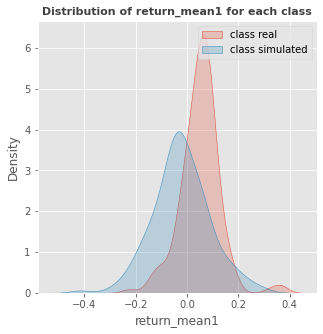

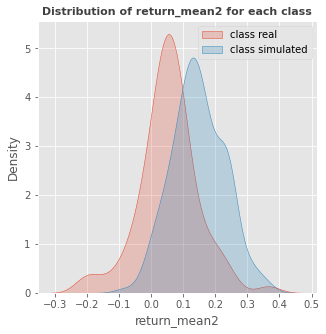

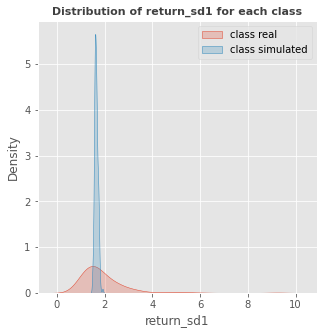

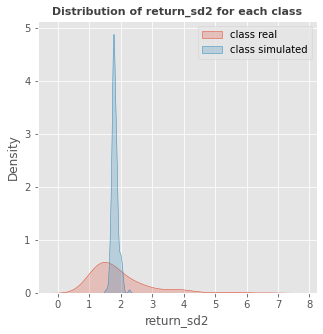

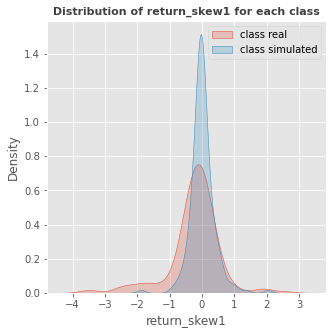

...

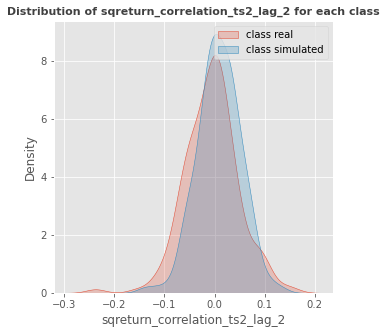

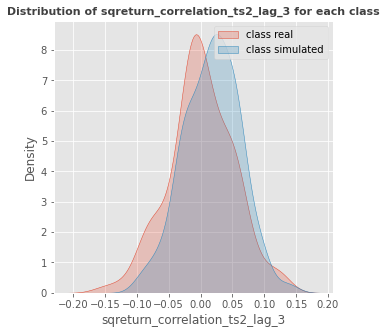

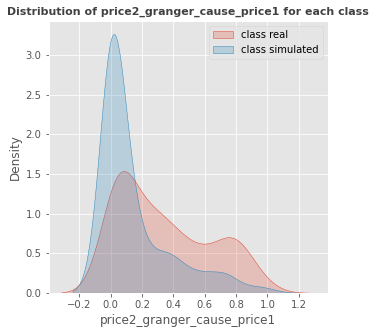

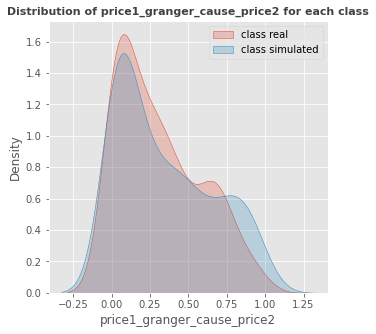

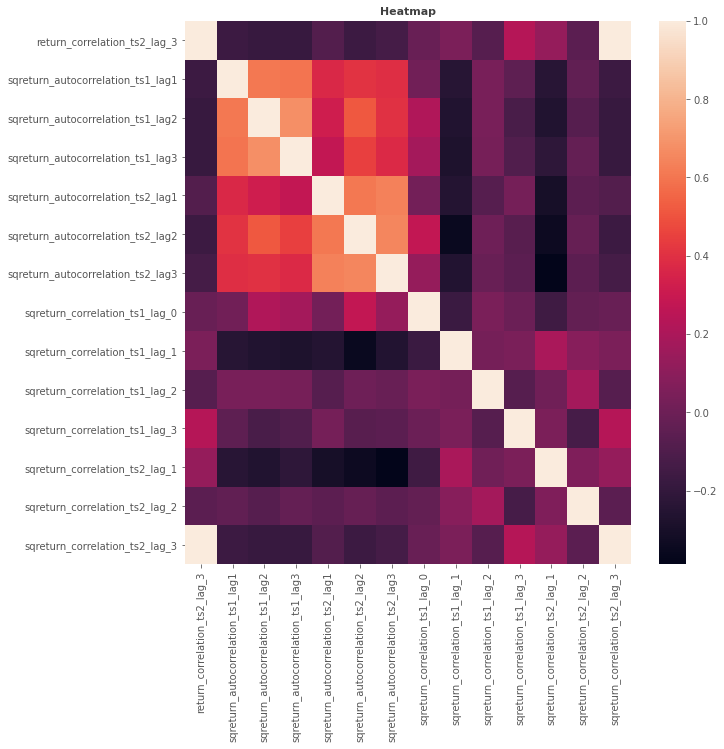

In [13]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")

In [14]:
import numpy as np
params = ((
     0.969867552, 0.459834027, 0.716245745, -0.005494871, 
    -3.182649601, -1.486862971, -1.414980764, -5.537951359, 
    -0.058109322, 0.136753281, -0.082964608, -0.015828684, 
    4.970891042, 3.299823758, 3.486979344,
  4.114299135, 4.763589890389, -1.44219871, -2.51675177))
print('mu1')
print(params[0]/params[1])
print('kappa1')
print(params[1])
print('mu2')
print(params[2]/params[3])
print('kappa2')
print(params[3])
print('sigma11')
print(np.exp(params[4]))
print('sigma12')
print(np.exp(params[5]))
print('sigma21')
print(np.exp(params[6]))
print('sigma22')
print(np.exp(params[7]))
print('j11')
print(params[8])
print('j12')
print(params[9])
print('j21')
print(params[10])
print('j22')
print(params[11])
print('alpha')
print(params[12])
print('delta')
print(params[13])
print('mu1')
print(params[14])
print('mu2')
print(params[15])
print('lambda11')
print(params[16])
print('lambda22')
print(1/params[16])

mu1
2.1091687327436515
kappa1
0.459834027
mu2
-130.34805457671345
kappa2
-0.005494871
sigma11
0.041475615572604076
sigma12
0.22608076619679984
sigma21
0.24293028641078715
sigma22
0.003934579127482812
j11
-0.058109322
j12
0.136753281
j21
-0.082964608
j22
-0.015828684
alpha
4.970891042
delta
3.299823758
mu1
3.486979344
mu2
4.114299135
lambda11
4.763589890389
lambda22
0.2099257121226149
